# CenterResnet Starter


I am very new to these concepts so I am trying out by changing this amazing and probably only 3D model related awesome public kernel by Ruslan
https://www.kaggle.com/hocop1/centernet-baseline

Most of the codes are loaned from there . There are other codes that I took from OFT implementation github . But I dont know what is OFT , so I have not yet implemented it . 

My current score is not from this kernel( as there are some errors in this kernel) , but from some simple architecture modification of the original public kernel. 


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

In [2]:
## Constants
SWITCH_LOSS_EPOCH = 5

# Load data

In [3]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

In [4]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

#plt.figure(figsize=(15,8))
#plt.imshow(img);

In [5]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [6]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

In [7]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

#plt.figure(figsize=(15,6))
#sns.countplot(lens);
#plt.xlabel('Number of cars in image');

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

In [8]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[rotate(c['roll'], np.pi) for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('roll rotated by pi')
# plt.show()

# 2D Visualization

In [9]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

#plt.figure(figsize=(14,14))
#plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
#plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

In [10]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

# Image preprocessing

In [11]:
IMG_WIDTH = 2048
IMG_HEIGHT = IMG_WIDTH // 4
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] //2 :]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

# PyTorch Dataset

In [12]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        
        return [img, mask, regr]
    
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

In [13]:
BATCH_SIZE = 4

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

In [14]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1):
        super(BasicBlock, self).__init__()

        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.GroupNorm(16, planes)

        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.GroupNorm(16, planes)

        if stride != 1 or inplanes != planes:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes, stride), nn.GroupNorm(16, planes))
        else:
            self.downsample = None


    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = self.bn2(self.conv2(out))

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out, inplace=True)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.GroupNorm(16, planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.GroupNorm(16, planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.GroupNorm(16, planes * self.expansion)

        if stride != 1 or inplanes != planes * self.expansion:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes * self.expansion, stride), 
                nn.GroupNorm(16, planes * self.expansion))
        else:
            self.downsample = None

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = F.relu(self.bn2(self.conv2(out)), inplace=True)
        out = self.bn3(self.conv3(out))
 
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out)

        return out


class ResNetFeatures(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNetFeatures, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.GroupNorm(16, 64)

        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):

        layers = []
        layers.append(block(self.inplanes, planes, stride))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)


    def forward(self, x):
        conv1 = F.relu(self.bn1(self.conv1(x)), inplace=True)
        conv1 = F.max_pool2d(conv1, 3, stride=2, padding=1)

        feats4 = self.layer1(conv1)
        feats8 = self.layer2(feats4)
        feats16 = self.layer3(feats8)
        feats32 = self.layer4(feats16)

        return feats8, feats16, feats32


def resnet18(pretrained=False, **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [2, 2, 2, 2], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet18']))
    return model



def resnet34(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet50(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet101(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 23, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model

def _load_pretrained(model, pretrained):
    model_dict = model.state_dict()
    pretrained = {k : v for k, v in pretrained.items() if k in model_dict}
    model_dict.update(pretrained)
    model.load_state_dict(model_dict)

In [15]:
from dlav0 import get_pose_net as get_dlav0
#from pose_dla_dcn import get_pose_net as get_dlav0

In [16]:
_model_factory = {
  #'res': get_pose_net, # default Resnet with deconv
  'dlav0': get_dlav0, # default DLAup
  #'dla': get_dla_dcn,
  #'resdcn': get_pose_net_dcn,
  #'hourglass': get_large_hourglass_net,
}

In [17]:
def create_model(arch, heads, head_conv):
    num_layers = int(arch[arch.find('_') + 1:]) if '_' in arch else 0
    arch = arch[:arch.find('_')] if '_' in arch else arch
    arch = 'dlav0'
    get_model = _model_factory[arch]
    model = get_model(num_layers=num_layers, heads=heads, head_conv=head_conv)
    return model

In [18]:
model = create_model('dla_34', {'hm': 1, 'reg' : 7} , 256)#{'hm': 3, 'dep': 1, 'rot': 8, 'dim': 3, 'wh': 2, 'reg': 2},256)

In [19]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 12 #6

#model = CentResnet(8).to(device)
model.cuda()
optimizer = optim.AdamW(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
#optimizer =  optim.Adam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [21]:
# Load Model

In [22]:
# model.load_state_dict(torch.load('./model-dla34_w08.pth'))
# model.eval();

In [20]:
# def gaussian_radius(det_size, min_overlap=0.7):
#     height, width = det_size

#     a1  = 1
#     b1  = (height + width)
#     c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
#     sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
#     r1  = (b1 + sq1) / 2

#     a2  = 4
#     b2  = 2 * (height + width)
#     c2  = (1 - min_overlap) * width * height
#     sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
#     r2  = (b2 + sq2) / 2

#     a3  = 4 * min_overlap
#     b3  = -2 * min_overlap * (height + width)
#     c3  = (min_overlap - 1) * width * height
#     sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
#     r3  = (b3 + sq3) / 2
#     return min(r1, r2, r3)
# def gaussian2D(shape, sigma=1):
#     m, n = [(ss - 1.) / 2. for ss in shape]
#     y, x = np.ogrid[-m:m+1,-n:n+1]

#     h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
#     h[h < np.finfo(h.dtype).eps * h.max()] = 0
#     return h
# def draw_msra_gaussian(heatmap, center, sigma):
#     tmp_size = sigma * 3
#     mu_x = int(center[0] + 0.5)
#     mu_y = int(center[1] + 0.5)
#     w, h = heatmap.shape[0], heatmap.shape[1]
#     ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
#     br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
#     if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
#         return heatmap
#     size = 2 * tmp_size + 1
#     x = np.arange(0, size, 1, np.float32)
#     y = x[:, np.newaxis]
    
#     x0 = y0 = size // 2
#     g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
#     g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
#     g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
#     img_x = max(0, ul[0]), min(br[0], h)
#     img_y = max(0, ul[1]), min(br[1], w)
    
    
#     heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
#         heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
#         g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
#     return heatmap

# def gaussian_mask(mask):
#     xlist, ylist = np.where(mask == 1)
#     masklist = [(i,j) for i, j in zip(xlist, ylist)]
#     hm = np.zeros(mask.shape) 

#     for (y,x) in masklist:
#         bbox = np.array([x-1, y-1, x+1, y+1])
#         h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
#         radius = gaussian_radius((h, w))    
#         ct = np.array([x,y], dtype=np.float32)
#         ct_int = ct.astype(np.int32)
#         hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
#         gm =+ draw_msra_gaussian(hm, ct, radius) # np.exp((y-5)/200)

#     #plt.figure(figsize=(16,16))
#     #plt.imshow(gm, vmin=0, vmax=1)
#     #plt.show()
    
#     return gm



In [24]:
# Gaussian

def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)

def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h

def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0])
    mu_y = int(center[1])
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap

def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-1, y-1, x+1, y+1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))
        ct = np.array([(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, 2) # np.exp((y-5)/200)

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm




In [25]:
from tqdm import tqdm
def apply_gaussian(dataset):
    for i in tqdm(range(len(dataset))):
        dataset[i][1] = gaussian_mask(dataset[i][1])    
    return dataset

train_dataset = apply_gaussian(train_dataset)

100%|██████████| 4219/4219 [31:31<00:00,  2.23it/s]


In [24]:
# from tqdm import tqdm
# def apply_gaussian(dataset):
#     for i in tqdm(range(len(dataset))):
#         dataset[i][1] = gaussian_mask(dataset[i][1])    
#     return dataset

# train_dataset = apply_gaussian(train_dataset)

# Training

In [26]:
def train(epoch, history=None):
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        
        if epoch < SWITCH_LOSS_EPOCH :
            loss, mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,1)
        else:
            loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5)  
        
        t.set_description(f'train_loss (l={loss:.3f})(m={mask_loss:.2f}) (r={regr_loss:.4f}')
        
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()

    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < SWITCH_LOSS_EPOCH :
                loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,1, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data
            else :
                loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [27]:
def _neg_loss(pred, gt):
    ''' Modified focal loss. Exactly the same as CornerNet.
      Runs faster and costs a little bit more memory
    Arguments:
      pred (batch x c x h x w)
      gt_regr (batch x c x h x w)
    '''
    pos_inds = gt.eq(1).float()
    neg_inds = gt.lt(1).float()

    neg_weights = torch.pow(1 - gt, 4)

    loss = 0

    pos_loss = torch.log(pred) * torch.pow(1 - pred, 2) * pos_inds
    neg_loss = torch.log(1 - pred) * torch.pow(pred, 2) * neg_weights * neg_inds

    num_pos  = pos_inds.float().sum()
    pos_loss = pos_loss.sum()
    neg_loss = neg_loss.sum()

    if num_pos == 0:
        loss = loss - neg_loss
    else:
        loss = loss - (pos_loss + neg_loss) / num_pos
    return loss

def criterion(prediction, mask, regr, weight=0.8, size_average=True):
    # Binary mask loss
    print(prediction[0]['hm'].shape)
    print(prediction[0]['reg'].shape)
    
    pred_mask = prediction[0]['hm']
    print(pred_mask.shape)
    pred_mask = torch.sigmoid(pred_mask[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

    #mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    #mask_loss = -mask_loss.mean(0).sum()


    mask_loss = _neg_loss(pred_mask,mask)
    
    # Regression L1 loss
    #pred_regr = prediction[:, 1:]
    pred_regr = prediction[0]['reg']
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)

    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    #if not size_average:
    #    loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss

In [28]:
%%time
import gc

history = pd.DataFrame()




for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)



train_loss (l=4.701)(m=4.70) (r=1.2182:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=5.125)(m=5.13) (r=1.4963:   0%|          | 1/1055 [00:01<29:16,  1.67s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=3.775)(m=3.78) (r=1.4335:   0%|          | 2/1055 [00:02<22:31,  1.28s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=3.212)(m=3.21) (r=1.7503:   0%|          | 3/1055 [00:02<17:50,  1.02s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.612)(m=2.61) (r=1.4607:   0%|          | 4/1055 [00:02<14:31,  1.21it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.455)(m=2.46) (r=1.3970:   0%|          | 5/1055 [00:03<12:13,  1.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.585)(m=2.58) (r=1.3281:   1%|          | 6/1055 [00:03<10:33,  1.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.596)(m=2.60) (r=1.5016:   1%|          | 7/1055 [00:04<09:23,  1.86it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.456)(m=2.46) (r=1.5228:   1%|          | 8/1055 [00:04<08:33,  2.04it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.426)(m=2.43) (r=1.2333:   1%|          | 9/1055 [00:04<08:01,  2.17it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.441)(m=2.44) (r=1.2455:   1%|          | 10/1055 [00:05<07:34,  2.30it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.467)(m=2.47) (r=1.2867:   1%|          | 11/1055 [00:05<07:16,  2.39it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.477)(m=2.48) (r=1.4053:   1%|          | 12/1055 [00:06<07:12,  2.41it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.229)(m=2.23) (r=1.5024:   1%|          | 13/1055 [00:06<07:07,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.455)(m=2.46) (r=1.1951:   1%|▏         | 14/1055 [00:06<07:01,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.152)(m=2.15) (r=1.4617:   1%|▏         | 15/1055 [00:07<06:52,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.251)(m=2.25) (r=1.3389:   2%|▏         | 16/1055 [00:07<06:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.384)(m=2.38) (r=1.3739:   2%|▏         | 17/1055 [00:07<06:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.150)(m=2.15) (r=1.5441:   2%|▏         | 18/1055 [00:08<06:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.102)(m=2.10) (r=1.3067:   2%|▏         | 19/1055 [00:08<06:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.097)(m=2.10) (r=1.3082:   2%|▏         | 20/1055 [00:09<06:32,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.133)(m=2.13) (r=1.3241:   2%|▏         | 21/1055 [00:09<06:29,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.067)(m=2.07) (r=1.4919:   2%|▏         | 22/1055 [00:09<06:32,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.120)(m=2.12) (r=1.3959:   2%|▏         | 23/1055 [00:10<06:30,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.220)(m=2.22) (r=1.5318:   2%|▏         | 24/1055 [00:10<06:29,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.100)(m=2.10) (r=1.3815:   2%|▏         | 25/1055 [00:11<06:28,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.059)(m=2.06) (r=1.3500:   2%|▏         | 26/1055 [00:11<06:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.010)(m=2.01) (r=1.3443:   3%|▎         | 27/1055 [00:11<06:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.016)(m=2.02) (r=1.3885:   3%|▎         | 28/1055 [00:12<06:28,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.830)(m=1.83) (r=1.3356:   3%|▎         | 29/1055 [00:12<06:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.058)(m=2.06) (r=1.4385:   3%|▎         | 30/1055 [00:12<06:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.038)(m=2.04) (r=1.3745:   3%|▎         | 31/1055 [00:13<06:27,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.179)(m=2.18) (r=1.3804:   3%|▎         | 32/1055 [00:13<06:26,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.779)(m=1.78) (r=1.4246:   3%|▎         | 33/1055 [00:14<06:25,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.115)(m=2.11) (r=1.3054:   3%|▎         | 34/1055 [00:14<06:25,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.178)(m=2.18) (r=1.1892:   3%|▎         | 35/1055 [00:14<06:25,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.170)(m=2.17) (r=1.5772:   3%|▎         | 36/1055 [00:15<06:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.907)(m=1.91) (r=1.2763:   4%|▎         | 37/1055 [00:15<06:22,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.621)(m=1.62) (r=1.4043:   4%|▎         | 38/1055 [00:15<06:23,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.853)(m=1.85) (r=1.4167:   4%|▎         | 39/1055 [00:16<06:23,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.656)(m=1.66) (r=1.3577:   4%|▍         | 40/1055 [00:16<06:23,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.852)(m=1.85) (r=1.4617:   4%|▍         | 41/1055 [00:17<06:23,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.916)(m=1.92) (r=1.2727:   4%|▍         | 42/1055 [00:17<06:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.645)(m=1.65) (r=1.4585:   4%|▍         | 43/1055 [00:17<06:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.851)(m=1.85) (r=1.3209:   4%|▍         | 44/1055 [00:18<06:23,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.825)(m=1.82) (r=1.3069:   4%|▍         | 45/1055 [00:18<06:21,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.676)(m=1.68) (r=1.3680:   4%|▍         | 46/1055 [00:18<06:19,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.652)(m=1.65) (r=1.6455:   4%|▍         | 47/1055 [00:19<06:20,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.609)(m=1.61) (r=1.3708:   5%|▍         | 48/1055 [00:19<06:17,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.926)(m=1.93) (r=1.2853:   5%|▍         | 49/1055 [00:20<06:18,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.792)(m=1.79) (r=1.4652:   5%|▍         | 50/1055 [00:20<06:17,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.793)(m=1.79) (r=1.4395:   5%|▍         | 51/1055 [00:20<06:17,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.597)(m=1.60) (r=1.5383:   5%|▍         | 52/1055 [00:21<06:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.871)(m=1.87) (r=1.5148:   5%|▌         | 53/1055 [00:21<06:17,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.998)(m=2.00) (r=1.3723:   5%|▌         | 54/1055 [00:21<06:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.785)(m=1.78) (r=1.6178:   5%|▌         | 55/1055 [00:22<06:15,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.910)(m=1.91) (r=1.3632:   5%|▌         | 56/1055 [00:22<06:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.593)(m=1.59) (r=1.5336:   5%|▌         | 57/1055 [00:23<06:16,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.749)(m=1.75) (r=1.3883:   5%|▌         | 58/1055 [00:23<06:17,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.947)(m=1.95) (r=1.2838:   6%|▌         | 59/1055 [00:23<06:17,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.738)(m=1.74) (r=1.5459:   6%|▌         | 60/1055 [00:24<06:16,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.825)(m=1.82) (r=1.4209:   6%|▌         | 61/1055 [00:24<06:14,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.528)(m=1.53) (r=1.2768:   6%|▌         | 62/1055 [00:24<06:13,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.755)(m=1.76) (r=1.4400:   6%|▌         | 63/1055 [00:25<06:13,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.482)(m=1.48) (r=1.3758:   6%|▌         | 64/1055 [00:25<06:12,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.628)(m=1.63) (r=1.3622:   6%|▌         | 65/1055 [00:26<06:12,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.612)(m=1.61) (r=1.3804:   6%|▋         | 66/1055 [00:26<06:10,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.641)(m=1.64) (r=1.4236:   6%|▋         | 67/1055 [00:26<06:10,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.496)(m=1.50) (r=1.4157:   6%|▋         | 68/1055 [00:27<06:11,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.988)(m=1.99) (r=1.2460:   7%|▋         | 69/1055 [00:27<06:12,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.874)(m=1.87) (r=1.3897:   7%|▋         | 70/1055 [00:27<06:10,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.742)(m=1.74) (r=1.3527:   7%|▋         | 71/1055 [00:28<06:10,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.586)(m=1.59) (r=1.3289:   7%|▋         | 72/1055 [00:28<06:10,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.599)(m=1.60) (r=1.4452:   7%|▋         | 73/1055 [00:29<06:08,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.581)(m=1.58) (r=1.4412:   7%|▋         | 74/1055 [00:29<06:07,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.792)(m=1.79) (r=1.4147:   7%|▋         | 75/1055 [00:29<06:10,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.745)(m=1.74) (r=1.4678:   7%|▋         | 76/1055 [00:30<06:08,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.508)(m=1.51) (r=1.3184:   7%|▋         | 77/1055 [00:30<06:07,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.533)(m=1.53) (r=2.8087:   7%|▋         | 78/1055 [00:30<06:08,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.509)(m=1.51) (r=1.5487:   7%|▋         | 79/1055 [00:31<06:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.891)(m=1.89) (r=1.3004:   8%|▊         | 80/1055 [00:31<06:08,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.887)(m=1.89) (r=1.5211:   8%|▊         | 81/1055 [00:32<06:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.492)(m=1.49) (r=1.3156:   8%|▊         | 82/1055 [00:32<06:06,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.779)(m=1.78) (r=1.4293:   8%|▊         | 83/1055 [00:32<06:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.742)(m=1.74) (r=1.2621:   8%|▊         | 84/1055 [00:33<06:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.791)(m=1.79) (r=1.4115:   8%|▊         | 85/1055 [00:33<06:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.742)(m=1.74) (r=1.3606:   8%|▊         | 86/1055 [00:34<06:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.813)(m=1.81) (r=1.4012:   8%|▊         | 87/1055 [00:34<06:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.903)(m=1.90) (r=1.2259:   8%|▊         | 88/1055 [00:34<06:06,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.894)(m=1.89) (r=1.2325:   8%|▊         | 89/1055 [00:35<06:06,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.794)(m=1.79) (r=1.3843:   9%|▊         | 90/1055 [00:35<06:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.766)(m=1.77) (r=1.4227:   9%|▊         | 91/1055 [00:35<06:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.531)(m=1.53) (r=1.6394:   9%|▊         | 92/1055 [00:36<06:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.629)(m=1.63) (r=1.4058:   9%|▉         | 93/1055 [00:36<06:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.493)(m=1.49) (r=1.7200:   9%|▉         | 94/1055 [00:37<06:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.600)(m=1.60) (r=1.2465:   9%|▉         | 95/1055 [00:37<06:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.413)(m=1.41) (r=1.3860:   9%|▉         | 96/1055 [00:37<06:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.600)(m=1.60) (r=1.3236:   9%|▉         | 97/1055 [00:38<06:01,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.637)(m=1.64) (r=1.3274:   9%|▉         | 98/1055 [00:38<06:01,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.484)(m=1.48) (r=1.4372:   9%|▉         | 99/1055 [00:38<05:59,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.708)(m=1.71) (r=1.2840:   9%|▉         | 100/1055 [00:39<05:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.633)(m=1.63) (r=1.3117:  10%|▉         | 101/1055 [00:39<05:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.869)(m=1.87) (r=1.3103:  10%|▉         | 102/1055 [00:40<05:58,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.510)(m=1.51) (r=1.4154:  10%|▉         | 103/1055 [00:40<05:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.638)(m=1.64) (r=1.5758:  10%|▉         | 104/1055 [00:40<05:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.426)(m=1.43) (r=1.3735:  10%|▉         | 105/1055 [00:41<05:59,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.473)(m=1.47) (r=1.3801:  10%|█         | 106/1055 [00:41<05:57,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.802)(m=1.80) (r=1.3540:  10%|█         | 107/1055 [00:41<05:57,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.451)(m=1.45) (r=1.4359:  10%|█         | 108/1055 [00:42<05:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.849)(m=1.85) (r=1.3026:  10%|█         | 109/1055 [00:42<05:56,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.566)(m=1.57) (r=1.3881:  10%|█         | 110/1055 [00:43<05:57,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.728)(m=1.73) (r=1.4741:  11%|█         | 111/1055 [00:43<05:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.656)(m=1.66) (r=1.4069:  11%|█         | 112/1055 [00:43<05:56,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.568)(m=1.57) (r=1.4232:  11%|█         | 113/1055 [00:44<05:55,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.574)(m=1.57) (r=1.3783:  11%|█         | 114/1055 [00:44<05:55,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.590)(m=1.59) (r=1.2977:  11%|█         | 115/1055 [00:44<05:55,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.694)(m=1.69) (r=1.3615:  11%|█         | 116/1055 [00:45<05:53,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.535)(m=1.54) (r=1.4054:  11%|█         | 117/1055 [00:45<05:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.457)(m=1.46) (r=1.6639:  11%|█         | 118/1055 [00:46<05:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.598)(m=1.60) (r=1.2882:  11%|█▏        | 119/1055 [00:46<05:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.452)(m=1.45) (r=1.2573:  11%|█▏        | 120/1055 [00:46<05:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.592)(m=1.59) (r=1.4072:  11%|█▏        | 121/1055 [00:47<05:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.667)(m=1.67) (r=1.4536:  12%|█▏        | 122/1055 [00:47<05:55,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.537)(m=1.54) (r=1.3218:  12%|█▏        | 123/1055 [00:48<05:53,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.845)(m=1.85) (r=1.4238:  12%|█▏        | 124/1055 [00:48<05:52,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.490)(m=1.49) (r=1.4540:  12%|█▏        | 125/1055 [00:48<05:52,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.413)(m=1.41) (r=1.3929:  12%|█▏        | 126/1055 [00:49<05:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.617)(m=1.62) (r=1.3648:  12%|█▏        | 127/1055 [00:49<05:51,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.530)(m=1.53) (r=1.2781:  12%|█▏        | 128/1055 [00:49<05:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.779)(m=1.78) (r=1.2766:  12%|█▏        | 129/1055 [00:50<05:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.338)(m=1.34) (r=1.3121:  12%|█▏        | 130/1055 [00:50<05:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.440)(m=1.44) (r=1.3385:  12%|█▏        | 131/1055 [00:51<05:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.336)(m=1.34) (r=1.4266:  13%|█▎        | 132/1055 [00:51<05:49,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.303)(m=1.30) (r=1.3931:  13%|█▎        | 133/1055 [00:51<05:47,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.364)(m=1.36) (r=1.5208:  13%|█▎        | 134/1055 [00:52<05:49,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.506)(m=1.51) (r=1.2778:  13%|█▎        | 135/1055 [00:52<05:49,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.377)(m=1.38) (r=1.5281:  13%|█▎        | 136/1055 [00:52<05:46,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.373)(m=1.37) (r=1.4082:  13%|█▎        | 137/1055 [00:53<05:47,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.353)(m=1.35) (r=1.3142:  13%|█▎        | 138/1055 [00:53<05:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.363)(m=1.36) (r=1.2678:  13%|█▎        | 139/1055 [00:54<05:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.531)(m=1.53) (r=1.5905:  13%|█▎        | 140/1055 [00:54<05:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.417)(m=1.42) (r=1.4185:  13%|█▎        | 141/1055 [00:54<05:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.350)(m=1.35) (r=1.3200:  13%|█▎        | 142/1055 [00:55<05:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.357)(m=1.36) (r=1.5692:  14%|█▎        | 143/1055 [00:55<05:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.506)(m=1.51) (r=1.4261:  14%|█▎        | 144/1055 [00:56<05:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.461)(m=1.46) (r=1.6703:  14%|█▎        | 145/1055 [00:56<05:45,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.481)(m=1.48) (r=1.2264:  14%|█▍        | 146/1055 [00:56<05:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.271)(m=1.27) (r=1.5545:  14%|█▍        | 147/1055 [00:57<05:43,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.830)(m=1.83) (r=1.3219:  14%|█▍        | 148/1055 [00:57<05:43,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.458)(m=1.46) (r=1.2862:  14%|█▍        | 149/1055 [00:57<05:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.774)(m=1.77) (r=1.4166:  14%|█▍        | 150/1055 [00:58<05:42,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.435)(m=1.44) (r=1.5134:  14%|█▍        | 151/1055 [00:58<05:42,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.373)(m=1.37) (r=1.3652:  14%|█▍        | 152/1055 [00:59<05:43,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.441)(m=1.44) (r=1.3836:  15%|█▍        | 153/1055 [00:59<05:41,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.307)(m=1.31) (r=1.4232:  15%|█▍        | 154/1055 [00:59<05:40,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.498)(m=1.50) (r=1.4317:  15%|█▍        | 155/1055 [01:00<05:41,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.489)(m=1.49) (r=1.3707:  15%|█▍        | 156/1055 [01:00<05:39,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.654)(m=1.65) (r=1.3103:  15%|█▍        | 157/1055 [01:00<05:38,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.557)(m=1.56) (r=1.2745:  15%|█▍        | 158/1055 [01:01<05:38,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.587)(m=1.59) (r=1.3506:  15%|█▌        | 159/1055 [01:01<05:37,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.514)(m=1.51) (r=1.4138:  15%|█▌        | 160/1055 [01:02<05:36,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.482)(m=1.48) (r=1.5618:  15%|█▌        | 161/1055 [01:02<05:35,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.334)(m=1.33) (r=1.5406:  15%|█▌        | 162/1055 [01:02<05:35,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.410)(m=1.41) (r=1.3569:  15%|█▌        | 163/1055 [01:03<05:36,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.675)(m=1.68) (r=1.3399:  16%|█▌        | 164/1055 [01:03<05:34,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.605)(m=1.61) (r=1.3420:  16%|█▌        | 165/1055 [01:03<05:34,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.584)(m=1.58) (r=1.4391:  16%|█▌        | 166/1055 [01:04<05:36,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.407)(m=1.41) (r=1.3950:  16%|█▌        | 167/1055 [01:04<05:37,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.401)(m=1.40) (r=1.4845:  16%|█▌        | 168/1055 [01:05<05:37,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.384)(m=1.38) (r=1.4265:  16%|█▌        | 169/1055 [01:05<05:36,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.517)(m=1.52) (r=1.3917:  16%|█▌        | 170/1055 [01:05<05:34,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.435)(m=1.44) (r=1.4227:  16%|█▌        | 171/1055 [01:06<05:32,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.427)(m=1.43) (r=1.4073:  16%|█▋        | 172/1055 [01:06<05:34,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.552)(m=1.55) (r=1.3735:  16%|█▋        | 173/1055 [01:06<05:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.551)(m=1.55) (r=1.4423:  16%|█▋        | 174/1055 [01:07<05:33,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.624)(m=1.62) (r=1.4620:  17%|█▋        | 175/1055 [01:07<05:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.632)(m=1.63) (r=1.3113:  17%|█▋        | 176/1055 [01:08<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.513)(m=1.51) (r=1.5288:  17%|█▋        | 177/1055 [01:08<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.606)(m=1.61) (r=1.5254:  17%|█▋        | 178/1055 [01:08<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.809)(m=1.81) (r=1.2860:  17%|█▋        | 179/1055 [01:09<05:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.265)(m=1.26) (r=1.5487:  17%|█▋        | 180/1055 [01:09<05:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.430)(m=1.43) (r=1.4058:  17%|█▋        | 181/1055 [01:10<05:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.411)(m=1.41) (r=1.3618:  17%|█▋        | 182/1055 [01:10<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.511)(m=1.51) (r=1.4076:  17%|█▋        | 183/1055 [01:10<05:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.390)(m=1.39) (r=1.3182:  17%|█▋        | 184/1055 [01:11<05:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.343)(m=1.34) (r=1.4805:  18%|█▊        | 185/1055 [01:11<05:28,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.535)(m=1.53) (r=1.3564:  18%|█▊        | 186/1055 [01:11<05:27,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.711)(m=1.71) (r=1.2460:  18%|█▊        | 187/1055 [01:12<05:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.470)(m=1.47) (r=1.3153:  18%|█▊        | 188/1055 [01:12<05:27,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.495)(m=1.49) (r=1.4958:  18%|█▊        | 189/1055 [01:13<05:27,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.450)(m=1.45) (r=1.2799:  18%|█▊        | 190/1055 [01:13<05:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.521)(m=1.52) (r=1.3566:  18%|█▊        | 191/1055 [01:13<05:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.453)(m=1.45) (r=1.3072:  18%|█▊        | 192/1055 [01:14<05:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.420)(m=1.42) (r=1.3939:  18%|█▊        | 193/1055 [01:14<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.273)(m=1.27) (r=1.6987:  18%|█▊        | 194/1055 [01:14<05:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.216)(m=1.22) (r=1.3661:  18%|█▊        | 195/1055 [01:15<05:25,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.343)(m=1.34) (r=1.3850:  19%|█▊        | 196/1055 [01:15<05:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.834)(m=1.83) (r=1.2858:  19%|█▊        | 197/1055 [01:16<05:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.3410:  19%|█▉        | 198/1055 [01:16<05:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.481)(m=1.48) (r=1.3900:  19%|█▉        | 199/1055 [01:16<05:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.550)(m=1.55) (r=1.3979:  19%|█▉        | 200/1055 [01:17<05:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.402)(m=1.40) (r=1.3009:  19%|█▉        | 201/1055 [01:17<05:26,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.461)(m=1.46) (r=1.3912:  19%|█▉        | 202/1055 [01:18<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.393)(m=1.39) (r=1.4121:  19%|█▉        | 203/1055 [01:18<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.461)(m=1.46) (r=1.2722:  19%|█▉        | 204/1055 [01:18<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.352)(m=1.35) (r=1.3581:  19%|█▉        | 205/1055 [01:19<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.309)(m=1.31) (r=1.5122:  20%|█▉        | 206/1055 [01:19<05:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.008)(m=2.01) (r=1.5172:  20%|█▉        | 207/1055 [01:19<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.287)(m=1.29) (r=1.4620:  20%|█▉        | 208/1055 [01:20<05:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.560)(m=1.56) (r=1.3786:  20%|█▉        | 209/1055 [01:20<05:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.539)(m=1.54) (r=1.4372:  20%|█▉        | 210/1055 [01:21<05:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.525)(m=1.53) (r=1.4484:  20%|██        | 211/1055 [01:21<05:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.383)(m=1.38) (r=1.5095:  20%|██        | 212/1055 [01:21<05:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.533)(m=1.53) (r=1.3609:  20%|██        | 213/1055 [01:22<05:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.489)(m=1.49) (r=1.3593:  20%|██        | 214/1055 [01:22<05:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.361)(m=1.36) (r=1.4169:  20%|██        | 215/1055 [01:23<05:19,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.544)(m=1.54) (r=1.2653:  20%|██        | 216/1055 [01:23<05:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.533)(m=1.53) (r=1.3180:  21%|██        | 217/1055 [01:23<05:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.493)(m=1.49) (r=1.3230:  21%|██        | 218/1055 [01:24<05:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.570)(m=1.57) (r=1.3866:  21%|██        | 219/1055 [01:24<05:17,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.422)(m=1.42) (r=1.5127:  21%|██        | 220/1055 [01:24<05:16,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.470)(m=1.47) (r=1.3577:  21%|██        | 221/1055 [01:25<05:17,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.275)(m=1.27) (r=1.3956:  21%|██        | 222/1055 [01:25<05:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.399)(m=1.40) (r=1.3335:  21%|██        | 223/1055 [01:26<05:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.472)(m=1.47) (r=1.5905:  21%|██        | 224/1055 [01:26<05:14,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.466)(m=1.47) (r=1.3006:  21%|██▏       | 225/1055 [01:26<05:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.422)(m=1.42) (r=1.3216:  21%|██▏       | 226/1055 [01:27<05:15,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.454)(m=1.45) (r=1.4782:  22%|██▏       | 227/1055 [01:27<05:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.542)(m=1.54) (r=1.3106:  22%|██▏       | 228/1055 [01:27<05:13,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.362)(m=1.36) (r=1.5228:  22%|██▏       | 229/1055 [01:28<05:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.366)(m=1.37) (r=1.3759:  22%|██▏       | 230/1055 [01:28<05:12,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.355)(m=1.35) (r=1.3856:  22%|██▏       | 231/1055 [01:29<05:11,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.408)(m=1.41) (r=1.2763:  22%|██▏       | 232/1055 [01:29<05:11,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.355)(m=1.35) (r=1.3720:  22%|██▏       | 233/1055 [01:29<05:11,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.444)(m=1.44) (r=1.2639:  22%|██▏       | 234/1055 [01:30<05:10,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.502)(m=1.50) (r=1.2969:  22%|██▏       | 235/1055 [01:30<05:09,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.424)(m=1.42) (r=1.2930:  22%|██▏       | 236/1055 [01:31<05:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.385)(m=1.38) (r=1.2916:  22%|██▏       | 237/1055 [01:31<05:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.380)(m=1.38) (r=1.2433:  23%|██▎       | 238/1055 [01:31<05:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.4392:  23%|██▎       | 239/1055 [01:32<05:09,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.534)(m=1.53) (r=1.3903:  23%|██▎       | 240/1055 [01:32<05:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.508)(m=1.51) (r=1.2079:  23%|██▎       | 241/1055 [01:32<05:08,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.311)(m=1.31) (r=1.3768:  23%|██▎       | 242/1055 [01:33<05:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.383)(m=1.38) (r=1.2531:  23%|██▎       | 243/1055 [01:33<05:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.295)(m=1.29) (r=1.2842:  23%|██▎       | 244/1055 [01:34<05:06,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.298)(m=1.30) (r=1.4177:  23%|██▎       | 245/1055 [01:34<05:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.5137:  23%|██▎       | 246/1055 [01:34<05:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.404)(m=1.40) (r=1.3988:  23%|██▎       | 247/1055 [01:35<05:05,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.503)(m=1.50) (r=1.4524:  24%|██▎       | 248/1055 [01:35<05:04,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.428)(m=1.43) (r=1.4921:  24%|██▎       | 249/1055 [01:35<05:05,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.254)(m=1.25) (r=1.2813:  24%|██▎       | 250/1055 [01:36<05:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.470)(m=1.47) (r=1.3148:  24%|██▍       | 251/1055 [01:36<05:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.329)(m=1.33) (r=1.4067:  24%|██▍       | 252/1055 [01:37<05:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.433)(m=1.43) (r=1.3742:  24%|██▍       | 253/1055 [01:37<05:03,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.471)(m=1.47) (r=1.3530:  24%|██▍       | 254/1055 [01:37<05:02,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.428)(m=1.43) (r=1.5211:  24%|██▍       | 255/1055 [01:38<05:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.283)(m=1.28) (r=1.4762:  24%|██▍       | 256/1055 [01:38<05:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.732)(m=1.73) (r=1.4076:  24%|██▍       | 257/1055 [01:38<05:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.424)(m=1.42) (r=1.3537:  24%|██▍       | 258/1055 [01:39<05:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.409)(m=1.41) (r=1.6133:  25%|██▍       | 259/1055 [01:39<05:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.276)(m=1.28) (r=1.3674:  25%|██▍       | 260/1055 [01:40<05:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.214)(m=1.21) (r=1.4442:  25%|██▍       | 261/1055 [01:40<05:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.651)(m=1.65) (r=1.3672:  25%|██▍       | 262/1055 [01:40<05:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.440)(m=1.44) (r=1.3643:  25%|██▍       | 263/1055 [01:41<05:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.501)(m=1.50) (r=1.2389:  25%|██▌       | 264/1055 [01:41<05:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.551)(m=1.55) (r=1.2743:  25%|██▌       | 265/1055 [01:42<05:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.661)(m=1.66) (r=1.3072:  25%|██▌       | 266/1055 [01:42<05:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.269)(m=1.27) (r=1.5472:  25%|██▌       | 267/1055 [01:42<04:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.584)(m=1.58) (r=1.3453:  25%|██▌       | 268/1055 [01:43<05:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.528)(m=1.53) (r=1.3500:  25%|██▌       | 269/1055 [01:43<05:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.448)(m=1.45) (r=1.2997:  26%|██▌       | 270/1055 [01:43<05:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.525)(m=1.53) (r=1.3704:  26%|██▌       | 271/1055 [01:44<04:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.319)(m=1.32) (r=1.4037:  26%|██▌       | 272/1055 [01:44<04:57,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.325)(m=1.33) (r=1.4037:  26%|██▌       | 273/1055 [01:45<04:55,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.426)(m=1.43) (r=1.4101:  26%|██▌       | 274/1055 [01:45<04:55,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.308)(m=1.31) (r=1.5074:  26%|██▌       | 275/1055 [01:45<04:55,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.445)(m=1.45) (r=1.2120:  26%|██▌       | 276/1055 [01:46<04:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.628)(m=1.63) (r=1.4411:  26%|██▋       | 277/1055 [01:46<04:55,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.292)(m=1.29) (r=1.4702:  26%|██▋       | 278/1055 [01:46<04:55,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.237)(m=1.24) (r=1.3888:  26%|██▋       | 279/1055 [01:47<04:53,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.539)(m=1.54) (r=1.3264:  27%|██▋       | 280/1055 [01:47<04:52,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.484)(m=1.48) (r=1.3180:  27%|██▋       | 281/1055 [01:48<04:52,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.232)(m=1.23) (r=1.4026:  27%|██▋       | 282/1055 [01:48<04:51,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.543)(m=1.54) (r=1.2385:  27%|██▋       | 283/1055 [01:48<04:50,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.440)(m=1.44) (r=1.3193:  27%|██▋       | 284/1055 [01:49<04:49,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.304)(m=1.30) (r=1.3376:  27%|██▋       | 285/1055 [01:49<04:49,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.313)(m=1.31) (r=1.3136:  27%|██▋       | 286/1055 [01:49<04:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.453)(m=1.45) (r=1.3104:  27%|██▋       | 287/1055 [01:50<04:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.251)(m=1.25) (r=1.5894:  27%|██▋       | 288/1055 [01:50<04:49,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.272)(m=1.27) (r=1.3833:  27%|██▋       | 289/1055 [01:51<04:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.509)(m=1.51) (r=1.3338:  27%|██▋       | 290/1055 [01:51<04:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.4620:  28%|██▊       | 291/1055 [01:51<04:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.336)(m=1.34) (r=1.2839:  28%|██▊       | 292/1055 [01:52<04:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.109)(m=1.11) (r=1.4592:  28%|██▊       | 293/1055 [01:52<04:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.290)(m=1.29) (r=1.3203:  28%|██▊       | 294/1055 [01:53<04:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.495)(m=1.49) (r=1.3607:  28%|██▊       | 295/1055 [01:53<04:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.4839:  28%|██▊       | 296/1055 [01:53<04:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.662)(m=1.66) (r=1.4032:  28%|██▊       | 297/1055 [01:54<04:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.685)(m=1.69) (r=1.5279:  28%|██▊       | 298/1055 [01:54<04:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.320)(m=1.32) (r=1.4097:  28%|██▊       | 299/1055 [01:54<04:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.251)(m=1.25) (r=1.3033:  28%|██▊       | 300/1055 [01:55<04:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.288)(m=1.29) (r=1.5058:  29%|██▊       | 301/1055 [01:55<04:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.231)(m=1.23) (r=1.3599:  29%|██▊       | 302/1055 [01:56<04:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.295)(m=1.30) (r=1.5435:  29%|██▊       | 303/1055 [01:56<04:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.364)(m=1.36) (r=1.4464:  29%|██▉       | 304/1055 [01:56<04:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.338)(m=1.34) (r=1.4426:  29%|██▉       | 305/1055 [01:57<04:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.108)(m=1.11) (r=1.5025:  29%|██▉       | 306/1055 [01:57<04:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.285)(m=1.29) (r=1.4110:  29%|██▉       | 307/1055 [01:57<04:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.274)(m=1.27) (r=1.3479:  29%|██▉       | 308/1055 [01:58<04:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.189)(m=1.19) (r=1.2001:  29%|██▉       | 309/1055 [01:58<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.357)(m=1.36) (r=1.2748:  29%|██▉       | 310/1055 [01:59<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.268)(m=1.27) (r=1.4430:  29%|██▉       | 311/1055 [01:59<04:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.461)(m=1.46) (r=1.3804:  30%|██▉       | 312/1055 [01:59<04:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.352)(m=1.35) (r=1.3535:  30%|██▉       | 313/1055 [02:00<04:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.433)(m=1.43) (r=1.3299:  30%|██▉       | 314/1055 [02:00<04:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.448)(m=1.45) (r=1.3699:  30%|██▉       | 315/1055 [02:01<04:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.331)(m=1.33) (r=1.4733:  30%|██▉       | 316/1055 [02:01<04:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.400)(m=1.40) (r=1.3548:  30%|███       | 317/1055 [02:01<04:40,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.325)(m=1.33) (r=1.2901:  30%|███       | 318/1055 [02:02<04:38,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.5172:  30%|███       | 319/1055 [02:02<04:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.512)(m=1.51) (r=1.2831:  30%|███       | 320/1055 [02:02<04:38,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.361)(m=1.36) (r=1.3040:  30%|███       | 321/1055 [02:03<04:38,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.391)(m=1.39) (r=1.3231:  31%|███       | 322/1055 [02:03<04:37,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.194)(m=1.19) (r=1.4142:  31%|███       | 323/1055 [02:04<04:36,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.264)(m=1.26) (r=1.4081:  31%|███       | 324/1055 [02:04<04:36,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.233)(m=1.23) (r=1.3071:  31%|███       | 325/1055 [02:04<04:36,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.214)(m=1.21) (r=1.3776:  31%|███       | 326/1055 [02:05<04:35,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.367)(m=1.37) (r=1.4826:  31%|███       | 327/1055 [02:05<04:36,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.381)(m=1.38) (r=1.4734:  31%|███       | 328/1055 [02:05<04:36,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.337)(m=1.34) (r=1.4005:  31%|███       | 329/1055 [02:06<04:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.464)(m=1.46) (r=1.2939:  31%|███▏      | 330/1055 [02:06<04:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.325)(m=1.33) (r=1.3524:  31%|███▏      | 331/1055 [02:07<04:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.195)(m=1.20) (r=1.3725:  31%|███▏      | 332/1055 [02:07<04:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.3817:  32%|███▏      | 333/1055 [02:07<04:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.448)(m=1.45) (r=1.4247:  32%|███▏      | 334/1055 [02:08<04:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.364)(m=1.36) (r=1.3438:  32%|███▏      | 335/1055 [02:08<04:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.420)(m=1.42) (r=1.2793:  32%|███▏      | 336/1055 [02:09<04:31,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.341)(m=1.34) (r=1.2915:  32%|███▏      | 337/1055 [02:09<04:32,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.385)(m=1.39) (r=1.2606:  32%|███▏      | 338/1055 [02:09<04:30,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.4213:  32%|███▏      | 339/1055 [02:10<04:29,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.341)(m=1.34) (r=1.2107:  32%|███▏      | 340/1055 [02:10<04:31,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.219)(m=1.22) (r=1.5432:  32%|███▏      | 341/1055 [02:10<04:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.449)(m=1.45) (r=1.2900:  32%|███▏      | 342/1055 [02:11<04:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.282)(m=1.28) (r=1.3168:  33%|███▎      | 343/1055 [02:11<04:29,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.472)(m=1.47) (r=1.3473:  33%|███▎      | 344/1055 [02:12<04:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.399)(m=1.40) (r=1.3763:  33%|███▎      | 345/1055 [02:12<04:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.414)(m=1.41) (r=1.3064:  33%|███▎      | 346/1055 [02:12<04:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.277)(m=1.28) (r=1.5213:  33%|███▎      | 347/1055 [02:13<04:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.272)(m=1.27) (r=1.5584:  33%|███▎      | 348/1055 [02:13<04:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.280)(m=1.28) (r=1.3741:  33%|███▎      | 349/1055 [02:13<04:27,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.350)(m=1.35) (r=1.3890:  33%|███▎      | 350/1055 [02:14<04:28,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.236)(m=1.24) (r=1.4556:  33%|███▎      | 351/1055 [02:14<04:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.283)(m=1.28) (r=1.4003:  33%|███▎      | 352/1055 [02:15<04:26,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.580)(m=1.58) (r=1.3308:  33%|███▎      | 353/1055 [02:15<04:26,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.5174:  34%|███▎      | 354/1055 [02:15<04:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.387)(m=1.39) (r=1.2639:  34%|███▎      | 355/1055 [02:16<04:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.415)(m=1.42) (r=1.2422:  34%|███▎      | 356/1055 [02:16<04:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.434)(m=1.43) (r=1.4621:  34%|███▍      | 357/1055 [02:17<04:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.363)(m=1.36) (r=1.6277:  34%|███▍      | 358/1055 [02:17<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.313)(m=1.31) (r=1.4497:  34%|███▍      | 359/1055 [02:17<04:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.483)(m=1.48) (r=1.3736:  34%|███▍      | 360/1055 [02:18<04:23,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.404)(m=1.40) (r=1.3728:  34%|███▍      | 361/1055 [02:18<04:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.208)(m=1.21) (r=1.2147:  34%|███▍      | 362/1055 [02:18<04:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.417)(m=1.42) (r=1.5574:  34%|███▍      | 363/1055 [02:19<04:22,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.333)(m=1.33) (r=1.5185:  35%|███▍      | 364/1055 [02:19<04:22,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.413)(m=1.41) (r=1.3864:  35%|███▍      | 365/1055 [02:20<04:21,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.351)(m=1.35) (r=1.4502:  35%|███▍      | 366/1055 [02:20<04:21,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.234)(m=1.23) (r=1.5231:  35%|███▍      | 367/1055 [02:20<04:20,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.182)(m=1.18) (r=1.4394:  35%|███▍      | 368/1055 [02:21<04:20,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.141)(m=1.14) (r=1.2528:  35%|███▍      | 369/1055 [02:21<04:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.256)(m=1.26) (r=1.3990:  35%|███▌      | 370/1055 [02:21<04:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.160)(m=1.16) (r=1.3810:  35%|███▌      | 371/1055 [02:22<04:19,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.398)(m=1.40) (r=1.3837:  35%|███▌      | 372/1055 [02:22<04:19,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.204)(m=1.20) (r=1.3434:  35%|███▌      | 373/1055 [02:23<04:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.327)(m=1.33) (r=1.3978:  35%|███▌      | 374/1055 [02:23<04:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.416)(m=1.42) (r=1.2363:  36%|███▌      | 375/1055 [02:23<04:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.455)(m=1.46) (r=1.4077:  36%|███▌      | 376/1055 [02:24<04:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.292)(m=1.29) (r=1.2628:  36%|███▌      | 377/1055 [02:24<04:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.435)(m=1.43) (r=1.4390:  36%|███▌      | 378/1055 [02:24<04:17,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.261)(m=1.26) (r=1.2807:  36%|███▌      | 379/1055 [02:25<04:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.555)(m=1.55) (r=1.4578:  36%|███▌      | 380/1055 [02:25<04:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.320)(m=1.32) (r=1.4769:  36%|███▌      | 381/1055 [02:26<04:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.267)(m=1.27) (r=1.4952:  36%|███▌      | 382/1055 [02:26<04:13,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.310)(m=1.31) (r=1.3743:  36%|███▋      | 383/1055 [02:26<04:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.503)(m=1.50) (r=1.5365:  36%|███▋      | 384/1055 [02:27<04:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.301)(m=1.30) (r=1.3603:  36%|███▋      | 385/1055 [02:27<04:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.448)(m=1.45) (r=1.3939:  37%|███▋      | 386/1055 [02:28<04:13,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.212)(m=1.21) (r=1.6685:  37%|███▋      | 387/1055 [02:28<04:12,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.4034:  37%|███▋      | 388/1055 [02:28<04:11,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.477)(m=1.48) (r=1.4461:  37%|███▋      | 389/1055 [02:29<04:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.690)(m=1.69) (r=1.3912:  37%|███▋      | 390/1055 [02:29<04:11,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.465)(m=1.47) (r=1.4674:  37%|███▋      | 391/1055 [02:29<04:11,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.4123:  37%|███▋      | 392/1055 [02:30<04:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.071)(m=1.07) (r=1.4204:  37%|███▋      | 393/1055 [02:30<04:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.284)(m=1.28) (r=1.4393:  37%|███▋      | 394/1055 [02:31<04:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.3403:  37%|███▋      | 395/1055 [02:31<04:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.193)(m=1.19) (r=1.4602:  38%|███▊      | 396/1055 [02:31<04:10,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.180)(m=1.18) (r=1.4009:  38%|███▊      | 397/1055 [02:32<04:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.297)(m=1.30) (r=1.4281:  38%|███▊      | 398/1055 [02:32<04:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.329)(m=1.33) (r=1.4547:  38%|███▊      | 399/1055 [02:32<04:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.506)(m=1.51) (r=1.2542:  38%|███▊      | 400/1055 [02:33<04:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.219)(m=1.22) (r=1.3458:  38%|███▊      | 401/1055 [02:33<04:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.434)(m=1.43) (r=1.3842:  38%|███▊      | 402/1055 [02:34<04:06,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.526)(m=1.53) (r=1.3158:  38%|███▊      | 403/1055 [02:34<04:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.6535:  38%|███▊      | 404/1055 [02:34<04:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.248)(m=1.25) (r=1.5076:  38%|███▊      | 405/1055 [02:35<04:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.4313:  38%|███▊      | 406/1055 [02:35<04:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.5150:  39%|███▊      | 407/1055 [02:36<04:06,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.373)(m=1.37) (r=1.3323:  39%|███▊      | 408/1055 [02:36<04:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.428)(m=1.43) (r=1.2780:  39%|███▉      | 409/1055 [02:36<04:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.126)(m=1.13) (r=1.3997:  39%|███▉      | 410/1055 [02:37<04:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.262)(m=1.26) (r=1.3443:  39%|███▉      | 411/1055 [02:37<04:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.463)(m=1.46) (r=1.3057:  39%|███▉      | 412/1055 [02:37<04:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.331)(m=1.33) (r=1.3426:  39%|███▉      | 413/1055 [02:38<04:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.328)(m=1.33) (r=1.3780:  39%|███▉      | 414/1055 [02:38<04:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.340)(m=1.34) (r=1.5775:  39%|███▉      | 415/1055 [02:39<04:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.274)(m=1.27) (r=1.3738:  39%|███▉      | 416/1055 [02:39<04:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.228)(m=1.23) (r=1.2430:  40%|███▉      | 417/1055 [02:39<04:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.309)(m=1.31) (r=1.4814:  40%|███▉      | 418/1055 [02:40<04:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.333)(m=1.33) (r=1.3820:  40%|███▉      | 419/1055 [02:40<04:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.220)(m=1.22) (r=1.4622:  40%|███▉      | 420/1055 [02:40<04:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.292)(m=1.29) (r=1.2735:  40%|███▉      | 421/1055 [02:41<04:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.170)(m=1.17) (r=1.3798:  40%|████      | 422/1055 [02:41<04:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.403)(m=1.40) (r=1.5842:  40%|████      | 423/1055 [02:42<04:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.292)(m=1.29) (r=1.4573:  40%|████      | 424/1055 [02:42<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.226)(m=1.23) (r=1.3818:  40%|████      | 425/1055 [02:42<04:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.529)(m=1.53) (r=1.3221:  40%|████      | 426/1055 [02:43<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.289)(m=1.29) (r=1.3262:  40%|████      | 427/1055 [02:43<03:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.236)(m=1.24) (r=1.4338:  41%|████      | 428/1055 [02:43<03:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.439)(m=1.44) (r=1.4544:  41%|████      | 429/1055 [02:44<03:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.269)(m=1.27) (r=1.3109:  41%|████      | 430/1055 [02:44<04:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.212)(m=1.21) (r=1.3568:  41%|████      | 431/1055 [02:45<03:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.4524:  41%|████      | 432/1055 [02:45<03:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.184)(m=1.18) (r=1.4255:  41%|████      | 433/1055 [02:45<03:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.3249:  41%|████      | 434/1055 [02:46<03:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.293)(m=1.29) (r=1.4128:  41%|████      | 435/1055 [02:46<03:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.554)(m=1.55) (r=1.4426:  41%|████▏     | 436/1055 [02:47<03:55,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.209)(m=1.21) (r=1.4328:  41%|████▏     | 437/1055 [02:47<03:54,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.416)(m=1.42) (r=1.2887:  42%|████▏     | 438/1055 [02:47<03:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.171)(m=1.17) (r=1.3063:  42%|████▏     | 439/1055 [02:48<03:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.606)(m=1.61) (r=1.2965:  42%|████▏     | 440/1055 [02:48<03:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4160:  42%|████▏     | 441/1055 [02:48<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.237)(m=2.24) (r=1.4205:  42%|████▏     | 442/1055 [02:49<03:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.5973:  42%|████▏     | 443/1055 [02:49<03:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.722)(m=1.72) (r=1.3743:  42%|████▏     | 444/1055 [02:50<03:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.513)(m=1.51) (r=1.4006:  42%|████▏     | 445/1055 [02:50<03:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.210)(m=1.21) (r=1.6345:  42%|████▏     | 446/1055 [02:50<03:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.223)(m=1.22) (r=1.3850:  42%|████▏     | 447/1055 [02:51<03:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.232)(m=1.23) (r=1.5587:  42%|████▏     | 448/1055 [02:51<03:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.543)(m=1.54) (r=1.3828:  43%|████▎     | 449/1055 [02:52<03:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.346)(m=1.35) (r=1.4245:  43%|████▎     | 450/1055 [02:52<03:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.324)(m=1.32) (r=1.3253:  43%|████▎     | 451/1055 [02:52<03:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.323)(m=1.32) (r=1.5865:  43%|████▎     | 452/1055 [02:53<03:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.4635:  43%|████▎     | 453/1055 [02:53<03:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.300)(m=1.30) (r=1.3264:  43%|████▎     | 454/1055 [02:53<03:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.172)(m=1.17) (r=1.3949:  43%|████▎     | 455/1055 [02:54<03:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.182)(m=1.18) (r=1.5090:  43%|████▎     | 456/1055 [02:54<03:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.352)(m=1.35) (r=1.3395:  43%|████▎     | 457/1055 [02:55<03:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.346)(m=1.35) (r=1.3761:  43%|████▎     | 458/1055 [02:55<03:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.179)(m=1.18) (r=1.3440:  44%|████▎     | 459/1055 [02:55<03:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.591)(m=1.59) (r=1.3011:  44%|████▎     | 460/1055 [02:56<03:45,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.402)(m=1.40) (r=1.3111:  44%|████▎     | 461/1055 [02:56<03:45,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.404)(m=1.40) (r=1.3634:  44%|████▍     | 462/1055 [02:56<03:44,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.238)(m=1.24) (r=1.6393:  44%|████▍     | 463/1055 [02:57<03:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.374)(m=1.37) (r=1.5253:  44%|████▍     | 464/1055 [02:57<03:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.424)(m=1.42) (r=1.3672:  44%|████▍     | 465/1055 [02:58<03:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.265)(m=1.26) (r=1.3743:  44%|████▍     | 466/1055 [02:58<03:43,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.326)(m=1.33) (r=1.3991:  44%|████▍     | 467/1055 [02:58<03:43,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.640)(m=1.64) (r=1.3632:  44%|████▍     | 468/1055 [02:59<03:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.398)(m=1.40) (r=1.2915:  44%|████▍     | 469/1055 [02:59<03:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.264)(m=1.26) (r=1.3929:  45%|████▍     | 470/1055 [03:00<03:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.316)(m=1.32) (r=1.2590:  45%|████▍     | 471/1055 [03:00<03:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.269)(m=1.27) (r=1.6005:  45%|████▍     | 472/1055 [03:00<03:41,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.367)(m=1.37) (r=1.4630:  45%|████▍     | 473/1055 [03:01<03:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.139)(m=1.14) (r=1.4796:  45%|████▍     | 474/1055 [03:01<03:39,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.158)(m=1.16) (r=1.4432:  45%|████▌     | 475/1055 [03:01<03:39,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.257)(m=1.26) (r=1.5641:  45%|████▌     | 476/1055 [03:02<03:39,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.654)(m=1.65) (r=1.3351:  45%|████▌     | 477/1055 [03:02<03:40,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.440)(m=1.44) (r=1.3905:  45%|████▌     | 478/1055 [03:03<03:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.356)(m=1.36) (r=1.3212:  45%|████▌     | 479/1055 [03:03<03:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.483)(m=1.48) (r=1.2558:  45%|████▌     | 480/1055 [03:03<03:38,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.311)(m=1.31) (r=1.5451:  46%|████▌     | 481/1055 [03:04<03:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.135)(m=1.13) (r=1.2684:  46%|████▌     | 482/1055 [03:04<03:37,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.449)(m=1.45) (r=1.2736:  46%|████▌     | 483/1055 [03:04<03:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.356)(m=1.36) (r=1.3508:  46%|████▌     | 484/1055 [03:05<03:37,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.510)(m=1.51) (r=1.4987:  46%|████▌     | 485/1055 [03:05<03:36,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.276)(m=1.28) (r=1.4368:  46%|████▌     | 486/1055 [03:06<03:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.368)(m=1.37) (r=1.5267:  46%|████▌     | 487/1055 [03:06<03:36,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3747:  46%|████▋     | 488/1055 [03:06<03:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.228)(m=1.23) (r=1.4439:  46%|████▋     | 489/1055 [03:07<03:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.3534:  46%|████▋     | 490/1055 [03:07<03:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.182)(m=1.18) (r=1.2906:  47%|████▋     | 491/1055 [03:08<03:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.254)(m=1.25) (r=1.3086:  47%|████▋     | 492/1055 [03:08<03:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.127)(m=1.13) (r=1.3990:  47%|████▋     | 493/1055 [03:08<03:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.270)(m=1.27) (r=1.3741:  47%|████▋     | 494/1055 [03:09<03:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.4659:  47%|████▋     | 495/1055 [03:09<03:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.222)(m=1.22) (r=1.3089:  47%|████▋     | 496/1055 [03:09<03:32,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.206)(m=1.21) (r=1.2721:  47%|████▋     | 497/1055 [03:10<03:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.212)(m=1.21) (r=1.3966:  47%|████▋     | 498/1055 [03:10<03:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.133)(m=1.13) (r=1.4488:  47%|████▋     | 499/1055 [03:11<03:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.3843:  47%|████▋     | 500/1055 [03:11<03:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.354)(m=1.35) (r=1.4326:  47%|████▋     | 501/1055 [03:11<03:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.94) (r=1.4425:  48%|████▊     | 502/1055 [03:12<03:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.093)(m=1.09) (r=1.5221:  48%|████▊     | 503/1055 [03:12<03:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.180)(m=1.18) (r=1.4999:  48%|████▊     | 504/1055 [03:12<03:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.060)(m=1.06) (r=1.4590:  48%|████▊     | 505/1055 [03:13<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.115)(m=1.12) (r=1.3201:  48%|████▊     | 506/1055 [03:13<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.142)(m=1.14) (r=1.5145:  48%|████▊     | 507/1055 [03:14<03:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.185)(m=1.18) (r=1.5589:  48%|████▊     | 508/1055 [03:14<03:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.238)(m=1.24) (r=1.4105:  48%|████▊     | 509/1055 [03:14<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.407)(m=1.41) (r=1.3686:  48%|████▊     | 510/1055 [03:15<03:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.5896:  48%|████▊     | 511/1055 [03:15<03:26,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.396)(m=1.40) (r=1.2563:  49%|████▊     | 512/1055 [03:16<03:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.447)(m=1.45) (r=1.3558:  49%|████▊     | 513/1055 [03:16<03:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.6246:  49%|████▊     | 514/1055 [03:16<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.315)(m=1.32) (r=1.4367:  49%|████▉     | 515/1055 [03:17<03:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.257)(m=1.26) (r=1.2486:  49%|████▉     | 516/1055 [03:17<03:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.217)(m=1.22) (r=1.3140:  49%|████▉     | 517/1055 [03:17<03:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.128)(m=1.13) (r=1.7954:  49%|████▉     | 518/1055 [03:18<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.343)(m=1.34) (r=1.3257:  49%|████▉     | 519/1055 [03:18<03:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.082)(m=1.08) (r=1.4984:  49%|████▉     | 520/1055 [03:19<03:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.611)(m=1.61) (r=1.4068:  49%|████▉     | 521/1055 [03:19<03:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.205)(m=1.20) (r=1.4075:  49%|████▉     | 522/1055 [03:19<03:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.5895:  50%|████▉     | 523/1055 [03:20<03:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.398)(m=1.40) (r=1.3039:  50%|████▉     | 524/1055 [03:20<03:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.316)(m=1.32) (r=1.3817:  50%|████▉     | 525/1055 [03:20<03:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.063)(m=1.06) (r=1.4814:  50%|████▉     | 526/1055 [03:21<03:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.236)(m=1.24) (r=1.4262:  50%|████▉     | 527/1055 [03:21<03:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.183)(m=1.18) (r=1.3417:  50%|█████     | 528/1055 [03:22<03:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.312)(m=1.31) (r=1.4219:  50%|█████     | 529/1055 [03:22<03:19,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.212)(m=1.21) (r=1.4546:  50%|█████     | 530/1055 [03:22<03:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.116)(m=1.12) (r=1.5529:  50%|█████     | 531/1055 [03:23<03:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.359)(m=1.36) (r=1.3483:  50%|█████     | 532/1055 [03:23<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.282)(m=1.28) (r=1.3157:  51%|█████     | 533/1055 [03:24<03:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.195)(m=1.19) (r=1.5874:  51%|█████     | 534/1055 [03:24<03:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4582:  51%|█████     | 535/1055 [03:24<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.274)(m=1.27) (r=1.4570:  51%|█████     | 536/1055 [03:25<03:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.294)(m=1.29) (r=1.4639:  51%|█████     | 537/1055 [03:25<03:17,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.132)(m=1.13) (r=1.4147:  51%|█████     | 538/1055 [03:25<03:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.321)(m=1.32) (r=1.3890:  51%|█████     | 539/1055 [03:26<03:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.4237:  51%|█████     | 540/1055 [03:26<03:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.301)(m=1.30) (r=1.5134:  51%|█████▏    | 541/1055 [03:27<03:15,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.204)(m=1.20) (r=1.4775:  51%|█████▏    | 542/1055 [03:27<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.304)(m=1.30) (r=1.3341:  51%|█████▏    | 543/1055 [03:27<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.251)(m=1.25) (r=1.3607:  52%|█████▏    | 544/1055 [03:28<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.4085:  52%|█████▏    | 545/1055 [03:28<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.233)(m=1.23) (r=1.3415:  52%|█████▏    | 546/1055 [03:29<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.286)(m=1.29) (r=1.5054:  52%|█████▏    | 547/1055 [03:29<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.208)(m=1.21) (r=1.4780:  52%|█████▏    | 548/1055 [03:29<03:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.097)(m=1.10) (r=1.2654:  52%|█████▏    | 549/1055 [03:30<03:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.314)(m=1.31) (r=1.3483:  52%|█████▏    | 550/1055 [03:30<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.422)(m=1.42) (r=1.3090:  52%|█████▏    | 551/1055 [03:30<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.334)(m=1.33) (r=1.3510:  52%|█████▏    | 552/1055 [03:31<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.112)(m=1.11) (r=1.5948:  52%|█████▏    | 553/1055 [03:31<03:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.345)(m=1.35) (r=1.5942:  53%|█████▎    | 554/1055 [03:32<03:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.356)(m=1.36) (r=1.4740:  53%|█████▎    | 555/1055 [03:32<03:10,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.3800:  53%|█████▎    | 556/1055 [03:32<03:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.4497:  53%|█████▎    | 557/1055 [03:33<03:08,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.128)(m=1.13) (r=1.6096:  53%|█████▎    | 558/1055 [03:33<03:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.129)(m=1.13) (r=1.3810:  53%|█████▎    | 559/1055 [03:33<03:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.320)(m=1.32) (r=1.2870:  53%|█████▎    | 560/1055 [03:34<03:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.287)(m=1.29) (r=1.3941:  53%|█████▎    | 561/1055 [03:34<03:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.171)(m=1.17) (r=1.3994:  53%|█████▎    | 562/1055 [03:35<03:06,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.111)(m=1.11) (r=1.4202:  53%|█████▎    | 563/1055 [03:35<03:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.372)(m=1.37) (r=1.3559:  53%|█████▎    | 564/1055 [03:35<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.151)(m=1.15) (r=1.4481:  54%|█████▎    | 565/1055 [03:36<03:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.4423:  54%|█████▎    | 566/1055 [03:36<03:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.455)(m=1.45) (r=1.4276:  54%|█████▎    | 567/1055 [03:37<03:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.190)(m=1.19) (r=1.4620:  54%|█████▍    | 568/1055 [03:37<03:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.358)(m=1.36) (r=1.3268:  54%|█████▍    | 569/1055 [03:37<03:04,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.269)(m=1.27) (r=1.4056:  54%|█████▍    | 570/1055 [03:38<03:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.277)(m=1.28) (r=1.4470:  54%|█████▍    | 571/1055 [03:38<03:02,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.204)(m=1.20) (r=1.3640:  54%|█████▍    | 572/1055 [03:38<03:02,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.354)(m=1.35) (r=1.4417:  54%|█████▍    | 573/1055 [03:39<03:02,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.320)(m=1.32) (r=1.2856:  54%|█████▍    | 574/1055 [03:39<03:01,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.158)(m=1.16) (r=1.4548:  55%|█████▍    | 575/1055 [03:40<03:01,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.474)(m=1.47) (r=1.1478:  55%|█████▍    | 576/1055 [03:40<03:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.229)(m=1.23) (r=1.4078:  55%|█████▍    | 577/1055 [03:40<03:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.145)(m=1.14) (r=1.5002:  55%|█████▍    | 578/1055 [03:41<03:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.252)(m=1.25) (r=1.3858:  55%|█████▍    | 579/1055 [03:41<03:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.363)(m=1.36) (r=1.2477:  55%|█████▍    | 580/1055 [03:41<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.243)(m=1.24) (r=1.3926:  55%|█████▌    | 581/1055 [03:42<03:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.323)(m=1.32) (r=1.3468:  55%|█████▌    | 582/1055 [03:42<03:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.321)(m=1.32) (r=1.5099:  55%|█████▌    | 583/1055 [03:43<02:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.3721:  55%|█████▌    | 584/1055 [03:43<02:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.165)(m=1.16) (r=1.4132:  55%|█████▌    | 585/1055 [03:43<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.243)(m=1.24) (r=1.2842:  56%|█████▌    | 586/1055 [03:44<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.129)(m=1.13) (r=1.4569:  56%|█████▌    | 587/1055 [03:44<02:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.4311:  56%|█████▌    | 588/1055 [03:45<02:56,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.063)(m=1.06) (r=1.4175:  56%|█████▌    | 589/1055 [03:45<02:56,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.3326:  56%|█████▌    | 590/1055 [03:45<02:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.229)(m=1.23) (r=1.4050:  56%|█████▌    | 591/1055 [03:46<02:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.533)(m=1.53) (r=1.3502:  56%|█████▌    | 592/1055 [03:46<02:55,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.113)(m=1.11) (r=1.4102:  56%|█████▌    | 593/1055 [03:46<02:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.324)(m=1.32) (r=1.3584:  56%|█████▋    | 594/1055 [03:47<02:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.331)(m=1.33) (r=1.4418:  56%|█████▋    | 595/1055 [03:47<02:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.4898:  56%|█████▋    | 596/1055 [03:48<02:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.369)(m=1.37) (r=1.3821:  57%|█████▋    | 597/1055 [03:48<02:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.248)(m=1.25) (r=1.4897:  57%|█████▋    | 598/1055 [03:48<02:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.4165:  57%|█████▋    | 599/1055 [03:49<02:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.188)(m=1.19) (r=1.2675:  57%|█████▋    | 600/1055 [03:49<02:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.227)(m=1.23) (r=1.3753:  57%|█████▋    | 601/1055 [03:49<02:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=1.00) (r=1.4304:  57%|█████▋    | 602/1055 [03:50<02:52,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.138)(m=1.14) (r=1.3807:  57%|█████▋    | 603/1055 [03:50<02:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.3634:  57%|█████▋    | 604/1055 [03:51<02:50,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.206)(m=1.21) (r=1.6039:  57%|█████▋    | 605/1055 [03:51<02:50,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.456)(m=1.46) (r=1.3594:  57%|█████▋    | 606/1055 [03:51<02:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.321)(m=1.32) (r=1.3664:  58%|█████▊    | 607/1055 [03:52<02:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.093)(m=1.09) (r=1.4244:  58%|█████▊    | 608/1055 [03:52<02:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.142)(m=1.14) (r=1.5634:  58%|█████▊    | 609/1055 [03:53<02:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.264)(m=1.26) (r=1.4454:  58%|█████▊    | 610/1055 [03:53<02:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.174)(m=1.17) (r=1.4594:  58%|█████▊    | 611/1055 [03:53<02:48,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.3809:  58%|█████▊    | 612/1055 [03:54<02:48,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.3218:  58%|█████▊    | 613/1055 [03:54<02:48,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.460)(m=1.46) (r=1.2908:  58%|█████▊    | 614/1055 [03:54<02:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.228)(m=1.23) (r=1.3067:  58%|█████▊    | 615/1055 [03:55<02:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.174)(m=1.17) (r=1.4095:  58%|█████▊    | 616/1055 [03:55<02:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.340)(m=1.34) (r=1.2795:  58%|█████▊    | 617/1055 [03:56<02:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.5689:  59%|█████▊    | 618/1055 [03:56<02:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.342)(m=1.34) (r=1.4623:  59%|█████▊    | 619/1055 [03:56<02:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.238)(m=1.24) (r=1.3752:  59%|█████▉    | 620/1055 [03:57<02:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.254)(m=1.25) (r=1.3035:  59%|█████▉    | 621/1055 [03:57<02:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.213)(m=1.21) (r=1.3457:  59%|█████▉    | 622/1055 [03:57<02:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.156)(m=1.16) (r=1.4380:  59%|█████▉    | 623/1055 [03:58<02:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3485:  59%|█████▉    | 624/1055 [03:58<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.5833:  59%|█████▉    | 625/1055 [03:59<02:43,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.374)(m=1.37) (r=1.3332:  59%|█████▉    | 626/1055 [03:59<02:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.265)(m=1.26) (r=1.3387:  59%|█████▉    | 627/1055 [03:59<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.296)(m=1.30) (r=1.4404:  60%|█████▉    | 628/1055 [04:00<02:43,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.635)(m=1.64) (r=1.2969:  60%|█████▉    | 629/1055 [04:00<02:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.4922:  60%|█████▉    | 630/1055 [04:01<02:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.176)(m=1.18) (r=1.7438:  60%|█████▉    | 631/1055 [04:01<02:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.202)(m=1.20) (r=1.4268:  60%|█████▉    | 632/1055 [04:01<02:40,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.499)(m=1.50) (r=1.4659:  60%|██████    | 633/1055 [04:02<02:39,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.072)(m=1.07) (r=1.5419:  60%|██████    | 634/1055 [04:02<02:40,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.4661:  60%|██████    | 635/1055 [04:02<02:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.231)(m=1.23) (r=1.3306:  60%|██████    | 636/1055 [04:03<02:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.414)(m=1.41) (r=1.5865:  60%|██████    | 637/1055 [04:03<02:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.4892:  60%|██████    | 638/1055 [04:04<02:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.278)(m=1.28) (r=1.3257:  61%|██████    | 639/1055 [04:04<02:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.256)(m=1.26) (r=1.3774:  61%|██████    | 640/1055 [04:04<02:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.188)(m=1.19) (r=1.2487:  61%|██████    | 641/1055 [04:05<02:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.3455:  61%|██████    | 642/1055 [04:05<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.5859:  61%|██████    | 643/1055 [04:06<02:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.138)(m=1.14) (r=1.7286:  61%|██████    | 644/1055 [04:06<02:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.361)(m=1.36) (r=1.3576:  61%|██████    | 645/1055 [04:06<02:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.186)(m=1.19) (r=1.4944:  61%|██████    | 646/1055 [04:07<02:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.205)(m=1.21) (r=1.4407:  61%|██████▏   | 647/1055 [04:07<02:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.200)(m=1.20) (r=1.3356:  61%|██████▏   | 648/1055 [04:07<02:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.3883:  62%|██████▏   | 649/1055 [04:08<02:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.167)(m=1.17) (r=1.5725:  62%|██████▏   | 650/1055 [04:08<02:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.332)(m=1.33) (r=1.3113:  62%|██████▏   | 651/1055 [04:09<02:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.225)(m=1.22) (r=1.2815:  62%|██████▏   | 652/1055 [04:09<02:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.165)(m=1.16) (r=1.5960:  62%|██████▏   | 653/1055 [04:09<02:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.389)(m=1.39) (r=1.2950:  62%|██████▏   | 654/1055 [04:10<02:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.255)(m=1.26) (r=1.2986:  62%|██████▏   | 655/1055 [04:10<02:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.155)(m=1.16) (r=1.2893:  62%|██████▏   | 656/1055 [04:10<02:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.242)(m=1.24) (r=1.2899:  62%|██████▏   | 657/1055 [04:11<02:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.214)(m=1.21) (r=1.4197:  62%|██████▏   | 658/1055 [04:11<02:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.108)(m=1.11) (r=1.3929:  62%|██████▏   | 659/1055 [04:12<02:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.2166:  63%|██████▎   | 660/1055 [04:12<02:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.476)(m=1.48) (r=1.5929:  63%|██████▎   | 661/1055 [04:12<02:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.324)(m=1.32) (r=1.5220:  63%|██████▎   | 662/1055 [04:13<02:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.340)(m=1.34) (r=1.4090:  63%|██████▎   | 663/1055 [04:13<02:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.4962:  63%|██████▎   | 664/1055 [04:14<02:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.4179:  63%|██████▎   | 665/1055 [04:14<02:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.3422:  63%|██████▎   | 666/1055 [04:14<02:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.02) (r=1.4341:  63%|██████▎   | 667/1055 [04:15<02:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.255)(m=1.26) (r=1.2969:  63%|██████▎   | 668/1055 [04:15<02:26,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.115)(m=1.12) (r=1.2956:  63%|██████▎   | 669/1055 [04:15<02:26,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.342)(m=1.34) (r=1.3167:  64%|██████▎   | 670/1055 [04:16<02:26,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.169)(m=1.17) (r=1.3272:  64%|██████▎   | 671/1055 [04:16<02:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.3558:  64%|██████▎   | 672/1055 [04:17<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.268)(m=1.27) (r=1.2838:  64%|██████▍   | 673/1055 [04:17<02:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.3153:  64%|██████▍   | 674/1055 [04:17<02:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.210)(m=1.21) (r=1.3788:  64%|██████▍   | 675/1055 [04:18<02:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.216)(m=1.22) (r=1.3706:  64%|██████▍   | 676/1055 [04:18<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.137)(m=1.14) (r=1.3425:  64%|██████▍   | 677/1055 [04:19<02:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.5245:  64%|██████▍   | 678/1055 [04:19<02:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.420)(m=1.42) (r=1.4422:  64%|██████▍   | 679/1055 [04:19<02:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.4559:  64%|██████▍   | 680/1055 [04:20<02:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.718)(m=1.72) (r=1.4233:  65%|██████▍   | 681/1055 [04:20<02:22,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.3314:  65%|██████▍   | 682/1055 [04:20<02:21,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.3792:  65%|██████▍   | 683/1055 [04:21<02:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.245)(m=1.24) (r=1.3576:  65%|██████▍   | 684/1055 [04:21<02:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.083)(m=1.08) (r=1.3117:  65%|██████▍   | 685/1055 [04:22<02:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.253)(m=1.25) (r=1.3126:  65%|██████▌   | 686/1055 [04:22<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.222)(m=1.22) (r=1.3708:  65%|██████▌   | 687/1055 [04:22<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.110)(m=1.11) (r=1.4930:  65%|██████▌   | 688/1055 [04:23<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.4198:  65%|██████▌   | 689/1055 [04:23<02:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.101)(m=1.10) (r=1.4091:  65%|██████▌   | 690/1055 [04:23<02:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.185)(m=1.18) (r=1.5876:  65%|██████▌   | 691/1055 [04:24<02:18,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.310)(m=1.31) (r=1.3227:  66%|██████▌   | 692/1055 [04:24<02:17,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.2664:  66%|██████▌   | 693/1055 [04:25<02:17,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.269)(m=1.27) (r=1.3481:  66%|██████▌   | 694/1055 [04:25<02:16,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.336)(m=1.34) (r=1.7684:  66%|██████▌   | 695/1055 [04:25<02:16,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.515)(m=1.51) (r=1.2694:  66%|██████▌   | 696/1055 [04:26<02:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.10) (r=1.3159:  66%|██████▌   | 697/1055 [04:26<02:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.331)(m=1.33) (r=1.5022:  66%|██████▌   | 698/1055 [04:27<02:15,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.5065:  66%|██████▋   | 699/1055 [04:27<02:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.151)(m=1.15) (r=1.2901:  66%|██████▋   | 700/1055 [04:27<02:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.133)(m=1.13) (r=1.4022:  66%|██████▋   | 701/1055 [04:28<02:15,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.006)(m=1.01) (r=1.6104:  67%|██████▋   | 702/1055 [04:28<02:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.214)(m=1.21) (r=1.3411:  67%|██████▋   | 703/1055 [04:28<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.188)(m=1.19) (r=1.3257:  67%|██████▋   | 704/1055 [04:29<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.217)(m=1.22) (r=1.2690:  67%|██████▋   | 705/1055 [04:29<02:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.113)(m=1.11) (r=1.3690:  67%|██████▋   | 706/1055 [04:30<02:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.4660:  67%|██████▋   | 707/1055 [04:30<02:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.5057:  67%|██████▋   | 708/1055 [04:30<02:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.08) (r=1.3459:  67%|██████▋   | 709/1055 [04:31<02:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.134)(m=1.13) (r=1.3521:  67%|██████▋   | 710/1055 [04:31<02:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.097)(m=1.10) (r=1.6494:  67%|██████▋   | 711/1055 [04:32<02:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.3744:  67%|██████▋   | 712/1055 [04:32<02:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.186)(m=1.19) (r=1.6364:  68%|██████▊   | 713/1055 [04:32<02:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.091)(m=1.09) (r=1.4043:  68%|██████▊   | 714/1055 [04:33<02:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.347)(m=1.35) (r=1.4183:  68%|██████▊   | 715/1055 [04:33<02:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3871:  68%|██████▊   | 716/1055 [04:33<02:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.137)(m=1.14) (r=1.5105:  68%|██████▊   | 717/1055 [04:34<02:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.4608:  68%|██████▊   | 718/1055 [04:34<02:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.115)(m=1.11) (r=1.4608:  68%|██████▊   | 719/1055 [04:35<02:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.3214:  68%|██████▊   | 720/1055 [04:35<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.148)(m=1.15) (r=1.4364:  68%|██████▊   | 721/1055 [04:35<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.148)(m=1.15) (r=1.3185:  68%|██████▊   | 722/1055 [04:36<02:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.113)(m=1.11) (r=1.3952:  69%|██████▊   | 723/1055 [04:36<02:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.3006:  69%|██████▊   | 724/1055 [04:36<02:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.164)(m=1.16) (r=1.5130:  69%|██████▊   | 725/1055 [04:37<02:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.4115:  69%|██████▉   | 726/1055 [04:37<02:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.330)(m=1.33) (r=1.4406:  69%|██████▉   | 727/1055 [04:38<02:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.3732:  69%|██████▉   | 728/1055 [04:38<02:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.284)(m=1.28) (r=1.2200:  69%|██████▉   | 729/1055 [04:38<02:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.4205:  69%|██████▉   | 730/1055 [04:39<02:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.263)(m=1.26) (r=1.3404:  69%|██████▉   | 731/1055 [04:39<02:02,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.231)(m=1.23) (r=1.5372:  69%|██████▉   | 732/1055 [04:40<02:02,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.06) (r=1.4385:  69%|██████▉   | 733/1055 [04:40<02:02,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.311)(m=1.31) (r=1.2725:  70%|██████▉   | 734/1055 [04:40<02:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.335)(m=1.34) (r=1.3144:  70%|██████▉   | 735/1055 [04:41<02:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.4865:  70%|██████▉   | 736/1055 [04:41<02:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.4638:  70%|██████▉   | 737/1055 [04:41<02:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.174)(m=1.17) (r=1.4590:  70%|██████▉   | 738/1055 [04:42<02:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.2925:  70%|███████   | 739/1055 [04:42<02:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.201)(m=1.20) (r=1.2332:  70%|███████   | 740/1055 [04:43<02:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.072)(m=1.07) (r=1.4810:  70%|███████   | 741/1055 [04:43<01:59,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.5159:  70%|███████   | 742/1055 [04:43<01:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.01) (r=1.5486:  70%|███████   | 743/1055 [04:44<01:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.277)(m=1.28) (r=1.3365:  71%|███████   | 744/1055 [04:44<01:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.135)(m=1.14) (r=1.3172:  71%|███████   | 745/1055 [04:45<01:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.4037:  71%|███████   | 746/1055 [04:45<01:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.983)(m=0.98) (r=1.3473:  71%|███████   | 747/1055 [04:45<01:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.197)(m=1.20) (r=1.4289:  71%|███████   | 748/1055 [04:46<01:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.159)(m=1.16) (r=1.3075:  71%|███████   | 749/1055 [04:46<01:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.168)(m=1.17) (r=1.4239:  71%|███████   | 750/1055 [04:46<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.2881:  71%|███████   | 751/1055 [04:47<01:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.096)(m=1.10) (r=1.2855:  71%|███████▏  | 752/1055 [04:47<01:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.091)(m=1.09) (r=1.3115:  71%|███████▏  | 753/1055 [04:48<01:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.3568:  71%|███████▏  | 754/1055 [04:48<01:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.165)(m=1.17) (r=1.5449:  72%|███████▏  | 755/1055 [04:48<01:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.189)(m=1.19) (r=1.4288:  72%|███████▏  | 756/1055 [04:49<01:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.3023:  72%|███████▏  | 757/1055 [04:49<01:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.96) (r=1.7179:  72%|███████▏  | 758/1055 [04:50<01:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.262)(m=1.26) (r=1.3006:  72%|███████▏  | 759/1055 [04:50<01:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.167)(m=1.17) (r=1.3002:  72%|███████▏  | 760/1055 [04:50<01:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.192)(m=1.19) (r=1.2328:  72%|███████▏  | 761/1055 [04:51<01:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.5609:  72%|███████▏  | 762/1055 [04:51<01:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.242)(m=1.24) (r=1.2123:  72%|███████▏  | 763/1055 [04:51<01:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.7416:  72%|███████▏  | 764/1055 [04:52<01:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.225)(m=1.23) (r=1.4248:  73%|███████▎  | 765/1055 [04:52<01:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.10) (r=1.2882:  73%|███████▎  | 766/1055 [04:53<01:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.333)(m=1.33) (r=1.3032:  73%|███████▎  | 767/1055 [04:53<01:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.3364:  73%|███████▎  | 768/1055 [04:53<01:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.4171:  73%|███████▎  | 769/1055 [04:54<01:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.3655:  73%|███████▎  | 770/1055 [04:54<01:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.240)(m=1.24) (r=1.4736:  73%|███████▎  | 771/1055 [04:54<01:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.6630:  73%|███████▎  | 772/1055 [04:55<01:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.129)(m=1.13) (r=1.3432:  73%|███████▎  | 773/1055 [04:55<01:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.136)(m=1.14) (r=1.3801:  73%|███████▎  | 774/1055 [04:56<01:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.328)(m=1.33) (r=1.3747:  73%|███████▎  | 775/1055 [04:56<01:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.175)(m=1.17) (r=1.4710:  74%|███████▎  | 776/1055 [04:56<01:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3544:  74%|███████▎  | 777/1055 [04:57<01:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.3446:  74%|███████▎  | 778/1055 [04:57<01:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.2940:  74%|███████▍  | 779/1055 [04:58<01:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.090)(m=1.09) (r=1.4554:  74%|███████▍  | 780/1055 [04:58<01:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.5093:  74%|███████▍  | 781/1055 [04:58<01:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.360)(m=1.36) (r=1.3486:  74%|███████▍  | 782/1055 [04:59<01:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.3005:  74%|███████▍  | 783/1055 [04:59<01:43,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.4410:  74%|███████▍  | 784/1055 [04:59<01:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.130)(m=1.13) (r=1.2906:  74%|███████▍  | 785/1055 [05:00<01:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.160)(m=1.16) (r=1.3933:  75%|███████▍  | 786/1055 [05:00<01:42,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.106)(m=1.11) (r=1.3691:  75%|███████▍  | 787/1055 [05:01<01:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.4850:  75%|███████▍  | 788/1055 [05:01<01:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.3035:  75%|███████▍  | 789/1055 [05:01<01:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.251)(m=1.25) (r=1.5155:  75%|███████▍  | 790/1055 [05:02<01:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.236)(m=1.24) (r=1.3363:  75%|███████▍  | 791/1055 [05:02<01:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.087)(m=1.09) (r=1.3520:  75%|███████▌  | 792/1055 [05:02<01:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.4733:  75%|███████▌  | 793/1055 [05:03<01:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.5728:  75%|███████▌  | 794/1055 [05:03<01:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.3953:  75%|███████▌  | 795/1055 [05:04<01:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.019)(m=1.02) (r=1.3734:  75%|███████▌  | 796/1055 [05:04<01:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.4354:  76%|███████▌  | 797/1055 [05:04<01:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.245)(m=1.25) (r=1.7232:  76%|███████▌  | 798/1055 [05:05<01:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.3228:  76%|███████▌  | 799/1055 [05:05<01:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.368)(m=1.37) (r=1.3324:  76%|███████▌  | 800/1055 [05:06<01:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.272)(m=1.27) (r=1.6208:  76%|███████▌  | 801/1055 [05:06<01:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.3220:  76%|███████▌  | 802/1055 [05:06<01:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.202)(m=1.20) (r=1.2696:  76%|███████▌  | 803/1055 [05:07<01:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.327)(m=1.33) (r=1.2208:  76%|███████▌  | 804/1055 [05:07<01:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.2847:  76%|███████▋  | 805/1055 [05:07<01:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.4860:  76%|███████▋  | 806/1055 [05:08<01:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.3184:  76%|███████▋  | 807/1055 [05:08<01:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.293)(m=1.29) (r=1.2842:  77%|███████▋  | 808/1055 [05:09<01:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.219)(m=1.22) (r=1.3017:  77%|███████▋  | 809/1055 [05:09<01:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.3486:  77%|███████▋  | 810/1055 [05:09<01:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3373:  77%|███████▋  | 811/1055 [05:10<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.4533:  77%|███████▋  | 812/1055 [05:10<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.2887:  77%|███████▋  | 813/1055 [05:11<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.288)(m=1.29) (r=1.2444:  77%|███████▋  | 814/1055 [05:11<01:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.3551:  77%|███████▋  | 815/1055 [05:11<01:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.5045:  77%|███████▋  | 816/1055 [05:12<01:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.322)(m=1.32) (r=1.3008:  77%|███████▋  | 817/1055 [05:12<01:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.194)(m=1.19) (r=1.2783:  78%|███████▊  | 818/1055 [05:12<01:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.183)(m=1.18) (r=1.5512:  78%|███████▊  | 819/1055 [05:13<01:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.3682:  78%|███████▊  | 820/1055 [05:13<01:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.4400:  78%|███████▊  | 821/1055 [05:14<01:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.3629:  78%|███████▊  | 822/1055 [05:14<01:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.220)(m=1.22) (r=1.3774:  78%|███████▊  | 823/1055 [05:14<01:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.3710:  78%|███████▊  | 824/1055 [05:15<01:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.313)(m=1.31) (r=1.4555:  78%|███████▊  | 825/1055 [05:15<01:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.172)(m=1.17) (r=1.4039:  78%|███████▊  | 826/1055 [05:15<01:26,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.3993:  78%|███████▊  | 827/1055 [05:16<01:26,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.228)(m=1.23) (r=1.3548:  78%|███████▊  | 828/1055 [05:16<01:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.2755:  79%|███████▊  | 829/1055 [05:17<01:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.290)(m=1.29) (r=1.3238:  79%|███████▊  | 830/1055 [05:17<01:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4600:  79%|███████▉  | 831/1055 [05:17<01:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.313)(m=1.31) (r=1.3922:  79%|███████▉  | 832/1055 [05:18<01:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.2910:  79%|███████▉  | 833/1055 [05:18<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3764:  79%|███████▉  | 834/1055 [05:19<01:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.060)(m=1.06) (r=1.4180:  79%|███████▉  | 835/1055 [05:19<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.257)(m=1.26) (r=1.3095:  79%|███████▉  | 836/1055 [05:19<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.099)(m=1.10) (r=1.2984:  79%|███████▉  | 837/1055 [05:20<01:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.4214:  79%|███████▉  | 838/1055 [05:20<01:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.164)(m=1.16) (r=1.6589:  80%|███████▉  | 839/1055 [05:20<01:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.5321:  80%|███████▉  | 840/1055 [05:21<01:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.4155:  80%|███████▉  | 841/1055 [05:21<01:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.225)(m=1.22) (r=1.3372:  80%|███████▉  | 842/1055 [05:22<01:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.3533:  80%|███████▉  | 843/1055 [05:22<01:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.319)(m=1.32) (r=1.4691:  80%|████████  | 844/1055 [05:22<01:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.5276:  80%|████████  | 845/1055 [05:23<01:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.130)(m=1.13) (r=1.5014:  80%|████████  | 846/1055 [05:23<01:19,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.4027:  80%|████████  | 847/1055 [05:24<01:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.102)(m=1.10) (r=1.3768:  80%|████████  | 848/1055 [05:24<01:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.233)(m=1.23) (r=1.5565:  80%|████████  | 849/1055 [05:24<01:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.4125:  81%|████████  | 850/1055 [05:25<01:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.3150:  81%|████████  | 851/1055 [05:25<01:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=1.03) (r=1.4306:  81%|████████  | 852/1055 [05:25<01:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.5111:  81%|████████  | 853/1055 [05:26<01:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.239)(m=1.24) (r=1.4384:  81%|████████  | 854/1055 [05:26<01:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.050)(m=1.05) (r=1.2962:  81%|████████  | 855/1055 [05:27<01:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.235)(m=1.23) (r=1.2899:  81%|████████  | 856/1055 [05:27<01:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.101)(m=1.10) (r=1.3293:  81%|████████  | 857/1055 [05:27<01:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.3197:  81%|████████▏ | 858/1055 [05:28<01:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.4890:  81%|████████▏ | 859/1055 [05:28<01:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.057)(m=1.06) (r=1.6455:  82%|████████▏ | 860/1055 [05:29<01:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.03) (r=1.4493:  82%|████████▏ | 861/1055 [05:29<01:13,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.3977:  82%|████████▏ | 862/1055 [05:29<01:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.4977:  82%|████████▏ | 863/1055 [05:30<01:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.327)(m=1.33) (r=1.2471:  82%|████████▏ | 864/1055 [05:30<01:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.024)(m=1.02) (r=1.3820:  82%|████████▏ | 865/1055 [05:30<01:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.5859:  82%|████████▏ | 866/1055 [05:31<01:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.291)(m=1.29) (r=1.3657:  82%|████████▏ | 867/1055 [05:31<01:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.155)(m=1.16) (r=1.4011:  82%|████████▏ | 868/1055 [05:32<01:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.5021:  82%|████████▏ | 869/1055 [05:32<01:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.322)(m=1.32) (r=1.5710:  82%|████████▏ | 870/1055 [05:32<01:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.4665:  83%|████████▎ | 871/1055 [05:33<01:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.227)(m=1.23) (r=1.3979:  83%|████████▎ | 872/1055 [05:33<01:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.3095:  83%|████████▎ | 873/1055 [05:33<01:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.3969:  83%|████████▎ | 874/1055 [05:34<01:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.060)(m=1.06) (r=1.4862:  83%|████████▎ | 875/1055 [05:34<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.3985:  83%|████████▎ | 876/1055 [05:35<01:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.197)(m=1.20) (r=1.5086:  83%|████████▎ | 877/1055 [05:35<01:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.090)(m=1.09) (r=1.2069:  83%|████████▎ | 878/1055 [05:35<01:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.097)(m=1.10) (r=1.4214:  83%|████████▎ | 879/1055 [05:36<01:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.2158:  83%|████████▎ | 880/1055 [05:36<01:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.4533:  84%|████████▎ | 881/1055 [05:37<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.3444:  84%|████████▎ | 882/1055 [05:37<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.3749:  84%|████████▎ | 883/1055 [05:37<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.267)(m=1.27) (r=1.4043:  84%|████████▍ | 884/1055 [05:38<01:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.4141:  84%|████████▍ | 885/1055 [05:38<01:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.213)(m=1.21) (r=1.4162:  84%|████████▍ | 886/1055 [05:38<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.231)(m=1.23) (r=1.3295:  84%|████████▍ | 887/1055 [05:39<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.3330:  84%|████████▍ | 888/1055 [05:39<01:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.6627:  84%|████████▍ | 889/1055 [05:40<01:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=1.06) (r=1.3155:  84%|████████▍ | 890/1055 [05:40<01:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.202)(m=1.20) (r=1.3162:  84%|████████▍ | 891/1055 [05:40<01:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.394)(m=1.39) (r=1.2531:  85%|████████▍ | 892/1055 [05:41<01:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.243)(m=1.24) (r=1.3619:  85%|████████▍ | 893/1055 [05:41<01:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.200)(m=1.20) (r=1.4375:  85%|████████▍ | 894/1055 [05:42<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.228)(m=1.23) (r=1.2956:  85%|████████▍ | 895/1055 [05:42<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.3355:  85%|████████▍ | 896/1055 [05:42<01:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.4766:  85%|████████▌ | 897/1055 [05:43<01:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.331)(m=2.33) (r=1.3895:  85%|████████▌ | 898/1055 [05:43<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.2775:  85%|████████▌ | 899/1055 [05:43<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.137)(m=1.14) (r=1.3947:  85%|████████▌ | 900/1055 [05:44<00:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.3106:  85%|████████▌ | 901/1055 [05:44<00:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.263)(m=1.26) (r=1.2472:  85%|████████▌ | 902/1055 [05:45<00:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.2759:  86%|████████▌ | 903/1055 [05:45<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.4041:  86%|████████▌ | 904/1055 [05:45<00:57,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.4186:  86%|████████▌ | 905/1055 [05:46<00:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.6153:  86%|████████▌ | 906/1055 [05:46<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.530)(m=1.53) (r=1.3153:  86%|████████▌ | 907/1055 [05:47<00:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.2851:  86%|████████▌ | 908/1055 [05:47<00:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.09) (r=1.4270:  86%|████████▌ | 909/1055 [05:47<00:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.4162:  86%|████████▋ | 910/1055 [05:48<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.240)(m=1.24) (r=1.4667:  86%|████████▋ | 911/1055 [05:48<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.5581:  86%|████████▋ | 912/1055 [05:48<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.319)(m=1.32) (r=1.3189:  87%|████████▋ | 913/1055 [05:49<00:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.02) (r=1.3584:  87%|████████▋ | 914/1055 [05:49<00:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.208)(m=1.21) (r=1.3637:  87%|████████▋ | 915/1055 [05:50<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.3972:  87%|████████▋ | 916/1055 [05:50<00:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3546:  87%|████████▋ | 917/1055 [05:50<00:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.179)(m=1.18) (r=1.3548:  87%|████████▋ | 918/1055 [05:51<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.4366:  87%|████████▋ | 919/1055 [05:51<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.237)(m=1.24) (r=1.2818:  87%|████████▋ | 920/1055 [05:52<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.06) (r=1.3671:  87%|████████▋ | 921/1055 [05:52<00:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.3234:  87%|████████▋ | 922/1055 [05:52<00:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.4816:  87%|████████▋ | 923/1055 [05:53<00:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.4284:  88%|████████▊ | 924/1055 [05:53<00:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.3053:  88%|████████▊ | 925/1055 [05:53<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.5357:  88%|████████▊ | 926/1055 [05:54<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.176)(m=1.18) (r=1.3305:  88%|████████▊ | 927/1055 [05:54<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.5944:  88%|████████▊ | 928/1055 [05:55<00:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.6563:  88%|████████▊ | 929/1055 [05:55<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.3303:  88%|████████▊ | 930/1055 [05:55<00:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.6858:  88%|████████▊ | 931/1055 [05:56<00:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.5076:  88%|████████▊ | 932/1055 [05:56<00:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3735:  88%|████████▊ | 933/1055 [05:57<00:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.160)(m=1.16) (r=1.2848:  89%|████████▊ | 934/1055 [05:57<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.111)(m=1.11) (r=1.4760:  89%|████████▊ | 935/1055 [05:57<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.131)(m=1.13) (r=1.2699:  89%|████████▊ | 936/1055 [05:58<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.195)(m=1.19) (r=1.3415:  89%|████████▉ | 937/1055 [05:58<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.3816:  89%|████████▉ | 938/1055 [05:58<00:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3193:  89%|████████▉ | 939/1055 [05:59<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.108)(m=1.11) (r=1.3799:  89%|████████▉ | 940/1055 [05:59<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.201)(m=1.20) (r=1.3360:  89%|████████▉ | 941/1055 [06:00<00:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.242)(m=1.24) (r=1.4423:  89%|████████▉ | 942/1055 [06:00<00:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.4412:  89%|████████▉ | 943/1055 [06:00<00:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.2592:  89%|████████▉ | 944/1055 [06:01<00:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.210)(m=1.21) (r=1.3270:  90%|████████▉ | 945/1055 [06:01<00:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.274)(m=1.27) (r=1.2411:  90%|████████▉ | 946/1055 [06:02<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.178)(m=1.18) (r=1.5587:  90%|████████▉ | 947/1055 [06:02<00:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.2139:  90%|████████▉ | 948/1055 [06:02<00:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.102)(m=1.10) (r=1.2909:  90%|████████▉ | 949/1055 [06:03<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.4073:  90%|█████████ | 950/1055 [06:03<00:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.5860:  90%|█████████ | 951/1055 [06:03<00:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.2536:  90%|█████████ | 952/1055 [06:04<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.3133:  90%|█████████ | 953/1055 [06:04<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.222)(m=1.22) (r=1.3539:  90%|█████████ | 954/1055 [06:05<00:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.4618:  91%|█████████ | 955/1055 [06:05<00:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.5658:  91%|█████████ | 956/1055 [06:05<00:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.4153:  91%|█████████ | 957/1055 [06:06<00:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.4178:  91%|█████████ | 958/1055 [06:06<00:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.311)(m=1.31) (r=1.3954:  91%|█████████ | 959/1055 [06:07<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.3729:  91%|█████████ | 960/1055 [06:07<00:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.4264:  91%|█████████ | 961/1055 [06:07<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.184)(m=1.18) (r=1.3346:  91%|█████████ | 962/1055 [06:08<00:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.113)(m=1.11) (r=1.3224:  91%|█████████▏| 963/1055 [06:08<00:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.4437:  91%|█████████▏| 964/1055 [06:08<00:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.2814:  91%|█████████▏| 965/1055 [06:09<00:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.090)(m=1.09) (r=1.3968:  92%|█████████▏| 966/1055 [06:09<00:33,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.6574:  92%|█████████▏| 967/1055 [06:10<00:33,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.070)(m=1.07) (r=1.4986:  92%|█████████▏| 968/1055 [06:10<00:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.4659:  92%|█████████▏| 969/1055 [06:10<00:32,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.4383:  92%|█████████▏| 970/1055 [06:11<00:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.4993:  92%|█████████▏| 971/1055 [06:11<00:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.6616:  92%|█████████▏| 972/1055 [06:12<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.4794:  92%|█████████▏| 973/1055 [06:12<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.4252:  92%|█████████▏| 974/1055 [06:12<00:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.345)(m=1.34) (r=1.4420:  92%|█████████▏| 975/1055 [06:13<00:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.288)(m=1.29) (r=1.2105:  93%|█████████▎| 976/1055 [06:13<00:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.250)(m=1.25) (r=1.2610:  93%|█████████▎| 977/1055 [06:13<00:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.4392:  93%|█████████▎| 978/1055 [06:14<00:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.2863:  93%|█████████▎| 979/1055 [06:14<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.4051:  93%|█████████▎| 980/1055 [06:15<00:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.123)(m=1.12) (r=1.5571:  93%|█████████▎| 981/1055 [06:15<00:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.252)(m=1.25) (r=1.3517:  93%|█████████▎| 982/1055 [06:15<00:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.4898:  93%|█████████▎| 983/1055 [06:16<00:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.4092:  93%|█████████▎| 984/1055 [06:16<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.2951:  93%|█████████▎| 985/1055 [06:16<00:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.240)(m=1.24) (r=1.2967:  93%|█████████▎| 986/1055 [06:17<00:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.2504:  94%|█████████▎| 987/1055 [06:17<00:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.3078:  94%|█████████▎| 988/1055 [06:18<00:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.3293:  94%|█████████▎| 989/1055 [06:18<00:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.280)(m=1.28) (r=1.3012:  94%|█████████▍| 990/1055 [06:18<00:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.260)(m=1.26) (r=1.2771:  94%|█████████▍| 991/1055 [06:19<00:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.484)(m=1.48) (r=1.4344:  94%|█████████▍| 992/1055 [06:19<00:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.2949:  94%|█████████▍| 993/1055 [06:20<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.199)(m=1.20) (r=1.5026:  94%|█████████▍| 994/1055 [06:20<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.2865:  94%|█████████▍| 995/1055 [06:20<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.4906:  94%|█████████▍| 996/1055 [06:21<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3717:  95%|█████████▍| 997/1055 [06:21<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.075)(m=1.08) (r=1.3333:  95%|█████████▍| 998/1055 [06:21<00:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.4557:  95%|█████████▍| 999/1055 [06:22<00:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.5789:  95%|█████████▍| 1000/1055 [06:22<00:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.047)(m=1.05) (r=1.3653:  95%|█████████▍| 1001/1055 [06:23<00:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.189)(m=1.19) (r=1.5942:  95%|█████████▍| 1002/1055 [06:23<00:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.4218:  95%|█████████▌| 1003/1055 [06:23<00:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.360)(m=1.36) (r=1.3791:  95%|█████████▌| 1004/1055 [06:24<00:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.358)(m=1.36) (r=1.3864:  95%|█████████▌| 1005/1055 [06:24<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.3606:  95%|█████████▌| 1006/1055 [06:25<00:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.3510:  95%|█████████▌| 1007/1055 [06:25<00:18,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.172)(m=1.17) (r=1.3605:  96%|█████████▌| 1008/1055 [06:25<00:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.103)(m=1.10) (r=1.3148:  96%|█████████▌| 1009/1055 [06:26<00:17,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.296)(m=1.30) (r=1.3849:  96%|█████████▌| 1010/1055 [06:26<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.07) (r=1.3769:  96%|█████████▌| 1011/1055 [06:26<00:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.3183:  96%|█████████▌| 1012/1055 [06:27<00:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3377:  96%|█████████▌| 1013/1055 [06:27<00:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.3556:  96%|█████████▌| 1014/1055 [06:28<00:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3930:  96%|█████████▌| 1015/1055 [06:28<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.3815:  96%|█████████▋| 1016/1055 [06:28<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.2669:  96%|█████████▋| 1017/1055 [06:29<00:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=1.00) (r=1.3526:  96%|█████████▋| 1018/1055 [06:29<00:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.09) (r=1.2858:  97%|█████████▋| 1019/1055 [06:30<00:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.3057:  97%|█████████▋| 1020/1055 [06:30<00:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.3440:  97%|█████████▋| 1021/1055 [06:30<00:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.2543:  97%|█████████▋| 1022/1055 [06:31<00:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.10) (r=1.3616:  97%|█████████▋| 1023/1055 [06:31<00:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.3332:  97%|█████████▋| 1024/1055 [06:31<00:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.3953:  97%|█████████▋| 1025/1055 [06:32<00:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.4021:  97%|█████████▋| 1026/1055 [06:32<00:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.5346:  97%|█████████▋| 1027/1055 [06:33<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.144)(m=1.14) (r=1.3808:  97%|█████████▋| 1028/1055 [06:33<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.4298:  98%|█████████▊| 1029/1055 [06:33<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.3627:  98%|█████████▊| 1030/1055 [06:34<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.248)(m=1.25) (r=1.4099:  98%|█████████▊| 1031/1055 [06:34<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.125)(m=1.13) (r=1.4029:  98%|█████████▊| 1032/1055 [06:35<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.104)(m=1.10) (r=1.4214:  98%|█████████▊| 1033/1055 [06:35<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.129)(m=1.13) (r=1.6067:  98%|█████████▊| 1034/1055 [06:35<00:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.2936:  98%|█████████▊| 1035/1055 [06:36<00:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.5239:  98%|█████████▊| 1036/1055 [06:36<00:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.232)(m=1.23) (r=1.3812:  98%|█████████▊| 1037/1055 [06:36<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.5217:  98%|█████████▊| 1038/1055 [06:37<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.4071:  98%|█████████▊| 1039/1055 [06:37<00:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.262)(m=1.26) (r=1.3278:  99%|█████████▊| 1040/1055 [06:38<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.229)(m=1.23) (r=1.3637:  99%|█████████▊| 1041/1055 [06:38<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.227)(m=1.23) (r=1.2716:  99%|█████████▉| 1042/1055 [06:38<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.218)(m=1.22) (r=1.4150:  99%|█████████▉| 1043/1055 [06:39<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.152)(m=1.15) (r=1.4449:  99%|█████████▉| 1044/1055 [06:39<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.5030:  99%|█████████▉| 1045/1055 [06:40<00:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.3727:  99%|█████████▉| 1046/1055 [06:40<00:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.3527:  99%|█████████▉| 1047/1055 [06:40<00:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.3524:  99%|█████████▉| 1048/1055 [06:41<00:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.197)(m=1.20) (r=1.3439:  99%|█████████▉| 1049/1055 [06:41<00:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.4696: 100%|█████████▉| 1050/1055 [06:41<00:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.138)(m=1.14) (r=1.6315: 100%|█████████▉| 1051/1055 [06:42<00:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.3497: 100%|█████████▉| 1052/1055 [06:42<00:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.115)(m=1.12) (r=1.3816: 100%|█████████▉| 1053/1055 [06:43<00:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.78) (r=1.4129: 100%|█████████▉| 1054/1055 [06:43<00:00,  2.63it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.785)(m=0.78) (r=1.4129: 100%|██████████| 1055/1055 [06:43<00:00,  2.61it/s]


Train Epoch: 0 	LR: 0.001000	Loss: 0.784776	MaskLoss: 0.784776	RegLoss: 1.412915
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 2

train_loss (l=1.136)(m=1.14) (r=1.3663:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.4824:   0%|          | 1/1055 [00:01<26:59,  1.54s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.5011:   0%|          | 2/1055 [00:02<20:52,  1.19s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.4708:   0%|          | 3/1055 [00:02<16:37,  1.05it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.2673:   0%|          | 4/1055 [00:02<13:46,  1.27it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.3647:   0%|          | 5/1055 [00:03<11:39,  1.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.244)(m=1.24) (r=1.5539:   1%|          | 6/1055 [00:03<10:13,  1.71it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3527:   1%|          | 7/1055 [00:04<09:13,  1.89it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.022)(m=1.02) (r=1.3042:   1%|          | 8/1055 [00:04<08:27,  2.06it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3747:   1%|          | 9/1055 [00:04<07:59,  2.18it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4056:   1%|          | 10/1055 [00:05<07:40,  2.27it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.170)(m=1.17) (r=1.2523:   1%|          | 11/1055 [00:05<07:25,  2.34it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.054)(m=1.05) (r=1.4537:   1%|          | 12/1055 [00:05<07:12,  2.41it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.5168:   1%|          | 13/1055 [00:06<07:02,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.124)(m=1.12) (r=1.2871:   1%|▏         | 14/1055 [00:06<06:57,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.3331:   1%|▏         | 15/1055 [00:07<06:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.4958:   2%|▏         | 16/1055 [00:07<06:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.070)(m=1.07) (r=1.3551:   2%|▏         | 17/1055 [00:07<06:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.4532:   2%|▏         | 18/1055 [00:08<06:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.3371:   2%|▏         | 19/1055 [00:08<06:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.4059:   2%|▏         | 20/1055 [00:09<06:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.3456:   2%|▏         | 21/1055 [00:09<06:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3533:   2%|▏         | 22/1055 [00:09<06:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.194)(m=1.19) (r=1.2946:   2%|▏         | 23/1055 [00:10<06:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.6098:   2%|▏         | 24/1055 [00:10<06:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.3708:   2%|▏         | 25/1055 [00:10<06:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.201)(m=1.20) (r=1.2461:   2%|▏         | 26/1055 [00:11<06:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.3354:   3%|▎         | 27/1055 [00:11<06:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3858:   3%|▎         | 28/1055 [00:12<06:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3647:   3%|▎         | 29/1055 [00:12<06:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.3595:   3%|▎         | 30/1055 [00:12<06:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.073)(m=1.07) (r=1.2906:   3%|▎         | 31/1055 [00:13<06:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3950:   3%|▎         | 32/1055 [00:13<06:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.5262:   3%|▎         | 33/1055 [00:13<06:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.5432:   3%|▎         | 34/1055 [00:14<06:28,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.3603:   3%|▎         | 35/1055 [00:14<06:26,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.4739:   3%|▎         | 36/1055 [00:15<06:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.2684:   4%|▎         | 37/1055 [00:15<06:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.5056:   4%|▎         | 38/1055 [00:15<06:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.057)(m=1.06) (r=1.2941:   4%|▎         | 39/1055 [00:16<06:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.112)(m=1.11) (r=1.2755:   4%|▍         | 40/1055 [00:16<06:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.4772:   4%|▍         | 41/1055 [00:17<06:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.2844:   4%|▍         | 42/1055 [00:17<06:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.053)(m=1.05) (r=1.3545:   4%|▍         | 43/1055 [00:17<06:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.134)(m=1.13) (r=1.4676:   4%|▍         | 44/1055 [00:18<06:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.388)(m=1.39) (r=1.2555:   4%|▍         | 45/1055 [00:18<06:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.2861:   4%|▍         | 46/1055 [00:18<06:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.203)(m=1.20) (r=1.2652:   4%|▍         | 47/1055 [00:19<06:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.3406:   5%|▍         | 48/1055 [00:19<06:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.94) (r=1.5689:   5%|▍         | 49/1055 [00:20<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.10) (r=1.4361:   5%|▍         | 50/1055 [00:20<06:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.268)(m=1.27) (r=1.3714:   5%|▍         | 51/1055 [00:20<06:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.125)(m=1.13) (r=1.4582:   5%|▍         | 52/1055 [00:21<06:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.3810:   5%|▌         | 53/1055 [00:21<06:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.3745:   5%|▌         | 54/1055 [00:22<06:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.026)(m=1.03) (r=1.3817:   5%|▌         | 55/1055 [00:22<06:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3683:   5%|▌         | 56/1055 [00:22<06:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.2502:   5%|▌         | 57/1055 [00:23<06:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.4195:   5%|▌         | 58/1055 [00:23<06:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.180)(m=1.18) (r=1.4271:   6%|▌         | 59/1055 [00:23<06:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.130)(m=1.13) (r=1.3755:   6%|▌         | 60/1055 [00:24<06:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.3454:   6%|▌         | 61/1055 [00:24<06:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.5598:   6%|▌         | 62/1055 [00:25<06:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.222)(m=1.22) (r=1.4027:   6%|▌         | 63/1055 [00:25<06:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.06) (r=1.4280:   6%|▌         | 64/1055 [00:25<06:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.3742:   6%|▌         | 65/1055 [00:26<06:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.3985:   6%|▋         | 66/1055 [00:26<06:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.5705:   6%|▋         | 67/1055 [00:27<06:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.4216:   6%|▋         | 68/1055 [00:27<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.2686:   7%|▋         | 69/1055 [00:27<06:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.112)(m=1.11) (r=1.3621:   7%|▋         | 70/1055 [00:28<06:13,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.3105:   7%|▋         | 71/1055 [00:28<06:12,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.3976:   7%|▋         | 72/1055 [00:28<06:09,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.4101:   7%|▋         | 73/1055 [00:29<06:10,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.132)(m=1.13) (r=1.3989:   7%|▋         | 74/1055 [00:29<06:13,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.137)(m=1.14) (r=1.3979:   7%|▋         | 75/1055 [00:30<06:13,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.3334:   7%|▋         | 76/1055 [00:30<06:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.182)(m=1.18) (r=1.3313:   7%|▋         | 77/1055 [00:30<06:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.2988:   7%|▋         | 78/1055 [00:31<06:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.054)(m=1.05) (r=1.2078:   7%|▋         | 79/1055 [00:31<06:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.3575:   8%|▊         | 80/1055 [00:32<06:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.4944:   8%|▊         | 81/1055 [00:32<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.396)(m=1.40) (r=1.4427:   8%|▊         | 82/1055 [00:32<06:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.3831:   8%|▊         | 83/1055 [00:33<06:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.3467:   8%|▊         | 84/1055 [00:33<06:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.034)(m=1.03) (r=1.5005:   8%|▊         | 85/1055 [00:33<06:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.2994:   8%|▊         | 86/1055 [00:34<06:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.2926:   8%|▊         | 87/1055 [00:34<06:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.2480:   8%|▊         | 88/1055 [00:35<06:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.5035:   8%|▊         | 89/1055 [00:35<06:06,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.2866:   9%|▊         | 90/1055 [00:35<06:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.5365:   9%|▊         | 91/1055 [00:36<06:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.3496:   9%|▊         | 92/1055 [00:36<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.2322:   9%|▉         | 93/1055 [00:36<06:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.4940:   9%|▉         | 94/1055 [00:37<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.999)(m=1.00) (r=1.3933:   9%|▉         | 95/1055 [00:37<06:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.2744:   9%|▉         | 96/1055 [00:38<06:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.087)(m=1.09) (r=1.3232:   9%|▉         | 97/1055 [00:38<06:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.244)(m=1.24) (r=1.3631:   9%|▉         | 98/1055 [00:38<06:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.032)(m=1.03) (r=1.4796:   9%|▉         | 99/1055 [00:39<06:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.3406:   9%|▉         | 100/1055 [00:39<06:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.2716:  10%|▉         | 101/1055 [00:40<06:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.4035:  10%|▉         | 102/1055 [00:40<06:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.110)(m=1.11) (r=1.2341:  10%|▉         | 103/1055 [00:40<06:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.2440:  10%|▉         | 104/1055 [00:41<06:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.4029:  10%|▉         | 105/1055 [00:41<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.107)(m=1.11) (r=1.3049:  10%|█         | 106/1055 [00:41<06:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.3134:  10%|█         | 107/1055 [00:42<06:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.153)(m=1.15) (r=1.4299:  10%|█         | 108/1055 [00:42<06:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.2195:  10%|█         | 109/1055 [00:43<05:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3593:  10%|█         | 110/1055 [00:43<05:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.3057:  11%|█         | 111/1055 [00:43<06:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.4119:  11%|█         | 112/1055 [00:44<05:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.2738:  11%|█         | 113/1055 [00:44<06:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.054)(m=1.05) (r=1.3087:  11%|█         | 114/1055 [00:45<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.014)(m=1.01) (r=1.5534:  11%|█         | 115/1055 [00:45<06:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.5149:  11%|█         | 116/1055 [00:45<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.141)(m=1.14) (r=1.3934:  11%|█         | 117/1055 [00:46<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.5286:  11%|█         | 118/1055 [00:46<06:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.3406:  11%|█▏        | 119/1055 [00:46<05:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.133)(m=1.13) (r=1.4222:  11%|█▏        | 120/1055 [00:47<05:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.143)(m=2.14) (r=1.3581:  11%|█▏        | 121/1055 [00:47<05:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.4337:  12%|█▏        | 122/1055 [00:48<05:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.199)(m=1.20) (r=1.5587:  12%|█▏        | 123/1055 [00:48<05:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.5321:  12%|█▏        | 124/1055 [00:48<05:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.3749:  12%|█▏        | 125/1055 [00:49<05:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.4077:  12%|█▏        | 126/1055 [00:49<05:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3858:  12%|█▏        | 127/1055 [00:50<05:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.238)(m=1.24) (r=1.3180:  12%|█▏        | 128/1055 [00:50<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.199)(m=1.20) (r=1.3066:  12%|█▏        | 129/1055 [00:50<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.6352:  12%|█▏        | 130/1055 [00:51<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.4918:  12%|█▏        | 131/1055 [00:51<05:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.072)(m=1.07) (r=1.3946:  13%|█▎        | 132/1055 [00:51<05:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.373)(m=1.37) (r=1.2343:  13%|█▎        | 133/1055 [00:52<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.4864:  13%|█▎        | 134/1055 [00:52<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.4505:  13%|█▎        | 135/1055 [00:53<05:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.229)(m=1.23) (r=1.3483:  13%|█▎        | 136/1055 [00:53<05:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.6789:  13%|█▎        | 137/1055 [00:53<05:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.158)(m=1.16) (r=1.3838:  13%|█▎        | 138/1055 [00:54<05:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.4021:  13%|█▎        | 139/1055 [00:54<05:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.091)(m=1.09) (r=1.2860:  13%|█▎        | 140/1055 [00:55<05:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.206)(m=1.21) (r=1.2599:  13%|█▎        | 141/1055 [00:55<05:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.151)(m=1.15) (r=1.3520:  13%|█▎        | 142/1055 [00:55<05:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.006)(m=1.01) (r=1.3515:  14%|█▎        | 143/1055 [00:56<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.447)(m=1.45) (r=1.2305:  14%|█▎        | 144/1055 [00:56<05:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.980)(m=0.98) (r=1.2771:  14%|█▎        | 145/1055 [00:56<05:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.6206:  14%|█▍        | 146/1055 [00:57<05:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.4525:  14%|█▍        | 147/1055 [00:57<05:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3805:  14%|█▍        | 148/1055 [00:58<05:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.3000:  14%|█▍        | 149/1055 [00:58<05:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.5178:  14%|█▍        | 150/1055 [00:58<05:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.4989:  14%|█▍        | 151/1055 [00:59<05:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.6298:  14%|█▍        | 152/1055 [00:59<05:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.4649:  15%|█▍        | 153/1055 [01:00<05:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.071)(m=1.07) (r=1.2905:  15%|█▍        | 154/1055 [01:00<05:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.3769:  15%|█▍        | 155/1055 [01:00<05:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.4255:  15%|█▍        | 156/1055 [01:01<05:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.3582:  15%|█▍        | 157/1055 [01:01<05:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.99) (r=1.3251:  15%|█▍        | 158/1055 [01:01<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.3646:  15%|█▌        | 159/1055 [01:02<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.2738:  15%|█▌        | 160/1055 [01:02<05:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.272)(m=1.27) (r=1.3726:  15%|█▌        | 161/1055 [01:03<05:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.309)(m=1.31) (r=1.4809:  15%|█▌        | 162/1055 [01:03<05:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.2596:  15%|█▌        | 163/1055 [01:03<05:40,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.126)(m=1.13) (r=1.3489:  16%|█▌        | 164/1055 [01:04<05:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.3802:  16%|█▌        | 165/1055 [01:04<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.2556:  16%|█▌        | 166/1055 [01:04<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.5195:  16%|█▌        | 167/1055 [01:05<05:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.227)(m=1.23) (r=1.4075:  16%|█▌        | 168/1055 [01:05<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.3882:  16%|█▌        | 169/1055 [01:06<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.096)(m=1.10) (r=1.3496:  16%|█▌        | 170/1055 [01:06<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.022)(m=1.02) (r=1.3046:  16%|█▌        | 171/1055 [01:06<05:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=0.99) (r=1.5435:  16%|█▋        | 172/1055 [01:07<05:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.5147:  16%|█▋        | 173/1055 [01:07<05:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.99) (r=1.4134:  16%|█▋        | 174/1055 [01:08<05:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.3723:  17%|█▋        | 175/1055 [01:08<05:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.4056:  17%|█▋        | 176/1055 [01:08<05:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.3145:  17%|█▋        | 177/1055 [01:09<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3718:  17%|█▋        | 178/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.183)(m=1.18) (r=1.4728:  17%|█▋        | 179/1055 [01:09<05:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.2719:  17%|█▋        | 180/1055 [01:10<05:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.3941:  17%|█▋        | 181/1055 [01:10<05:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.3383:  17%|█▋        | 182/1055 [01:11<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.5847:  17%|█▋        | 183/1055 [01:11<05:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.4407:  17%|█▋        | 184/1055 [01:11<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.169)(m=1.17) (r=1.4001:  18%|█▊        | 185/1055 [01:12<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.97) (r=1.5249:  18%|█▊        | 186/1055 [01:12<05:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.132)(m=1.13) (r=1.5192:  18%|█▊        | 187/1055 [01:13<05:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.3832:  18%|█▊        | 188/1055 [01:13<05:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.3374:  18%|█▊        | 189/1055 [01:13<05:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.3942:  18%|█▊        | 190/1055 [01:14<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.3987:  18%|█▊        | 191/1055 [01:14<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.4552:  18%|█▊        | 192/1055 [01:14<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.026)(m=1.03) (r=1.3400:  18%|█▊        | 193/1055 [01:15<05:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.203)(m=1.20) (r=1.3609:  18%|█▊        | 194/1055 [01:15<05:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.3231:  18%|█▊        | 195/1055 [01:16<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.301)(m=1.30) (r=1.4344:  19%|█▊        | 196/1055 [01:16<05:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.5066:  19%|█▊        | 197/1055 [01:16<05:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.3895:  19%|█▉        | 198/1055 [01:17<05:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.070)(m=1.07) (r=1.3941:  19%|█▉        | 199/1055 [01:17<05:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.070)(m=1.07) (r=1.4324:  19%|█▉        | 200/1055 [01:18<05:25,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3781:  19%|█▉        | 201/1055 [01:18<05:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.3592:  19%|█▉        | 202/1055 [01:18<05:24,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.3064:  19%|█▉        | 203/1055 [01:19<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.280)(m=1.28) (r=1.2241:  19%|█▉        | 204/1055 [01:19<05:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.204)(m=1.20) (r=1.4166:  19%|█▉        | 205/1055 [01:19<05:23,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.3305:  20%|█▉        | 206/1055 [01:20<05:23,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.2101:  20%|█▉        | 207/1055 [01:20<05:21,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.3463:  20%|█▉        | 208/1055 [01:21<05:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.181)(m=1.18) (r=1.2333:  20%|█▉        | 209/1055 [01:21<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.3839:  20%|█▉        | 210/1055 [01:21<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.3747:  20%|██        | 211/1055 [01:22<05:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.3857:  20%|██        | 212/1055 [01:22<05:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.4972:  20%|██        | 213/1055 [01:23<05:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.5130:  20%|██        | 214/1055 [01:23<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.3861:  20%|██        | 215/1055 [01:23<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.4381:  20%|██        | 216/1055 [01:24<05:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4078:  21%|██        | 217/1055 [01:24<05:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3269:  21%|██        | 218/1055 [01:24<05:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.141)(m=1.14) (r=1.3741:  21%|██        | 219/1055 [01:25<05:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.4340:  21%|██        | 220/1055 [01:25<05:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.290)(m=1.29) (r=1.5467:  21%|██        | 221/1055 [01:26<05:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.156)(m=1.16) (r=1.4454:  21%|██        | 222/1055 [01:26<05:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.3353:  21%|██        | 223/1055 [01:26<05:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.3944:  21%|██        | 224/1055 [01:27<05:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3943:  21%|██▏       | 225/1055 [01:27<05:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4750:  21%|██▏       | 226/1055 [01:28<05:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.3382:  22%|██▏       | 227/1055 [01:28<05:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.5624:  22%|██▏       | 228/1055 [01:28<05:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.3306:  22%|██▏       | 229/1055 [01:29<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.4746:  22%|██▏       | 230/1055 [01:29<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.01) (r=1.2646:  22%|██▏       | 231/1055 [01:29<05:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.2409:  22%|██▏       | 232/1055 [01:30<05:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.129)(m=1.13) (r=1.2564:  22%|██▏       | 233/1055 [01:30<05:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.4808:  22%|██▏       | 234/1055 [01:31<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.305)(m=1.30) (r=1.3543:  22%|██▏       | 235/1055 [01:31<05:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.4757:  22%|██▏       | 236/1055 [01:31<05:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.4505:  22%|██▏       | 237/1055 [01:32<05:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.2608:  23%|██▎       | 238/1055 [01:32<05:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.309)(m=1.31) (r=1.2537:  23%|██▎       | 239/1055 [01:33<05:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.4076:  23%|██▎       | 240/1055 [01:33<05:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.4128:  23%|██▎       | 241/1055 [01:33<05:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.236)(m=1.24) (r=1.5599:  23%|██▎       | 242/1055 [01:34<05:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.4351:  23%|██▎       | 243/1055 [01:34<05:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.3385:  23%|██▎       | 244/1055 [01:34<05:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3515:  23%|██▎       | 245/1055 [01:35<05:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.4773:  23%|██▎       | 246/1055 [01:35<05:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.4109:  23%|██▎       | 247/1055 [01:36<05:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5142:  24%|██▎       | 248/1055 [01:36<05:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.287)(m=1.29) (r=1.3432:  24%|██▎       | 249/1055 [01:36<05:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.245)(m=1.24) (r=1.3509:  24%|██▎       | 250/1055 [01:37<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.6974:  24%|██▍       | 251/1055 [01:37<05:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.4678:  24%|██▍       | 252/1055 [01:38<05:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.247)(m=1.25) (r=1.2492:  24%|██▍       | 253/1055 [01:38<05:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.4761:  24%|██▍       | 254/1055 [01:38<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.03) (r=1.5201:  24%|██▍       | 255/1055 [01:39<05:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.4249:  24%|██▍       | 256/1055 [01:39<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=1.05) (r=1.4380:  24%|██▍       | 257/1055 [01:39<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3185:  24%|██▍       | 258/1055 [01:40<05:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.135)(m=1.13) (r=1.2710:  25%|██▍       | 259/1055 [01:40<05:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.021)(m=1.02) (r=1.2535:  25%|██▍       | 260/1055 [01:41<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.4442:  25%|██▍       | 261/1055 [01:41<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.3262:  25%|██▍       | 262/1055 [01:41<05:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.2858:  25%|██▍       | 263/1055 [01:42<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.4735:  25%|██▌       | 264/1055 [01:42<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.09) (r=1.3442:  25%|██▌       | 265/1055 [01:43<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.116)(m=1.12) (r=1.4634:  25%|██▌       | 266/1055 [01:43<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.3864:  25%|██▌       | 267/1055 [01:43<05:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.188)(m=1.19) (r=1.2269:  25%|██▌       | 268/1055 [01:44<05:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.4896:  25%|██▌       | 269/1055 [01:44<05:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.3103:  26%|██▌       | 270/1055 [01:44<05:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.4936:  26%|██▌       | 271/1055 [01:45<05:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.4113:  26%|██▌       | 272/1055 [01:45<05:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.8136:  26%|██▌       | 273/1055 [01:46<04:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.07) (r=1.4809:  26%|██▌       | 274/1055 [01:46<04:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.06) (r=1.4103:  26%|██▌       | 275/1055 [01:46<04:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.5121:  26%|██▌       | 276/1055 [01:47<04:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.5068:  26%|██▋       | 277/1055 [01:47<04:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.103)(m=1.10) (r=1.3862:  26%|██▋       | 278/1055 [01:48<04:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.5159:  26%|██▋       | 279/1055 [01:48<04:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.109)(m=1.11) (r=1.3193:  27%|██▋       | 280/1055 [01:48<04:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3960:  27%|██▋       | 281/1055 [01:49<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.3636:  27%|██▋       | 282/1055 [01:49<04:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.4324:  27%|██▋       | 283/1055 [01:49<04:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.5260:  27%|██▋       | 284/1055 [01:50<04:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.3762:  27%|██▋       | 285/1055 [01:50<04:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.542)(m=2.54) (r=1.3255:  27%|██▋       | 286/1055 [01:51<04:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3647:  27%|██▋       | 287/1055 [01:51<04:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.3841:  27%|██▋       | 288/1055 [01:51<04:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.4222:  27%|██▋       | 289/1055 [01:52<04:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.223)(m=1.22) (r=1.3370:  27%|██▋       | 290/1055 [01:52<04:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.3477:  28%|██▊       | 291/1055 [01:53<04:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.6797:  28%|██▊       | 292/1055 [01:53<04:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.2109:  28%|██▊       | 293/1055 [01:53<04:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.116)(m=1.12) (r=1.5099:  28%|██▊       | 294/1055 [01:54<04:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3592:  28%|██▊       | 295/1055 [01:54<04:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.2790:  28%|██▊       | 296/1055 [01:54<04:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.6039:  28%|██▊       | 297/1055 [01:55<04:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.5067:  28%|██▊       | 298/1055 [01:55<04:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.169)(m=1.17) (r=1.3725:  28%|██▊       | 299/1055 [01:56<04:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.2766:  28%|██▊       | 300/1055 [01:56<04:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.4162:  29%|██▊       | 301/1055 [01:56<04:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.090)(m=1.09) (r=1.4836:  29%|██▊       | 302/1055 [01:57<04:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.043)(m=1.04) (r=1.5455:  29%|██▊       | 303/1055 [01:57<04:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.4419:  29%|██▉       | 304/1055 [01:57<04:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3191:  29%|██▉       | 305/1055 [01:58<04:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=0.99) (r=1.3882:  29%|██▉       | 306/1055 [01:58<04:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.4674:  29%|██▉       | 307/1055 [01:59<04:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.3475:  29%|██▉       | 308/1055 [01:59<04:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.6198:  29%|██▉       | 309/1055 [01:59<04:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.4391:  29%|██▉       | 310/1055 [02:00<04:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3151:  29%|██▉       | 311/1055 [02:00<04:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.2878:  30%|██▉       | 312/1055 [02:01<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.4837:  30%|██▉       | 313/1055 [02:01<04:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.5332:  30%|██▉       | 314/1055 [02:01<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.5490:  30%|██▉       | 315/1055 [02:02<04:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.144)(m=1.14) (r=1.2808:  30%|██▉       | 316/1055 [02:02<04:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.3952:  30%|███       | 317/1055 [02:02<04:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.3462:  30%|███       | 318/1055 [02:03<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3229:  30%|███       | 319/1055 [02:03<04:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.3540:  30%|███       | 320/1055 [02:04<04:40,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.3640:  30%|███       | 321/1055 [02:04<04:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.4411:  31%|███       | 322/1055 [02:04<04:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.1969:  31%|███       | 323/1055 [02:05<04:38,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.053)(m=1.05) (r=1.3362:  31%|███       | 324/1055 [02:05<04:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.3470:  31%|███       | 325/1055 [02:06<04:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.302)(m=1.30) (r=1.3367:  31%|███       | 326/1055 [02:06<04:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3579:  31%|███       | 327/1055 [02:06<04:37,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4983:  31%|███       | 328/1055 [02:07<04:36,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.3118:  31%|███       | 329/1055 [02:07<04:35,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.3085:  31%|███▏      | 330/1055 [02:07<04:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.4370:  31%|███▏      | 331/1055 [02:08<04:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.2652:  31%|███▏      | 332/1055 [02:08<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.3042:  32%|███▏      | 333/1055 [02:09<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.3882:  32%|███▏      | 334/1055 [02:09<04:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.4157:  32%|███▏      | 335/1055 [02:09<04:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.4603:  32%|███▏      | 336/1055 [02:10<04:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.4392:  32%|███▏      | 337/1055 [02:10<04:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.4395:  32%|███▏      | 338/1055 [02:10<04:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3030:  32%|███▏      | 339/1055 [02:11<04:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.4262:  32%|███▏      | 340/1055 [02:11<04:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.3964:  32%|███▏      | 341/1055 [02:12<04:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.3221:  32%|███▏      | 342/1055 [02:12<04:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.4590:  33%|███▎      | 343/1055 [02:12<04:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.189)(m=1.19) (r=1.4012:  33%|███▎      | 344/1055 [02:13<04:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.2707:  33%|███▎      | 345/1055 [02:13<04:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.261)(m=1.26) (r=1.1950:  33%|███▎      | 346/1055 [02:14<04:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.95) (r=1.4911:  33%|███▎      | 347/1055 [02:14<04:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.3482:  33%|███▎      | 348/1055 [02:14<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.3759:  33%|███▎      | 349/1055 [02:15<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.2670:  33%|███▎      | 350/1055 [02:15<04:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.01) (r=1.4832:  33%|███▎      | 351/1055 [02:15<04:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.5584:  33%|███▎      | 352/1055 [02:16<04:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.4215:  33%|███▎      | 353/1055 [02:16<04:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.959)(m=0.96) (r=1.3101:  34%|███▎      | 354/1055 [02:17<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.217)(m=1.22) (r=1.3277:  34%|███▎      | 355/1055 [02:17<04:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.5666:  34%|███▎      | 356/1055 [02:17<04:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.047)(m=1.05) (r=1.4263:  34%|███▍      | 357/1055 [02:18<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.147)(m=1.15) (r=1.4576:  34%|███▍      | 358/1055 [02:18<04:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.932)(m=0.93) (r=1.2519:  34%|███▍      | 359/1055 [02:19<04:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.4625:  34%|███▍      | 360/1055 [02:19<04:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.959)(m=0.96) (r=1.3185:  34%|███▍      | 361/1055 [02:19<04:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3725:  34%|███▍      | 362/1055 [02:20<04:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.106)(m=1.11) (r=1.2831:  34%|███▍      | 363/1055 [02:20<04:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.5051:  35%|███▍      | 364/1055 [02:20<04:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.5655:  35%|███▍      | 365/1055 [02:21<04:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.3410:  35%|███▍      | 366/1055 [02:21<04:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.177)(m=2.18) (r=1.2431:  35%|███▍      | 367/1055 [02:22<04:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.179)(m=1.18) (r=1.3321:  35%|███▍      | 368/1055 [02:22<04:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.5407:  35%|███▍      | 369/1055 [02:22<04:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.4123:  35%|███▌      | 370/1055 [02:23<04:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.199)(m=1.20) (r=1.3665:  35%|███▌      | 371/1055 [02:23<04:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.4807:  35%|███▌      | 372/1055 [02:24<04:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.157)(m=1.16) (r=1.2734:  35%|███▌      | 373/1055 [02:24<04:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.050)(m=1.05) (r=1.3540:  35%|███▌      | 374/1055 [02:24<04:19,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3488:  36%|███▌      | 375/1055 [02:25<04:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.4106:  36%|███▌      | 376/1055 [02:25<04:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.3541:  36%|███▌      | 377/1055 [02:25<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.4354:  36%|███▌      | 378/1055 [02:26<04:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.6109:  36%|███▌      | 379/1055 [02:26<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.3298:  36%|███▌      | 380/1055 [02:27<04:29,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4313:  36%|███▌      | 381/1055 [02:27<04:25,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.2819:  36%|███▌      | 382/1055 [02:27<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.2801:  36%|███▋      | 383/1055 [02:28<04:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3389:  36%|███▋      | 384/1055 [02:28<04:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.963)(m=0.96) (r=1.4528:  36%|███▋      | 385/1055 [02:29<04:12,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.4048:  37%|███▋      | 386/1055 [02:29<04:11,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.4466:  37%|███▋      | 387/1055 [02:29<04:12,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.3583:  37%|███▋      | 388/1055 [02:30<04:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=2.8081:  37%|███▋      | 389/1055 [02:30<04:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.5124:  37%|███▋      | 390/1055 [02:30<04:13,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.933)(m=0.93) (r=1.4220:  37%|███▋      | 391/1055 [02:31<04:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.3698:  37%|███▋      | 392/1055 [02:31<04:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.7270:  37%|███▋      | 393/1055 [02:32<04:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.109)(m=1.11) (r=1.4766:  37%|███▋      | 394/1055 [02:32<04:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.92) (r=1.5243:  37%|███▋      | 395/1055 [02:32<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.2644:  38%|███▊      | 396/1055 [02:33<04:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.050)(m=1.05) (r=1.4532:  38%|███▊      | 397/1055 [02:33<04:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.4704:  38%|███▊      | 398/1055 [02:34<04:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.4876:  38%|███▊      | 399/1055 [02:34<04:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.083)(m=1.08) (r=1.5038:  38%|███▊      | 400/1055 [02:34<04:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.99) (r=1.3125:  38%|███▊      | 401/1055 [02:35<04:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.96) (r=1.3926:  38%|███▊      | 402/1055 [02:35<04:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.179)(m=1.18) (r=1.4016:  38%|███▊      | 403/1055 [02:35<04:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3390:  38%|███▊      | 404/1055 [02:36<04:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.219)(m=1.22) (r=1.3166:  38%|███▊      | 405/1055 [02:36<04:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.5533:  38%|███▊      | 406/1055 [02:37<04:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.2605:  39%|███▊      | 407/1055 [02:37<04:06,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.7232:  39%|███▊      | 408/1055 [02:37<04:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.4060:  39%|███▉      | 409/1055 [02:38<04:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.053)(m=1.05) (r=1.3873:  39%|███▉      | 410/1055 [02:38<04:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3460:  39%|███▉      | 411/1055 [02:38<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.293)(m=1.29) (r=1.4620:  39%|███▉      | 412/1055 [02:39<04:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3274:  39%|███▉      | 413/1055 [02:39<04:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.213)(m=1.21) (r=1.4512:  39%|███▉      | 414/1055 [02:40<04:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.3141:  39%|███▉      | 415/1055 [02:40<04:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.141)(m=1.14) (r=1.3822:  39%|███▉      | 416/1055 [02:40<04:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.09) (r=1.4851:  40%|███▉      | 417/1055 [02:41<04:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.220)(m=1.22) (r=1.3166:  40%|███▉      | 418/1055 [02:41<04:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3651:  40%|███▉      | 419/1055 [02:42<04:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.3390:  40%|███▉      | 420/1055 [02:42<04:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.89) (r=1.5926:  40%|███▉      | 421/1055 [02:42<04:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.133)(m=1.13) (r=1.4019:  40%|████      | 422/1055 [02:43<04:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.4675:  40%|████      | 423/1055 [02:43<04:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.136)(m=1.14) (r=1.2503:  40%|████      | 424/1055 [02:43<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.5074:  40%|████      | 425/1055 [02:44<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2825:  40%|████      | 426/1055 [02:44<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3563:  40%|████      | 427/1055 [02:45<03:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.5769:  41%|████      | 428/1055 [02:45<03:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.5047:  41%|████      | 429/1055 [02:45<03:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.3922:  41%|████      | 430/1055 [02:46<03:57,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.3398:  41%|████      | 431/1055 [02:46<03:57,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.4466:  41%|████      | 432/1055 [02:47<03:57,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.4140:  41%|████      | 433/1055 [02:47<03:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.4051:  41%|████      | 434/1055 [02:47<03:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.032)(m=1.03) (r=1.6039:  41%|████      | 435/1055 [02:48<03:55,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.3721:  41%|████▏     | 436/1055 [02:48<03:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.6186:  41%|████▏     | 437/1055 [02:48<03:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.5708:  42%|████▏     | 438/1055 [02:49<03:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.4185:  42%|████▏     | 439/1055 [02:49<03:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.3103:  42%|████▏     | 440/1055 [02:50<03:54,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.253)(m=1.25) (r=1.4687:  42%|████▏     | 441/1055 [02:50<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.3653:  42%|████▏     | 442/1055 [02:50<03:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.10) (r=1.4059:  42%|████▏     | 443/1055 [02:51<03:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.4550:  42%|████▏     | 444/1055 [02:51<03:52,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.2921:  42%|████▏     | 445/1055 [02:51<03:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.5107:  42%|████▏     | 446/1055 [02:52<03:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.2243:  42%|████▏     | 447/1055 [02:52<03:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.4982:  42%|████▏     | 448/1055 [02:53<03:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.3540:  43%|████▎     | 449/1055 [02:53<03:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.2887:  43%|████▎     | 450/1055 [02:53<03:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.340)(m=1.34) (r=1.2584:  43%|████▎     | 451/1055 [02:54<03:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.08) (r=1.3242:  43%|████▎     | 452/1055 [02:54<03:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3478:  43%|████▎     | 453/1055 [02:55<03:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.5153:  43%|████▎     | 454/1055 [02:55<03:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.4408:  43%|████▎     | 455/1055 [02:55<03:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.3833:  43%|████▎     | 456/1055 [02:56<03:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.3768:  43%|████▎     | 457/1055 [02:56<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.114)(m=1.11) (r=1.5442:  43%|████▎     | 458/1055 [02:56<03:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.3800:  44%|████▎     | 459/1055 [02:57<03:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.3425:  44%|████▎     | 460/1055 [02:57<03:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.087)(m=1.09) (r=1.4609:  44%|████▎     | 461/1055 [02:58<03:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.5095:  44%|████▍     | 462/1055 [02:58<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.387)(m=1.39) (r=1.2926:  44%|████▍     | 463/1055 [02:58<03:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.4951:  44%|████▍     | 464/1055 [02:59<03:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.205)(m=1.20) (r=1.3271:  44%|████▍     | 465/1055 [02:59<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.103)(m=1.10) (r=1.4673:  44%|████▍     | 466/1055 [03:00<03:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.5284:  44%|████▍     | 467/1055 [03:00<03:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.2939:  44%|████▍     | 468/1055 [03:00<03:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.3890:  44%|████▍     | 469/1055 [03:01<03:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.2959:  45%|████▍     | 470/1055 [03:01<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.3864:  45%|████▍     | 471/1055 [03:01<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.4455:  45%|████▍     | 472/1055 [03:02<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.2836:  45%|████▍     | 473/1055 [03:02<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.4196:  45%|████▍     | 474/1055 [03:03<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.3292:  45%|████▌     | 475/1055 [03:03<03:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.99) (r=1.4094:  45%|████▌     | 476/1055 [03:03<03:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.4758:  45%|████▌     | 477/1055 [03:04<03:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.2742:  45%|████▌     | 478/1055 [03:04<03:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.4905:  45%|████▌     | 479/1055 [03:05<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.3019:  45%|████▌     | 480/1055 [03:05<03:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.4450:  46%|████▌     | 481/1055 [03:05<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.02) (r=1.3363:  46%|████▌     | 482/1055 [03:06<03:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.4464:  46%|████▌     | 483/1055 [03:06<03:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.022)(m=1.02) (r=1.5416:  46%|████▌     | 484/1055 [03:06<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3023:  46%|████▌     | 485/1055 [03:07<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.103)(m=1.10) (r=1.2881:  46%|████▌     | 486/1055 [03:07<03:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.2880:  46%|████▌     | 487/1055 [03:08<03:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.3756:  46%|████▋     | 488/1055 [03:08<03:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.184)(m=1.18) (r=1.4584:  46%|████▋     | 489/1055 [03:08<03:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.932)(m=0.93) (r=1.4247:  46%|████▋     | 490/1055 [03:09<03:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.3050:  47%|████▋     | 491/1055 [03:09<03:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.112)(m=1.11) (r=1.3237:  47%|████▋     | 492/1055 [03:10<03:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.4350:  47%|████▋     | 493/1055 [03:10<03:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.235)(m=1.24) (r=1.3003:  47%|████▋     | 494/1055 [03:10<03:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.160)(m=1.16) (r=1.2765:  47%|████▋     | 495/1055 [03:11<03:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.7437:  47%|████▋     | 496/1055 [03:11<03:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.350)(m=1.35) (r=1.2760:  47%|████▋     | 497/1055 [03:11<03:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.4335:  47%|████▋     | 498/1055 [03:12<03:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.4258:  47%|████▋     | 499/1055 [03:12<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.3029:  47%|████▋     | 500/1055 [03:13<03:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.082)(m=1.08) (r=1.4287:  47%|████▋     | 501/1055 [03:13<03:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.161)(m=1.16) (r=1.3033:  48%|████▊     | 502/1055 [03:13<03:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.3616:  48%|████▊     | 503/1055 [03:14<03:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.210)(m=1.21) (r=1.2307:  48%|████▊     | 504/1055 [03:14<03:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4532:  48%|████▊     | 505/1055 [03:15<03:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.148)(m=1.15) (r=1.4007:  48%|████▊     | 506/1055 [03:15<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.3998:  48%|████▊     | 507/1055 [03:15<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.099)(m=1.10) (r=1.3588:  48%|████▊     | 508/1055 [03:16<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.230)(m=1.23) (r=1.4175:  48%|████▊     | 509/1055 [03:16<03:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.09) (r=1.2984:  48%|████▊     | 510/1055 [03:16<03:27,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.3319:  48%|████▊     | 511/1055 [03:17<03:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3381:  49%|████▊     | 512/1055 [03:17<03:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.2181:  49%|████▊     | 513/1055 [03:18<03:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.167)(m=1.17) (r=1.4562:  49%|████▊     | 514/1055 [03:18<03:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.3133:  49%|████▉     | 515/1055 [03:18<03:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4150:  49%|████▉     | 516/1055 [03:19<03:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.3046:  49%|████▉     | 517/1055 [03:19<03:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.4320:  49%|████▉     | 518/1055 [03:19<03:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.3848:  49%|████▉     | 519/1055 [03:20<03:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.4309:  49%|████▉     | 520/1055 [03:20<03:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3459:  49%|████▉     | 521/1055 [03:21<03:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.075)(m=1.07) (r=1.3709:  49%|████▉     | 522/1055 [03:21<03:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3625:  50%|████▉     | 523/1055 [03:21<03:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.4891:  50%|████▉     | 524/1055 [03:22<03:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.4731:  50%|████▉     | 525/1055 [03:22<03:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3386:  50%|████▉     | 526/1055 [03:23<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.144)(m=1.14) (r=1.2760:  50%|████▉     | 527/1055 [03:23<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.963)(m=0.96) (r=1.3722:  50%|█████     | 528/1055 [03:23<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3239:  50%|█████     | 529/1055 [03:24<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.5036:  50%|█████     | 530/1055 [03:24<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.4264:  50%|█████     | 531/1055 [03:25<03:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.285)(m=1.28) (r=1.1934:  50%|█████     | 532/1055 [03:25<03:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.2918:  51%|█████     | 533/1055 [03:25<03:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.3514:  51%|█████     | 534/1055 [03:26<03:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.3560:  51%|█████     | 535/1055 [03:26<03:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.5366:  51%|█████     | 536/1055 [03:26<03:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.4352:  51%|█████     | 537/1055 [03:27<03:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.3973:  51%|█████     | 538/1055 [03:27<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.4321:  51%|█████     | 539/1055 [03:28<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.2691:  51%|█████     | 540/1055 [03:28<03:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.3683:  51%|█████▏    | 541/1055 [03:28<03:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.3662:  51%|█████▏    | 542/1055 [03:29<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.3416:  51%|█████▏    | 543/1055 [03:29<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.4163:  52%|█████▏    | 544/1055 [03:30<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.3048:  52%|█████▏    | 545/1055 [03:30<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.4189:  52%|█████▏    | 546/1055 [03:30<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.132)(m=1.13) (r=1.4514:  52%|█████▏    | 547/1055 [03:31<03:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.2631:  52%|█████▏    | 548/1055 [03:31<03:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.3123:  52%|█████▏    | 549/1055 [03:31<03:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.107)(m=1.11) (r=1.3514:  52%|█████▏    | 550/1055 [03:32<03:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.259)(m=1.26) (r=1.3787:  52%|█████▏    | 551/1055 [03:32<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.149)(m=1.15) (r=1.3132:  52%|█████▏    | 552/1055 [03:33<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.3419:  52%|█████▏    | 553/1055 [03:33<03:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.4013:  53%|█████▎    | 554/1055 [03:33<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.3591:  53%|█████▎    | 555/1055 [03:34<03:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.4076:  53%|█████▎    | 556/1055 [03:34<03:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.94) (r=1.4501:  53%|█████▎    | 557/1055 [03:34<03:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.4287:  53%|█████▎    | 558/1055 [03:35<03:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.260)(m=1.26) (r=1.3672:  53%|█████▎    | 559/1055 [03:35<03:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.93) (r=1.4548:  53%|█████▎    | 560/1055 [03:36<03:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.999)(m=1.00) (r=1.3737:  53%|█████▎    | 561/1055 [03:36<03:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.4914:  53%|█████▎    | 562/1055 [03:36<03:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.3735:  53%|█████▎    | 563/1055 [03:37<03:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.032)(m=1.03) (r=1.3182:  53%|█████▎    | 564/1055 [03:37<03:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.4912:  54%|█████▎    | 565/1055 [03:38<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3412:  54%|█████▎    | 566/1055 [03:38<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.4492:  54%|█████▎    | 567/1055 [03:38<03:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.07) (r=1.3805:  54%|█████▍    | 568/1055 [03:39<03:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.158)(m=1.16) (r=1.5229:  54%|█████▍    | 569/1055 [03:39<03:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.043)(m=1.04) (r=1.4800:  54%|█████▍    | 570/1055 [03:39<03:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.4820:  54%|█████▍    | 571/1055 [03:40<03:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.4287:  54%|█████▍    | 572/1055 [03:40<03:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.3202:  54%|█████▍    | 573/1055 [03:41<03:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.4021:  54%|█████▍    | 574/1055 [03:41<03:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.4063:  55%|█████▍    | 575/1055 [03:41<03:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=2.005)(m=2.01) (r=1.3632:  55%|█████▍    | 576/1055 [03:42<03:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.3894:  55%|█████▍    | 577/1055 [03:42<03:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.3467:  55%|█████▍    | 578/1055 [03:43<03:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.5607:  55%|█████▍    | 579/1055 [03:43<03:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.4328:  55%|█████▍    | 580/1055 [03:43<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.3194:  55%|█████▌    | 581/1055 [03:44<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.113)(m=1.11) (r=1.6161:  55%|█████▌    | 582/1055 [03:44<03:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.3212:  55%|█████▌    | 583/1055 [03:44<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.5683:  55%|█████▌    | 584/1055 [03:45<03:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.3830:  55%|█████▌    | 585/1055 [03:45<03:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.3921:  56%|█████▌    | 586/1055 [03:46<03:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.5044:  56%|█████▌    | 587/1055 [03:46<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.5904:  56%|█████▌    | 588/1055 [03:46<02:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.2185:  56%|█████▌    | 589/1055 [03:47<02:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.4532:  56%|█████▌    | 590/1055 [03:47<02:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.091)(m=1.09) (r=1.3751:  56%|█████▌    | 591/1055 [03:48<02:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.4156:  56%|█████▌    | 592/1055 [03:48<02:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3280:  56%|█████▌    | 593/1055 [03:48<02:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.4483:  56%|█████▋    | 594/1055 [03:49<02:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.110)(m=1.11) (r=1.2166:  56%|█████▋    | 595/1055 [03:49<02:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.5514:  56%|█████▋    | 596/1055 [03:49<02:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.077)(m=1.08) (r=1.4227:  57%|█████▋    | 597/1055 [03:50<02:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.3609:  57%|█████▋    | 598/1055 [03:50<02:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.3543:  57%|█████▋    | 599/1055 [03:51<02:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.2992:  57%|█████▋    | 600/1055 [03:51<02:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.3021:  57%|█████▋    | 601/1055 [03:51<02:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.89) (r=1.5171:  57%|█████▋    | 602/1055 [03:52<02:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.2444:  57%|█████▋    | 603/1055 [03:52<02:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.3560:  57%|█████▋    | 604/1055 [03:53<02:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.4105:  57%|█████▋    | 605/1055 [03:53<02:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.3514:  57%|█████▋    | 606/1055 [03:53<02:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.3156:  58%|█████▊    | 607/1055 [03:54<02:50,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.4252:  58%|█████▊    | 608/1055 [03:54<02:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3608:  58%|█████▊    | 609/1055 [03:54<02:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.5520:  58%|█████▊    | 610/1055 [03:55<02:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.4530:  58%|█████▊    | 611/1055 [03:55<02:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.2508:  58%|█████▊    | 612/1055 [03:56<02:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.3148:  58%|█████▊    | 613/1055 [03:56<02:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.82) (r=1.5864:  58%|█████▊    | 614/1055 [03:56<02:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.5609:  58%|█████▊    | 615/1055 [03:57<02:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3554:  58%|█████▊    | 616/1055 [03:57<02:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3479:  58%|█████▊    | 617/1055 [03:57<02:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.4166:  59%|█████▊    | 618/1055 [03:58<02:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.4243:  59%|█████▊    | 619/1055 [03:58<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.3523:  59%|█████▉    | 620/1055 [03:59<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.2982:  59%|█████▉    | 621/1055 [03:59<02:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3913:  59%|█████▉    | 622/1055 [03:59<02:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.4133:  59%|█████▉    | 623/1055 [04:00<02:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3720:  59%|█████▉    | 624/1055 [04:00<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.3675:  59%|█████▉    | 625/1055 [04:01<02:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.075)(m=1.08) (r=1.4113:  59%|█████▉    | 626/1055 [04:01<02:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.4236:  59%|█████▉    | 627/1055 [04:01<02:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.5846:  60%|█████▉    | 628/1055 [04:02<02:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.4385:  60%|█████▉    | 629/1055 [04:02<02:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.4140:  60%|█████▉    | 630/1055 [04:03<02:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.3843:  60%|█████▉    | 631/1055 [04:03<02:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3654:  60%|█████▉    | 632/1055 [04:03<02:40,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3696:  60%|██████    | 633/1055 [04:04<02:40,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.3340:  60%|██████    | 634/1055 [04:04<02:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.3661:  60%|██████    | 635/1055 [04:04<02:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.053)(m=1.05) (r=1.3776:  60%|██████    | 636/1055 [04:05<02:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.3896:  60%|██████    | 637/1055 [04:05<02:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.2418:  60%|██████    | 638/1055 [04:06<02:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.6034:  61%|██████    | 639/1055 [04:06<02:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.3682:  61%|██████    | 640/1055 [04:06<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.3524:  61%|██████    | 641/1055 [04:07<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3757:  61%|██████    | 642/1055 [04:07<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.4648:  61%|██████    | 643/1055 [04:08<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3634:  61%|██████    | 644/1055 [04:08<02:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.3686:  61%|██████    | 645/1055 [04:08<02:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.2196:  61%|██████    | 646/1055 [04:09<02:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.4019:  61%|██████▏   | 647/1055 [04:09<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.047)(m=1.05) (r=1.3745:  61%|██████▏   | 648/1055 [04:09<02:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.2904:  62%|██████▏   | 649/1055 [04:10<02:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.3641:  62%|██████▏   | 650/1055 [04:10<02:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.5120:  62%|██████▏   | 651/1055 [04:11<02:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.4404:  62%|██████▏   | 652/1055 [04:11<02:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.5110:  62%|██████▏   | 653/1055 [04:11<02:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.3351:  62%|██████▏   | 654/1055 [04:12<02:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.2422:  62%|██████▏   | 655/1055 [04:12<02:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.3299:  62%|██████▏   | 656/1055 [04:13<02:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.3769:  62%|██████▏   | 657/1055 [04:13<02:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.3007:  62%|██████▏   | 658/1055 [04:13<02:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.4480:  62%|██████▏   | 659/1055 [04:14<02:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.4828:  63%|██████▎   | 660/1055 [04:14<02:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3654:  63%|██████▎   | 661/1055 [04:14<02:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.4239:  63%|██████▎   | 662/1055 [04:15<02:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.109)(m=1.11) (r=1.2393:  63%|██████▎   | 663/1055 [04:15<02:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.5251:  63%|██████▎   | 664/1055 [04:16<02:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.10) (r=1.4320:  63%|██████▎   | 665/1055 [04:16<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.5334:  63%|██████▎   | 666/1055 [04:16<02:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.3599:  63%|██████▎   | 667/1055 [04:17<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3749:  63%|██████▎   | 668/1055 [04:17<02:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.3550:  63%|██████▎   | 669/1055 [04:18<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.5248:  64%|██████▎   | 670/1055 [04:18<02:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.3816:  64%|██████▎   | 671/1055 [04:18<02:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.4004:  64%|██████▎   | 672/1055 [04:19<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.3934:  64%|██████▍   | 673/1055 [04:19<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.11) (r=1.3431:  64%|██████▍   | 674/1055 [04:19<02:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.3741:  64%|██████▍   | 675/1055 [04:20<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.2614:  64%|██████▍   | 676/1055 [04:20<02:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3581:  64%|██████▍   | 677/1055 [04:21<02:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.3979:  64%|██████▍   | 678/1055 [04:21<02:23,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.4847:  64%|██████▍   | 679/1055 [04:21<02:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.2884:  64%|██████▍   | 680/1055 [04:22<02:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3913:  65%|██████▍   | 681/1055 [04:22<02:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.3568:  65%|██████▍   | 682/1055 [04:23<02:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4777:  65%|██████▍   | 683/1055 [04:23<02:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.3308:  65%|██████▍   | 684/1055 [04:23<02:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.111)(m=1.11) (r=1.3399:  65%|██████▍   | 685/1055 [04:24<02:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.3783:  65%|██████▌   | 686/1055 [04:24<02:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.3678:  65%|██████▌   | 687/1055 [04:24<02:20,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.3756:  65%|██████▌   | 688/1055 [04:25<02:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.2279:  65%|██████▌   | 689/1055 [04:25<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.4028:  65%|██████▌   | 690/1055 [04:26<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.4271:  65%|██████▌   | 691/1055 [04:26<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.3663:  66%|██████▌   | 692/1055 [04:26<02:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.4866:  66%|██████▌   | 693/1055 [04:27<02:22,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.4880:  66%|██████▌   | 694/1055 [04:27<02:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.3866:  66%|██████▌   | 695/1055 [04:28<02:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.319)(m=1.32) (r=1.5624:  66%|██████▌   | 696/1055 [04:28<02:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.3832:  66%|██████▌   | 697/1055 [04:28<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.062)(m=1.06) (r=1.4018:  66%|██████▌   | 698/1055 [04:29<02:15,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.5075:  66%|██████▋   | 699/1055 [04:29<02:14,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4350:  66%|██████▋   | 700/1055 [04:29<02:13,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.849)(m=0.85) (r=1.5473:  66%|██████▋   | 701/1055 [04:30<02:15,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.077)(m=1.08) (r=1.2596:  67%|██████▋   | 702/1055 [04:30<02:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3231:  67%|██████▋   | 703/1055 [04:31<02:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.3143:  67%|██████▋   | 704/1055 [04:31<02:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.3055:  67%|██████▋   | 705/1055 [04:31<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.3986:  67%|██████▋   | 706/1055 [04:32<02:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.97) (r=1.3445:  67%|██████▋   | 707/1055 [04:32<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.4263:  67%|██████▋   | 708/1055 [04:33<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.4656:  67%|██████▋   | 709/1055 [04:33<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.4452:  67%|██████▋   | 710/1055 [04:33<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.3465:  67%|██████▋   | 711/1055 [04:34<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.4824:  67%|██████▋   | 712/1055 [04:34<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.3601:  68%|██████▊   | 713/1055 [04:34<02:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.2729:  68%|██████▊   | 714/1055 [04:35<02:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.3454:  68%|██████▊   | 715/1055 [04:35<02:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.4089:  68%|██████▊   | 716/1055 [04:36<02:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.4206:  68%|██████▊   | 717/1055 [04:36<02:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.2865:  68%|██████▊   | 718/1055 [04:36<02:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.4152:  68%|██████▊   | 719/1055 [04:37<02:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.3642:  68%|██████▊   | 720/1055 [04:37<02:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3547:  68%|██████▊   | 721/1055 [04:38<02:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.97) (r=1.4094:  68%|██████▊   | 722/1055 [04:38<02:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.171)(m=1.17) (r=1.4891:  69%|██████▊   | 723/1055 [04:38<02:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.3764:  69%|██████▊   | 724/1055 [04:39<02:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.91) (r=1.3913:  69%|██████▊   | 725/1055 [04:39<02:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.4262:  69%|██████▉   | 726/1055 [04:39<02:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.2968:  69%|██████▉   | 727/1055 [04:40<02:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.2752:  69%|██████▉   | 728/1055 [04:40<02:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.2888:  69%|██████▉   | 729/1055 [04:41<02:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.225)(m=1.22) (r=1.2082:  69%|██████▉   | 730/1055 [04:41<02:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.3663:  69%|██████▉   | 731/1055 [04:41<02:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.4365:  69%|██████▉   | 732/1055 [04:42<02:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.2911:  69%|██████▉   | 733/1055 [04:42<02:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.95) (r=1.3223:  70%|██████▉   | 734/1055 [04:42<02:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.2260:  70%|██████▉   | 735/1055 [04:43<02:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.049)(m=1.05) (r=1.5027:  70%|██████▉   | 736/1055 [04:43<02:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.5702:  70%|██████▉   | 737/1055 [04:44<02:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.2906:  70%|██████▉   | 738/1055 [04:44<02:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3842:  70%|███████   | 739/1055 [04:44<02:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.3254:  70%|███████   | 740/1055 [04:45<02:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3499:  70%|███████   | 741/1055 [04:45<01:59,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.4117:  70%|███████   | 742/1055 [04:46<01:59,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.4466:  70%|███████   | 743/1055 [04:46<02:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.3511:  71%|███████   | 744/1055 [04:46<01:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.3883:  71%|███████   | 745/1055 [04:47<01:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.3248:  71%|███████   | 746/1055 [04:47<01:57,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.057)(m=1.06) (r=1.2628:  71%|███████   | 747/1055 [04:47<01:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.3766:  71%|███████   | 748/1055 [04:48<01:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.5298:  71%|███████   | 749/1055 [04:48<01:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.4284:  71%|███████   | 750/1055 [04:49<01:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.3125:  71%|███████   | 751/1055 [04:49<01:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.2473:  71%|███████▏  | 752/1055 [04:49<01:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.3005:  71%|███████▏  | 753/1055 [04:50<01:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.3485:  71%|███████▏  | 754/1055 [04:50<01:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.02) (r=1.4746:  72%|███████▏  | 755/1055 [04:51<01:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.4172:  72%|███████▏  | 756/1055 [04:51<01:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.4289:  72%|███████▏  | 757/1055 [04:51<01:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.162)(m=1.16) (r=1.4218:  72%|███████▏  | 758/1055 [04:52<01:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.4962:  72%|███████▏  | 759/1055 [04:52<01:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.032)(m=1.03) (r=1.4142:  72%|███████▏  | 760/1055 [04:52<01:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.2313:  72%|███████▏  | 761/1055 [04:53<01:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.4213:  72%|███████▏  | 762/1055 [04:53<01:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.2564:  72%|███████▏  | 763/1055 [04:54<01:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.4697:  72%|███████▏  | 764/1055 [04:54<01:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.133)(m=1.13) (r=1.5828:  73%|███████▎  | 765/1055 [04:54<01:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.6985:  73%|███████▎  | 766/1055 [04:55<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3364:  73%|███████▎  | 767/1055 [04:55<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.2744:  73%|███████▎  | 768/1055 [04:56<01:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.4568:  73%|███████▎  | 769/1055 [04:56<01:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.120)(m=1.12) (r=1.3673:  73%|███████▎  | 770/1055 [04:56<01:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.5489:  73%|███████▎  | 771/1055 [04:57<01:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.5040:  73%|███████▎  | 772/1055 [04:57<01:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.2242:  73%|███████▎  | 773/1055 [04:57<01:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.174)(m=1.17) (r=1.4398:  73%|███████▎  | 774/1055 [04:58<01:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.304)(m=1.30) (r=1.3167:  73%|███████▎  | 775/1055 [04:58<01:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.026)(m=1.03) (r=1.3212:  74%|███████▎  | 776/1055 [04:59<01:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.71) (r=1.6893:  74%|███████▎  | 777/1055 [04:59<01:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.4252:  74%|███████▎  | 778/1055 [04:59<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.4560:  74%|███████▍  | 779/1055 [05:00<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.4711:  74%|███████▍  | 780/1055 [05:00<01:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.4356:  74%|███████▍  | 781/1055 [05:01<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.2677:  74%|███████▍  | 782/1055 [05:01<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=0.76) (r=1.3601:  74%|███████▍  | 783/1055 [05:01<01:43,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.980)(m=0.98) (r=1.2537:  74%|███████▍  | 784/1055 [05:02<01:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.4259:  74%|███████▍  | 785/1055 [05:02<01:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.3518:  75%|███████▍  | 786/1055 [05:02<01:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.5059:  75%|███████▍  | 787/1055 [05:03<01:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.4285:  75%|███████▍  | 788/1055 [05:03<01:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.2844:  75%|███████▍  | 789/1055 [05:04<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.5636:  75%|███████▍  | 790/1055 [05:04<01:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.4100:  75%|███████▍  | 791/1055 [05:04<01:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.3387:  75%|███████▌  | 792/1055 [05:05<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.3185:  75%|███████▌  | 793/1055 [05:05<01:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.4588:  75%|███████▌  | 794/1055 [05:06<01:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.4605:  75%|███████▌  | 795/1055 [05:06<01:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.3363:  75%|███████▌  | 796/1055 [05:06<01:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.5629:  76%|███████▌  | 797/1055 [05:07<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.3505:  76%|███████▌  | 798/1055 [05:07<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.5092:  76%|███████▌  | 799/1055 [05:07<01:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.4726:  76%|███████▌  | 800/1055 [05:08<01:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.3566:  76%|███████▌  | 801/1055 [05:08<01:37,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4796:  76%|███████▌  | 802/1055 [05:09<01:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.08) (r=1.3755:  76%|███████▌  | 803/1055 [05:09<01:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.4063:  76%|███████▌  | 804/1055 [05:09<01:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.5446:  76%|███████▋  | 805/1055 [05:10<01:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.3790:  76%|███████▋  | 806/1055 [05:10<01:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.3387:  76%|███████▋  | 807/1055 [05:11<01:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.10) (r=1.5210:  77%|███████▋  | 808/1055 [05:11<01:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.4586:  77%|███████▋  | 809/1055 [05:11<01:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.4955:  77%|███████▋  | 810/1055 [05:12<01:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3496:  77%|███████▋  | 811/1055 [05:12<01:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.3575:  77%|███████▋  | 812/1055 [05:12<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.932)(m=0.93) (r=1.3469:  77%|███████▋  | 813/1055 [05:13<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.4828:  77%|███████▋  | 814/1055 [05:13<01:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.4512:  77%|███████▋  | 815/1055 [05:14<01:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.5752:  77%|███████▋  | 816/1055 [05:14<01:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.3561:  77%|███████▋  | 817/1055 [05:14<01:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.3567:  78%|███████▊  | 818/1055 [05:15<01:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.3534:  78%|███████▊  | 819/1055 [05:15<01:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.3684:  78%|███████▊  | 820/1055 [05:15<01:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.182)(m=1.18) (r=1.4028:  78%|███████▊  | 821/1055 [05:16<01:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.4467:  78%|███████▊  | 822/1055 [05:16<01:28,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3190:  78%|███████▊  | 823/1055 [05:17<01:28,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.3787:  78%|███████▊  | 824/1055 [05:17<01:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.2538:  78%|███████▊  | 825/1055 [05:17<01:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.6572:  78%|███████▊  | 826/1055 [05:18<01:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.192)(m=1.19) (r=1.8373:  78%|███████▊  | 827/1055 [05:18<01:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.4160:  78%|███████▊  | 828/1055 [05:19<01:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.5561:  79%|███████▊  | 829/1055 [05:19<01:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.5281:  79%|███████▊  | 830/1055 [05:19<01:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3509:  79%|███████▉  | 831/1055 [05:20<01:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.3208:  79%|███████▉  | 832/1055 [05:20<01:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.3203:  79%|███████▉  | 833/1055 [05:20<01:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.4405:  79%|███████▉  | 834/1055 [05:21<01:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.5349:  79%|███████▉  | 835/1055 [05:21<01:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.7031:  79%|███████▉  | 836/1055 [05:22<01:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.087)(m=1.09) (r=1.4151:  79%|███████▉  | 837/1055 [05:22<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.101)(m=1.10) (r=1.3515:  79%|███████▉  | 838/1055 [05:22<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.2610:  80%|███████▉  | 839/1055 [05:23<01:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.3975:  80%|███████▉  | 840/1055 [05:23<01:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.3518:  80%|███████▉  | 841/1055 [05:24<01:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3837:  80%|███████▉  | 842/1055 [05:24<01:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.2263:  80%|███████▉  | 843/1055 [05:24<01:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4426:  80%|████████  | 844/1055 [05:25<01:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.5966:  80%|████████  | 845/1055 [05:25<01:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.300)(m=1.30) (r=1.3666:  80%|████████  | 846/1055 [05:25<01:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.4899:  80%|████████  | 847/1055 [05:26<01:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.4671:  80%|████████  | 848/1055 [05:26<01:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.7353:  80%|████████  | 849/1055 [05:27<01:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.5437:  81%|████████  | 850/1055 [05:27<01:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.2810:  81%|████████  | 851/1055 [05:27<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.4957:  81%|████████  | 852/1055 [05:28<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.2283:  81%|████████  | 853/1055 [05:28<01:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.019)(m=1.02) (r=1.5948:  81%|████████  | 854/1055 [05:29<01:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.3757:  81%|████████  | 855/1055 [05:29<01:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.6699:  81%|████████  | 856/1055 [05:29<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.3742:  81%|████████  | 857/1055 [05:30<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.4161:  81%|████████▏ | 858/1055 [05:30<01:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.4979:  81%|████████▏ | 859/1055 [05:31<01:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.3558:  82%|████████▏ | 860/1055 [05:31<01:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.148)(m=1.15) (r=1.3262:  82%|████████▏ | 861/1055 [05:31<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.4067:  82%|████████▏ | 862/1055 [05:32<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.81) (r=1.5911:  82%|████████▏ | 863/1055 [05:32<01:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.4756:  82%|████████▏ | 864/1055 [05:32<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.3540:  82%|████████▏ | 865/1055 [05:33<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.4885:  82%|████████▏ | 866/1055 [05:33<01:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.293)(m=1.29) (r=1.2345:  82%|████████▏ | 867/1055 [05:34<01:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.91) (r=1.5332:  82%|████████▏ | 868/1055 [05:34<01:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.5724:  82%|████████▏ | 869/1055 [05:34<01:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.3713:  82%|████████▏ | 870/1055 [05:35<01:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.2433:  83%|████████▎ | 871/1055 [05:35<01:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3413:  83%|████████▎ | 872/1055 [05:36<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.1826:  83%|████████▎ | 873/1055 [05:36<01:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.89) (r=1.3993:  83%|████████▎ | 874/1055 [05:36<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3618:  83%|████████▎ | 875/1055 [05:37<01:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3660:  83%|████████▎ | 876/1055 [05:37<01:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.3252:  83%|████████▎ | 877/1055 [05:37<01:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.3936:  83%|████████▎ | 878/1055 [05:38<01:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.93) (r=1.4936:  83%|████████▎ | 879/1055 [05:38<01:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.4937:  83%|████████▎ | 880/1055 [05:39<01:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.065)(m=1.06) (r=1.2590:  84%|████████▎ | 881/1055 [05:39<01:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.03) (r=1.4266:  84%|████████▎ | 882/1055 [05:39<01:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.3284:  84%|████████▎ | 883/1055 [05:40<01:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.4545:  84%|████████▍ | 884/1055 [05:40<01:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.2657:  84%|████████▍ | 885/1055 [05:40<01:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.4506:  84%|████████▍ | 886/1055 [05:41<01:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.179)(m=1.18) (r=1.4330:  84%|████████▍ | 887/1055 [05:41<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.2468:  84%|████████▍ | 888/1055 [05:42<01:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3844:  84%|████████▍ | 889/1055 [05:42<01:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.7473:  84%|████████▍ | 890/1055 [05:42<01:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.2839:  84%|████████▍ | 891/1055 [05:43<01:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.3123:  85%|████████▍ | 892/1055 [05:43<01:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.3407:  85%|████████▍ | 893/1055 [05:44<01:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.4584:  85%|████████▍ | 894/1055 [05:44<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.030)(m=1.03) (r=1.2718:  85%|████████▍ | 895/1055 [05:44<01:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.4097:  85%|████████▍ | 896/1055 [05:45<01:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.3783:  85%|████████▌ | 897/1055 [05:45<01:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.165)(m=1.17) (r=1.3944:  85%|████████▌ | 898/1055 [05:45<00:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.4593:  85%|████████▌ | 899/1055 [05:46<00:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.5703:  85%|████████▌ | 900/1055 [05:46<00:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.4212:  85%|████████▌ | 901/1055 [05:47<00:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.3594:  85%|████████▌ | 902/1055 [05:47<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.3155:  86%|████████▌ | 903/1055 [05:47<00:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.4351:  86%|████████▌ | 904/1055 [05:48<00:57,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.77) (r=1.3789:  86%|████████▌ | 905/1055 [05:48<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.086)(m=1.09) (r=1.3898:  86%|████████▌ | 906/1055 [05:49<00:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.2744:  86%|████████▌ | 907/1055 [05:49<00:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.3312:  86%|████████▌ | 908/1055 [05:49<00:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.3911:  86%|████████▌ | 909/1055 [05:50<00:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.3539:  86%|████████▋ | 910/1055 [05:50<00:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.6005:  86%|████████▋ | 911/1055 [05:50<00:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.3186:  86%|████████▋ | 912/1055 [05:51<00:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.4585:  87%|████████▋ | 913/1055 [05:51<00:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.78) (r=1.3182:  87%|████████▋ | 914/1055 [05:52<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.6864:  87%|████████▋ | 915/1055 [05:52<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.4639:  87%|████████▋ | 916/1055 [05:52<00:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.4261:  87%|████████▋ | 917/1055 [05:53<00:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3609:  87%|████████▋ | 918/1055 [05:53<00:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.73) (r=1.5480:  87%|████████▋ | 919/1055 [05:54<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.3817:  87%|████████▋ | 920/1055 [05:54<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.142)(m=1.14) (r=1.3089:  87%|████████▋ | 921/1055 [05:54<00:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.149)(m=1.15) (r=1.6296:  87%|████████▋ | 922/1055 [05:55<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.4452:  87%|████████▋ | 923/1055 [05:55<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.3170:  88%|████████▊ | 924/1055 [05:55<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.10) (r=1.3092:  88%|████████▊ | 925/1055 [05:56<00:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.107)(m=1.11) (r=1.3556:  88%|████████▊ | 926/1055 [05:56<00:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.99) (r=1.3239:  88%|████████▊ | 927/1055 [05:57<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3510:  88%|████████▊ | 928/1055 [05:57<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.4614:  88%|████████▊ | 929/1055 [05:57<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.4361:  88%|████████▊ | 930/1055 [05:58<00:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3907:  88%|████████▊ | 931/1055 [05:58<00:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.071)(m=1.07) (r=1.6810:  88%|████████▊ | 932/1055 [05:59<00:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.2819:  88%|████████▊ | 933/1055 [05:59<00:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.104)(m=1.10) (r=1.3768:  89%|████████▊ | 934/1055 [05:59<00:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.024)(m=1.02) (r=1.1857:  89%|████████▊ | 935/1055 [06:00<00:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.171)(m=1.17) (r=1.2187:  89%|████████▊ | 936/1055 [06:00<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.2917:  89%|████████▉ | 937/1055 [06:00<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.4006:  89%|████████▉ | 938/1055 [06:01<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.96) (r=1.4091:  89%|████████▉ | 939/1055 [06:01<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.2440:  89%|████████▉ | 940/1055 [06:02<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.030)(m=1.03) (r=1.3865:  89%|████████▉ | 941/1055 [06:02<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.144)(m=1.14) (r=1.5791:  89%|████████▉ | 942/1055 [06:02<00:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.3255:  89%|████████▉ | 943/1055 [06:03<00:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.3376:  89%|████████▉ | 944/1055 [06:03<00:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.4757:  90%|████████▉ | 945/1055 [06:04<00:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.4102:  90%|████████▉ | 946/1055 [06:04<00:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.4677:  90%|████████▉ | 947/1055 [06:04<00:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3486:  90%|████████▉ | 948/1055 [06:05<00:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.3118:  90%|████████▉ | 949/1055 [06:05<00:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.4061:  90%|█████████ | 950/1055 [06:05<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.3158:  90%|█████████ | 951/1055 [06:06<00:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.4791:  90%|█████████ | 952/1055 [06:06<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.018)(m=1.02) (r=1.4261:  90%|█████████ | 953/1055 [06:07<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.5226:  90%|█████████ | 954/1055 [06:07<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.064)(m=1.06) (r=1.4061:  91%|█████████ | 955/1055 [06:07<00:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.5217:  91%|█████████ | 956/1055 [06:08<00:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.3950:  91%|█████████ | 957/1055 [06:08<00:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.047)(m=1.05) (r=1.4253:  91%|█████████ | 958/1055 [06:09<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4822:  91%|█████████ | 959/1055 [06:09<00:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.6456:  91%|█████████ | 960/1055 [06:09<00:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.3474:  91%|█████████ | 961/1055 [06:10<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.050)(m=1.05) (r=1.5357:  91%|█████████ | 962/1055 [06:10<00:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.3585:  91%|█████████▏| 963/1055 [06:10<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.2900:  91%|█████████▏| 964/1055 [06:11<00:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3716:  91%|█████████▏| 965/1055 [06:11<00:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3413:  92%|█████████▏| 966/1055 [06:12<00:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.187)(m=1.19) (r=1.3106:  92%|█████████▏| 967/1055 [06:12<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.4511:  92%|█████████▏| 968/1055 [06:12<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.283)(m=1.28) (r=1.4890:  92%|█████████▏| 969/1055 [06:13<00:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.2406:  92%|█████████▏| 970/1055 [06:13<00:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.117)(m=1.12) (r=1.2495:  92%|█████████▏| 971/1055 [06:14<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.3183:  92%|█████████▏| 972/1055 [06:14<00:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.3121:  92%|█████████▏| 973/1055 [06:14<00:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.99) (r=1.2884:  92%|█████████▏| 974/1055 [06:15<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.4672:  92%|█████████▏| 975/1055 [06:15<00:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.7893:  93%|█████████▎| 976/1055 [06:16<00:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.2920:  93%|█████████▎| 977/1055 [06:16<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.4394:  93%|█████████▎| 978/1055 [06:16<00:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.316)(m=1.32) (r=1.2150:  93%|█████████▎| 979/1055 [06:17<00:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3559:  93%|█████████▎| 980/1055 [06:17<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.104)(m=1.10) (r=1.3742:  93%|█████████▎| 981/1055 [06:17<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.4384:  93%|█████████▎| 982/1055 [06:18<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.5580:  93%|█████████▎| 983/1055 [06:18<00:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.6116:  93%|█████████▎| 984/1055 [06:19<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.2599:  93%|█████████▎| 985/1055 [06:19<00:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.068)(m=1.07) (r=1.3923:  93%|█████████▎| 986/1055 [06:19<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.030)(m=1.03) (r=1.3789:  94%|█████████▎| 987/1055 [06:20<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.2228:  94%|█████████▎| 988/1055 [06:20<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.3564:  94%|█████████▎| 989/1055 [06:21<00:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.3029:  94%|█████████▍| 990/1055 [06:21<00:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.4816:  94%|█████████▍| 991/1055 [06:21<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.3038:  94%|█████████▍| 992/1055 [06:22<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.5211:  94%|█████████▍| 993/1055 [06:22<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.6127:  94%|█████████▍| 994/1055 [06:22<00:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.3444:  94%|█████████▍| 995/1055 [06:23<00:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.043)(m=1.04) (r=1.3608:  94%|█████████▍| 996/1055 [06:23<00:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.3818:  95%|█████████▍| 997/1055 [06:24<00:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.5642:  95%|█████████▍| 998/1055 [06:24<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.3493:  95%|█████████▍| 999/1055 [06:24<00:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.3810:  95%|█████████▍| 1000/1055 [06:25<00:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.6574:  95%|█████████▍| 1001/1055 [06:25<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.3460:  95%|█████████▍| 1002/1055 [06:26<00:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=0.99) (r=1.3751:  95%|█████████▌| 1003/1055 [06:26<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=1.00) (r=1.4096:  95%|█████████▌| 1004/1055 [06:26<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.3805:  95%|█████████▌| 1005/1055 [06:27<00:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.024)(m=1.02) (r=1.3294:  95%|█████████▌| 1006/1055 [06:27<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.92) (r=1.4193:  95%|█████████▌| 1007/1055 [06:27<00:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.5880:  96%|█████████▌| 1008/1055 [06:28<00:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.3907:  96%|█████████▌| 1009/1055 [06:28<00:17,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.5970:  96%|█████████▌| 1010/1055 [06:29<00:17,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3868:  96%|█████████▌| 1011/1055 [06:29<00:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.184)(m=1.18) (r=1.3769:  96%|█████████▌| 1012/1055 [06:29<00:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.3859:  96%|█████████▌| 1013/1055 [06:30<00:15,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.125)(m=1.13) (r=1.3794:  96%|█████████▌| 1014/1055 [06:30<00:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.5138:  96%|█████████▌| 1015/1055 [06:31<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.2940:  96%|█████████▋| 1016/1055 [06:31<00:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.5459:  96%|█████████▋| 1017/1055 [06:31<00:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.5255:  96%|█████████▋| 1018/1055 [06:32<00:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.5555:  97%|█████████▋| 1019/1055 [06:32<00:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.4330:  97%|█████████▋| 1020/1055 [06:32<00:13,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3294:  97%|█████████▋| 1021/1055 [06:33<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.3445:  97%|█████████▋| 1022/1055 [06:33<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.4015:  97%|█████████▋| 1023/1055 [06:34<00:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.4589:  97%|█████████▋| 1024/1055 [06:34<00:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.3819:  97%|█████████▋| 1025/1055 [06:34<00:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.3659:  97%|█████████▋| 1026/1055 [06:35<00:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3527:  97%|█████████▋| 1027/1055 [06:35<00:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.4096:  97%|█████████▋| 1028/1055 [06:36<00:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.2970:  98%|█████████▊| 1029/1055 [06:36<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3348:  98%|█████████▊| 1030/1055 [06:36<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.3905:  98%|█████████▊| 1031/1055 [06:37<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.90) (r=1.3568:  98%|█████████▊| 1032/1055 [06:37<00:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.102)(m=1.10) (r=1.2449:  98%|█████████▊| 1033/1055 [06:37<00:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.5393:  98%|█████████▊| 1034/1055 [06:38<00:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.5288:  98%|█████████▊| 1035/1055 [06:38<00:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.3852:  98%|█████████▊| 1036/1055 [06:39<00:07,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.4986:  98%|█████████▊| 1037/1055 [06:39<00:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.4577:  98%|█████████▊| 1038/1055 [06:39<00:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.5255:  98%|█████████▊| 1039/1055 [06:40<00:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.3855:  99%|█████████▊| 1040/1055 [06:40<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.5610:  99%|█████████▊| 1041/1055 [06:41<00:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3466:  99%|█████████▉| 1042/1055 [06:41<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.2820:  99%|█████████▉| 1043/1055 [06:41<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.5060:  99%|█████████▉| 1044/1055 [06:42<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.6547:  99%|█████████▉| 1045/1055 [06:42<00:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.2780:  99%|█████████▉| 1046/1055 [06:42<00:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.7129:  99%|█████████▉| 1047/1055 [06:43<00:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.4165:  99%|█████████▉| 1048/1055 [06:43<00:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.4441:  99%|█████████▉| 1049/1055 [06:44<00:02,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.127)(m=1.13) (r=1.3680: 100%|█████████▉| 1050/1055 [06:44<00:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.122)(m=1.12) (r=1.1537: 100%|█████████▉| 1051/1055 [06:44<00:01,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.6261: 100%|█████████▉| 1052/1055 [06:45<00:01,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3649: 100%|█████████▉| 1053/1055 [06:45<00:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.3598: 100%|█████████▉| 1054/1055 [06:45<00:00,  2.64it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.3598: 100%|██████████| 1055/1055 [06:46<00:00,  2.60it/s]

Train Epoch: 1 	LR: 0.001000	Loss: 0.792163	MaskLoss: 0.792163	RegLoss: 1.359795


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.2617


train_loss (l=0.883)(m=0.88) (r=1.4705:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3115:   0%|          | 1/1055 [00:01<28:11,  1.60s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.5312:   0%|          | 2/1055 [00:02<21:42,  1.24s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3929:   0%|          | 3/1055 [00:02<17:15,  1.02it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.2621:   0%|          | 4/1055 [00:02<14:06,  1.24it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.3091:   0%|          | 5/1055 [00:03<11:56,  1.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3426:   1%|          | 6/1055 [00:03<10:26,  1.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3639:   1%|          | 7/1055 [00:04<09:21,  1.86it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.4691:   1%|          | 8/1055 [00:04<08:33,  2.04it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.5277:   1%|          | 9/1055 [00:04<08:01,  2.17it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.4030:   1%|          | 10/1055 [00:05<07:41,  2.26it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.036)(m=1.04) (r=1.3622:   1%|          | 11/1055 [00:05<07:23,  2.36it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.4673:   1%|          | 12/1055 [00:06<07:10,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3754:   1%|          | 13/1055 [00:06<07:01,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.022)(m=1.02) (r=1.2866:   1%|▏         | 14/1055 [00:06<07:00,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.3872:   1%|▏         | 15/1055 [00:07<06:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.5240:   2%|▏         | 16/1055 [00:07<06:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.4472:   2%|▏         | 17/1055 [00:07<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.3205:   2%|▏         | 18/1055 [00:08<06:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.6883:   2%|▏         | 19/1055 [00:08<06:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.073)(m=1.07) (r=1.4256:   2%|▏         | 20/1055 [00:09<06:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.3887:   2%|▏         | 21/1055 [00:09<06:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.6051:   2%|▏         | 22/1055 [00:09<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3642:   2%|▏         | 23/1055 [00:10<06:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.088)(m=1.09) (r=1.3351:   2%|▏         | 24/1055 [00:10<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.96) (r=1.3365:   2%|▏         | 25/1055 [00:11<06:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.3250:   2%|▏         | 26/1055 [00:11<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.3303:   3%|▎         | 27/1055 [00:11<06:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.3861:   3%|▎         | 28/1055 [00:12<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.3360:   3%|▎         | 29/1055 [00:12<06:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.3805:   3%|▎         | 30/1055 [00:12<06:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=0.79) (r=1.4637:   3%|▎         | 31/1055 [00:13<06:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.3880:   3%|▎         | 32/1055 [00:13<06:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.4086:   3%|▎         | 33/1055 [00:14<06:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.301)(m=1.30) (r=1.2928:   3%|▎         | 34/1055 [00:14<06:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.111)(m=1.11) (r=1.2915:   3%|▎         | 35/1055 [00:14<06:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.4149:   3%|▎         | 36/1055 [00:15<06:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.5087:   4%|▎         | 37/1055 [00:15<06:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.4582:   4%|▎         | 38/1055 [00:16<06:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.4410:   4%|▎         | 39/1055 [00:16<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3907:   4%|▍         | 40/1055 [00:16<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.2772:   4%|▍         | 41/1055 [00:17<06:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.3418:   4%|▍         | 42/1055 [00:17<06:26,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3845:   4%|▍         | 43/1055 [00:17<06:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.4282:   4%|▍         | 44/1055 [00:18<06:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.4662:   4%|▍         | 45/1055 [00:18<06:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.4412:   4%|▍         | 46/1055 [00:19<06:24,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.6096:   4%|▍         | 47/1055 [00:19<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.4424:   5%|▍         | 48/1055 [00:19<06:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.207)(m=1.21) (r=1.2045:   5%|▍         | 49/1055 [00:20<06:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.2579:   5%|▍         | 50/1055 [00:20<06:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.5242:   5%|▍         | 51/1055 [00:21<06:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.2909:   5%|▍         | 52/1055 [00:21<06:22,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.2638:   5%|▌         | 53/1055 [00:21<06:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.4167:   5%|▌         | 54/1055 [00:22<06:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.5586:   5%|▌         | 55/1055 [00:22<06:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.4562:   5%|▌         | 56/1055 [00:22<06:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.4290:   5%|▌         | 57/1055 [00:23<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.6245:   5%|▌         | 58/1055 [00:23<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.2774:   6%|▌         | 59/1055 [00:24<06:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3910:   6%|▌         | 60/1055 [00:24<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.4029:   6%|▌         | 61/1055 [00:24<06:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3510:   6%|▌         | 62/1055 [00:25<06:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.4221:   6%|▌         | 63/1055 [00:25<06:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3747:   6%|▌         | 64/1055 [00:26<06:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.4152:   6%|▌         | 65/1055 [00:26<06:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.3336:   6%|▋         | 66/1055 [00:26<06:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.1949:   6%|▋         | 67/1055 [00:27<06:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.3072:   6%|▋         | 68/1055 [00:27<06:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.2900:   7%|▋         | 69/1055 [00:27<06:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.040)(m=1.04) (r=1.3216:   7%|▋         | 70/1055 [00:28<06:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.3678:   7%|▋         | 71/1055 [00:28<06:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.5487:   7%|▋         | 72/1055 [00:29<06:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.4883:   7%|▋         | 73/1055 [00:29<06:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.6351:   7%|▋         | 74/1055 [00:29<06:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.4017:   7%|▋         | 75/1055 [00:30<06:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.3515:   7%|▋         | 76/1055 [00:30<06:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.131)(m=1.13) (r=1.3721:   7%|▋         | 77/1055 [00:30<06:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.4428:   7%|▋         | 78/1055 [00:31<06:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.4573:   7%|▋         | 79/1055 [00:31<06:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3087:   8%|▊         | 80/1055 [00:32<06:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.972)(m=0.97) (r=1.4249:   8%|▊         | 81/1055 [00:32<06:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.4667:   8%|▊         | 82/1055 [00:32<06:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.3958:   8%|▊         | 83/1055 [00:33<06:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.849)(m=0.85) (r=1.4884:   8%|▊         | 84/1055 [00:33<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.2386:   8%|▊         | 85/1055 [00:34<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.4162:   8%|▊         | 86/1055 [00:34<06:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.4714:   8%|▊         | 87/1055 [00:34<06:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3486:   8%|▊         | 88/1055 [00:35<06:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5675:   8%|▊         | 89/1055 [00:35<06:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3505:   9%|▊         | 90/1055 [00:35<06:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.4524:   9%|▊         | 91/1055 [00:36<06:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.5239:   9%|▊         | 92/1055 [00:36<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3519:   9%|▉         | 93/1055 [00:37<06:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.4316:   9%|▉         | 94/1055 [00:37<06:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.91) (r=1.5341:   9%|▉         | 95/1055 [00:37<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.4365:   9%|▉         | 96/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.4796:   9%|▉         | 97/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.3396:   9%|▉         | 98/1055 [00:39<06:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.045)(m=1.04) (r=1.3547:   9%|▉         | 99/1055 [00:39<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.155)(m=1.16) (r=1.2618:   9%|▉         | 100/1055 [00:39<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.6133:  10%|▉         | 101/1055 [00:40<06:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.4344:  10%|▉         | 102/1055 [00:40<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3670:  10%|▉         | 103/1055 [00:40<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.3581:  10%|▉         | 104/1055 [00:41<06:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.5106:  10%|▉         | 105/1055 [00:41<06:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.70) (r=1.4714:  10%|█         | 106/1055 [00:42<06:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.1626:  10%|█         | 107/1055 [00:42<06:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.266)(m=1.27) (r=1.3312:  10%|█         | 108/1055 [00:42<06:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.5916:  10%|█         | 109/1055 [00:43<06:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.3496:  10%|█         | 110/1055 [00:43<06:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.322)(m=1.32) (r=1.3501:  11%|█         | 111/1055 [00:44<05:59,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.3997:  11%|█         | 112/1055 [00:44<05:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.6908:  11%|█         | 113/1055 [00:44<06:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.2898:  11%|█         | 114/1055 [00:45<06:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.95) (r=1.4261:  11%|█         | 115/1055 [00:45<06:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.3180:  11%|█         | 116/1055 [00:45<06:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.3734:  11%|█         | 117/1055 [00:46<06:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.4474:  11%|█         | 118/1055 [00:46<06:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.6462:  11%|█▏        | 119/1055 [00:47<05:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.4958:  11%|█▏        | 120/1055 [00:47<05:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.3925:  11%|█▏        | 121/1055 [00:47<05:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.5323:  12%|█▏        | 122/1055 [00:48<05:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.5008:  12%|█▏        | 123/1055 [00:48<06:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.97) (r=1.4399:  12%|█▏        | 124/1055 [00:49<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.4695:  12%|█▏        | 125/1055 [00:49<05:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.4078:  12%|█▏        | 126/1055 [00:49<05:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.4403:  12%|█▏        | 127/1055 [00:50<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.053)(m=1.05) (r=1.3172:  12%|█▏        | 128/1055 [00:50<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.128)(m=1.13) (r=1.4739:  12%|█▏        | 129/1055 [00:50<05:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.030)(m=1.03) (r=1.3743:  12%|█▏        | 130/1055 [00:51<05:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.61) (r=1.3516:  12%|█▏        | 131/1055 [00:51<05:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3171:  13%|█▎        | 132/1055 [00:52<05:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.3132:  13%|█▎        | 133/1055 [00:52<05:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.4995:  13%|█▎        | 134/1055 [00:52<05:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3480:  13%|█▎        | 135/1055 [00:53<05:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.2895:  13%|█▎        | 136/1055 [00:53<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.4837:  13%|█▎        | 137/1055 [00:54<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.6191:  13%|█▎        | 138/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.5313:  13%|█▎        | 139/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.045)(m=1.04) (r=1.2507:  13%|█▎        | 140/1055 [00:55<05:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.5779:  13%|█▎        | 141/1055 [00:55<05:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.4565:  13%|█▎        | 142/1055 [00:55<05:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.2562:  14%|█▎        | 143/1055 [00:56<05:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4225:  14%|█▎        | 144/1055 [00:56<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.2820:  14%|█▎        | 145/1055 [00:57<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.888)(m=1.89) (r=1.3099:  14%|█▍        | 146/1055 [00:57<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3888:  14%|█▍        | 147/1055 [00:57<05:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.076)(m=1.08) (r=1.5781:  14%|█▍        | 148/1055 [00:58<05:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.3722:  14%|█▍        | 149/1055 [00:58<05:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.3914:  14%|█▍        | 150/1055 [00:59<05:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.4267:  14%|█▍        | 151/1055 [00:59<05:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.4731:  14%|█▍        | 152/1055 [00:59<05:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.3839:  15%|█▍        | 153/1055 [01:00<05:43,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.3834:  15%|█▍        | 154/1055 [01:00<05:42,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.2895:  15%|█▍        | 155/1055 [01:00<05:43,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.096)(m=1.10) (r=1.3324:  15%|█▍        | 156/1055 [01:01<05:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.4261:  15%|█▍        | 157/1055 [01:01<05:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.3246:  15%|█▍        | 158/1055 [01:02<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.4367:  15%|█▌        | 159/1055 [01:02<05:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.4012:  15%|█▌        | 160/1055 [01:02<05:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.4608:  15%|█▌        | 161/1055 [01:03<05:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.3639:  15%|█▌        | 162/1055 [01:03<05:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.01) (r=1.3732:  15%|█▌        | 163/1055 [01:04<05:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.4381:  16%|█▌        | 164/1055 [01:04<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.3896:  16%|█▌        | 165/1055 [01:04<05:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3736:  16%|█▌        | 166/1055 [01:05<05:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.4568:  16%|█▌        | 167/1055 [01:05<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.2160:  16%|█▌        | 168/1055 [01:05<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.070)(m=1.07) (r=1.4094:  16%|█▌        | 169/1055 [01:06<05:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.4351:  16%|█▌        | 170/1055 [01:06<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4120:  16%|█▌        | 171/1055 [01:07<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.5971:  16%|█▋        | 172/1055 [01:07<05:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.3830:  16%|█▋        | 173/1055 [01:07<05:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.2856:  16%|█▋        | 174/1055 [01:08<05:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3968:  17%|█▋        | 175/1055 [01:08<05:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.140)(m=1.14) (r=1.3065:  17%|█▋        | 176/1055 [01:09<05:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4688:  17%|█▋        | 177/1055 [01:09<05:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2496:  17%|█▋        | 178/1055 [01:09<05:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.5639:  17%|█▋        | 179/1055 [01:10<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.8245:  17%|█▋        | 180/1055 [01:10<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.4147:  17%|█▋        | 181/1055 [01:10<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.3651:  17%|█▋        | 182/1055 [01:11<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.3802:  17%|█▋        | 183/1055 [01:11<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.4936:  17%|█▋        | 184/1055 [01:12<05:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.4274:  18%|█▊        | 185/1055 [01:12<05:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.5118:  18%|█▊        | 186/1055 [01:12<05:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3392:  18%|█▊        | 187/1055 [01:13<05:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.5719:  18%|█▊        | 188/1055 [01:13<05:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.2009:  18%|█▊        | 189/1055 [01:14<05:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3944:  18%|█▊        | 190/1055 [01:14<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.1724:  18%|█▊        | 191/1055 [01:14<05:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.3730:  18%|█▊        | 192/1055 [01:15<05:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.4821:  18%|█▊        | 193/1055 [01:15<05:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.4357:  18%|█▊        | 194/1055 [01:15<05:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.2742:  18%|█▊        | 195/1055 [01:16<05:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.6730:  19%|█▊        | 196/1055 [01:16<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.089)(m=1.09) (r=1.3226:  19%|█▊        | 197/1055 [01:17<05:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3472:  19%|█▉        | 198/1055 [01:17<05:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.2153:  19%|█▉        | 199/1055 [01:17<05:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3921:  19%|█▉        | 200/1055 [01:18<05:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.09) (r=1.3717:  19%|█▉        | 201/1055 [01:18<05:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.5007:  19%|█▉        | 202/1055 [01:19<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.169)(m=1.17) (r=1.3429:  19%|█▉        | 203/1055 [01:19<05:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.4742:  19%|█▉        | 204/1055 [01:19<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.2316:  19%|█▉        | 205/1055 [01:20<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.5170:  20%|█▉        | 206/1055 [01:20<05:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.3488:  20%|█▉        | 207/1055 [01:20<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3702:  20%|█▉        | 208/1055 [01:21<05:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4632:  20%|█▉        | 209/1055 [01:21<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.3191:  20%|█▉        | 210/1055 [01:22<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.032)(m=1.03) (r=1.3474:  20%|██        | 211/1055 [01:22<05:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.4076:  20%|██        | 212/1055 [01:22<05:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.4598:  20%|██        | 213/1055 [01:23<05:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.5333:  20%|██        | 214/1055 [01:23<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4314:  20%|██        | 215/1055 [01:24<05:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=1.00) (r=1.3404:  20%|██        | 216/1055 [01:24<05:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.3303:  21%|██        | 217/1055 [01:24<05:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.3987:  21%|██        | 218/1055 [01:25<05:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.6008:  21%|██        | 219/1055 [01:25<05:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3766:  21%|██        | 220/1055 [01:25<05:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.5868:  21%|██        | 221/1055 [01:26<05:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.3833:  21%|██        | 222/1055 [01:26<05:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.3910:  21%|██        | 223/1055 [01:27<05:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.4667:  21%|██        | 224/1055 [01:27<05:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.4696:  21%|██▏       | 225/1055 [01:27<05:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.959)(m=0.96) (r=1.2818:  21%|██▏       | 226/1055 [01:28<05:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.5069:  22%|██▏       | 227/1055 [01:28<05:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3540:  22%|██▏       | 228/1055 [01:29<05:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.4170:  22%|██▏       | 229/1055 [01:29<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.3626:  22%|██▏       | 230/1055 [01:29<05:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.4616:  22%|██▏       | 231/1055 [01:30<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.5430:  22%|██▏       | 232/1055 [01:30<05:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.5953:  22%|██▏       | 233/1055 [01:30<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.3905:  22%|██▏       | 234/1055 [01:31<05:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.5084:  22%|██▏       | 235/1055 [01:31<05:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.5834:  22%|██▏       | 236/1055 [01:32<05:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.3064:  22%|██▏       | 237/1055 [01:32<05:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.4173:  23%|██▎       | 238/1055 [01:32<05:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.164)(m=1.16) (r=1.2076:  23%|██▎       | 239/1055 [01:33<05:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.2961:  23%|██▎       | 240/1055 [01:33<05:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5307:  23%|██▎       | 241/1055 [01:34<05:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.3422:  23%|██▎       | 242/1055 [01:34<05:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.2786:  23%|██▎       | 243/1055 [01:34<05:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.2737:  23%|██▎       | 244/1055 [01:35<05:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.6522:  23%|██▎       | 245/1055 [01:35<05:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3719:  23%|██▎       | 246/1055 [01:35<05:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=2.7660:  23%|██▎       | 247/1055 [01:36<05:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.5592:  24%|██▎       | 248/1055 [01:36<05:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.965)(m=1.97) (r=1.3476:  24%|██▎       | 249/1055 [01:37<05:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.084)(m=1.08) (r=1.2200:  24%|██▎       | 250/1055 [01:37<05:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.3872:  24%|██▍       | 251/1055 [01:37<05:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.4626:  24%|██▍       | 252/1055 [01:38<05:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4935:  24%|██▍       | 253/1055 [01:38<05:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.61) (r=1.4219:  24%|██▍       | 254/1055 [01:39<05:02,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.4089:  24%|██▍       | 255/1055 [01:39<05:00,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.2989:  24%|██▍       | 256/1055 [01:39<04:59,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.5187:  24%|██▍       | 257/1055 [01:40<04:58,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4078:  24%|██▍       | 258/1055 [01:40<04:57,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.3338:  25%|██▍       | 259/1055 [01:40<04:56,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.3114:  25%|██▍       | 260/1055 [01:41<05:00,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3570:  25%|██▍       | 261/1055 [01:41<05:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.98) (r=1.3425:  25%|██▍       | 262/1055 [01:42<04:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3486:  25%|██▍       | 263/1055 [01:42<05:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.4128:  25%|██▌       | 264/1055 [01:42<05:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=1.5358:  25%|██▌       | 265/1055 [01:43<05:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.91) (r=1.7178:  25%|██▌       | 266/1055 [01:43<05:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.014)(m=1.01) (r=1.4046:  25%|██▌       | 267/1055 [01:43<05:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.3214:  25%|██▌       | 268/1055 [01:44<05:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.4388:  25%|██▌       | 269/1055 [01:44<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3299:  26%|██▌       | 270/1055 [01:45<05:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.2876:  26%|██▌       | 271/1055 [01:45<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4088:  26%|██▌       | 272/1055 [01:45<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3801:  26%|██▌       | 273/1055 [01:46<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.003)(m=1.00) (r=1.5163:  26%|██▌       | 274/1055 [01:46<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.3924:  26%|██▌       | 275/1055 [01:47<04:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.682)(m=0.68) (r=1.4730:  26%|██▌       | 276/1055 [01:47<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.4663:  26%|██▋       | 277/1055 [01:47<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.4486:  26%|██▋       | 278/1055 [01:48<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.178)(m=1.18) (r=1.5055:  26%|██▋       | 279/1055 [01:48<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.999)(m=1.00) (r=1.4308:  27%|██▋       | 280/1055 [01:48<04:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.3455:  27%|██▋       | 281/1055 [01:49<04:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.4380:  27%|██▋       | 282/1055 [01:49<04:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3366:  27%|██▋       | 283/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.3889:  27%|██▋       | 284/1055 [01:50<04:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3542:  27%|██▋       | 285/1055 [01:50<04:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.6249:  27%|██▋       | 286/1055 [01:51<04:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.3801:  27%|██▋       | 287/1055 [01:51<04:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.2315:  27%|██▋       | 288/1055 [01:52<04:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.4918:  27%|██▋       | 289/1055 [01:52<04:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.106)(m=1.11) (r=1.3697:  27%|██▋       | 290/1055 [01:52<04:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.2982:  28%|██▊       | 291/1055 [01:53<04:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.2670:  28%|██▊       | 292/1055 [01:53<04:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.4270:  28%|██▊       | 293/1055 [01:53<04:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.2341:  28%|██▊       | 294/1055 [01:54<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.4471:  28%|██▊       | 295/1055 [01:54<04:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.2057:  28%|██▊       | 296/1055 [01:55<04:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.2790:  28%|██▊       | 297/1055 [01:55<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.5445:  28%|██▊       | 298/1055 [01:55<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.4726:  28%|██▊       | 299/1055 [01:56<04:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.84) (r=1.3065:  28%|██▊       | 300/1055 [01:56<04:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.3085:  29%|██▊       | 301/1055 [01:57<04:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.4632:  29%|██▊       | 302/1055 [01:57<04:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.5591:  29%|██▊       | 303/1055 [01:57<04:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.963)(m=0.96) (r=1.2664:  29%|██▉       | 304/1055 [01:58<04:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.2788:  29%|██▉       | 305/1055 [01:58<04:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.90) (r=1.5891:  29%|██▉       | 306/1055 [01:58<04:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.3295:  29%|██▉       | 307/1055 [01:59<04:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.4380:  29%|██▉       | 308/1055 [01:59<04:43,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.5473:  29%|██▉       | 309/1055 [02:00<04:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.3414:  29%|██▉       | 310/1055 [02:00<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.4635:  29%|██▉       | 311/1055 [02:00<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.5106:  30%|██▉       | 312/1055 [02:01<04:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.01) (r=1.3578:  30%|██▉       | 313/1055 [02:01<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.2672:  30%|██▉       | 314/1055 [02:02<04:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.4887:  30%|██▉       | 315/1055 [02:02<04:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.4127:  30%|██▉       | 316/1055 [02:02<04:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.3082:  30%|███       | 317/1055 [02:03<04:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3552:  30%|███       | 318/1055 [02:03<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3475:  30%|███       | 319/1055 [02:04<04:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.4480:  30%|███       | 320/1055 [02:04<04:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.619)(m=0.62) (r=1.3815:  30%|███       | 321/1055 [02:04<04:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.5051:  31%|███       | 322/1055 [02:05<04:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4852:  31%|███       | 323/1055 [02:05<04:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.73) (r=1.4616:  31%|███       | 324/1055 [02:05<04:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=1.03) (r=1.3567:  31%|███       | 325/1055 [02:06<04:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.3236:  31%|███       | 326/1055 [02:06<04:37,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.5530:  31%|███       | 327/1055 [02:07<04:37,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.5425:  31%|███       | 328/1055 [02:07<04:37,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3949:  31%|███       | 329/1055 [02:07<04:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.5035:  31%|███▏      | 330/1055 [02:08<04:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.086)(m=1.09) (r=1.3047:  31%|███▏      | 331/1055 [02:08<04:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.148)(m=1.15) (r=1.4127:  31%|███▏      | 332/1055 [02:08<04:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3275:  32%|███▏      | 333/1055 [02:09<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.5138:  32%|███▏      | 334/1055 [02:09<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3926:  32%|███▏      | 335/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.85) (r=1.3357:  32%|███▏      | 336/1055 [02:10<04:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.4655:  32%|███▏      | 337/1055 [02:10<04:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3278:  32%|███▏      | 338/1055 [02:11<04:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.4135:  32%|███▏      | 339/1055 [02:11<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.259)(m=1.26) (r=1.4001:  32%|███▏      | 340/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.2685:  32%|███▏      | 341/1055 [02:12<04:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.194)(m=1.19) (r=1.3348:  32%|███▏      | 342/1055 [02:12<04:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.4405:  33%|███▎      | 343/1055 [02:13<04:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.6930:  33%|███▎      | 344/1055 [02:13<04:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.2511:  33%|███▎      | 345/1055 [02:13<04:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.3304:  33%|███▎      | 346/1055 [02:14<04:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.3395:  33%|███▎      | 347/1055 [02:14<04:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.213)(m=1.21) (r=1.3188:  33%|███▎      | 348/1055 [02:15<04:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.4747:  33%|███▎      | 349/1055 [02:15<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.4230:  33%|███▎      | 350/1055 [02:15<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.3712:  33%|███▎      | 351/1055 [02:16<04:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3381:  33%|███▎      | 352/1055 [02:16<04:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.5076:  33%|███▎      | 353/1055 [02:17<04:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.953)(m=0.95) (r=1.3766:  34%|███▎      | 354/1055 [02:17<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.98) (r=1.3935:  34%|███▎      | 355/1055 [02:17<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3887:  34%|███▎      | 356/1055 [02:18<04:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.3619:  34%|███▍      | 357/1055 [02:18<04:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.832)(m=0.83) (r=1.4540:  34%|███▍      | 358/1055 [02:19<04:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.4599:  34%|███▍      | 359/1055 [02:19<04:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.4077:  34%|███▍      | 360/1055 [02:19<04:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.095)(m=1.09) (r=1.2630:  34%|███▍      | 361/1055 [02:20<04:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.5125:  34%|███▍      | 362/1055 [02:20<04:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.3744:  34%|███▍      | 363/1055 [02:20<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.2555:  35%|███▍      | 364/1055 [02:21<04:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3104:  35%|███▍      | 365/1055 [02:21<04:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.2679:  35%|███▍      | 366/1055 [02:22<04:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.4887:  35%|███▍      | 367/1055 [02:22<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.4755:  35%|███▍      | 368/1055 [02:22<04:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.3036:  35%|███▍      | 369/1055 [02:23<04:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.4429:  35%|███▌      | 370/1055 [02:23<04:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.3916:  35%|███▌      | 371/1055 [02:24<04:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.3797:  35%|███▌      | 372/1055 [02:24<04:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.5067:  35%|███▌      | 373/1055 [02:24<04:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.978)(m=0.98) (r=1.6249:  35%|███▌      | 374/1055 [02:25<04:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.4599:  36%|███▌      | 375/1055 [02:25<04:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.5697:  36%|███▌      | 376/1055 [02:25<04:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.4098:  36%|███▌      | 377/1055 [02:26<04:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=1.06) (r=1.3899:  36%|███▌      | 378/1055 [02:26<04:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.5605:  36%|███▌      | 379/1055 [02:27<04:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.3758:  36%|███▌      | 380/1055 [02:27<04:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.110)(m=1.11) (r=1.3970:  36%|███▌      | 381/1055 [02:27<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.5957:  36%|███▌      | 382/1055 [02:28<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.5318:  36%|███▋      | 383/1055 [02:28<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.97) (r=1.4482:  36%|███▋      | 384/1055 [02:29<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.4685:  36%|███▋      | 385/1055 [02:29<04:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.3577:  37%|███▋      | 386/1055 [02:29<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3983:  37%|███▋      | 387/1055 [02:30<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.060)(m=1.06) (r=1.3716:  37%|███▋      | 388/1055 [02:30<04:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4472:  37%|███▋      | 389/1055 [02:30<04:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.192)(m=1.19) (r=1.4551:  37%|███▋      | 390/1055 [02:31<04:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.3152:  37%|███▋      | 391/1055 [02:31<04:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.4416:  37%|███▋      | 392/1055 [02:32<04:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4930:  37%|███▋      | 393/1055 [02:32<04:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.3083:  37%|███▋      | 394/1055 [02:32<04:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.832)(m=0.83) (r=1.3333:  37%|███▋      | 395/1055 [02:33<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.4516:  38%|███▊      | 396/1055 [02:33<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.127)(m=1.13) (r=1.2351:  38%|███▊      | 397/1055 [02:34<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4945:  38%|███▊      | 398/1055 [02:34<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.3805:  38%|███▊      | 399/1055 [02:34<04:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.2624:  38%|███▊      | 400/1055 [02:35<04:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.3672:  38%|███▊      | 401/1055 [02:35<04:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.079)(m=1.08) (r=1.3788:  38%|███▊      | 402/1055 [02:35<04:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3930:  38%|███▊      | 403/1055 [02:36<04:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.2260:  38%|███▊      | 404/1055 [02:36<04:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.097)(m=1.10) (r=1.2823:  38%|███▊      | 405/1055 [02:37<04:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=0.76) (r=1.4261:  38%|███▊      | 406/1055 [02:37<04:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.4685:  39%|███▊      | 407/1055 [02:37<04:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.5037:  39%|███▊      | 408/1055 [02:38<04:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.7818:  39%|███▉      | 409/1055 [02:38<04:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3782:  39%|███▉      | 410/1055 [02:39<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.2437:  39%|███▉      | 411/1055 [02:39<04:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=0.76) (r=1.3893:  39%|███▉      | 412/1055 [02:39<04:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.4344:  39%|███▉      | 413/1055 [02:40<04:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3051:  39%|███▉      | 414/1055 [02:40<04:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.4637:  39%|███▉      | 415/1055 [02:40<04:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4811:  39%|███▉      | 416/1055 [02:41<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4184:  40%|███▉      | 417/1055 [02:41<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.7003:  40%|███▉      | 418/1055 [02:42<04:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.4364:  40%|███▉      | 419/1055 [02:42<04:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.89) (r=1.4208:  40%|███▉      | 420/1055 [02:42<04:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.3852:  40%|███▉      | 421/1055 [02:43<04:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.4816:  40%|████      | 422/1055 [02:43<04:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.008)(m=1.01) (r=1.3544:  40%|████      | 423/1055 [02:44<04:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.4708:  40%|████      | 424/1055 [02:44<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3467:  40%|████      | 425/1055 [02:44<03:59,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.3780:  40%|████      | 426/1055 [02:45<04:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.2925:  40%|████      | 427/1055 [02:45<03:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.3260:  41%|████      | 428/1055 [02:45<03:59,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.4294:  41%|████      | 429/1055 [02:46<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.4934:  41%|████      | 430/1055 [02:46<03:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=1.00) (r=1.3520:  41%|████      | 431/1055 [02:47<03:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.2219:  41%|████      | 432/1055 [02:47<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.3858:  41%|████      | 433/1055 [02:47<03:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.3437:  41%|████      | 434/1055 [02:48<03:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.4202:  41%|████      | 435/1055 [02:48<03:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.4478:  41%|████▏     | 436/1055 [02:48<03:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4813:  41%|████▏     | 437/1055 [02:49<03:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.5865:  42%|████▏     | 438/1055 [02:49<03:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.057)(m=1.06) (r=1.2603:  42%|████▏     | 439/1055 [02:50<03:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3172:  42%|████▏     | 440/1055 [02:50<03:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.3856:  42%|████▏     | 441/1055 [02:50<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.3118:  42%|████▏     | 442/1055 [02:51<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.994)(m=0.99) (r=1.3447:  42%|████▏     | 443/1055 [02:51<03:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.3523:  42%|████▏     | 444/1055 [02:52<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.4445:  42%|████▏     | 445/1055 [02:52<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.3849:  42%|████▏     | 446/1055 [02:52<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.2771:  42%|████▏     | 447/1055 [02:53<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.5003:  42%|████▏     | 448/1055 [02:53<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.4739:  43%|████▎     | 449/1055 [02:54<03:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.5278:  43%|████▎     | 450/1055 [02:54<03:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.5257:  43%|████▎     | 451/1055 [02:54<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.5087:  43%|████▎     | 452/1055 [02:55<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.3954:  43%|████▎     | 453/1055 [02:55<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3967:  43%|████▎     | 454/1055 [02:55<03:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.3128:  43%|████▎     | 455/1055 [02:56<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.3072:  43%|████▎     | 456/1055 [02:56<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.5069:  43%|████▎     | 457/1055 [02:57<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.050)(m=1.05) (r=1.6480:  43%|████▎     | 458/1055 [02:57<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3641:  44%|████▎     | 459/1055 [02:57<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.5492:  44%|████▎     | 460/1055 [02:58<03:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.4054:  44%|████▎     | 461/1055 [02:58<03:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.96) (r=1.3917:  44%|████▍     | 462/1055 [02:59<03:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.5479:  44%|████▍     | 463/1055 [02:59<03:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.2040:  44%|████▍     | 464/1055 [02:59<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.2358:  44%|████▍     | 465/1055 [03:00<03:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.5102:  44%|████▍     | 466/1055 [03:00<03:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3643:  44%|████▍     | 467/1055 [03:00<03:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.5517:  44%|████▍     | 468/1055 [03:01<03:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.2997:  44%|████▍     | 469/1055 [03:01<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.2973:  45%|████▍     | 470/1055 [03:02<03:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3808:  45%|████▍     | 471/1055 [03:02<03:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.3878:  45%|████▍     | 472/1055 [03:02<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.95) (r=1.3069:  45%|████▍     | 473/1055 [03:03<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.2380:  45%|████▍     | 474/1055 [03:03<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.424)(m=1.42) (r=1.5123:  45%|████▌     | 475/1055 [03:04<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.3811:  45%|████▌     | 476/1055 [03:04<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.3162:  45%|████▌     | 477/1055 [03:04<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.031)(m=1.03) (r=1.3122:  45%|████▌     | 478/1055 [03:05<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.5338:  45%|████▌     | 479/1055 [03:05<03:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4408:  45%|████▌     | 480/1055 [03:05<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.95) (r=1.4515:  46%|████▌     | 481/1055 [03:06<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.026)(m=1.03) (r=1.4455:  46%|████▌     | 482/1055 [03:06<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.3828:  46%|████▌     | 483/1055 [03:07<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.154)(m=1.15) (r=1.3760:  46%|████▌     | 484/1055 [03:07<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.4643:  46%|████▌     | 485/1055 [03:07<03:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.3843:  46%|████▌     | 486/1055 [03:08<03:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.2308:  46%|████▌     | 487/1055 [03:08<03:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.4082:  46%|████▋     | 488/1055 [03:09<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.2630:  46%|████▋     | 489/1055 [03:09<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.6201:  46%|████▋     | 490/1055 [03:09<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.3790:  47%|████▋     | 491/1055 [03:10<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.175)(m=1.17) (r=1.4615:  47%|████▋     | 492/1055 [03:10<03:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.3546:  47%|████▋     | 493/1055 [03:11<03:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.74) (r=1.4655:  47%|████▋     | 494/1055 [03:11<03:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.3581:  47%|████▋     | 495/1055 [03:11<03:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3866:  47%|████▋     | 496/1055 [03:12<03:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.1847:  47%|████▋     | 497/1055 [03:12<03:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.933)(m=0.93) (r=1.3768:  47%|████▋     | 498/1055 [03:12<03:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.3034:  47%|████▋     | 499/1055 [03:13<03:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.3138:  47%|████▋     | 500/1055 [03:13<03:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.059)(m=1.06) (r=1.4074:  47%|████▋     | 501/1055 [03:14<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.3561:  48%|████▊     | 502/1055 [03:14<03:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.4901:  48%|████▊     | 503/1055 [03:14<03:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3811:  48%|████▊     | 504/1055 [03:15<03:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5510:  48%|████▊     | 505/1055 [03:15<03:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3070:  48%|████▊     | 506/1055 [03:16<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3852:  48%|████▊     | 507/1055 [03:16<03:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.4369:  48%|████▊     | 508/1055 [03:16<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.3517:  48%|████▊     | 509/1055 [03:17<03:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.058)(m=1.06) (r=1.2560:  48%|████▊     | 510/1055 [03:17<03:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3650:  48%|████▊     | 511/1055 [03:17<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.4986:  49%|████▊     | 512/1055 [03:18<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.2729:  49%|████▊     | 513/1055 [03:18<03:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.4462:  49%|████▊     | 514/1055 [03:19<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.4119:  49%|████▉     | 515/1055 [03:19<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.4712:  49%|████▉     | 516/1055 [03:19<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3069:  49%|████▉     | 517/1055 [03:20<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.72) (r=1.5049:  49%|████▉     | 518/1055 [03:20<03:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.02) (r=1.2805:  49%|████▉     | 519/1055 [03:21<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.3106:  49%|████▉     | 520/1055 [03:21<03:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.2890:  49%|████▉     | 521/1055 [03:21<03:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.98) (r=1.2690:  49%|████▉     | 522/1055 [03:22<03:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.3453:  50%|████▉     | 523/1055 [03:22<03:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3372:  50%|████▉     | 524/1055 [03:22<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.2924:  50%|████▉     | 525/1055 [03:23<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.143)(m=1.14) (r=1.4487:  50%|████▉     | 526/1055 [03:23<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.3535:  50%|████▉     | 527/1055 [03:24<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.4912:  50%|█████     | 528/1055 [03:24<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.4126:  50%|█████     | 529/1055 [03:24<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.3968:  50%|█████     | 530/1055 [03:25<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.071)(m=1.07) (r=1.2814:  50%|█████     | 531/1055 [03:25<03:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.3822:  50%|█████     | 532/1055 [03:26<03:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3430:  51%|█████     | 533/1055 [03:26<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.2441:  51%|█████     | 534/1055 [03:26<03:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3755:  51%|█████     | 535/1055 [03:27<03:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.97) (r=1.3064:  51%|█████     | 536/1055 [03:27<03:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.5054:  51%|█████     | 537/1055 [03:27<03:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.4279:  51%|█████     | 538/1055 [03:28<03:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3785:  51%|█████     | 539/1055 [03:28<03:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.5853:  51%|█████     | 540/1055 [03:29<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.4625:  51%|█████▏    | 541/1055 [03:29<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.4504:  51%|█████▏    | 542/1055 [03:29<03:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.2838:  51%|█████▏    | 543/1055 [03:30<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.2734:  52%|█████▏    | 544/1055 [03:30<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.045)(m=1.04) (r=1.3500:  52%|█████▏    | 545/1055 [03:31<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.4368:  52%|█████▏    | 546/1055 [03:31<03:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.4051:  52%|█████▏    | 547/1055 [03:31<03:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.2662:  52%|█████▏    | 548/1055 [03:32<03:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.4786:  52%|█████▏    | 549/1055 [03:32<03:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.5820:  52%|█████▏    | 550/1055 [03:32<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.4059:  52%|█████▏    | 551/1055 [03:33<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.2845:  52%|█████▏    | 552/1055 [03:33<03:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.4301:  52%|█████▏    | 553/1055 [03:34<03:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.4050:  53%|█████▎    | 554/1055 [03:34<03:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.4811:  53%|█████▎    | 555/1055 [03:34<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.096)(m=1.10) (r=1.3219:  53%|█████▎    | 556/1055 [03:35<03:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.008)(m=1.01) (r=1.4713:  53%|█████▎    | 557/1055 [03:35<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.3938:  53%|█████▎    | 558/1055 [03:36<03:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.3319:  53%|█████▎    | 559/1055 [03:36<03:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3319:  53%|█████▎    | 560/1055 [03:36<03:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.2476:  53%|█████▎    | 561/1055 [03:37<03:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.5592:  53%|█████▎    | 562/1055 [03:37<03:15,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.4818:  53%|█████▎    | 563/1055 [03:37<03:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.3510:  53%|█████▎    | 564/1055 [03:38<03:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.6110:  54%|█████▎    | 565/1055 [03:38<03:06,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.2211:  54%|█████▎    | 566/1055 [03:39<03:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.4745:  54%|█████▎    | 567/1055 [03:39<03:04,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.4781:  54%|█████▍    | 568/1055 [03:39<03:03,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.5359:  54%|█████▍    | 569/1055 [03:40<03:02,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.067)(m=1.07) (r=1.2842:  54%|█████▍    | 570/1055 [03:40<03:01,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.4546:  54%|█████▍    | 571/1055 [03:40<03:00,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3587:  54%|█████▍    | 572/1055 [03:41<03:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.4327:  54%|█████▍    | 573/1055 [03:41<03:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.4370:  54%|█████▍    | 574/1055 [03:42<03:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3980:  55%|█████▍    | 575/1055 [03:42<03:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.5303:  55%|█████▍    | 576/1055 [03:42<03:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.2744:  55%|█████▍    | 577/1055 [03:43<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4903:  55%|█████▍    | 578/1055 [03:43<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.4493:  55%|█████▍    | 579/1055 [03:44<03:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.4094:  55%|█████▍    | 580/1055 [03:44<03:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.4401:  55%|█████▌    | 581/1055 [03:44<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.5745:  55%|█████▌    | 582/1055 [03:45<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.4219:  55%|█████▌    | 583/1055 [03:45<03:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.4383:  55%|█████▌    | 584/1055 [03:45<03:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.4104:  55%|█████▌    | 585/1055 [03:46<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.86) (r=1.4535:  56%|█████▌    | 586/1055 [03:46<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.2616:  56%|█████▌    | 587/1055 [03:47<02:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.4254:  56%|█████▌    | 588/1055 [03:47<03:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.4499:  56%|█████▌    | 589/1055 [03:47<03:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3227:  56%|█████▌    | 590/1055 [03:48<03:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3516:  56%|█████▌    | 591/1055 [03:48<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.021)(m=1.02) (r=1.3564:  56%|█████▌    | 592/1055 [03:49<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.4825:  56%|█████▌    | 593/1055 [03:49<03:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3478:  56%|█████▋    | 594/1055 [03:49<03:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.3163:  56%|█████▋    | 595/1055 [03:50<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.4262:  56%|█████▋    | 596/1055 [03:50<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4135:  57%|█████▋    | 597/1055 [03:51<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.3687:  57%|█████▋    | 598/1055 [03:51<02:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.86) (r=1.4203:  57%|█████▋    | 599/1055 [03:51<02:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.3949:  57%|█████▋    | 600/1055 [03:52<02:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.4434:  57%|█████▋    | 601/1055 [03:52<02:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.4586:  57%|█████▋    | 602/1055 [03:52<02:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.849)(m=0.85) (r=1.1562:  57%|█████▋    | 603/1055 [03:53<02:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.2748:  57%|█████▋    | 604/1055 [03:53<02:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.087)(m=1.09) (r=1.3371:  57%|█████▋    | 605/1055 [03:54<02:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.3605:  57%|█████▋    | 606/1055 [03:54<02:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.2755:  58%|█████▊    | 607/1055 [03:54<02:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.82) (r=1.3600:  58%|█████▊    | 608/1055 [03:55<02:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.3896:  58%|█████▊    | 609/1055 [03:55<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.3493:  58%|█████▊    | 610/1055 [03:56<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.84) (r=1.3667:  58%|█████▊    | 611/1055 [03:56<02:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.4712:  58%|█████▊    | 612/1055 [03:56<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.3496:  58%|█████▊    | 613/1055 [03:57<02:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.4564:  58%|█████▊    | 614/1055 [03:57<02:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.387)(m=1.39) (r=1.4180:  58%|█████▊    | 615/1055 [03:57<02:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.3179:  58%|█████▊    | 616/1055 [03:58<02:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.3213:  58%|█████▊    | 617/1055 [03:58<02:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.2772:  59%|█████▊    | 618/1055 [03:59<02:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.4921:  59%|█████▊    | 619/1055 [03:59<02:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4010:  59%|█████▉    | 620/1055 [03:59<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.3627:  59%|█████▉    | 621/1055 [04:00<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.5726:  59%|█████▉    | 622/1055 [04:00<02:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.085)(m=1.09) (r=1.2998:  59%|█████▉    | 623/1055 [04:01<02:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=1.06) (r=1.2508:  59%|█████▉    | 624/1055 [04:01<02:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3539:  59%|█████▉    | 625/1055 [04:01<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.2793:  59%|█████▉    | 626/1055 [04:02<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3726:  59%|█████▉    | 627/1055 [04:02<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.4384:  60%|█████▉    | 628/1055 [04:02<02:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.2950:  60%|█████▉    | 629/1055 [04:03<02:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.2961:  60%|█████▉    | 630/1055 [04:03<02:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3467:  60%|█████▉    | 631/1055 [04:04<02:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.3509:  60%|█████▉    | 632/1055 [04:04<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.4264:  60%|██████    | 633/1055 [04:04<02:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3037:  60%|██████    | 634/1055 [04:05<02:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.4149:  60%|██████    | 635/1055 [04:05<02:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.3622:  60%|██████    | 636/1055 [04:06<02:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.144)(m=1.14) (r=1.3170:  60%|██████    | 637/1055 [04:06<02:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.189)(m=1.19) (r=1.2788:  60%|██████    | 638/1055 [04:06<02:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.8237:  61%|██████    | 639/1055 [04:07<02:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.4885:  61%|██████    | 640/1055 [04:07<02:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.3607:  61%|██████    | 641/1055 [04:08<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.3474:  61%|██████    | 642/1055 [04:08<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.014)(m=1.01) (r=1.4329:  61%|██████    | 643/1055 [04:08<02:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.3224:  61%|██████    | 644/1055 [04:09<02:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.3787:  61%|██████    | 645/1055 [04:09<02:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.2471:  61%|██████    | 646/1055 [04:09<02:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.3709:  61%|██████▏   | 647/1055 [04:10<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.3769:  61%|██████▏   | 648/1055 [04:10<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.2786:  62%|██████▏   | 649/1055 [04:11<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.980)(m=0.98) (r=1.2453:  62%|██████▏   | 650/1055 [04:11<02:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3133:  62%|██████▏   | 651/1055 [04:11<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.4189:  62%|██████▏   | 652/1055 [04:12<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.3602:  62%|██████▏   | 653/1055 [04:12<02:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.4047:  62%|██████▏   | 654/1055 [04:13<02:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.5474:  62%|██████▏   | 655/1055 [04:13<02:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.4931:  62%|██████▏   | 656/1055 [04:13<02:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.3328:  62%|██████▏   | 657/1055 [04:14<02:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.3485:  62%|██████▏   | 658/1055 [04:14<02:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.4933:  62%|██████▏   | 659/1055 [04:14<02:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.6536:  63%|██████▎   | 660/1055 [04:15<02:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.4566:  63%|██████▎   | 661/1055 [04:15<02:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4784:  63%|██████▎   | 662/1055 [04:16<02:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.4462:  63%|██████▎   | 663/1055 [04:16<02:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.3729:  63%|██████▎   | 664/1055 [04:16<02:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3041:  63%|██████▎   | 665/1055 [04:17<02:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.3888:  63%|██████▎   | 666/1055 [04:17<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.989)(m=0.99) (r=1.5911:  63%|██████▎   | 667/1055 [04:18<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.4200:  63%|██████▎   | 668/1055 [04:18<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.5235:  63%|██████▎   | 669/1055 [04:18<02:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.2543:  64%|██████▎   | 670/1055 [04:19<02:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3617:  64%|██████▎   | 671/1055 [04:19<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.4600:  64%|██████▎   | 672/1055 [04:20<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.2952:  64%|██████▍   | 673/1055 [04:20<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.4565:  64%|██████▍   | 674/1055 [04:20<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3481:  64%|██████▍   | 675/1055 [04:21<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.959)(m=0.96) (r=1.3558:  64%|██████▍   | 676/1055 [04:21<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.5342:  64%|██████▍   | 677/1055 [04:21<02:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.3572:  64%|██████▍   | 678/1055 [04:22<02:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3400:  64%|██████▍   | 679/1055 [04:22<02:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.3950:  64%|██████▍   | 680/1055 [04:23<02:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.066)(m=1.07) (r=1.2888:  65%|██████▍   | 681/1055 [04:23<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.5409:  65%|██████▍   | 682/1055 [04:23<02:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.4895:  65%|██████▍   | 683/1055 [04:24<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.6048:  65%|██████▍   | 684/1055 [04:24<02:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.021)(m=1.02) (r=1.3597:  65%|██████▍   | 685/1055 [04:25<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.025)(m=1.02) (r=1.5709:  65%|██████▌   | 686/1055 [04:25<02:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.2610:  65%|██████▌   | 687/1055 [04:25<02:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.91) (r=1.3390:  65%|██████▌   | 688/1055 [04:26<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.4101:  65%|██████▌   | 689/1055 [04:26<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.2905:  65%|██████▌   | 690/1055 [04:26<02:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.3430:  65%|██████▌   | 691/1055 [04:27<02:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.146)(m=1.15) (r=1.3672:  66%|██████▌   | 692/1055 [04:27<02:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3407:  66%|██████▌   | 693/1055 [04:28<02:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.3956:  66%|██████▌   | 694/1055 [04:28<02:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.3456:  66%|██████▌   | 695/1055 [04:28<02:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.3001:  66%|██████▌   | 696/1055 [04:29<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.3661:  66%|██████▌   | 697/1055 [04:29<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.3408:  66%|██████▌   | 698/1055 [04:30<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.4440:  66%|██████▋   | 699/1055 [04:30<02:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.3565:  66%|██████▋   | 700/1055 [04:30<02:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.3928:  66%|██████▋   | 701/1055 [04:31<02:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.4244:  67%|██████▋   | 702/1055 [04:31<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4161:  67%|██████▋   | 703/1055 [04:31<02:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.4288:  67%|██████▋   | 704/1055 [04:32<02:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.4713:  67%|██████▋   | 705/1055 [04:32<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.4405:  67%|██████▋   | 706/1055 [04:33<02:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.2648:  67%|██████▋   | 707/1055 [04:33<02:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.3979:  67%|██████▋   | 708/1055 [04:33<02:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.3639:  67%|██████▋   | 709/1055 [04:34<02:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.2691:  67%|██████▋   | 710/1055 [04:34<02:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.008)(m=1.01) (r=1.4096:  67%|██████▋   | 711/1055 [04:35<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.3718:  67%|██████▋   | 712/1055 [04:35<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.5236:  68%|██████▊   | 713/1055 [04:35<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3617:  68%|██████▊   | 714/1055 [04:36<02:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.2656:  68%|██████▊   | 715/1055 [04:36<02:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4319:  68%|██████▊   | 716/1055 [04:36<02:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.936)(m=0.94) (r=1.4212:  68%|██████▊   | 717/1055 [04:37<02:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.5371:  68%|██████▊   | 718/1055 [04:37<02:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.6713:  68%|██████▊   | 719/1055 [04:38<02:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.3471:  68%|██████▊   | 720/1055 [04:38<02:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5331:  68%|██████▊   | 721/1055 [04:38<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.3823:  68%|██████▊   | 722/1055 [04:39<02:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.3285:  69%|██████▊   | 723/1055 [04:39<02:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.685)(m=0.69) (r=1.5648:  69%|██████▊   | 724/1055 [04:40<02:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.024)(m=1.02) (r=1.2263:  69%|██████▊   | 725/1055 [04:40<02:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3951:  69%|██████▉   | 726/1055 [04:40<02:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.4922:  69%|██████▉   | 727/1055 [04:41<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3703:  69%|██████▉   | 728/1055 [04:41<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.3465:  69%|██████▉   | 729/1055 [04:42<02:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.2876:  69%|██████▉   | 730/1055 [04:42<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.81) (r=1.4063:  69%|██████▉   | 731/1055 [04:42<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.2737:  69%|██████▉   | 732/1055 [04:43<02:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.926)(m=0.93) (r=1.4830:  69%|██████▉   | 733/1055 [04:43<02:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.81) (r=1.4205:  70%|██████▉   | 734/1055 [04:43<02:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.3931:  70%|██████▉   | 735/1055 [04:44<02:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.6035:  70%|██████▉   | 736/1055 [04:44<02:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.4278:  70%|██████▉   | 737/1055 [04:45<02:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.3169:  70%|██████▉   | 738/1055 [04:45<02:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.58) (r=1.3223:  70%|███████   | 739/1055 [04:45<02:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.3409:  70%|███████   | 740/1055 [04:46<02:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.983)(m=0.98) (r=1.3039:  70%|███████   | 741/1055 [04:46<02:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.998)(m=1.00) (r=1.3700:  70%|███████   | 742/1055 [04:47<02:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.036)(m=1.04) (r=1.3412:  70%|███████   | 743/1055 [04:47<02:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.3425:  71%|███████   | 744/1055 [04:47<01:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3738:  71%|███████   | 745/1055 [04:48<01:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.3963:  71%|███████   | 746/1055 [04:48<01:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.3607:  71%|███████   | 747/1055 [04:48<01:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.3591:  71%|███████   | 748/1055 [04:49<01:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3361:  71%|███████   | 749/1055 [04:49<01:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.138)(m=1.14) (r=1.3345:  71%|███████   | 750/1055 [04:50<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4196:  71%|███████   | 751/1055 [04:50<01:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.2870:  71%|███████▏  | 752/1055 [04:50<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.4434:  71%|███████▏  | 753/1055 [04:51<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.5340:  71%|███████▏  | 754/1055 [04:51<01:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3229:  72%|███████▏  | 755/1055 [04:52<01:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3353:  72%|███████▏  | 756/1055 [04:52<01:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.3348:  72%|███████▏  | 757/1055 [04:52<01:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.4946:  72%|███████▏  | 758/1055 [04:53<01:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.3041:  72%|███████▏  | 759/1055 [04:53<01:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.5414:  72%|███████▏  | 760/1055 [04:53<01:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4047:  72%|███████▏  | 761/1055 [04:54<01:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.4259:  72%|███████▏  | 762/1055 [04:54<01:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.4488:  72%|███████▏  | 763/1055 [04:55<01:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.005)(m=1.01) (r=1.4846:  72%|███████▏  | 764/1055 [04:55<01:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.4929:  73%|███████▎  | 765/1055 [04:55<01:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.932)(m=0.93) (r=1.3448:  73%|███████▎  | 766/1055 [04:56<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.5519:  73%|███████▎  | 767/1055 [04:56<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.4667:  73%|███████▎  | 768/1055 [04:57<01:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3789:  73%|███████▎  | 769/1055 [04:57<01:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4977:  73%|███████▎  | 770/1055 [04:57<01:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.3360:  73%|███████▎  | 771/1055 [04:58<01:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.2641:  73%|███████▎  | 772/1055 [04:58<01:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.2755:  73%|███████▎  | 773/1055 [04:59<01:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.046)(m=1.05) (r=1.2153:  73%|███████▎  | 774/1055 [04:59<01:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.90) (r=1.2963:  73%|███████▎  | 775/1055 [04:59<01:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.3725:  74%|███████▎  | 776/1055 [05:00<01:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.2355:  74%|███████▎  | 777/1055 [05:00<01:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.4504:  74%|███████▎  | 778/1055 [05:00<01:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.4778:  74%|███████▍  | 779/1055 [05:01<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.025)(m=1.02) (r=1.4991:  74%|███████▍  | 780/1055 [05:01<01:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.2689:  74%|███████▍  | 781/1055 [05:02<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.4077:  74%|███████▍  | 782/1055 [05:02<01:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.097)(m=1.10) (r=1.3754:  74%|███████▍  | 783/1055 [05:02<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.5447:  74%|███████▍  | 784/1055 [05:03<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.4553:  74%|███████▍  | 785/1055 [05:03<01:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.75) (r=1.4270:  75%|███████▍  | 786/1055 [05:04<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.2840:  75%|███████▍  | 787/1055 [05:04<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.3650:  75%|███████▍  | 788/1055 [05:04<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.04) (r=1.3503:  75%|███████▍  | 789/1055 [05:05<01:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.078)(m=1.08) (r=1.2588:  75%|███████▍  | 790/1055 [05:05<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.4227:  75%|███████▍  | 791/1055 [05:05<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.3331:  75%|███████▌  | 792/1055 [05:06<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.4295:  75%|███████▌  | 793/1055 [05:06<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.3446:  75%|███████▌  | 794/1055 [05:07<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.5154:  75%|███████▌  | 795/1055 [05:07<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.5693:  75%|███████▌  | 796/1055 [05:07<01:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.4046:  76%|███████▌  | 797/1055 [05:08<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.3386:  76%|███████▌  | 798/1055 [05:08<01:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.2332:  76%|███████▌  | 799/1055 [05:09<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.4314:  76%|███████▌  | 800/1055 [05:09<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.94) (r=1.1842:  76%|███████▌  | 801/1055 [05:09<01:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3824:  76%|███████▌  | 802/1055 [05:10<01:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.4160:  76%|███████▌  | 803/1055 [05:10<01:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.4444:  76%|███████▌  | 804/1055 [05:11<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.4304:  76%|███████▋  | 805/1055 [05:11<01:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.3039:  76%|███████▋  | 806/1055 [05:11<01:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.3626:  76%|███████▋  | 807/1055 [05:12<01:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.3792:  77%|███████▋  | 808/1055 [05:12<01:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.71) (r=1.4067:  77%|███████▋  | 809/1055 [05:12<01:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.121)(m=1.12) (r=1.5395:  77%|███████▋  | 810/1055 [05:13<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.3276:  77%|███████▋  | 811/1055 [05:13<01:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.3856:  77%|███████▋  | 812/1055 [05:14<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.78) (r=1.3097:  77%|███████▋  | 813/1055 [05:14<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.3630:  77%|███████▋  | 814/1055 [05:14<01:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3163:  77%|███████▋  | 815/1055 [05:15<01:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.4307:  77%|███████▋  | 816/1055 [05:15<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.3014:  77%|███████▋  | 817/1055 [05:16<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.805)(m=1.80) (r=1.4090:  78%|███████▊  | 818/1055 [05:16<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.3830:  78%|███████▊  | 819/1055 [05:16<01:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3554:  78%|███████▊  | 820/1055 [05:17<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4437:  78%|███████▊  | 821/1055 [05:17<01:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.2058:  78%|███████▊  | 822/1055 [05:17<01:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.3364:  78%|███████▊  | 823/1055 [05:18<01:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.2535:  78%|███████▊  | 824/1055 [05:18<01:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.3716:  78%|███████▊  | 825/1055 [05:19<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.2973:  78%|███████▊  | 826/1055 [05:19<01:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.118)(m=1.12) (r=1.2223:  78%|███████▊  | 827/1055 [05:19<01:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.4876:  78%|███████▊  | 828/1055 [05:20<01:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.2476:  79%|███████▊  | 829/1055 [05:20<01:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4846:  79%|███████▊  | 830/1055 [05:21<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.3474:  79%|███████▉  | 831/1055 [05:21<01:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.4366:  79%|███████▉  | 832/1055 [05:21<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.2778:  79%|███████▉  | 833/1055 [05:22<01:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.3497:  79%|███████▉  | 834/1055 [05:22<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.3182:  79%|███████▉  | 835/1055 [05:22<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.56) (r=1.3578:  79%|███████▉  | 836/1055 [05:23<01:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.3776:  79%|███████▉  | 837/1055 [05:23<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3679:  79%|███████▉  | 838/1055 [05:24<01:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.934)(m=0.93) (r=1.4219:  80%|███████▉  | 839/1055 [05:24<01:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.5697:  80%|███████▉  | 840/1055 [05:24<01:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.3836:  80%|███████▉  | 841/1055 [05:25<01:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.3244:  80%|███████▉  | 842/1055 [05:25<01:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.3139:  80%|███████▉  | 843/1055 [05:26<01:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.4354:  80%|████████  | 844/1055 [05:26<01:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3930:  80%|████████  | 845/1055 [05:26<01:22,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.4930:  80%|████████  | 846/1055 [05:27<01:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.3507:  80%|████████  | 847/1055 [05:27<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3984:  80%|████████  | 848/1055 [05:28<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4050:  80%|████████  | 849/1055 [05:28<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.4362:  81%|████████  | 850/1055 [05:28<01:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.5183:  81%|████████  | 851/1055 [05:29<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.3877:  81%|████████  | 852/1055 [05:29<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.4362:  81%|████████  | 853/1055 [05:29<01:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.4537:  81%|████████  | 854/1055 [05:30<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.4631:  81%|████████  | 855/1055 [05:30<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.2971:  81%|████████  | 856/1055 [05:31<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.2981:  81%|████████  | 857/1055 [05:31<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.963)(m=0.96) (r=1.4228:  81%|████████▏ | 858/1055 [05:31<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.2410:  81%|████████▏ | 859/1055 [05:32<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.3701:  82%|████████▏ | 860/1055 [05:32<01:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.4425:  82%|████████▏ | 861/1055 [05:33<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4959:  82%|████████▏ | 862/1055 [05:33<01:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.89) (r=1.3673:  82%|████████▏ | 863/1055 [05:33<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.5787:  82%|████████▏ | 864/1055 [05:34<01:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.037)(m=1.04) (r=1.3061:  82%|████████▏ | 865/1055 [05:34<01:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.2667:  82%|████████▏ | 866/1055 [05:34<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.4422:  82%|████████▏ | 867/1055 [05:35<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.965)(m=0.97) (r=1.4297:  82%|████████▏ | 868/1055 [05:35<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.098)(m=1.10) (r=1.3915:  82%|████████▏ | 869/1055 [05:36<01:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3975:  82%|████████▏ | 870/1055 [05:36<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.3299:  83%|████████▎ | 871/1055 [05:36<01:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3861:  83%|████████▎ | 872/1055 [05:37<01:12,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.959)(m=0.96) (r=1.3010:  83%|████████▎ | 873/1055 [05:37<01:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.3345:  83%|████████▎ | 874/1055 [05:38<01:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4904:  83%|████████▎ | 875/1055 [05:38<01:08,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.3903:  83%|████████▎ | 876/1055 [05:38<01:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4917:  83%|████████▎ | 877/1055 [05:39<01:06,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.3297:  83%|████████▎ | 878/1055 [05:39<01:06,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.4847:  83%|████████▎ | 879/1055 [05:39<01:05,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.77) (r=1.3871:  83%|████████▎ | 880/1055 [05:40<01:05,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.3547:  84%|████████▎ | 881/1055 [05:40<01:05,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3434:  84%|████████▎ | 882/1055 [05:41<01:05,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3205:  84%|████████▎ | 883/1055 [05:41<01:04,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.4010:  84%|████████▍ | 884/1055 [05:41<01:05,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.5934:  84%|████████▍ | 885/1055 [05:42<01:04,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3869:  84%|████████▍ | 886/1055 [05:42<01:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3939:  84%|████████▍ | 887/1055 [05:43<01:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.116)(m=1.12) (r=1.3220:  84%|████████▍ | 888/1055 [05:43<01:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.3000:  84%|████████▍ | 889/1055 [05:43<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3199:  84%|████████▍ | 890/1055 [05:44<01:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.2547:  84%|████████▍ | 891/1055 [05:44<01:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.68) (r=1.3973:  85%|████████▍ | 892/1055 [05:44<01:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.4516:  85%|████████▍ | 893/1055 [05:45<01:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.67) (r=1.5009:  85%|████████▍ | 894/1055 [05:45<01:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3076:  85%|████████▍ | 895/1055 [05:46<01:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.4537:  85%|████████▍ | 896/1055 [05:46<01:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.027)(m=1.03) (r=1.4363:  85%|████████▌ | 897/1055 [05:46<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.3710:  85%|████████▌ | 898/1055 [05:47<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.03) (r=1.2456:  85%|████████▌ | 899/1055 [05:47<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3478:  85%|████████▌ | 900/1055 [05:48<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.5077:  85%|████████▌ | 901/1055 [05:48<00:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.5641:  85%|████████▌ | 902/1055 [05:48<00:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.191)(m=1.19) (r=1.2766:  86%|████████▌ | 903/1055 [05:49<00:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.193)(m=1.19) (r=1.3275:  86%|████████▌ | 904/1055 [05:49<00:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.2627:  86%|████████▌ | 905/1055 [05:50<00:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.2860:  86%|████████▌ | 906/1055 [05:50<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.082)(m=1.08) (r=1.3645:  86%|████████▌ | 907/1055 [05:50<00:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.4892:  86%|████████▌ | 908/1055 [05:51<00:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.3851:  86%|████████▌ | 909/1055 [05:51<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3293:  86%|████████▋ | 910/1055 [05:51<00:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.016)(m=1.02) (r=1.3560:  86%|████████▋ | 911/1055 [05:52<00:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3145:  86%|████████▋ | 912/1055 [05:52<00:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.2383:  87%|████████▋ | 913/1055 [05:53<00:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.4120:  87%|████████▋ | 914/1055 [05:53<00:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.2499:  87%|████████▋ | 915/1055 [05:53<00:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.3383:  87%|████████▋ | 916/1055 [05:54<00:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3893:  87%|████████▋ | 917/1055 [05:54<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.4651:  87%|████████▋ | 918/1055 [05:55<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.3964:  87%|████████▋ | 919/1055 [05:55<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.093)(m=1.09) (r=1.3222:  87%|████████▋ | 920/1055 [05:55<00:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.4080:  87%|████████▋ | 921/1055 [05:56<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3455:  87%|████████▋ | 922/1055 [05:56<00:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.2766:  87%|████████▋ | 923/1055 [05:56<00:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.2505:  88%|████████▊ | 924/1055 [05:57<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.012)(m=1.01) (r=1.2720:  88%|████████▊ | 925/1055 [05:57<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.3635:  88%|████████▊ | 926/1055 [05:58<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.3646:  88%|████████▊ | 927/1055 [05:58<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.3991:  88%|████████▊ | 928/1055 [05:58<00:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.3551:  88%|████████▊ | 929/1055 [05:59<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3344:  88%|████████▊ | 930/1055 [05:59<00:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.2183:  88%|████████▊ | 931/1055 [06:00<00:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.176)(m=1.18) (r=1.4281:  88%|████████▊ | 932/1055 [06:00<00:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.4183:  88%|████████▊ | 933/1055 [06:00<00:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.4007:  89%|████████▊ | 934/1055 [06:01<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.3418:  89%|████████▊ | 935/1055 [06:01<00:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.5318:  89%|████████▊ | 936/1055 [06:01<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.3706:  89%|████████▉ | 937/1055 [06:02<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.3628:  89%|████████▉ | 938/1055 [06:02<00:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.048)(m=1.05) (r=1.3109:  89%|████████▉ | 939/1055 [06:03<00:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.4295:  89%|████████▉ | 940/1055 [06:03<00:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.2843:  89%|████████▉ | 941/1055 [06:03<00:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.2810:  89%|████████▉ | 942/1055 [06:04<00:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.881)(m=0.88) (r=1.3111:  89%|████████▉ | 943/1055 [06:04<00:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.90) (r=1.4979:  89%|████████▉ | 944/1055 [06:05<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.5628:  90%|████████▉ | 945/1055 [06:05<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.4339:  90%|████████▉ | 946/1055 [06:05<00:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.849)(m=0.85) (r=1.5435:  90%|████████▉ | 947/1055 [06:06<00:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.3833:  90%|████████▉ | 948/1055 [06:06<00:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.3995:  90%|████████▉ | 949/1055 [06:06<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.2786:  90%|█████████ | 950/1055 [06:07<00:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=1.4705:  90%|█████████ | 951/1055 [06:07<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.4665:  90%|█████████ | 952/1055 [06:08<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.4431:  90%|█████████ | 953/1055 [06:08<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.3263:  90%|█████████ | 954/1055 [06:08<00:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.3968:  91%|█████████ | 955/1055 [06:09<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.4871:  91%|█████████ | 956/1055 [06:09<00:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.2749:  91%|█████████ | 957/1055 [06:10<00:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.2399:  91%|█████████ | 958/1055 [06:10<00:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3796:  91%|█████████ | 959/1055 [06:10<00:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.4712:  91%|█████████ | 960/1055 [06:11<00:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.2313:  91%|█████████ | 961/1055 [06:11<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.832)(m=0.83) (r=1.3809:  91%|█████████ | 962/1055 [06:12<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.7617:  91%|█████████▏| 963/1055 [06:12<00:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.5365:  91%|█████████▏| 964/1055 [06:12<00:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.4150:  91%|█████████▏| 965/1055 [06:13<00:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.3334:  92%|█████████▏| 966/1055 [06:13<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3389:  92%|█████████▏| 967/1055 [06:13<00:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.5088:  92%|█████████▏| 968/1055 [06:14<00:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4035:  92%|█████████▏| 969/1055 [06:14<00:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.2946:  92%|█████████▏| 970/1055 [06:15<00:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.3408:  92%|█████████▏| 971/1055 [06:15<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.5114:  92%|█████████▏| 972/1055 [06:15<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.5440:  92%|█████████▏| 973/1055 [06:16<00:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.4003:  92%|█████████▏| 974/1055 [06:16<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3929:  92%|█████████▏| 975/1055 [06:17<00:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.5629:  93%|█████████▎| 976/1055 [06:17<00:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.5765:  93%|█████████▎| 977/1055 [06:17<00:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.3312:  93%|█████████▎| 978/1055 [06:18<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.3850:  93%|█████████▎| 979/1055 [06:18<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.102)(m=1.10) (r=1.2547:  93%|█████████▎| 980/1055 [06:19<00:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.4836:  93%|█████████▎| 981/1055 [06:19<00:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.3218:  93%|█████████▎| 982/1055 [06:19<00:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.5230:  93%|█████████▎| 983/1055 [06:20<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.4449:  93%|█████████▎| 984/1055 [06:20<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.3607:  93%|█████████▎| 985/1055 [06:20<00:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.4137:  93%|█████████▎| 986/1055 [06:21<00:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.5982:  94%|█████████▎| 987/1055 [06:21<00:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.1627:  94%|█████████▎| 988/1055 [06:22<00:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4637:  94%|█████████▎| 989/1055 [06:22<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.4448:  94%|█████████▍| 990/1055 [06:22<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.5007:  94%|█████████▍| 991/1055 [06:23<00:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.5063:  94%|█████████▍| 992/1055 [06:23<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.3281:  94%|█████████▍| 993/1055 [06:24<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.4183:  94%|█████████▍| 994/1055 [06:24<00:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.5001:  94%|█████████▍| 995/1055 [06:24<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3985:  94%|█████████▍| 996/1055 [06:25<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.4100:  95%|█████████▍| 997/1055 [06:25<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.4208:  95%|█████████▍| 998/1055 [06:25<00:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.4429:  95%|█████████▍| 999/1055 [06:26<00:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.4798:  95%|█████████▍| 1000/1055 [06:26<00:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.670)(m=0.67) (r=1.2910:  95%|█████████▍| 1001/1055 [06:27<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.3205:  95%|█████████▍| 1002/1055 [06:27<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.3321:  95%|█████████▌| 1003/1055 [06:27<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.3566:  95%|█████████▌| 1004/1055 [06:28<00:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.4761:  95%|█████████▌| 1005/1055 [06:28<00:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.3831:  95%|█████████▌| 1006/1055 [06:29<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.3339:  95%|█████████▌| 1007/1055 [06:29<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.737)(m=1.74) (r=1.2617:  96%|█████████▌| 1008/1055 [06:29<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.4281:  96%|█████████▌| 1009/1055 [06:30<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.67) (r=1.4707:  96%|█████████▌| 1010/1055 [06:30<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.3035:  96%|█████████▌| 1011/1055 [06:30<00:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.996)(m=1.00) (r=1.3568:  96%|█████████▌| 1012/1055 [06:31<00:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.077)(m=1.08) (r=1.3553:  96%|█████████▌| 1013/1055 [06:31<00:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.3463:  96%|█████████▌| 1014/1055 [06:32<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.5606:  96%|█████████▌| 1015/1055 [06:32<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3436:  96%|█████████▋| 1016/1055 [06:32<00:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.2675:  96%|█████████▋| 1017/1055 [06:33<00:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.4392:  96%|█████████▋| 1018/1055 [06:33<00:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.4253:  97%|█████████▋| 1019/1055 [06:34<00:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.2904:  97%|█████████▋| 1020/1055 [06:34<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.6135:  97%|█████████▋| 1021/1055 [06:34<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3029:  97%|█████████▋| 1022/1055 [06:35<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.080)(m=1.08) (r=1.4227:  97%|█████████▋| 1023/1055 [06:35<00:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3897:  97%|█████████▋| 1024/1055 [06:36<00:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.5293:  97%|█████████▋| 1025/1055 [06:36<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3714:  97%|█████████▋| 1026/1055 [06:36<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.4511:  97%|█████████▋| 1027/1055 [06:37<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.4485:  97%|█████████▋| 1028/1055 [06:37<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.141)(m=1.14) (r=1.4952:  98%|█████████▊| 1029/1055 [06:37<00:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.3473:  98%|█████████▊| 1030/1055 [06:38<00:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.933)(m=0.93) (r=1.2294:  98%|█████████▊| 1031/1055 [06:38<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4835:  98%|█████████▊| 1032/1055 [06:39<00:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.3410:  98%|█████████▊| 1033/1055 [06:39<00:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.5380:  98%|█████████▊| 1034/1055 [06:39<00:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.2986:  98%|█████████▊| 1035/1055 [06:40<00:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.4694:  98%|█████████▊| 1036/1055 [06:40<00:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.3895:  98%|█████████▊| 1037/1055 [06:41<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.7024:  98%|█████████▊| 1038/1055 [06:41<00:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.2858:  98%|█████████▊| 1039/1055 [06:41<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.4163:  99%|█████████▊| 1040/1055 [06:42<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3829:  99%|█████████▊| 1041/1055 [06:42<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.89) (r=1.4767:  99%|█████████▉| 1042/1055 [06:42<00:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.4305:  99%|█████████▉| 1043/1055 [06:43<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.962)(m=0.96) (r=1.6352:  99%|█████████▉| 1044/1055 [06:43<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.4073:  99%|█████████▉| 1045/1055 [06:44<00:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.2987:  99%|█████████▉| 1046/1055 [06:44<00:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.5165:  99%|█████████▉| 1047/1055 [06:44<00:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.980)(m=0.98) (r=1.4812:  99%|█████████▉| 1048/1055 [06:45<00:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.6439:  99%|█████████▉| 1049/1055 [06:45<00:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.3928: 100%|█████████▉| 1050/1055 [06:46<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.111)(m=1.11) (r=1.2893: 100%|█████████▉| 1051/1055 [06:46<00:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.2621: 100%|█████████▉| 1052/1055 [06:46<00:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.4420: 100%|█████████▉| 1053/1055 [06:47<00:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.4401: 100%|█████████▉| 1054/1055 [06:47<00:00,  2.64it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.4401: 100%|██████████| 1055/1055 [06:47<00:00,  2.59it/s]

Train Epoch: 2 	LR: 0.001000	Loss: 0.969473	MaskLoss: 0.969473	RegLoss: 1.440053


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.2388


train_loss (l=0.918)(m=0.92) (r=2.6904:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.4290:   0%|          | 1/1055 [00:01<26:46,  1.52s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.4434:   0%|          | 2/1055 [00:02<20:45,  1.18s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.6100:   0%|          | 3/1055 [00:02<16:31,  1.06it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4972:   0%|          | 4/1055 [00:02<13:40,  1.28it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.4322:   0%|          | 5/1055 [00:03<11:35,  1.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3539:   1%|          | 6/1055 [00:03<10:08,  1.72it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.979)(m=0.98) (r=1.3160:   1%|          | 7/1055 [00:03<09:06,  1.92it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.91) (r=1.2819:   1%|          | 8/1055 [00:04<08:21,  2.09it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.3756:   1%|          | 9/1055 [00:04<07:55,  2.20it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.668)(m=0.67) (r=1.2940:   1%|          | 10/1055 [00:05<07:31,  2.31it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.968)(m=0.97) (r=1.3665:   1%|          | 11/1055 [00:05<07:15,  2.40it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4835:   1%|          | 12/1055 [00:05<07:07,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.3962:   1%|          | 13/1055 [00:06<06:56,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.030)(m=1.03) (r=1.4306:   1%|▏         | 14/1055 [00:06<06:52,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.5949:   1%|▏         | 15/1055 [00:07<06:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.6589:   2%|▏         | 16/1055 [00:07<06:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.212)(m=1.21) (r=1.4713:   2%|▏         | 17/1055 [00:07<06:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.4870:   2%|▏         | 18/1055 [00:08<06:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.6331:   2%|▏         | 19/1055 [00:08<06:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.2491:   2%|▏         | 20/1055 [00:08<06:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.962)(m=1.96) (r=1.4150:   2%|▏         | 21/1055 [00:09<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.738)(m=0.74) (r=1.4047:   2%|▏         | 22/1055 [00:09<06:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3104:   2%|▏         | 23/1055 [00:10<06:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.2915:   2%|▏         | 24/1055 [00:10<06:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3628:   2%|▏         | 25/1055 [00:10<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4188:   2%|▏         | 26/1055 [00:11<06:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.5185:   3%|▎         | 27/1055 [00:11<06:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.3712:   3%|▎         | 28/1055 [00:12<06:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.152)(m=1.15) (r=1.3810:   3%|▎         | 29/1055 [00:12<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=1.06) (r=1.3939:   3%|▎         | 30/1055 [00:12<06:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.5233:   3%|▎         | 31/1055 [00:13<06:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.3766:   3%|▎         | 32/1055 [00:13<06:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.2954:   3%|▎         | 33/1055 [00:14<06:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.2166:   3%|▎         | 34/1055 [00:14<06:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.4255:   3%|▎         | 35/1055 [00:14<06:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.4329:   3%|▎         | 36/1055 [00:15<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.4512:   4%|▎         | 37/1055 [00:15<06:40,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.5744:   4%|▎         | 38/1055 [00:15<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.3484:   4%|▎         | 39/1055 [00:16<06:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.4672:   4%|▍         | 40/1055 [00:16<06:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.2849:   4%|▍         | 41/1055 [00:17<06:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.5144:   4%|▍         | 42/1055 [00:17<06:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.94) (r=1.2806:   4%|▍         | 43/1055 [00:17<06:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.91) (r=1.3180:   4%|▍         | 44/1055 [00:18<06:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.3370:   4%|▍         | 45/1055 [00:18<06:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.3445:   4%|▍         | 46/1055 [00:19<06:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.4416:   4%|▍         | 47/1055 [00:19<06:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.2752:   5%|▍         | 48/1055 [00:19<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4852:   5%|▍         | 49/1055 [00:20<06:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.4063:   5%|▍         | 50/1055 [00:20<06:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4243:   5%|▍         | 51/1055 [00:21<06:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.3710:   5%|▍         | 52/1055 [00:21<06:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.4436:   5%|▌         | 53/1055 [00:21<06:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=0.89) (r=1.4984:   5%|▌         | 54/1055 [00:22<06:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.3285:   5%|▌         | 55/1055 [00:22<06:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.2905:   5%|▌         | 56/1055 [00:22<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.5223:   5%|▌         | 57/1055 [00:23<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3072:   5%|▌         | 58/1055 [00:23<06:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.3862:   6%|▌         | 59/1055 [00:24<06:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.4696:   6%|▌         | 60/1055 [00:24<06:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.4369:   6%|▌         | 61/1055 [00:24<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.4081:   6%|▌         | 62/1055 [00:25<06:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.77) (r=1.4791:   6%|▌         | 63/1055 [00:25<06:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.3015:   6%|▌         | 64/1055 [00:26<06:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.3339:   6%|▌         | 65/1055 [00:26<06:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.3605:   6%|▋         | 66/1055 [00:26<06:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.3374:   6%|▋         | 67/1055 [00:27<06:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.3980:   6%|▋         | 68/1055 [00:27<06:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.4879:   7%|▋         | 69/1055 [00:27<06:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.4557:   7%|▋         | 70/1055 [00:28<06:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.5256:   7%|▋         | 71/1055 [00:28<06:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.4906:   7%|▋         | 72/1055 [00:29<06:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.3726:   7%|▋         | 73/1055 [00:29<06:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3574:   7%|▋         | 74/1055 [00:29<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.3654:   7%|▋         | 75/1055 [00:30<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.5098:   7%|▋         | 76/1055 [00:30<06:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.4133:   7%|▋         | 77/1055 [00:31<06:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.4402:   7%|▋         | 78/1055 [00:31<06:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.160)(m=1.16) (r=1.3548:   7%|▋         | 79/1055 [00:31<06:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3212:   8%|▊         | 80/1055 [00:32<06:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.4352:   8%|▊         | 81/1055 [00:32<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.4151:   8%|▊         | 82/1055 [00:32<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.5135:   8%|▊         | 83/1055 [00:33<06:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.4303:   8%|▊         | 84/1055 [00:33<06:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.094)(m=1.09) (r=1.3828:   8%|▊         | 85/1055 [00:34<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.4825:   8%|▊         | 86/1055 [00:34<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.3272:   8%|▊         | 87/1055 [00:34<06:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4548:   8%|▊         | 88/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.4407:   8%|▊         | 89/1055 [00:35<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.3515:   9%|▊         | 90/1055 [00:36<06:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.58) (r=1.4452:   9%|▊         | 91/1055 [00:36<06:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.4183:   9%|▊         | 92/1055 [00:36<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.036)(m=1.04) (r=1.2962:   9%|▉         | 93/1055 [00:37<06:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.3902:   9%|▉         | 94/1055 [00:37<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.4665:   9%|▉         | 95/1055 [00:37<06:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.958)(m=0.96) (r=1.4089:   9%|▉         | 96/1055 [00:38<06:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.3856:   9%|▉         | 97/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.5126:   9%|▉         | 98/1055 [00:39<06:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.3820:   9%|▉         | 99/1055 [00:39<06:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.2478:   9%|▉         | 100/1055 [00:39<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.6165:  10%|▉         | 101/1055 [00:40<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.3590:  10%|▉         | 102/1055 [00:40<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.3024:  10%|▉         | 103/1055 [00:41<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.891)(m=0.89) (r=1.2708:  10%|▉         | 104/1055 [00:41<06:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.5327:  10%|▉         | 105/1055 [00:41<06:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.4502:  10%|█         | 106/1055 [00:42<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.63) (r=1.5551:  10%|█         | 107/1055 [00:42<06:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.4994:  10%|█         | 108/1055 [00:43<06:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.2905:  10%|█         | 109/1055 [00:43<06:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.542)(m=0.54) (r=1.4922:  10%|█         | 110/1055 [00:43<06:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.4612:  11%|█         | 111/1055 [00:44<06:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.5015:  11%|█         | 112/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.3497:  11%|█         | 113/1055 [00:44<06:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.5176:  11%|█         | 114/1055 [00:45<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.3720:  11%|█         | 115/1055 [00:45<06:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.2918:  11%|█         | 116/1055 [00:46<06:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.4219:  11%|█         | 117/1055 [00:46<05:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.65) (r=1.4332:  11%|█         | 118/1055 [00:46<05:54,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.2792:  11%|█▏        | 119/1055 [00:47<05:52,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.2934:  11%|█▏        | 120/1055 [00:47<05:52,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3940:  11%|█▏        | 121/1055 [00:47<05:50,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.5539:  12%|█▏        | 122/1055 [00:48<05:48,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.5167:  12%|█▏        | 123/1055 [00:48<05:50,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.3574:  12%|█▏        | 124/1055 [00:49<05:49,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.64) (r=1.5474:  12%|█▏        | 125/1055 [00:49<05:48,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.3668:  12%|█▏        | 126/1055 [00:49<05:48,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.3568:  12%|█▏        | 127/1055 [00:50<05:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.95) (r=1.3536:  12%|█▏        | 128/1055 [00:50<05:52,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.3325:  12%|█▏        | 129/1055 [00:50<05:52,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.5031:  12%|█▏        | 130/1055 [00:51<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.5498:  12%|█▏        | 131/1055 [00:51<05:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4833:  13%|█▎        | 132/1055 [00:52<05:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3567:  13%|█▎        | 133/1055 [00:52<06:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.075)(m=1.07) (r=1.4874:  13%|█▎        | 134/1055 [00:52<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.4962:  13%|█▎        | 135/1055 [00:53<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4899:  13%|█▎        | 136/1055 [00:53<05:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.5417:  13%|█▎        | 137/1055 [00:54<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4346:  13%|█▎        | 138/1055 [00:54<05:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.4347:  13%|█▎        | 139/1055 [00:54<05:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3061:  13%|█▎        | 140/1055 [00:55<06:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3919:  13%|█▎        | 141/1055 [00:55<05:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.4610:  13%|█▎        | 142/1055 [00:56<05:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.809)(m=0.81) (r=1.2763:  14%|█▎        | 143/1055 [00:56<05:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.2867:  14%|█▎        | 144/1055 [00:56<05:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.2369:  14%|█▎        | 145/1055 [00:57<05:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.4023:  14%|█▍        | 146/1055 [00:57<05:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.3666:  14%|█▍        | 147/1055 [00:58<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.3127:  14%|█▍        | 148/1055 [00:58<05:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.715)(m=0.72) (r=1.4543:  14%|█▍        | 149/1055 [00:58<05:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.2854:  14%|█▍        | 150/1055 [00:59<05:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.97) (r=1.3007:  14%|█▍        | 151/1055 [00:59<05:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.977)(m=0.98) (r=1.4939:  14%|█▍        | 152/1055 [00:59<05:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.5695:  15%|█▍        | 153/1055 [01:00<05:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.4399:  15%|█▍        | 154/1055 [01:00<05:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.4690:  15%|█▍        | 155/1055 [01:01<05:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3623:  15%|█▍        | 156/1055 [01:01<05:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.058)(m=1.06) (r=1.4836:  15%|█▍        | 157/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.62) (r=1.4094:  15%|█▍        | 158/1055 [01:02<05:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.3992:  15%|█▌        | 159/1055 [01:02<05:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.4543:  15%|█▌        | 160/1055 [01:03<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.3634:  15%|█▌        | 161/1055 [01:03<05:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.4922:  15%|█▌        | 162/1055 [01:03<05:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.3584:  15%|█▌        | 163/1055 [01:04<05:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.4188:  16%|█▌        | 164/1055 [01:04<05:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.4383:  16%|█▌        | 165/1055 [01:04<05:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.071)(m=1.07) (r=1.3626:  16%|█▌        | 166/1055 [01:05<05:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.95) (r=1.3855:  16%|█▌        | 167/1055 [01:05<05:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.4532:  16%|█▌        | 168/1055 [01:06<05:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.94) (r=1.5518:  16%|█▌        | 169/1055 [01:06<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.4461:  16%|█▌        | 170/1055 [01:06<05:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.3106:  16%|█▌        | 171/1055 [01:07<05:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.2488:  16%|█▋        | 172/1055 [01:07<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.5219:  16%|█▋        | 173/1055 [01:08<05:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.5617:  16%|█▋        | 174/1055 [01:08<05:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.4193:  17%|█▋        | 175/1055 [01:08<05:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.3103:  17%|█▋        | 176/1055 [01:09<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3951:  17%|█▋        | 177/1055 [01:09<05:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.969)(m=0.97) (r=1.3416:  17%|█▋        | 178/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.992)(m=0.99) (r=1.4064:  17%|█▋        | 179/1055 [01:10<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4026:  17%|█▋        | 180/1055 [01:10<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.4202:  17%|█▋        | 181/1055 [01:11<05:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4789:  17%|█▋        | 182/1055 [01:11<05:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.3813:  17%|█▋        | 183/1055 [01:11<05:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.4572:  17%|█▋        | 184/1055 [01:12<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.2533:  18%|█▊        | 185/1055 [01:12<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3324:  18%|█▊        | 186/1055 [01:13<05:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.2863:  18%|█▊        | 187/1055 [01:13<05:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.3690:  18%|█▊        | 188/1055 [01:13<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.2424:  18%|█▊        | 189/1055 [01:14<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3953:  18%|█▊        | 190/1055 [01:14<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=0.89) (r=1.3626:  18%|█▊        | 191/1055 [01:14<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.033)(m=1.03) (r=1.5601:  18%|█▊        | 192/1055 [01:15<05:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.4304:  18%|█▊        | 193/1055 [01:15<05:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3995:  18%|█▊        | 194/1055 [01:16<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.1857:  18%|█▊        | 195/1055 [01:16<05:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.2340:  19%|█▊        | 196/1055 [01:16<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.7501:  19%|█▊        | 197/1055 [01:17<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3354:  19%|█▉        | 198/1055 [01:17<05:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.4365:  19%|█▉        | 199/1055 [01:18<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.964)(m=0.96) (r=1.3098:  19%|█▉        | 200/1055 [01:18<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.4731:  19%|█▉        | 201/1055 [01:18<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.4729:  19%|█▉        | 202/1055 [01:19<05:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.61) (r=1.2775:  19%|█▉        | 203/1055 [01:19<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3956:  19%|█▉        | 204/1055 [01:20<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.3548:  19%|█▉        | 205/1055 [01:20<05:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.5797:  20%|█▉        | 206/1055 [01:20<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.5493:  20%|█▉        | 207/1055 [01:21<05:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.4610:  20%|█▉        | 208/1055 [01:21<05:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.4647:  20%|█▉        | 209/1055 [01:21<05:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.5001:  20%|█▉        | 210/1055 [01:22<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.3297:  20%|██        | 211/1055 [01:22<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.4251:  20%|██        | 212/1055 [01:23<05:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.4302:  20%|██        | 213/1055 [01:23<05:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.198)(m=1.20) (r=1.3496:  20%|██        | 214/1055 [01:23<05:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.4867:  20%|██        | 215/1055 [01:24<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.5111:  20%|██        | 216/1055 [01:24<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.4497:  21%|██        | 217/1055 [01:25<05:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.3993:  21%|██        | 218/1055 [01:25<05:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.3372:  21%|██        | 219/1055 [01:25<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4151:  21%|██        | 220/1055 [01:26<05:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.4543:  21%|██        | 221/1055 [01:26<05:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4141:  21%|██        | 222/1055 [01:26<05:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.3201:  21%|██        | 223/1055 [01:27<05:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.683)(m=0.68) (r=1.4452:  21%|██        | 224/1055 [01:27<05:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.71) (r=1.4409:  21%|██▏       | 225/1055 [01:28<05:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.3651:  21%|██▏       | 226/1055 [01:28<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.3075:  22%|██▏       | 227/1055 [01:28<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=0.99) (r=1.4837:  22%|██▏       | 228/1055 [01:29<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.93) (r=1.3886:  22%|██▏       | 229/1055 [01:29<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.5189:  22%|██▏       | 230/1055 [01:30<05:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3006:  22%|██▏       | 231/1055 [01:30<05:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.4305:  22%|██▏       | 232/1055 [01:30<05:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.3117:  22%|██▏       | 233/1055 [01:31<05:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.4639:  22%|██▏       | 234/1055 [01:31<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3051:  22%|██▏       | 235/1055 [01:31<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.685)(m=0.68) (r=1.3348:  22%|██▏       | 236/1055 [01:32<05:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.5281:  22%|██▏       | 237/1055 [01:32<05:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4090:  23%|██▎       | 238/1055 [01:33<05:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.3385:  23%|██▎       | 239/1055 [01:33<05:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.5383:  23%|██▎       | 240/1055 [01:33<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.54) (r=1.6606:  23%|██▎       | 241/1055 [01:34<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.87) (r=1.2953:  23%|██▎       | 242/1055 [01:34<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4517:  23%|██▎       | 243/1055 [01:35<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.3465:  23%|██▎       | 244/1055 [01:35<05:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3988:  23%|██▎       | 245/1055 [01:35<05:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3956:  23%|██▎       | 246/1055 [01:36<05:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.4730:  23%|██▎       | 247/1055 [01:36<05:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.4429:  24%|██▎       | 248/1055 [01:37<05:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.3710:  24%|██▎       | 249/1055 [01:37<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.78) (r=1.3933:  24%|██▎       | 250/1055 [01:37<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.2810:  24%|██▍       | 251/1055 [01:38<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.4148:  24%|██▍       | 252/1055 [01:38<05:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.3165:  24%|██▍       | 253/1055 [01:38<05:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.74) (r=1.4371:  24%|██▍       | 254/1055 [01:39<05:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.2836:  24%|██▍       | 255/1055 [01:39<05:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.4203:  24%|██▍       | 256/1055 [01:40<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.3458:  24%|██▍       | 257/1055 [01:40<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3644:  24%|██▍       | 258/1055 [01:40<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.2932:  25%|██▍       | 259/1055 [01:41<05:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.3318:  25%|██▍       | 260/1055 [01:41<05:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.3679:  25%|██▍       | 261/1055 [01:42<05:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.911)(m=0.91) (r=1.3947:  25%|██▍       | 262/1055 [01:42<05:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.005)(m=1.00) (r=1.2486:  25%|██▍       | 263/1055 [01:42<05:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3807:  25%|██▌       | 264/1055 [01:43<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.3627:  25%|██▌       | 265/1055 [01:43<05:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.5992:  25%|██▌       | 266/1055 [01:44<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.3172:  25%|██▌       | 267/1055 [01:44<05:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3909:  25%|██▌       | 268/1055 [01:44<05:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.3033:  25%|██▌       | 269/1055 [01:45<05:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.5402:  26%|██▌       | 270/1055 [01:45<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3904:  26%|██▌       | 271/1055 [01:45<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3169:  26%|██▌       | 272/1055 [01:46<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.4057:  26%|██▌       | 273/1055 [01:46<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.3299:  26%|██▌       | 274/1055 [01:47<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.5230:  26%|██▌       | 275/1055 [01:47<04:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4529:  26%|██▌       | 276/1055 [01:47<04:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.4250:  26%|██▋       | 277/1055 [01:48<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.6759:  26%|██▋       | 278/1055 [01:48<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.2852:  26%|██▋       | 279/1055 [01:49<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.90) (r=1.3924:  27%|██▋       | 280/1055 [01:49<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.4661:  27%|██▋       | 281/1055 [01:49<04:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.2958:  27%|██▋       | 282/1055 [01:50<04:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.2526:  27%|██▋       | 283/1055 [01:50<04:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.2772:  27%|██▋       | 284/1055 [01:51<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.069)(m=1.07) (r=1.2947:  27%|██▋       | 285/1055 [01:51<05:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3436:  27%|██▋       | 286/1055 [01:51<05:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.680)(m=1.68) (r=1.3163:  27%|██▋       | 287/1055 [01:52<04:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4354:  27%|██▋       | 288/1055 [01:52<04:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.163)(m=1.16) (r=1.3859:  27%|██▋       | 289/1055 [01:52<04:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.4421:  27%|██▋       | 290/1055 [01:53<04:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3390:  28%|██▊       | 291/1055 [01:53<04:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.2972:  28%|██▊       | 292/1055 [01:54<04:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.3352:  28%|██▊       | 293/1055 [01:54<04:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.3729:  28%|██▊       | 294/1055 [01:54<04:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3819:  28%|██▊       | 295/1055 [01:55<04:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.3185:  28%|██▊       | 296/1055 [01:55<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.5533:  28%|██▊       | 297/1055 [01:56<04:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.999)(m=1.00) (r=1.3268:  28%|██▊       | 298/1055 [01:56<04:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4028:  28%|██▊       | 299/1055 [01:56<04:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.3002:  28%|██▊       | 300/1055 [01:57<04:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.4384:  29%|██▊       | 301/1055 [01:57<04:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4127:  29%|██▊       | 302/1055 [01:57<04:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.5476:  29%|██▊       | 303/1055 [01:58<04:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.5723:  29%|██▉       | 304/1055 [01:58<04:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.69) (r=1.5056:  29%|██▉       | 305/1055 [01:59<04:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.4081:  29%|██▉       | 306/1055 [01:59<04:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.4280:  29%|██▉       | 307/1055 [01:59<04:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.5544:  29%|██▉       | 308/1055 [02:00<04:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.78) (r=1.3136:  29%|██▉       | 309/1055 [02:00<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.001)(m=1.00) (r=1.2532:  29%|██▉       | 310/1055 [02:01<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3014:  29%|██▉       | 311/1055 [02:01<04:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.3397:  30%|██▉       | 312/1055 [02:01<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.4554:  30%|██▉       | 313/1055 [02:02<04:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.87) (r=1.3293:  30%|██▉       | 314/1055 [02:02<04:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.3246:  30%|██▉       | 315/1055 [02:02<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.985)(m=0.99) (r=1.3096:  30%|██▉       | 316/1055 [02:03<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.4391:  30%|███       | 317/1055 [02:03<04:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.81) (r=1.4216:  30%|███       | 318/1055 [02:04<04:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.004)(m=1.00) (r=1.3329:  30%|███       | 319/1055 [02:04<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.4226:  30%|███       | 320/1055 [02:04<04:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.85) (r=1.4644:  30%|███       | 321/1055 [02:05<04:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.63) (r=1.4032:  31%|███       | 322/1055 [02:05<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.71) (r=1.6173:  31%|███       | 323/1055 [02:06<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.3450:  31%|███       | 324/1055 [02:06<04:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.1840:  31%|███       | 325/1055 [02:06<04:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3104:  31%|███       | 326/1055 [02:07<04:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.57) (r=1.2948:  31%|███       | 327/1055 [02:07<04:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.58) (r=1.6091:  31%|███       | 328/1055 [02:08<04:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.3899:  31%|███       | 329/1055 [02:08<04:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.5847:  31%|███▏      | 330/1055 [02:08<04:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.3906:  31%|███▏      | 331/1055 [02:09<04:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4551:  31%|███▏      | 332/1055 [02:09<04:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.967)(m=0.97) (r=1.3058:  32%|███▏      | 333/1055 [02:09<04:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.2391:  32%|███▏      | 334/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.2577:  32%|███▏      | 335/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.5090:  32%|███▏      | 336/1055 [02:11<04:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.6520:  32%|███▏      | 337/1055 [02:11<04:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3950:  32%|███▏      | 338/1055 [02:11<04:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.6224:  32%|███▏      | 339/1055 [02:12<04:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.5269:  32%|███▏      | 340/1055 [02:12<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4245:  32%|███▏      | 341/1055 [02:13<04:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.3795:  32%|███▏      | 342/1055 [02:13<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.56) (r=1.4369:  33%|███▎      | 343/1055 [02:13<04:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.61) (r=1.3452:  33%|███▎      | 344/1055 [02:14<04:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.4554:  33%|███▎      | 345/1055 [02:14<04:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.654)(m=0.65) (r=1.4687:  33%|███▎      | 346/1055 [02:14<04:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.4140:  33%|███▎      | 347/1055 [02:15<04:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.2888:  33%|███▎      | 348/1055 [02:15<04:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.4296:  33%|███▎      | 349/1055 [02:16<04:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.2918:  33%|███▎      | 350/1055 [02:16<04:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.4352:  33%|███▎      | 351/1055 [02:16<04:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.2931:  33%|███▎      | 352/1055 [02:17<04:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.988)(m=0.99) (r=1.2818:  33%|███▎      | 353/1055 [02:17<04:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.4329:  34%|███▎      | 354/1055 [02:18<04:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.2760:  34%|███▎      | 355/1055 [02:18<04:36,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.6156:  34%|███▎      | 356/1055 [02:18<04:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.4188:  34%|███▍      | 357/1055 [02:19<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3942:  34%|███▍      | 358/1055 [02:19<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.3969:  34%|███▍      | 359/1055 [02:20<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.6221:  34%|███▍      | 360/1055 [02:20<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.5684:  34%|███▍      | 361/1055 [02:20<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.150)(m=1.15) (r=1.2161:  34%|███▍      | 362/1055 [02:21<04:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.6114:  34%|███▍      | 363/1055 [02:21<04:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.74) (r=1.4977:  35%|███▍      | 364/1055 [02:22<04:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.3742:  35%|███▍      | 365/1055 [02:22<04:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.3704:  35%|███▍      | 366/1055 [02:22<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.3391:  35%|███▍      | 367/1055 [02:23<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.3451:  35%|███▍      | 368/1055 [02:23<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3308:  35%|███▍      | 369/1055 [02:23<04:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.4668:  35%|███▌      | 370/1055 [02:24<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.013)(m=1.01) (r=1.3589:  35%|███▌      | 371/1055 [02:24<04:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4388:  35%|███▌      | 372/1055 [02:25<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.3179:  35%|███▌      | 373/1055 [02:25<04:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.112)(m=1.11) (r=1.2560:  35%|███▌      | 374/1055 [02:25<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.3838:  36%|███▌      | 375/1055 [02:26<04:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.59) (r=1.3432:  36%|███▌      | 376/1055 [02:26<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.82) (r=1.3658:  36%|███▌      | 377/1055 [02:27<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4477:  36%|███▌      | 378/1055 [02:27<04:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.4687:  36%|███▌      | 379/1055 [02:27<04:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.2316:  36%|███▌      | 380/1055 [02:28<04:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.3500:  36%|███▌      | 381/1055 [02:28<04:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3405:  36%|███▌      | 382/1055 [02:28<04:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.987)(m=0.99) (r=1.3069:  36%|███▋      | 383/1055 [02:29<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.5025:  36%|███▋      | 384/1055 [02:29<04:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.2720:  36%|███▋      | 385/1055 [02:30<04:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.63) (r=1.4322:  37%|███▋      | 386/1055 [02:30<04:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.4494:  37%|███▋      | 387/1055 [02:30<04:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4790:  37%|███▋      | 388/1055 [02:31<04:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.5061:  37%|███▋      | 389/1055 [02:31<04:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.966)(m=0.97) (r=1.3330:  37%|███▋      | 390/1055 [02:32<04:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.3625:  37%|███▋      | 391/1055 [02:32<04:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.3804:  37%|███▋      | 392/1055 [02:32<04:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3180:  37%|███▋      | 393/1055 [02:33<04:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.4443:  37%|███▋      | 394/1055 [02:33<04:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.2244:  37%|███▋      | 395/1055 [02:34<04:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.3391:  38%|███▊      | 396/1055 [02:34<04:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.87) (r=1.3307:  38%|███▊      | 397/1055 [02:34<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.970)(m=0.97) (r=1.4297:  38%|███▊      | 398/1055 [02:35<04:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4961:  38%|███▊      | 399/1055 [02:35<04:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4770:  38%|███▊      | 400/1055 [02:35<04:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3716:  38%|███▊      | 401/1055 [02:36<04:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.2860:  38%|███▊      | 402/1055 [02:36<04:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.2802:  38%|███▊      | 403/1055 [02:37<04:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.3651:  38%|███▊      | 404/1055 [02:37<04:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3206:  38%|███▊      | 405/1055 [02:37<04:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.4997:  38%|███▊      | 406/1055 [02:38<04:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.08) (r=1.5448:  39%|███▊      | 407/1055 [02:38<04:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.3514:  39%|███▊      | 408/1055 [02:39<04:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.4929:  39%|███▉      | 409/1055 [02:39<04:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.2854:  39%|███▉      | 410/1055 [02:39<04:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.829)(m=0.83) (r=1.2561:  39%|███▉      | 411/1055 [02:40<04:15,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.5032:  39%|███▉      | 412/1055 [02:40<04:20,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3770:  39%|███▉      | 413/1055 [02:41<04:23,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.259)(m=1.26) (r=1.3184:  39%|███▉      | 414/1055 [02:41<04:24,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.3614:  39%|███▉      | 415/1055 [02:41<04:21,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.3104:  39%|███▉      | 416/1055 [02:42<04:20,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.3975:  40%|███▉      | 417/1055 [02:42<04:14,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.5657:  40%|███▉      | 418/1055 [02:43<04:12,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.5000:  40%|███▉      | 419/1055 [02:43<04:11,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3596:  40%|███▉      | 420/1055 [02:43<04:12,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.3114:  40%|███▉      | 421/1055 [02:44<04:11,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.88) (r=1.4297:  40%|████      | 422/1055 [02:44<04:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.896)(m=0.90) (r=1.3005:  40%|████      | 423/1055 [02:45<04:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.2628:  40%|████      | 424/1055 [02:45<04:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.3339:  40%|████      | 425/1055 [02:45<04:09,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.4018:  40%|████      | 426/1055 [02:46<04:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3866:  40%|████      | 427/1055 [02:46<04:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.2851:  41%|████      | 428/1055 [02:46<03:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.6518:  41%|████      | 429/1055 [02:47<03:56,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.3616:  41%|████      | 430/1055 [02:47<03:54,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.3098:  41%|████      | 431/1055 [02:48<03:53,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3257:  41%|████      | 432/1055 [02:48<03:52,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.3484:  41%|████      | 433/1055 [02:48<03:52,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.2953:  41%|████      | 434/1055 [02:49<03:52,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.5947:  41%|████      | 435/1055 [02:49<03:51,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.3132:  41%|████▏     | 436/1055 [02:49<03:50,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.74) (r=1.6135:  41%|████▏     | 437/1055 [02:50<03:49,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.4009:  42%|████▏     | 438/1055 [02:50<03:50,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.3880:  42%|████▏     | 439/1055 [02:51<03:51,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.3035:  42%|████▏     | 440/1055 [02:51<03:52,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.2804:  42%|████▏     | 441/1055 [02:51<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3557:  42%|████▏     | 442/1055 [02:52<03:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3867:  42%|████▏     | 443/1055 [02:52<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.3058:  42%|████▏     | 444/1055 [02:53<04:01,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3157:  42%|████▏     | 445/1055 [02:53<03:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.3100:  42%|████▏     | 446/1055 [02:53<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.2810:  42%|████▏     | 447/1055 [02:54<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.1625:  42%|████▏     | 448/1055 [02:54<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.3419:  43%|████▎     | 449/1055 [02:54<03:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.3224:  43%|████▎     | 450/1055 [02:55<03:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.857)(m=0.86) (r=1.6246:  43%|████▎     | 451/1055 [02:55<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.3821:  43%|████▎     | 452/1055 [02:56<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.4039:  43%|████▎     | 453/1055 [02:56<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.3244:  43%|████▎     | 454/1055 [02:56<03:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.4574:  43%|████▎     | 455/1055 [02:57<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.2924:  43%|████▎     | 456/1055 [02:57<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.3376:  43%|████▎     | 457/1055 [02:58<03:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.2977:  43%|████▎     | 458/1055 [02:58<03:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.4211:  44%|████▎     | 459/1055 [02:58<03:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.932)(m=0.93) (r=1.3767:  44%|████▎     | 460/1055 [02:59<03:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.2367:  44%|████▎     | 461/1055 [02:59<03:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.3002:  44%|████▍     | 462/1055 [02:59<03:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.3072:  44%|████▍     | 463/1055 [03:00<03:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.3685:  44%|████▍     | 464/1055 [03:00<03:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.5592:  44%|████▍     | 465/1055 [03:01<03:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.4089:  44%|████▍     | 466/1055 [03:01<03:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.940)(m=0.94) (r=1.4113:  44%|████▍     | 467/1055 [03:01<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.59) (r=1.3749:  44%|████▍     | 468/1055 [03:02<03:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.3804:  44%|████▍     | 469/1055 [03:02<03:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.877)(m=0.88) (r=1.2893:  45%|████▍     | 470/1055 [03:03<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.4263:  45%|████▍     | 471/1055 [03:03<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3517:  45%|████▍     | 472/1055 [03:03<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.2790:  45%|████▍     | 473/1055 [03:04<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.68) (r=1.3400:  45%|████▍     | 474/1055 [03:04<03:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3021:  45%|████▌     | 475/1055 [03:05<03:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.4045:  45%|████▌     | 476/1055 [03:05<03:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.2812:  45%|████▌     | 477/1055 [03:05<03:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.3242:  45%|████▌     | 478/1055 [03:06<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.056)(m=1.06) (r=1.2706:  45%|████▌     | 479/1055 [03:06<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.4005:  45%|████▌     | 480/1055 [03:06<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.007)(m=1.01) (r=1.3802:  46%|████▌     | 481/1055 [03:07<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3242:  46%|████▌     | 482/1055 [03:07<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3110:  46%|████▌     | 483/1055 [03:08<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.4072:  46%|████▌     | 484/1055 [03:08<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4723:  46%|████▌     | 485/1055 [03:08<03:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.3205:  46%|████▌     | 486/1055 [03:09<03:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.4401:  46%|████▌     | 487/1055 [03:09<03:45,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.3536:  46%|████▋     | 488/1055 [03:10<03:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.5812:  46%|████▋     | 489/1055 [03:10<03:44,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.3387:  46%|████▋     | 490/1055 [03:10<03:43,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.4955:  47%|████▋     | 491/1055 [03:11<03:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3497:  47%|████▋     | 492/1055 [03:11<03:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.5442:  47%|████▋     | 493/1055 [03:12<03:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.5101:  47%|████▋     | 494/1055 [03:12<03:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.2869:  47%|████▋     | 495/1055 [03:12<03:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.3288:  47%|████▋     | 496/1055 [03:13<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.87) (r=1.3583:  47%|████▋     | 497/1055 [03:13<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3938:  47%|████▋     | 498/1055 [03:13<03:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.3272:  47%|████▋     | 499/1055 [03:14<03:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.4849:  47%|████▋     | 500/1055 [03:14<03:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.5001:  47%|████▋     | 501/1055 [03:15<03:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.4393:  48%|████▊     | 502/1055 [03:15<03:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.3463:  48%|████▊     | 503/1055 [03:15<03:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.4347:  48%|████▊     | 504/1055 [03:16<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.73) (r=1.4434:  48%|████▊     | 505/1055 [03:16<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.3745:  48%|████▊     | 506/1055 [03:17<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4430:  48%|████▊     | 507/1055 [03:17<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.026)(m=1.03) (r=1.6954:  48%|████▊     | 508/1055 [03:17<03:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.2959:  48%|████▊     | 509/1055 [03:18<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.75) (r=1.2752:  48%|████▊     | 510/1055 [03:18<03:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.5287:  48%|████▊     | 511/1055 [03:18<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.4581:  49%|████▊     | 512/1055 [03:19<03:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.5793:  49%|████▊     | 513/1055 [03:19<03:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.4935:  49%|████▊     | 514/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.4697:  49%|████▉     | 515/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.2958:  49%|████▉     | 516/1055 [03:20<03:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.62) (r=1.5279:  49%|████▉     | 517/1055 [03:21<03:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.2821:  49%|████▉     | 518/1055 [03:21<03:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.4578:  49%|████▉     | 519/1055 [03:22<03:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.2719:  49%|████▉     | 520/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3516:  49%|████▉     | 521/1055 [03:22<03:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.3658:  49%|████▉     | 522/1055 [03:23<03:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.1684:  50%|████▉     | 523/1055 [03:23<03:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.4345:  50%|████▉     | 524/1055 [03:24<03:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.1973:  50%|████▉     | 525/1055 [03:24<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.3597:  50%|████▉     | 526/1055 [03:24<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.885)(m=0.88) (r=1.4074:  50%|████▉     | 527/1055 [03:25<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.58) (r=1.2577:  50%|█████     | 528/1055 [03:25<03:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.051)(m=1.05) (r=1.3056:  50%|█████     | 529/1055 [03:25<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3933:  50%|█████     | 530/1055 [03:26<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.3892:  50%|█████     | 531/1055 [03:26<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.5578:  50%|█████     | 532/1055 [03:27<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.3175:  51%|█████     | 533/1055 [03:27<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.6199:  51%|█████     | 534/1055 [03:27<03:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.4068:  51%|█████     | 535/1055 [03:28<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.5791:  51%|█████     | 536/1055 [03:28<03:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.72) (r=1.3897:  51%|█████     | 537/1055 [03:29<03:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.5245:  51%|█████     | 538/1055 [03:29<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.4162:  51%|█████     | 539/1055 [03:29<03:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4268:  51%|█████     | 540/1055 [03:30<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.3750:  51%|█████▏    | 541/1055 [03:30<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.3020:  51%|█████▏    | 542/1055 [03:30<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.042)(m=1.04) (r=1.5307:  51%|█████▏    | 543/1055 [03:31<03:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.91) (r=1.4134:  52%|█████▏    | 544/1055 [03:31<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.4333:  52%|█████▏    | 545/1055 [03:32<03:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.020)(m=1.02) (r=1.3197:  52%|█████▏    | 546/1055 [03:32<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.3566:  52%|█████▏    | 547/1055 [03:32<03:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.922)(m=0.92) (r=1.3911:  52%|█████▏    | 548/1055 [03:33<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.4191:  52%|█████▏    | 549/1055 [03:33<03:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.5255:  52%|█████▏    | 550/1055 [03:34<03:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.039)(m=1.04) (r=1.3120:  52%|█████▏    | 551/1055 [03:34<03:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.4481:  52%|█████▏    | 552/1055 [03:34<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.2544:  52%|█████▏    | 553/1055 [03:35<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3319:  53%|█████▎    | 554/1055 [03:35<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.2794:  53%|█████▎    | 555/1055 [03:36<03:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.4059:  53%|█████▎    | 556/1055 [03:36<03:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.3372:  53%|█████▎    | 557/1055 [03:36<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.4211:  53%|█████▎    | 558/1055 [03:37<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.3816:  53%|█████▎    | 559/1055 [03:37<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.3871:  53%|█████▎    | 560/1055 [03:37<03:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.4449:  53%|█████▎    | 561/1055 [03:38<03:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.2250:  53%|█████▎    | 562/1055 [03:38<03:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.89) (r=1.3633:  53%|█████▎    | 563/1055 [03:39<03:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.3595:  53%|█████▎    | 564/1055 [03:39<03:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.3789:  54%|█████▎    | 565/1055 [03:39<03:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.4360:  54%|█████▎    | 566/1055 [03:40<03:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.2456:  54%|█████▎    | 567/1055 [03:40<03:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.2781:  54%|█████▍    | 568/1055 [03:41<03:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.2912:  54%|█████▍    | 569/1055 [03:41<03:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.4660:  54%|█████▍    | 570/1055 [03:41<03:11,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.3941:  54%|█████▍    | 571/1055 [03:42<03:10,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3018:  54%|█████▍    | 572/1055 [03:42<03:10,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.008)(m=1.01) (r=1.3618:  54%|█████▍    | 573/1055 [03:43<03:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.4101:  54%|█████▍    | 574/1055 [03:43<03:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.3140:  55%|█████▍    | 575/1055 [03:43<03:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.3616:  55%|█████▍    | 576/1055 [03:44<03:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.68) (r=1.4680:  55%|█████▍    | 577/1055 [03:44<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4196:  55%|█████▍    | 578/1055 [03:44<03:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.2957:  55%|█████▍    | 579/1055 [03:45<03:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.4772:  55%|█████▍    | 580/1055 [03:45<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.2906:  55%|█████▌    | 581/1055 [03:46<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.3942:  55%|█████▌    | 582/1055 [03:46<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.5416:  55%|█████▌    | 583/1055 [03:46<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.999)(m=1.00) (r=1.4702:  55%|█████▌    | 584/1055 [03:47<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.3235:  55%|█████▌    | 585/1055 [03:47<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.3904:  56%|█████▌    | 586/1055 [03:48<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3004:  56%|█████▌    | 587/1055 [03:48<03:04,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.2774:  56%|█████▌    | 588/1055 [03:48<03:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.4654:  56%|█████▌    | 589/1055 [03:49<03:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.3838:  56%|█████▌    | 590/1055 [03:49<03:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.4613:  56%|█████▌    | 591/1055 [03:50<03:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.3578:  56%|█████▌    | 592/1055 [03:50<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4381:  56%|█████▌    | 593/1055 [03:50<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.809)(m=0.81) (r=1.3633:  56%|█████▋    | 594/1055 [03:51<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.4281:  56%|█████▋    | 595/1055 [03:51<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.85) (r=1.3717:  56%|█████▋    | 596/1055 [03:51<02:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4251:  57%|█████▋    | 597/1055 [03:52<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.5051:  57%|█████▋    | 598/1055 [03:52<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.85) (r=1.3022:  57%|█████▋    | 599/1055 [03:53<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=1.03) (r=1.3313:  57%|█████▋    | 600/1055 [03:53<02:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.4657:  57%|█████▋    | 601/1055 [03:53<02:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.670)(m=0.67) (r=1.3931:  57%|█████▋    | 602/1055 [03:54<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.3177:  57%|█████▋    | 603/1055 [03:54<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.738)(m=0.74) (r=1.4027:  57%|█████▋    | 604/1055 [03:55<02:58,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.3911:  57%|█████▋    | 605/1055 [03:55<02:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.028)(m=1.03) (r=1.3142:  57%|█████▋    | 606/1055 [03:55<02:57,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.3635:  58%|█████▊    | 607/1055 [03:56<02:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3151:  58%|█████▊    | 608/1055 [03:56<02:57,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.2782:  58%|█████▊    | 609/1055 [03:57<02:55,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.3875:  58%|█████▊    | 610/1055 [03:57<02:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.4176:  58%|█████▊    | 611/1055 [03:57<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.3158:  58%|█████▊    | 612/1055 [03:58<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.4263:  58%|█████▊    | 613/1055 [03:58<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.3853:  58%|█████▊    | 614/1055 [03:59<02:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.3107:  58%|█████▊    | 615/1055 [03:59<02:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.4035:  58%|█████▊    | 616/1055 [03:59<02:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.3606:  58%|█████▊    | 617/1055 [04:00<02:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.5311:  59%|█████▊    | 618/1055 [04:00<02:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.3982:  59%|█████▊    | 619/1055 [04:00<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.4933:  59%|█████▉    | 620/1055 [04:01<02:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.70) (r=1.3112:  59%|█████▉    | 621/1055 [04:01<02:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.920)(m=0.92) (r=1.2956:  59%|█████▉    | 622/1055 [04:02<02:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.63) (r=1.4410:  59%|█████▉    | 623/1055 [04:02<02:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.3728:  59%|█████▉    | 624/1055 [04:02<02:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.4622:  59%|█████▉    | 625/1055 [04:03<02:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.4865:  59%|█████▉    | 626/1055 [04:03<02:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.3285:  59%|█████▉    | 627/1055 [04:04<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.3319:  60%|█████▉    | 628/1055 [04:04<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.3345:  60%|█████▉    | 629/1055 [04:04<02:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=0.82) (r=1.3214:  60%|█████▉    | 630/1055 [04:05<02:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.3858:  60%|█████▉    | 631/1055 [04:05<02:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.3660:  60%|█████▉    | 632/1055 [04:06<02:47,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.3518:  60%|██████    | 633/1055 [04:06<02:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.6599:  60%|██████    | 634/1055 [04:06<02:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.4128:  60%|██████    | 635/1055 [04:07<02:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.7050:  60%|██████    | 636/1055 [04:07<02:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.71) (r=1.3223:  60%|██████    | 637/1055 [04:07<02:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.62) (r=1.2362:  60%|██████    | 638/1055 [04:08<02:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4043:  61%|██████    | 639/1055 [04:08<02:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.4103:  61%|██████    | 640/1055 [04:09<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.991)(m=0.99) (r=1.3186:  61%|██████    | 641/1055 [04:09<02:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.4009:  61%|██████    | 642/1055 [04:09<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.4142:  61%|██████    | 643/1055 [04:10<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.2696:  61%|██████    | 644/1055 [04:10<02:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.3959:  61%|██████    | 645/1055 [04:11<02:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3180:  61%|██████    | 646/1055 [04:11<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3638:  61%|██████▏   | 647/1055 [04:11<02:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.661)(m=0.66) (r=1.3093:  61%|██████▏   | 648/1055 [04:12<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.4260:  62%|██████▏   | 649/1055 [04:12<02:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.3717:  62%|██████▏   | 650/1055 [04:13<02:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.2476:  62%|██████▏   | 651/1055 [04:13<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.960)(m=0.96) (r=1.4038:  62%|██████▏   | 652/1055 [04:13<02:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.878)(m=0.88) (r=1.2904:  62%|██████▏   | 653/1055 [04:14<02:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.80) (r=1.5106:  62%|██████▏   | 654/1055 [04:14<02:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.976)(m=0.98) (r=1.2863:  62%|██████▏   | 655/1055 [04:15<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3812:  62%|██████▏   | 656/1055 [04:15<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.73) (r=1.2775:  62%|██████▏   | 657/1055 [04:15<02:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.91) (r=1.2953:  62%|██████▏   | 658/1055 [04:16<02:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.4142:  62%|██████▏   | 659/1055 [04:16<02:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.72) (r=1.2869:  63%|██████▎   | 660/1055 [04:16<02:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.4459:  63%|██████▎   | 661/1055 [04:17<02:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.4600:  63%|██████▎   | 662/1055 [04:17<02:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.5582:  63%|██████▎   | 663/1055 [04:18<02:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.3129:  63%|██████▎   | 664/1055 [04:18<02:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3296:  63%|██████▎   | 665/1055 [04:18<02:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.5299:  63%|██████▎   | 666/1055 [04:19<02:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.5103:  63%|██████▎   | 667/1055 [04:19<02:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.4740:  63%|██████▎   | 668/1055 [04:20<02:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.971)(m=0.97) (r=1.3517:  63%|██████▎   | 669/1055 [04:20<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.4886:  64%|██████▎   | 670/1055 [04:20<02:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.3763:  64%|██████▎   | 671/1055 [04:21<02:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.3642:  64%|██████▎   | 672/1055 [04:21<02:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.5540:  64%|██████▍   | 673/1055 [04:21<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.68) (r=1.4547:  64%|██████▍   | 674/1055 [04:22<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.4675:  64%|██████▍   | 675/1055 [04:22<02:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.6732:  64%|██████▍   | 676/1055 [04:23<02:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.3671:  64%|██████▍   | 677/1055 [04:23<02:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3720:  64%|██████▍   | 678/1055 [04:23<02:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4389:  64%|██████▍   | 679/1055 [04:24<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.4792:  64%|██████▍   | 680/1055 [04:24<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.3941:  65%|██████▍   | 681/1055 [04:25<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.2715:  65%|██████▍   | 682/1055 [04:25<02:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.4109:  65%|██████▍   | 683/1055 [04:25<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.5060:  65%|██████▍   | 684/1055 [04:26<02:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.809)(m=0.81) (r=1.3328:  65%|██████▍   | 685/1055 [04:26<02:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.3783:  65%|██████▌   | 686/1055 [04:26<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.683)(m=0.68) (r=1.3774:  65%|██████▌   | 687/1055 [04:27<02:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.4120:  65%|██████▌   | 688/1055 [04:27<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.4206:  65%|██████▌   | 689/1055 [04:28<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.3380:  65%|██████▌   | 690/1055 [04:28<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.7105:  65%|██████▌   | 691/1055 [04:28<02:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.605)(m=0.61) (r=1.3883:  66%|██████▌   | 692/1055 [04:29<02:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.3536:  66%|██████▌   | 693/1055 [04:29<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.5572:  66%|██████▌   | 694/1055 [04:30<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.5114:  66%|██████▌   | 695/1055 [04:30<02:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.77) (r=1.2945:  66%|██████▌   | 696/1055 [04:30<02:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4645:  66%|██████▌   | 697/1055 [04:31<02:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.4684:  66%|██████▌   | 698/1055 [04:31<02:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.3175:  66%|██████▋   | 699/1055 [04:32<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.5629:  66%|██████▋   | 700/1055 [04:32<02:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.787)(m=0.79) (r=1.3266:  66%|██████▋   | 701/1055 [04:32<02:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.4626:  67%|██████▋   | 702/1055 [04:33<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.839)(m=0.84) (r=1.4529:  67%|██████▋   | 703/1055 [04:33<02:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.041)(m=1.04) (r=1.3342:  67%|██████▋   | 704/1055 [04:33<02:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.310)(m=1.31) (r=1.3426:  67%|██████▋   | 705/1055 [04:34<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4020:  67%|██████▋   | 706/1055 [04:34<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.3856:  67%|██████▋   | 707/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.5091:  67%|██████▋   | 708/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.2550:  67%|██████▋   | 709/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.2714:  67%|██████▋   | 710/1055 [04:36<02:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.023)(m=1.02) (r=1.2609:  67%|██████▋   | 711/1055 [04:36<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.2296:  67%|██████▋   | 712/1055 [04:37<02:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.4006:  68%|██████▊   | 713/1055 [04:37<02:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.2572:  68%|██████▊   | 714/1055 [04:37<02:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.783)(m=1.78) (r=1.4324:  68%|██████▊   | 715/1055 [04:38<02:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.75) (r=1.4349:  68%|██████▊   | 716/1055 [04:38<02:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.3167:  68%|██████▊   | 717/1055 [04:38<02:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.6647:  68%|██████▊   | 718/1055 [04:39<02:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.933)(m=0.93) (r=1.2181:  68%|██████▊   | 719/1055 [04:39<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.2987:  68%|██████▊   | 720/1055 [04:40<02:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3672:  68%|██████▊   | 721/1055 [04:40<02:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.3995:  68%|██████▊   | 722/1055 [04:40<02:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4839:  69%|██████▊   | 723/1055 [04:41<02:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.956)(m=0.96) (r=1.3673:  69%|██████▊   | 724/1055 [04:41<02:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3850:  69%|██████▊   | 725/1055 [04:42<02:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.73) (r=1.3509:  69%|██████▉   | 726/1055 [04:42<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.3258:  69%|██████▉   | 727/1055 [04:42<02:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.3095:  69%|██████▉   | 728/1055 [04:43<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.4214:  69%|██████▉   | 729/1055 [04:43<02:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.937)(m=0.94) (r=1.3749:  69%|██████▉   | 730/1055 [04:44<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.000)(m=1.00) (r=1.3686:  69%|██████▉   | 731/1055 [04:44<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.092)(m=1.09) (r=1.3150:  69%|██████▉   | 732/1055 [04:44<02:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.77) (r=1.4426:  69%|██████▉   | 733/1055 [04:45<02:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.4050:  70%|██████▉   | 734/1055 [04:45<02:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.94) (r=1.3450:  70%|██████▉   | 735/1055 [04:45<02:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.876)(m=0.88) (r=1.3769:  70%|██████▉   | 736/1055 [04:46<02:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.4675:  70%|██████▉   | 737/1055 [04:46<02:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.738)(m=0.74) (r=1.2835:  70%|██████▉   | 738/1055 [04:47<02:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.2964:  70%|███████   | 739/1055 [04:47<01:59,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.892)(m=0.89) (r=1.3918:  70%|███████   | 740/1055 [04:47<01:58,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.3313:  70%|███████   | 741/1055 [04:48<01:58,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.82) (r=1.3918:  70%|███████   | 742/1055 [04:48<01:57,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.5008:  70%|███████   | 743/1055 [04:49<01:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.4031:  71%|███████   | 744/1055 [04:49<02:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.2995:  71%|███████   | 745/1055 [04:49<01:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.4775:  71%|███████   | 746/1055 [04:50<01:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.3515:  71%|███████   | 747/1055 [04:50<02:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.4117:  71%|███████   | 748/1055 [04:51<02:04,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4671:  71%|███████   | 749/1055 [04:51<02:04,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.990)(m=0.99) (r=1.3393:  71%|███████   | 750/1055 [04:51<02:02,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3848:  71%|███████   | 751/1055 [04:52<02:01,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.4155:  71%|███████▏  | 752/1055 [04:52<02:01,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.66) (r=1.4374:  71%|███████▏  | 753/1055 [04:53<02:03,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.6566:  71%|███████▏  | 754/1055 [04:53<02:03,  2.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.4251:  72%|███████▏  | 755/1055 [04:53<02:01,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.4732:  72%|███████▏  | 756/1055 [04:54<01:59,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4086:  72%|███████▏  | 757/1055 [04:54<01:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.5134:  72%|███████▏  | 758/1055 [04:54<01:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.5332:  72%|███████▏  | 759/1055 [04:55<01:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.78) (r=1.5109:  72%|███████▏  | 760/1055 [04:55<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.941)(m=0.94) (r=1.5727:  72%|███████▏  | 761/1055 [04:56<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.3802:  72%|███████▏  | 762/1055 [04:56<01:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.3815:  72%|███████▏  | 763/1055 [04:56<01:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.78) (r=1.7799:  72%|███████▏  | 764/1055 [04:57<01:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.4966:  73%|███████▎  | 765/1055 [04:57<01:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.3935:  73%|███████▎  | 766/1055 [04:58<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.3029:  73%|███████▎  | 767/1055 [04:58<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.5163:  73%|███████▎  | 768/1055 [04:58<01:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.4626:  73%|███████▎  | 769/1055 [04:59<01:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.3893:  73%|███████▎  | 770/1055 [04:59<01:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.943)(m=0.94) (r=1.3237:  73%|███████▎  | 771/1055 [05:00<01:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.4118:  73%|███████▎  | 772/1055 [05:00<01:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.017)(m=1.02) (r=1.4422:  73%|███████▎  | 773/1055 [05:00<01:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.3943:  73%|███████▎  | 774/1055 [05:01<01:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4031:  73%|███████▎  | 775/1055 [05:01<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.70) (r=1.4628:  74%|███████▎  | 776/1055 [05:01<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.006)(m=1.01) (r=1.2848:  74%|███████▎  | 777/1055 [05:02<01:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.2822:  74%|███████▎  | 778/1055 [05:02<01:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3136:  74%|███████▍  | 779/1055 [05:03<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.3173:  74%|███████▍  | 780/1055 [05:03<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.4461:  74%|███████▍  | 781/1055 [05:03<01:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.2966:  74%|███████▍  | 782/1055 [05:04<01:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.4233:  74%|███████▍  | 783/1055 [05:04<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.3520:  74%|███████▍  | 784/1055 [05:05<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.951)(m=0.95) (r=1.4065:  74%|███████▍  | 785/1055 [05:05<01:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.2941:  75%|███████▍  | 786/1055 [05:05<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.4199:  75%|███████▍  | 787/1055 [05:06<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.2883:  75%|███████▍  | 788/1055 [05:06<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.4365:  75%|███████▍  | 789/1055 [05:07<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.5863:  75%|███████▍  | 790/1055 [05:07<01:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.5591:  75%|███████▍  | 791/1055 [05:07<01:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.074)(m=1.07) (r=1.3283:  75%|███████▌  | 792/1055 [05:08<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.2920:  75%|███████▌  | 793/1055 [05:08<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.4294:  75%|███████▌  | 794/1055 [05:08<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.2889:  75%|███████▌  | 795/1055 [05:09<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.80) (r=1.4342:  75%|███████▌  | 796/1055 [05:09<01:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.4584:  76%|███████▌  | 797/1055 [05:10<01:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.5249:  76%|███████▌  | 798/1055 [05:10<01:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.3380:  76%|███████▌  | 799/1055 [05:10<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.682)(m=0.68) (r=1.3466:  76%|███████▌  | 800/1055 [05:11<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3901:  76%|███████▌  | 801/1055 [05:11<01:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.74) (r=1.4028:  76%|███████▌  | 802/1055 [05:12<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4655:  76%|███████▌  | 803/1055 [05:12<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.5225:  76%|███████▌  | 804/1055 [05:12<01:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3764:  76%|███████▋  | 805/1055 [05:13<01:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3444:  76%|███████▋  | 806/1055 [05:13<01:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.2801:  76%|███████▋  | 807/1055 [05:14<01:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.4611:  77%|███████▋  | 808/1055 [05:14<01:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.4138:  77%|███████▋  | 809/1055 [05:14<01:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.2864:  77%|███████▋  | 810/1055 [05:15<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.4301:  77%|███████▋  | 811/1055 [05:15<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.905)(m=0.90) (r=1.3050:  77%|███████▋  | 812/1055 [05:15<01:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.2632:  77%|███████▋  | 813/1055 [05:16<01:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.3339:  77%|███████▋  | 814/1055 [05:16<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.5685:  77%|███████▋  | 815/1055 [05:17<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.886)(m=0.89) (r=1.2752:  77%|███████▋  | 816/1055 [05:17<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.4426:  77%|███████▋  | 817/1055 [05:17<01:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.4186:  78%|███████▊  | 818/1055 [05:18<01:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.119)(m=1.12) (r=1.2760:  78%|███████▊  | 819/1055 [05:18<01:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4543:  78%|███████▊  | 820/1055 [05:19<01:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.4304:  78%|███████▊  | 821/1055 [05:19<01:32,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.3797:  78%|███████▊  | 822/1055 [05:19<01:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.940)(m=0.94) (r=1.4105:  78%|███████▊  | 823/1055 [05:20<01:31,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.8622:  78%|███████▊  | 824/1055 [05:20<01:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.2909:  78%|███████▊  | 825/1055 [05:21<01:31,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3104:  78%|███████▊  | 826/1055 [05:21<01:30,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.2801:  78%|███████▊  | 827/1055 [05:21<01:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.044)(m=1.04) (r=1.4625:  78%|███████▊  | 828/1055 [05:22<01:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.4305:  79%|███████▊  | 829/1055 [05:22<01:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.3789:  79%|███████▊  | 830/1055 [05:22<01:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.3559:  79%|███████▉  | 831/1055 [05:23<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.70) (r=1.3877:  79%|███████▉  | 832/1055 [05:23<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.66) (r=1.4607:  79%|███████▉  | 833/1055 [05:24<01:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.86) (r=1.4761:  79%|███████▉  | 834/1055 [05:24<01:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.882)(m=0.88) (r=1.3935:  79%|███████▉  | 835/1055 [05:24<01:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.5020:  79%|███████▉  | 836/1055 [05:25<01:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.4436:  79%|███████▉  | 837/1055 [05:25<01:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.4060:  79%|███████▉  | 838/1055 [05:26<01:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.3130:  80%|███████▉  | 839/1055 [05:26<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.2992:  80%|███████▉  | 840/1055 [05:26<01:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.2772:  80%|███████▉  | 841/1055 [05:27<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4564:  80%|███████▉  | 842/1055 [05:27<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.3860:  80%|███████▉  | 843/1055 [05:28<01:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.5172:  80%|████████  | 844/1055 [05:28<01:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.2787:  80%|████████  | 845/1055 [05:28<01:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.3017:  80%|████████  | 846/1055 [05:29<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.5057:  80%|████████  | 847/1055 [05:29<01:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3686:  80%|████████  | 848/1055 [05:30<01:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3128:  80%|████████  | 849/1055 [05:30<01:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.3434:  81%|████████  | 850/1055 [05:30<01:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.3590:  81%|████████  | 851/1055 [05:31<01:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.54) (r=1.3195:  81%|████████  | 852/1055 [05:31<01:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.5103:  81%|████████  | 853/1055 [05:31<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.67) (r=1.5356:  81%|████████  | 854/1055 [05:32<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.4635:  81%|████████  | 855/1055 [05:32<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.3952:  81%|████████  | 856/1055 [05:33<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.3425:  81%|████████  | 857/1055 [05:33<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.92) (r=1.5366:  81%|████████▏ | 858/1055 [05:33<01:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.940)(m=0.94) (r=1.3204:  81%|████████▏ | 859/1055 [05:34<01:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.70) (r=1.4235:  82%|████████▏ | 860/1055 [05:34<01:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.945)(m=0.95) (r=1.3789:  82%|████████▏ | 861/1055 [05:35<01:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.66) (r=1.3743:  82%|████████▏ | 862/1055 [05:35<01:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.5139:  82%|████████▏ | 863/1055 [05:35<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.75) (r=1.3982:  82%|████████▏ | 864/1055 [05:36<01:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3565:  82%|████████▏ | 865/1055 [05:36<01:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.5521:  82%|████████▏ | 866/1055 [05:36<01:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.5865:  82%|████████▏ | 867/1055 [05:37<01:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.4066:  82%|████████▏ | 868/1055 [05:37<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.830)(m=0.83) (r=1.3730:  82%|████████▏ | 869/1055 [05:38<01:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.2224:  82%|████████▏ | 870/1055 [05:38<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.3451:  83%|████████▎ | 871/1055 [05:38<01:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.88) (r=1.3458:  83%|████████▎ | 872/1055 [05:39<01:12,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.4775:  83%|████████▎ | 873/1055 [05:39<01:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.5417:  83%|████████▎ | 874/1055 [05:40<01:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.4774:  83%|████████▎ | 875/1055 [05:40<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.2720:  83%|████████▎ | 876/1055 [05:40<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.80) (r=1.5910:  83%|████████▎ | 877/1055 [05:41<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.4678:  83%|████████▎ | 878/1055 [05:41<01:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.63) (r=1.3515:  83%|████████▎ | 879/1055 [05:42<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4463:  83%|████████▎ | 880/1055 [05:42<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.77) (r=1.3098:  84%|████████▎ | 881/1055 [05:42<01:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.62) (r=1.5657:  84%|████████▎ | 882/1055 [05:43<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.4951:  84%|████████▎ | 883/1055 [05:43<01:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.2630:  84%|████████▍ | 884/1055 [05:43<01:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.5510:  84%|████████▍ | 885/1055 [05:44<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.668)(m=0.67) (r=1.4306:  84%|████████▍ | 886/1055 [05:44<01:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.2888:  84%|████████▍ | 887/1055 [05:45<01:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.4671:  84%|████████▍ | 888/1055 [05:45<01:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.5652:  84%|████████▍ | 889/1055 [05:45<01:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.84) (r=1.3587:  84%|████████▍ | 890/1055 [05:46<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.4449:  84%|████████▍ | 891/1055 [05:46<01:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.947)(m=0.95) (r=1.4923:  85%|████████▍ | 892/1055 [05:47<01:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.974)(m=0.97) (r=1.3679:  85%|████████▍ | 893/1055 [05:47<01:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.78) (r=1.3758:  85%|████████▍ | 894/1055 [05:47<01:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.2859:  85%|████████▍ | 895/1055 [05:48<01:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.3047:  85%|████████▍ | 896/1055 [05:48<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.4028:  85%|████████▌ | 897/1055 [05:49<01:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.061)(m=1.06) (r=1.3301:  85%|████████▌ | 898/1055 [05:49<01:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.77) (r=1.4757:  85%|████████▌ | 899/1055 [05:49<01:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.3804:  85%|████████▌ | 900/1055 [05:50<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.77) (r=1.4241:  85%|████████▌ | 901/1055 [05:50<00:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.2480:  85%|████████▌ | 902/1055 [05:50<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.4452:  86%|████████▌ | 903/1055 [05:51<00:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.637)(m=0.64) (r=1.3046:  86%|████████▌ | 904/1055 [05:51<00:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.3970:  86%|████████▌ | 905/1055 [05:52<00:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.3866:  86%|████████▌ | 906/1055 [05:52<00:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.5882:  86%|████████▌ | 907/1055 [05:52<00:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.4014:  86%|████████▌ | 908/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.3908:  86%|████████▌ | 909/1055 [05:53<00:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.995)(m=0.99) (r=1.2845:  86%|████████▋ | 910/1055 [05:54<00:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.4176:  86%|████████▋ | 911/1055 [05:54<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3447:  86%|████████▋ | 912/1055 [05:54<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.5113:  87%|████████▋ | 913/1055 [05:55<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.5838:  87%|████████▋ | 914/1055 [05:55<00:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.2221:  87%|████████▋ | 915/1055 [05:55<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.605)(m=0.61) (r=1.4425:  87%|████████▋ | 916/1055 [05:56<00:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.938)(m=0.94) (r=1.2924:  87%|████████▋ | 917/1055 [05:56<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.3641:  87%|████████▋ | 918/1055 [05:57<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.4966:  87%|████████▋ | 919/1055 [05:57<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4978:  87%|████████▋ | 920/1055 [05:57<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.2685:  87%|████████▋ | 921/1055 [05:58<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.942)(m=0.94) (r=1.4893:  87%|████████▋ | 922/1055 [05:58<00:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.072)(m=1.07) (r=1.3584:  87%|████████▋ | 923/1055 [05:59<00:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.4079:  88%|████████▊ | 924/1055 [05:59<00:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.2855:  88%|████████▊ | 925/1055 [05:59<00:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.3859:  88%|████████▊ | 926/1055 [06:00<00:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.853)(m=0.85) (r=1.4653:  88%|████████▊ | 927/1055 [06:00<00:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.2723:  88%|████████▊ | 928/1055 [06:01<00:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.928)(m=0.93) (r=1.5115:  88%|████████▊ | 929/1055 [06:01<00:49,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.99) (r=1.3576:  88%|████████▊ | 930/1055 [06:01<00:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.3857:  88%|████████▊ | 931/1055 [06:02<00:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3370:  88%|████████▊ | 932/1055 [06:02<00:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.981)(m=0.98) (r=1.5482:  88%|████████▊ | 933/1055 [06:03<00:48,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3147:  89%|████████▊ | 934/1055 [06:03<00:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.4408:  89%|████████▊ | 935/1055 [06:03<00:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.4278:  89%|████████▊ | 936/1055 [06:04<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.035)(m=1.03) (r=1.4324:  89%|████████▉ | 937/1055 [06:04<00:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.78) (r=1.4120:  89%|████████▉ | 938/1055 [06:04<00:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.2418:  89%|████████▉ | 939/1055 [06:05<00:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.3129:  89%|████████▉ | 940/1055 [06:05<00:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.5161:  89%|████████▉ | 941/1055 [06:06<00:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.986)(m=0.99) (r=1.3858:  89%|████████▉ | 942/1055 [06:06<00:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.69) (r=1.3302:  89%|████████▉ | 943/1055 [06:06<00:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.2956:  89%|████████▉ | 944/1055 [06:07<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.3421:  90%|████████▉ | 945/1055 [06:07<00:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.2339:  90%|████████▉ | 946/1055 [06:08<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.3428:  90%|████████▉ | 947/1055 [06:08<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.3942:  90%|████████▉ | 948/1055 [06:08<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.5861:  90%|████████▉ | 949/1055 [06:09<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.2837:  90%|█████████ | 950/1055 [06:09<00:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.5640:  90%|█████████ | 951/1055 [06:09<00:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.65) (r=1.4913:  90%|█████████ | 952/1055 [06:10<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.009)(m=1.01) (r=1.4253:  90%|█████████ | 953/1055 [06:10<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.5477:  90%|█████████ | 954/1055 [06:11<00:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.4554:  91%|█████████ | 955/1055 [06:11<00:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.3567:  91%|█████████ | 956/1055 [06:11<00:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.2618:  91%|█████████ | 957/1055 [06:12<00:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.2871:  91%|█████████ | 958/1055 [06:12<00:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.3714:  91%|█████████ | 959/1055 [06:13<00:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.4998:  91%|█████████ | 960/1055 [06:13<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.3951:  91%|█████████ | 961/1055 [06:13<00:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.3466:  91%|█████████ | 962/1055 [06:14<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.3604:  91%|█████████▏| 963/1055 [06:14<00:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.3177:  91%|█████████▏| 964/1055 [06:15<00:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.916)(m=0.92) (r=1.2961:  91%|█████████▏| 965/1055 [06:15<00:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.957)(m=0.96) (r=1.3346:  92%|█████████▏| 966/1055 [06:15<00:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.71) (r=1.4204:  92%|█████████▏| 967/1055 [06:16<00:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.925)(m=0.93) (r=1.3894:  92%|█████████▏| 968/1055 [06:16<00:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.3607:  92%|█████████▏| 969/1055 [06:16<00:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.052)(m=1.05) (r=1.2252:  92%|█████████▏| 970/1055 [06:17<00:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.95) (r=1.2125:  92%|█████████▏| 971/1055 [06:17<00:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.5045:  92%|█████████▏| 972/1055 [06:18<00:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.4459:  92%|█████████▏| 973/1055 [06:18<00:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.4540:  92%|█████████▏| 974/1055 [06:18<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.4306:  92%|█████████▏| 975/1055 [06:19<00:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.4385:  93%|█████████▎| 976/1055 [06:19<00:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.921)(m=0.92) (r=1.3030:  93%|█████████▎| 977/1055 [06:20<00:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4934:  93%|█████████▎| 978/1055 [06:20<00:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.3953:  93%|█████████▎| 979/1055 [06:20<00:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.4468:  93%|█████████▎| 980/1055 [06:21<00:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.3514:  93%|█████████▎| 981/1055 [06:21<00:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.5469:  93%|█████████▎| 982/1055 [06:22<00:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.5634:  93%|█████████▎| 983/1055 [06:22<00:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.84) (r=1.2113:  93%|█████████▎| 984/1055 [06:22<00:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.917)(m=0.92) (r=1.3272:  93%|█████████▎| 985/1055 [06:23<00:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.021)(m=1.02) (r=1.4543:  93%|█████████▎| 986/1055 [06:23<00:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3462:  94%|█████████▎| 987/1055 [06:24<00:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.68) (r=1.4282:  94%|█████████▎| 988/1055 [06:24<00:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.3856:  94%|█████████▎| 989/1055 [06:24<00:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.961)(m=0.96) (r=1.3490:  94%|█████████▍| 990/1055 [06:25<00:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.851)(m=0.85) (r=1.5732:  94%|█████████▍| 991/1055 [06:25<00:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.933)(m=0.93) (r=1.4854:  94%|█████████▍| 992/1055 [06:25<00:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.3059:  94%|█████████▍| 993/1055 [06:26<00:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.5352:  94%|█████████▍| 994/1055 [06:26<00:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.4319:  94%|█████████▍| 995/1055 [06:27<00:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.3730:  94%|█████████▍| 996/1055 [06:27<00:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.776)(m=1.78) (r=1.3780:  95%|█████████▍| 997/1055 [06:27<00:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.2226:  95%|█████████▍| 998/1055 [06:28<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.809)(m=0.81) (r=1.3919:  95%|█████████▍| 999/1055 [06:28<00:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.2776:  95%|█████████▍| 1000/1055 [06:29<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4432:  95%|█████████▍| 1001/1055 [06:29<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.3107:  95%|█████████▍| 1002/1055 [06:29<00:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.73) (r=1.4534:  95%|█████████▌| 1003/1055 [06:30<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.4810:  95%|█████████▌| 1004/1055 [06:30<00:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.5766:  95%|█████████▌| 1005/1055 [06:31<00:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.5158:  95%|█████████▌| 1006/1055 [06:31<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.91) (r=1.5515:  95%|█████████▌| 1007/1055 [06:31<00:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.86) (r=1.3573:  96%|█████████▌| 1008/1055 [06:32<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3137:  96%|█████████▌| 1009/1055 [06:32<00:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.85) (r=1.3807:  96%|█████████▌| 1010/1055 [06:32<00:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.5917:  96%|█████████▌| 1011/1055 [06:33<00:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.3283:  96%|█████████▌| 1012/1055 [06:33<00:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.4212:  96%|█████████▌| 1013/1055 [06:34<00:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.4760:  96%|█████████▌| 1014/1055 [06:34<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.4311:  96%|█████████▌| 1015/1055 [06:34<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4443:  96%|█████████▋| 1016/1055 [06:35<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.5418:  96%|█████████▋| 1017/1055 [06:35<00:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.924)(m=0.92) (r=1.3377:  96%|█████████▋| 1018/1055 [06:36<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.3738:  97%|█████████▋| 1019/1055 [06:36<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.5528:  97%|█████████▋| 1020/1055 [06:36<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.53) (r=1.3616:  97%|█████████▋| 1021/1055 [06:37<00:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.8092:  97%|█████████▋| 1022/1055 [06:37<00:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.010)(m=1.01) (r=1.4861:  97%|█████████▋| 1023/1055 [06:38<00:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.86) (r=1.3601:  97%|█████████▋| 1024/1055 [06:38<00:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.3727:  97%|█████████▋| 1025/1055 [06:38<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.98) (r=1.3345:  97%|█████████▋| 1026/1055 [06:39<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.4686:  97%|█████████▋| 1027/1055 [06:39<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.3261:  97%|█████████▋| 1028/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.4220:  98%|█████████▊| 1029/1055 [06:40<00:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4211:  98%|█████████▊| 1030/1055 [06:40<00:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.831)(m=0.83) (r=1.4514:  98%|█████████▊| 1031/1055 [06:41<00:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.975)(m=0.97) (r=1.3559:  98%|█████████▊| 1032/1055 [06:41<00:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.56) (r=1.4399:  98%|█████████▊| 1033/1055 [06:41<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3566:  98%|█████████▊| 1034/1055 [06:42<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.4524:  98%|█████████▊| 1035/1055 [06:42<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.954)(m=0.95) (r=1.3244:  98%|█████████▊| 1036/1055 [06:43<00:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.980)(m=0.98) (r=1.3362:  98%|█████████▊| 1037/1055 [06:43<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.2844:  98%|█████████▊| 1038/1055 [06:43<00:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.75) (r=1.3180:  98%|█████████▊| 1039/1055 [06:44<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3764:  99%|█████████▊| 1040/1055 [06:44<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.105)(m=1.10) (r=1.4762:  99%|█████████▊| 1041/1055 [06:45<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.64) (r=1.5215:  99%|█████████▉| 1042/1055 [06:45<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.4216:  99%|█████████▉| 1043/1055 [06:45<00:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.2996:  99%|█████████▉| 1044/1055 [06:46<00:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.4029:  99%|█████████▉| 1045/1055 [06:46<00:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=1.04) (r=1.5532:  99%|█████████▉| 1046/1055 [06:46<00:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.3926:  99%|█████████▉| 1047/1055 [06:47<00:03,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.83) (r=1.2646:  99%|█████████▉| 1048/1055 [06:47<00:02,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.3058:  99%|█████████▉| 1049/1055 [06:48<00:02,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2655: 100%|█████████▉| 1050/1055 [06:48<00:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.3494: 100%|█████████▉| 1051/1055 [06:48<00:01,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.5044: 100%|█████████▉| 1052/1055 [06:49<00:01,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.819)(m=0.82) (r=1.3151: 100%|█████████▉| 1053/1055 [06:49<00:00,  2.70it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2809: 100%|█████████▉| 1054/1055 [06:49<00:00,  2.70it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2809: 100%|██████████| 1055/1055 [06:50<00:00,  2.57it/s]


Train Epoch: 3 	LR: 0.001000	Loss: 0.910214	MaskLoss: 0.910214	RegLoss: 1.280922
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 2

train_loss (l=0.843)(m=0.84) (r=1.4675:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=0.85) (r=1.3545:   0%|          | 1/1055 [00:01<27:31,  1.57s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4704:   0%|          | 2/1055 [00:02<21:22,  1.22s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.4456:   0%|          | 3/1055 [00:02<17:01,  1.03it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.66) (r=1.4148:   0%|          | 4/1055 [00:02<14:00,  1.25it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.82) (r=1.5164:   0%|          | 5/1055 [00:03<11:47,  1.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.4226:   1%|          | 6/1055 [00:03<10:18,  1.70it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=0.76) (r=1.3438:   1%|          | 7/1055 [00:04<09:12,  1.90it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.2170:   1%|          | 8/1055 [00:04<08:29,  2.06it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.4226:   1%|          | 9/1055 [00:04<07:58,  2.19it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.002)(m=1.00) (r=1.3355:   1%|          | 10/1055 [00:05<07:37,  2.29it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.011)(m=1.01) (r=1.4131:   1%|          | 11/1055 [00:05<07:20,  2.37it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3360:   1%|          | 12/1055 [00:06<07:10,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.60) (r=1.4422:   1%|          | 13/1055 [00:06<07:02,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4003:   1%|▏         | 14/1055 [00:06<06:54,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.3985:   1%|▏         | 15/1055 [00:07<06:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=0.90) (r=1.2393:   2%|▏         | 16/1055 [00:07<06:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.730)(m=0.73) (r=1.3930:   2%|▏         | 17/1055 [00:07<06:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.3014:   2%|▏         | 18/1055 [00:08<06:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.889)(m=0.89) (r=1.4094:   2%|▏         | 19/1055 [00:08<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.870)(m=0.87) (r=1.4534:   2%|▏         | 20/1055 [00:09<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3158:   2%|▏         | 21/1055 [00:09<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.6873:   2%|▏         | 22/1055 [00:09<06:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=1.03) (r=1.2911:   2%|▏         | 23/1055 [00:10<06:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.818)(m=0.82) (r=1.3470:   2%|▏         | 24/1055 [00:10<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.4611:   2%|▏         | 25/1055 [00:11<06:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.4203:   2%|▏         | 26/1055 [00:11<06:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.949)(m=0.95) (r=1.4119:   3%|▎         | 27/1055 [00:11<06:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.4144:   3%|▎         | 28/1055 [00:12<06:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.4344:   3%|▎         | 29/1055 [00:12<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.73) (r=1.4075:   3%|▎         | 30/1055 [00:12<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.74) (r=1.3391:   3%|▎         | 31/1055 [00:13<06:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.4021:   3%|▎         | 32/1055 [00:13<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.61) (r=1.3449:   3%|▎         | 33/1055 [00:14<06:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.3699:   3%|▎         | 34/1055 [00:14<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.3391:   3%|▎         | 35/1055 [00:14<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=0.83) (r=1.5021:   3%|▎         | 36/1055 [00:15<06:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.100)(m=1.10) (r=1.3595:   4%|▎         | 37/1055 [00:15<06:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.4427:   4%|▎         | 38/1055 [00:16<06:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.4045:   4%|▎         | 39/1055 [00:16<06:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.4152:   4%|▍         | 40/1055 [00:16<06:40,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4007:   4%|▍         | 41/1055 [00:17<06:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.927)(m=0.93) (r=1.2872:   4%|▍         | 42/1055 [00:17<06:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.5374:   4%|▍         | 43/1055 [00:18<06:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.3800:   4%|▍         | 44/1055 [00:18<06:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.4132:   4%|▍         | 45/1055 [00:18<06:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.661)(m=0.66) (r=1.5061:   4%|▍         | 46/1055 [00:19<06:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.3963:   4%|▍         | 47/1055 [00:19<06:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.685)(m=0.68) (r=1.4212:   5%|▍         | 48/1055 [00:20<06:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.4163:   5%|▍         | 49/1055 [00:20<06:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.060)(m=1.06) (r=1.3727:   5%|▍         | 50/1055 [00:20<06:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.3158:   5%|▍         | 51/1055 [00:21<06:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.4333:   5%|▍         | 52/1055 [00:21<06:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.4460:   5%|▌         | 53/1055 [00:21<06:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.88) (r=1.2546:   5%|▌         | 54/1055 [00:22<06:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.803)(m=0.80) (r=1.2755:   5%|▌         | 55/1055 [00:22<06:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.4027:   5%|▌         | 56/1055 [00:23<06:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.5464:   5%|▌         | 57/1055 [00:23<06:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.3134:   5%|▌         | 58/1055 [00:23<06:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.4714:   6%|▌         | 59/1055 [00:24<06:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.3636:   6%|▌         | 60/1055 [00:24<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.3290:   6%|▌         | 61/1055 [00:25<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4741:   6%|▌         | 62/1055 [00:25<06:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.3123:   6%|▌         | 63/1055 [00:25<06:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.6587:   6%|▌         | 64/1055 [00:26<06:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.83) (r=1.3488:   6%|▌         | 65/1055 [00:26<06:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.3074:   6%|▋         | 66/1055 [00:27<06:31,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.843)(m=0.84) (r=1.6462:   6%|▋         | 67/1055 [00:27<06:30,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.58) (r=1.5182:   6%|▋         | 68/1055 [00:27<06:28,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.4000:   7%|▋         | 69/1055 [00:28<06:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.809)(m=0.81) (r=1.2203:   7%|▋         | 70/1055 [00:28<06:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.4888:   7%|▋         | 71/1055 [00:28<06:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.58) (r=1.4078:   7%|▋         | 72/1055 [00:29<06:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.57) (r=1.2338:   7%|▋         | 73/1055 [00:29<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.74) (r=1.3152:   7%|▋         | 74/1055 [00:30<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.3623:   7%|▋         | 75/1055 [00:30<06:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.2864:   7%|▋         | 76/1055 [00:30<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.918)(m=0.92) (r=1.4320:   7%|▋         | 77/1055 [00:31<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.60) (r=1.3676:   7%|▋         | 78/1055 [00:31<06:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.63) (r=1.3596:   7%|▋         | 79/1055 [00:32<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4179:   8%|▊         | 80/1055 [00:32<06:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.98) (r=1.2684:   8%|▊         | 81/1055 [00:32<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.4344:   8%|▊         | 82/1055 [00:33<06:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.75) (r=1.3875:   8%|▊         | 83/1055 [00:33<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.4510:   8%|▊         | 84/1055 [00:33<06:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.2980:   8%|▊         | 85/1055 [00:34<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.4285:   8%|▊         | 86/1055 [00:34<06:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.3893:   8%|▊         | 87/1055 [00:35<06:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.4307:   8%|▊         | 88/1055 [00:35<06:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.4314:   8%|▊         | 89/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.2866:   9%|▊         | 90/1055 [00:36<06:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.3185:   9%|▊         | 91/1055 [00:36<06:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.697)(m=0.70) (r=1.3058:   9%|▊         | 92/1055 [00:37<06:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.3097:   9%|▉         | 93/1055 [00:37<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.4292:   9%|▉         | 94/1055 [00:37<06:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3635:   9%|▉         | 95/1055 [00:38<06:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.5988:   9%|▉         | 96/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.68) (r=1.5002:   9%|▉         | 97/1055 [00:39<06:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.71) (r=1.4084:   9%|▉         | 98/1055 [00:39<06:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.2923:   9%|▉         | 99/1055 [00:39<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.874)(m=0.87) (r=1.3035:   9%|▉         | 100/1055 [00:40<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.1900:  10%|▉         | 101/1055 [00:40<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=0.79) (r=1.3483:  10%|▉         | 102/1055 [00:40<06:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.4651:  10%|▉         | 103/1055 [00:41<06:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.52) (r=1.4562:  10%|▉         | 104/1055 [00:41<06:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.58) (r=1.6456:  10%|▉         | 105/1055 [00:42<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.5616:  10%|█         | 106/1055 [00:42<06:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.55) (r=1.3167:  10%|█         | 107/1055 [00:42<06:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.4104:  10%|█         | 108/1055 [00:43<06:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.3551:  10%|█         | 109/1055 [00:43<06:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.816)(m=0.82) (r=1.4848:  10%|█         | 110/1055 [00:44<06:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=1.3538:  11%|█         | 111/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.4448:  11%|█         | 112/1055 [00:44<06:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.944)(m=0.94) (r=1.5646:  11%|█         | 113/1055 [00:45<06:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.5621:  11%|█         | 114/1055 [00:45<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3792:  11%|█         | 115/1055 [00:46<06:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.3469:  11%|█         | 116/1055 [00:46<06:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.3093:  11%|█         | 117/1055 [00:46<06:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.59) (r=1.3041:  11%|█         | 118/1055 [00:47<06:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4688:  11%|█▏        | 119/1055 [00:47<06:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.59) (r=1.4128:  11%|█▏        | 120/1055 [00:47<06:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.4204:  11%|█▏        | 121/1055 [00:48<06:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.3144:  12%|█▏        | 122/1055 [00:48<06:08,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.55) (r=1.3895:  12%|█▏        | 123/1055 [00:49<06:07,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.2445:  12%|█▏        | 124/1055 [00:49<06:09,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.583)(m=0.58) (r=1.4016:  12%|█▏        | 125/1055 [00:49<06:06,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3427:  12%|█▏        | 126/1055 [00:50<06:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.6335:  12%|█▏        | 127/1055 [00:50<06:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.58) (r=1.3485:  12%|█▏        | 128/1055 [00:51<06:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.4036:  12%|█▏        | 129/1055 [00:51<06:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4424:  12%|█▏        | 130/1055 [00:51<05:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.5586:  12%|█▏        | 131/1055 [00:52<05:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.4385:  13%|█▎        | 132/1055 [00:52<05:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.64) (r=1.3332:  13%|█▎        | 133/1055 [00:53<05:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.61) (r=1.3459:  13%|█▎        | 134/1055 [00:53<05:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.65) (r=1.5012:  13%|█▎        | 135/1055 [00:53<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.53) (r=1.4796:  13%|█▎        | 136/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.5396:  13%|█▎        | 137/1055 [00:54<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3534:  13%|█▎        | 138/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3663:  13%|█▎        | 139/1055 [00:55<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.62) (r=1.4184:  13%|█▎        | 140/1055 [00:55<05:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.4248:  13%|█▎        | 141/1055 [00:56<06:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.62) (r=1.4883:  13%|█▎        | 142/1055 [00:56<06:00,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.3324:  14%|█▎        | 143/1055 [00:56<05:58,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.4144:  14%|█▎        | 144/1055 [00:57<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3556:  14%|█▎        | 145/1055 [00:57<05:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.879)(m=0.88) (r=1.3807:  14%|█▍        | 146/1055 [00:58<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.57) (r=1.5026:  14%|█▍        | 147/1055 [00:58<05:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3602:  14%|█▍        | 148/1055 [00:58<05:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.4053:  14%|█▍        | 149/1055 [00:59<05:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.4136:  14%|█▍        | 150/1055 [00:59<05:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.3153:  14%|█▍        | 151/1055 [01:00<05:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.3377:  14%|█▍        | 152/1055 [01:00<05:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.2661:  15%|█▍        | 153/1055 [01:00<05:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3073:  15%|█▍        | 154/1055 [01:01<05:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.997)(m=1.00) (r=1.2920:  15%|█▍        | 155/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.61) (r=1.3339:  15%|█▍        | 156/1055 [01:02<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.6576:  15%|█▍        | 157/1055 [01:02<05:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=0.79) (r=1.2726:  15%|█▍        | 158/1055 [01:02<05:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.68) (r=1.3943:  15%|█▌        | 159/1055 [01:03<05:53,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.765)(m=0.76) (r=1.3099:  15%|█▌        | 160/1055 [01:03<05:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3280:  15%|█▌        | 161/1055 [01:03<05:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.55) (r=1.4583:  15%|█▌        | 162/1055 [01:04<05:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.5770:  15%|█▌        | 163/1055 [01:04<05:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=1.3856:  16%|█▌        | 164/1055 [01:05<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.4516:  16%|█▌        | 165/1055 [01:05<05:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3099:  16%|█▌        | 166/1055 [01:05<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.3732:  16%|█▌        | 167/1055 [01:06<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.56) (r=1.4146:  16%|█▌        | 168/1055 [01:06<05:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.50) (r=1.4544:  16%|█▌        | 169/1055 [01:07<05:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.901)(m=0.90) (r=1.4978:  16%|█▌        | 170/1055 [01:07<05:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.3411:  16%|█▌        | 171/1055 [01:07<05:48,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.60) (r=1.4050:  16%|█▋        | 172/1055 [01:08<05:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.841)(m=0.84) (r=1.4298:  16%|█▋        | 173/1055 [01:08<05:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.93) (r=1.4265:  16%|█▋        | 174/1055 [01:09<05:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.2952:  17%|█▋        | 175/1055 [01:09<05:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.84) (r=1.3840:  17%|█▋        | 176/1055 [01:09<05:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.687)(m=0.69) (r=1.4540:  17%|█▋        | 177/1055 [01:10<05:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.3057:  17%|█▋        | 178/1055 [01:10<05:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.63) (r=1.4510:  17%|█▋        | 179/1055 [01:10<05:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.854)(m=0.85) (r=1.3235:  17%|█▋        | 180/1055 [01:11<05:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.682)(m=0.68) (r=1.5861:  17%|█▋        | 181/1055 [01:11<05:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.8716:  17%|█▋        | 182/1055 [01:12<05:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.53) (r=1.3910:  17%|█▋        | 183/1055 [01:12<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4307:  17%|█▋        | 184/1055 [01:12<05:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.673)(m=0.67) (r=1.4132:  18%|█▊        | 185/1055 [01:13<05:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.4365:  18%|█▊        | 186/1055 [01:13<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.68) (r=1.3657:  18%|█▊        | 187/1055 [01:14<05:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.3924:  18%|█▊        | 188/1055 [01:14<05:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.61) (r=1.4322:  18%|█▊        | 189/1055 [01:14<05:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.65) (r=1.3969:  18%|█▊        | 190/1055 [01:15<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.2873:  18%|█▊        | 191/1055 [01:15<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.3770:  18%|█▊        | 192/1055 [01:16<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.56) (r=1.4244:  18%|█▊        | 193/1055 [01:16<05:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=0.84) (r=1.3413:  18%|█▊        | 194/1055 [01:16<05:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.3856:  18%|█▊        | 195/1055 [01:17<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3729:  19%|█▊        | 196/1055 [01:17<05:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.606)(m=0.61) (r=1.4812:  19%|█▊        | 197/1055 [01:17<05:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.66) (r=1.3756:  19%|█▉        | 198/1055 [01:18<05:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.2785:  19%|█▉        | 199/1055 [01:18<05:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.79) (r=1.3045:  19%|█▉        | 200/1055 [01:19<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.51) (r=1.2769:  19%|█▉        | 201/1055 [01:19<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.4824:  19%|█▉        | 202/1055 [01:19<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.70) (r=1.2864:  19%|█▉        | 203/1055 [01:20<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.55) (r=1.3766:  19%|█▉        | 204/1055 [01:20<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.5211:  19%|█▉        | 205/1055 [01:21<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.54) (r=1.4583:  20%|█▉        | 206/1055 [01:21<05:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.742)(m=0.74) (r=1.2595:  20%|█▉        | 207/1055 [01:21<05:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.3774:  20%|█▉        | 208/1055 [01:22<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.7113:  20%|█▉        | 209/1055 [01:22<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.3898:  20%|█▉        | 210/1055 [01:23<05:33,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.4984:  20%|██        | 211/1055 [01:23<05:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.58) (r=1.2935:  20%|██        | 212/1055 [01:23<05:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.3528:  20%|██        | 213/1055 [01:24<05:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.888)(m=0.89) (r=1.2397:  20%|██        | 214/1055 [01:24<05:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.55) (r=1.3451:  20%|██        | 215/1055 [01:25<05:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.906)(m=0.91) (r=1.5224:  20%|██        | 216/1055 [01:25<05:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.3282:  21%|██        | 217/1055 [01:25<05:31,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.60) (r=1.4151:  21%|██        | 218/1055 [01:26<05:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.5768:  21%|██        | 219/1055 [01:26<05:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.6190:  21%|██        | 220/1055 [01:26<05:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.3178:  21%|██        | 221/1055 [01:27<05:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.4115:  21%|██        | 222/1055 [01:27<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4025:  21%|██        | 223/1055 [01:28<05:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.946)(m=0.95) (r=1.3833:  21%|██        | 224/1055 [01:28<05:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.6021:  21%|██▏       | 225/1055 [01:28<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.4078:  21%|██▏       | 226/1055 [01:29<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.86) (r=1.4193:  22%|██▏       | 227/1055 [01:29<05:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.56) (r=1.3335:  22%|██▏       | 228/1055 [01:30<05:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.4277:  22%|██▏       | 229/1055 [01:30<05:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.118)(m=1.12) (r=1.2233:  22%|██▏       | 230/1055 [01:30<05:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.6932:  22%|██▏       | 231/1055 [01:31<05:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.848)(m=0.85) (r=1.5637:  22%|██▏       | 232/1055 [01:31<05:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.5014:  22%|██▏       | 233/1055 [01:32<05:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.3905:  22%|██▏       | 234/1055 [01:32<05:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.3930:  22%|██▏       | 235/1055 [01:32<05:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.3033:  22%|██▏       | 236/1055 [01:33<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.845)(m=0.85) (r=1.5388:  22%|██▏       | 237/1055 [01:33<05:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.3935:  23%|██▎       | 238/1055 [01:33<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.2499:  23%|██▎       | 239/1055 [01:34<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3620:  23%|██▎       | 240/1055 [01:34<05:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.4748:  23%|██▎       | 241/1055 [01:35<05:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.4723:  23%|██▎       | 242/1055 [01:35<05:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.73) (r=1.3010:  23%|██▎       | 243/1055 [01:35<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.4457:  23%|██▎       | 244/1055 [01:36<05:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.4816:  23%|██▎       | 245/1055 [01:36<05:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.2619:  23%|██▎       | 246/1055 [01:37<05:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.3161:  23%|██▎       | 247/1055 [01:37<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.59) (r=1.4589:  24%|██▎       | 248/1055 [01:37<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.3963:  24%|██▎       | 249/1055 [01:38<05:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.914)(m=0.91) (r=1.1967:  24%|██▎       | 250/1055 [01:38<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.5334:  24%|██▍       | 251/1055 [01:39<05:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.648)(m=0.65) (r=1.4176:  24%|██▍       | 252/1055 [01:39<05:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.2374:  24%|██▍       | 253/1055 [01:39<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.595)(m=0.59) (r=1.2680:  24%|██▍       | 254/1055 [01:40<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.915)(m=0.92) (r=1.3607:  24%|██▍       | 255/1055 [01:40<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.59) (r=1.4279:  24%|██▍       | 256/1055 [01:40<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.66) (r=1.3153:  24%|██▍       | 257/1055 [01:41<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.4041:  24%|██▍       | 258/1055 [01:41<05:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.4029:  25%|██▍       | 259/1055 [01:42<05:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.2839:  25%|██▍       | 260/1055 [01:42<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.605)(m=0.61) (r=1.4787:  25%|██▍       | 261/1055 [01:42<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.3613:  25%|██▍       | 262/1055 [01:43<05:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.5401:  25%|██▍       | 263/1055 [01:43<05:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.58) (r=1.4368:  25%|██▌       | 264/1055 [01:44<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.69) (r=1.2839:  25%|██▌       | 265/1055 [01:44<05:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.3473:  25%|██▌       | 266/1055 [01:44<05:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.639)(m=1.64) (r=1.3445:  25%|██▌       | 267/1055 [01:45<05:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.923)(m=0.92) (r=1.2900:  25%|██▌       | 268/1055 [01:45<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.5376:  25%|██▌       | 269/1055 [01:46<05:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.5201:  26%|██▌       | 270/1055 [01:46<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.57) (r=1.4189:  26%|██▌       | 271/1055 [01:46<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.57) (r=1.3849:  26%|██▌       | 272/1055 [01:47<05:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.72) (r=1.5414:  26%|██▌       | 273/1055 [01:47<05:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.56) (r=1.3413:  26%|██▌       | 274/1055 [01:47<05:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.6667:  26%|██▌       | 275/1055 [01:48<05:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.4084:  26%|██▌       | 276/1055 [01:48<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.4127:  26%|██▋       | 277/1055 [01:49<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.81) (r=1.2009:  26%|██▋       | 278/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.2779:  26%|██▋       | 279/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.3962:  27%|██▋       | 280/1055 [01:50<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.4709:  27%|██▋       | 281/1055 [01:50<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.5135:  27%|██▋       | 282/1055 [01:51<04:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3800:  27%|██▋       | 283/1055 [01:51<05:05,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.87) (r=1.3257:  27%|██▋       | 284/1055 [01:51<05:15,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.6182:  27%|██▋       | 285/1055 [01:52<05:08,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.59) (r=1.3133:  27%|██▋       | 286/1055 [01:52<05:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.57) (r=1.6470:  27%|██▋       | 287/1055 [01:53<04:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.2501:  27%|██▋       | 288/1055 [01:53<04:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.3889:  27%|██▋       | 289/1055 [01:53<04:50,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.50) (r=1.3711:  27%|██▋       | 290/1055 [01:54<04:48,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3922:  28%|██▊       | 291/1055 [01:54<04:46,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.3928:  28%|██▊       | 292/1055 [01:54<04:45,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.58) (r=1.3455:  28%|██▊       | 293/1055 [01:55<04:45,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.872)(m=0.87) (r=1.2020:  28%|██▊       | 294/1055 [01:55<04:44,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.54) (r=1.2661:  28%|██▊       | 295/1055 [01:56<04:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.73) (r=1.2913:  28%|██▊       | 296/1055 [01:56<04:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.2909:  28%|██▊       | 297/1055 [01:56<04:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.2909:  28%|██▊       | 298/1055 [01:57<04:43,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.3039:  28%|██▊       | 299/1055 [01:57<04:43,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.935)(m=0.93) (r=1.4603:  28%|██▊       | 300/1055 [01:57<04:44,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4166:  29%|██▊       | 301/1055 [01:58<04:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.4899:  29%|██▊       | 302/1055 [01:58<04:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.62) (r=1.3429:  29%|██▊       | 303/1055 [01:59<04:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.61) (r=1.4904:  29%|██▉       | 304/1055 [01:59<04:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3449:  29%|██▉       | 305/1055 [01:59<04:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.3426:  29%|██▉       | 306/1055 [02:00<04:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.4675:  29%|██▉       | 307/1055 [02:00<04:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.4314:  29%|██▉       | 308/1055 [02:01<04:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.6974:  29%|██▉       | 309/1055 [02:01<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4826:  29%|██▉       | 310/1055 [02:01<04:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.48) (r=1.4704:  29%|██▉       | 311/1055 [02:02<04:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=1.3562:  30%|██▉       | 312/1055 [02:02<04:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.76) (r=1.3451:  30%|██▉       | 313/1055 [02:02<04:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.86) (r=1.3321:  30%|██▉       | 314/1055 [02:03<04:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.773)(m=0.77) (r=1.3227:  30%|██▉       | 315/1055 [02:03<04:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.3726:  30%|██▉       | 316/1055 [02:04<04:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.605)(m=0.61) (r=1.4286:  30%|███       | 317/1055 [02:04<04:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.4480:  30%|███       | 318/1055 [02:04<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.619)(m=0.62) (r=1.3829:  30%|███       | 319/1055 [02:05<04:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.3475:  30%|███       | 320/1055 [02:05<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.637)(m=0.64) (r=1.5275:  30%|███       | 321/1055 [02:06<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.2829:  31%|███       | 322/1055 [02:06<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.69) (r=1.4697:  31%|███       | 323/1055 [02:06<04:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.3245:  31%|███       | 324/1055 [02:07<04:48,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.56) (r=1.4836:  31%|███       | 325/1055 [02:07<04:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.820)(m=0.82) (r=1.4005:  31%|███       | 326/1055 [02:08<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.904)(m=0.90) (r=1.3364:  31%|███       | 327/1055 [02:08<04:47,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.87) (r=1.3050:  31%|███       | 328/1055 [02:08<04:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.66) (r=1.4139:  31%|███       | 329/1055 [02:09<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.4009:  31%|███▏      | 330/1055 [02:09<04:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.3450:  31%|███▏      | 331/1055 [02:10<04:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.5053:  31%|███▏      | 332/1055 [02:10<04:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.56) (r=1.3496:  32%|███▏      | 333/1055 [02:10<04:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.62) (r=1.5214:  32%|███▏      | 334/1055 [02:11<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.3189:  32%|███▏      | 335/1055 [02:11<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.3577:  32%|███▏      | 336/1055 [02:11<04:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.812)(m=0.81) (r=1.3662:  32%|███▏      | 337/1055 [02:12<04:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.910)(m=0.91) (r=1.2638:  32%|███▏      | 338/1055 [02:12<04:44,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.3040:  32%|███▏      | 339/1055 [02:13<04:44,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.3459:  32%|███▏      | 340/1055 [02:13<04:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.67) (r=1.4946:  32%|███▏      | 341/1055 [02:13<04:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.2930:  32%|███▏      | 342/1055 [02:14<04:45,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.4824:  33%|███▎      | 343/1055 [02:14<04:51,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3844:  33%|███▎      | 344/1055 [02:15<04:50,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.3576:  33%|███▎      | 345/1055 [02:15<04:47,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.3175:  33%|███▎      | 346/1055 [02:15<04:45,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.4055:  33%|███▎      | 347/1055 [02:16<04:41,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3632:  33%|███▎      | 348/1055 [02:16<04:41,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.4686:  33%|███▎      | 349/1055 [02:17<04:41,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.3685:  33%|███▎      | 350/1055 [02:17<04:39,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=1.3897:  33%|███▎      | 351/1055 [02:17<04:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.3501:  33%|███▎      | 352/1055 [02:18<04:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.53) (r=1.4004:  33%|███▎      | 353/1055 [02:18<04:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.62) (r=1.3778:  34%|███▎      | 354/1055 [02:19<04:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.4125:  34%|███▎      | 355/1055 [02:19<04:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.5007:  34%|███▎      | 356/1055 [02:19<04:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.5469:  34%|███▍      | 357/1055 [02:20<04:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3500:  34%|███▍      | 358/1055 [02:20<04:34,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.833)(m=0.83) (r=1.3692:  34%|███▍      | 359/1055 [02:21<04:34,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.69) (r=1.4473:  34%|███▍      | 360/1055 [02:21<04:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.4245:  34%|███▍      | 361/1055 [02:21<04:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.67) (r=1.3940:  34%|███▍      | 362/1055 [02:22<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.4238:  34%|███▍      | 363/1055 [02:22<04:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.5113:  35%|███▍      | 364/1055 [02:23<04:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.2753:  35%|███▍      | 365/1055 [02:23<04:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3665:  35%|███▍      | 366/1055 [02:23<04:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.4580:  35%|███▍      | 367/1055 [02:24<04:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.58) (r=1.5645:  35%|███▍      | 368/1055 [02:24<04:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.52) (r=1.4162:  35%|███▍      | 369/1055 [02:24<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.628)(m=0.63) (r=1.3707:  35%|███▌      | 370/1055 [02:25<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.62) (r=1.3159:  35%|███▌      | 371/1055 [02:25<04:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.5599:  35%|███▌      | 372/1055 [02:26<04:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.5441:  35%|███▌      | 373/1055 [02:26<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.3864:  35%|███▌      | 374/1055 [02:26<04:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.4142:  36%|███▌      | 375/1055 [02:27<04:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.52) (r=1.4721:  36%|███▌      | 376/1055 [02:27<04:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.797)(m=0.80) (r=1.4086:  36%|███▌      | 377/1055 [02:28<04:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.929)(m=0.93) (r=1.3605:  36%|███▌      | 378/1055 [02:28<04:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.4698:  36%|███▌      | 379/1055 [02:28<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.2511:  36%|███▌      | 380/1055 [02:29<04:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.3384:  36%|███▌      | 381/1055 [02:29<04:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.3364:  36%|███▌      | 382/1055 [02:30<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.5729:  36%|███▋      | 383/1055 [02:30<04:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.4390:  36%|███▋      | 384/1055 [02:30<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.66) (r=1.4587:  36%|███▋      | 385/1055 [02:31<04:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.2869:  37%|███▋      | 386/1055 [02:31<04:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.86) (r=1.3416:  37%|███▋      | 387/1055 [02:32<04:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.56) (r=1.5084:  37%|███▋      | 388/1055 [02:32<04:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.70) (r=1.3003:  37%|███▋      | 389/1055 [02:32<04:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.63) (r=1.3850:  37%|███▋      | 390/1055 [02:33<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.62) (r=1.3958:  37%|███▋      | 391/1055 [02:33<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.5849:  37%|███▋      | 392/1055 [02:33<04:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.57) (r=1.4831:  37%|███▋      | 393/1055 [02:34<04:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.2491:  37%|███▋      | 394/1055 [02:34<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.48) (r=1.4994:  37%|███▋      | 395/1055 [02:35<04:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.5584:  38%|███▊      | 396/1055 [02:35<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.62) (r=1.2382:  38%|███▊      | 397/1055 [02:35<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.3627:  38%|███▊      | 398/1055 [02:36<04:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.5016:  38%|███▊      | 399/1055 [02:36<04:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.4929:  38%|███▊      | 400/1055 [02:37<04:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3380:  38%|███▊      | 401/1055 [02:37<04:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.834)(m=0.83) (r=1.3240:  38%|███▊      | 402/1055 [02:37<04:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=1.5209:  38%|███▊      | 403/1055 [02:38<04:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.4417:  38%|███▊      | 404/1055 [02:38<04:19,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.873)(m=0.87) (r=1.3726:  38%|███▊      | 405/1055 [02:39<04:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.52) (r=1.3639:  38%|███▊      | 406/1055 [02:39<04:15,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.3122:  39%|███▊      | 407/1055 [02:39<04:17,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.78) (r=1.2671:  39%|███▊      | 408/1055 [02:40<04:16,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.56) (r=1.2643:  39%|███▉      | 409/1055 [02:40<04:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.4872:  39%|███▉      | 410/1055 [02:41<04:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.3094:  39%|███▉      | 411/1055 [02:41<04:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.4274:  39%|███▉      | 412/1055 [02:41<04:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.50) (r=1.5054:  39%|███▉      | 413/1055 [02:42<04:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.5334:  39%|███▉      | 414/1055 [02:42<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.61) (r=1.3164:  39%|███▉      | 415/1055 [02:42<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.3453:  39%|███▉      | 416/1055 [02:43<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.52) (r=1.4109:  40%|███▉      | 417/1055 [02:43<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.2356:  40%|███▉      | 418/1055 [02:44<04:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.58) (r=2.8318:  40%|███▉      | 419/1055 [02:44<04:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.53) (r=1.4296:  40%|███▉      | 420/1055 [02:44<04:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.56) (r=1.4826:  40%|███▉      | 421/1055 [02:45<04:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.62) (r=1.4207:  40%|████      | 422/1055 [02:45<04:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.63) (r=1.3395:  40%|████      | 423/1055 [02:46<04:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.859)(m=0.86) (r=1.3478:  40%|████      | 424/1055 [02:46<04:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.5269:  40%|████      | 425/1055 [02:46<04:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.6112:  40%|████      | 426/1055 [02:47<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.62) (r=1.2980:  40%|████      | 427/1055 [02:47<04:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.5397:  41%|████      | 428/1055 [02:47<04:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.752)(m=0.75) (r=1.6421:  41%|████      | 429/1055 [02:48<04:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.955)(m=0.96) (r=1.3094:  41%|████      | 430/1055 [02:48<04:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.45) (r=1.3140:  41%|████      | 431/1055 [02:49<04:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.793)(m=0.79) (r=1.8533:  41%|████      | 432/1055 [02:49<04:05,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.867)(m=0.87) (r=1.2347:  41%|████      | 433/1055 [02:49<04:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.59) (r=1.3588:  41%|████      | 434/1055 [02:50<04:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.59) (r=1.5816:  41%|████      | 435/1055 [02:50<04:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.89) (r=1.2772:  41%|████▏     | 436/1055 [02:51<04:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.4194:  41%|████▏     | 437/1055 [02:51<04:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.4046:  42%|████▏     | 438/1055 [02:51<04:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.60) (r=1.4045:  42%|████▏     | 439/1055 [02:52<04:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3828:  42%|████▏     | 440/1055 [02:52<04:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.4924:  42%|████▏     | 441/1055 [02:53<03:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.4025:  42%|████▏     | 442/1055 [02:53<03:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.68) (r=1.2659:  42%|████▏     | 443/1055 [02:53<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.2824:  42%|████▏     | 444/1055 [02:54<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.579)(m=0.58) (r=1.2592:  42%|████▏     | 445/1055 [02:54<03:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.480)(m=1.48) (r=1.3662:  42%|████▏     | 446/1055 [02:55<03:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.69) (r=1.3501:  42%|████▏     | 447/1055 [02:55<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3063:  42%|████▏     | 448/1055 [02:55<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.3724:  43%|████▎     | 449/1055 [02:56<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.65) (r=1.2841:  43%|████▎     | 450/1055 [02:56<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3479:  43%|████▎     | 451/1055 [02:56<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.87) (r=1.3051:  43%|████▎     | 452/1055 [02:57<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.63) (r=1.3847:  43%|████▎     | 453/1055 [02:57<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.6756:  43%|████▎     | 454/1055 [02:58<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.73) (r=1.4848:  43%|████▎     | 455/1055 [02:58<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.5064:  43%|████▎     | 456/1055 [02:58<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.4869:  43%|████▎     | 457/1055 [02:59<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.4093:  43%|████▎     | 458/1055 [02:59<03:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.69) (r=1.2974:  44%|████▎     | 459/1055 [03:00<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.59) (r=1.4197:  44%|████▎     | 460/1055 [03:00<03:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.54) (r=1.3688:  44%|████▎     | 461/1055 [03:00<03:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.775)(m=0.77) (r=1.2772:  44%|████▍     | 462/1055 [03:01<03:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.4864:  44%|████▍     | 463/1055 [03:01<03:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.56) (r=1.2470:  44%|████▍     | 464/1055 [03:02<03:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.2848:  44%|████▍     | 465/1055 [03:02<03:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.3670:  44%|████▍     | 466/1055 [03:02<03:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.4219:  44%|████▍     | 467/1055 [03:03<03:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.4340:  44%|████▍     | 468/1055 [03:03<03:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.56) (r=1.4825:  44%|████▍     | 469/1055 [03:03<03:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.67) (r=1.3811:  45%|████▍     | 470/1055 [03:04<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.80) (r=1.4128:  45%|████▍     | 471/1055 [03:04<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.5184:  45%|████▍     | 472/1055 [03:05<03:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.3286:  45%|████▍     | 473/1055 [03:05<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.74) (r=1.3925:  45%|████▍     | 474/1055 [03:05<03:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.3368:  45%|████▌     | 475/1055 [03:06<03:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.5252:  45%|████▌     | 476/1055 [03:06<03:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.95) (r=1.2980:  45%|████▌     | 477/1055 [03:07<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.75) (r=1.3364:  45%|████▌     | 478/1055 [03:07<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.687)(m=0.69) (r=1.3699:  45%|████▌     | 479/1055 [03:07<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.858)(m=0.86) (r=1.3372:  45%|████▌     | 480/1055 [03:08<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.61) (r=1.2875:  46%|████▌     | 481/1055 [03:08<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.5614:  46%|████▌     | 482/1055 [03:09<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.3745:  46%|████▌     | 483/1055 [03:09<03:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.3470:  46%|████▌     | 484/1055 [03:09<03:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.2306:  46%|████▌     | 485/1055 [03:10<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.5105:  46%|████▌     | 486/1055 [03:10<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.6006:  46%|████▌     | 487/1055 [03:10<03:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.5001:  46%|████▋     | 488/1055 [03:11<03:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.59) (r=1.3973:  46%|████▋     | 489/1055 [03:11<03:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.792)(m=0.79) (r=1.3603:  46%|████▋     | 490/1055 [03:12<03:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.54) (r=1.3206:  47%|████▋     | 491/1055 [03:12<03:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.619)(m=0.62) (r=1.3857:  47%|████▋     | 492/1055 [03:12<03:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.2990:  47%|████▋     | 493/1055 [03:13<03:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.6206:  47%|████▋     | 494/1055 [03:13<03:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3851:  47%|████▋     | 495/1055 [03:14<03:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.56) (r=1.4819:  47%|████▋     | 496/1055 [03:14<03:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.3057:  47%|████▋     | 497/1055 [03:14<03:41,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.54) (r=1.7541:  47%|████▋     | 498/1055 [03:15<03:38,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.46) (r=1.4307:  47%|████▋     | 499/1055 [03:15<03:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.72) (r=1.3956:  47%|████▋     | 500/1055 [03:16<03:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.57) (r=1.2419:  47%|████▋     | 501/1055 [03:16<03:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.55) (r=1.2993:  48%|████▊     | 502/1055 [03:16<03:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.4151:  48%|████▊     | 503/1055 [03:17<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.3585:  48%|████▊     | 504/1055 [03:17<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.5916:  48%|████▊     | 505/1055 [03:18<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.55) (r=1.3015:  48%|████▊     | 506/1055 [03:18<03:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.83) (r=1.6880:  48%|████▊     | 507/1055 [03:18<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.622)(m=0.62) (r=1.4932:  48%|████▊     | 508/1055 [03:19<03:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.3312:  48%|████▊     | 509/1055 [03:19<03:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.51) (r=1.4966:  48%|████▊     | 510/1055 [03:19<03:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.4097:  48%|████▊     | 511/1055 [03:20<03:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3703:  49%|████▊     | 512/1055 [03:20<03:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4762:  49%|████▊     | 513/1055 [03:21<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.57) (r=1.3743:  49%|████▊     | 514/1055 [03:21<03:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.2659:  49%|████▉     | 515/1055 [03:21<03:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.5626:  49%|████▉     | 516/1055 [03:22<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.817)(m=0.82) (r=1.5506:  49%|████▉     | 517/1055 [03:22<03:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.741)(m=0.74) (r=1.3740:  49%|████▉     | 518/1055 [03:23<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.66) (r=1.4363:  49%|████▉     | 519/1055 [03:23<03:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.5233:  49%|████▉     | 520/1055 [03:23<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.60) (r=1.4550:  49%|████▉     | 521/1055 [03:24<03:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.3574:  49%|████▉     | 522/1055 [03:24<03:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.378)(m=1.38) (r=1.4185:  50%|████▉     | 523/1055 [03:25<03:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.2747:  50%|████▉     | 524/1055 [03:25<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.4002:  50%|████▉     | 525/1055 [03:25<03:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.628)(m=0.63) (r=1.3015:  50%|████▉     | 526/1055 [03:26<03:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.55) (r=1.3598:  50%|████▉     | 527/1055 [03:26<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4835:  50%|█████     | 528/1055 [03:26<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.55) (r=1.5277:  50%|█████     | 529/1055 [03:27<03:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.4599:  50%|█████     | 530/1055 [03:27<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.54) (r=1.4459:  50%|█████     | 531/1055 [03:28<03:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.4675:  50%|█████     | 532/1055 [03:28<03:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.4178:  51%|█████     | 533/1055 [03:28<03:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.931)(m=0.93) (r=1.2510:  51%|█████     | 534/1055 [03:29<03:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.64) (r=1.3280:  51%|█████     | 535/1055 [03:29<03:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.52) (r=1.2708:  51%|█████     | 536/1055 [03:30<03:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.5528:  51%|█████     | 537/1055 [03:30<03:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.68) (r=1.2616:  51%|█████     | 538/1055 [03:30<03:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3619:  51%|█████     | 539/1055 [03:31<03:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.79) (r=1.2647:  51%|█████     | 540/1055 [03:31<03:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.56) (r=1.5246:  51%|█████▏    | 541/1055 [03:32<03:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.4477:  51%|█████▏    | 542/1055 [03:32<03:21,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.5891:  51%|█████▏    | 543/1055 [03:32<03:22,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.75) (r=1.4689:  52%|█████▏    | 544/1055 [03:33<03:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.54) (r=1.3227:  52%|█████▏    | 545/1055 [03:33<03:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.72) (r=1.2784:  52%|█████▏    | 546/1055 [03:33<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.66) (r=1.3078:  52%|█████▏    | 547/1055 [03:34<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.2557:  52%|█████▏    | 548/1055 [03:34<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.2470:  52%|█████▏    | 549/1055 [03:35<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.4129:  52%|█████▏    | 550/1055 [03:35<03:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.58) (r=1.3579:  52%|█████▏    | 551/1055 [03:35<03:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.74) (r=1.3623:  52%|█████▏    | 552/1055 [03:36<03:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.2978:  52%|█████▏    | 553/1055 [03:36<03:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.4231:  53%|█████▎    | 554/1055 [03:37<03:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.49) (r=1.3434:  53%|█████▎    | 555/1055 [03:37<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.5087:  53%|█████▎    | 556/1055 [03:37<03:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3343:  53%|█████▎    | 557/1055 [03:38<03:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.4153:  53%|█████▎    | 558/1055 [03:38<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.4475:  53%|█████▎    | 559/1055 [03:39<03:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.3934:  53%|█████▎    | 560/1055 [03:39<03:16,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.54) (r=1.3833:  53%|█████▎    | 561/1055 [03:39<03:15,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.2682:  53%|█████▎    | 562/1055 [03:40<03:14,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.4036:  53%|█████▎    | 563/1055 [03:40<03:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.3476:  53%|█████▎    | 564/1055 [03:41<03:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.82) (r=1.3238:  54%|█████▎    | 565/1055 [03:41<03:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=1.4401:  54%|█████▎    | 566/1055 [03:41<03:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.59) (r=1.4021:  54%|█████▎    | 567/1055 [03:42<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.66) (r=1.4903:  54%|█████▍    | 568/1055 [03:42<03:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.4964:  54%|█████▍    | 569/1055 [03:42<03:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.55) (r=1.3798:  54%|█████▍    | 570/1055 [03:43<03:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.75) (r=1.4086:  54%|█████▍    | 571/1055 [03:43<03:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.3107:  54%|█████▍    | 572/1055 [03:44<03:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.59) (r=1.2818:  54%|█████▍    | 573/1055 [03:44<03:09,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.55) (r=1.4989:  54%|█████▍    | 574/1055 [03:44<03:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.3305:  55%|█████▍    | 575/1055 [03:45<03:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.81) (r=1.2942:  55%|█████▍    | 576/1055 [03:45<03:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.3928:  55%|█████▍    | 577/1055 [03:46<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.4762:  55%|█████▍    | 578/1055 [03:46<03:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.66) (r=1.3584:  55%|█████▍    | 579/1055 [03:46<03:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.4863:  55%|█████▍    | 580/1055 [03:47<03:06,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.3300:  55%|█████▌    | 581/1055 [03:47<03:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.3663:  55%|█████▌    | 582/1055 [03:48<03:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.55) (r=1.5001:  55%|█████▌    | 583/1055 [03:48<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.2769:  55%|█████▌    | 584/1055 [03:48<03:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.59) (r=1.4420:  55%|█████▌    | 585/1055 [03:49<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.64) (r=1.4092:  56%|█████▌    | 586/1055 [03:49<03:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.50) (r=1.3545:  56%|█████▌    | 587/1055 [03:50<03:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.4370:  56%|█████▌    | 588/1055 [03:50<03:04,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.3934:  56%|█████▌    | 589/1055 [03:50<03:05,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.4139:  56%|█████▌    | 590/1055 [03:51<03:06,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.45) (r=1.4104:  56%|█████▌    | 591/1055 [03:51<03:11,  2.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.4050:  56%|█████▌    | 592/1055 [03:52<03:08,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.60) (r=1.3809:  56%|█████▌    | 593/1055 [03:52<03:05,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.2771:  56%|█████▋    | 594/1055 [03:52<03:02,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.2894:  56%|█████▋    | 595/1055 [03:53<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4197:  56%|█████▋    | 596/1055 [03:53<02:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.900)(m=0.90) (r=1.3046:  57%|█████▋    | 597/1055 [03:53<02:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.3900:  57%|█████▋    | 598/1055 [03:54<02:52,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.56) (r=1.3912:  57%|█████▋    | 599/1055 [03:54<02:51,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.4374:  57%|█████▋    | 600/1055 [03:55<02:52,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.54) (r=1.4556:  57%|█████▋    | 601/1055 [03:55<02:51,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.6954:  57%|█████▋    | 602/1055 [03:55<02:50,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.759)(m=0.76) (r=1.5816:  57%|█████▋    | 603/1055 [03:56<02:49,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.670)(m=0.67) (r=1.4568:  57%|█████▋    | 604/1055 [03:56<02:48,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.622)(m=0.62) (r=1.4386:  57%|█████▋    | 605/1055 [03:56<02:47,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.685)(m=0.68) (r=1.5000:  57%|█████▋    | 606/1055 [03:57<02:47,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.3546:  58%|█████▊    | 607/1055 [03:57<02:47,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.55) (r=1.2716:  58%|█████▊    | 608/1055 [03:58<02:47,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.5342:  58%|█████▊    | 609/1055 [03:58<02:48,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.59) (r=1.4134:  58%|█████▊    | 610/1055 [03:58<02:48,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4709:  58%|█████▊    | 611/1055 [03:59<02:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.3744:  58%|█████▊    | 612/1055 [03:59<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.55) (r=1.4093:  58%|█████▊    | 613/1055 [03:59<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.65) (r=1.5743:  58%|█████▊    | 614/1055 [04:00<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.49) (r=1.3805:  58%|█████▊    | 615/1055 [04:00<02:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.738)(m=0.74) (r=1.3097:  58%|█████▊    | 616/1055 [04:01<02:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.4318:  58%|█████▊    | 617/1055 [04:01<02:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.3929:  59%|█████▊    | 618/1055 [04:01<02:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.57) (r=1.3371:  59%|█████▊    | 619/1055 [04:02<02:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.60) (r=1.3840:  59%|█████▉    | 620/1055 [04:02<02:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.675)(m=0.67) (r=1.5997:  59%|█████▉    | 621/1055 [04:03<02:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.4297:  59%|█████▉    | 622/1055 [04:03<02:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.2940:  59%|█████▉    | 623/1055 [04:03<02:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.57) (r=1.6939:  59%|█████▉    | 624/1055 [04:04<02:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.4787:  59%|█████▉    | 625/1055 [04:04<02:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.3510:  59%|█████▉    | 626/1055 [04:05<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.69) (r=1.4453:  59%|█████▉    | 627/1055 [04:05<02:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.59) (r=1.3120:  60%|█████▉    | 628/1055 [04:05<02:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4191:  60%|█████▉    | 629/1055 [04:06<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=0.83) (r=1.3386:  60%|█████▉    | 630/1055 [04:06<02:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4361:  60%|█████▉    | 631/1055 [04:07<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.640)(m=0.64) (r=1.1851:  60%|█████▉    | 632/1055 [04:07<02:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.3024:  60%|██████    | 633/1055 [04:07<02:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.3499:  60%|██████    | 634/1055 [04:08<02:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.4455:  60%|██████    | 635/1055 [04:08<02:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.3617:  60%|██████    | 636/1055 [04:08<02:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.5288:  60%|██████    | 637/1055 [04:09<02:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.73) (r=1.3262:  60%|██████    | 638/1055 [04:09<02:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.81) (r=1.3441:  61%|██████    | 639/1055 [04:10<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.3526:  61%|██████    | 640/1055 [04:10<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.62) (r=1.3887:  61%|██████    | 641/1055 [04:10<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=1.3726:  61%|██████    | 642/1055 [04:11<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.4308:  61%|██████    | 643/1055 [04:11<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.2694:  61%|██████    | 644/1055 [04:12<02:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.2930:  61%|██████    | 645/1055 [04:12<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.2853:  61%|██████    | 646/1055 [04:12<02:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.086)(m=1.09) (r=1.3831:  61%|██████▏   | 647/1055 [04:13<02:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.78) (r=1.2169:  61%|██████▏   | 648/1055 [04:13<02:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.850)(m=0.85) (r=1.2056:  62%|██████▏   | 649/1055 [04:14<02:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.55) (r=1.5058:  62%|██████▏   | 650/1055 [04:14<02:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3311:  62%|██████▏   | 651/1055 [04:14<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.3626:  62%|██████▏   | 652/1055 [04:15<02:39,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3334:  62%|██████▏   | 653/1055 [04:15<02:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.909)(m=0.91) (r=1.3519:  62%|██████▏   | 654/1055 [04:15<02:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.3586:  62%|██████▏   | 655/1055 [04:16<02:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.55) (r=1.3331:  62%|██████▏   | 656/1055 [04:16<02:37,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.68) (r=1.4111:  62%|██████▏   | 657/1055 [04:17<02:37,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.60) (r=1.4060:  62%|██████▏   | 658/1055 [04:17<02:37,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.3725:  62%|██████▏   | 659/1055 [04:17<02:37,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.72) (r=1.3698:  63%|██████▎   | 660/1055 [04:18<02:36,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.54) (r=1.5512:  63%|██████▎   | 661/1055 [04:18<02:35,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.2782:  63%|██████▎   | 662/1055 [04:19<02:36,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.51) (r=1.4874:  63%|██████▎   | 663/1055 [04:19<02:34,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.89) (r=1.2884:  63%|██████▎   | 664/1055 [04:19<02:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.5095:  63%|██████▎   | 665/1055 [04:20<02:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.63) (r=1.3605:  63%|██████▎   | 666/1055 [04:20<02:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.5170:  63%|██████▎   | 667/1055 [04:21<02:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.3975:  63%|██████▎   | 668/1055 [04:21<02:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.4521:  63%|██████▎   | 669/1055 [04:21<02:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.72) (r=1.4846:  64%|██████▎   | 670/1055 [04:22<02:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.3593:  64%|██████▎   | 671/1055 [04:22<02:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.778)(m=0.78) (r=1.3530:  64%|██████▎   | 672/1055 [04:23<02:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3615:  64%|██████▍   | 673/1055 [04:23<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.745)(m=0.74) (r=1.3305:  64%|██████▍   | 674/1055 [04:23<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.4915:  64%|██████▍   | 675/1055 [04:24<02:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.63) (r=1.4389:  64%|██████▍   | 676/1055 [04:24<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.59) (r=1.3549:  64%|██████▍   | 677/1055 [04:24<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4307:  64%|██████▍   | 678/1055 [04:25<02:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.55) (r=1.4311:  64%|██████▍   | 679/1055 [04:25<02:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.846)(m=0.85) (r=1.4113:  64%|██████▍   | 680/1055 [04:26<02:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.87) (r=1.3781:  65%|██████▍   | 681/1055 [04:26<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.648)(m=0.65) (r=1.4875:  65%|██████▍   | 682/1055 [04:26<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.59) (r=1.4297:  65%|██████▍   | 683/1055 [04:27<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.58) (r=1.5690:  65%|██████▍   | 684/1055 [04:27<02:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.54) (r=1.4379:  65%|██████▍   | 685/1055 [04:28<02:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.3428:  65%|██████▌   | 686/1055 [04:28<02:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.81) (r=1.3391:  65%|██████▌   | 687/1055 [04:28<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.735)(m=0.73) (r=1.2825:  65%|██████▌   | 688/1055 [04:29<02:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.3494:  65%|██████▌   | 689/1055 [04:29<02:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.2528:  65%|██████▌   | 690/1055 [04:30<02:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.4397:  65%|██████▌   | 691/1055 [04:30<02:23,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.2009:  66%|██████▌   | 692/1055 [04:30<02:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.60) (r=1.5018:  66%|██████▌   | 693/1055 [04:31<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.2199:  66%|██████▌   | 694/1055 [04:31<02:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.57) (r=1.4922:  66%|██████▌   | 695/1055 [04:32<02:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.3409:  66%|██████▌   | 696/1055 [04:32<02:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.4903:  66%|██████▌   | 697/1055 [04:32<02:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.56) (r=1.4131:  66%|██████▌   | 698/1055 [04:33<02:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.3050:  66%|██████▋   | 699/1055 [04:33<02:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.3750:  66%|██████▋   | 700/1055 [04:33<02:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.73) (r=1.3547:  66%|██████▋   | 701/1055 [04:34<02:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=1.03) (r=1.3109:  67%|██████▋   | 702/1055 [04:34<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=1.5920:  67%|██████▋   | 703/1055 [04:35<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.2566:  67%|██████▋   | 704/1055 [04:35<02:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.5602:  67%|██████▋   | 705/1055 [04:35<02:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.62) (r=1.3966:  67%|██████▋   | 706/1055 [04:36<02:19,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.3605:  67%|██████▋   | 707/1055 [04:36<02:17,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.64) (r=1.3292:  67%|██████▋   | 708/1055 [04:37<02:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.4917:  67%|██████▋   | 709/1055 [04:37<02:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.64) (r=1.4517:  67%|██████▋   | 710/1055 [04:37<02:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.60) (r=1.3419:  67%|██████▋   | 711/1055 [04:38<02:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.3551:  67%|██████▋   | 712/1055 [04:38<02:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.55) (r=1.3942:  68%|██████▊   | 713/1055 [04:39<02:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.3164:  68%|██████▊   | 714/1055 [04:39<02:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.51) (r=1.2739:  68%|██████▊   | 715/1055 [04:39<02:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.4837:  68%|██████▊   | 716/1055 [04:40<02:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.56) (r=1.5629:  68%|██████▊   | 717/1055 [04:40<02:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.4742:  68%|██████▊   | 718/1055 [04:41<02:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.3702:  68%|██████▊   | 719/1055 [04:41<02:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.4970:  68%|██████▊   | 720/1055 [04:41<02:12,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.880)(m=0.88) (r=1.4359:  68%|██████▊   | 721/1055 [04:42<02:12,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=1.2958:  68%|██████▊   | 722/1055 [04:42<02:12,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.78) (r=1.4336:  69%|██████▊   | 723/1055 [04:42<02:11,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.3440:  69%|██████▊   | 724/1055 [04:43<02:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.760)(m=0.76) (r=1.4966:  69%|██████▊   | 725/1055 [04:43<02:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.3655:  69%|██████▉   | 726/1055 [04:44<02:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.61) (r=1.5262:  69%|██████▉   | 727/1055 [04:44<02:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.50) (r=1.5599:  69%|██████▉   | 728/1055 [04:44<02:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.45) (r=1.5131:  69%|██████▉   | 729/1055 [04:45<02:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.4075:  69%|██████▉   | 730/1055 [04:45<02:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.3898:  69%|██████▉   | 731/1055 [04:46<02:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.67) (r=1.3373:  69%|██████▉   | 732/1055 [04:46<02:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.4516:  69%|██████▉   | 733/1055 [04:46<02:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.3618:  70%|██████▉   | 734/1055 [04:47<02:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.1950:  70%|██████▉   | 735/1055 [04:47<02:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.4309:  70%|██████▉   | 736/1055 [04:48<02:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.3830:  70%|██████▉   | 737/1055 [04:48<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.3479:  70%|██████▉   | 738/1055 [04:48<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.52) (r=1.3681:  70%|███████   | 739/1055 [04:49<02:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.4855:  70%|███████   | 740/1055 [04:49<02:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.91) (r=1.3036:  70%|███████   | 741/1055 [04:50<02:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.84) (r=1.2353:  70%|███████   | 742/1055 [04:50<02:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.5304:  70%|███████   | 743/1055 [04:50<02:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.3834:  71%|███████   | 744/1055 [04:51<02:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.59) (r=1.3840:  71%|███████   | 745/1055 [04:51<02:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.76) (r=1.3058:  71%|███████   | 746/1055 [04:51<02:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.66) (r=1.2249:  71%|███████   | 747/1055 [04:52<02:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.4333:  71%|███████   | 748/1055 [04:52<01:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.55) (r=1.4345:  71%|███████   | 749/1055 [04:53<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.2956:  71%|███████   | 750/1055 [04:53<01:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.50) (r=1.5088:  71%|███████   | 751/1055 [04:53<01:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.84) (r=1.5055:  71%|███████▏  | 752/1055 [04:54<01:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.4998:  71%|███████▏  | 753/1055 [04:54<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.49) (r=1.3806:  71%|███████▏  | 754/1055 [04:55<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.52) (r=1.3204:  72%|███████▏  | 755/1055 [04:55<01:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.5799:  72%|███████▏  | 756/1055 [04:55<01:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.65) (r=1.2995:  72%|███████▏  | 757/1055 [04:56<01:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.939)(m=0.94) (r=1.1975:  72%|███████▏  | 758/1055 [04:56<01:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.61) (r=1.2463:  72%|███████▏  | 759/1055 [04:57<01:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.2993:  72%|███████▏  | 760/1055 [04:57<01:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.5492:  72%|███████▏  | 761/1055 [04:57<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4636:  72%|███████▏  | 762/1055 [04:58<01:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.58) (r=1.3525:  72%|███████▏  | 763/1055 [04:58<01:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.3872:  72%|███████▏  | 764/1055 [04:58<01:54,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.74) (r=1.2597:  73%|███████▎  | 765/1055 [04:59<01:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.3217:  73%|███████▎  | 766/1055 [04:59<01:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3672:  73%|███████▎  | 767/1055 [05:00<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.57) (r=1.3357:  73%|███████▎  | 768/1055 [05:00<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.90) (r=1.2756:  73%|███████▎  | 769/1055 [05:00<01:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.785)(m=0.79) (r=1.3671:  73%|███████▎  | 770/1055 [05:01<01:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.715)(m=0.72) (r=1.4191:  73%|███████▎  | 771/1055 [05:01<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.4398:  73%|███████▎  | 772/1055 [05:02<01:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.4038:  73%|███████▎  | 773/1055 [05:02<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.855)(m=0.86) (r=1.6209:  73%|███████▎  | 774/1055 [05:02<01:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.805)(m=0.80) (r=1.4389:  73%|███████▎  | 775/1055 [05:03<01:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.2718:  74%|███████▎  | 776/1055 [05:03<01:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.54) (r=1.2736:  74%|███████▎  | 777/1055 [05:04<01:49,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.3655:  74%|███████▎  | 778/1055 [05:04<01:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.2931:  74%|███████▍  | 779/1055 [05:04<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.57) (r=1.3267:  74%|███████▍  | 780/1055 [05:05<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.1827:  74%|███████▍  | 781/1055 [05:05<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.4055:  74%|███████▍  | 782/1055 [05:06<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.2285:  74%|███████▍  | 783/1055 [05:06<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.81) (r=1.4839:  74%|███████▍  | 784/1055 [05:06<01:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.771)(m=0.77) (r=1.3237:  74%|███████▍  | 785/1055 [05:07<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.62) (r=1.3413:  75%|███████▍  | 786/1055 [05:07<01:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.62) (r=1.4490:  75%|███████▍  | 787/1055 [05:07<01:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.60) (r=1.7658:  75%|███████▍  | 788/1055 [05:08<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.59) (r=1.4377:  75%|███████▍  | 789/1055 [05:08<01:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.56) (r=1.3163:  75%|███████▍  | 790/1055 [05:09<01:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.3774:  75%|███████▍  | 791/1055 [05:09<01:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.4215:  75%|███████▌  | 792/1055 [05:09<01:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.768)(m=0.77) (r=1.3056:  75%|███████▌  | 793/1055 [05:10<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.3712:  75%|███████▌  | 794/1055 [05:10<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.60) (r=1.5941:  75%|███████▌  | 795/1055 [05:11<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.4701:  75%|███████▌  | 796/1055 [05:11<01:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.706)(m=0.71) (r=1.3509:  76%|███████▌  | 797/1055 [05:11<01:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.2373:  76%|███████▌  | 798/1055 [05:12<01:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.622)(m=0.62) (r=1.5102:  76%|███████▌  | 799/1055 [05:12<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.648)(m=0.65) (r=1.3821:  76%|███████▌  | 800/1055 [05:12<01:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.77) (r=1.4818:  76%|███████▌  | 801/1055 [05:13<01:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.68) (r=1.4506:  76%|███████▌  | 802/1055 [05:13<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.628)(m=0.63) (r=1.3665:  76%|███████▌  | 803/1055 [05:14<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.740)(m=0.74) (r=1.2878:  76%|███████▌  | 804/1055 [05:14<01:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3410:  76%|███████▋  | 805/1055 [05:14<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.60) (r=1.2697:  76%|███████▋  | 806/1055 [05:15<01:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.67) (r=1.3808:  76%|███████▋  | 807/1055 [05:15<01:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.2721:  77%|███████▋  | 808/1055 [05:16<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.4213:  77%|███████▋  | 809/1055 [05:16<01:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.715)(m=0.72) (r=1.4063:  77%|███████▋  | 810/1055 [05:16<01:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.53) (r=1.3195:  77%|███████▋  | 811/1055 [05:17<01:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.62) (r=1.4733:  77%|███████▋  | 812/1055 [05:17<01:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.52) (r=1.3767:  77%|███████▋  | 813/1055 [05:18<01:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.62) (r=1.2616:  77%|███████▋  | 814/1055 [05:18<01:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.59) (r=1.3743:  77%|███████▋  | 815/1055 [05:18<01:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.61) (r=1.4251:  77%|███████▋  | 816/1055 [05:19<01:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.3992:  77%|███████▋  | 817/1055 [05:19<01:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.4193:  78%|███████▊  | 818/1055 [05:20<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.60) (r=1.3823:  78%|███████▊  | 819/1055 [05:20<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.5498:  78%|███████▊  | 820/1055 [05:20<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.982)(m=0.98) (r=1.3364:  78%|███████▊  | 821/1055 [05:21<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.712)(m=0.71) (r=1.3099:  78%|███████▊  | 822/1055 [05:21<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.3623:  78%|███████▊  | 823/1055 [05:21<01:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.3818:  78%|███████▊  | 824/1055 [05:22<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.73) (r=1.3205:  78%|███████▊  | 825/1055 [05:22<01:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.2514:  78%|███████▊  | 826/1055 [05:23<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.3536:  78%|███████▊  | 827/1055 [05:23<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.49) (r=1.3391:  78%|███████▊  | 828/1055 [05:23<01:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.3954:  79%|███████▊  | 829/1055 [05:24<01:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.3031:  79%|███████▊  | 830/1055 [05:24<01:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.69) (r=1.4444:  79%|███████▉  | 831/1055 [05:25<01:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.4918:  79%|███████▉  | 832/1055 [05:25<01:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.70) (r=1.2545:  79%|███████▉  | 833/1055 [05:25<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.80) (r=1.3342:  79%|███████▉  | 834/1055 [05:26<01:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.59) (r=1.3991:  79%|███████▉  | 835/1055 [05:26<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.948)(m=0.95) (r=1.2704:  79%|███████▉  | 836/1055 [05:26<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.852)(m=0.85) (r=1.3053:  79%|███████▉  | 837/1055 [05:27<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=0.76) (r=1.3173:  79%|███████▉  | 838/1055 [05:27<01:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.755)(m=0.76) (r=1.4247:  80%|███████▉  | 839/1055 [05:28<01:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.69) (r=1.4422:  80%|███████▉  | 840/1055 [05:28<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.2333:  80%|███████▉  | 841/1055 [05:28<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.50) (r=1.2709:  80%|███████▉  | 842/1055 [05:29<01:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.60) (r=1.4468:  80%|███████▉  | 843/1055 [05:29<01:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.72) (r=1.4107:  80%|████████  | 844/1055 [05:30<01:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3166:  80%|████████  | 845/1055 [05:30<01:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.65) (r=1.3623:  80%|████████  | 846/1055 [05:30<01:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3895:  80%|████████  | 847/1055 [05:31<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.59) (r=1.3255:  80%|████████  | 848/1055 [05:31<01:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.72) (r=1.2665:  80%|████████  | 849/1055 [05:32<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.4183:  81%|████████  | 850/1055 [05:32<01:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=1.5048:  81%|████████  | 851/1055 [05:32<01:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.2375:  81%|████████  | 852/1055 [05:33<01:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.55) (r=1.2717:  81%|████████  | 853/1055 [05:33<01:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.2160:  81%|████████  | 854/1055 [05:34<01:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.78) (r=1.2098:  81%|████████  | 855/1055 [05:34<01:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.71) (r=1.4463:  81%|████████  | 856/1055 [05:34<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.80) (r=1.4148:  81%|████████  | 857/1055 [05:35<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.60) (r=1.3850:  81%|████████▏ | 858/1055 [05:35<01:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=1.4484:  81%|████████▏ | 859/1055 [05:35<01:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.80) (r=1.3146:  82%|████████▏ | 860/1055 [05:36<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.62) (r=1.3568:  82%|████████▏ | 861/1055 [05:36<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=1.4432:  82%|████████▏ | 862/1055 [05:37<01:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.69) (r=1.3712:  82%|████████▏ | 863/1055 [05:37<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.47) (r=1.6313:  82%|████████▏ | 864/1055 [05:37<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.3761:  82%|████████▏ | 865/1055 [05:38<01:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.3882:  82%|████████▏ | 866/1055 [05:38<01:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.59) (r=1.5343:  82%|████████▏ | 867/1055 [05:39<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.2556:  82%|████████▏ | 868/1055 [05:39<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.53) (r=1.3476:  82%|████████▏ | 869/1055 [05:39<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.3909:  82%|████████▏ | 870/1055 [05:40<01:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.78) (r=1.3540:  83%|████████▎ | 871/1055 [05:40<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.749)(m=0.75) (r=1.3703:  83%|████████▎ | 872/1055 [05:40<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.70) (r=1.3452:  83%|████████▎ | 873/1055 [05:41<01:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.59) (r=1.4232:  83%|████████▎ | 874/1055 [05:41<01:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.5867:  83%|████████▎ | 875/1055 [05:42<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.70) (r=1.4559:  83%|████████▎ | 876/1055 [05:42<01:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.786)(m=0.79) (r=1.4415:  83%|████████▎ | 877/1055 [05:42<01:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.75) (r=1.4049:  83%|████████▎ | 878/1055 [05:43<01:09,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.55) (r=1.5374:  83%|████████▎ | 879/1055 [05:43<01:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.842)(m=0.84) (r=1.4419:  83%|████████▎ | 880/1055 [05:44<01:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.59) (r=1.3384:  84%|████████▎ | 881/1055 [05:44<01:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.767)(m=0.77) (r=1.4578:  84%|████████▎ | 882/1055 [05:44<01:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.3023:  84%|████████▎ | 883/1055 [05:45<01:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.67) (r=1.4095:  84%|████████▍ | 884/1055 [05:45<01:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=1.2754:  84%|████████▍ | 885/1055 [05:46<01:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.2628:  84%|████████▍ | 886/1055 [05:46<01:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.71) (r=1.5092:  84%|████████▍ | 887/1055 [05:46<01:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.637)(m=0.64) (r=1.5000:  84%|████████▍ | 888/1055 [05:47<01:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.630)(m=0.63) (r=1.3809:  84%|████████▍ | 889/1055 [05:47<01:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.63) (r=1.3316:  84%|████████▍ | 890/1055 [05:48<01:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.60) (r=1.2365:  84%|████████▍ | 891/1055 [05:48<01:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.2943:  85%|████████▍ | 892/1055 [05:48<01:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.64) (r=1.4516:  85%|████████▍ | 893/1055 [05:49<01:04,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.51) (r=1.4595:  85%|████████▍ | 894/1055 [05:49<01:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.59) (r=1.4720:  85%|████████▍ | 895/1055 [05:49<01:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=1.3152:  85%|████████▍ | 896/1055 [05:50<01:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.3158:  85%|████████▌ | 897/1055 [05:50<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.777)(m=0.78) (r=1.3782:  85%|████████▌ | 898/1055 [05:51<01:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.3403:  85%|████████▌ | 899/1055 [05:51<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.62) (r=1.3633:  85%|████████▌ | 900/1055 [05:51<01:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.58) (r=1.5298:  85%|████████▌ | 901/1055 [05:52<00:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.61) (r=1.3659:  85%|████████▌ | 902/1055 [05:52<00:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.3603:  86%|████████▌ | 903/1055 [05:53<00:58,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.795)(m=0.80) (r=1.2512:  86%|████████▌ | 904/1055 [05:53<00:57,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.67) (r=1.5427:  86%|████████▌ | 905/1055 [05:53<00:56,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=1.6460:  86%|████████▌ | 906/1055 [05:54<00:55,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.58) (r=1.3984:  86%|████████▌ | 907/1055 [05:54<00:55,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.4449:  86%|████████▌ | 908/1055 [05:54<00:54,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.3010:  86%|████████▌ | 909/1055 [05:55<00:54,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.814)(m=0.81) (r=1.4680:  86%|████████▋ | 910/1055 [05:55<00:54,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.65) (r=1.3368:  86%|████████▋ | 911/1055 [05:56<00:53,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.2794:  86%|████████▋ | 912/1055 [05:56<00:53,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.56) (r=1.4713:  87%|████████▋ | 913/1055 [05:56<00:53,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.2949:  87%|████████▋ | 914/1055 [05:57<00:52,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.80) (r=1.3175:  87%|████████▋ | 915/1055 [05:57<00:52,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.640)(m=0.64) (r=1.3696:  87%|████████▋ | 916/1055 [05:57<00:51,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.62) (r=1.5947:  87%|████████▋ | 917/1055 [05:58<00:51,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.55) (r=1.4420:  87%|████████▋ | 918/1055 [05:58<00:51,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.661)(m=0.66) (r=1.2969:  87%|████████▋ | 919/1055 [05:59<00:51,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.3952:  87%|████████▋ | 920/1055 [05:59<00:51,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.64) (r=1.5928:  87%|████████▋ | 921/1055 [05:59<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.4367:  87%|████████▋ | 922/1055 [06:00<00:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.65) (r=1.2952:  87%|████████▋ | 923/1055 [06:00<00:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.753)(m=0.75) (r=1.4117:  88%|████████▊ | 924/1055 [06:01<00:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.69) (r=1.3714:  88%|████████▊ | 925/1055 [06:01<00:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=1.5402:  88%|████████▊ | 926/1055 [06:01<00:51,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.73) (r=1.5374:  88%|████████▊ | 927/1055 [06:02<00:50,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.4607:  88%|████████▊ | 928/1055 [06:02<00:50,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.68) (r=1.5243:  88%|████████▊ | 929/1055 [06:03<00:50,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.56) (r=1.3215:  88%|████████▊ | 930/1055 [06:03<00:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.57) (r=1.3489:  88%|████████▊ | 931/1055 [06:03<00:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.844)(m=0.84) (r=1.6059:  88%|████████▊ | 932/1055 [06:04<00:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.3234:  88%|████████▊ | 933/1055 [06:04<00:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.61) (r=1.4102:  89%|████████▊ | 934/1055 [06:04<00:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.750)(m=0.75) (r=1.2365:  89%|████████▊ | 935/1055 [06:05<00:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=1.2919:  89%|████████▊ | 936/1055 [06:05<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.70) (r=1.3074:  89%|████████▉ | 937/1055 [06:06<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.860)(m=0.86) (r=1.3604:  89%|████████▉ | 938/1055 [06:06<00:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.53) (r=1.3905:  89%|████████▉ | 939/1055 [06:06<00:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=1.3565:  89%|████████▉ | 940/1055 [06:07<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.75) (r=1.2476:  89%|████████▉ | 941/1055 [06:07<00:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.61) (r=1.4766:  89%|████████▉ | 942/1055 [06:08<00:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.58) (r=1.3384:  89%|████████▉ | 943/1055 [06:08<00:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.60) (r=1.5089:  89%|████████▉ | 944/1055 [06:08<00:43,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.68) (r=1.3427:  90%|████████▉ | 945/1055 [06:09<00:43,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.67) (r=1.4996:  90%|████████▉ | 946/1055 [06:09<00:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.68) (r=1.3784:  90%|████████▉ | 947/1055 [06:10<00:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3260:  90%|████████▉ | 948/1055 [06:10<00:42,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.757)(m=0.76) (r=1.6562:  90%|████████▉ | 949/1055 [06:10<00:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.69) (r=1.3276:  90%|█████████ | 950/1055 [06:11<00:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.72) (r=1.5710:  90%|█████████ | 951/1055 [06:11<00:41,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.70) (r=1.3622:  90%|█████████ | 952/1055 [06:12<00:40,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.78) (r=1.4728:  90%|█████████ | 953/1055 [06:12<00:40,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.51) (r=1.5279:  90%|█████████ | 954/1055 [06:12<00:40,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.758)(m=0.76) (r=1.3899:  91%|█████████ | 955/1055 [06:13<00:39,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.2592:  91%|█████████ | 956/1055 [06:13<00:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.61) (r=1.4905:  91%|█████████ | 957/1055 [06:13<00:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.4903:  91%|█████████ | 958/1055 [06:14<00:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.61) (r=1.4237:  91%|█████████ | 959/1055 [06:14<00:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.899)(m=0.90) (r=1.4648:  91%|█████████ | 960/1055 [06:15<00:37,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.52) (r=1.3395:  91%|█████████ | 961/1055 [06:15<00:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=1.5079:  91%|█████████ | 962/1055 [06:15<00:36,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.898)(m=0.90) (r=1.5958:  91%|█████████▏| 963/1055 [06:16<00:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.58) (r=1.2761:  91%|█████████▏| 964/1055 [06:16<00:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.61) (r=1.3797:  91%|█████████▏| 965/1055 [06:17<00:35,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.3960:  92%|█████████▏| 966/1055 [06:17<00:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.63) (r=1.5673:  92%|█████████▏| 967/1055 [06:17<00:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.66) (r=1.4401:  92%|█████████▏| 968/1055 [06:18<00:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.6347:  92%|█████████▏| 969/1055 [06:18<00:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.668)(m=0.67) (r=1.3977:  92%|█████████▏| 970/1055 [06:19<00:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.3167:  92%|█████████▏| 971/1055 [06:19<00:33,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.54) (r=1.4420:  92%|█████████▏| 972/1055 [06:19<00:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.54) (r=1.4183:  92%|█████████▏| 973/1055 [06:20<00:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.76) (r=1.3968:  92%|█████████▏| 974/1055 [06:20<00:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.630)(m=0.63) (r=1.4281:  92%|█████████▏| 975/1055 [06:21<00:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.835)(m=0.84) (r=1.3655:  93%|█████████▎| 976/1055 [06:21<00:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.6226:  93%|█████████▎| 977/1055 [06:21<00:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.87) (r=1.4241:  93%|█████████▎| 978/1055 [06:22<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.776)(m=0.78) (r=1.3150:  93%|█████████▎| 979/1055 [06:22<00:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.3897:  93%|█████████▎| 980/1055 [06:23<00:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.84) (r=1.5021:  93%|█████████▎| 981/1055 [06:23<00:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.2844:  93%|█████████▎| 982/1055 [06:23<00:28,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.4759:  93%|█████████▎| 983/1055 [06:24<00:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.61) (r=1.4144:  93%|█████████▎| 984/1055 [06:24<00:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.64) (r=1.3217:  93%|█████████▎| 985/1055 [06:24<00:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.72) (r=1.5316:  93%|█████████▎| 986/1055 [06:25<00:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.824)(m=0.82) (r=1.3642:  94%|█████████▎| 987/1055 [06:25<00:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.66) (r=1.4214:  94%|█████████▎| 988/1055 [06:26<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.61) (r=1.4512:  94%|█████████▎| 989/1055 [06:26<00:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.77) (r=1.3405:  94%|█████████▍| 990/1055 [06:26<00:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4434:  94%|█████████▍| 991/1055 [06:27<00:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.794)(m=0.79) (r=1.3185:  94%|█████████▍| 992/1055 [06:27<00:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.6224:  94%|█████████▍| 993/1055 [06:28<00:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.66) (r=1.4290:  94%|█████████▍| 994/1055 [06:28<00:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.919)(m=0.92) (r=1.3348:  94%|█████████▍| 995/1055 [06:28<00:23,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.714)(m=0.71) (r=1.4061:  94%|█████████▍| 996/1055 [06:29<00:23,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.62) (r=1.3785:  95%|█████████▍| 997/1055 [06:29<00:22,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.66) (r=1.5081:  95%|█████████▍| 998/1055 [06:30<00:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.670)(m=0.67) (r=1.3563:  95%|█████████▍| 999/1055 [06:30<00:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.68) (r=1.4361:  95%|█████████▍| 1000/1055 [06:30<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.60) (r=1.4732:  95%|█████████▍| 1001/1055 [06:31<00:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.497)(m=1.50) (r=1.4265:  95%|█████████▍| 1002/1055 [06:31<00:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.57) (r=1.3244:  95%|█████████▌| 1003/1055 [06:32<00:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.69) (r=1.3009:  95%|█████████▌| 1004/1055 [06:32<00:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.51) (r=1.3378:  95%|█████████▌| 1005/1055 [06:32<00:19,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.52) (r=1.3660:  95%|█████████▌| 1006/1055 [06:33<00:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.67) (r=1.3062:  95%|█████████▌| 1007/1055 [06:33<00:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.71) (r=1.5155:  96%|█████████▌| 1008/1055 [06:33<00:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.59) (r=1.2929:  96%|█████████▌| 1009/1055 [06:34<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.70) (r=1.6851:  96%|█████████▌| 1010/1055 [06:34<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.813)(m=0.81) (r=1.3866:  96%|█████████▌| 1011/1055 [06:35<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.69) (r=1.3054:  96%|█████████▌| 1012/1055 [06:35<00:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.2835:  96%|█████████▌| 1013/1055 [06:35<00:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.59) (r=1.4520:  96%|█████████▌| 1014/1055 [06:36<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.81) (r=1.4220:  96%|█████████▌| 1015/1055 [06:36<00:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.696)(m=0.70) (r=1.2848:  96%|█████████▋| 1016/1055 [06:37<00:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.80) (r=1.2767:  96%|█████████▋| 1017/1055 [06:37<00:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.55) (r=1.4344:  96%|█████████▋| 1018/1055 [06:37<00:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.74) (r=1.4846:  97%|█████████▋| 1019/1055 [06:38<00:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.73) (r=1.3330:  97%|█████████▋| 1020/1055 [06:38<00:13,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.66) (r=1.3836:  97%|█████████▋| 1021/1055 [06:39<00:13,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.622)(m=0.62) (r=1.4033:  97%|█████████▋| 1022/1055 [06:39<00:13,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.53) (r=1.4485:  97%|█████████▋| 1023/1055 [06:39<00:12,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.640)(m=0.64) (r=1.2865:  97%|█████████▋| 1024/1055 [06:40<00:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.63) (r=1.7163:  97%|█████████▋| 1025/1055 [06:40<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.60) (r=1.2989:  97%|█████████▋| 1026/1055 [06:41<00:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.71) (r=1.4094:  97%|█████████▋| 1027/1055 [06:41<00:10,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.48) (r=1.3910:  97%|█████████▋| 1028/1055 [06:41<00:10,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.79) (r=1.2372:  98%|█████████▊| 1029/1055 [06:42<00:10,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.653)(m=0.65) (r=1.3101:  98%|█████████▊| 1030/1055 [06:42<00:09,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.48) (r=1.5993:  98%|█████████▊| 1031/1055 [06:43<00:09,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.670)(m=0.67) (r=1.5512:  98%|█████████▊| 1032/1055 [06:43<00:09,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.63) (r=1.5809:  98%|█████████▊| 1033/1055 [06:43<00:08,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=0.79) (r=1.4724:  98%|█████████▊| 1034/1055 [06:44<00:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.70) (r=1.3968:  98%|█████████▊| 1035/1055 [06:44<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.71) (r=1.3897:  98%|█████████▊| 1036/1055 [06:44<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.770)(m=0.77) (r=1.2922:  98%|█████████▊| 1037/1055 [06:45<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.65) (r=1.3711:  98%|█████████▊| 1038/1055 [06:45<00:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.791)(m=0.79) (r=1.4537:  98%|█████████▊| 1039/1055 [06:46<00:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.63) (r=1.4968:  99%|█████████▊| 1040/1055 [06:46<00:05,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.70) (r=1.4035:  99%|█████████▊| 1041/1055 [06:46<00:05,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.46) (r=1.4327:  99%|█████████▉| 1042/1055 [06:47<00:05,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.65) (r=1.2571:  99%|█████████▉| 1043/1055 [06:47<00:04,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.64) (r=1.5645:  99%|█████████▉| 1044/1055 [06:48<00:04,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.912)(m=0.91) (r=1.3232:  99%|█████████▉| 1045/1055 [06:48<00:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.86) (r=1.3594:  99%|█████████▉| 1046/1055 [06:48<00:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.61) (r=1.3127:  99%|█████████▉| 1047/1055 [06:49<00:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.77) (r=1.3354:  99%|█████████▉| 1048/1055 [06:49<00:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.71) (r=1.5535:  99%|█████████▉| 1049/1055 [06:50<00:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.69) (r=1.3453: 100%|█████████▉| 1050/1055 [06:50<00:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.67) (r=1.5009: 100%|█████████▉| 1051/1055 [06:50<00:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.761)(m=0.76) (r=1.3750: 100%|█████████▉| 1052/1055 [06:51<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.73) (r=1.4399: 100%|█████████▉| 1053/1055 [06:51<00:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.4213: 100%|█████████▉| 1054/1055 [06:51<00:00,  2.63it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.718)(m=0.72) (r=1.4213: 100%|██████████| 1055/1055 [06:52<00:00,  2.56it/s]

Train Epoch: 4 	LR: 0.000100	Loss: 0.718078	MaskLoss: 0.718078	RegLoss: 1.421301


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.2033


train_loss (l=1.023)(m=0.72) (r=1.3286:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.164)(m=0.58) (r=1.7495:   0%|          | 1/1055 [00:01<28:00,  1.59s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.993)(m=0.51) (r=1.4807:   0%|          | 2/1055 [00:02<21:38,  1.23s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.055)(m=0.55) (r=1.5616:   0%|          | 3/1055 [00:02<17:12,  1.02it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.063)(m=0.95) (r=1.1750:   0%|          | 4/1055 [00:02<14:08,  1.24it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.68) (r=1.2265:   0%|          | 5/1055 [00:03<11:56,  1.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.984)(m=0.74) (r=1.2331:   1%|          | 6/1055 [00:03<10:22,  1.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.62) (r=1.1055:   1%|          | 7/1055 [00:04<09:16,  1.88it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.58) (r=1.1614:   1%|          | 8/1055 [00:04<08:34,  2.04it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.869)(m=0.66) (r=1.0771:   1%|          | 9/1055 [00:04<08:03,  2.16it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.729)(m=0.58) (r=0.8819:   1%|          | 10/1055 [00:05<07:41,  2.27it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=0.73) (r=0.9940:   1%|          | 11/1055 [00:05<07:29,  2.32it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.894)(m=0.79) (r=1.0011:   1%|          | 12/1055 [00:06<07:17,  2.38it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.51) (r=0.8663:   1%|          | 13/1055 [00:06<07:12,  2.41it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.62) (r=0.9500:   1%|▏         | 14/1055 [00:06<07:00,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=0.64) (r=0.9456:   1%|▏         | 15/1055 [00:07<06:54,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.74) (r=0.9093:   2%|▏         | 16/1055 [00:07<06:52,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.913)(m=0.64) (r=1.1848:   2%|▏         | 17/1055 [00:08<06:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=0.75) (r=0.9614:   2%|▏         | 18/1055 [00:08<06:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.837)(m=0.60) (r=1.0746:   2%|▏         | 19/1055 [00:08<06:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.54) (r=0.6854:   2%|▏         | 20/1055 [00:09<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.827)(m=0.79) (r=0.8604:   2%|▏         | 21/1055 [00:09<06:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.784)(m=0.66) (r=0.9122:   2%|▏         | 22/1055 [00:09<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.716)(m=0.52) (r=0.9076:   2%|▏         | 23/1055 [00:10<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.907)(m=0.64) (r=1.1786:   2%|▏         | 24/1055 [00:10<06:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.804)(m=0.62) (r=0.9860:   2%|▏         | 25/1055 [00:11<06:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.63) (r=0.7343:   2%|▏         | 26/1055 [00:11<06:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.871)(m=0.71) (r=1.0311:   3%|▎         | 27/1055 [00:11<06:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.57) (r=0.9264:   3%|▎         | 28/1055 [00:12<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.720)(m=0.57) (r=0.8747:   3%|▎         | 29/1055 [00:12<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.903)(m=0.71) (r=1.0965:   3%|▎         | 30/1055 [00:13<06:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.887)(m=0.54) (r=1.2302:   3%|▎         | 31/1055 [00:13<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.801)(m=0.71) (r=0.8922:   3%|▎         | 32/1055 [00:13<06:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.727)(m=0.54) (r=0.9174:   3%|▎         | 33/1055 [00:14<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.78) (r=0.8400:   3%|▎         | 34/1055 [00:14<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.65) (r=0.9703:   3%|▎         | 35/1055 [00:14<06:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.66) (r=0.8771:   3%|▎         | 36/1055 [00:15<06:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.55) (r=0.8106:   4%|▎         | 37/1055 [00:15<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.908)(m=0.67) (r=1.1417:   4%|▎         | 38/1055 [00:16<06:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.55) (r=0.5228:   4%|▎         | 39/1055 [00:16<06:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.774)(m=0.74) (r=0.8072:   4%|▍         | 40/1055 [00:16<06:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.65) (r=0.6087:   4%|▍         | 41/1055 [00:17<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.950)(m=0.75) (r=1.1456:   4%|▍         | 42/1055 [00:17<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.973)(m=0.70) (r=1.2454:   4%|▍         | 43/1055 [00:18<06:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.62) (r=0.6946:   4%|▍         | 44/1055 [00:18<06:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.866)(m=0.60) (r=1.1338:   4%|▍         | 45/1055 [00:18<06:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.863)(m=0.67) (r=1.0573:   4%|▍         | 46/1055 [00:19<06:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.57) (r=0.5814:   4%|▍         | 47/1055 [00:19<06:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.54) (r=0.8247:   5%|▍         | 48/1055 [00:20<06:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.782)(m=0.53) (r=1.0298:   5%|▍         | 49/1055 [00:20<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.902)(m=0.78) (r=1.0271:   5%|▍         | 50/1055 [00:20<06:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.64) (r=0.5208:   5%|▍         | 51/1055 [00:21<06:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.75) (r=0.8070:   5%|▍         | 52/1055 [00:21<06:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.65) (r=0.7296:   5%|▌         | 53/1055 [00:21<06:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.70) (r=0.7977:   5%|▌         | 54/1055 [00:22<06:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.806)(m=0.63) (r=0.9840:   5%|▌         | 55/1055 [00:22<06:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.67) (r=0.6623:   5%|▌         | 56/1055 [00:23<06:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.723)(m=0.62) (r=0.8238:   5%|▌         | 57/1055 [00:23<06:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.64) (r=0.8227:   5%|▌         | 58/1055 [00:23<06:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.743)(m=0.68) (r=0.8062:   6%|▌         | 59/1055 [00:24<06:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.883)(m=0.74) (r=1.0286:   6%|▌         | 60/1055 [00:24<06:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=0.74) (r=0.7635:   6%|▌         | 61/1055 [00:25<06:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.57) (r=0.6306:   6%|▌         | 62/1055 [00:25<06:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.48) (r=0.7832:   6%|▌         | 63/1055 [00:25<06:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.672)(m=0.53) (r=0.8101:   6%|▌         | 64/1055 [00:26<06:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.799)(m=0.67) (r=0.9281:   6%|▌         | 65/1055 [00:26<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.769)(m=0.61) (r=0.9246:   6%|▋         | 66/1055 [00:27<06:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.63) (r=0.8443:   6%|▋         | 67/1055 [00:27<06:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.884)(m=0.86) (r=0.9096:   6%|▋         | 68/1055 [00:27<06:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.59) (r=0.7306:   7%|▋         | 69/1055 [00:28<06:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.81) (r=0.9089:   7%|▋         | 70/1055 [00:28<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.58) (r=0.6105:   7%|▋         | 71/1055 [00:28<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.55) (r=0.6283:   7%|▋         | 72/1055 [00:29<06:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.53) (r=0.6545:   7%|▋         | 73/1055 [00:29<06:31,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.59) (r=0.6540:   7%|▋         | 74/1055 [00:30<06:30,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.52) (r=0.8968:   7%|▋         | 75/1055 [00:30<06:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.65) (r=0.7814:   7%|▋         | 76/1055 [00:30<06:30,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.86) (r=0.6503:   7%|▋         | 77/1055 [00:31<06:26,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.70) (r=0.9410:   7%|▋         | 78/1055 [00:31<06:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.810)(m=0.74) (r=0.8856:   7%|▋         | 79/1055 [00:32<06:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.66) (r=0.4863:   8%|▊         | 80/1055 [00:32<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.79) (r=0.5120:   8%|▊         | 81/1055 [00:32<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.61) (r=0.9651:   8%|▊         | 82/1055 [00:33<06:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.715)(m=0.65) (r=0.7782:   8%|▊         | 83/1055 [00:33<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.738)(m=0.67) (r=0.8046:   8%|▊         | 84/1055 [00:34<06:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.96) (r=0.5685:   8%|▊         | 85/1055 [00:34<06:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.44) (r=0.7377:   8%|▊         | 86/1055 [00:34<06:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.748)(m=0.47) (r=1.0285:   8%|▊         | 87/1055 [00:35<06:28,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.64) (r=0.6654:   8%|▊         | 88/1055 [00:35<06:26,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.63) (r=0.6837:   8%|▊         | 89/1055 [00:36<06:24,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.62) (r=0.6404:   9%|▊         | 90/1055 [00:36<06:24,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.51) (r=0.6288:   9%|▊         | 91/1055 [00:36<06:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.61) (r=0.5859:   9%|▊         | 92/1055 [00:37<06:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.875)(m=0.74) (r=1.0108:   9%|▉         | 93/1055 [00:37<06:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.756)(m=0.68) (r=0.8350:   9%|▉         | 94/1055 [00:38<06:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.65) (r=0.5506:   9%|▉         | 95/1055 [00:38<06:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.69) (r=0.7058:   9%|▉         | 96/1055 [00:38<06:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.703)(m=0.66) (r=0.7409:   9%|▉         | 97/1055 [00:39<06:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.84) (r=0.8904:   9%|▉         | 98/1055 [00:39<06:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.62) (r=0.5541:   9%|▉         | 99/1055 [00:39<06:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.57) (r=0.7752:   9%|▉         | 100/1055 [00:40<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.779)(m=0.89) (r=0.6732:  10%|▉         | 101/1055 [00:40<06:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.58) (r=0.7624:  10%|▉         | 102/1055 [00:41<06:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.83) (r=0.5597:  10%|▉         | 103/1055 [00:41<06:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.65) (r=0.9676:  10%|▉         | 104/1055 [00:41<06:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.68) (r=0.4058:  10%|▉         | 105/1055 [00:42<06:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.59) (r=0.6536:  10%|█         | 106/1055 [00:42<06:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.61) (r=0.7698:  10%|█         | 107/1055 [00:43<06:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.64) (r=0.6229:  10%|█         | 108/1055 [00:43<06:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.542)(m=0.55) (r=0.5311:  10%|█         | 109/1055 [00:43<06:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.864)(m=0.80) (r=0.9320:  10%|█         | 110/1055 [00:44<06:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.711)(m=0.65) (r=0.7695:  11%|█         | 111/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.47) (r=0.9408:  11%|█         | 112/1055 [00:45<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.66) (r=0.6963:  11%|█         | 113/1055 [00:45<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.56) (r=0.4232:  11%|█         | 114/1055 [00:45<06:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.798)(m=0.72) (r=0.8806:  11%|█         | 115/1055 [00:46<06:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.59) (r=0.4787:  11%|█         | 116/1055 [00:46<06:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.65) (r=0.4422:  11%|█         | 117/1055 [00:46<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.65) (r=0.6707:  11%|█         | 118/1055 [00:47<06:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.69) (r=0.3773:  11%|█▏        | 119/1055 [00:47<06:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.70) (r=0.5434:  11%|█▏        | 120/1055 [00:48<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.70) (r=0.7780:  11%|█▏        | 121/1055 [00:48<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.847)(m=1.11) (r=0.5819:  12%|█▏        | 122/1055 [00:48<06:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.654)(m=0.68) (r=0.6288:  12%|█▏        | 123/1055 [00:49<06:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.51) (r=0.6192:  12%|█▏        | 124/1055 [00:49<06:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.811)(m=0.78) (r=0.8412:  12%|█▏        | 125/1055 [00:50<06:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.83) (r=0.5211:  12%|█▏        | 126/1055 [00:50<06:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.52) (r=0.7702:  12%|█▏        | 127/1055 [00:50<06:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.64) (r=0.7282:  12%|█▏        | 128/1055 [00:51<06:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.60) (r=0.6356:  12%|█▏        | 129/1055 [00:51<05:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.60) (r=0.8377:  12%|█▏        | 130/1055 [00:52<05:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.704)(m=0.67) (r=0.7352:  12%|█▏        | 131/1055 [00:52<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.732)(m=0.66) (r=0.8017:  13%|█▎        | 132/1055 [00:52<06:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.51) (r=0.7642:  13%|█▎        | 133/1055 [00:53<05:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.60) (r=0.8699:  13%|█▎        | 134/1055 [00:53<05:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.64) (r=0.4419:  13%|█▎        | 135/1055 [00:53<05:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.49) (r=0.4921:  13%|█▎        | 136/1055 [00:54<05:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=0.69) (r=1.0279:  13%|█▎        | 137/1055 [00:54<05:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.772)(m=0.77) (r=0.7711:  13%|█▎        | 138/1055 [00:55<05:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.68) (r=0.7072:  13%|█▎        | 139/1055 [00:55<05:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.52) (r=0.6937:  13%|█▎        | 140/1055 [00:55<05:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.57) (r=0.6475:  13%|█▎        | 141/1055 [00:56<05:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.81) (r=0.6096:  13%|█▎        | 142/1055 [00:56<05:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.65) (r=0.4629:  14%|█▎        | 143/1055 [00:57<05:46,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.69) (r=0.4269:  14%|█▎        | 144/1055 [00:57<05:43,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.61) (r=0.4839:  14%|█▎        | 145/1055 [00:57<05:41,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=1.01) (r=0.7168:  14%|█▍        | 146/1055 [00:58<05:39,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.66) (r=0.7289:  14%|█▍        | 147/1055 [00:58<05:39,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.47) (r=0.3843:  14%|█▍        | 148/1055 [00:58<05:38,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.75) (r=0.6978:  14%|█▍        | 149/1055 [00:59<05:37,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.67) (r=0.5145:  14%|█▍        | 150/1055 [00:59<05:36,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.64) (r=0.6881:  14%|█▍        | 151/1055 [01:00<05:36,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.73) (r=0.7286:  14%|█▍        | 152/1055 [01:00<05:35,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.58) (r=0.5023:  15%|█▍        | 153/1055 [01:00<05:34,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.802)(m=0.81) (r=0.7898:  15%|█▍        | 154/1055 [01:01<05:33,  2.70it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.73) (r=0.5874:  15%|█▍        | 155/1055 [01:01<05:34,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.654)(m=0.64) (r=0.6656:  15%|█▍        | 156/1055 [01:01<05:33,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.70) (r=0.5482:  15%|█▍        | 157/1055 [01:02<05:33,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.78) (r=0.6665:  15%|█▍        | 158/1055 [01:02<05:34,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.64) (r=0.5496:  15%|█▌        | 159/1055 [01:03<05:38,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.628)(m=0.59) (r=0.6666:  15%|█▌        | 160/1055 [01:03<05:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.57) (r=0.6791:  15%|█▌        | 161/1055 [01:03<05:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.65) (r=0.6395:  15%|█▌        | 162/1055 [01:04<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.63) (r=0.5006:  15%|█▌        | 163/1055 [01:04<05:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.595)(m=0.65) (r=0.5432:  16%|█▌        | 164/1055 [01:04<05:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.717)(m=0.80) (r=0.6333:  16%|█▌        | 165/1055 [01:05<05:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.73) (r=0.5093:  16%|█▌        | 166/1055 [01:05<05:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.683)(m=0.53) (r=0.8308:  16%|█▌        | 167/1055 [01:06<05:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.56) (r=0.4976:  16%|█▌        | 168/1055 [01:06<05:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.60) (r=0.5977:  16%|█▌        | 169/1055 [01:06<05:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.54) (r=0.5683:  16%|█▌        | 170/1055 [01:07<05:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=1.00) (r=0.6737:  16%|█▌        | 171/1055 [01:07<05:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.65) (r=0.4660:  16%|█▋        | 172/1055 [01:08<05:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.63) (r=0.5529:  16%|█▋        | 173/1055 [01:08<05:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.64) (r=0.5853:  16%|█▋        | 174/1055 [01:08<05:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.75) (r=0.5551:  17%|█▋        | 175/1055 [01:09<05:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.68) (r=0.5426:  17%|█▋        | 176/1055 [01:09<05:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.59) (r=0.5036:  17%|█▋        | 177/1055 [01:10<05:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.61) (r=0.4275:  17%|█▋        | 178/1055 [01:10<05:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.66) (r=0.3570:  17%|█▋        | 179/1055 [01:10<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.57) (r=0.3918:  17%|█▋        | 180/1055 [01:11<05:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.68) (r=0.5614:  17%|█▋        | 181/1055 [01:11<05:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.58) (r=0.4368:  17%|█▋        | 182/1055 [01:12<05:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.67) (r=0.6474:  17%|█▋        | 183/1055 [01:12<05:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.47) (r=0.6088:  17%|█▋        | 184/1055 [01:12<05:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.76) (r=0.6245:  18%|█▊        | 185/1055 [01:13<05:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.50) (r=0.5394:  18%|█▊        | 186/1055 [01:13<05:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.68) (r=0.4459:  18%|█▊        | 187/1055 [01:13<05:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=0.80) (r=0.6734:  18%|█▊        | 188/1055 [01:14<05:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.69) (r=0.4314:  18%|█▊        | 189/1055 [01:14<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.68) (r=0.6160:  18%|█▊        | 190/1055 [01:15<05:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.74) (r=0.4113:  18%|█▊        | 191/1055 [01:15<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.65) (r=0.4856:  18%|█▊        | 192/1055 [01:15<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.63) (r=0.3490:  18%|█▊        | 193/1055 [01:16<05:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.62) (r=0.3460:  18%|█▊        | 194/1055 [01:16<05:38,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.65) (r=0.6328:  18%|█▊        | 195/1055 [01:17<05:38,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.744)(m=0.66) (r=0.8246:  19%|█▊        | 196/1055 [01:17<05:39,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.59) (r=0.4020:  19%|█▊        | 197/1055 [01:17<05:39,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.81) (r=0.3524:  19%|█▉        | 198/1055 [01:18<05:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.75) (r=0.4057:  19%|█▉        | 199/1055 [01:18<05:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.70) (r=0.3642:  19%|█▉        | 200/1055 [01:19<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.658)(m=0.73) (r=0.5897:  19%|█▉        | 201/1055 [01:19<05:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.67) (r=0.5325:  19%|█▉        | 202/1055 [01:19<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.62) (r=0.4289:  19%|█▉        | 203/1055 [01:20<05:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.53) (r=0.3692:  19%|█▉        | 204/1055 [01:20<05:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.69) (r=0.5116:  19%|█▉        | 205/1055 [01:21<05:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.56) (r=0.2310:  20%|█▉        | 206/1055 [01:21<05:35,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.78) (r=0.5522:  20%|█▉        | 207/1055 [01:21<05:34,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=0.78) (r=0.8656:  20%|█▉        | 208/1055 [01:22<05:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.64) (r=0.4501:  20%|█▉        | 209/1055 [01:22<05:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.59) (r=0.4985:  20%|█▉        | 210/1055 [01:22<05:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.62) (r=0.4386:  20%|██        | 211/1055 [01:23<05:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.43) (r=0.2240:  20%|██        | 212/1055 [01:23<05:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.44) (r=0.4625:  20%|██        | 213/1055 [01:24<05:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.721)(m=0.77) (r=0.6725:  20%|██        | 214/1055 [01:24<05:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.51) (r=0.4129:  20%|██        | 215/1055 [01:24<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.70) (r=0.5096:  20%|██        | 216/1055 [01:25<05:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.59) (r=0.4943:  21%|██        | 217/1055 [01:25<05:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.63) (r=0.5751:  21%|██        | 218/1055 [01:26<05:28,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.55) (r=0.3269:  21%|██        | 219/1055 [01:26<05:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.80) (r=0.3550:  21%|██        | 220/1055 [01:26<05:31,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.65) (r=0.1602:  21%|██        | 221/1055 [01:27<05:31,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.53) (r=0.3870:  21%|██        | 222/1055 [01:27<05:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.59) (r=0.3118:  21%|██        | 223/1055 [01:28<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.64) (r=0.3178:  21%|██        | 224/1055 [01:28<05:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.583)(m=0.88) (r=0.2878:  21%|██▏       | 225/1055 [01:28<05:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.73) (r=0.3869:  21%|██▏       | 226/1055 [01:29<05:27,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.74) (r=0.5206:  22%|██▏       | 227/1055 [01:29<05:27,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.64) (r=0.3646:  22%|██▏       | 228/1055 [01:30<05:27,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.50) (r=0.4389:  22%|██▏       | 229/1055 [01:30<05:27,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.82) (r=0.7559:  22%|██▏       | 230/1055 [01:30<05:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.53) (r=0.0929:  22%|██▏       | 231/1055 [01:31<05:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.72) (r=0.3592:  22%|██▏       | 232/1055 [01:31<05:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.55) (r=0.3017:  22%|██▏       | 233/1055 [01:31<05:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.53) (r=0.5283:  22%|██▏       | 234/1055 [01:32<05:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.62) (r=0.3934:  22%|██▏       | 235/1055 [01:32<05:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.56) (r=0.3016:  22%|██▏       | 236/1055 [01:33<05:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.57) (r=0.4308:  22%|██▏       | 237/1055 [01:33<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.65) (r=0.5094:  23%|██▎       | 238/1055 [01:33<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.54) (r=0.3835:  23%|██▎       | 239/1055 [01:34<05:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.65) (r=0.4665:  23%|██▎       | 240/1055 [01:34<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.53) (r=0.3384:  23%|██▎       | 241/1055 [01:35<05:20,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.62) (r=0.3124:  23%|██▎       | 242/1055 [01:35<05:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.74) (r=0.4984:  23%|██▎       | 243/1055 [01:35<05:23,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.55) (r=0.3317:  23%|██▎       | 244/1055 [01:36<05:25,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.47) (r=0.2900:  23%|██▎       | 245/1055 [01:36<05:22,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.54) (r=0.1941:  23%|██▎       | 246/1055 [01:37<05:18,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.61) (r=0.5476:  23%|██▎       | 247/1055 [01:37<05:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.71) (r=0.4660:  24%|██▎       | 248/1055 [01:37<05:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.51) (r=0.5751:  24%|██▎       | 249/1055 [01:38<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.51) (r=0.2120:  24%|██▎       | 250/1055 [01:38<05:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.62) (r=0.4095:  24%|██▍       | 251/1055 [01:39<05:17,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2019:  24%|██▍       | 252/1055 [01:39<05:16,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.56) (r=0.2948:  24%|██▍       | 253/1055 [01:39<05:17,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.46) (r=0.3177:  24%|██▍       | 254/1055 [01:40<05:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.59) (r=0.4219:  24%|██▍       | 255/1055 [01:40<05:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.81) (r=0.3105:  24%|██▍       | 256/1055 [01:41<05:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.61) (r=0.3654:  24%|██▍       | 257/1055 [01:41<05:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.68) (r=0.3505:  24%|██▍       | 258/1055 [01:41<05:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.67) (r=0.5589:  25%|██▍       | 259/1055 [01:42<05:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.610)(m=0.76) (r=0.4621:  25%|██▍       | 260/1055 [01:42<05:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.73) (r=0.4308:  25%|██▍       | 261/1055 [01:42<05:10,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.61) (r=0.5052:  25%|██▍       | 262/1055 [01:43<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.79) (r=0.1778:  25%|██▍       | 263/1055 [01:43<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.781)(m=0.73) (r=0.8304:  25%|██▌       | 264/1055 [01:44<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.74) (r=0.5379:  25%|██▌       | 265/1055 [01:44<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.67) (r=0.4265:  25%|██▌       | 266/1055 [01:44<05:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.59) (r=0.2346:  25%|██▌       | 267/1055 [01:45<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.76) (r=0.4215:  25%|██▌       | 268/1055 [01:45<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.61) (r=0.4202:  25%|██▌       | 269/1055 [01:46<05:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.68) (r=0.4433:  26%|██▌       | 270/1055 [01:46<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.60) (r=0.3623:  26%|██▌       | 271/1055 [01:46<05:11,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.64) (r=0.5422:  26%|██▌       | 272/1055 [01:47<05:09,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.58) (r=0.4151:  26%|██▌       | 273/1055 [01:47<05:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.73) (r=0.3859:  26%|██▌       | 274/1055 [01:48<05:08,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.61) (r=0.4556:  26%|██▌       | 275/1055 [01:48<05:07,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.62) (r=0.3034:  26%|██▌       | 276/1055 [01:48<05:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.57) (r=0.4477:  26%|██▋       | 277/1055 [01:49<05:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.66) (r=0.4929:  26%|██▋       | 278/1055 [01:49<05:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.47) (r=0.3881:  26%|██▋       | 279/1055 [01:50<05:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.74) (r=0.5901:  27%|██▋       | 280/1055 [01:50<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.51) (r=0.2283:  27%|██▋       | 281/1055 [01:50<05:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.69) (r=0.3882:  27%|██▋       | 282/1055 [01:51<05:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.68) (r=0.4512:  27%|██▋       | 283/1055 [01:51<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.63) (r=0.3282:  27%|██▋       | 284/1055 [01:51<05:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.57) (r=0.4078:  27%|██▋       | 285/1055 [01:52<05:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.54) (r=0.3773:  27%|██▋       | 286/1055 [01:52<05:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.952)(m=0.84) (r=1.0647:  27%|██▋       | 287/1055 [01:53<05:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.65) (r=0.2857:  27%|██▋       | 288/1055 [01:53<04:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.718)(m=0.78) (r=0.6608:  27%|██▋       | 289/1055 [01:53<04:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.72) (r=0.5094:  27%|██▋       | 290/1055 [01:54<04:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.66) (r=0.3144:  28%|██▊       | 291/1055 [01:54<04:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.64) (r=0.4024:  28%|██▊       | 292/1055 [01:55<04:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.51) (r=0.2605:  28%|██▊       | 293/1055 [01:55<04:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.67) (r=0.4118:  28%|██▊       | 294/1055 [01:55<04:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.75) (r=0.4250:  28%|██▊       | 295/1055 [01:56<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.64) (r=0.4489:  28%|██▊       | 296/1055 [01:56<04:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.49) (r=0.3847:  28%|██▊       | 297/1055 [01:57<04:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.65) (r=0.3993:  28%|██▊       | 298/1055 [01:57<04:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.64) (r=0.3925:  28%|██▊       | 299/1055 [01:57<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.73) (r=0.5881:  28%|██▊       | 300/1055 [01:58<04:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.823)(m=0.98) (r=0.6639:  29%|██▊       | 301/1055 [01:58<04:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.66) (r=0.5159:  29%|██▊       | 302/1055 [01:58<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.67) (r=0.3833:  29%|██▊       | 303/1055 [01:59<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.62) (r=0.2874:  29%|██▉       | 304/1055 [01:59<04:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.64) (r=0.8056:  29%|██▉       | 305/1055 [02:00<04:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.57) (r=0.4998:  29%|██▉       | 306/1055 [02:00<04:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.64) (r=0.3850:  29%|██▉       | 307/1055 [02:00<04:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.56) (r=0.3508:  29%|██▉       | 308/1055 [02:01<04:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.60) (r=0.2682:  29%|██▉       | 309/1055 [02:01<04:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.79) (r=0.4117:  29%|██▉       | 310/1055 [02:02<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.72) (r=0.6106:  29%|██▉       | 311/1055 [02:02<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.60) (r=0.4989:  30%|██▉       | 312/1055 [02:02<04:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.55) (r=0.4320:  30%|██▉       | 313/1055 [02:03<04:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.69) (r=0.3436:  30%|██▉       | 314/1055 [02:03<04:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.75) (r=0.3095:  30%|██▉       | 315/1055 [02:04<04:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.63) (r=0.4201:  30%|██▉       | 316/1055 [02:04<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.75) (r=0.5426:  30%|███       | 317/1055 [02:04<04:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.86) (r=0.5003:  30%|███       | 318/1055 [02:05<04:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.73) (r=0.3573:  30%|███       | 319/1055 [02:05<04:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.58) (r=0.5387:  30%|███       | 320/1055 [02:05<04:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.57) (r=0.4562:  30%|███       | 321/1055 [02:06<04:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.68) (r=0.3130:  31%|███       | 322/1055 [02:06<04:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.687)(m=0.72) (r=0.6541:  31%|███       | 323/1055 [02:07<04:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.56) (r=0.3542:  31%|███       | 324/1055 [02:07<04:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.72) (r=0.6519:  31%|███       | 325/1055 [02:07<04:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.60) (r=0.6306:  31%|███       | 326/1055 [02:08<04:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.59) (r=0.2827:  31%|███       | 327/1055 [02:08<04:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.59) (r=0.3190:  31%|███       | 328/1055 [02:09<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.88) (r=0.5244:  31%|███       | 329/1055 [02:09<04:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.75) (r=0.2389:  31%|███▏      | 330/1055 [02:09<04:48,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.73) (r=0.2750:  31%|███▏      | 331/1055 [02:10<04:46,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.67) (r=0.2326:  31%|███▏      | 332/1055 [02:10<04:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.58) (r=0.2416:  32%|███▏      | 333/1055 [02:11<04:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.62) (r=0.4091:  32%|███▏      | 334/1055 [02:11<04:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.65) (r=0.2378:  32%|███▏      | 335/1055 [02:11<04:44,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.58) (r=0.3427:  32%|███▏      | 336/1055 [02:12<04:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.890)(m=0.90) (r=0.8785:  32%|███▏      | 337/1055 [02:12<04:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.45) (r=0.5963:  32%|███▏      | 338/1055 [02:13<04:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.72) (r=0.3941:  32%|███▏      | 339/1055 [02:13<04:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.56) (r=0.2974:  32%|███▏      | 340/1055 [02:13<04:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.62) (r=0.4500:  32%|███▏      | 341/1055 [02:14<04:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.67) (r=0.5883:  32%|███▏      | 342/1055 [02:14<04:41,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.61) (r=0.4712:  33%|███▎      | 343/1055 [02:15<04:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.61) (r=0.3056:  33%|███▎      | 344/1055 [02:15<04:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.69) (r=0.2816:  33%|███▎      | 345/1055 [02:15<04:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.64) (r=0.5119:  33%|███▎      | 346/1055 [02:16<04:39,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.80) (r=0.5000:  33%|███▎      | 347/1055 [02:16<04:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.79) (r=0.3720:  33%|███▎      | 348/1055 [02:16<04:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.55) (r=0.5711:  33%|███▎      | 349/1055 [02:17<04:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.69) (r=0.3041:  33%|███▎      | 350/1055 [02:17<04:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.73) (r=0.4656:  33%|███▎      | 351/1055 [02:18<04:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.53) (r=0.6333:  33%|███▎      | 352/1055 [02:18<04:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.73) (r=0.5052:  33%|███▎      | 353/1055 [02:18<04:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.73) (r=0.4492:  34%|███▎      | 354/1055 [02:19<04:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.57) (r=0.2245:  34%|███▎      | 355/1055 [02:19<04:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.84) (r=0.3437:  34%|███▎      | 356/1055 [02:20<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.930)(m=0.95) (r=0.9044:  34%|███▍      | 357/1055 [02:20<04:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.68) (r=0.3924:  34%|███▍      | 358/1055 [02:20<04:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.67) (r=0.4556:  34%|███▍      | 359/1055 [02:21<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.57) (r=0.3545:  34%|███▍      | 360/1055 [02:21<04:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.57) (r=0.1482:  34%|███▍      | 361/1055 [02:22<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.48) (r=0.3182:  34%|███▍      | 362/1055 [02:22<04:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.63) (r=0.1931:  34%|███▍      | 363/1055 [02:22<04:34,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.80) (r=0.3849:  35%|███▍      | 364/1055 [02:23<04:32,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.63) (r=0.4175:  35%|███▍      | 365/1055 [02:23<04:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.69) (r=0.4238:  35%|███▍      | 366/1055 [02:24<04:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.142)(m=0.53) (r=1.7551:  35%|███▍      | 367/1055 [02:24<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.79) (r=0.4732:  35%|███▍      | 368/1055 [02:24<04:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.67) (r=0.4936:  35%|███▍      | 369/1055 [02:25<04:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.68) (r=0.2763:  35%|███▌      | 370/1055 [02:25<04:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3450:  35%|███▌      | 371/1055 [02:25<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.63) (r=0.6378:  35%|███▌      | 372/1055 [02:26<04:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=0.75) (r=0.7561:  35%|███▌      | 373/1055 [02:26<04:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.69) (r=0.2450:  35%|███▌      | 374/1055 [02:27<04:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.57) (r=0.3422:  36%|███▌      | 375/1055 [02:27<04:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.75) (r=0.4929:  36%|███▌      | 376/1055 [02:27<04:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.713)(m=0.83) (r=0.5957:  36%|███▌      | 377/1055 [02:28<04:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.62) (r=0.5211:  36%|███▌      | 378/1055 [02:28<04:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.76) (r=0.6573:  36%|███▌      | 379/1055 [02:29<04:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.55) (r=0.3091:  36%|███▌      | 380/1055 [02:29<04:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.65) (r=0.4167:  36%|███▌      | 381/1055 [02:29<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.62) (r=0.4177:  36%|███▌      | 382/1055 [02:30<04:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.63) (r=0.2341:  36%|███▋      | 383/1055 [02:30<04:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.689)(m=0.74) (r=0.6383:  36%|███▋      | 384/1055 [02:31<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.67) (r=0.4618:  36%|███▋      | 385/1055 [02:31<04:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.57) (r=0.3864:  37%|███▋      | 386/1055 [02:31<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.59) (r=0.5129:  37%|███▋      | 387/1055 [02:32<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.51) (r=0.4200:  37%|███▋      | 388/1055 [02:32<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.65) (r=0.4031:  37%|███▋      | 389/1055 [02:32<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.79) (r=0.4562:  37%|███▋      | 390/1055 [02:33<04:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.67) (r=0.3697:  37%|███▋      | 391/1055 [02:33<04:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.50) (r=0.5296:  37%|███▋      | 392/1055 [02:34<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.868)(m=0.92) (r=0.8169:  37%|███▋      | 393/1055 [02:34<04:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.724)(m=0.85) (r=0.5989:  37%|███▋      | 394/1055 [02:34<04:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.72) (r=0.4789:  37%|███▋      | 395/1055 [02:35<04:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.65) (r=0.3582:  38%|███▊      | 396/1055 [02:35<04:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.56) (r=0.4130:  38%|███▊      | 397/1055 [02:36<04:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.49) (r=0.2937:  38%|███▊      | 398/1055 [02:36<04:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.68) (r=0.5842:  38%|███▊      | 399/1055 [02:36<04:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.68) (r=0.3138:  38%|███▊      | 400/1055 [02:37<04:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.69) (r=0.2844:  38%|███▊      | 401/1055 [02:37<04:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.74) (r=0.3208:  38%|███▊      | 402/1055 [02:38<04:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.725)(m=0.83) (r=0.6221:  38%|███▊      | 403/1055 [02:38<04:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.47) (r=0.4991:  38%|███▊      | 404/1055 [02:38<04:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.58) (r=0.4386:  38%|███▊      | 405/1055 [02:39<04:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.61) (r=0.3377:  38%|███▊      | 406/1055 [02:39<04:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.69) (r=0.3884:  39%|███▊      | 407/1055 [02:39<04:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.60) (r=0.4566:  39%|███▊      | 408/1055 [02:40<04:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.72) (r=0.4608:  39%|███▉      | 409/1055 [02:40<04:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.75) (r=0.5134:  39%|███▉      | 410/1055 [02:41<04:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.74) (r=0.4620:  39%|███▉      | 411/1055 [02:41<04:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.73) (r=0.3152:  39%|███▉      | 412/1055 [02:41<04:15,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.78) (r=0.4119:  39%|███▉      | 413/1055 [02:42<04:15,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.45) (r=0.2939:  39%|███▉      | 414/1055 [02:42<04:15,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.60) (r=0.3135:  39%|███▉      | 415/1055 [02:43<04:13,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1764:  39%|███▉      | 416/1055 [02:43<04:11,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.75) (r=0.5005:  40%|███▉      | 417/1055 [02:43<04:10,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.53) (r=0.6574:  40%|███▉      | 418/1055 [02:44<04:10,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.50) (r=0.2888:  40%|███▉      | 419/1055 [02:44<04:11,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.63) (r=0.5612:  40%|███▉      | 420/1055 [02:45<04:11,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.53) (r=0.4149:  40%|███▉      | 421/1055 [02:45<04:10,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.64) (r=0.4129:  40%|████      | 422/1055 [02:45<04:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.57) (r=0.2858:  40%|████      | 423/1055 [02:46<04:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.59) (r=0.3864:  40%|████      | 424/1055 [02:46<04:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.55) (r=0.2313:  40%|████      | 425/1055 [02:47<04:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.60) (r=0.3814:  40%|████      | 426/1055 [02:47<04:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.50) (r=0.6361:  40%|████      | 427/1055 [02:47<04:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.66) (r=0.4897:  41%|████      | 428/1055 [02:48<04:07,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.50) (r=0.3943:  41%|████      | 429/1055 [02:48<04:06,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.71) (r=0.5134:  41%|████      | 430/1055 [02:49<04:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.69) (r=0.4761:  41%|████      | 431/1055 [02:49<04:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.67) (r=0.4316:  41%|████      | 432/1055 [02:49<04:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.66) (r=0.2592:  41%|████      | 433/1055 [02:50<04:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.67) (r=0.2647:  41%|████      | 434/1055 [02:50<04:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.78) (r=0.4993:  41%|████      | 435/1055 [02:50<04:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.55) (r=0.2674:  41%|████▏     | 436/1055 [02:51<04:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.73) (r=0.4535:  41%|████▏     | 437/1055 [02:51<04:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.88) (r=0.5845:  42%|████▏     | 438/1055 [02:52<04:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.808)(m=0.98) (r=0.6338:  42%|████▏     | 439/1055 [02:52<04:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.69) (r=0.4285:  42%|████▏     | 440/1055 [02:52<04:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.86) (r=0.5111:  42%|████▏     | 441/1055 [02:53<04:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.74) (r=0.4642:  42%|████▏     | 442/1055 [02:53<03:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.70) (r=0.1892:  42%|████▏     | 443/1055 [02:54<03:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.65) (r=0.4486:  42%|████▏     | 444/1055 [02:54<03:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.50) (r=0.2434:  42%|████▏     | 445/1055 [02:54<03:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.80) (r=0.4817:  42%|████▏     | 446/1055 [02:55<03:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.72) (r=0.4111:  42%|████▏     | 447/1055 [02:55<04:00,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.783)(m=0.89) (r=0.6758:  42%|████▏     | 448/1055 [02:56<04:01,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.90) (r=0.3762:  43%|████▎     | 449/1055 [02:56<03:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.71) (r=0.5775:  43%|████▎     | 450/1055 [02:56<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.66) (r=0.4493:  43%|████▎     | 451/1055 [02:57<03:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.64) (r=0.5507:  43%|████▎     | 452/1055 [02:57<03:49,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.67) (r=0.2773:  43%|████▎     | 453/1055 [02:57<03:46,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.83) (r=0.5409:  43%|████▎     | 454/1055 [02:58<03:45,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.74) (r=0.4503:  43%|████▎     | 455/1055 [02:58<03:45,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.579)(m=0.67) (r=0.4926:  43%|████▎     | 456/1055 [02:59<03:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.62) (r=0.2426:  43%|████▎     | 457/1055 [02:59<03:43,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.70) (r=0.3412:  43%|████▎     | 458/1055 [02:59<03:44,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.54) (r=0.4783:  44%|████▎     | 459/1055 [03:00<03:44,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.72) (r=0.4652:  44%|████▎     | 460/1055 [03:00<03:43,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.69) (r=0.6150:  44%|████▎     | 461/1055 [03:00<03:43,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.63) (r=0.1912:  44%|████▍     | 462/1055 [03:01<03:41,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.572)(m=0.78) (r=0.3681:  44%|████▍     | 463/1055 [03:01<03:42,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.80) (r=0.4203:  44%|████▍     | 464/1055 [03:02<03:42,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.64) (r=0.3853:  44%|████▍     | 465/1055 [03:02<03:42,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.69) (r=0.3844:  44%|████▍     | 466/1055 [03:02<03:42,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.47) (r=0.3649:  44%|████▍     | 467/1055 [03:03<03:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.62) (r=0.4337:  44%|████▍     | 468/1055 [03:03<03:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.74) (r=0.1947:  44%|████▍     | 469/1055 [03:04<03:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.57) (r=0.3662:  45%|████▍     | 470/1055 [03:04<03:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1724:  45%|████▍     | 471/1055 [03:04<03:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.55) (r=0.4703:  45%|████▍     | 472/1055 [03:05<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.65) (r=0.3137:  45%|████▍     | 473/1055 [03:05<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.821)(m=0.86) (r=0.7791:  45%|████▍     | 474/1055 [03:05<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.76) (r=0.3280:  45%|████▌     | 475/1055 [03:06<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.64) (r=0.4634:  45%|████▌     | 476/1055 [03:06<03:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.61) (r=0.5279:  45%|████▌     | 477/1055 [03:07<03:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.77) (r=0.6747:  45%|████▌     | 478/1055 [03:07<03:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.67) (r=0.3329:  45%|████▌     | 479/1055 [03:07<03:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=0.80) (r=0.5269:  45%|████▌     | 480/1055 [03:08<03:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.72) (r=0.4267:  46%|████▌     | 481/1055 [03:08<03:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.63) (r=0.3664:  46%|████▌     | 482/1055 [03:09<03:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.71) (r=0.6042:  46%|████▌     | 483/1055 [03:09<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.60) (r=0.3623:  46%|████▌     | 484/1055 [03:09<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.48) (r=0.2194:  46%|████▌     | 485/1055 [03:10<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.67) (r=0.3915:  46%|████▌     | 486/1055 [03:10<03:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.68) (r=0.5163:  46%|████▌     | 487/1055 [03:10<03:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.688)(m=0.82) (r=0.5536:  46%|████▋     | 488/1055 [03:11<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.62) (r=0.4966:  46%|████▋     | 489/1055 [03:11<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.695)(m=0.94) (r=0.4461:  46%|████▋     | 490/1055 [03:12<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.75) (r=0.4756:  47%|████▋     | 491/1055 [03:12<03:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.56) (r=0.2747:  47%|████▋     | 492/1055 [03:12<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.51) (r=0.1284:  47%|████▋     | 493/1055 [03:13<03:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.80) (r=0.2501:  47%|████▋     | 494/1055 [03:13<03:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.61) (r=0.2138:  47%|████▋     | 495/1055 [03:14<03:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.69) (r=0.3476:  47%|████▋     | 496/1055 [03:14<03:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.71) (r=0.3769:  47%|████▋     | 497/1055 [03:14<03:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.82) (r=0.3680:  47%|████▋     | 498/1055 [03:15<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.630)(m=0.80) (r=0.4641:  47%|████▋     | 499/1055 [03:15<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.59) (r=0.2406:  47%|████▋     | 500/1055 [03:16<03:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.69) (r=0.4194:  47%|████▋     | 501/1055 [03:16<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.54) (r=0.3373:  48%|████▊     | 502/1055 [03:16<03:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.78) (r=0.3776:  48%|████▊     | 503/1055 [03:17<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.71) (r=0.3649:  48%|████▊     | 504/1055 [03:17<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.61) (r=0.4902:  48%|████▊     | 505/1055 [03:17<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.49) (r=0.1326:  48%|████▊     | 506/1055 [03:18<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.55) (r=0.3718:  48%|████▊     | 507/1055 [03:18<03:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.572)(m=0.69) (r=0.4543:  48%|████▊     | 508/1055 [03:19<03:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.71) (r=0.4865:  48%|████▊     | 509/1055 [03:19<03:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.47) (r=0.1528:  48%|████▊     | 510/1055 [03:19<03:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.65) (r=0.3809:  48%|████▊     | 511/1055 [03:20<03:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.61) (r=0.3628:  49%|████▊     | 512/1055 [03:20<03:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.72) (r=0.2563:  49%|████▊     | 513/1055 [03:21<03:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.92) (r=0.3604:  49%|████▊     | 514/1055 [03:21<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.69) (r=0.4432:  49%|████▉     | 515/1055 [03:21<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.70) (r=0.3720:  49%|████▉     | 516/1055 [03:22<03:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.51) (r=0.2920:  49%|████▉     | 517/1055 [03:22<03:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.65) (r=0.4882:  49%|████▉     | 518/1055 [03:23<03:32,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.61) (r=0.5773:  49%|████▉     | 519/1055 [03:23<03:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.72) (r=0.4019:  49%|████▉     | 520/1055 [03:23<03:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.50) (r=0.2082:  49%|████▉     | 521/1055 [03:24<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.78) (r=0.2898:  49%|████▉     | 522/1055 [03:24<03:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.55) (r=0.3753:  50%|████▉     | 523/1055 [03:24<03:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.83) (r=0.4170:  50%|████▉     | 524/1055 [03:25<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.63) (r=0.4911:  50%|████▉     | 525/1055 [03:25<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.58) (r=0.6150:  50%|████▉     | 526/1055 [03:26<03:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.63) (r=0.3128:  50%|████▉     | 527/1055 [03:26<03:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.62) (r=0.3043:  50%|█████     | 528/1055 [03:26<03:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.83) (r=0.4023:  50%|█████     | 529/1055 [03:27<03:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.72) (r=0.4743:  50%|█████     | 530/1055 [03:27<03:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.67) (r=0.4846:  50%|█████     | 531/1055 [03:28<03:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.65) (r=0.2280:  50%|█████     | 532/1055 [03:28<03:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.800)(m=0.83) (r=0.7682:  51%|█████     | 533/1055 [03:28<03:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.52) (r=0.3508:  51%|█████     | 534/1055 [03:29<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.65) (r=0.1971:  51%|█████     | 535/1055 [03:29<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.67) (r=0.4437:  51%|█████     | 536/1055 [03:30<03:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.72) (r=0.3816:  51%|█████     | 537/1055 [03:30<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.57) (r=0.3030:  51%|█████     | 538/1055 [03:30<03:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.51) (r=0.3736:  51%|█████     | 539/1055 [03:31<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.59) (r=0.1343:  51%|█████     | 540/1055 [03:31<03:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.55) (r=0.2993:  51%|█████▏    | 541/1055 [03:32<03:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.67) (r=0.5089:  51%|█████▏    | 542/1055 [03:32<03:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.68) (r=0.3056:  51%|█████▏    | 543/1055 [03:32<03:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.57) (r=0.4187:  52%|█████▏    | 544/1055 [03:33<03:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.826)(m=0.85) (r=0.7989:  52%|█████▏    | 545/1055 [03:33<03:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.61) (r=0.2791:  52%|█████▏    | 546/1055 [03:33<03:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.52) (r=0.3205:  52%|█████▏    | 547/1055 [03:34<03:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.862)(m=1.46) (r=0.2676:  52%|█████▏    | 548/1055 [03:34<03:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.67) (r=0.3903:  52%|█████▏    | 549/1055 [03:35<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.65) (r=0.4174:  52%|█████▏    | 550/1055 [03:35<03:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.52) (r=0.1695:  52%|█████▏    | 551/1055 [03:35<03:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.75) (r=0.4428:  52%|█████▏    | 552/1055 [03:36<03:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.76) (r=0.4629:  52%|█████▏    | 553/1055 [03:36<03:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.58) (r=0.3470:  53%|█████▎    | 554/1055 [03:37<03:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.55) (r=0.3441:  53%|█████▎    | 555/1055 [03:37<03:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.69) (r=0.4559:  53%|█████▎    | 556/1055 [03:37<03:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.36) (r=0.1801:  53%|█████▎    | 557/1055 [03:38<03:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.61) (r=0.4135:  53%|█████▎    | 558/1055 [03:38<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.52) (r=0.3529:  53%|█████▎    | 559/1055 [03:39<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.73) (r=0.3078:  53%|█████▎    | 560/1055 [03:39<03:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.42) (r=0.4018:  53%|█████▎    | 561/1055 [03:39<03:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.73) (r=0.1947:  53%|█████▎    | 562/1055 [03:40<03:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.71) (r=0.4576:  53%|█████▎    | 563/1055 [03:40<03:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.610)(m=0.77) (r=0.4482:  53%|█████▎    | 564/1055 [03:40<03:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.63) (r=0.3186:  54%|█████▎    | 565/1055 [03:41<03:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3528:  54%|█████▎    | 566/1055 [03:41<03:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.60) (r=0.1464:  54%|█████▎    | 567/1055 [03:42<03:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.68) (r=0.3387:  54%|█████▍    | 568/1055 [03:42<03:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1465:  54%|█████▍    | 569/1055 [03:42<03:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.72) (r=0.3996:  54%|█████▍    | 570/1055 [03:43<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.45) (r=0.2485:  54%|█████▍    | 571/1055 [03:43<03:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2984:  54%|█████▍    | 572/1055 [03:44<03:10,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.64) (r=0.1755:  54%|█████▍    | 573/1055 [03:44<03:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.65) (r=0.3241:  54%|█████▍    | 574/1055 [03:44<03:09,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.63) (r=0.2040:  55%|█████▍    | 575/1055 [03:45<03:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.55) (r=0.2577:  55%|█████▍    | 576/1055 [03:45<03:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.52) (r=0.1468:  55%|█████▍    | 577/1055 [03:46<03:08,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.73) (r=0.7532:  55%|█████▍    | 578/1055 [03:46<03:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.58) (r=0.1942:  55%|█████▍    | 579/1055 [03:46<03:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.73) (r=0.3846:  55%|█████▍    | 580/1055 [03:47<03:06,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.65) (r=0.1144:  55%|█████▌    | 581/1055 [03:47<03:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.65) (r=0.6303:  55%|█████▌    | 582/1055 [03:48<03:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.53) (r=0.2121:  55%|█████▌    | 583/1055 [03:48<03:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.583)(m=0.69) (r=0.4742:  55%|█████▌    | 584/1055 [03:48<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=0.79) (r=0.7401:  55%|█████▌    | 585/1055 [03:49<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.82) (r=0.4604:  56%|█████▌    | 586/1055 [03:49<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.60) (r=0.4418:  56%|█████▌    | 587/1055 [03:49<03:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.60) (r=0.2785:  56%|█████▌    | 588/1055 [03:50<03:04,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.60) (r=0.1941:  56%|█████▌    | 589/1055 [03:50<03:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.59) (r=0.2733:  56%|█████▌    | 590/1055 [03:51<03:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.74) (r=0.5155:  56%|█████▌    | 591/1055 [03:51<03:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.60) (r=0.2650:  56%|█████▌    | 592/1055 [03:51<03:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.65) (r=0.4029:  56%|█████▌    | 593/1055 [03:52<03:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.856)(m=1.28) (r=0.4327:  56%|█████▋    | 594/1055 [03:52<03:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.61) (r=0.5212:  56%|█████▋    | 595/1055 [03:53<02:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.73) (r=0.5911:  56%|█████▋    | 596/1055 [03:53<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.64) (r=0.6853:  57%|█████▋    | 597/1055 [03:53<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.96) (r=0.2964:  57%|█████▋    | 598/1055 [03:54<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.58) (r=0.3936:  57%|█████▋    | 599/1055 [03:54<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.66) (r=0.3617:  57%|█████▋    | 600/1055 [03:55<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.58) (r=0.2928:  57%|█████▋    | 601/1055 [03:55<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.82) (r=0.2645:  57%|█████▋    | 602/1055 [03:55<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.51) (r=0.2989:  57%|█████▋    | 603/1055 [03:56<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.67) (r=0.3148:  57%|█████▋    | 604/1055 [03:56<02:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.60) (r=0.4452:  57%|█████▋    | 605/1055 [03:57<02:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.78) (r=0.2932:  57%|█████▋    | 606/1055 [03:57<02:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.63) (r=0.2988:  58%|█████▊    | 607/1055 [03:57<02:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.65) (r=0.2280:  58%|█████▊    | 608/1055 [03:58<02:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.71) (r=0.5007:  58%|█████▊    | 609/1055 [03:58<02:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.64) (r=0.3461:  58%|█████▊    | 610/1055 [03:58<02:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.45) (r=0.3200:  58%|█████▊    | 611/1055 [03:59<02:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.60) (r=0.2458:  58%|█████▊    | 612/1055 [03:59<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.74) (r=0.5398:  58%|█████▊    | 613/1055 [04:00<02:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.66) (r=0.4083:  58%|█████▊    | 614/1055 [04:00<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.49) (r=0.1750:  58%|█████▊    | 615/1055 [04:00<02:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.73) (r=0.1709:  58%|█████▊    | 616/1055 [04:01<02:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.75) (r=0.5882:  58%|█████▊    | 617/1055 [04:01<02:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.73) (r=0.2982:  59%|█████▊    | 618/1055 [04:02<02:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.65) (r=0.2878:  59%|█████▊    | 619/1055 [04:02<02:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.666)(m=0.80) (r=0.5299:  59%|█████▉    | 620/1055 [04:02<02:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.59) (r=0.3149:  59%|█████▉    | 621/1055 [04:03<02:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.64) (r=0.3729:  59%|█████▉    | 622/1055 [04:03<02:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.36) (r=0.1357:  59%|█████▉    | 623/1055 [04:04<02:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.56) (r=0.1016:  59%|█████▉    | 624/1055 [04:04<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.62) (r=0.2640:  59%|█████▉    | 625/1055 [04:04<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.59) (r=0.3291:  59%|█████▉    | 626/1055 [04:05<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.75) (r=0.3866:  59%|█████▉    | 627/1055 [04:05<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.67) (r=0.4088:  60%|█████▉    | 628/1055 [04:05<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.71) (r=0.5379:  60%|█████▉    | 629/1055 [04:06<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.586)(m=0.76) (r=0.4125:  60%|█████▉    | 630/1055 [04:06<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.58) (r=0.5707:  60%|█████▉    | 631/1055 [04:07<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.60) (r=0.1569:  60%|█████▉    | 632/1055 [04:07<02:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.70) (r=0.4733:  60%|██████    | 633/1055 [04:07<02:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.78) (r=0.4775:  60%|██████    | 634/1055 [04:08<02:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.699)(m=0.82) (r=0.5806:  60%|██████    | 635/1055 [04:08<02:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.60) (r=0.3296:  60%|██████    | 636/1055 [04:09<02:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.69) (r=0.2332:  60%|██████    | 637/1055 [04:09<02:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.74) (r=0.2100:  60%|██████    | 638/1055 [04:09<02:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.66) (r=0.5381:  61%|██████    | 639/1055 [04:10<02:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.77) (r=0.5071:  61%|██████    | 640/1055 [04:10<02:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.70) (r=0.2147:  61%|██████    | 641/1055 [04:11<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.69) (r=0.3339:  61%|██████    | 642/1055 [04:11<02:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.861)(m=1.11) (r=0.6100:  61%|██████    | 643/1055 [04:11<02:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.90) (r=0.2498:  61%|██████    | 644/1055 [04:12<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.63) (r=0.2745:  61%|██████    | 645/1055 [04:12<02:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.59) (r=0.1344:  61%|██████    | 646/1055 [04:13<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.67) (r=0.2536:  61%|██████▏   | 647/1055 [04:13<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2132:  61%|██████▏   | 648/1055 [04:13<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.73) (r=0.3948:  62%|██████▏   | 649/1055 [04:14<02:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.72) (r=0.3545:  62%|██████▏   | 650/1055 [04:14<02:39,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.84) (r=0.4620:  62%|██████▏   | 651/1055 [04:14<02:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.71) (r=0.2848:  62%|██████▏   | 652/1055 [04:15<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.62) (r=0.2477:  62%|██████▏   | 653/1055 [04:15<02:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.77) (r=0.3006:  62%|██████▏   | 654/1055 [04:16<02:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.76) (r=0.4032:  62%|██████▏   | 655/1055 [04:16<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.53) (r=0.2862:  62%|██████▏   | 656/1055 [04:16<02:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.47) (r=0.4724:  62%|██████▏   | 657/1055 [04:17<02:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.64) (r=0.4326:  62%|██████▏   | 658/1055 [04:17<02:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.66) (r=0.4283:  62%|██████▏   | 659/1055 [04:18<02:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.56) (r=0.3834:  63%|██████▎   | 660/1055 [04:18<02:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.64) (r=0.4566:  63%|██████▎   | 661/1055 [04:18<02:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.73) (r=0.3599:  63%|██████▎   | 662/1055 [04:19<02:35,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.67) (r=0.2258:  63%|██████▎   | 663/1055 [04:19<02:35,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.67) (r=0.2756:  63%|██████▎   | 664/1055 [04:20<02:34,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.67) (r=0.6188:  63%|██████▎   | 665/1055 [04:20<02:35,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.57) (r=0.3461:  63%|██████▎   | 666/1055 [04:20<02:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.81) (r=0.3859:  63%|██████▎   | 667/1055 [04:21<02:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.56) (r=0.4764:  63%|██████▎   | 668/1055 [04:21<02:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.60) (r=0.3774:  63%|██████▎   | 669/1055 [04:22<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.78) (r=0.5181:  64%|██████▎   | 670/1055 [04:22<02:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.49) (r=0.1228:  64%|██████▎   | 671/1055 [04:22<02:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.53) (r=0.4470:  64%|██████▎   | 672/1055 [04:23<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.48) (r=0.1142:  64%|██████▍   | 673/1055 [04:23<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.69) (r=0.2193:  64%|██████▍   | 674/1055 [04:23<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.72) (r=0.1858:  64%|██████▍   | 675/1055 [04:24<02:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.59) (r=0.2753:  64%|██████▍   | 676/1055 [04:24<02:30,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.64) (r=0.2170:  64%|██████▍   | 677/1055 [04:25<02:29,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.69) (r=0.4794:  64%|██████▍   | 678/1055 [04:25<02:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.48) (r=0.2033:  64%|██████▍   | 679/1055 [04:25<02:28,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.58) (r=0.0954:  64%|██████▍   | 680/1055 [04:26<02:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.58) (r=0.3668:  65%|██████▍   | 681/1055 [04:26<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.60) (r=0.1805:  65%|██████▍   | 682/1055 [04:27<02:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.79) (r=0.4405:  65%|██████▍   | 683/1055 [04:27<02:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.79) (r=0.4310:  65%|██████▍   | 684/1055 [04:27<02:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.69) (r=0.1916:  65%|██████▍   | 685/1055 [04:28<02:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.62) (r=0.2458:  65%|██████▌   | 686/1055 [04:28<02:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.53) (r=0.2760:  65%|██████▌   | 687/1055 [04:29<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.70) (r=0.1613:  65%|██████▌   | 688/1055 [04:29<02:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.59) (r=0.2951:  65%|██████▌   | 689/1055 [04:29<02:24,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.59) (r=0.3494:  65%|██████▌   | 690/1055 [04:30<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.64) (r=0.2100:  65%|██████▌   | 691/1055 [04:30<02:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.70) (r=0.2675:  66%|██████▌   | 692/1055 [04:31<02:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.62) (r=0.5357:  66%|██████▌   | 693/1055 [04:31<02:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.59) (r=0.1444:  66%|██████▌   | 694/1055 [04:31<02:22,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.59) (r=0.4412:  66%|██████▌   | 695/1055 [04:32<02:21,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.737)(m=1.01) (r=0.4674:  66%|██████▌   | 696/1055 [04:32<02:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.62) (r=0.4728:  66%|██████▌   | 697/1055 [04:32<02:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.676)(m=0.87) (r=0.4794:  66%|██████▌   | 698/1055 [04:33<02:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.66) (r=0.3660:  66%|██████▋   | 699/1055 [04:33<02:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.57) (r=0.2573:  66%|██████▋   | 700/1055 [04:34<02:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.59) (r=0.3637:  66%|██████▋   | 701/1055 [04:34<02:19,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.92) (r=0.2784:  67%|██████▋   | 702/1055 [04:34<02:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.63) (r=0.3737:  67%|██████▋   | 703/1055 [04:35<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.62) (r=0.2946:  67%|██████▋   | 704/1055 [04:35<02:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3512:  67%|██████▋   | 705/1055 [04:36<02:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.69) (r=0.2887:  67%|██████▋   | 706/1055 [04:36<02:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.64) (r=0.6277:  67%|██████▋   | 707/1055 [04:36<02:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.57) (r=0.5676:  67%|██████▋   | 708/1055 [04:37<02:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.72) (r=0.3765:  67%|██████▋   | 709/1055 [04:37<02:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.86) (r=0.3289:  67%|██████▋   | 710/1055 [04:38<02:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.60) (r=0.4184:  67%|██████▋   | 711/1055 [04:38<02:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.84) (r=0.1178:  67%|██████▋   | 712/1055 [04:38<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.67) (r=0.2517:  68%|██████▊   | 713/1055 [04:39<02:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.64) (r=0.1700:  68%|██████▊   | 714/1055 [04:39<02:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.62) (r=0.3110:  68%|██████▊   | 715/1055 [04:40<02:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.63) (r=0.3702:  68%|██████▊   | 716/1055 [04:40<02:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.63) (r=0.3865:  68%|██████▊   | 717/1055 [04:40<02:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.66) (r=0.5093:  68%|██████▊   | 718/1055 [04:41<02:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.75) (r=0.2637:  68%|██████▊   | 719/1055 [04:41<02:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.61) (r=0.4614:  68%|██████▊   | 720/1055 [04:42<02:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.74) (r=0.3137:  68%|██████▊   | 721/1055 [04:42<02:11,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.62) (r=0.2325:  68%|██████▊   | 722/1055 [04:42<02:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.74) (r=0.2754:  69%|██████▊   | 723/1055 [04:43<02:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.69) (r=0.1519:  69%|██████▊   | 724/1055 [04:43<02:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.65) (r=0.2565:  69%|██████▊   | 725/1055 [04:43<02:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.59) (r=0.2169:  69%|██████▉   | 726/1055 [04:44<02:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.59) (r=0.3205:  69%|██████▉   | 727/1055 [04:44<02:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.55) (r=0.2663:  69%|██████▉   | 728/1055 [04:45<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.56) (r=0.2108:  69%|██████▉   | 729/1055 [04:45<02:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.64) (r=0.2740:  69%|██████▉   | 730/1055 [04:45<02:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.64) (r=0.3946:  69%|██████▉   | 731/1055 [04:46<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.65) (r=0.3519:  69%|██████▉   | 732/1055 [04:46<02:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.65) (r=0.3237:  69%|██████▉   | 733/1055 [04:47<02:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.69) (r=0.4653:  70%|██████▉   | 734/1055 [04:47<02:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.62) (r=0.4627:  70%|██████▉   | 735/1055 [04:47<02:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.63) (r=0.3129:  70%|██████▉   | 736/1055 [04:48<02:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.66) (r=0.1704:  70%|██████▉   | 737/1055 [04:48<02:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.47) (r=0.1110:  70%|██████▉   | 738/1055 [04:49<02:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.60) (r=0.1703:  70%|███████   | 739/1055 [04:49<02:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.49) (r=0.1183:  70%|███████   | 740/1055 [04:49<02:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.62) (r=0.3542:  70%|███████   | 741/1055 [04:50<02:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.44) (r=0.2378:  70%|███████   | 742/1055 [04:50<02:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.62) (r=0.7412:  70%|███████   | 743/1055 [04:50<02:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.61) (r=0.6104:  71%|███████   | 744/1055 [04:51<02:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.67) (r=0.3253:  71%|███████   | 745/1055 [04:51<02:02,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.66) (r=0.3749:  71%|███████   | 746/1055 [04:52<02:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.59) (r=0.2816:  71%|███████   | 747/1055 [04:52<02:01,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.63) (r=0.4946:  71%|███████   | 748/1055 [04:52<02:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.59) (r=0.2915:  71%|███████   | 749/1055 [04:53<02:00,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.54) (r=0.1307:  71%|███████   | 750/1055 [04:53<02:00,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.62) (r=0.3876:  71%|███████   | 751/1055 [04:54<01:59,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.88) (r=0.4114:  71%|███████▏  | 752/1055 [04:54<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.68) (r=0.2024:  71%|███████▏  | 753/1055 [04:54<01:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.69) (r=0.3780:  71%|███████▏  | 754/1055 [04:55<01:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.63) (r=0.3716:  72%|███████▏  | 755/1055 [04:55<01:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.63) (r=0.5167:  72%|███████▏  | 756/1055 [04:56<01:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.56) (r=0.1393:  72%|███████▏  | 757/1055 [04:56<01:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.80) (r=0.3453:  72%|███████▏  | 758/1055 [04:56<01:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.58) (r=0.1376:  72%|███████▏  | 759/1055 [04:57<01:52,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.89) (r=0.3765:  72%|███████▏  | 760/1055 [04:57<01:51,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.70) (r=0.2043:  72%|███████▏  | 761/1055 [04:57<01:50,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.71) (r=0.3487:  72%|███████▏  | 762/1055 [04:58<01:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.74) (r=0.3583:  72%|███████▏  | 763/1055 [04:58<01:50,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.71) (r=0.4267:  72%|███████▏  | 764/1055 [04:59<01:49,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.61) (r=0.2034:  73%|███████▎  | 765/1055 [04:59<01:48,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.71) (r=0.2519:  73%|███████▎  | 766/1055 [04:59<01:48,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.67) (r=0.1867:  73%|███████▎  | 767/1055 [05:00<01:47,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.67) (r=0.3085:  73%|███████▎  | 768/1055 [05:00<01:47,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.49) (r=0.2063:  73%|███████▎  | 769/1055 [05:00<01:47,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.74) (r=0.5671:  73%|███████▎  | 770/1055 [05:01<01:46,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.62) (r=0.4872:  73%|███████▎  | 771/1055 [05:01<01:46,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.67) (r=0.4262:  73%|███████▎  | 772/1055 [05:02<01:45,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.73) (r=0.2792:  73%|███████▎  | 773/1055 [05:02<01:45,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.64) (r=0.2383:  73%|███████▎  | 774/1055 [05:02<01:45,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.72) (r=0.3297:  73%|███████▎  | 775/1055 [05:03<01:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.700)(m=0.83) (r=0.5753:  74%|███████▎  | 776/1055 [05:03<01:44,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.63) (r=0.3242:  74%|███████▎  | 777/1055 [05:03<01:44,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.66) (r=0.2990:  74%|███████▎  | 778/1055 [05:04<01:44,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.77) (r=0.2580:  74%|███████▍  | 779/1055 [05:04<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.56) (r=0.3566:  74%|███████▍  | 780/1055 [05:05<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.71) (r=0.4118:  74%|███████▍  | 781/1055 [05:05<01:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.63) (r=0.3590:  74%|███████▍  | 782/1055 [05:05<01:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.77) (r=0.5131:  74%|███████▍  | 783/1055 [05:06<01:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.59) (r=0.3075:  74%|███████▍  | 784/1055 [05:06<01:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.74) (r=0.4110:  74%|███████▍  | 785/1055 [05:07<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.69) (r=0.4510:  75%|███████▍  | 786/1055 [05:07<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1554:  75%|███████▍  | 787/1055 [05:07<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.63) (r=0.3681:  75%|███████▍  | 788/1055 [05:08<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.63) (r=0.2124:  75%|███████▍  | 789/1055 [05:08<01:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.796)(m=0.85) (r=0.7398:  75%|███████▍  | 790/1055 [05:09<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.57) (r=0.2708:  75%|███████▍  | 791/1055 [05:09<01:43,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.86) (r=0.4781:  75%|███████▌  | 792/1055 [05:09<01:44,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.85) (r=0.2362:  75%|███████▌  | 793/1055 [05:10<01:43,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.80) (r=0.3020:  75%|███████▌  | 794/1055 [05:10<01:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.64) (r=0.3514:  75%|███████▌  | 795/1055 [05:10<01:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.55) (r=0.2265:  75%|███████▌  | 796/1055 [05:11<01:42,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.68) (r=0.3804:  76%|███████▌  | 797/1055 [05:11<01:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.628)(m=0.77) (r=0.4822:  76%|███████▌  | 798/1055 [05:12<01:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.81) (r=0.5036:  76%|███████▌  | 799/1055 [05:12<01:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.55) (r=0.2444:  76%|███████▌  | 800/1055 [05:12<01:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.63) (r=0.3002:  76%|███████▌  | 801/1055 [05:13<01:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.74) (r=0.6600:  76%|███████▌  | 802/1055 [05:13<01:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.72) (r=0.6337:  76%|███████▌  | 803/1055 [05:14<01:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.70) (r=0.2134:  76%|███████▌  | 804/1055 [05:14<01:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.63) (r=0.3681:  76%|███████▋  | 805/1055 [05:14<01:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.64) (r=0.4639:  76%|███████▋  | 806/1055 [05:15<01:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.61) (r=0.3126:  76%|███████▋  | 807/1055 [05:15<01:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.65) (r=0.3664:  77%|███████▋  | 808/1055 [05:16<01:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.68) (r=0.2508:  77%|███████▋  | 809/1055 [05:16<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.66) (r=0.0950:  77%|███████▋  | 810/1055 [05:16<01:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.746)(m=0.85) (r=0.6417:  77%|███████▋  | 811/1055 [05:17<01:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.66) (r=0.4749:  77%|███████▋  | 812/1055 [05:17<01:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.67) (r=0.3718:  77%|███████▋  | 813/1055 [05:17<01:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.64) (r=0.2211:  77%|███████▋  | 814/1055 [05:18<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.709)(m=0.69) (r=0.7260:  77%|███████▋  | 815/1055 [05:18<01:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.62) (r=0.1916:  77%|███████▋  | 816/1055 [05:19<01:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.66) (r=0.1921:  77%|███████▋  | 817/1055 [05:19<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.71) (r=0.4387:  78%|███████▊  | 818/1055 [05:19<01:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1987:  78%|███████▊  | 819/1055 [05:20<01:33,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.081)(m=1.34) (r=0.8271:  78%|███████▊  | 820/1055 [05:20<01:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.75) (r=0.5331:  78%|███████▊  | 821/1055 [05:21<01:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.63) (r=0.4601:  78%|███████▊  | 822/1055 [05:21<01:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.61) (r=0.3017:  78%|███████▊  | 823/1055 [05:21<01:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.61) (r=0.1977:  78%|███████▊  | 824/1055 [05:22<01:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.74) (r=0.5686:  78%|███████▊  | 825/1055 [05:22<01:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.52) (r=0.1948:  78%|███████▊  | 826/1055 [05:23<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.73) (r=0.3771:  78%|███████▊  | 827/1055 [05:23<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.70) (r=0.4023:  78%|███████▊  | 828/1055 [05:23<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.57) (r=0.3616:  79%|███████▊  | 829/1055 [05:24<01:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.76) (r=0.3460:  79%|███████▊  | 830/1055 [05:24<01:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.68) (r=0.2661:  79%|███████▉  | 831/1055 [05:25<01:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.698)(m=0.72) (r=0.6742:  79%|███████▉  | 832/1055 [05:25<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.72) (r=0.6526:  79%|███████▉  | 833/1055 [05:25<01:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.62) (r=0.4169:  79%|███████▉  | 834/1055 [05:26<01:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.828)(m=1.08) (r=0.5740:  79%|███████▉  | 835/1055 [05:26<01:28,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.57) (r=0.4713:  79%|███████▉  | 836/1055 [05:27<01:28,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.56) (r=0.2844:  79%|███████▉  | 837/1055 [05:27<01:26,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.57) (r=0.2379:  79%|███████▉  | 838/1055 [05:27<01:25,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.61) (r=0.4026:  80%|███████▉  | 839/1055 [05:28<01:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.64) (r=0.5400:  80%|███████▉  | 840/1055 [05:28<01:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.75) (r=0.3575:  80%|███████▉  | 841/1055 [05:28<01:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.63) (r=0.3337:  80%|███████▉  | 842/1055 [05:29<01:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.79) (r=0.3338:  80%|███████▉  | 843/1055 [05:29<01:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.77) (r=0.1976:  80%|████████  | 844/1055 [05:30<01:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.76) (r=0.3334:  80%|████████  | 845/1055 [05:30<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.58) (r=0.3131:  80%|████████  | 846/1055 [05:30<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.690)(m=0.87) (r=0.5132:  80%|████████  | 847/1055 [05:31<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.67) (r=0.2405:  80%|████████  | 848/1055 [05:31<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.61) (r=0.3326:  80%|████████  | 849/1055 [05:32<01:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.56) (r=0.4801:  81%|████████  | 850/1055 [05:32<01:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.60) (r=0.2839:  81%|████████  | 851/1055 [05:32<01:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.46) (r=0.1638:  81%|████████  | 852/1055 [05:33<01:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.75) (r=0.1866:  81%|████████  | 853/1055 [05:33<01:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.671)(m=0.95) (r=0.3935:  81%|████████  | 854/1055 [05:34<01:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.61) (r=0.4107:  81%|████████  | 855/1055 [05:34<01:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.59) (r=0.3496:  81%|████████  | 856/1055 [05:34<01:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.56) (r=0.3594:  81%|████████  | 857/1055 [05:35<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.77) (r=0.3504:  81%|████████▏ | 858/1055 [05:35<01:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.65) (r=0.4596:  81%|████████▏ | 859/1055 [05:35<01:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.69) (r=0.3519:  82%|████████▏ | 860/1055 [05:36<01:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.73) (r=0.2844:  82%|████████▏ | 861/1055 [05:36<01:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.77) (r=0.3199:  82%|████████▏ | 862/1055 [05:37<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.67) (r=0.3544:  82%|████████▏ | 863/1055 [05:37<01:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.69) (r=0.5416:  82%|████████▏ | 864/1055 [05:37<01:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.70) (r=0.3394:  82%|████████▏ | 865/1055 [05:38<01:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.63) (r=0.4525:  82%|████████▏ | 866/1055 [05:38<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.82) (r=0.4293:  82%|████████▏ | 867/1055 [05:39<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.83) (r=0.5009:  82%|████████▏ | 868/1055 [05:39<01:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2935:  82%|████████▏ | 869/1055 [05:39<01:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.56) (r=0.2635:  82%|████████▏ | 870/1055 [05:40<01:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.63) (r=0.5339:  83%|████████▎ | 871/1055 [05:40<01:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.64) (r=0.2331:  83%|████████▎ | 872/1055 [05:41<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.62) (r=0.3464:  83%|████████▎ | 873/1055 [05:41<01:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.654)(m=0.89) (r=0.4202:  83%|████████▎ | 874/1055 [05:41<01:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.69) (r=0.2498:  83%|████████▎ | 875/1055 [05:42<01:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.73) (r=0.3445:  83%|████████▎ | 876/1055 [05:42<01:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.53) (r=0.4113:  83%|████████▎ | 877/1055 [05:42<01:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.71) (r=0.4225:  83%|████████▎ | 878/1055 [05:43<01:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.60) (r=0.3681:  83%|████████▎ | 879/1055 [05:43<01:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.701)(m=0.71) (r=0.6914:  83%|████████▎ | 880/1055 [05:44<01:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.70) (r=0.2400:  84%|████████▎ | 881/1055 [05:44<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.62) (r=0.2175:  84%|████████▎ | 882/1055 [05:44<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.75) (r=0.2114:  84%|████████▎ | 883/1055 [05:45<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.58) (r=0.2645:  84%|████████▍ | 884/1055 [05:45<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.81) (r=0.2005:  84%|████████▍ | 885/1055 [05:46<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.82) (r=0.4195:  84%|████████▍ | 886/1055 [05:46<01:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.67) (r=0.2758:  84%|████████▍ | 887/1055 [05:46<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.57) (r=0.2027:  84%|████████▍ | 888/1055 [05:47<01:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.86) (r=0.1901:  84%|████████▍ | 889/1055 [05:47<01:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.68) (r=0.2486:  84%|████████▍ | 890/1055 [05:47<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.67) (r=0.2561:  84%|████████▍ | 891/1055 [05:48<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.59) (r=0.3634:  85%|████████▍ | 892/1055 [05:48<01:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.54) (r=0.2973:  85%|████████▍ | 893/1055 [05:49<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.74) (r=0.1763:  85%|████████▍ | 894/1055 [05:49<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.82) (r=0.1881:  85%|████████▍ | 895/1055 [05:49<01:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.77) (r=0.1715:  85%|████████▍ | 896/1055 [05:50<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.69) (r=0.3424:  85%|████████▌ | 897/1055 [05:50<01:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.45) (r=0.0800:  85%|████████▌ | 898/1055 [05:51<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.54) (r=0.4794:  85%|████████▌ | 899/1055 [05:51<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.77) (r=0.2272:  85%|████████▌ | 900/1055 [05:51<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.78) (r=0.3033:  85%|████████▌ | 901/1055 [05:52<01:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.62) (r=0.1697:  85%|████████▌ | 902/1055 [05:52<00:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.60) (r=0.4303:  86%|████████▌ | 903/1055 [05:53<00:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.67) (r=0.1607:  86%|████████▌ | 904/1055 [05:53<00:59,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.647)(m=0.63) (r=0.6633:  86%|████████▌ | 905/1055 [05:53<00:59,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.62) (r=0.2994:  86%|████████▌ | 906/1055 [05:54<00:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1548:  86%|████████▌ | 907/1055 [05:54<00:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.59) (r=0.4770:  86%|████████▌ | 908/1055 [05:55<00:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.77) (r=0.3569:  86%|████████▌ | 909/1055 [05:55<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.69) (r=0.5680:  86%|████████▋ | 910/1055 [05:55<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.65) (r=0.3130:  86%|████████▋ | 911/1055 [05:56<00:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.93) (r=0.5682:  86%|████████▋ | 912/1055 [05:56<00:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.72) (r=0.5043:  87%|████████▋ | 913/1055 [05:56<00:55,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.73) (r=0.2595:  87%|████████▋ | 914/1055 [05:57<00:55,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.70) (r=0.3780:  87%|████████▋ | 915/1055 [05:57<00:55,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.62) (r=0.4232:  87%|████████▋ | 916/1055 [05:58<00:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.56) (r=0.1621:  87%|████████▋ | 917/1055 [05:58<00:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.51) (r=0.1963:  87%|████████▋ | 918/1055 [05:58<00:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.85) (r=0.5295:  87%|████████▋ | 919/1055 [05:59<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.710)(m=0.77) (r=0.6479:  87%|████████▋ | 920/1055 [05:59<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.67) (r=0.3864:  87%|████████▋ | 921/1055 [06:00<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.60) (r=0.2045:  87%|████████▋ | 922/1055 [06:00<00:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.59) (r=0.5022:  87%|████████▋ | 923/1055 [06:00<00:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.68) (r=0.4525:  88%|████████▊ | 924/1055 [06:01<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.81) (r=0.2833:  88%|████████▊ | 925/1055 [06:01<00:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.61) (r=0.2986:  88%|████████▊ | 926/1055 [06:02<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.65) (r=0.2840:  88%|████████▊ | 927/1055 [06:02<00:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.54) (r=0.2279:  88%|████████▊ | 928/1055 [06:02<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.65) (r=0.1860:  88%|████████▊ | 929/1055 [06:03<00:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.53) (r=0.2454:  88%|████████▊ | 930/1055 [06:03<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.77) (r=0.3299:  88%|████████▊ | 931/1055 [06:03<00:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.72) (r=0.3424:  88%|████████▊ | 932/1055 [06:04<00:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.61) (r=0.2034:  88%|████████▊ | 933/1055 [06:04<00:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.40) (r=0.5547:  89%|████████▊ | 934/1055 [06:05<00:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.67) (r=0.2399:  89%|████████▊ | 935/1055 [06:05<00:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.62) (r=0.3317:  89%|████████▊ | 936/1055 [06:05<00:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.68) (r=0.4000:  89%|████████▉ | 937/1055 [06:06<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.76) (r=0.0906:  89%|████████▉ | 938/1055 [06:06<00:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.648)(m=0.82) (r=0.4731:  89%|████████▉ | 939/1055 [06:07<00:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.64) (r=0.4453:  89%|████████▉ | 940/1055 [06:07<00:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.79) (r=0.3702:  89%|████████▉ | 941/1055 [06:07<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.65) (r=0.1829:  89%|████████▉ | 942/1055 [06:08<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.68) (r=0.3970:  89%|████████▉ | 943/1055 [06:08<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.68) (r=0.3903:  89%|████████▉ | 944/1055 [06:09<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.58) (r=0.2499:  90%|████████▉ | 945/1055 [06:09<00:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.64) (r=0.2532:  90%|████████▉ | 946/1055 [06:09<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.74) (r=0.2365:  90%|████████▉ | 947/1055 [06:10<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.65) (r=0.2448:  90%|████████▉ | 948/1055 [06:10<00:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.73) (r=0.2948:  90%|████████▉ | 949/1055 [06:10<00:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.85) (r=0.3594:  90%|█████████ | 950/1055 [06:11<00:41,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.51) (r=0.1500:  90%|█████████ | 951/1055 [06:11<00:41,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.63) (r=0.2751:  90%|█████████ | 952/1055 [06:12<00:40,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.59) (r=0.1798:  90%|█████████ | 953/1055 [06:12<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.71) (r=0.2214:  90%|█████████ | 954/1055 [06:12<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.59) (r=0.2840:  91%|█████████ | 955/1055 [06:13<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.58) (r=0.1670:  91%|█████████ | 956/1055 [06:13<00:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.66) (r=0.5813:  91%|█████████ | 957/1055 [06:14<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.60) (r=0.3636:  91%|█████████ | 958/1055 [06:14<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.51) (r=0.1464:  91%|█████████ | 959/1055 [06:14<00:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.51) (r=0.4397:  91%|█████████ | 960/1055 [06:15<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.65) (r=0.1919:  91%|█████████ | 961/1055 [06:15<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.70) (r=0.2885:  91%|█████████ | 962/1055 [06:16<00:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.865)(m=0.81) (r=0.9163:  91%|█████████▏| 963/1055 [06:16<00:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.80) (r=0.4503:  91%|█████████▏| 964/1055 [06:16<00:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.52) (r=0.5226:  91%|█████████▏| 965/1055 [06:17<00:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.63) (r=0.2788:  92%|█████████▏| 966/1055 [06:17<00:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.60) (r=0.5331:  92%|█████████▏| 967/1055 [06:17<00:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.68) (r=0.3478:  92%|█████████▏| 968/1055 [06:18<00:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.56) (r=0.1749:  92%|█████████▏| 969/1055 [06:18<00:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.67) (r=0.2955:  92%|█████████▏| 970/1055 [06:19<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.64) (r=0.3191:  92%|█████████▏| 971/1055 [06:19<00:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.75) (r=0.2084:  92%|█████████▏| 972/1055 [06:19<00:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.64) (r=0.2050:  92%|█████████▏| 973/1055 [06:20<00:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.579)(m=0.86) (r=0.2985:  92%|█████████▏| 974/1055 [06:20<00:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.60) (r=0.4652:  92%|█████████▏| 975/1055 [06:21<00:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.60) (r=0.1925:  93%|█████████▎| 976/1055 [06:21<00:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.58) (r=0.2433:  93%|█████████▎| 977/1055 [06:21<00:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.59) (r=0.2397:  93%|█████████▎| 978/1055 [06:22<00:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.66) (r=0.4029:  93%|█████████▎| 979/1055 [06:22<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.51) (r=0.4067:  93%|█████████▎| 980/1055 [06:22<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.67) (r=0.3887:  93%|█████████▎| 981/1055 [06:23<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.60) (r=0.4692:  93%|█████████▎| 982/1055 [06:23<00:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.63) (r=0.2916:  93%|█████████▎| 983/1055 [06:24<00:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.61) (r=0.3791:  93%|█████████▎| 984/1055 [06:24<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.59) (r=0.2014:  93%|█████████▎| 985/1055 [06:24<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.69) (r=0.6142:  93%|█████████▎| 986/1055 [06:25<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.65) (r=0.1177:  94%|█████████▎| 987/1055 [06:25<00:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.68) (r=0.3495:  94%|█████████▎| 988/1055 [06:26<00:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.76) (r=0.4947:  94%|█████████▎| 989/1055 [06:26<00:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.611)(m=0.82) (r=0.3983:  94%|█████████▍| 990/1055 [06:26<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.48) (r=0.2238:  94%|█████████▍| 991/1055 [06:27<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.59) (r=0.2562:  94%|█████████▍| 992/1055 [06:27<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.57) (r=0.4168:  94%|█████████▍| 993/1055 [06:28<00:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.68) (r=0.1358:  94%|█████████▍| 994/1055 [06:28<00:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.67) (r=0.1422:  94%|█████████▍| 995/1055 [06:28<00:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.62) (r=0.2036:  94%|█████████▍| 996/1055 [06:29<00:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.66) (r=0.2049:  95%|█████████▍| 997/1055 [06:29<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.85) (r=0.4739:  95%|█████████▍| 998/1055 [06:30<00:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.644)(m=0.76) (r=0.5269:  95%|█████████▍| 999/1055 [06:30<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.51) (r=0.2080:  95%|█████████▍| 1000/1055 [06:30<00:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.61) (r=0.2226:  95%|█████████▍| 1001/1055 [06:31<00:21,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.62) (r=0.3428:  95%|█████████▍| 1002/1055 [06:31<00:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.59) (r=0.3128:  95%|█████████▌| 1003/1055 [06:31<00:20,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.52) (r=0.3496:  95%|█████████▌| 1004/1055 [06:32<00:20,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.77) (r=0.3821:  95%|█████████▌| 1005/1055 [06:32<00:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.61) (r=0.4138:  95%|█████████▌| 1006/1055 [06:33<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.58) (r=0.3669:  95%|█████████▌| 1007/1055 [06:33<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=1.01) (r=0.2126:  96%|█████████▌| 1008/1055 [06:33<00:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.54) (r=0.2540:  96%|█████████▌| 1009/1055 [06:34<00:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.70) (r=0.3515:  96%|█████████▌| 1010/1055 [06:34<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.57) (r=0.2816:  96%|█████████▌| 1011/1055 [06:35<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.53) (r=0.4268:  96%|█████████▌| 1012/1055 [06:35<00:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.61) (r=0.3297:  96%|█████████▌| 1013/1055 [06:35<00:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.60) (r=0.1657:  96%|█████████▌| 1014/1055 [06:36<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.70) (r=0.2041:  96%|█████████▌| 1015/1055 [06:36<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.664)(m=0.66) (r=0.6645:  96%|█████████▋| 1016/1055 [06:37<00:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.61) (r=0.2769:  96%|█████████▋| 1017/1055 [06:37<00:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.96) (r=0.2551:  96%|█████████▋| 1018/1055 [06:37<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.91) (r=0.3943:  97%|█████████▋| 1019/1055 [06:38<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2784:  97%|█████████▋| 1020/1055 [06:38<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.606)(m=0.73) (r=0.4784:  97%|█████████▋| 1021/1055 [06:38<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.747)(m=0.89) (r=0.6068:  97%|█████████▋| 1022/1055 [06:39<00:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.74) (r=0.4207:  97%|█████████▋| 1023/1055 [06:39<00:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.62) (r=0.1587:  97%|█████████▋| 1024/1055 [06:40<00:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.61) (r=0.3841:  97%|█████████▋| 1025/1055 [06:40<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.54) (r=0.2081:  97%|█████████▋| 1026/1055 [06:40<00:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.655)(m=0.82) (r=0.4924:  97%|█████████▋| 1027/1055 [06:41<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.60) (r=0.2336:  97%|█████████▋| 1028/1055 [06:41<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.66) (r=0.3641:  98%|█████████▊| 1029/1055 [06:42<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.65) (r=0.2420:  98%|█████████▊| 1030/1055 [06:42<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.62) (r=0.3239:  98%|█████████▊| 1031/1055 [06:42<00:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.60) (r=0.2989:  98%|█████████▊| 1032/1055 [06:43<00:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.581)(m=0.71) (r=0.4553:  98%|█████████▊| 1033/1055 [06:43<00:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.71) (r=0.4412:  98%|█████████▊| 1034/1055 [06:44<00:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.54) (r=0.1519:  98%|█████████▊| 1035/1055 [06:44<00:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.807)(m=0.83) (r=0.7886:  98%|█████████▊| 1036/1055 [06:44<00:07,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.68) (r=0.2294:  98%|█████████▊| 1037/1055 [06:45<00:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.73) (r=0.5466:  98%|█████████▊| 1038/1055 [06:45<00:06,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.57) (r=0.1896:  98%|█████████▊| 1039/1055 [06:45<00:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.89) (r=0.3463:  99%|█████████▊| 1040/1055 [06:46<00:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.60) (r=0.2140:  99%|█████████▊| 1041/1055 [06:46<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2989:  99%|█████████▉| 1042/1055 [06:47<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.61) (r=0.2480:  99%|█████████▉| 1043/1055 [06:47<00:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.63) (r=0.1711:  99%|█████████▉| 1044/1055 [06:47<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.78) (r=0.1567:  99%|█████████▉| 1045/1055 [06:48<00:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.70) (r=0.3911:  99%|█████████▉| 1046/1055 [06:48<00:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.72) (r=0.4545:  99%|█████████▉| 1047/1055 [06:49<00:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.66) (r=0.2984:  99%|█████████▉| 1048/1055 [06:49<00:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.66) (r=0.2899:  99%|█████████▉| 1049/1055 [06:49<00:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.59) (r=0.2113: 100%|█████████▉| 1050/1055 [06:50<00:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.59) (r=0.2396: 100%|█████████▉| 1051/1055 [06:50<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.77) (r=0.6852: 100%|█████████▉| 1052/1055 [06:51<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.86) (r=0.2964: 100%|█████████▉| 1053/1055 [06:51<00:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.51) (r=0.0802: 100%|█████████▉| 1054/1055 [06:51<00:00,  2.62it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.294)(m=0.51) (r=0.0802: 100%|██████████| 1055/1055 [06:51<00:00,  2.56it/s]

Train Epoch: 5 	LR: 0.000100	Loss: 0.294050	MaskLoss: 0.507855	RegLoss: 0.080244


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1475


train_loss (l=0.462)(m=0.67) (r=0.2590:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.56) (r=0.2092:   0%|          | 1/1055 [00:01<28:11,  1.60s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.66) (r=0.1554:   0%|          | 2/1055 [00:02<21:41,  1.24s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.68) (r=0.4526:   0%|          | 3/1055 [00:02<17:12,  1.02it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.84) (r=0.4648:   0%|          | 4/1055 [00:02<14:00,  1.25it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.656)(m=0.74) (r=0.5721:   0%|          | 5/1055 [00:03<11:46,  1.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.66) (r=0.1812:   1%|          | 6/1055 [00:03<10:15,  1.70it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.59) (r=0.5251:   1%|          | 7/1055 [00:04<09:07,  1.91it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.62) (r=0.2837:   1%|          | 8/1055 [00:04<08:21,  2.09it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.68) (r=0.3139:   1%|          | 9/1055 [00:04<07:49,  2.23it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.53) (r=0.1164:   1%|          | 10/1055 [00:05<07:25,  2.35it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.71) (r=0.3799:   1%|          | 11/1055 [00:05<07:07,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.75) (r=0.4445:   1%|          | 12/1055 [00:05<06:55,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.63) (r=0.4501:   1%|          | 13/1055 [00:06<06:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.63) (r=0.5077:   1%|▏         | 14/1055 [00:06<06:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.72) (r=0.3593:   1%|▏         | 15/1055 [00:07<06:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.70) (r=0.2031:   2%|▏         | 16/1055 [00:07<06:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.59) (r=0.6733:   2%|▏         | 17/1055 [00:07<06:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.61) (r=0.1633:   2%|▏         | 18/1055 [00:08<06:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.69) (r=0.2174:   2%|▏         | 19/1055 [00:08<06:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.70) (r=0.3123:   2%|▏         | 20/1055 [00:08<06:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.59) (r=0.1895:   2%|▏         | 21/1055 [00:09<06:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.62) (r=0.3789:   2%|▏         | 22/1055 [00:09<06:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.65) (r=0.2931:   2%|▏         | 23/1055 [00:10<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.69) (r=0.2805:   2%|▏         | 24/1055 [00:10<06:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.53) (r=0.1423:   2%|▏         | 25/1055 [00:10<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.77) (r=0.2384:   2%|▏         | 26/1055 [00:11<06:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.44) (r=0.0882:   3%|▎         | 27/1055 [00:11<06:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.65) (r=0.2234:   3%|▎         | 28/1055 [00:12<06:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.62) (r=0.1973:   3%|▎         | 29/1055 [00:12<06:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.60) (r=0.2328:   3%|▎         | 30/1055 [00:12<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.48) (r=0.1685:   3%|▎         | 31/1055 [00:13<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.668)(m=0.78) (r=0.5571:   3%|▎         | 32/1055 [00:13<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.72) (r=0.3839:   3%|▎         | 33/1055 [00:13<06:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.64) (r=0.3462:   3%|▎         | 34/1055 [00:14<06:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.63) (r=0.3363:   3%|▎         | 35/1055 [00:14<06:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.51) (r=0.1513:   3%|▎         | 36/1055 [00:15<06:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.62) (r=0.0698:   4%|▎         | 37/1055 [00:15<06:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1778:   4%|▎         | 38/1055 [00:15<06:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.70) (r=0.1409:   4%|▎         | 39/1055 [00:16<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.68) (r=0.2017:   4%|▍         | 40/1055 [00:16<06:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=1.21) (r=0.3706:   4%|▍         | 41/1055 [00:17<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.61) (r=0.1331:   4%|▍         | 42/1055 [00:17<06:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.69) (r=0.2594:   4%|▍         | 43/1055 [00:17<06:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.55) (r=0.1660:   4%|▍         | 44/1055 [00:18<06:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.58) (r=0.3432:   4%|▍         | 45/1055 [00:18<06:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.50) (r=0.2651:   4%|▍         | 46/1055 [00:19<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.62) (r=0.2498:   4%|▍         | 47/1055 [00:19<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.61) (r=0.1674:   5%|▍         | 48/1055 [00:19<06:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.71) (r=0.3517:   5%|▍         | 49/1055 [00:20<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.59) (r=0.5647:   5%|▍         | 50/1055 [00:20<06:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.70) (r=0.4152:   5%|▍         | 51/1055 [00:20<06:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.82) (r=0.5026:   5%|▍         | 52/1055 [00:21<06:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.54) (r=0.6641:   5%|▌         | 53/1055 [00:21<06:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.73) (r=0.2905:   5%|▌         | 54/1055 [00:22<06:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.54) (r=0.2839:   5%|▌         | 55/1055 [00:22<06:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.71) (r=0.5812:   5%|▌         | 56/1055 [00:22<06:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.49) (r=0.2906:   5%|▌         | 57/1055 [00:23<06:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.55) (r=0.0799:   5%|▌         | 58/1055 [00:23<06:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.67) (r=0.4131:   6%|▌         | 59/1055 [00:24<06:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.49) (r=0.1947:   6%|▌         | 60/1055 [00:24<06:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.50) (r=0.2281:   6%|▌         | 61/1055 [00:24<06:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.57) (r=0.2510:   6%|▌         | 62/1055 [00:25<06:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.54) (r=0.3371:   6%|▌         | 63/1055 [00:25<06:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.55) (r=0.1510:   6%|▌         | 64/1055 [00:26<06:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.49) (r=0.2099:   6%|▌         | 65/1055 [00:26<06:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.53) (r=0.2593:   6%|▋         | 66/1055 [00:26<06:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.65) (r=0.2518:   6%|▋         | 67/1055 [00:27<06:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.57) (r=0.3436:   6%|▋         | 68/1055 [00:27<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.75) (r=0.2291:   7%|▋         | 69/1055 [00:27<06:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.58) (r=0.0819:   7%|▋         | 70/1055 [00:28<06:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.66) (r=0.3782:   7%|▋         | 71/1055 [00:28<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.56) (r=0.2408:   7%|▋         | 72/1055 [00:29<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.61) (r=0.1866:   7%|▋         | 73/1055 [00:29<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2561:   7%|▋         | 74/1055 [00:29<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.59) (r=0.4934:   7%|▋         | 75/1055 [00:30<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.71) (r=0.3351:   7%|▋         | 76/1055 [00:30<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.64) (r=0.3767:   7%|▋         | 77/1055 [00:31<06:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.64) (r=0.1393:   7%|▋         | 78/1055 [00:31<06:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.50) (r=0.2721:   7%|▋         | 79/1055 [00:31<06:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.79) (r=0.3331:   8%|▊         | 80/1055 [00:32<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.66) (r=0.1285:   8%|▊         | 81/1055 [00:32<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.79) (r=0.1482:   8%|▊         | 82/1055 [00:33<06:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.57) (r=0.2923:   8%|▊         | 83/1055 [00:33<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.55) (r=0.3921:   8%|▊         | 84/1055 [00:33<06:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.895)(m=1.44) (r=0.3526:   8%|▊         | 85/1055 [00:34<06:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.61) (r=0.1803:   8%|▊         | 86/1055 [00:34<06:21,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.58) (r=0.1995:   8%|▊         | 87/1055 [00:35<06:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.47) (r=0.3227:   8%|▊         | 88/1055 [00:35<06:22,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.72) (r=0.2841:   8%|▊         | 89/1055 [00:35<06:21,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.62) (r=0.0658:   9%|▊         | 90/1055 [00:36<06:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.73) (r=0.1943:   9%|▊         | 91/1055 [00:36<06:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.57) (r=0.4053:   9%|▊         | 92/1055 [00:36<06:18,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.76) (r=0.4122:   9%|▉         | 93/1055 [00:37<06:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.71) (r=0.3787:   9%|▉         | 94/1055 [00:37<06:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.64) (r=0.3096:   9%|▉         | 95/1055 [00:38<06:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.68) (r=0.5204:   9%|▉         | 96/1055 [00:38<06:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.58) (r=0.2360:   9%|▉         | 97/1055 [00:38<06:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.62) (r=0.2158:   9%|▉         | 98/1055 [00:39<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.54) (r=0.0830:   9%|▉         | 99/1055 [00:39<06:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.59) (r=0.3301:   9%|▉         | 100/1055 [00:40<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.64) (r=0.2854:  10%|▉         | 101/1055 [00:40<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.58) (r=0.3927:  10%|▉         | 102/1055 [00:40<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.59) (r=0.4049:  10%|▉         | 103/1055 [00:41<06:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.65) (r=0.3326:  10%|▉         | 104/1055 [00:41<06:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.62) (r=0.4720:  10%|▉         | 105/1055 [00:42<06:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.58) (r=0.3799:  10%|█         | 106/1055 [00:42<06:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.71) (r=0.1442:  10%|█         | 107/1055 [00:42<06:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.58) (r=0.1926:  10%|█         | 108/1055 [00:43<06:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.78) (r=0.3246:  10%|█         | 109/1055 [00:43<06:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.64) (r=0.2297:  10%|█         | 110/1055 [00:43<06:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.56) (r=0.3012:  11%|█         | 111/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.59) (r=0.2392:  11%|█         | 112/1055 [00:44<06:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.73) (r=0.3497:  11%|█         | 113/1055 [00:45<06:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.610)(m=0.83) (r=0.3856:  11%|█         | 114/1055 [00:45<06:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.694)(m=0.82) (r=0.5656:  11%|█         | 115/1055 [00:45<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.61) (r=0.1851:  11%|█         | 116/1055 [00:46<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.66) (r=0.4041:  11%|█         | 117/1055 [00:46<06:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.53) (r=0.1409:  11%|█         | 118/1055 [00:47<06:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.77) (r=0.4849:  11%|█▏        | 119/1055 [00:47<06:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.80) (r=0.3165:  11%|█▏        | 120/1055 [00:47<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.48) (r=0.1459:  11%|█▏        | 121/1055 [00:48<06:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.67) (r=0.4204:  12%|█▏        | 122/1055 [00:48<06:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.78) (r=0.4761:  12%|█▏        | 123/1055 [00:48<06:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.75) (r=0.3338:  12%|█▏        | 124/1055 [00:49<05:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.637)(m=0.75) (r=0.5228:  12%|█▏        | 125/1055 [00:49<05:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.60) (r=0.3247:  12%|█▏        | 126/1055 [00:50<05:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.54) (r=0.3301:  12%|█▏        | 127/1055 [00:50<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.65) (r=0.3078:  12%|█▏        | 128/1055 [00:50<05:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.60) (r=0.5273:  12%|█▏        | 129/1055 [00:51<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.63) (r=0.3222:  12%|█▏        | 130/1055 [00:51<05:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.69) (r=0.1258:  12%|█▏        | 131/1055 [00:52<05:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.52) (r=0.3883:  13%|█▎        | 132/1055 [00:52<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.69) (r=0.5526:  13%|█▎        | 133/1055 [00:52<06:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.55) (r=0.4544:  13%|█▎        | 134/1055 [00:53<05:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.67) (r=0.2449:  13%|█▎        | 135/1055 [00:53<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.78) (r=0.2862:  13%|█▎        | 136/1055 [00:54<05:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.63) (r=0.2397:  13%|█▎        | 137/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.63) (r=0.1144:  13%|█▎        | 138/1055 [00:54<05:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.74) (r=0.2505:  13%|█▎        | 139/1055 [00:55<05:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.50) (r=0.2867:  13%|█▎        | 140/1055 [00:55<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.58) (r=0.3263:  13%|█▎        | 141/1055 [00:55<05:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.59) (r=0.3717:  13%|█▎        | 142/1055 [00:56<05:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.51) (r=0.2218:  14%|█▎        | 143/1055 [00:56<05:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.70) (r=0.1041:  14%|█▎        | 144/1055 [00:57<05:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.61) (r=0.1913:  14%|█▎        | 145/1055 [00:57<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.76) (r=0.2932:  14%|█▍        | 146/1055 [00:57<05:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.75) (r=0.3956:  14%|█▍        | 147/1055 [00:58<05:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.62) (r=0.4029:  14%|█▍        | 148/1055 [00:58<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.51) (r=0.1966:  14%|█▍        | 149/1055 [00:59<05:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.59) (r=0.2647:  14%|█▍        | 150/1055 [00:59<05:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.68) (r=0.3522:  14%|█▍        | 151/1055 [00:59<05:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.62) (r=0.3187:  14%|█▍        | 152/1055 [01:00<05:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.54) (r=0.2317:  15%|█▍        | 153/1055 [01:00<05:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.63) (r=0.1477:  15%|█▍        | 154/1055 [01:01<05:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.69) (r=0.6215:  15%|█▍        | 155/1055 [01:01<05:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.673)(m=0.67) (r=0.6806:  15%|█▍        | 156/1055 [01:01<05:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.780)(m=0.83) (r=0.7301:  15%|█▍        | 157/1055 [01:02<05:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.47) (r=0.3637:  15%|█▍        | 158/1055 [01:02<05:54,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.84) (r=0.2785:  15%|█▌        | 159/1055 [01:03<05:54,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.63) (r=0.3942:  15%|█▌        | 160/1055 [01:03<05:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.58) (r=0.3142:  15%|█▌        | 161/1055 [01:03<05:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.67) (r=0.4332:  15%|█▌        | 162/1055 [01:04<05:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.726)(m=0.86) (r=0.5948:  15%|█▌        | 163/1055 [01:04<05:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.57) (r=0.3334:  16%|█▌        | 164/1055 [01:04<05:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.67) (r=0.2714:  16%|█▌        | 165/1055 [01:05<05:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.85) (r=0.3446:  16%|█▌        | 166/1055 [01:05<05:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.70) (r=0.3011:  16%|█▌        | 167/1055 [01:06<05:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.69) (r=0.4195:  16%|█▌        | 168/1055 [01:06<05:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.53) (r=0.3979:  16%|█▌        | 169/1055 [01:06<05:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.80) (r=0.5833:  16%|█▌        | 170/1055 [01:07<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.49) (r=0.0662:  16%|█▌        | 171/1055 [01:07<05:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.55) (r=0.2319:  16%|█▋        | 172/1055 [01:08<05:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.53) (r=0.2262:  16%|█▋        | 173/1055 [01:08<05:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.55) (r=0.3888:  16%|█▋        | 174/1055 [01:08<05:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.57) (r=0.5177:  17%|█▋        | 175/1055 [01:09<05:46,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.54) (r=0.2703:  17%|█▋        | 176/1055 [01:09<05:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.65) (r=0.2688:  17%|█▋        | 177/1055 [01:10<05:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.73) (r=0.3076:  17%|█▋        | 178/1055 [01:10<05:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=0.75) (r=0.9237:  17%|█▋        | 179/1055 [01:10<05:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.50) (r=0.5680:  17%|█▋        | 180/1055 [01:11<05:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.69) (r=0.2355:  17%|█▋        | 181/1055 [01:11<05:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.62) (r=0.1235:  17%|█▋        | 182/1055 [01:11<05:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.74) (r=0.4793:  17%|█▋        | 183/1055 [01:12<05:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.74) (r=0.4385:  17%|█▋        | 184/1055 [01:12<05:44,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.734)(m=0.83) (r=0.6342:  18%|█▊        | 185/1055 [01:13<05:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.65) (r=0.2783:  18%|█▊        | 186/1055 [01:13<05:43,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.64) (r=0.3100:  18%|█▊        | 187/1055 [01:13<05:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.64) (r=0.2516:  18%|█▊        | 188/1055 [01:14<05:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.68) (r=0.3784:  18%|█▊        | 189/1055 [01:14<05:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.55) (r=0.2176:  18%|█▊        | 190/1055 [01:15<05:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.67) (r=0.4355:  18%|█▊        | 191/1055 [01:15<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.58) (r=0.1594:  18%|█▊        | 192/1055 [01:15<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.58) (r=0.3932:  18%|█▊        | 193/1055 [01:16<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3510:  18%|█▊        | 194/1055 [01:16<05:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.66) (r=0.4001:  18%|█▊        | 195/1055 [01:17<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.59) (r=0.5270:  19%|█▊        | 196/1055 [01:17<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.59) (r=0.2657:  19%|█▊        | 197/1055 [01:17<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.61) (r=0.2908:  19%|█▉        | 198/1055 [01:18<05:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.48) (r=0.1773:  19%|█▉        | 199/1055 [01:18<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.72) (r=0.5254:  19%|█▉        | 200/1055 [01:19<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.61) (r=0.3445:  19%|█▉        | 201/1055 [01:19<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.686)(m=0.76) (r=0.6089:  19%|█▉        | 202/1055 [01:19<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.65) (r=0.2971:  19%|█▉        | 203/1055 [01:20<05:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.67) (r=0.2140:  19%|█▉        | 204/1055 [01:20<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.50) (r=0.4337:  19%|█▉        | 205/1055 [01:20<05:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.49) (r=0.4217:  20%|█▉        | 206/1055 [01:21<05:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.62) (r=0.2528:  20%|█▉        | 207/1055 [01:21<05:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2079:  20%|█▉        | 208/1055 [01:22<05:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.77) (r=0.3853:  20%|█▉        | 209/1055 [01:22<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.85) (r=0.3425:  20%|█▉        | 210/1055 [01:22<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.60) (r=0.2730:  20%|██        | 211/1055 [01:23<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.72) (r=0.1188:  20%|██        | 212/1055 [01:23<05:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.43) (r=0.2194:  20%|██        | 213/1055 [01:24<05:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.64) (r=0.2823:  20%|██        | 214/1055 [01:24<05:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.610)(m=0.88) (r=0.3439:  20%|██        | 215/1055 [01:24<05:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.78) (r=0.1900:  20%|██        | 216/1055 [01:25<05:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.61) (r=0.3283:  21%|██        | 217/1055 [01:25<05:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.707)(m=0.80) (r=0.6145:  21%|██        | 218/1055 [01:25<05:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.53) (r=0.1926:  21%|██        | 219/1055 [01:26<05:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.55) (r=0.1939:  21%|██        | 220/1055 [01:26<05:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.52) (r=0.1306:  21%|██        | 221/1055 [01:27<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.76) (r=0.2808:  21%|██        | 222/1055 [01:27<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.50) (r=0.1976:  21%|██        | 223/1055 [01:27<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.59) (r=0.2176:  21%|██        | 224/1055 [01:28<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.65) (r=0.5107:  21%|██▏       | 225/1055 [01:28<05:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.68) (r=0.3509:  21%|██▏       | 226/1055 [01:29<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.736)(m=0.71) (r=0.7585:  22%|██▏       | 227/1055 [01:29<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.66) (r=0.3119:  22%|██▏       | 228/1055 [01:29<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.53) (r=0.3907:  22%|██▏       | 229/1055 [01:30<05:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.55) (r=0.2390:  22%|██▏       | 230/1055 [01:30<05:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.47) (r=0.2558:  22%|██▏       | 231/1055 [01:31<05:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.47) (r=0.2795:  22%|██▏       | 232/1055 [01:31<05:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.62) (r=0.6332:  22%|██▏       | 233/1055 [01:31<05:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.44) (r=0.2038:  22%|██▏       | 234/1055 [01:32<05:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.54) (r=0.2701:  22%|██▏       | 235/1055 [01:32<05:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.62) (r=0.3079:  22%|██▏       | 236/1055 [01:33<05:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.68) (r=0.3227:  22%|██▏       | 237/1055 [01:33<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.59) (r=0.1591:  23%|██▎       | 238/1055 [01:33<05:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.69) (r=0.4099:  23%|██▎       | 239/1055 [01:34<05:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.73) (r=0.3725:  23%|██▎       | 240/1055 [01:34<05:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.48) (r=0.1738:  23%|██▎       | 241/1055 [01:34<05:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.54) (r=0.2945:  23%|██▎       | 242/1055 [01:35<05:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.62) (r=0.1201:  23%|██▎       | 243/1055 [01:35<05:25,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.73) (r=0.3920:  23%|██▎       | 244/1055 [01:36<05:22,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.48) (r=0.3318:  23%|██▎       | 245/1055 [01:36<05:19,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.97) (r=0.2269:  23%|██▎       | 246/1055 [01:36<05:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.81) (r=0.1472:  23%|██▎       | 247/1055 [01:37<05:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.54) (r=0.2931:  24%|██▎       | 248/1055 [01:37<05:20,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.47) (r=0.2120:  24%|██▎       | 249/1055 [01:38<05:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.65) (r=0.2936:  24%|██▎       | 250/1055 [01:38<05:17,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.71) (r=0.3837:  24%|██▍       | 251/1055 [01:38<05:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.80) (r=0.2827:  24%|██▍       | 252/1055 [01:39<05:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.68) (r=0.3452:  24%|██▍       | 253/1055 [01:39<05:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.60) (r=0.1282:  24%|██▍       | 254/1055 [01:40<05:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.62) (r=0.2047:  24%|██▍       | 255/1055 [01:40<05:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.72) (r=0.1796:  24%|██▍       | 256/1055 [01:40<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.61) (r=0.4887:  24%|██▍       | 257/1055 [01:41<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.81) (r=0.3258:  24%|██▍       | 258/1055 [01:41<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.52) (r=0.0723:  25%|██▍       | 259/1055 [01:41<05:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.70) (r=0.2890:  25%|██▍       | 260/1055 [01:42<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.65) (r=0.2986:  25%|██▍       | 261/1055 [01:42<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.59) (r=0.3802:  25%|██▍       | 262/1055 [01:43<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.51) (r=0.2378:  25%|██▍       | 263/1055 [01:43<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.63) (r=0.2071:  25%|██▌       | 264/1055 [01:43<05:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.76) (r=0.3593:  25%|██▌       | 265/1055 [01:44<05:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.58) (r=0.3323:  25%|██▌       | 266/1055 [01:44<05:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.63) (r=0.3672:  25%|██▌       | 267/1055 [01:45<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.46) (r=0.1739:  25%|██▌       | 268/1055 [01:45<05:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.71) (r=0.1342:  25%|██▌       | 269/1055 [01:45<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.68) (r=0.2161:  26%|██▌       | 270/1055 [01:46<05:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.66) (r=0.3706:  26%|██▌       | 271/1055 [01:46<05:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.64) (r=0.2812:  26%|██▌       | 272/1055 [01:47<05:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.65) (r=0.2950:  26%|██▌       | 273/1055 [01:47<05:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.68) (r=0.1768:  26%|██▌       | 274/1055 [01:47<05:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.659)(m=0.78) (r=0.5342:  26%|██▌       | 275/1055 [01:48<05:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.43) (r=0.1047:  26%|██▌       | 276/1055 [01:48<05:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.45) (r=0.1217:  26%|██▋       | 277/1055 [01:48<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.54) (r=0.2427:  26%|██▋       | 278/1055 [01:49<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.63) (r=0.3443:  26%|██▋       | 279/1055 [01:49<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.59) (r=0.3943:  27%|██▋       | 280/1055 [01:50<04:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.69) (r=0.1637:  27%|██▋       | 281/1055 [01:50<04:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.71) (r=0.2728:  27%|██▋       | 282/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.71) (r=0.2544:  27%|██▋       | 283/1055 [01:51<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.62) (r=0.1967:  27%|██▋       | 284/1055 [01:51<04:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.83) (r=0.3695:  27%|██▋       | 285/1055 [01:52<04:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.66) (r=0.1568:  27%|██▋       | 286/1055 [01:52<05:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.61) (r=0.3844:  27%|██▋       | 287/1055 [01:52<04:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.61) (r=0.3954:  27%|██▋       | 288/1055 [01:53<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.59) (r=0.2229:  27%|██▋       | 289/1055 [01:53<04:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.67) (r=0.3625:  27%|██▋       | 290/1055 [01:53<04:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.71) (r=0.3003:  28%|██▊       | 291/1055 [01:54<04:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.60) (r=0.2509:  28%|██▊       | 292/1055 [01:54<04:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.65) (r=0.3439:  28%|██▊       | 293/1055 [01:55<04:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.57) (r=0.1542:  28%|██▊       | 294/1055 [01:55<04:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.69) (r=0.2515:  28%|██▊       | 295/1055 [01:55<04:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.52) (r=0.2036:  28%|██▊       | 296/1055 [01:56<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.69) (r=0.3633:  28%|██▊       | 297/1055 [01:56<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.56) (r=0.4245:  28%|██▊       | 298/1055 [01:57<04:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.62) (r=0.3416:  28%|██▊       | 299/1055 [01:57<04:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.70) (r=0.2400:  28%|██▊       | 300/1055 [01:57<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.58) (r=0.2225:  29%|██▊       | 301/1055 [01:58<04:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.681)(m=0.67) (r=0.6934:  29%|██▊       | 302/1055 [01:58<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.51) (r=0.2239:  29%|██▊       | 303/1055 [01:59<04:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.66) (r=0.4556:  29%|██▉       | 304/1055 [01:59<04:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.54) (r=0.2881:  29%|██▉       | 305/1055 [01:59<04:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.63) (r=0.2383:  29%|██▉       | 306/1055 [02:00<04:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.51) (r=0.0421:  29%|██▉       | 307/1055 [02:00<04:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.68) (r=0.1618:  29%|██▉       | 308/1055 [02:00<04:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.59) (r=0.4455:  29%|██▉       | 309/1055 [02:01<04:41,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.63) (r=0.3985:  29%|██▉       | 310/1055 [02:01<04:40,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.50) (r=0.2721:  29%|██▉       | 311/1055 [02:02<04:39,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.69) (r=0.2749:  30%|██▉       | 312/1055 [02:02<04:38,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.789)(m=0.98) (r=0.6014:  30%|██▉       | 313/1055 [02:02<04:37,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.47) (r=0.1103:  30%|██▉       | 314/1055 [02:03<04:37,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.71) (r=0.4348:  30%|██▉       | 315/1055 [02:03<04:36,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.68) (r=0.3593:  30%|██▉       | 316/1055 [02:03<04:35,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.50) (r=0.2841:  30%|███       | 317/1055 [02:04<04:35,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.59) (r=0.1719:  30%|███       | 318/1055 [02:04<04:34,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.49) (r=0.2139:  30%|███       | 319/1055 [02:05<04:35,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.58) (r=0.3002:  30%|███       | 320/1055 [02:05<04:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.61) (r=0.2261:  30%|███       | 321/1055 [02:05<04:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.75) (r=0.2268:  31%|███       | 322/1055 [02:06<04:33,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.65) (r=0.2082:  31%|███       | 323/1055 [02:06<04:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.71) (r=0.6058:  31%|███       | 324/1055 [02:06<04:34,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.69) (r=0.3416:  31%|███       | 325/1055 [02:07<04:33,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.77) (r=0.3460:  31%|███       | 326/1055 [02:07<04:32,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.57) (r=0.3890:  31%|███       | 327/1055 [02:08<04:31,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.75) (r=0.4274:  31%|███       | 328/1055 [02:08<04:33,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.60) (r=0.2751:  31%|███       | 329/1055 [02:08<04:33,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.82) (r=0.4240:  31%|███▏      | 330/1055 [02:09<04:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.59) (r=0.2145:  31%|███▏      | 331/1055 [02:09<04:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.78) (r=0.4913:  31%|███▏      | 332/1055 [02:09<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.57) (r=0.5179:  32%|███▏      | 333/1055 [02:10<04:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.70) (r=0.4905:  32%|███▏      | 334/1055 [02:10<04:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.58) (r=0.1242:  32%|███▏      | 335/1055 [02:11<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.70) (r=0.2822:  32%|███▏      | 336/1055 [02:11<04:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.52) (r=0.1045:  32%|███▏      | 337/1055 [02:11<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.67) (r=0.3143:  32%|███▏      | 338/1055 [02:12<04:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.69) (r=0.4387:  32%|███▏      | 339/1055 [02:12<04:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.63) (r=0.4960:  32%|███▏      | 340/1055 [02:13<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.51) (r=0.1694:  32%|███▏      | 341/1055 [02:13<04:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.63) (r=0.1921:  32%|███▏      | 342/1055 [02:13<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.64) (r=0.6511:  33%|███▎      | 343/1055 [02:14<04:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.73) (r=0.4812:  33%|███▎      | 344/1055 [02:14<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.60) (r=0.3257:  33%|███▎      | 345/1055 [02:15<04:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.620)(m=0.82) (r=0.4196:  33%|███▎      | 346/1055 [02:15<04:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.81) (r=0.2429:  33%|███▎      | 347/1055 [02:15<04:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.75) (r=0.3566:  33%|███▎      | 348/1055 [02:16<04:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.78) (r=0.2735:  33%|███▎      | 349/1055 [02:16<04:38,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.56) (r=0.3791:  33%|███▎      | 350/1055 [02:16<04:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.52) (r=0.2717:  33%|███▎      | 351/1055 [02:17<04:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.71) (r=0.4349:  33%|███▎      | 352/1055 [02:17<04:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.64) (r=0.1518:  33%|███▎      | 353/1055 [02:18<04:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.66) (r=0.4446:  34%|███▎      | 354/1055 [02:18<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.73) (r=0.3244:  34%|███▎      | 355/1055 [02:18<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.44) (r=0.1691:  34%|███▎      | 356/1055 [02:19<04:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.44) (r=0.1671:  34%|███▍      | 357/1055 [02:19<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.72) (r=0.2821:  34%|███▍      | 358/1055 [02:20<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.64) (r=0.3009:  34%|███▍      | 359/1055 [02:20<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.59) (r=0.3671:  34%|███▍      | 360/1055 [02:20<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.73) (r=0.3501:  34%|███▍      | 361/1055 [02:21<04:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.68) (r=0.5524:  34%|███▍      | 362/1055 [02:21<04:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.65) (r=0.3246:  34%|███▍      | 363/1055 [02:22<04:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.62) (r=0.3443:  35%|███▍      | 364/1055 [02:22<04:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.657)(m=0.89) (r=0.4277:  35%|███▍      | 365/1055 [02:22<04:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.69) (r=0.3996:  35%|███▍      | 366/1055 [02:23<04:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.64) (r=0.2467:  35%|███▍      | 367/1055 [02:23<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.614)(m=0.71) (r=0.5164:  35%|███▍      | 368/1055 [02:23<04:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.61) (r=0.3061:  35%|███▍      | 369/1055 [02:24<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.70) (r=0.3039:  35%|███▌      | 370/1055 [02:24<04:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.693)(m=0.91) (r=0.4790:  35%|███▌      | 371/1055 [02:25<04:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.59) (r=0.3648:  35%|███▌      | 372/1055 [02:25<04:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.63) (r=0.4171:  35%|███▌      | 373/1055 [02:25<04:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.60) (r=0.2527:  35%|███▌      | 374/1055 [02:26<04:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.55) (r=0.3650:  36%|███▌      | 375/1055 [02:26<04:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.62) (r=0.1675:  36%|███▌      | 376/1055 [02:27<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.71) (r=0.3722:  36%|███▌      | 377/1055 [02:27<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.74) (r=0.3563:  36%|███▌      | 378/1055 [02:27<04:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.44) (r=0.3482:  36%|███▌      | 379/1055 [02:28<04:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.66) (r=0.2032:  36%|███▌      | 380/1055 [02:28<04:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.731)(m=0.82) (r=0.6449:  36%|███▌      | 381/1055 [02:29<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.54) (r=0.2851:  36%|███▌      | 382/1055 [02:29<04:25,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.65) (r=0.3773:  36%|███▋      | 383/1055 [02:29<04:25,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.66) (r=0.2675:  36%|███▋      | 384/1055 [02:30<04:27,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.625)(m=0.64) (r=0.6152:  36%|███▋      | 385/1055 [02:30<04:30,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.64) (r=0.5730:  37%|███▋      | 386/1055 [02:31<04:27,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.79) (r=0.2651:  37%|███▋      | 387/1055 [02:31<04:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.50) (r=0.3736:  37%|███▋      | 388/1055 [02:31<04:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.60) (r=0.3884:  37%|███▋      | 389/1055 [02:32<04:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.47) (r=0.0619:  37%|███▋      | 390/1055 [02:32<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.53) (r=0.3807:  37%|███▋      | 391/1055 [02:32<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.53) (r=0.1713:  37%|███▋      | 392/1055 [02:33<04:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.66) (r=0.1863:  37%|███▋      | 393/1055 [02:33<04:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.56) (r=0.2628:  37%|███▋      | 394/1055 [02:34<04:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.71) (r=0.3954:  37%|███▋      | 395/1055 [02:34<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.87) (r=0.2615:  38%|███▊      | 396/1055 [02:34<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.80) (r=0.3477:  38%|███▊      | 397/1055 [02:35<04:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.68) (r=0.5767:  38%|███▊      | 398/1055 [02:35<04:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.59) (r=0.2798:  38%|███▊      | 399/1055 [02:36<04:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.58) (r=0.2964:  38%|███▊      | 400/1055 [02:36<04:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.79) (r=0.3945:  38%|███▊      | 401/1055 [02:36<04:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.50) (r=0.3022:  38%|███▊      | 402/1055 [02:37<04:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.60) (r=0.1932:  38%|███▊      | 403/1055 [02:37<04:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.67) (r=0.5547:  38%|███▊      | 404/1055 [02:38<04:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.63) (r=0.2453:  38%|███▊      | 405/1055 [02:38<04:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.50) (r=0.4304:  38%|███▊      | 406/1055 [02:38<04:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.55) (r=0.2110:  39%|███▊      | 407/1055 [02:39<04:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.67) (r=0.2302:  39%|███▊      | 408/1055 [02:39<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.51) (r=0.0642:  39%|███▉      | 409/1055 [02:39<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.68) (r=0.2422:  39%|███▉      | 410/1055 [02:40<04:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.71) (r=0.1356:  39%|███▉      | 411/1055 [02:40<04:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.55) (r=0.1461:  39%|███▉      | 412/1055 [02:41<04:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.46) (r=0.3680:  39%|███▉      | 413/1055 [02:41<04:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.96) (r=0.5630:  39%|███▉      | 414/1055 [02:41<04:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.47) (r=0.3784:  39%|███▉      | 415/1055 [02:42<04:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.69) (r=0.3648:  39%|███▉      | 416/1055 [02:42<04:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.48) (r=0.2828:  40%|███▉      | 417/1055 [02:43<04:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.75) (r=0.4387:  40%|███▉      | 418/1055 [02:43<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.68) (r=0.4084:  40%|███▉      | 419/1055 [02:43<04:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.57) (r=0.3628:  40%|███▉      | 420/1055 [02:44<04:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.61) (r=0.3467:  40%|███▉      | 421/1055 [02:44<04:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.51) (r=0.0550:  40%|████      | 422/1055 [02:44<04:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.66) (r=0.1913:  40%|████      | 423/1055 [02:45<04:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.67) (r=0.3685:  40%|████      | 424/1055 [02:45<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.73) (r=0.2304:  40%|████      | 425/1055 [02:46<04:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.55) (r=0.1843:  40%|████      | 426/1055 [02:46<04:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.53) (r=0.1743:  40%|████      | 427/1055 [02:46<04:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.79) (r=0.3166:  41%|████      | 428/1055 [02:47<04:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.66) (r=0.3310:  41%|████      | 429/1055 [02:47<04:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.83) (r=0.4277:  41%|████      | 430/1055 [02:48<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.67) (r=0.2243:  41%|████      | 431/1055 [02:48<04:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.72) (r=0.3461:  41%|████      | 432/1055 [02:48<04:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.645)(m=0.66) (r=0.6252:  41%|████      | 433/1055 [02:49<04:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.63) (r=0.4064:  41%|████      | 434/1055 [02:49<04:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.77) (r=0.4255:  41%|████      | 435/1055 [02:50<04:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.46) (r=0.2481:  41%|████▏     | 436/1055 [02:50<04:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.68) (r=0.2552:  41%|████▏     | 437/1055 [02:50<04:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.58) (r=0.0728:  42%|████▏     | 438/1055 [02:51<03:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.53) (r=0.2070:  42%|████▏     | 439/1055 [02:51<03:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.71) (r=0.3463:  42%|████▏     | 440/1055 [02:51<03:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.62) (r=0.4215:  42%|████▏     | 441/1055 [02:52<03:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.54) (r=0.3018:  42%|████▏     | 442/1055 [02:52<03:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.70) (r=0.5672:  42%|████▏     | 443/1055 [02:53<03:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.61) (r=0.1533:  42%|████▏     | 444/1055 [02:53<03:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.63) (r=0.2661:  42%|████▏     | 445/1055 [02:53<03:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.582)(m=0.68) (r=0.4815:  42%|████▏     | 446/1055 [02:54<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.83) (r=0.3524:  42%|████▏     | 447/1055 [02:54<03:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.53) (r=0.3200:  42%|████▏     | 448/1055 [02:55<03:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.60) (r=0.4105:  43%|████▎     | 449/1055 [02:55<03:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.72) (r=0.0962:  43%|████▎     | 450/1055 [02:55<03:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.68) (r=0.4013:  43%|████▎     | 451/1055 [02:56<03:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.63) (r=0.2931:  43%|████▎     | 452/1055 [02:56<03:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.78) (r=0.2991:  43%|████▎     | 453/1055 [02:56<03:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.57) (r=0.2613:  43%|████▎     | 454/1055 [02:57<03:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.68) (r=0.4607:  43%|████▎     | 455/1055 [02:57<03:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.53) (r=0.1189:  43%|████▎     | 456/1055 [02:58<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.57) (r=0.1522:  43%|████▎     | 457/1055 [02:58<03:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.74) (r=0.2740:  43%|████▎     | 458/1055 [02:58<03:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.71) (r=0.2804:  44%|████▎     | 459/1055 [02:59<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.71) (r=0.4000:  44%|████▎     | 460/1055 [02:59<03:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.65) (r=0.2461:  44%|████▎     | 461/1055 [03:00<03:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.69) (r=0.4604:  44%|████▍     | 462/1055 [03:00<03:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.76) (r=0.2606:  44%|████▍     | 463/1055 [03:00<03:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.72) (r=0.2369:  44%|████▍     | 464/1055 [03:01<03:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.53) (r=0.2151:  44%|████▍     | 465/1055 [03:01<03:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.67) (r=0.2356:  44%|████▍     | 466/1055 [03:02<03:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.49) (r=0.3338:  44%|████▍     | 467/1055 [03:02<03:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.59) (r=0.1538:  44%|████▍     | 468/1055 [03:02<03:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.66) (r=0.2271:  44%|████▍     | 469/1055 [03:03<03:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.72) (r=0.3972:  45%|████▍     | 470/1055 [03:03<03:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.76) (r=0.2431:  45%|████▍     | 471/1055 [03:03<03:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.54) (r=0.2578:  45%|████▍     | 472/1055 [03:04<03:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.70) (r=0.2737:  45%|████▍     | 473/1055 [03:04<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.69) (r=0.1609:  45%|████▍     | 474/1055 [03:05<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.69) (r=0.4972:  45%|████▌     | 475/1055 [03:05<03:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.62) (r=0.3280:  45%|████▌     | 476/1055 [03:05<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.61) (r=0.1972:  45%|████▌     | 477/1055 [03:06<03:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.87) (r=0.4007:  45%|████▌     | 478/1055 [03:06<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.70) (r=0.2573:  45%|████▌     | 479/1055 [03:07<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.52) (r=0.2186:  45%|████▌     | 480/1055 [03:07<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.67) (r=0.3312:  46%|████▌     | 481/1055 [03:07<03:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.52) (r=0.0974:  46%|████▌     | 482/1055 [03:08<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.69) (r=0.1775:  46%|████▌     | 483/1055 [03:08<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.69) (r=0.2801:  46%|████▌     | 484/1055 [03:09<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.66) (r=0.2359:  46%|████▌     | 485/1055 [03:09<03:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.636)(m=0.76) (r=0.5170:  46%|████▌     | 486/1055 [03:09<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.50) (r=0.1948:  46%|████▌     | 487/1055 [03:10<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.66) (r=0.2638:  46%|████▋     | 488/1055 [03:10<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.63) (r=0.3832:  46%|████▋     | 489/1055 [03:10<03:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.62) (r=0.3870:  46%|████▋     | 490/1055 [03:11<03:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.75) (r=0.1527:  47%|████▋     | 491/1055 [03:11<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.47) (r=0.2167:  47%|████▋     | 492/1055 [03:12<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.52) (r=0.2516:  47%|████▋     | 493/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.63) (r=0.1953:  47%|████▋     | 494/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.69) (r=0.3109:  47%|████▋     | 495/1055 [03:13<03:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.825)(m=1.21) (r=0.4442:  47%|████▋     | 496/1055 [03:13<03:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.62) (r=0.4043:  47%|████▋     | 497/1055 [03:14<03:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.85) (r=0.3165:  47%|████▋     | 498/1055 [03:14<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.660)(m=0.72) (r=0.6003:  47%|████▋     | 499/1055 [03:14<03:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.80) (r=0.3370:  47%|████▋     | 500/1055 [03:15<03:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.75) (r=0.2113:  47%|████▋     | 501/1055 [03:15<03:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.57) (r=0.0684:  48%|████▊     | 502/1055 [03:15<03:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.59) (r=0.3295:  48%|████▊     | 503/1055 [03:16<03:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.69) (r=0.0981:  48%|████▊     | 504/1055 [03:16<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.76) (r=0.3093:  48%|████▊     | 505/1055 [03:17<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.64) (r=0.3202:  48%|████▊     | 506/1055 [03:17<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.63) (r=0.1926:  48%|████▊     | 507/1055 [03:17<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.75) (r=0.5049:  48%|████▊     | 508/1055 [03:18<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.48) (r=0.1631:  48%|████▊     | 509/1055 [03:18<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.60) (r=0.1898:  48%|████▊     | 510/1055 [03:19<03:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.72) (r=0.2390:  48%|████▊     | 511/1055 [03:19<03:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.60) (r=0.1897:  49%|████▊     | 512/1055 [03:19<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.68) (r=0.4080:  49%|████▊     | 513/1055 [03:20<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.63) (r=0.5230:  49%|████▊     | 514/1055 [03:20<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.62) (r=0.2039:  49%|████▉     | 515/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.58) (r=0.2333:  49%|████▉     | 516/1055 [03:21<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.65) (r=0.3449:  49%|████▉     | 517/1055 [03:21<03:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.41) (r=0.1132:  49%|████▉     | 518/1055 [03:22<03:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.54) (r=0.1159:  49%|████▉     | 519/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.75) (r=0.2751:  49%|████▉     | 520/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.58) (r=0.2429:  49%|████▉     | 521/1055 [03:23<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.78) (r=0.3206:  49%|████▉     | 522/1055 [03:23<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.65) (r=0.1817:  50%|████▉     | 523/1055 [03:24<03:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.68) (r=0.3734:  50%|████▉     | 524/1055 [03:24<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.60) (r=0.4416:  50%|████▉     | 525/1055 [03:24<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.72) (r=0.3582:  50%|████▉     | 526/1055 [03:25<03:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.71) (r=0.0910:  50%|████▉     | 527/1055 [03:25<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.196)(m=0.63) (r=1.7595:  50%|█████     | 528/1055 [03:26<03:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.51) (r=0.1173:  50%|█████     | 529/1055 [03:26<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.65) (r=0.0738:  50%|█████     | 530/1055 [03:26<03:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.87) (r=0.2289:  50%|█████     | 531/1055 [03:27<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.51) (r=0.1450:  50%|█████     | 532/1055 [03:27<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.77) (r=0.2258:  51%|█████     | 533/1055 [03:27<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.70) (r=0.3836:  51%|█████     | 534/1055 [03:28<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.64) (r=0.2652:  51%|█████     | 535/1055 [03:28<03:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.68) (r=0.3632:  51%|█████     | 536/1055 [03:29<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.50) (r=0.2347:  51%|█████     | 537/1055 [03:29<03:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.70) (r=0.2420:  51%|█████     | 538/1055 [03:29<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.65) (r=0.2983:  51%|█████     | 539/1055 [03:30<03:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.55) (r=0.4312:  51%|█████     | 540/1055 [03:30<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.64) (r=0.2284:  51%|█████▏    | 541/1055 [03:31<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.54) (r=0.3683:  51%|█████▏    | 542/1055 [03:31<03:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.70) (r=0.2407:  51%|█████▏    | 543/1055 [03:31<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.74) (r=0.2120:  52%|█████▏    | 544/1055 [03:32<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.266)(m=0.42) (r=0.1067:  52%|█████▏    | 545/1055 [03:32<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.61) (r=0.3916:  52%|█████▏    | 546/1055 [03:32<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.70) (r=0.4212:  52%|█████▏    | 547/1055 [03:33<03:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.63) (r=0.4396:  52%|█████▏    | 548/1055 [03:33<03:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.51) (r=0.3375:  52%|█████▏    | 549/1055 [03:34<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.77) (r=0.4614:  52%|█████▏    | 550/1055 [03:34<03:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.71) (r=0.1944:  52%|█████▏    | 551/1055 [03:34<03:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3502:  52%|█████▏    | 552/1055 [03:35<03:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.70) (r=0.2651:  52%|█████▏    | 553/1055 [03:35<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.76) (r=0.4719:  53%|█████▎    | 554/1055 [03:36<03:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.75) (r=0.2241:  53%|█████▎    | 555/1055 [03:36<03:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.58) (r=0.1523:  53%|█████▎    | 556/1055 [03:36<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.74) (r=0.2705:  53%|█████▎    | 557/1055 [03:37<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.51) (r=0.1056:  53%|█████▎    | 558/1055 [03:37<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.52) (r=0.2377:  53%|█████▎    | 559/1055 [03:38<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.67) (r=0.3451:  53%|█████▎    | 560/1055 [03:38<03:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.54) (r=0.0561:  53%|█████▎    | 561/1055 [03:38<03:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.53) (r=0.3060:  53%|█████▎    | 562/1055 [03:39<03:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.69) (r=0.3677:  53%|█████▎    | 563/1055 [03:39<03:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.50) (r=0.3241:  53%|█████▎    | 564/1055 [03:40<03:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.76) (r=0.3041:  54%|█████▎    | 565/1055 [03:40<03:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.763)(m=0.90) (r=0.6249:  54%|█████▎    | 566/1055 [03:40<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.605)(m=0.75) (r=0.4576:  54%|█████▎    | 567/1055 [03:41<03:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.78) (r=0.2683:  54%|█████▍    | 568/1055 [03:41<03:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.63) (r=0.1135:  54%|█████▍    | 569/1055 [03:41<03:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.59) (r=0.2390:  54%|█████▍    | 570/1055 [03:42<03:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.51) (r=0.1739:  54%|█████▍    | 571/1055 [03:42<03:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.57) (r=0.1248:  54%|█████▍    | 572/1055 [03:43<03:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.58) (r=0.4462:  54%|█████▍    | 573/1055 [03:43<03:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.80) (r=0.1709:  54%|█████▍    | 574/1055 [03:43<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.72) (r=0.4321:  55%|█████▍    | 575/1055 [03:44<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.57) (r=0.2381:  55%|█████▍    | 576/1055 [03:44<03:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.72) (r=0.4487:  55%|█████▍    | 577/1055 [03:45<03:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.56) (r=0.3729:  55%|█████▍    | 578/1055 [03:45<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.64) (r=0.4640:  55%|█████▍    | 579/1055 [03:45<03:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.54) (r=0.1327:  55%|█████▍    | 580/1055 [03:46<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.68) (r=0.4124:  55%|█████▌    | 581/1055 [03:46<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.68) (r=0.3017:  55%|█████▌    | 582/1055 [03:46<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.69) (r=0.3006:  55%|█████▌    | 583/1055 [03:47<03:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.66) (r=0.2164:  55%|█████▌    | 584/1055 [03:47<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.64) (r=0.1687:  55%|█████▌    | 585/1055 [03:48<03:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.65) (r=0.3659:  56%|█████▌    | 586/1055 [03:48<03:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.60) (r=0.1704:  56%|█████▌    | 587/1055 [03:48<03:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.54) (r=0.2395:  56%|█████▌    | 588/1055 [03:49<03:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.54) (r=0.2449:  56%|█████▌    | 589/1055 [03:49<03:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.51) (r=0.3952:  56%|█████▌    | 590/1055 [03:50<03:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.67) (r=0.3393:  56%|█████▌    | 591/1055 [03:50<03:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.75) (r=0.4943:  56%|█████▌    | 592/1055 [03:50<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.59) (r=0.3361:  56%|█████▌    | 593/1055 [03:51<03:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.78) (r=0.3353:  56%|█████▋    | 594/1055 [03:51<03:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.70) (r=0.4889:  56%|█████▋    | 595/1055 [03:52<03:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.632)(m=0.74) (r=0.5223:  56%|█████▋    | 596/1055 [03:52<03:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.74) (r=0.1686:  57%|█████▋    | 597/1055 [03:52<02:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.73) (r=0.2134:  57%|█████▋    | 598/1055 [03:53<03:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.55) (r=0.3054:  57%|█████▋    | 599/1055 [03:53<02:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.72) (r=0.4478:  57%|█████▋    | 600/1055 [03:54<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.59) (r=0.1547:  57%|█████▋    | 601/1055 [03:54<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.68) (r=0.2548:  57%|█████▋    | 602/1055 [03:54<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.66) (r=0.3152:  57%|█████▋    | 603/1055 [03:55<02:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.72) (r=0.3576:  57%|█████▋    | 604/1055 [03:55<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.64) (r=0.2288:  57%|█████▋    | 605/1055 [03:55<02:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1971:  57%|█████▋    | 606/1055 [03:56<02:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.59) (r=0.2218:  58%|█████▊    | 607/1055 [03:56<02:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.70) (r=0.4042:  58%|█████▊    | 608/1055 [03:57<02:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.69) (r=0.2963:  58%|█████▊    | 609/1055 [03:57<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.641)(m=0.59) (r=0.6948:  58%|█████▊    | 610/1055 [03:57<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.48) (r=0.2096:  58%|█████▊    | 611/1055 [03:58<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.55) (r=0.2563:  58%|█████▊    | 612/1055 [03:58<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.241)(m=0.44) (r=0.0423:  58%|█████▊    | 613/1055 [03:59<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.77) (r=0.2862:  58%|█████▊    | 614/1055 [03:59<02:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.68) (r=0.2815:  58%|█████▊    | 615/1055 [03:59<02:59,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.74) (r=0.3516:  58%|█████▊    | 616/1055 [04:00<02:56,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.57) (r=0.3229:  58%|█████▊    | 617/1055 [04:00<02:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.64) (r=0.1260:  59%|█████▊    | 618/1055 [04:01<02:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.76) (r=0.3345:  59%|█████▊    | 619/1055 [04:01<02:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.64) (r=0.3981:  59%|█████▉    | 620/1055 [04:01<02:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.68) (r=0.1740:  59%|█████▉    | 621/1055 [04:02<02:43,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.58) (r=0.4363:  59%|█████▉    | 622/1055 [04:02<02:42,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.59) (r=0.4423:  59%|█████▉    | 623/1055 [04:02<02:41,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.60) (r=0.0988:  59%|█████▉    | 624/1055 [04:03<02:41,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.77) (r=0.1098:  59%|█████▉    | 625/1055 [04:03<02:40,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.58) (r=0.2796:  59%|█████▉    | 626/1055 [04:03<02:39,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.650)(m=0.75) (r=0.5467:  59%|█████▉    | 627/1055 [04:04<02:39,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.49) (r=0.1427:  60%|█████▉    | 628/1055 [04:04<02:38,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.583)(m=0.79) (r=0.3727:  60%|█████▉    | 629/1055 [04:05<02:38,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.71) (r=0.2210:  60%|█████▉    | 630/1055 [04:05<02:38,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.62) (r=0.5654:  60%|█████▉    | 631/1055 [04:05<02:37,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.53) (r=0.0493:  60%|█████▉    | 632/1055 [04:06<02:37,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.61) (r=0.2291:  60%|██████    | 633/1055 [04:06<02:37,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.57) (r=0.1521:  60%|██████    | 634/1055 [04:06<02:37,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.77) (r=0.2446:  60%|██████    | 635/1055 [04:07<02:37,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.54) (r=0.3418:  60%|██████    | 636/1055 [04:07<02:37,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.61) (r=0.3727:  60%|██████    | 637/1055 [04:08<02:37,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.74) (r=0.4042:  60%|██████    | 638/1055 [04:08<02:38,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.61) (r=0.2845:  61%|██████    | 639/1055 [04:08<02:38,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.635)(m=0.60) (r=0.6743:  61%|██████    | 640/1055 [04:09<02:38,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3489:  61%|██████    | 641/1055 [04:09<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.58) (r=0.1778:  61%|██████    | 642/1055 [04:10<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.59) (r=0.2346:  61%|██████    | 643/1055 [04:10<02:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.64) (r=0.3765:  61%|██████    | 644/1055 [04:10<02:42,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.70) (r=0.5305:  61%|██████    | 645/1055 [04:11<02:41,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.54) (r=0.3345:  61%|██████    | 646/1055 [04:11<02:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.67) (r=0.3250:  61%|██████▏   | 647/1055 [04:12<02:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.56) (r=0.3995:  61%|██████▏   | 648/1055 [04:12<02:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.70) (r=0.3114:  62%|██████▏   | 649/1055 [04:12<02:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.55) (r=0.1831:  62%|██████▏   | 650/1055 [04:13<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.53) (r=0.3512:  62%|██████▏   | 651/1055 [04:13<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.61) (r=0.1731:  62%|██████▏   | 652/1055 [04:13<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=1.06) (r=0.4132:  62%|██████▏   | 653/1055 [04:14<02:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.42) (r=0.1366:  62%|██████▏   | 654/1055 [04:14<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.58) (r=0.1089:  62%|██████▏   | 655/1055 [04:15<02:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.58) (r=0.2037:  62%|██████▏   | 656/1055 [04:15<02:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.50) (r=0.2037:  62%|██████▏   | 657/1055 [04:15<02:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.55) (r=0.2021:  62%|██████▏   | 658/1055 [04:16<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.55) (r=0.1017:  62%|██████▏   | 659/1055 [04:16<02:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.69) (r=0.1299:  63%|██████▎   | 660/1055 [04:17<02:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.76) (r=0.3045:  63%|██████▎   | 661/1055 [04:17<02:36,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.52) (r=0.2093:  63%|██████▎   | 662/1055 [04:17<02:36,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.77) (r=0.2777:  63%|██████▎   | 663/1055 [04:18<02:36,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.59) (r=0.2607:  63%|██████▎   | 664/1055 [04:18<02:35,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.65) (r=0.2707:  63%|██████▎   | 665/1055 [04:19<02:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.705)(m=0.90) (r=0.5077:  63%|██████▎   | 666/1055 [04:19<02:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.69) (r=0.3841:  63%|██████▎   | 667/1055 [04:19<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.56) (r=0.2451:  63%|██████▎   | 668/1055 [04:20<02:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.69) (r=0.2232:  63%|██████▎   | 669/1055 [04:20<02:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.71) (r=0.3684:  64%|██████▎   | 670/1055 [04:20<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.54) (r=0.1864:  64%|██████▎   | 671/1055 [04:21<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.61) (r=0.4103:  64%|██████▎   | 672/1055 [04:21<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.69) (r=0.2781:  64%|██████▍   | 673/1055 [04:22<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.67) (r=0.5590:  64%|██████▍   | 674/1055 [04:22<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.51) (r=0.3047:  64%|██████▍   | 675/1055 [04:22<02:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.63) (r=0.2807:  64%|██████▍   | 676/1055 [04:23<02:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.61) (r=0.1345:  64%|██████▍   | 677/1055 [04:23<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.51) (r=0.1686:  64%|██████▍   | 678/1055 [04:24<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.47) (r=0.1563:  64%|██████▍   | 679/1055 [04:24<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.662)(m=0.81) (r=0.5179:  64%|██████▍   | 680/1055 [04:24<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.83) (r=0.3989:  65%|██████▍   | 681/1055 [04:25<02:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.55) (r=0.4022:  65%|██████▍   | 682/1055 [04:25<02:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.61) (r=0.2833:  65%|██████▍   | 683/1055 [04:26<02:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.57) (r=0.3151:  65%|██████▍   | 684/1055 [04:26<02:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.43) (r=0.2143:  65%|██████▍   | 685/1055 [04:26<02:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.51) (r=0.1938:  65%|██████▌   | 686/1055 [04:27<02:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.58) (r=0.4197:  65%|██████▌   | 687/1055 [04:27<02:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.55) (r=0.2688:  65%|██████▌   | 688/1055 [04:27<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.56) (r=0.2194:  65%|██████▌   | 689/1055 [04:28<02:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.82) (r=0.2663:  65%|██████▌   | 690/1055 [04:28<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.94) (r=0.5400:  65%|██████▌   | 691/1055 [04:29<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.43) (r=0.2703:  66%|██████▌   | 692/1055 [04:29<02:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.68) (r=0.1237:  66%|██████▌   | 693/1055 [04:29<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.66) (r=0.2216:  66%|██████▌   | 694/1055 [04:30<02:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.52) (r=0.1653:  66%|██████▌   | 695/1055 [04:30<02:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.53) (r=0.2932:  66%|██████▌   | 696/1055 [04:31<02:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.60) (r=0.2170:  66%|██████▌   | 697/1055 [04:31<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.82) (r=0.1858:  66%|██████▌   | 698/1055 [04:31<02:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.58) (r=0.2733:  66%|██████▋   | 699/1055 [04:32<02:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.74) (r=0.0643:  66%|██████▋   | 700/1055 [04:32<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.60) (r=0.2457:  66%|██████▋   | 701/1055 [04:33<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.61) (r=0.2505:  67%|██████▋   | 702/1055 [04:33<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.67) (r=0.2263:  67%|██████▋   | 703/1055 [04:33<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.59) (r=0.3336:  67%|██████▋   | 704/1055 [04:34<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.66) (r=0.1244:  67%|██████▋   | 705/1055 [04:34<02:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.52) (r=0.1250:  67%|██████▋   | 706/1055 [04:34<02:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.65) (r=0.2172:  67%|██████▋   | 707/1055 [04:35<02:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.69) (r=0.4314:  67%|██████▋   | 708/1055 [04:35<02:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.43) (r=0.0608:  67%|██████▋   | 709/1055 [04:36<02:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.66) (r=0.2326:  67%|██████▋   | 710/1055 [04:36<02:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.69) (r=0.2811:  67%|██████▋   | 711/1055 [04:36<02:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.73) (r=0.3048:  67%|██████▋   | 712/1055 [04:37<02:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.60) (r=0.2628:  68%|██████▊   | 713/1055 [04:37<02:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.49) (r=0.1635:  68%|██████▊   | 714/1055 [04:38<02:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.78) (r=0.4410:  68%|██████▊   | 715/1055 [04:38<02:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.61) (r=0.1767:  68%|██████▊   | 716/1055 [04:38<02:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.64) (r=0.3514:  68%|██████▊   | 717/1055 [04:39<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.64) (r=0.3974:  68%|██████▊   | 718/1055 [04:39<02:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.65) (r=0.2614:  68%|██████▊   | 719/1055 [04:39<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.59) (r=0.2770:  68%|██████▊   | 720/1055 [04:40<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.74) (r=0.2651:  68%|██████▊   | 721/1055 [04:40<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.72) (r=0.1337:  68%|██████▊   | 722/1055 [04:41<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.46) (r=0.1429:  69%|██████▊   | 723/1055 [04:41<02:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.77) (r=0.1673:  69%|██████▊   | 724/1055 [04:41<02:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.77) (r=0.3201:  69%|██████▊   | 725/1055 [04:42<02:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.50) (r=0.1328:  69%|██████▉   | 726/1055 [04:42<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.63) (r=0.2423:  69%|██████▉   | 727/1055 [04:43<02:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.215)(m=0.39) (r=0.0373:  69%|██████▉   | 728/1055 [04:43<02:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.73) (r=0.3276:  69%|██████▉   | 729/1055 [04:43<02:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.59) (r=0.2573:  69%|██████▉   | 730/1055 [04:44<02:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.73) (r=0.3228:  69%|██████▉   | 731/1055 [04:44<02:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.84) (r=0.2818:  69%|██████▉   | 732/1055 [04:44<02:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.60) (r=0.1522:  69%|██████▉   | 733/1055 [04:45<02:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.595)(m=0.80) (r=0.3860:  70%|██████▉   | 734/1055 [04:45<02:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.66) (r=0.2192:  70%|██████▉   | 735/1055 [04:46<02:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2911:  70%|██████▉   | 736/1055 [04:46<02:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.59) (r=0.1827:  70%|██████▉   | 737/1055 [04:46<02:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.68) (r=0.4095:  70%|██████▉   | 738/1055 [04:47<02:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.57) (r=0.1392:  70%|███████   | 739/1055 [04:47<02:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.69) (r=0.3410:  70%|███████   | 740/1055 [04:48<02:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.64) (r=0.4958:  70%|███████   | 741/1055 [04:48<02:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.63) (r=0.2606:  70%|███████   | 742/1055 [04:48<02:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.57) (r=0.2100:  70%|███████   | 743/1055 [04:49<02:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.62) (r=0.1626:  71%|███████   | 744/1055 [04:49<02:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.53) (r=0.1636:  71%|███████   | 745/1055 [04:50<02:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.51) (r=0.1957:  71%|███████   | 746/1055 [04:50<02:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.70) (r=0.3798:  71%|███████   | 747/1055 [04:50<01:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.64) (r=0.3604:  71%|███████   | 748/1055 [04:51<01:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.67) (r=0.3216:  71%|███████   | 749/1055 [04:51<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.50) (r=0.2832:  71%|███████   | 750/1055 [04:51<01:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.70) (r=0.3333:  71%|███████   | 751/1055 [04:52<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.76) (r=0.5425:  71%|███████▏  | 752/1055 [04:52<01:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.57) (r=0.1795:  71%|███████▏  | 753/1055 [04:53<01:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.66) (r=0.5924:  71%|███████▏  | 754/1055 [04:53<01:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.68) (r=0.4271:  72%|███████▏  | 755/1055 [04:53<01:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.67) (r=0.2306:  72%|███████▏  | 756/1055 [04:54<01:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.57) (r=0.4917:  72%|███████▏  | 757/1055 [04:54<01:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.53) (r=0.1754:  72%|███████▏  | 758/1055 [04:55<01:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.60) (r=0.3554:  72%|███████▏  | 759/1055 [04:55<01:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.68) (r=0.3109:  72%|███████▏  | 760/1055 [04:55<01:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.69) (r=0.1978:  72%|███████▏  | 761/1055 [04:56<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.66) (r=0.1118:  72%|███████▏  | 762/1055 [04:56<01:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.72) (r=0.2572:  72%|███████▏  | 763/1055 [04:57<01:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.72) (r=0.3320:  72%|███████▏  | 764/1055 [04:57<01:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.83) (r=0.4025:  73%|███████▎  | 765/1055 [04:57<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.55) (r=0.3941:  73%|███████▎  | 766/1055 [04:58<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.56) (r=0.1624:  73%|███████▎  | 767/1055 [04:58<01:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.70) (r=0.4206:  73%|███████▎  | 768/1055 [04:58<01:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.68) (r=0.2184:  73%|███████▎  | 769/1055 [04:59<01:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.75) (r=0.4696:  73%|███████▎  | 770/1055 [04:59<01:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.70) (r=0.5954:  73%|███████▎  | 771/1055 [05:00<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.65) (r=0.3625:  73%|███████▎  | 772/1055 [05:00<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.69) (r=0.3041:  73%|███████▎  | 773/1055 [05:00<01:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.61) (r=0.3132:  73%|███████▎  | 774/1055 [05:01<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.81) (r=0.3703:  73%|███████▎  | 775/1055 [05:01<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.50) (r=0.0994:  74%|███████▎  | 776/1055 [05:02<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.56) (r=0.3511:  74%|███████▎  | 777/1055 [05:02<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.50) (r=0.1356:  74%|███████▎  | 778/1055 [05:02<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.70) (r=0.3603:  74%|███████▍  | 779/1055 [05:03<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.67) (r=0.2989:  74%|███████▍  | 780/1055 [05:03<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.44) (r=0.0486:  74%|███████▍  | 781/1055 [05:03<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.646)(m=0.81) (r=0.4773:  74%|███████▍  | 782/1055 [05:04<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.61) (r=0.2813:  74%|███████▍  | 783/1055 [05:04<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2055:  74%|███████▍  | 784/1055 [05:05<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.50) (r=0.1662:  74%|███████▍  | 785/1055 [05:05<01:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.51) (r=0.1266:  75%|███████▍  | 786/1055 [05:05<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.65) (r=0.4101:  75%|███████▍  | 787/1055 [05:06<01:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.88) (r=0.2314:  75%|███████▍  | 788/1055 [05:06<01:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.82) (r=0.3546:  75%|███████▍  | 789/1055 [05:07<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.73) (r=0.3892:  75%|███████▍  | 790/1055 [05:07<01:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.64) (r=0.3451:  75%|███████▍  | 791/1055 [05:07<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.71) (r=0.3930:  75%|███████▌  | 792/1055 [05:08<01:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.52) (r=0.0965:  75%|███████▌  | 793/1055 [05:08<01:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.76) (r=0.2373:  75%|███████▌  | 794/1055 [05:09<01:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.79) (r=0.1697:  75%|███████▌  | 795/1055 [05:09<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.64) (r=0.3408:  75%|███████▌  | 796/1055 [05:09<01:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.47) (r=0.1645:  76%|███████▌  | 797/1055 [05:10<01:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.57) (r=0.4596:  76%|███████▌  | 798/1055 [05:10<01:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.61) (r=0.2427:  76%|███████▌  | 799/1055 [05:10<01:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.74) (r=0.7161:  76%|███████▌  | 800/1055 [05:11<01:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.66) (r=0.2619:  76%|███████▌  | 801/1055 [05:11<01:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.74) (r=0.4148:  76%|███████▌  | 802/1055 [05:12<01:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.54) (r=0.3504:  76%|███████▌  | 803/1055 [05:12<01:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.65) (r=0.1320:  76%|███████▌  | 804/1055 [05:12<01:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.80) (r=0.2560:  76%|███████▋  | 805/1055 [05:13<01:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.52) (r=0.1834:  76%|███████▋  | 806/1055 [05:13<01:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.69) (r=0.3235:  76%|███████▋  | 807/1055 [05:14<01:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.64) (r=0.2439:  77%|███████▋  | 808/1055 [05:14<01:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.766)(m=0.64) (r=0.8927:  77%|███████▋  | 809/1055 [05:14<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.52) (r=0.2140:  77%|███████▋  | 810/1055 [05:15<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.63) (r=0.2229:  77%|███████▋  | 811/1055 [05:15<01:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.76) (r=0.4135:  77%|███████▋  | 812/1055 [05:16<01:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.59) (r=0.5172:  77%|███████▋  | 813/1055 [05:16<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.639)(m=0.68) (r=0.5951:  77%|███████▋  | 814/1055 [05:16<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.57) (r=0.4375:  77%|███████▋  | 815/1055 [05:17<01:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.72) (r=0.3386:  77%|███████▋  | 816/1055 [05:17<01:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.47) (r=0.3137:  77%|███████▋  | 817/1055 [05:17<01:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.73) (r=0.3161:  78%|███████▊  | 818/1055 [05:18<01:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.80) (r=0.2574:  78%|███████▊  | 819/1055 [05:18<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.75) (r=0.2536:  78%|███████▊  | 820/1055 [05:19<01:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.47) (r=0.1244:  78%|███████▊  | 821/1055 [05:19<01:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.66) (r=0.3662:  78%|███████▊  | 822/1055 [05:19<01:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.75) (r=0.4389:  78%|███████▊  | 823/1055 [05:20<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.73) (r=0.1429:  78%|███████▊  | 824/1055 [05:20<01:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.54) (r=0.2576:  78%|███████▊  | 825/1055 [05:21<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.66) (r=0.1682:  78%|███████▊  | 826/1055 [05:21<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.67) (r=0.3411:  78%|███████▊  | 827/1055 [05:21<01:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.52) (r=0.0764:  78%|███████▊  | 828/1055 [05:22<01:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.60) (r=0.2234:  79%|███████▊  | 829/1055 [05:22<01:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.61) (r=0.2708:  79%|███████▊  | 830/1055 [05:22<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.64) (r=0.2739:  79%|███████▉  | 831/1055 [05:23<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.58) (r=0.3541:  79%|███████▉  | 832/1055 [05:23<01:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.76) (r=0.4503:  79%|███████▉  | 833/1055 [05:24<01:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.76) (r=0.4238:  79%|███████▉  | 834/1055 [05:24<01:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.595)(m=0.75) (r=0.4443:  79%|███████▉  | 835/1055 [05:24<01:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.58) (r=0.1580:  79%|███████▉  | 836/1055 [05:25<01:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.54) (r=0.0958:  79%|███████▉  | 837/1055 [05:25<01:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.87) (r=0.4833:  79%|███████▉  | 838/1055 [05:26<01:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.63) (r=0.3074:  80%|███████▉  | 839/1055 [05:26<01:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.43) (r=0.2455:  80%|███████▉  | 840/1055 [05:26<01:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.69) (r=0.2473:  80%|███████▉  | 841/1055 [05:27<01:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.46) (r=0.1199:  80%|███████▉  | 842/1055 [05:27<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.55) (r=0.3162:  80%|███████▉  | 843/1055 [05:28<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.73) (r=0.3967:  80%|████████  | 844/1055 [05:28<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.80) (r=0.4193:  80%|████████  | 845/1055 [05:28<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.62) (r=0.1883:  80%|████████  | 846/1055 [05:29<01:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.59) (r=0.2367:  80%|████████  | 847/1055 [05:29<01:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.67) (r=0.2015:  80%|████████  | 848/1055 [05:30<01:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.63) (r=0.2017:  80%|████████  | 849/1055 [05:30<01:21,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.58) (r=0.3245:  81%|████████  | 850/1055 [05:30<01:21,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.49) (r=0.1826:  81%|████████  | 851/1055 [05:31<01:20,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.56) (r=0.4831:  81%|████████  | 852/1055 [05:31<01:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.74) (r=0.2797:  81%|████████  | 853/1055 [05:31<01:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.46) (r=0.2858:  81%|████████  | 854/1055 [05:32<01:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.59) (r=0.2224:  81%|████████  | 855/1055 [05:32<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.67) (r=0.3273:  81%|████████  | 856/1055 [05:33<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.82) (r=0.4320:  81%|████████  | 857/1055 [05:33<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.70) (r=0.2832:  81%|████████▏ | 858/1055 [05:33<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.55) (r=0.2553:  81%|████████▏ | 859/1055 [05:34<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.49) (r=0.2155:  82%|████████▏ | 860/1055 [05:34<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.56) (r=0.1194:  82%|████████▏ | 861/1055 [05:35<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.59) (r=0.4254:  82%|████████▏ | 862/1055 [05:35<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.53) (r=0.1410:  82%|████████▏ | 863/1055 [05:35<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.61) (r=0.1845:  82%|████████▏ | 864/1055 [05:36<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.73) (r=0.1365:  82%|████████▏ | 865/1055 [05:36<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.48) (r=0.3841:  82%|████████▏ | 866/1055 [05:37<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.70) (r=0.3209:  82%|████████▏ | 867/1055 [05:37<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.66) (r=0.2238:  82%|████████▏ | 868/1055 [05:37<01:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.59) (r=0.1403:  82%|████████▏ | 869/1055 [05:38<01:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.57) (r=0.4468:  82%|████████▏ | 870/1055 [05:38<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.65) (r=0.2887:  83%|████████▎ | 871/1055 [05:38<01:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.60) (r=0.2348:  83%|████████▎ | 872/1055 [05:39<01:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.64) (r=0.3910:  83%|████████▎ | 873/1055 [05:39<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.60) (r=0.2826:  83%|████████▎ | 874/1055 [05:40<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.68) (r=0.3471:  83%|████████▎ | 875/1055 [05:40<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.54) (r=0.0969:  83%|████████▎ | 876/1055 [05:40<01:10,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.41) (r=0.2527:  83%|████████▎ | 877/1055 [05:41<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.58) (r=0.2548:  83%|████████▎ | 878/1055 [05:41<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.57) (r=0.2051:  83%|████████▎ | 879/1055 [05:42<01:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.63) (r=0.1493:  83%|████████▎ | 880/1055 [05:42<01:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.39) (r=0.1392:  84%|████████▎ | 881/1055 [05:42<01:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.81) (r=0.2093:  84%|████████▎ | 882/1055 [05:43<01:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.63) (r=0.4037:  84%|████████▎ | 883/1055 [05:43<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.46) (r=0.2453:  84%|████████▍ | 884/1055 [05:44<01:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.95) (r=0.4331:  84%|████████▍ | 885/1055 [05:44<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.69) (r=0.2765:  84%|████████▍ | 886/1055 [05:44<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.64) (r=0.2695:  84%|████████▍ | 887/1055 [05:45<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.57) (r=0.3316:  84%|████████▍ | 888/1055 [05:45<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.51) (r=0.2270:  84%|████████▍ | 889/1055 [05:45<01:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.50) (r=0.3439:  84%|████████▍ | 890/1055 [05:46<01:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.87) (r=0.2971:  84%|████████▍ | 891/1055 [05:46<01:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.542)(m=0.79) (r=0.2986:  85%|████████▍ | 892/1055 [05:47<01:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.51) (r=0.1396:  85%|████████▍ | 893/1055 [05:47<01:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.63) (r=0.3797:  85%|████████▍ | 894/1055 [05:47<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.54) (r=0.2875:  85%|████████▍ | 895/1055 [05:48<01:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.61) (r=0.3774:  85%|████████▍ | 896/1055 [05:48<01:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.56) (r=0.3676:  85%|████████▌ | 897/1055 [05:49<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.72) (r=0.1388:  85%|████████▌ | 898/1055 [05:49<01:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.69) (r=0.1217:  85%|████████▌ | 899/1055 [05:49<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.74) (r=0.1977:  85%|████████▌ | 900/1055 [05:50<00:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.73) (r=0.3175:  85%|████████▌ | 901/1055 [05:50<00:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.71) (r=0.3068:  85%|████████▌ | 902/1055 [05:50<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.64) (r=0.2674:  86%|████████▌ | 903/1055 [05:51<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.60) (r=0.1802:  86%|████████▌ | 904/1055 [05:51<00:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.86) (r=0.2681:  86%|████████▌ | 905/1055 [05:52<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.63) (r=0.3237:  86%|████████▌ | 906/1055 [05:52<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.60) (r=0.2584:  86%|████████▌ | 907/1055 [05:52<00:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.71) (r=0.3947:  86%|████████▌ | 908/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.67) (r=0.1914:  86%|████████▌ | 909/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.69) (r=0.1099:  86%|████████▋ | 910/1055 [05:54<00:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.53) (r=0.1931:  86%|████████▋ | 911/1055 [05:54<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.66) (r=0.3551:  86%|████████▋ | 912/1055 [05:54<00:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.58) (r=0.1553:  87%|████████▋ | 913/1055 [05:55<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.53) (r=0.2368:  87%|████████▋ | 914/1055 [05:55<00:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.67) (r=0.3925:  87%|████████▋ | 915/1055 [05:55<00:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.64) (r=0.3418:  87%|████████▋ | 916/1055 [05:56<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.54) (r=0.1899:  87%|████████▋ | 917/1055 [05:56<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.67) (r=0.2590:  87%|████████▋ | 918/1055 [05:57<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.64) (r=0.1551:  87%|████████▋ | 919/1055 [05:57<00:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1577:  87%|████████▋ | 920/1055 [05:57<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.76) (r=0.3122:  87%|████████▋ | 921/1055 [05:58<00:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.65) (r=0.3342:  87%|████████▋ | 922/1055 [05:58<00:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.76) (r=0.1962:  87%|████████▋ | 923/1055 [05:59<00:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.54) (r=0.3660:  88%|████████▊ | 924/1055 [05:59<00:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.59) (r=0.2182:  88%|████████▊ | 925/1055 [05:59<00:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.82) (r=0.3196:  88%|████████▊ | 926/1055 [06:00<00:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.64) (r=0.1973:  88%|████████▊ | 927/1055 [06:00<00:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.71) (r=0.3873:  88%|████████▊ | 928/1055 [06:00<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.58) (r=0.2724:  88%|████████▊ | 929/1055 [06:01<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.71) (r=0.3851:  88%|████████▊ | 930/1055 [06:01<00:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.41) (r=0.1601:  88%|████████▊ | 931/1055 [06:02<00:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.60) (r=0.2914:  88%|████████▊ | 932/1055 [06:02<00:46,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.54) (r=0.2490:  88%|████████▊ | 933/1055 [06:02<00:45,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.59) (r=0.2152:  89%|████████▊ | 934/1055 [06:03<00:45,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.57) (r=0.1399:  89%|████████▊ | 935/1055 [06:03<00:45,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.838)(m=1.20) (r=0.4739:  89%|████████▊ | 936/1055 [06:03<00:44,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.84) (r=0.2922:  89%|████████▉ | 937/1055 [06:04<00:44,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.63) (r=0.1923:  89%|████████▉ | 938/1055 [06:04<00:43,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.72) (r=0.2127:  89%|████████▉ | 939/1055 [06:05<00:43,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.57) (r=0.3583:  89%|████████▉ | 940/1055 [06:05<00:43,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.67) (r=0.4640:  89%|████████▉ | 941/1055 [06:05<00:42,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.55) (r=0.2537:  89%|████████▉ | 942/1055 [06:06<00:42,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.54) (r=0.2199:  89%|████████▉ | 943/1055 [06:06<00:41,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.77) (r=0.4688:  89%|████████▉ | 944/1055 [06:06<00:41,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.74) (r=0.1280:  90%|████████▉ | 945/1055 [06:07<00:41,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.59) (r=0.3149:  90%|████████▉ | 946/1055 [06:07<00:40,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.56) (r=0.4300:  90%|████████▉ | 947/1055 [06:08<00:40,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.55) (r=0.0874:  90%|████████▉ | 948/1055 [06:08<00:40,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.57) (r=0.2829:  90%|████████▉ | 949/1055 [06:08<00:40,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.67) (r=0.3114:  90%|█████████ | 950/1055 [06:09<00:39,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.61) (r=0.2593:  90%|█████████ | 951/1055 [06:09<00:39,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.63) (r=0.4048:  90%|█████████ | 952/1055 [06:10<00:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.63) (r=0.2377:  90%|█████████ | 953/1055 [06:10<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.68) (r=0.1848:  90%|█████████ | 954/1055 [06:10<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.59) (r=0.2329:  91%|█████████ | 955/1055 [06:11<00:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.62) (r=0.1203:  91%|█████████ | 956/1055 [06:11<00:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.51) (r=0.1947:  91%|█████████ | 957/1055 [06:11<00:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.77) (r=0.5296:  91%|█████████ | 958/1055 [06:12<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.77) (r=0.1274:  91%|█████████ | 959/1055 [06:12<00:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.56) (r=0.1486:  91%|█████████ | 960/1055 [06:13<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.57) (r=0.2058:  91%|█████████ | 961/1055 [06:13<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.59) (r=0.1997:  91%|█████████ | 962/1055 [06:13<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.51) (r=0.1150:  91%|█████████▏| 963/1055 [06:14<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.54) (r=0.2579:  91%|█████████▏| 964/1055 [06:14<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.678)(m=0.78) (r=0.5782:  91%|█████████▏| 965/1055 [06:15<00:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.74) (r=0.4108:  92%|█████████▏| 966/1055 [06:15<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.67) (r=0.2636:  92%|█████████▏| 967/1055 [06:15<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.66) (r=0.2697:  92%|█████████▏| 968/1055 [06:16<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.83) (r=0.3851:  92%|█████████▏| 969/1055 [06:16<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.63) (r=0.1659:  92%|█████████▏| 970/1055 [06:16<00:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.63) (r=0.2367:  92%|█████████▏| 971/1055 [06:17<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.65) (r=0.2332:  92%|█████████▏| 972/1055 [06:17<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.55) (r=0.1945:  92%|█████████▏| 973/1055 [06:18<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.702)(m=0.76) (r=0.6463:  92%|█████████▏| 974/1055 [06:18<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.57) (r=0.2074:  92%|█████████▏| 975/1055 [06:18<00:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.83) (r=0.2133:  93%|█████████▎| 976/1055 [06:19<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.55) (r=0.2483:  93%|█████████▎| 977/1055 [06:19<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.548)(m=0.73) (r=0.3640:  93%|█████████▎| 978/1055 [06:20<00:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.65) (r=0.3413:  93%|█████████▎| 979/1055 [06:20<00:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.65) (r=0.4635:  93%|█████████▎| 980/1055 [06:20<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.42) (r=0.1160:  93%|█████████▎| 981/1055 [06:21<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.63) (r=0.3912:  93%|█████████▎| 982/1055 [06:21<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.682)(m=0.70) (r=0.6678:  93%|█████████▎| 983/1055 [06:21<00:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.67) (r=0.3464:  93%|█████████▎| 984/1055 [06:22<00:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.73) (r=0.3614:  93%|█████████▎| 985/1055 [06:22<00:26,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.59) (r=0.3191:  93%|█████████▎| 986/1055 [06:23<00:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.63) (r=0.2445:  94%|█████████▎| 987/1055 [06:23<00:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.65) (r=0.4164:  94%|█████████▎| 988/1055 [06:23<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.66) (r=0.2254:  94%|█████████▎| 989/1055 [06:24<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.68) (r=0.3635:  94%|█████████▍| 990/1055 [06:24<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.66) (r=0.1813:  94%|█████████▍| 991/1055 [06:25<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.70) (r=0.2067:  94%|█████████▍| 992/1055 [06:25<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.58) (r=0.3298:  94%|█████████▍| 993/1055 [06:25<00:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.50) (r=0.2957:  94%|█████████▍| 994/1055 [06:26<00:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.71) (r=0.2376:  94%|█████████▍| 995/1055 [06:26<00:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.62) (r=0.2395:  94%|█████████▍| 996/1055 [06:26<00:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.56) (r=0.4823:  95%|█████████▍| 997/1055 [06:27<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.80) (r=0.4096:  95%|█████████▍| 998/1055 [06:27<00:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.67) (r=0.4718:  95%|█████████▍| 999/1055 [06:28<00:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.54) (r=0.3741:  95%|█████████▍| 1000/1055 [06:28<00:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.60) (r=0.2173:  95%|█████████▍| 1001/1055 [06:28<00:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.68) (r=0.1616:  95%|█████████▍| 1002/1055 [06:29<00:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.58) (r=0.2198:  95%|█████████▌| 1003/1055 [06:29<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.68) (r=0.2181:  95%|█████████▌| 1004/1055 [06:30<00:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.67) (r=0.1736:  95%|█████████▌| 1005/1055 [06:30<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.74) (r=0.3581:  95%|█████████▌| 1006/1055 [06:30<00:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.70) (r=0.2621:  95%|█████████▌| 1007/1055 [06:31<00:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.708)(m=0.77) (r=0.6473:  96%|█████████▌| 1008/1055 [06:31<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.65) (r=0.1382:  96%|█████████▌| 1009/1055 [06:31<00:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.46) (r=0.1757:  96%|█████████▌| 1010/1055 [06:32<00:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.63) (r=0.4269:  96%|█████████▌| 1011/1055 [06:32<00:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.66) (r=0.3336:  96%|█████████▌| 1012/1055 [06:33<00:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.61) (r=0.2000:  96%|█████████▌| 1013/1055 [06:33<00:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.55) (r=0.1668:  96%|█████████▌| 1014/1055 [06:33<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.739)(m=0.90) (r=0.5732:  96%|█████████▌| 1015/1055 [06:34<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.60) (r=0.2870:  96%|█████████▋| 1016/1055 [06:34<00:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.63) (r=0.0956:  96%|█████████▋| 1017/1055 [06:35<00:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.61) (r=0.3818:  96%|█████████▋| 1018/1055 [06:35<00:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.72) (r=0.1239:  97%|█████████▋| 1019/1055 [06:35<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.59) (r=0.2016:  97%|█████████▋| 1020/1055 [06:36<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.61) (r=0.2260:  97%|█████████▋| 1021/1055 [06:36<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.613)(m=0.67) (r=0.5531:  97%|█████████▋| 1022/1055 [06:37<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.74) (r=0.1688:  97%|█████████▋| 1023/1055 [06:37<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.47) (r=0.2487:  97%|█████████▋| 1024/1055 [06:37<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.56) (r=0.3140:  97%|█████████▋| 1025/1055 [06:38<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.77) (r=0.5031:  97%|█████████▋| 1026/1055 [06:38<00:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.45) (r=0.1502:  97%|█████████▋| 1027/1055 [06:38<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.64) (r=0.3576:  97%|█████████▋| 1028/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.72) (r=0.4555:  98%|█████████▊| 1029/1055 [06:39<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.71) (r=0.4228:  98%|█████████▊| 1030/1055 [06:40<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.67) (r=0.3689:  98%|█████████▊| 1031/1055 [06:40<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.63) (r=0.1263:  98%|█████████▊| 1032/1055 [06:40<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.64) (r=0.3590:  98%|█████████▊| 1033/1055 [06:41<00:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.50) (r=0.3247:  98%|█████████▊| 1034/1055 [06:41<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.65) (r=0.3018:  98%|█████████▊| 1035/1055 [06:42<00:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=0.98) (r=0.4663:  98%|█████████▊| 1036/1055 [06:42<00:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.74) (r=0.4946:  98%|█████████▊| 1037/1055 [06:42<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.72) (r=0.2634:  98%|█████████▊| 1038/1055 [06:43<00:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.612)(m=0.80) (r=0.4263:  98%|█████████▊| 1039/1055 [06:43<00:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.63) (r=0.2753:  99%|█████████▊| 1040/1055 [06:43<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.606)(m=0.87) (r=0.3408:  99%|█████████▊| 1041/1055 [06:44<00:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.73) (r=0.2619:  99%|█████████▉| 1042/1055 [06:44<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.58) (r=0.4597:  99%|█████████▉| 1043/1055 [06:45<00:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.67) (r=0.2727:  99%|█████████▉| 1044/1055 [06:45<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.626)(m=0.82) (r=0.4263:  99%|█████████▉| 1045/1055 [06:45<00:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.619)(m=0.75) (r=0.4828:  99%|█████████▉| 1046/1055 [06:46<00:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.82) (r=0.1714:  99%|█████████▉| 1047/1055 [06:46<00:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.64) (r=0.2745:  99%|█████████▉| 1048/1055 [06:47<00:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.69) (r=0.4660:  99%|█████████▉| 1049/1055 [06:47<00:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.58) (r=0.2425: 100%|█████████▉| 1050/1055 [06:47<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.70) (r=0.3983: 100%|█████████▉| 1051/1055 [06:48<00:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.75) (r=0.2128: 100%|█████████▉| 1052/1055 [06:48<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.50) (r=0.3266: 100%|█████████▉| 1053/1055 [06:48<00:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.66) (r=0.1304: 100%|█████████▉| 1054/1055 [06:49<00:00,  2.60it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.393)(m=0.66) (r=0.1304: 100%|██████████| 1055/1055 [06:49<00:00,  2.58it/s]

Train Epoch: 6 	LR: 0.000100	Loss: 0.393440	MaskLoss: 0.656500	RegLoss: 0.130380


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1382


train_loss (l=0.426)(m=0.63) (r=0.2258:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.59) (r=0.2707:   0%|          | 1/1055 [00:01<28:51,  1.64s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.88) (r=0.3520:   0%|          | 2/1055 [00:02<22:11,  1.26s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.46) (r=0.1304:   0%|          | 3/1055 [00:02<17:35,  1.00s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.57) (r=0.3579:   0%|          | 4/1055 [00:02<14:23,  1.22it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.61) (r=0.2110:   0%|          | 5/1055 [00:03<12:06,  1.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.69) (r=0.3219:   1%|          | 6/1055 [00:03<10:28,  1.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.70) (r=0.1290:   1%|          | 7/1055 [00:04<09:24,  1.86it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.52) (r=0.1824:   1%|          | 8/1055 [00:04<08:37,  2.02it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.64) (r=0.3391:   1%|          | 9/1055 [00:04<08:06,  2.15it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.74) (r=0.3032:   1%|          | 10/1055 [00:05<07:44,  2.25it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.60) (r=0.1497:   1%|          | 11/1055 [00:05<07:25,  2.34it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3494:   1%|          | 12/1055 [00:06<07:11,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.53) (r=0.2293:   1%|          | 13/1055 [00:06<07:02,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.69) (r=0.1852:   1%|▏         | 14/1055 [00:06<06:55,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.66) (r=0.3304:   1%|▏         | 15/1055 [00:07<06:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.55) (r=0.2716:   2%|▏         | 16/1055 [00:07<06:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.68) (r=0.3239:   2%|▏         | 17/1055 [00:08<06:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.74) (r=0.1102:   2%|▏         | 18/1055 [00:08<06:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.58) (r=0.0987:   2%|▏         | 19/1055 [00:08<06:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.56) (r=0.5010:   2%|▏         | 20/1055 [00:09<06:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.59) (r=0.3261:   2%|▏         | 21/1055 [00:09<06:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.60) (r=0.2904:   2%|▏         | 22/1055 [00:09<06:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.59) (r=0.3283:   2%|▏         | 23/1055 [00:10<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.69) (r=0.2651:   2%|▏         | 24/1055 [00:10<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.64) (r=0.2795:   2%|▏         | 25/1055 [00:11<06:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.52) (r=0.2446:   2%|▏         | 26/1055 [00:11<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.73) (r=0.1534:   3%|▎         | 27/1055 [00:11<06:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.48) (r=0.3433:   3%|▎         | 28/1055 [00:12<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.69) (r=0.2097:   3%|▎         | 29/1055 [00:12<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.62) (r=0.2129:   3%|▎         | 30/1055 [00:13<06:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.57) (r=0.3384:   3%|▎         | 31/1055 [00:13<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.56) (r=0.1940:   3%|▎         | 32/1055 [00:13<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.52) (r=0.1611:   3%|▎         | 33/1055 [00:14<06:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.615)(m=0.79) (r=0.4431:   3%|▎         | 34/1055 [00:14<06:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.49) (r=0.0332:   3%|▎         | 35/1055 [00:14<06:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.70) (r=0.3746:   3%|▎         | 36/1055 [00:15<06:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.57) (r=0.4468:   4%|▎         | 37/1055 [00:15<06:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.54) (r=0.2784:   4%|▎         | 38/1055 [00:16<06:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.57) (r=0.0987:   4%|▎         | 39/1055 [00:16<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.72) (r=0.4692:   4%|▍         | 40/1055 [00:16<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.61) (r=0.2742:   4%|▍         | 41/1055 [00:17<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.56) (r=0.3463:   4%|▍         | 42/1055 [00:17<06:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.56) (r=0.2698:   4%|▍         | 43/1055 [00:18<06:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.70) (r=0.1907:   4%|▍         | 44/1055 [00:18<06:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.46) (r=0.1486:   4%|▍         | 45/1055 [00:18<06:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.51) (r=0.0989:   4%|▍         | 46/1055 [00:19<06:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.61) (r=0.2439:   4%|▍         | 47/1055 [00:19<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.65) (r=0.2414:   5%|▍         | 48/1055 [00:19<06:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.67) (r=0.1650:   5%|▍         | 49/1055 [00:20<06:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.330)(m=0.59) (r=2.0746:   5%|▍         | 50/1055 [00:20<06:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.78) (r=0.1463:   5%|▍         | 51/1055 [00:21<06:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.59) (r=0.2061:   5%|▍         | 52/1055 [00:21<06:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.61) (r=0.5989:   5%|▌         | 53/1055 [00:21<06:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.50) (r=0.1080:   5%|▌         | 54/1055 [00:22<06:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.69) (r=0.3338:   5%|▌         | 55/1055 [00:22<06:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.64) (r=0.2225:   5%|▌         | 56/1055 [00:23<06:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.53) (r=0.3245:   5%|▌         | 57/1055 [00:23<06:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.76) (r=0.3316:   5%|▌         | 58/1055 [00:23<06:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.45) (r=0.1269:   6%|▌         | 59/1055 [00:24<06:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.60) (r=0.1865:   6%|▌         | 60/1055 [00:24<06:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.60) (r=0.3682:   6%|▌         | 61/1055 [00:24<06:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.40) (r=0.1011:   6%|▌         | 62/1055 [00:25<06:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.63) (r=0.2500:   6%|▌         | 63/1055 [00:25<06:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.54) (r=0.3214:   6%|▌         | 64/1055 [00:26<06:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.45) (r=0.1623:   6%|▌         | 65/1055 [00:26<06:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.53) (r=0.2432:   6%|▋         | 66/1055 [00:26<06:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.62) (r=0.2556:   6%|▋         | 67/1055 [00:27<06:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.75) (r=0.2704:   6%|▋         | 68/1055 [00:27<06:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.67) (r=0.4499:   7%|▋         | 69/1055 [00:28<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.49) (r=0.1683:   7%|▋         | 70/1055 [00:28<06:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.75) (r=0.4440:   7%|▋         | 71/1055 [00:28<06:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.48) (r=0.1519:   7%|▋         | 72/1055 [00:29<06:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.58) (r=0.2054:   7%|▋         | 73/1055 [00:29<06:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.61) (r=0.3583:   7%|▋         | 74/1055 [00:30<06:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.67) (r=0.3312:   7%|▋         | 75/1055 [00:30<06:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.78) (r=0.1562:   7%|▋         | 76/1055 [00:30<06:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.56) (r=0.1702:   7%|▋         | 77/1055 [00:31<06:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.55) (r=0.2089:   7%|▋         | 78/1055 [00:31<06:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.57) (r=0.1376:   7%|▋         | 79/1055 [00:31<06:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.49) (r=0.2224:   8%|▊         | 80/1055 [00:32<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.72) (r=0.1530:   8%|▊         | 81/1055 [00:32<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.61) (r=0.2472:   8%|▊         | 82/1055 [00:33<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.48) (r=0.0430:   8%|▊         | 83/1055 [00:33<06:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.50) (r=0.2453:   8%|▊         | 84/1055 [00:33<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.57) (r=0.1080:   8%|▊         | 85/1055 [00:34<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.55) (r=0.2599:   8%|▊         | 86/1055 [00:34<06:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.49) (r=0.0889:   8%|▊         | 87/1055 [00:35<06:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.65) (r=0.1857:   8%|▊         | 88/1055 [00:35<06:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.70) (r=0.1653:   8%|▊         | 89/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.70) (r=0.3670:   9%|▊         | 90/1055 [00:36<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.73) (r=0.4117:   9%|▊         | 91/1055 [00:36<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.62) (r=0.1812:   9%|▊         | 92/1055 [00:37<06:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.63) (r=0.4149:   9%|▉         | 93/1055 [00:37<06:18,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.48) (r=0.0470:   9%|▉         | 94/1055 [00:37<06:19,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.70) (r=0.3105:   9%|▉         | 95/1055 [00:38<06:18,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.69) (r=0.1281:   9%|▉         | 96/1055 [00:38<06:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.44) (r=0.5701:   9%|▉         | 97/1055 [00:38<06:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.59) (r=0.1642:   9%|▉         | 98/1055 [00:39<06:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.54) (r=0.0985:   9%|▉         | 99/1055 [00:39<06:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.55) (r=0.1360:   9%|▉         | 100/1055 [00:40<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.64) (r=0.2674:  10%|▉         | 101/1055 [00:40<06:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.76) (r=0.3584:  10%|▉         | 102/1055 [00:40<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.73) (r=0.3008:  10%|▉         | 103/1055 [00:41<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.640)(m=0.74) (r=0.5412:  10%|▉         | 104/1055 [00:41<06:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.63) (r=0.1838:  10%|▉         | 105/1055 [00:42<06:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.68) (r=0.2043:  10%|█         | 106/1055 [00:42<06:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.76) (r=0.0683:  10%|█         | 107/1055 [00:42<06:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.62) (r=0.2569:  10%|█         | 108/1055 [00:43<06:15,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.66) (r=0.1944:  10%|█         | 109/1055 [00:43<06:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.54) (r=0.2942:  10%|█         | 110/1055 [00:44<06:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.50) (r=0.2193:  11%|█         | 111/1055 [00:44<06:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.56) (r=0.0558:  11%|█         | 112/1055 [00:44<06:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.70) (r=0.2519:  11%|█         | 113/1055 [00:45<06:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.65) (r=0.4735:  11%|█         | 114/1055 [00:45<06:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.44) (r=0.0797:  11%|█         | 115/1055 [00:46<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.49) (r=0.1282:  11%|█         | 116/1055 [00:46<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.65) (r=0.3250:  11%|█         | 117/1055 [00:46<06:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.61) (r=0.2222:  11%|█         | 118/1055 [00:47<05:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.60) (r=0.2589:  11%|█▏        | 119/1055 [00:47<05:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.65) (r=0.2458:  11%|█▏        | 120/1055 [00:47<06:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.56) (r=0.3058:  11%|█▏        | 121/1055 [00:48<05:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.71) (r=0.2349:  12%|█▏        | 122/1055 [00:48<06:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.67) (r=0.3460:  12%|█▏        | 123/1055 [00:49<06:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.60) (r=0.2699:  12%|█▏        | 124/1055 [00:49<06:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.48) (r=0.0957:  12%|█▏        | 125/1055 [00:49<06:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.72) (r=0.1400:  12%|█▏        | 126/1055 [00:50<06:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.74) (r=0.4715:  12%|█▏        | 127/1055 [00:50<06:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.67) (r=0.3339:  12%|█▏        | 128/1055 [00:51<06:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.59) (r=0.1451:  12%|█▏        | 129/1055 [00:51<05:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.60) (r=0.1887:  12%|█▏        | 130/1055 [00:51<06:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.49) (r=0.0918:  12%|█▏        | 131/1055 [00:52<06:05,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.49) (r=0.1127:  13%|█▎        | 132/1055 [00:52<06:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.69) (r=0.2930:  13%|█▎        | 133/1055 [00:53<06:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.66) (r=0.2987:  13%|█▎        | 134/1055 [00:53<06:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.74) (r=0.2584:  13%|█▎        | 135/1055 [00:53<05:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.73) (r=0.3433:  13%|█▎        | 136/1055 [00:54<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.51) (r=0.2335:  13%|█▎        | 137/1055 [00:54<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.53) (r=0.4714:  13%|█▎        | 138/1055 [00:54<06:02,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.73) (r=0.1774:  13%|█▎        | 139/1055 [00:55<05:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.70) (r=0.3592:  13%|█▎        | 140/1055 [00:55<05:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.57) (r=0.1849:  13%|█▎        | 141/1055 [00:56<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.64) (r=0.2175:  13%|█▎        | 142/1055 [00:56<05:59,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.71) (r=0.2021:  14%|█▎        | 143/1055 [00:56<06:01,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.62) (r=0.2473:  14%|█▎        | 144/1055 [00:57<05:59,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.64) (r=0.3030:  14%|█▎        | 145/1055 [00:57<05:59,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.62) (r=0.1918:  14%|█▍        | 146/1055 [00:58<05:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.51) (r=0.1032:  14%|█▍        | 147/1055 [00:58<05:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.51) (r=0.2029:  14%|█▍        | 148/1055 [00:58<05:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.58) (r=0.2347:  14%|█▍        | 149/1055 [00:59<05:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.56) (r=0.0919:  14%|█▍        | 150/1055 [00:59<05:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.66) (r=0.5185:  14%|█▍        | 151/1055 [01:00<05:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.50) (r=0.1037:  14%|█▍        | 152/1055 [01:00<05:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.54) (r=0.2869:  15%|█▍        | 153/1055 [01:00<05:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.68) (r=0.4354:  15%|█▍        | 154/1055 [01:01<05:54,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.68) (r=0.1440:  15%|█▍        | 155/1055 [01:01<05:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.49) (r=0.1231:  15%|█▍        | 156/1055 [01:02<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.58) (r=0.2041:  15%|█▍        | 157/1055 [01:02<05:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.62) (r=0.0749:  15%|█▍        | 158/1055 [01:02<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.68) (r=0.2088:  15%|█▌        | 159/1055 [01:03<05:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.61) (r=0.2420:  15%|█▌        | 160/1055 [01:03<05:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.62) (r=0.2674:  15%|█▌        | 161/1055 [01:03<05:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.90) (r=0.2890:  15%|█▌        | 162/1055 [01:04<05:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.58) (r=0.1552:  15%|█▌        | 163/1055 [01:04<05:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.59) (r=0.1514:  16%|█▌        | 164/1055 [01:05<05:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.69) (r=0.1140:  16%|█▌        | 165/1055 [01:05<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.59) (r=0.3101:  16%|█▌        | 166/1055 [01:05<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.58) (r=0.2599:  16%|█▌        | 167/1055 [01:06<05:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.50) (r=0.2495:  16%|█▌        | 168/1055 [01:06<05:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.51) (r=0.0900:  16%|█▌        | 169/1055 [01:07<05:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.66) (r=0.1716:  16%|█▌        | 170/1055 [01:07<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.44) (r=0.1036:  16%|█▌        | 171/1055 [01:07<05:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.73) (r=0.2220:  16%|█▋        | 172/1055 [01:08<05:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.64) (r=0.3108:  16%|█▋        | 173/1055 [01:08<05:33,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.53) (r=0.1426:  16%|█▋        | 174/1055 [01:08<05:34,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3520:  17%|█▋        | 175/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.73) (r=0.4346:  17%|█▋        | 176/1055 [01:09<05:33,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.63) (r=0.2685:  17%|█▋        | 177/1055 [01:10<05:32,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.50) (r=0.2258:  17%|█▋        | 178/1055 [01:10<05:30,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.55) (r=0.2431:  17%|█▋        | 179/1055 [01:10<05:28,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.62) (r=0.3560:  17%|█▋        | 180/1055 [01:11<05:30,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.67) (r=0.2987:  17%|█▋        | 181/1055 [01:11<05:31,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.65) (r=0.3144:  17%|█▋        | 182/1055 [01:11<05:28,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.64) (r=0.2138:  17%|█▋        | 183/1055 [01:12<05:27,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.45) (r=0.1082:  17%|█▋        | 184/1055 [01:12<05:25,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.610)(m=0.77) (r=0.4459:  18%|█▊        | 185/1055 [01:13<05:24,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.64) (r=0.3162:  18%|█▊        | 186/1055 [01:13<05:24,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.79) (r=0.2496:  18%|█▊        | 187/1055 [01:13<05:23,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.63) (r=0.4408:  18%|█▊        | 188/1055 [01:14<05:25,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.46) (r=0.0885:  18%|█▊        | 189/1055 [01:14<05:25,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.75) (r=0.5189:  18%|█▊        | 190/1055 [01:14<05:24,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.67) (r=0.3980:  18%|█▊        | 191/1055 [01:15<05:22,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.57) (r=0.2691:  18%|█▊        | 192/1055 [01:15<05:25,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.54) (r=0.6328:  18%|█▊        | 193/1055 [01:16<05:25,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.53) (r=0.4321:  18%|█▊        | 194/1055 [01:16<05:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.57) (r=0.2608:  18%|█▊        | 195/1055 [01:16<05:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.59) (r=0.1994:  19%|█▊        | 196/1055 [01:17<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.65) (r=0.2396:  19%|█▊        | 197/1055 [01:17<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.60) (r=0.3122:  19%|█▉        | 198/1055 [01:18<05:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.75) (r=0.5217:  19%|█▉        | 199/1055 [01:18<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.58) (r=0.4128:  19%|█▉        | 200/1055 [01:18<05:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.47) (r=0.1998:  19%|█▉        | 201/1055 [01:19<05:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.53) (r=0.2431:  19%|█▉        | 202/1055 [01:19<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.60) (r=0.2424:  19%|█▉        | 203/1055 [01:20<05:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.58) (r=0.1369:  19%|█▉        | 204/1055 [01:20<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.84) (r=0.1787:  19%|█▉        | 205/1055 [01:20<05:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.66) (r=0.2025:  20%|█▉        | 206/1055 [01:21<05:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.59) (r=0.4001:  20%|█▉        | 207/1055 [01:21<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.56) (r=0.2306:  20%|█▉        | 208/1055 [01:21<05:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.49) (r=0.0918:  20%|█▉        | 209/1055 [01:22<05:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.48) (r=0.2413:  20%|█▉        | 210/1055 [01:22<05:34,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.49) (r=0.2476:  20%|██        | 211/1055 [01:23<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.54) (r=0.1512:  20%|██        | 212/1055 [01:23<05:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.61) (r=0.2221:  20%|██        | 213/1055 [01:23<05:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.52) (r=0.3988:  20%|██        | 214/1055 [01:24<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.65) (r=0.2592:  20%|██        | 215/1055 [01:24<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.52) (r=0.1505:  20%|██        | 216/1055 [01:25<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.58) (r=0.1113:  21%|██        | 217/1055 [01:25<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.71) (r=0.3393:  21%|██        | 218/1055 [01:25<05:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.63) (r=0.3052:  21%|██        | 219/1055 [01:26<05:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.63) (r=0.2190:  21%|██        | 220/1055 [01:26<05:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.67) (r=0.3082:  21%|██        | 221/1055 [01:27<05:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.62) (r=0.2500:  21%|██        | 222/1055 [01:27<05:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.59) (r=0.3448:  21%|██        | 223/1055 [01:27<05:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.59) (r=0.2719:  21%|██        | 224/1055 [01:28<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.66) (r=0.1911:  21%|██▏       | 225/1055 [01:28<05:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.81) (r=0.3948:  21%|██▏       | 226/1055 [01:28<05:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.679)(m=0.79) (r=0.5685:  22%|██▏       | 227/1055 [01:29<05:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.66) (r=0.3790:  22%|██▏       | 228/1055 [01:29<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2009:  22%|██▏       | 229/1055 [01:30<05:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.52) (r=0.1445:  22%|██▏       | 230/1055 [01:30<05:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.58) (r=0.2116:  22%|██▏       | 231/1055 [01:30<05:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.54) (r=0.2042:  22%|██▏       | 232/1055 [01:31<05:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.56) (r=0.2979:  22%|██▏       | 233/1055 [01:31<05:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.52) (r=0.3267:  22%|██▏       | 234/1055 [01:32<05:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.58) (r=0.3910:  22%|██▏       | 235/1055 [01:32<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.60) (r=0.2870:  22%|██▏       | 236/1055 [01:32<05:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.65) (r=0.3335:  22%|██▏       | 237/1055 [01:33<05:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.68) (r=0.4007:  23%|██▎       | 238/1055 [01:33<05:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.58) (r=0.1764:  23%|██▎       | 239/1055 [01:33<05:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.69) (r=0.3656:  23%|██▎       | 240/1055 [01:34<05:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.53) (r=0.3659:  23%|██▎       | 241/1055 [01:34<05:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.74) (r=0.2608:  23%|██▎       | 242/1055 [01:35<05:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.53) (r=0.2951:  23%|██▎       | 243/1055 [01:35<05:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.599)(m=0.70) (r=0.4950:  23%|██▎       | 244/1055 [01:35<05:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.48) (r=0.2757:  23%|██▎       | 245/1055 [01:36<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.50) (r=0.1040:  23%|██▎       | 246/1055 [01:36<05:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.61) (r=0.1362:  23%|██▎       | 247/1055 [01:37<05:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.53) (r=0.2176:  24%|██▎       | 248/1055 [01:37<05:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.67) (r=0.2807:  24%|██▎       | 249/1055 [01:37<05:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.57) (r=0.2635:  24%|██▎       | 250/1055 [01:38<05:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.71) (r=0.2282:  24%|██▍       | 251/1055 [01:38<05:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.728)(m=0.64) (r=0.8134:  24%|██▍       | 252/1055 [01:39<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.47) (r=0.1146:  24%|██▍       | 253/1055 [01:39<05:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.72) (r=0.3130:  24%|██▍       | 254/1055 [01:39<05:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.75) (r=0.1680:  24%|██▍       | 255/1055 [01:40<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.70) (r=0.1767:  24%|██▍       | 256/1055 [01:40<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.62) (r=0.4070:  24%|██▍       | 257/1055 [01:40<05:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.71) (r=0.2175:  24%|██▍       | 258/1055 [01:41<05:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.65) (r=0.5383:  25%|██▍       | 259/1055 [01:41<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.45) (r=0.0843:  25%|██▍       | 260/1055 [01:42<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.63) (r=0.1637:  25%|██▍       | 261/1055 [01:42<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.65) (r=0.1713:  25%|██▍       | 262/1055 [01:42<05:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.50) (r=0.0501:  25%|██▍       | 263/1055 [01:43<05:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.53) (r=0.3820:  25%|██▌       | 264/1055 [01:43<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.54) (r=0.3555:  25%|██▌       | 265/1055 [01:44<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.69) (r=0.0867:  25%|██▌       | 266/1055 [01:44<05:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.64) (r=0.2940:  25%|██▌       | 267/1055 [01:44<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.64) (r=0.3845:  25%|██▌       | 268/1055 [01:45<05:10,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.67) (r=0.1349:  25%|██▌       | 269/1055 [01:45<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.575)(m=0.80) (r=0.3506:  26%|██▌       | 270/1055 [01:46<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.70) (r=0.2476:  26%|██▌       | 271/1055 [01:46<05:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.60) (r=0.1455:  26%|██▌       | 272/1055 [01:46<05:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.68) (r=0.3425:  26%|██▌       | 273/1055 [01:47<05:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.56) (r=0.1930:  26%|██▌       | 274/1055 [01:47<05:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.61) (r=0.1514:  26%|██▌       | 275/1055 [01:47<05:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.67) (r=0.2623:  26%|██▌       | 276/1055 [01:48<05:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.66) (r=0.1646:  26%|██▋       | 277/1055 [01:48<04:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.64) (r=0.2451:  26%|██▋       | 278/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.83) (r=0.3843:  26%|██▋       | 279/1055 [01:49<05:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.60) (r=0.2970:  27%|██▋       | 280/1055 [01:49<05:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.70) (r=0.1602:  27%|██▋       | 281/1055 [01:50<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.54) (r=0.2074:  27%|██▋       | 282/1055 [01:50<04:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.69) (r=0.1974:  27%|██▋       | 283/1055 [01:51<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.60) (r=0.2598:  27%|██▋       | 284/1055 [01:51<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.56) (r=0.1512:  27%|██▋       | 285/1055 [01:51<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.62) (r=0.4113:  27%|██▋       | 286/1055 [01:52<04:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.52) (r=0.2219:  27%|██▋       | 287/1055 [01:52<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.60) (r=0.4903:  27%|██▋       | 288/1055 [01:53<04:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.55) (r=0.4260:  27%|██▋       | 289/1055 [01:53<04:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.58) (r=0.2625:  27%|██▋       | 290/1055 [01:53<04:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.65) (r=0.2409:  28%|██▊       | 291/1055 [01:54<04:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.60) (r=0.1218:  28%|██▊       | 292/1055 [01:54<04:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.76) (r=0.3796:  28%|██▊       | 293/1055 [01:54<04:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.61) (r=0.1326:  28%|██▊       | 294/1055 [01:55<04:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.66) (r=0.1992:  28%|██▊       | 295/1055 [01:55<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.68) (r=0.3002:  28%|██▊       | 296/1055 [01:56<04:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.60) (r=0.2942:  28%|██▊       | 297/1055 [01:56<04:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.75) (r=0.0848:  28%|██▊       | 298/1055 [01:56<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.83) (r=0.3846:  28%|██▊       | 299/1055 [01:57<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.41) (r=0.4251:  28%|██▊       | 300/1055 [01:57<04:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.64) (r=0.2385:  29%|██▊       | 301/1055 [01:58<04:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.51) (r=0.4650:  29%|██▊       | 302/1055 [01:58<04:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.58) (r=0.1056:  29%|██▊       | 303/1055 [01:58<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.78) (r=0.3364:  29%|██▉       | 304/1055 [01:59<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.59) (r=0.1428:  29%|██▉       | 305/1055 [01:59<04:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.55) (r=0.1414:  29%|██▉       | 306/1055 [01:59<04:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.65) (r=0.2692:  29%|██▉       | 307/1055 [02:00<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.58) (r=0.2635:  29%|██▉       | 308/1055 [02:00<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.67) (r=0.2912:  29%|██▉       | 309/1055 [02:01<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.73) (r=0.3246:  29%|██▉       | 310/1055 [02:01<04:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.66) (r=0.1594:  29%|██▉       | 311/1055 [02:01<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.63) (r=0.2174:  30%|██▉       | 312/1055 [02:02<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1398:  30%|██▉       | 313/1055 [02:02<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.59) (r=0.3712:  30%|██▉       | 314/1055 [02:03<04:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.67) (r=0.4092:  30%|██▉       | 315/1055 [02:03<04:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.59) (r=0.5266:  30%|██▉       | 316/1055 [02:03<04:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.68) (r=0.2693:  30%|███       | 317/1055 [02:04<04:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.65) (r=0.2766:  30%|███       | 318/1055 [02:04<04:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.64) (r=0.1389:  30%|███       | 319/1055 [02:05<04:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.56) (r=0.1294:  30%|███       | 320/1055 [02:05<04:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.57) (r=0.2309:  30%|███       | 321/1055 [02:05<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.56) (r=0.2004:  31%|███       | 322/1055 [02:06<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.57) (r=0.2306:  31%|███       | 323/1055 [02:06<04:47,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.57) (r=0.4360:  31%|███       | 324/1055 [02:07<04:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1656:  31%|███       | 325/1055 [02:07<04:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.227)(m=0.42) (r=0.0356:  31%|███       | 326/1055 [02:07<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.57) (r=0.1781:  31%|███       | 327/1055 [02:08<04:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.225)(m=0.37) (r=0.0746:  31%|███       | 328/1055 [02:08<04:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.58) (r=0.2958:  31%|███       | 329/1055 [02:08<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2559:  31%|███▏      | 330/1055 [02:09<04:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.60) (r=0.0974:  31%|███▏      | 331/1055 [02:09<04:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.77) (r=0.2231:  31%|███▏      | 332/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.62) (r=0.1699:  32%|███▏      | 333/1055 [02:10<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.1999:  32%|███▏      | 334/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.69) (r=0.1314:  32%|███▏      | 335/1055 [02:11<04:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.67) (r=0.3034:  32%|███▏      | 336/1055 [02:11<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.61) (r=0.3154:  32%|███▏      | 337/1055 [02:12<04:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.60) (r=0.1767:  32%|███▏      | 338/1055 [02:12<04:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.69) (r=0.1628:  32%|███▏      | 339/1055 [02:12<04:44,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.64) (r=0.3020:  32%|███▏      | 340/1055 [02:13<04:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.74) (r=0.3691:  32%|███▏      | 341/1055 [02:13<04:42,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.62) (r=0.3251:  32%|███▏      | 342/1055 [02:14<04:40,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.69) (r=0.3129:  33%|███▎      | 343/1055 [02:14<04:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.57) (r=0.2035:  33%|███▎      | 344/1055 [02:14<04:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.65) (r=0.3826:  33%|███▎      | 345/1055 [02:15<04:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.68) (r=0.3152:  33%|███▎      | 346/1055 [02:15<04:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.51) (r=0.2028:  33%|███▎      | 347/1055 [02:15<04:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.54) (r=0.1858:  33%|███▎      | 348/1055 [02:16<04:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.74) (r=0.1712:  33%|███▎      | 349/1055 [02:16<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.76) (r=0.0796:  33%|███▎      | 350/1055 [02:17<04:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.57) (r=0.2341:  33%|███▎      | 351/1055 [02:17<04:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.62) (r=0.3669:  33%|███▎      | 352/1055 [02:17<04:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.52) (r=0.1139:  33%|███▎      | 353/1055 [02:18<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.62) (r=0.0481:  34%|███▎      | 354/1055 [02:18<04:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.55) (r=0.1805:  34%|███▎      | 355/1055 [02:19<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.63) (r=0.2167:  34%|███▎      | 356/1055 [02:19<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.58) (r=0.1566:  34%|███▍      | 357/1055 [02:19<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.75) (r=0.2501:  34%|███▍      | 358/1055 [02:20<04:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.59) (r=0.1438:  34%|███▍      | 359/1055 [02:20<04:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.218)(m=0.40) (r=0.0390:  34%|███▍      | 360/1055 [02:21<04:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.46) (r=0.0623:  34%|███▍      | 361/1055 [02:21<04:35,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.59) (r=0.1941:  34%|███▍      | 362/1055 [02:21<04:34,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.83) (r=0.1548:  34%|███▍      | 363/1055 [02:22<04:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.69) (r=0.1971:  35%|███▍      | 364/1055 [02:22<04:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.60) (r=0.3326:  35%|███▍      | 365/1055 [02:22<04:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.64) (r=0.2795:  35%|███▍      | 366/1055 [02:23<04:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.61) (r=0.1072:  35%|███▍      | 367/1055 [02:23<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.74) (r=0.1847:  35%|███▍      | 368/1055 [02:24<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.54) (r=0.1672:  35%|███▍      | 369/1055 [02:24<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.57) (r=0.1934:  35%|███▌      | 370/1055 [02:24<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.73) (r=0.2284:  35%|███▌      | 371/1055 [02:25<04:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.71) (r=0.1733:  35%|███▌      | 372/1055 [02:25<04:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.62) (r=0.3857:  35%|███▌      | 373/1055 [02:26<04:28,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.59) (r=0.2082:  35%|███▌      | 374/1055 [02:26<04:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.61) (r=0.3619:  36%|███▌      | 375/1055 [02:26<04:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.255)(m=0.44) (r=0.0701:  36%|███▌      | 376/1055 [02:27<04:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.56) (r=0.2274:  36%|███▌      | 377/1055 [02:27<04:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.606)(m=0.82) (r=0.3891:  36%|███▌      | 378/1055 [02:28<04:27,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.69) (r=0.2578:  36%|███▌      | 379/1055 [02:28<04:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.56) (r=0.2547:  36%|███▌      | 380/1055 [02:28<04:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.69) (r=0.2502:  36%|███▌      | 381/1055 [02:29<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.249)(m=0.42) (r=0.0753:  36%|███▌      | 382/1055 [02:29<04:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.55) (r=0.1451:  36%|███▋      | 383/1055 [02:30<04:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.45) (r=0.1859:  36%|███▋      | 384/1055 [02:30<04:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.51) (r=0.1741:  36%|███▋      | 385/1055 [02:30<04:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.56) (r=0.1350:  37%|███▋      | 386/1055 [02:31<04:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1686:  37%|███▋      | 387/1055 [02:31<04:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.76) (r=0.2180:  37%|███▋      | 388/1055 [02:31<04:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.50) (r=0.4196:  37%|███▋      | 389/1055 [02:32<04:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.65) (r=0.1911:  37%|███▋      | 390/1055 [02:32<04:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.63) (r=0.2675:  37%|███▋      | 391/1055 [02:33<04:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.74) (r=0.1378:  37%|███▋      | 392/1055 [02:33<04:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.680)(m=0.73) (r=0.6279:  37%|███▋      | 393/1055 [02:33<04:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.59) (r=0.2815:  37%|███▋      | 394/1055 [02:34<04:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.58) (r=0.4127:  37%|███▋      | 395/1055 [02:34<04:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.58) (r=0.1838:  38%|███▊      | 396/1055 [02:35<04:21,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.76) (r=0.3214:  38%|███▊      | 397/1055 [02:35<04:18,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.58) (r=0.2122:  38%|███▊      | 398/1055 [02:35<04:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.70) (r=0.3282:  38%|███▊      | 399/1055 [02:36<04:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.71) (r=0.2515:  38%|███▊      | 400/1055 [02:36<04:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.54) (r=0.1797:  38%|███▊      | 401/1055 [02:37<04:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.86) (r=0.4019:  38%|███▊      | 402/1055 [02:37<04:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.82) (r=0.2847:  38%|███▊      | 403/1055 [02:37<04:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.37) (r=0.4999:  38%|███▊      | 404/1055 [02:38<04:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.56) (r=0.1389:  38%|███▊      | 405/1055 [02:38<04:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.54) (r=0.3039:  38%|███▊      | 406/1055 [02:39<04:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.62) (r=0.1319:  39%|███▊      | 407/1055 [02:39<04:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.64) (r=0.2598:  39%|███▊      | 408/1055 [02:39<04:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.67) (r=0.3268:  39%|███▉      | 409/1055 [02:40<04:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.70) (r=0.2980:  39%|███▉      | 410/1055 [02:40<04:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.90) (r=0.2801:  39%|███▉      | 411/1055 [02:40<04:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.54) (r=0.1505:  39%|███▉      | 412/1055 [02:41<04:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.79) (r=0.2418:  39%|███▉      | 413/1055 [02:41<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.60) (r=0.1046:  39%|███▉      | 414/1055 [02:42<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.69) (r=0.2397:  39%|███▉      | 415/1055 [02:42<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.55) (r=0.1815:  39%|███▉      | 416/1055 [02:42<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.59) (r=0.1601:  40%|███▉      | 417/1055 [02:43<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.46) (r=0.1345:  40%|███▉      | 418/1055 [02:43<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2919:  40%|███▉      | 419/1055 [02:44<04:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.74) (r=0.3010:  40%|███▉      | 420/1055 [02:44<04:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.57) (r=0.1842:  40%|███▉      | 421/1055 [02:44<04:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.55) (r=0.1185:  40%|████      | 422/1055 [02:45<04:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.74) (r=0.3354:  40%|████      | 423/1055 [02:45<04:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.58) (r=0.1453:  40%|████      | 424/1055 [02:46<04:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.48) (r=0.1655:  40%|████      | 425/1055 [02:46<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.68) (r=0.1572:  40%|████      | 426/1055 [02:46<04:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.53) (r=0.1210:  40%|████      | 427/1055 [02:47<04:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.52) (r=0.2573:  41%|████      | 428/1055 [02:47<04:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.62) (r=0.1430:  41%|████      | 429/1055 [02:47<04:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.55) (r=0.3639:  41%|████      | 430/1055 [02:48<04:06,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.45) (r=0.1124:  41%|████      | 431/1055 [02:48<04:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.74) (r=0.3123:  41%|████      | 432/1055 [02:49<04:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.64) (r=0.4113:  41%|████      | 433/1055 [02:49<04:04,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.69) (r=0.2165:  41%|████      | 434/1055 [02:49<04:05,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.62) (r=0.3019:  41%|████      | 435/1055 [02:50<04:05,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.66) (r=0.3860:  41%|████▏     | 436/1055 [02:50<04:04,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.81) (r=0.3312:  41%|████▏     | 437/1055 [02:51<04:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.65) (r=0.3569:  42%|████▏     | 438/1055 [02:51<04:03,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.56) (r=0.2473:  42%|████▏     | 439/1055 [02:51<04:03,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.53) (r=0.1292:  42%|████▏     | 440/1055 [02:52<04:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.66) (r=0.0695:  42%|████▏     | 441/1055 [02:52<04:02,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.55) (r=0.1455:  42%|████▏     | 442/1055 [02:53<04:03,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.69) (r=0.2401:  42%|████▏     | 443/1055 [02:53<04:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.663)(m=0.72) (r=0.6063:  42%|████▏     | 444/1055 [02:53<04:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.61) (r=0.2186:  42%|████▏     | 445/1055 [02:54<04:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2635:  42%|████▏     | 446/1055 [02:54<03:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.77) (r=0.1780:  42%|████▏     | 447/1055 [02:55<03:58,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.61) (r=0.1970:  42%|████▏     | 448/1055 [02:55<03:59,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.44) (r=0.0983:  43%|████▎     | 449/1055 [02:55<03:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.52) (r=0.0886:  43%|████▎     | 450/1055 [02:56<03:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.50) (r=0.1070:  43%|████▎     | 451/1055 [02:56<03:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.62) (r=0.3604:  43%|████▎     | 452/1055 [02:57<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.66) (r=0.3148:  43%|████▎     | 453/1055 [02:57<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.66) (r=0.3038:  43%|████▎     | 454/1055 [02:57<03:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.73) (r=0.2005:  43%|████▎     | 455/1055 [02:58<03:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.64) (r=0.1172:  43%|████▎     | 456/1055 [02:58<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.52) (r=0.3319:  43%|████▎     | 457/1055 [02:58<03:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.46) (r=0.1995:  43%|████▎     | 458/1055 [02:59<03:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.67) (r=0.2610:  44%|████▎     | 459/1055 [02:59<03:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.81) (r=0.2180:  44%|████▎     | 460/1055 [03:00<03:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1665:  44%|████▎     | 461/1055 [03:00<03:53,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.62) (r=0.2593:  44%|████▍     | 462/1055 [03:00<03:54,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.68) (r=0.3660:  44%|████▍     | 463/1055 [03:01<03:54,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.58) (r=0.2542:  44%|████▍     | 464/1055 [03:01<03:54,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.75) (r=0.1687:  44%|████▍     | 465/1055 [03:02<03:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.68) (r=0.2912:  44%|████▍     | 466/1055 [03:02<03:52,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.63) (r=0.3228:  44%|████▍     | 467/1055 [03:02<03:53,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.51) (r=0.1347:  44%|████▍     | 468/1055 [03:03<03:52,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.59) (r=0.0933:  44%|████▍     | 469/1055 [03:03<03:52,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.60) (r=0.2665:  45%|████▍     | 470/1055 [03:04<03:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.54) (r=0.0961:  45%|████▍     | 471/1055 [03:04<03:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.51) (r=0.1548:  45%|████▍     | 472/1055 [03:04<03:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.62) (r=0.1570:  45%|████▍     | 473/1055 [03:05<03:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.59) (r=0.3523:  45%|████▍     | 474/1055 [03:05<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.63) (r=0.1376:  45%|████▌     | 475/1055 [03:06<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.638)(m=0.91) (r=0.3700:  45%|████▌     | 476/1055 [03:06<03:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.61) (r=0.1711:  45%|████▌     | 477/1055 [03:06<03:49,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.68) (r=0.2341:  45%|████▌     | 478/1055 [03:07<03:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.79) (r=0.0669:  45%|████▌     | 479/1055 [03:07<03:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.54) (r=0.1103:  45%|████▌     | 480/1055 [03:07<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.54) (r=0.0873:  46%|████▌     | 481/1055 [03:08<03:38,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.607)(m=0.75) (r=0.4655:  46%|████▌     | 482/1055 [03:08<03:36,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.56) (r=0.2483:  46%|████▌     | 483/1055 [03:09<03:35,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.70) (r=0.4545:  46%|████▌     | 484/1055 [03:09<03:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.78) (r=0.1362:  46%|████▌     | 485/1055 [03:09<03:32,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.54) (r=0.1322:  46%|████▌     | 486/1055 [03:10<03:31,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.59) (r=0.1469:  46%|████▌     | 487/1055 [03:10<03:31,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.70) (r=0.1076:  46%|████▋     | 488/1055 [03:10<03:32,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.61) (r=0.1439:  46%|████▋     | 489/1055 [03:11<03:31,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.66) (r=0.2270:  46%|████▋     | 490/1055 [03:11<03:31,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.56) (r=0.0818:  47%|████▋     | 491/1055 [03:12<03:32,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.45) (r=0.0527:  47%|████▋     | 492/1055 [03:12<03:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.59) (r=0.2604:  47%|████▋     | 493/1055 [03:12<03:32,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.75) (r=0.1421:  47%|████▋     | 494/1055 [03:13<03:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.65) (r=0.5565:  47%|████▋     | 495/1055 [03:13<03:31,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.71) (r=0.2658:  47%|████▋     | 496/1055 [03:13<03:31,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.69) (r=0.2068:  47%|████▋     | 497/1055 [03:14<03:29,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.69) (r=0.1588:  47%|████▋     | 498/1055 [03:14<03:29,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.54) (r=0.2529:  47%|████▋     | 499/1055 [03:15<03:28,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.56) (r=0.2616:  47%|████▋     | 500/1055 [03:15<03:28,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.60) (r=0.0743:  47%|████▋     | 501/1055 [03:15<03:28,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.87) (r=0.2955:  48%|████▊     | 502/1055 [03:16<03:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.58) (r=0.3277:  48%|████▊     | 503/1055 [03:16<03:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.58) (r=0.1636:  48%|████▊     | 504/1055 [03:16<03:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.47) (r=0.1209:  48%|████▊     | 505/1055 [03:17<03:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.60) (r=0.1397:  48%|████▊     | 506/1055 [03:17<03:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.69) (r=0.4177:  48%|████▊     | 507/1055 [03:18<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.61) (r=0.0984:  48%|████▊     | 508/1055 [03:18<03:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.69) (r=0.1631:  48%|████▊     | 509/1055 [03:18<03:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.54) (r=0.1693:  48%|████▊     | 510/1055 [03:19<03:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.68) (r=0.3477:  48%|████▊     | 511/1055 [03:19<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.62) (r=0.2578:  49%|████▊     | 512/1055 [03:20<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.66) (r=0.3405:  49%|████▊     | 513/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.50) (r=0.2472:  49%|████▊     | 514/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.44) (r=0.2037:  49%|████▉     | 515/1055 [03:21<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.43) (r=0.1049:  49%|████▉     | 516/1055 [03:21<03:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.64) (r=0.1169:  49%|████▉     | 517/1055 [03:22<03:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.49) (r=0.2273:  49%|████▉     | 518/1055 [03:22<03:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.69) (r=0.5023:  49%|████▉     | 519/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.58) (r=0.4155:  49%|████▉     | 520/1055 [03:23<03:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.57) (r=0.2197:  49%|████▉     | 521/1055 [03:23<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.66) (r=0.2434:  49%|████▉     | 522/1055 [03:23<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.47) (r=0.1657:  50%|████▉     | 523/1055 [03:24<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.72) (r=0.2831:  50%|████▉     | 524/1055 [03:24<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.94) (r=0.2286:  50%|████▉     | 525/1055 [03:25<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.72) (r=0.3012:  50%|████▉     | 526/1055 [03:25<03:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.229)(m=0.36) (r=0.0931:  50%|████▉     | 527/1055 [03:25<03:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.50) (r=0.1360:  50%|█████     | 528/1055 [03:26<03:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.63) (r=0.3009:  50%|█████     | 529/1055 [03:26<03:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.60) (r=0.2829:  50%|█████     | 530/1055 [03:27<03:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.51) (r=0.1876:  50%|█████     | 531/1055 [03:27<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.49) (r=0.1899:  50%|█████     | 532/1055 [03:27<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.69) (r=0.3038:  51%|█████     | 533/1055 [03:28<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.72) (r=0.1737:  51%|█████     | 534/1055 [03:28<03:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.62) (r=0.1557:  51%|█████     | 535/1055 [03:29<03:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.73) (r=0.3820:  51%|█████     | 536/1055 [03:29<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.65) (r=0.2777:  51%|█████     | 537/1055 [03:29<03:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.70) (r=0.3880:  51%|█████     | 538/1055 [03:30<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.71) (r=0.2693:  51%|█████     | 539/1055 [03:30<03:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.52) (r=0.2850:  51%|█████     | 540/1055 [03:30<03:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.63) (r=0.4753:  51%|█████▏    | 541/1055 [03:31<03:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.61) (r=0.1339:  51%|█████▏    | 542/1055 [03:31<03:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.65) (r=0.2834:  51%|█████▏    | 543/1055 [03:32<03:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.55) (r=0.5449:  52%|█████▏    | 544/1055 [03:32<03:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.60) (r=0.2725:  52%|█████▏    | 545/1055 [03:32<03:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.74) (r=0.2728:  52%|█████▏    | 546/1055 [03:33<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.57) (r=0.2306:  52%|█████▏    | 547/1055 [03:33<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.57) (r=0.2818:  52%|█████▏    | 548/1055 [03:34<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.67) (r=0.1467:  52%|█████▏    | 549/1055 [03:34<03:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.48) (r=0.2966:  52%|█████▏    | 550/1055 [03:34<03:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.70) (r=0.2517:  52%|█████▏    | 551/1055 [03:35<03:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.58) (r=0.2607:  52%|█████▏    | 552/1055 [03:35<03:18,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.52) (r=0.2675:  52%|█████▏    | 553/1055 [03:36<03:18,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.62) (r=0.1598:  53%|█████▎    | 554/1055 [03:36<03:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.71) (r=0.1626:  53%|█████▎    | 555/1055 [03:36<03:17,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.52) (r=0.1356:  53%|█████▎    | 556/1055 [03:37<03:16,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.52) (r=0.2028:  53%|█████▎    | 557/1055 [03:37<03:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.53) (r=0.0611:  53%|█████▎    | 558/1055 [03:38<03:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.60) (r=0.1659:  53%|█████▎    | 559/1055 [03:38<03:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.65) (r=0.1492:  53%|█████▎    | 560/1055 [03:38<03:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.63) (r=0.0993:  53%|█████▎    | 561/1055 [03:39<03:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.41) (r=0.1391:  53%|█████▎    | 562/1055 [03:39<03:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.75) (r=0.3781:  53%|█████▎    | 563/1055 [03:39<03:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.58) (r=0.2714:  53%|█████▎    | 564/1055 [03:40<03:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.53) (r=0.2610:  54%|█████▎    | 565/1055 [03:40<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.47) (r=0.1644:  54%|█████▎    | 566/1055 [03:41<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.49) (r=0.3111:  54%|█████▎    | 567/1055 [03:41<03:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.45) (r=0.1390:  54%|█████▍    | 568/1055 [03:41<03:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.65) (r=0.2511:  54%|█████▍    | 569/1055 [03:42<03:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.76) (r=0.3731:  54%|█████▍    | 570/1055 [03:42<03:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.43) (r=0.1878:  54%|█████▍    | 571/1055 [03:43<03:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.64) (r=0.1582:  54%|█████▍    | 572/1055 [03:43<03:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.52) (r=0.2660:  54%|█████▍    | 573/1055 [03:43<03:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.58) (r=0.2807:  54%|█████▍    | 574/1055 [03:44<03:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.59) (r=0.2855:  55%|█████▍    | 575/1055 [03:44<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.66) (r=0.3290:  55%|█████▍    | 576/1055 [03:44<03:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.64) (r=0.1282:  55%|█████▍    | 577/1055 [03:45<03:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.63) (r=0.3264:  55%|█████▍    | 578/1055 [03:45<03:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.65) (r=0.3255:  55%|█████▍    | 579/1055 [03:46<03:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.48) (r=0.1423:  55%|█████▍    | 580/1055 [03:46<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.85) (r=0.3211:  55%|█████▌    | 581/1055 [03:46<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.79) (r=0.3809:  55%|█████▌    | 582/1055 [03:47<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.78) (r=0.1577:  55%|█████▌    | 583/1055 [03:47<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.764)(m=1.20) (r=0.3233:  55%|█████▌    | 584/1055 [03:48<03:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.74) (r=0.3037:  55%|█████▌    | 585/1055 [03:48<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.56) (r=0.2659:  56%|█████▌    | 586/1055 [03:48<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.64) (r=0.3004:  56%|█████▌    | 587/1055 [03:49<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.47) (r=0.3569:  56%|█████▌    | 588/1055 [03:49<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.253)(m=0.43) (r=0.0750:  56%|█████▌    | 589/1055 [03:50<03:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.55) (r=0.1544:  56%|█████▌    | 590/1055 [03:50<03:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.64) (r=0.4785:  56%|█████▌    | 591/1055 [03:50<03:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.36) (r=0.3115:  56%|█████▌    | 592/1055 [03:51<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.42) (r=0.1373:  56%|█████▌    | 593/1055 [03:51<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.64) (r=0.3752:  56%|█████▋    | 594/1055 [03:51<02:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.63) (r=0.4467:  56%|█████▋    | 595/1055 [03:52<02:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.72) (r=0.4731:  56%|█████▋    | 596/1055 [03:52<02:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.661)(m=0.86) (r=0.4655:  57%|█████▋    | 597/1055 [03:53<02:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.74) (r=0.2177:  57%|█████▋    | 598/1055 [03:53<02:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1623:  57%|█████▋    | 599/1055 [03:53<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.65) (r=0.1819:  57%|█████▋    | 600/1055 [03:54<02:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.55) (r=0.2720:  57%|█████▋    | 601/1055 [03:54<02:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.56) (r=0.2296:  57%|█████▋    | 602/1055 [03:55<02:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1404:  57%|█████▋    | 603/1055 [03:55<02:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.63) (r=0.1682:  57%|█████▋    | 604/1055 [03:55<02:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.63) (r=0.1896:  57%|█████▋    | 605/1055 [03:56<02:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.70) (r=0.1446:  57%|█████▋    | 606/1055 [03:56<02:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.66) (r=0.1765:  58%|█████▊    | 607/1055 [03:56<02:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.66) (r=0.1299:  58%|█████▊    | 608/1055 [03:57<02:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.50) (r=0.1189:  58%|█████▊    | 609/1055 [03:57<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.60) (r=0.1614:  58%|█████▊    | 610/1055 [03:58<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.56) (r=0.0940:  58%|█████▊    | 611/1055 [03:58<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.65) (r=0.3099:  58%|█████▊    | 612/1055 [03:58<02:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.69) (r=0.2482:  58%|█████▊    | 613/1055 [03:59<02:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.63) (r=0.1774:  58%|█████▊    | 614/1055 [03:59<02:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.64) (r=0.1576:  58%|█████▊    | 615/1055 [04:00<02:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.72) (r=0.2565:  58%|█████▊    | 616/1055 [04:00<02:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.55) (r=0.2466:  58%|█████▊    | 617/1055 [04:00<02:54,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.70) (r=0.3837:  59%|█████▊    | 618/1055 [04:01<02:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.53) (r=0.1454:  59%|█████▊    | 619/1055 [04:01<02:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.52) (r=0.2350:  59%|█████▉    | 620/1055 [04:02<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.72) (r=0.4279:  59%|█████▉    | 621/1055 [04:02<02:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.65) (r=0.2067:  59%|█████▉    | 622/1055 [04:02<02:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.58) (r=0.3272:  59%|█████▉    | 623/1055 [04:03<02:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.57) (r=0.2038:  59%|█████▉    | 624/1055 [04:03<02:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.60) (r=0.1878:  59%|█████▉    | 625/1055 [04:04<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.57) (r=0.4958:  59%|█████▉    | 626/1055 [04:04<02:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.63) (r=0.2002:  59%|█████▉    | 627/1055 [04:04<02:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.58) (r=0.0902:  60%|█████▉    | 628/1055 [04:05<02:48,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.69) (r=0.0884:  60%|█████▉    | 629/1055 [04:05<02:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.53) (r=0.3400:  60%|█████▉    | 630/1055 [04:05<02:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.47) (r=0.1698:  60%|█████▉    | 631/1055 [04:06<02:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.62) (r=0.3457:  60%|█████▉    | 632/1055 [04:06<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2075:  60%|██████    | 633/1055 [04:07<02:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.62) (r=0.1770:  60%|██████    | 634/1055 [04:07<02:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.70) (r=0.3568:  60%|██████    | 635/1055 [04:07<02:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.49) (r=0.2664:  60%|██████    | 636/1055 [04:08<02:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.64) (r=0.1177:  60%|██████    | 637/1055 [04:08<02:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.46) (r=0.0644:  60%|██████    | 638/1055 [04:09<02:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.56) (r=0.1330:  61%|██████    | 639/1055 [04:09<02:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.75) (r=0.2975:  61%|██████    | 640/1055 [04:09<02:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.52) (r=0.0809:  61%|██████    | 641/1055 [04:10<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.51) (r=0.2204:  61%|██████    | 642/1055 [04:10<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.53) (r=0.1603:  61%|██████    | 643/1055 [04:11<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.57) (r=0.2661:  61%|██████    | 644/1055 [04:11<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.50) (r=0.2032:  61%|██████    | 645/1055 [04:11<02:41,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.62) (r=0.1817:  61%|██████    | 646/1055 [04:12<02:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.49) (r=0.2176:  61%|██████▏   | 647/1055 [04:12<02:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.63) (r=0.3551:  61%|██████▏   | 648/1055 [04:13<02:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.73) (r=0.1914:  62%|██████▏   | 649/1055 [04:13<02:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.61) (r=0.2503:  62%|██████▏   | 650/1055 [04:13<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.62) (r=0.2499:  62%|██████▏   | 651/1055 [04:14<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.61) (r=0.1801:  62%|██████▏   | 652/1055 [04:14<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.58) (r=0.6019:  62%|██████▏   | 653/1055 [04:14<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.63) (r=0.3696:  62%|██████▏   | 654/1055 [04:15<02:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.62) (r=0.0879:  62%|██████▏   | 655/1055 [04:15<02:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.633)(m=0.82) (r=0.4431:  62%|██████▏   | 656/1055 [04:16<02:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.57) (r=0.1669:  62%|██████▏   | 657/1055 [04:16<02:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.62) (r=0.2053:  62%|██████▏   | 658/1055 [04:16<02:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.57) (r=0.1309:  62%|██████▏   | 659/1055 [04:17<02:37,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.66) (r=0.2499:  63%|██████▎   | 660/1055 [04:17<02:37,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.84) (r=0.3341:  63%|██████▎   | 661/1055 [04:18<02:38,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.62) (r=0.2926:  63%|██████▎   | 662/1055 [04:18<02:36,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.76) (r=0.4250:  63%|██████▎   | 663/1055 [04:18<02:36,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.68) (r=0.2966:  63%|██████▎   | 664/1055 [04:19<02:35,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.48) (r=0.3912:  63%|██████▎   | 665/1055 [04:19<02:33,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.255)(m=0.37) (r=0.1404:  63%|██████▎   | 666/1055 [04:20<02:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.58) (r=0.1750:  63%|██████▎   | 667/1055 [04:20<02:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.70) (r=0.3318:  63%|██████▎   | 668/1055 [04:20<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.72) (r=0.2472:  63%|██████▎   | 669/1055 [04:21<02:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.54) (r=0.1598:  64%|██████▎   | 670/1055 [04:21<02:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.73) (r=0.2221:  64%|██████▎   | 671/1055 [04:22<02:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.65) (r=0.2200:  64%|██████▎   | 672/1055 [04:22<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.63) (r=0.1140:  64%|██████▍   | 673/1055 [04:22<02:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.53) (r=0.3102:  64%|██████▍   | 674/1055 [04:23<02:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.592)(m=0.85) (r=0.3375:  64%|██████▍   | 675/1055 [04:23<02:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.65) (r=0.4367:  64%|██████▍   | 676/1055 [04:23<02:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.69) (r=0.1362:  64%|██████▍   | 677/1055 [04:24<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.59) (r=0.4370:  64%|██████▍   | 678/1055 [04:24<02:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.66) (r=0.2496:  64%|██████▍   | 679/1055 [04:25<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.64) (r=0.1573:  64%|██████▍   | 680/1055 [04:25<02:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.59) (r=0.3126:  65%|██████▍   | 681/1055 [04:25<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.70) (r=0.1954:  65%|██████▍   | 682/1055 [04:26<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.58) (r=0.2639:  65%|██████▍   | 683/1055 [04:26<02:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.51) (r=0.1393:  65%|██████▍   | 684/1055 [04:27<02:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.70) (r=0.1705:  65%|██████▍   | 685/1055 [04:27<02:24,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.73) (r=0.1305:  65%|██████▌   | 686/1055 [04:27<02:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.53) (r=0.2687:  65%|██████▌   | 687/1055 [04:28<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.57) (r=0.2483:  65%|██████▌   | 688/1055 [04:28<02:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.61) (r=0.4384:  65%|██████▌   | 689/1055 [04:29<02:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.66) (r=0.2172:  65%|██████▌   | 690/1055 [04:29<02:24,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.64) (r=0.1852:  65%|██████▌   | 691/1055 [04:29<02:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.49) (r=0.3760:  66%|██████▌   | 692/1055 [04:30<02:22,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.56) (r=0.1799:  66%|██████▌   | 693/1055 [04:30<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.66) (r=0.2017:  66%|██████▌   | 694/1055 [04:30<02:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.48) (r=0.1047:  66%|██████▌   | 695/1055 [04:31<02:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.57) (r=0.1406:  66%|██████▌   | 696/1055 [04:31<02:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.59) (r=0.3273:  66%|██████▌   | 697/1055 [04:32<02:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.65) (r=0.0777:  66%|██████▌   | 698/1055 [04:32<02:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.54) (r=0.1824:  66%|██████▋   | 699/1055 [04:32<02:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.1986:  66%|██████▋   | 700/1055 [04:33<02:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.57) (r=0.1568:  66%|██████▋   | 701/1055 [04:33<02:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.76) (r=0.3333:  67%|██████▋   | 702/1055 [04:34<02:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.552)(m=0.67) (r=0.4358:  67%|██████▋   | 703/1055 [04:34<02:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.78) (r=0.2711:  67%|██████▋   | 704/1055 [04:34<02:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1663:  67%|██████▋   | 705/1055 [04:35<02:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.76) (r=0.2114:  67%|██████▋   | 706/1055 [04:35<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.55) (r=0.2603:  67%|██████▋   | 707/1055 [04:36<02:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.49) (r=0.3766:  67%|██████▋   | 708/1055 [04:36<02:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.58) (r=0.3729:  67%|██████▋   | 709/1055 [04:36<02:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.58) (r=0.3420:  67%|██████▋   | 710/1055 [04:37<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.56) (r=0.0937:  67%|██████▋   | 711/1055 [04:37<02:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.65) (r=0.2044:  67%|██████▋   | 712/1055 [04:37<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.66) (r=0.2640:  68%|██████▊   | 713/1055 [04:38<02:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.68) (r=0.2972:  68%|██████▊   | 714/1055 [04:38<02:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.65) (r=0.4176:  68%|██████▊   | 715/1055 [04:39<02:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.61) (r=0.1991:  68%|██████▊   | 716/1055 [04:39<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.62) (r=0.4134:  68%|██████▊   | 717/1055 [04:39<02:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.64) (r=0.3271:  68%|██████▊   | 718/1055 [04:40<02:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.72) (r=0.4354:  68%|██████▊   | 719/1055 [04:40<02:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.75) (r=0.1954:  68%|██████▊   | 720/1055 [04:41<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.68) (r=0.2571:  68%|██████▊   | 721/1055 [04:41<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.64) (r=0.2831:  68%|██████▊   | 722/1055 [04:41<02:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.61) (r=0.3572:  69%|██████▊   | 723/1055 [04:42<02:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.65) (r=0.1639:  69%|██████▊   | 724/1055 [04:42<02:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.74) (r=0.2060:  69%|██████▊   | 725/1055 [04:43<02:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.68) (r=0.1926:  69%|██████▉   | 726/1055 [04:43<02:09,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.77) (r=0.2134:  69%|██████▉   | 727/1055 [04:43<02:10,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.72) (r=0.3388:  69%|██████▉   | 728/1055 [04:44<02:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.68) (r=0.1440:  69%|██████▉   | 729/1055 [04:44<02:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.81) (r=0.1198:  69%|██████▉   | 730/1055 [04:45<02:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.58) (r=0.3057:  69%|██████▉   | 731/1055 [04:45<02:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.55) (r=0.1357:  69%|██████▉   | 732/1055 [04:45<02:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.61) (r=0.1899:  69%|██████▉   | 733/1055 [04:46<02:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.62) (r=0.1006:  70%|██████▉   | 734/1055 [04:46<02:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.55) (r=0.2969:  70%|██████▉   | 735/1055 [04:46<02:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.683)(m=0.88) (r=0.4855:  70%|██████▉   | 736/1055 [04:47<02:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.65) (r=0.3927:  70%|██████▉   | 737/1055 [04:47<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.63) (r=0.3414:  70%|██████▉   | 738/1055 [04:48<02:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.54) (r=0.1063:  70%|███████   | 739/1055 [04:48<02:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.63) (r=0.4413:  70%|███████   | 740/1055 [04:48<02:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1578:  70%|███████   | 741/1055 [04:49<02:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.59) (r=0.2864:  70%|███████   | 742/1055 [04:49<02:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.71) (r=0.2573:  70%|███████   | 743/1055 [04:50<02:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.76) (r=0.1958:  71%|███████   | 744/1055 [04:50<02:02,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.58) (r=0.3300:  71%|███████   | 745/1055 [04:50<02:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.65) (r=0.2059:  71%|███████   | 746/1055 [04:51<02:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.53) (r=0.1986:  71%|███████   | 747/1055 [04:51<02:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.72) (r=0.2374:  71%|███████   | 748/1055 [04:52<02:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.51) (r=0.3740:  71%|███████   | 749/1055 [04:52<02:00,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.61) (r=0.3374:  71%|███████   | 750/1055 [04:52<01:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.63) (r=0.1529:  71%|███████   | 751/1055 [04:53<01:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.70) (r=0.4805:  71%|███████▏  | 752/1055 [04:53<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.78) (r=0.3301:  71%|███████▏  | 753/1055 [04:54<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.59) (r=0.3327:  71%|███████▏  | 754/1055 [04:54<01:58,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.60) (r=0.1801:  72%|███████▏  | 755/1055 [04:54<01:58,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.51) (r=0.3957:  72%|███████▏  | 756/1055 [04:55<01:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.43) (r=0.1288:  72%|███████▏  | 757/1055 [04:55<01:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.66) (r=0.1222:  72%|███████▏  | 758/1055 [04:55<01:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.62) (r=0.1274:  72%|███████▏  | 759/1055 [04:56<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.63) (r=0.3102:  72%|███████▏  | 760/1055 [04:56<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.71) (r=0.3320:  72%|███████▏  | 761/1055 [04:57<01:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.72) (r=0.0690:  72%|███████▏  | 762/1055 [04:57<01:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.62) (r=0.0995:  72%|███████▏  | 763/1055 [04:57<01:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.70) (r=0.3245:  72%|███████▏  | 764/1055 [04:58<01:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.015)(m=1.48) (r=0.5541:  73%|███████▎  | 765/1055 [04:58<01:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.64) (r=0.4068:  73%|███████▎  | 766/1055 [04:59<01:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.55) (r=0.2318:  73%|███████▎  | 767/1055 [04:59<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.58) (r=0.3007:  73%|███████▎  | 768/1055 [04:59<01:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.60) (r=0.1142:  73%|███████▎  | 769/1055 [05:00<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.58) (r=0.1743:  73%|███████▎  | 770/1055 [05:00<01:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.50) (r=0.2387:  73%|███████▎  | 771/1055 [05:01<01:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.59) (r=0.2934:  73%|███████▎  | 772/1055 [05:01<01:51,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.68) (r=0.3689:  73%|███████▎  | 773/1055 [05:01<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.63) (r=0.2961:  73%|███████▎  | 774/1055 [05:02<01:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.70) (r=0.2333:  73%|███████▎  | 775/1055 [05:02<01:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.67) (r=0.3944:  74%|███████▎  | 776/1055 [05:02<01:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.71) (r=0.2454:  74%|███████▎  | 777/1055 [05:03<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.67) (r=0.1454:  74%|███████▎  | 778/1055 [05:03<01:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.63) (r=0.0755:  74%|███████▍  | 779/1055 [05:04<01:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.57) (r=0.2628:  74%|███████▍  | 780/1055 [05:04<01:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.64) (r=0.2873:  74%|███████▍  | 781/1055 [05:04<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.57) (r=0.2415:  74%|███████▍  | 782/1055 [05:05<01:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.54) (r=0.3689:  74%|███████▍  | 783/1055 [05:05<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.62) (r=0.1110:  74%|███████▍  | 784/1055 [05:06<01:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.83) (r=0.3875:  74%|███████▍  | 785/1055 [05:06<01:48,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.71) (r=0.1223:  75%|███████▍  | 786/1055 [05:06<01:47,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.54) (r=0.1428:  75%|███████▍  | 787/1055 [05:07<01:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.75) (r=0.3775:  75%|███████▍  | 788/1055 [05:07<01:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.63) (r=0.1924:  75%|███████▍  | 789/1055 [05:08<01:41,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.51) (r=0.2480:  75%|███████▍  | 790/1055 [05:08<01:40,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.68) (r=0.1405:  75%|███████▍  | 791/1055 [05:08<01:39,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.61) (r=0.1761:  75%|███████▌  | 792/1055 [05:09<01:38,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.55) (r=0.3352:  75%|███████▌  | 793/1055 [05:09<01:38,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.59) (r=0.0972:  75%|███████▌  | 794/1055 [05:09<01:38,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.73) (r=0.2204:  75%|███████▌  | 795/1055 [05:10<01:38,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.67) (r=0.1516:  75%|███████▌  | 796/1055 [05:10<01:37,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.67) (r=0.3441:  76%|███████▌  | 797/1055 [05:11<01:37,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.66) (r=0.4794:  76%|███████▌  | 798/1055 [05:11<01:36,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.840)(m=0.88) (r=0.7977:  76%|███████▌  | 799/1055 [05:11<01:36,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.67) (r=0.1584:  76%|███████▌  | 800/1055 [05:12<01:35,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.62) (r=0.0989:  76%|███████▌  | 801/1055 [05:12<01:35,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.57) (r=0.1624:  76%|███████▌  | 802/1055 [05:12<01:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.64) (r=0.2369:  76%|███████▌  | 803/1055 [05:13<01:34,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.56) (r=0.3166:  76%|███████▌  | 804/1055 [05:13<01:33,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.54) (r=0.2887:  76%|███████▋  | 805/1055 [05:14<01:32,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.56) (r=0.1407:  76%|███████▋  | 806/1055 [05:14<01:32,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.627)(m=0.86) (r=0.3937:  76%|███████▋  | 807/1055 [05:14<01:32,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.67) (r=0.1110:  77%|███████▋  | 808/1055 [05:15<01:32,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1366:  77%|███████▋  | 809/1055 [05:15<01:31,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.66) (r=0.3422:  77%|███████▋  | 810/1055 [05:15<01:31,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.50) (r=0.2642:  77%|███████▋  | 811/1055 [05:16<01:31,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.39) (r=0.4017:  77%|███████▋  | 812/1055 [05:16<01:31,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.59) (r=0.2004:  77%|███████▋  | 813/1055 [05:17<01:31,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.65) (r=0.2550:  77%|███████▋  | 814/1055 [05:17<01:31,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.63) (r=0.3437:  77%|███████▋  | 815/1055 [05:17<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.54) (r=0.2954:  77%|███████▋  | 816/1055 [05:18<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.65) (r=0.2475:  77%|███████▋  | 817/1055 [05:18<01:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.61) (r=0.2503:  78%|███████▊  | 818/1055 [05:19<01:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.49) (r=0.3639:  78%|███████▊  | 819/1055 [05:19<01:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.74) (r=0.2792:  78%|███████▊  | 820/1055 [05:19<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.59) (r=0.1317:  78%|███████▊  | 821/1055 [05:20<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.67) (r=0.3743:  78%|███████▊  | 822/1055 [05:20<01:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.58) (r=0.4038:  78%|███████▊  | 823/1055 [05:20<01:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2638:  78%|███████▊  | 824/1055 [05:21<01:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.57) (r=0.2792:  78%|███████▊  | 825/1055 [05:21<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.54) (r=0.3621:  78%|███████▊  | 826/1055 [05:22<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.56) (r=0.2724:  78%|███████▊  | 827/1055 [05:22<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.722)(m=1.03) (r=0.4178:  78%|███████▊  | 828/1055 [05:22<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1644:  79%|███████▊  | 829/1055 [05:23<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.53) (r=0.2310:  79%|███████▊  | 830/1055 [05:23<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.83) (r=0.0622:  79%|███████▉  | 831/1055 [05:24<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.75) (r=0.3218:  79%|███████▉  | 832/1055 [05:24<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.54) (r=0.0854:  79%|███████▉  | 833/1055 [05:24<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.56) (r=0.3930:  79%|███████▉  | 834/1055 [05:25<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.57) (r=0.1162:  79%|███████▉  | 835/1055 [05:25<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.70) (r=0.4342:  79%|███████▉  | 836/1055 [05:25<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.70) (r=0.3438:  79%|███████▉  | 837/1055 [05:26<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.51) (r=0.2186:  79%|███████▉  | 838/1055 [05:26<01:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.60) (r=0.2422:  80%|███████▉  | 839/1055 [05:27<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.58) (r=0.1940:  80%|███████▉  | 840/1055 [05:27<01:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.46) (r=0.2535:  80%|███████▉  | 841/1055 [05:27<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.49) (r=0.1220:  80%|███████▉  | 842/1055 [05:28<01:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.43) (r=0.1015:  80%|███████▉  | 843/1055 [05:28<01:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.61) (r=0.1600:  80%|████████  | 844/1055 [05:29<01:23,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.77) (r=0.2366:  80%|████████  | 845/1055 [05:29<01:23,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.80) (r=0.3242:  80%|████████  | 846/1055 [05:29<01:22,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.60) (r=0.0369:  80%|████████  | 847/1055 [05:30<01:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.57) (r=0.3657:  80%|████████  | 848/1055 [05:30<01:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.49) (r=0.2289:  80%|████████  | 849/1055 [05:31<01:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.60) (r=0.0908:  81%|████████  | 850/1055 [05:31<01:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.64) (r=0.2491:  81%|████████  | 851/1055 [05:31<01:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.83) (r=0.3011:  81%|████████  | 852/1055 [05:32<01:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.59) (r=0.4543:  81%|████████  | 853/1055 [05:32<01:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.49) (r=0.1355:  81%|████████  | 854/1055 [05:33<01:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.61) (r=0.5120:  81%|████████  | 855/1055 [05:33<01:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.55) (r=0.1669:  81%|████████  | 856/1055 [05:33<01:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.70) (r=0.4203:  81%|████████  | 857/1055 [05:34<01:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.58) (r=0.2410:  81%|████████▏ | 858/1055 [05:34<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.72) (r=0.2143:  81%|████████▏ | 859/1055 [05:34<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.66) (r=0.3194:  82%|████████▏ | 860/1055 [05:35<01:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.60) (r=0.2846:  82%|████████▏ | 861/1055 [05:35<01:16,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.74) (r=0.3708:  82%|████████▏ | 862/1055 [05:36<01:16,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.59) (r=0.2464:  82%|████████▏ | 863/1055 [05:36<01:15,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.71) (r=0.2220:  82%|████████▏ | 864/1055 [05:36<01:16,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1722:  82%|████████▏ | 865/1055 [05:37<01:15,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.59) (r=0.0916:  82%|████████▏ | 866/1055 [05:37<01:15,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.51) (r=0.2004:  82%|████████▏ | 867/1055 [05:38<01:14,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.69) (r=0.3072:  82%|████████▏ | 868/1055 [05:38<01:13,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.61) (r=0.2930:  82%|████████▏ | 869/1055 [05:38<01:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.56) (r=0.1920:  82%|████████▏ | 870/1055 [05:39<01:12,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.59) (r=0.2399:  83%|████████▎ | 871/1055 [05:39<01:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.58) (r=0.2942:  83%|████████▎ | 872/1055 [05:40<01:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.67) (r=0.1980:  83%|████████▎ | 873/1055 [05:40<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.64) (r=0.2800:  83%|████████▎ | 874/1055 [05:40<01:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.80) (r=0.1666:  83%|████████▎ | 875/1055 [05:41<01:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.58) (r=0.0916:  83%|████████▎ | 876/1055 [05:41<01:10,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.48) (r=0.1470:  83%|████████▎ | 877/1055 [05:42<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.59) (r=0.1237:  83%|████████▎ | 878/1055 [05:42<01:09,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.54) (r=0.3703:  83%|████████▎ | 879/1055 [05:42<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.52) (r=0.1032:  83%|████████▎ | 880/1055 [05:43<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.60) (r=0.2322:  84%|████████▎ | 881/1055 [05:43<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.73) (r=0.2931:  84%|████████▎ | 882/1055 [05:43<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.53) (r=0.1326:  84%|████████▎ | 883/1055 [05:44<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.76) (r=0.1447:  84%|████████▍ | 884/1055 [05:44<01:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.80) (r=0.3434:  84%|████████▍ | 885/1055 [05:45<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.62) (r=0.1587:  84%|████████▍ | 886/1055 [05:45<01:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.66) (r=0.3389:  84%|████████▍ | 887/1055 [05:45<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.62) (r=0.2353:  84%|████████▍ | 888/1055 [05:46<01:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.56) (r=0.2267:  84%|████████▍ | 889/1055 [05:46<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.73) (r=0.4477:  84%|████████▍ | 890/1055 [05:47<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.65) (r=0.2283:  84%|████████▍ | 891/1055 [05:47<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.691)(m=0.87) (r=0.5108:  85%|████████▍ | 892/1055 [05:47<01:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.55) (r=0.2351:  85%|████████▍ | 893/1055 [05:48<01:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.60) (r=0.4377:  85%|████████▍ | 894/1055 [05:48<01:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.60) (r=0.3737:  85%|████████▍ | 895/1055 [05:49<01:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.53) (r=0.1871:  85%|████████▍ | 896/1055 [05:49<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.80) (r=0.1053:  85%|████████▌ | 897/1055 [05:49<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.65) (r=0.2589:  85%|████████▌ | 898/1055 [05:50<01:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.70) (r=0.3649:  85%|████████▌ | 899/1055 [05:50<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.53) (r=0.2469:  85%|████████▌ | 900/1055 [05:50<00:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.64) (r=0.4263:  85%|████████▌ | 901/1055 [05:51<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.63) (r=0.2393:  85%|████████▌ | 902/1055 [05:51<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.65) (r=0.4011:  86%|████████▌ | 903/1055 [05:52<00:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.74) (r=0.1908:  86%|████████▌ | 904/1055 [05:52<00:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.652)(m=0.76) (r=0.5466:  86%|████████▌ | 905/1055 [05:52<00:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1758:  86%|████████▌ | 906/1055 [05:53<00:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.67) (r=0.5127:  86%|████████▌ | 907/1055 [05:53<00:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.77) (r=0.3073:  86%|████████▌ | 908/1055 [05:54<00:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.60) (r=0.3045:  86%|████████▌ | 909/1055 [05:54<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.50) (r=0.1736:  86%|████████▋ | 910/1055 [05:54<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.74) (r=0.2305:  86%|████████▋ | 911/1055 [05:55<00:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.64) (r=0.1558:  86%|████████▋ | 912/1055 [05:55<00:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.62) (r=0.3210:  87%|████████▋ | 913/1055 [05:56<00:56,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.51) (r=0.3886:  87%|████████▋ | 914/1055 [05:56<00:56,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.79) (r=0.4306:  87%|████████▋ | 915/1055 [05:56<00:55,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.45) (r=0.1638:  87%|████████▋ | 916/1055 [05:57<00:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.63) (r=0.2122:  87%|████████▋ | 917/1055 [05:57<00:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.51) (r=0.3228:  87%|████████▋ | 918/1055 [05:58<00:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.47) (r=0.1634:  87%|████████▋ | 919/1055 [05:58<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.64) (r=0.2557:  87%|████████▋ | 920/1055 [05:58<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.75) (r=0.2605:  87%|████████▋ | 921/1055 [05:59<00:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.60) (r=0.2684:  87%|████████▋ | 922/1055 [05:59<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.63) (r=0.3248:  87%|████████▋ | 923/1055 [05:59<00:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.49) (r=0.4319:  88%|████████▊ | 924/1055 [06:00<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.50) (r=0.2106:  88%|████████▊ | 925/1055 [06:00<00:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.47) (r=0.2915:  88%|████████▊ | 926/1055 [06:01<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.66) (r=0.1810:  88%|████████▊ | 927/1055 [06:01<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.73) (r=0.2966:  88%|████████▊ | 928/1055 [06:01<00:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.64) (r=0.2401:  88%|████████▊ | 929/1055 [06:02<00:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.77) (r=0.1882:  88%|████████▊ | 930/1055 [06:02<00:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.73) (r=0.0232:  88%|████████▊ | 931/1055 [06:03<00:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.51) (r=0.3002:  88%|████████▊ | 932/1055 [06:03<00:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.677)(m=0.77) (r=0.5811:  88%|████████▊ | 933/1055 [06:03<00:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.67) (r=0.3485:  89%|████████▊ | 934/1055 [06:04<00:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.50) (r=0.1538:  89%|████████▊ | 935/1055 [06:04<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.73) (r=0.2759:  89%|████████▊ | 936/1055 [06:05<00:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.74) (r=0.2550:  89%|████████▉ | 937/1055 [06:05<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.54) (r=0.0697:  89%|████████▉ | 938/1055 [06:05<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.65) (r=0.1893:  89%|████████▉ | 939/1055 [06:06<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.63) (r=0.2459:  89%|████████▉ | 940/1055 [06:06<00:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.73) (r=0.2612:  89%|████████▉ | 941/1055 [06:06<00:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.62) (r=0.1213:  89%|████████▉ | 942/1055 [06:07<00:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.70) (r=0.2156:  89%|████████▉ | 943/1055 [06:07<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.52) (r=0.0513:  89%|████████▉ | 944/1055 [06:08<00:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.59) (r=0.2287:  90%|████████▉ | 945/1055 [06:08<00:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.600)(m=0.87) (r=0.3255:  90%|████████▉ | 946/1055 [06:08<00:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.50) (r=0.1242:  90%|████████▉ | 947/1055 [06:09<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.65) (r=0.3589:  90%|████████▉ | 948/1055 [06:09<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.43) (r=0.2703:  90%|████████▉ | 949/1055 [06:10<00:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.51) (r=0.1960:  90%|█████████ | 950/1055 [06:10<00:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.55) (r=0.0810:  90%|█████████ | 951/1055 [06:10<00:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.70) (r=0.1539:  90%|█████████ | 952/1055 [06:11<00:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.66) (r=0.2560:  90%|█████████ | 953/1055 [06:11<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.49) (r=0.2468:  90%|█████████ | 954/1055 [06:12<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.692)(m=0.87) (r=0.5155:  91%|█████████ | 955/1055 [06:12<00:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.61) (r=0.3036:  91%|█████████ | 956/1055 [06:12<00:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.71) (r=0.1577:  91%|█████████ | 957/1055 [06:13<00:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.62) (r=0.2887:  91%|█████████ | 958/1055 [06:13<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.48) (r=0.1078:  91%|█████████ | 959/1055 [06:13<00:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.76) (r=0.2125:  91%|█████████ | 960/1055 [06:14<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.64) (r=0.1326:  91%|█████████ | 961/1055 [06:14<00:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.76) (r=0.3984:  91%|█████████ | 962/1055 [06:15<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.67) (r=0.2234:  91%|█████████▏| 963/1055 [06:15<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.73) (r=0.2218:  91%|█████████▏| 964/1055 [06:15<00:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.62) (r=0.3006:  91%|█████████▏| 965/1055 [06:16<00:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.64) (r=0.0903:  92%|█████████▏| 966/1055 [06:16<00:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.76) (r=0.1737:  92%|█████████▏| 967/1055 [06:17<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.60) (r=0.3983:  92%|█████████▏| 968/1055 [06:17<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.62) (r=0.2362:  92%|█████████▏| 969/1055 [06:17<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.67) (r=0.1692:  92%|█████████▏| 970/1055 [06:18<00:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.630)(m=0.92) (r=0.3427:  92%|█████████▏| 971/1055 [06:18<00:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.53) (r=0.0372:  92%|█████████▏| 972/1055 [06:18<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.53) (r=0.3405:  92%|█████████▏| 973/1055 [06:19<00:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.63) (r=0.1738:  92%|█████████▏| 974/1055 [06:19<00:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.60) (r=0.0485:  92%|█████████▏| 975/1055 [06:20<00:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.61) (r=0.3324:  93%|█████████▎| 976/1055 [06:20<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.58) (r=0.3546:  93%|█████████▎| 977/1055 [06:20<00:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.62) (r=0.1701:  93%|█████████▎| 978/1055 [06:21<00:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.47) (r=0.1997:  93%|█████████▎| 979/1055 [06:21<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.61) (r=0.1552:  93%|█████████▎| 980/1055 [06:22<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.89) (r=0.2863:  93%|█████████▎| 981/1055 [06:22<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.74) (r=0.0603:  93%|█████████▎| 982/1055 [06:22<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.55) (r=0.3521:  93%|█████████▎| 983/1055 [06:23<00:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.80) (r=0.1496:  93%|█████████▎| 984/1055 [06:23<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.64) (r=0.2162:  93%|█████████▎| 985/1055 [06:23<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.57) (r=0.2505:  93%|█████████▎| 986/1055 [06:24<00:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.52) (r=0.3336:  94%|█████████▎| 987/1055 [06:24<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.65) (r=0.2647:  94%|█████████▎| 988/1055 [06:25<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.60) (r=0.1812:  94%|█████████▎| 989/1055 [06:25<00:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.71) (r=0.3051:  94%|█████████▍| 990/1055 [06:25<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.75) (r=0.2306:  94%|█████████▍| 991/1055 [06:26<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.64) (r=0.2032:  94%|█████████▍| 992/1055 [06:26<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.578)(m=0.91) (r=0.2440:  94%|█████████▍| 993/1055 [06:27<00:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.63) (r=0.2084:  94%|█████████▍| 994/1055 [06:27<00:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.57) (r=0.2326:  94%|█████████▍| 995/1055 [06:27<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.55) (r=0.1537:  94%|█████████▍| 996/1055 [06:28<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.61) (r=0.1491:  95%|█████████▍| 997/1055 [06:28<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.67) (r=0.2009:  95%|█████████▍| 998/1055 [06:29<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.46) (r=0.1232:  95%|█████████▍| 999/1055 [06:29<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.57) (r=0.1973:  95%|█████████▍| 1000/1055 [06:29<00:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.78) (r=0.2414:  95%|█████████▍| 1001/1055 [06:30<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.70) (r=0.1423:  95%|█████████▍| 1002/1055 [06:30<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.54) (r=0.2055:  95%|█████████▌| 1003/1055 [06:30<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.52) (r=0.1086:  95%|█████████▌| 1004/1055 [06:31<00:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.70) (r=0.2740:  95%|█████████▌| 1005/1055 [06:31<00:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.63) (r=0.2942:  95%|█████████▌| 1006/1055 [06:32<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.56) (r=0.2316:  95%|█████████▌| 1007/1055 [06:32<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.48) (r=0.1193:  96%|█████████▌| 1008/1055 [06:32<00:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.61) (r=0.2529:  96%|█████████▌| 1009/1055 [06:33<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.49) (r=0.2430:  96%|█████████▌| 1010/1055 [06:33<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.73) (r=0.3315:  96%|█████████▌| 1011/1055 [06:34<00:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.71) (r=0.2299:  96%|█████████▌| 1012/1055 [06:34<00:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.70) (r=0.1612:  96%|█████████▌| 1013/1055 [06:34<00:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.56) (r=0.1412:  96%|█████████▌| 1014/1055 [06:35<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.51) (r=0.2341:  96%|█████████▌| 1015/1055 [06:35<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.49) (r=0.5495:  96%|█████████▋| 1016/1055 [06:35<00:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.51) (r=0.1745:  96%|█████████▋| 1017/1055 [06:36<00:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.62) (r=0.3067:  96%|█████████▋| 1018/1055 [06:36<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.59) (r=0.2549:  97%|█████████▋| 1019/1055 [06:37<00:14,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.85) (r=0.2657:  97%|█████████▋| 1020/1055 [06:37<00:13,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.58) (r=0.1294:  97%|█████████▋| 1021/1055 [06:37<00:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.57) (r=0.2932:  97%|█████████▋| 1022/1055 [06:38<00:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.63) (r=0.1860:  97%|█████████▋| 1023/1055 [06:38<00:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.55) (r=0.1644:  97%|█████████▋| 1024/1055 [06:39<00:12,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.62) (r=0.4962:  97%|█████████▋| 1025/1055 [06:39<00:11,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.70) (r=0.1802:  97%|█████████▋| 1026/1055 [06:39<00:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.62) (r=0.3509:  97%|█████████▋| 1027/1055 [06:40<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.53) (r=0.3255:  97%|█████████▋| 1028/1055 [06:40<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.66) (r=0.1457:  98%|█████████▊| 1029/1055 [06:41<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.56) (r=0.2885:  98%|█████████▊| 1030/1055 [06:41<00:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.54) (r=0.1879:  98%|█████████▊| 1031/1055 [06:41<00:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.41) (r=0.1131:  98%|█████████▊| 1032/1055 [06:42<00:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.69) (r=0.1675:  98%|█████████▊| 1033/1055 [06:42<00:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.62) (r=0.1481:  98%|█████████▊| 1034/1055 [06:43<00:08,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.69) (r=0.2783:  98%|█████████▊| 1035/1055 [06:43<00:07,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.66) (r=0.2670:  98%|█████████▊| 1036/1055 [06:43<00:07,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.66) (r=0.2075:  98%|█████████▊| 1037/1055 [06:44<00:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.65) (r=0.1117:  98%|█████████▊| 1038/1055 [06:44<00:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.50) (r=0.1511:  98%|█████████▊| 1039/1055 [06:45<00:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.42) (r=0.1443:  99%|█████████▊| 1040/1055 [06:45<00:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.65) (r=0.1185:  99%|█████████▊| 1041/1055 [06:45<00:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.84) (r=0.2851:  99%|█████████▉| 1042/1055 [06:46<00:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.60) (r=0.1975:  99%|█████████▉| 1043/1055 [06:46<00:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.67) (r=0.3538:  99%|█████████▉| 1044/1055 [06:46<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.69) (r=0.4407:  99%|█████████▉| 1045/1055 [06:47<00:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.34) (r=0.1640:  99%|█████████▉| 1046/1055 [06:47<00:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.59) (r=0.2217:  99%|█████████▉| 1047/1055 [06:48<00:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.65) (r=0.4230:  99%|█████████▉| 1048/1055 [06:48<00:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.76) (r=0.2170:  99%|█████████▉| 1049/1055 [06:48<00:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.45) (r=0.1055: 100%|█████████▉| 1050/1055 [06:49<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.46) (r=0.1259: 100%|█████████▉| 1051/1055 [06:49<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.70) (r=0.1530: 100%|█████████▉| 1052/1055 [06:50<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.54) (r=0.2232: 100%|█████████▉| 1053/1055 [06:50<00:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.74) (r=0.3074: 100%|█████████▉| 1054/1055 [06:50<00:00,  2.59it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.523)(m=0.74) (r=0.3074: 100%|██████████| 1055/1055 [06:50<00:00,  2.57it/s]

Train Epoch: 7 	LR: 0.000100	Loss: 0.523316	MaskLoss: 0.739223	RegLoss: 0.307409


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1391


train_loss (l=0.582)(m=0.73) (r=0.4296:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.42) (r=0.2256:   0%|          | 1/1055 [00:01<27:28,  1.56s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.42) (r=0.0849:   0%|          | 2/1055 [00:02<21:21,  1.22s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.60) (r=0.2925:   0%|          | 3/1055 [00:02<17:05,  1.03it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.65) (r=0.2219:   0%|          | 4/1055 [00:02<14:00,  1.25it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.56) (r=0.1083:   0%|          | 5/1055 [00:03<11:53,  1.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.71) (r=0.3440:   1%|          | 6/1055 [00:03<10:21,  1.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.59) (r=0.0773:   1%|          | 7/1055 [00:04<09:19,  1.87it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.42) (r=0.1475:   1%|          | 8/1055 [00:04<08:33,  2.04it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.47) (r=0.1705:   1%|          | 9/1055 [00:04<08:01,  2.17it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.57) (r=0.1441:   1%|          | 10/1055 [00:05<07:51,  2.22it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.46) (r=0.1123:   1%|          | 11/1055 [00:05<07:28,  2.33it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.52) (r=0.0579:   1%|          | 12/1055 [00:06<07:13,  2.40it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.61) (r=0.1925:   1%|          | 13/1055 [00:06<07:05,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.47) (r=0.2406:   1%|▏         | 14/1055 [00:06<07:06,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.46) (r=0.1081:   1%|▏         | 15/1055 [00:07<06:58,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.49) (r=0.1223:   2%|▏         | 16/1055 [00:07<06:52,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.69) (r=0.2637:   2%|▏         | 17/1055 [00:08<06:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.58) (r=0.1941:   2%|▏         | 18/1055 [00:08<06:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.60) (r=0.1435:   2%|▏         | 19/1055 [00:08<06:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.65) (r=0.2087:   2%|▏         | 20/1055 [00:09<06:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.57) (r=0.2742:   2%|▏         | 21/1055 [00:09<06:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.55) (r=0.2037:   2%|▏         | 22/1055 [00:09<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.52) (r=0.1460:   2%|▏         | 23/1055 [00:10<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.47) (r=0.2612:   2%|▏         | 24/1055 [00:10<06:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.49) (r=0.3317:   2%|▏         | 25/1055 [00:11<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.42) (r=0.1914:   2%|▏         | 26/1055 [00:11<06:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.56) (r=0.2581:   3%|▎         | 27/1055 [00:11<06:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.57) (r=0.1307:   3%|▎         | 28/1055 [00:12<06:45,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.54) (r=0.2512:   3%|▎         | 29/1055 [00:12<06:43,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.616)(m=0.83) (r=0.4052:   3%|▎         | 30/1055 [00:13<06:43,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.241)(m=0.41) (r=0.0739:   3%|▎         | 31/1055 [00:13<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.53) (r=0.1143:   3%|▎         | 32/1055 [00:13<06:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.51) (r=0.2574:   3%|▎         | 33/1055 [00:14<06:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.52) (r=0.1004:   3%|▎         | 34/1055 [00:14<06:27,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.44) (r=0.0975:   3%|▎         | 35/1055 [00:14<06:26,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.40) (r=0.1045:   3%|▎         | 36/1055 [00:15<06:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1400:   4%|▎         | 37/1055 [00:15<06:22,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.36) (r=0.1498:   4%|▎         | 38/1055 [00:16<06:22,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.64) (r=0.2329:   4%|▎         | 39/1055 [00:16<06:21,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.67) (r=0.1094:   4%|▍         | 40/1055 [00:16<06:20,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.1990:   4%|▍         | 41/1055 [00:17<06:18,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.69) (r=0.1947:   4%|▍         | 42/1055 [00:17<06:17,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.90) (r=0.1676:   4%|▍         | 43/1055 [00:17<06:17,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.66) (r=0.3566:   4%|▍         | 44/1055 [00:18<06:16,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.50) (r=0.0832:   4%|▍         | 45/1055 [00:18<06:15,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.66) (r=0.2823:   4%|▍         | 46/1055 [00:19<06:15,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.68) (r=0.3033:   4%|▍         | 47/1055 [00:19<06:14,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.68) (r=0.1961:   5%|▍         | 48/1055 [00:19<06:13,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.59) (r=0.2333:   5%|▍         | 49/1055 [00:20<06:14,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.66) (r=0.2516:   5%|▍         | 50/1055 [00:20<06:14,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.64) (r=0.2717:   5%|▍         | 51/1055 [00:20<06:12,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.64) (r=0.2092:   5%|▍         | 52/1055 [00:21<06:12,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.64) (r=0.2235:   5%|▌         | 53/1055 [00:21<06:13,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.64) (r=0.2153:   5%|▌         | 54/1055 [00:22<06:14,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.59) (r=0.2517:   5%|▌         | 55/1055 [00:22<06:17,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.50) (r=0.1835:   5%|▌         | 56/1055 [00:22<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.62) (r=0.1374:   5%|▌         | 57/1055 [00:23<06:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.58) (r=0.1211:   5%|▌         | 58/1055 [00:23<06:32,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.61) (r=0.2447:   6%|▌         | 59/1055 [00:24<06:36,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.59) (r=0.4220:   6%|▌         | 60/1055 [00:24<06:35,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.60) (r=0.1584:   6%|▌         | 61/1055 [00:24<06:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.67) (r=0.2456:   6%|▌         | 62/1055 [00:25<06:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.62) (r=0.0879:   6%|▌         | 63/1055 [00:25<06:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.77) (r=0.1572:   6%|▌         | 64/1055 [00:26<06:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.83) (r=0.1406:   6%|▌         | 65/1055 [00:26<06:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.63) (r=0.3897:   6%|▋         | 66/1055 [00:26<06:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.54) (r=0.1709:   6%|▋         | 67/1055 [00:27<06:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.79) (r=0.2758:   6%|▋         | 68/1055 [00:27<06:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3467:   7%|▋         | 69/1055 [00:27<06:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.43) (r=0.1151:   7%|▋         | 70/1055 [00:28<06:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.59) (r=0.1058:   7%|▋         | 71/1055 [00:28<06:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.58) (r=0.1816:   7%|▋         | 72/1055 [00:29<06:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.239)(m=0.44) (r=0.0407:   7%|▋         | 73/1055 [00:29<06:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.50) (r=0.1266:   7%|▋         | 74/1055 [00:29<06:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.62) (r=0.1194:   7%|▋         | 75/1055 [00:30<06:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.42) (r=0.3872:   7%|▋         | 76/1055 [00:30<06:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.66) (r=0.3267:   7%|▋         | 77/1055 [00:31<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.61) (r=0.2482:   7%|▋         | 78/1055 [00:31<06:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.67) (r=0.3661:   7%|▋         | 79/1055 [00:31<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.69) (r=0.2783:   8%|▊         | 80/1055 [00:32<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.48) (r=0.1734:   8%|▊         | 81/1055 [00:32<06:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.43) (r=0.1487:   8%|▊         | 82/1055 [00:32<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.82) (r=0.2936:   8%|▊         | 83/1055 [00:33<06:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.50) (r=0.2241:   8%|▊         | 84/1055 [00:33<06:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.55) (r=0.1952:   8%|▊         | 85/1055 [00:34<06:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.46) (r=0.0759:   8%|▊         | 86/1055 [00:34<06:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.74) (r=0.2503:   8%|▊         | 87/1055 [00:34<06:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.80) (r=0.3762:   8%|▊         | 88/1055 [00:35<06:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.54) (r=0.5703:   8%|▊         | 89/1055 [00:35<06:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.67) (r=0.1942:   9%|▊         | 90/1055 [00:36<06:20,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.52) (r=0.3153:   9%|▊         | 91/1055 [00:36<06:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.55) (r=0.2882:   9%|▊         | 92/1055 [00:36<06:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.59) (r=0.2470:   9%|▉         | 93/1055 [00:37<06:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.64) (r=0.0903:   9%|▉         | 94/1055 [00:37<06:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.69) (r=0.0859:   9%|▉         | 95/1055 [00:38<06:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.55) (r=0.3546:   9%|▉         | 96/1055 [00:38<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.55) (r=0.3779:   9%|▉         | 97/1055 [00:38<06:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.72) (r=0.2946:   9%|▉         | 98/1055 [00:39<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.64) (r=0.1467:   9%|▉         | 99/1055 [00:39<06:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.69) (r=0.3287:   9%|▉         | 100/1055 [00:39<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.52) (r=0.2339:  10%|▉         | 101/1055 [00:40<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.50) (r=0.1323:  10%|▉         | 102/1055 [00:40<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.66) (r=0.3913:  10%|▉         | 103/1055 [00:41<06:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.47) (r=0.0763:  10%|▉         | 104/1055 [00:41<06:15,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.60) (r=0.1775:  10%|▉         | 105/1055 [00:41<06:15,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.59) (r=0.0666:  10%|█         | 106/1055 [00:42<06:14,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.55) (r=0.3485:  10%|█         | 107/1055 [00:42<06:14,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.57) (r=0.1907:  10%|█         | 108/1055 [00:43<06:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.59) (r=0.2233:  10%|█         | 109/1055 [00:43<06:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.64) (r=0.1993:  10%|█         | 110/1055 [00:43<06:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.50) (r=0.1567:  11%|█         | 111/1055 [00:44<06:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.63) (r=0.1817:  11%|█         | 112/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.61) (r=0.1605:  11%|█         | 113/1055 [00:45<06:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.65) (r=0.3060:  11%|█         | 114/1055 [00:45<06:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.65) (r=0.2549:  11%|█         | 115/1055 [00:45<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.70) (r=0.1852:  11%|█         | 116/1055 [00:46<06:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.41) (r=0.1801:  11%|█         | 117/1055 [00:46<06:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.48) (r=0.1868:  11%|█         | 118/1055 [00:46<06:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.53) (r=0.0719:  11%|█▏        | 119/1055 [00:47<06:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.69) (r=0.0663:  11%|█▏        | 120/1055 [00:47<06:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.76) (r=0.1796:  11%|█▏        | 121/1055 [00:48<06:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.68) (r=0.2805:  12%|█▏        | 122/1055 [00:48<06:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.44) (r=0.1876:  12%|█▏        | 123/1055 [00:48<06:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.61) (r=0.1736:  12%|█▏        | 124/1055 [00:49<06:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.57) (r=0.2172:  12%|█▏        | 125/1055 [00:49<06:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.44) (r=0.2098:  12%|█▏        | 126/1055 [00:50<06:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.58) (r=0.1421:  12%|█▏        | 127/1055 [00:50<06:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.50) (r=0.0393:  12%|█▏        | 128/1055 [00:50<06:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.68) (r=0.2086:  12%|█▏        | 129/1055 [00:51<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.54) (r=0.4077:  12%|█▏        | 130/1055 [00:51<06:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.64) (r=0.1700:  12%|█▏        | 131/1055 [00:52<06:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.60) (r=0.1915:  13%|█▎        | 132/1055 [00:52<06:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.59) (r=0.2483:  13%|█▎        | 133/1055 [00:52<05:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.55) (r=0.2126:  13%|█▎        | 134/1055 [00:53<06:01,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.47) (r=0.2317:  13%|█▎        | 135/1055 [00:53<06:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.65) (r=0.1715:  13%|█▎        | 136/1055 [00:54<05:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.45) (r=0.1234:  13%|█▎        | 137/1055 [00:54<05:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.50) (r=0.1285:  13%|█▎        | 138/1055 [00:54<06:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.63) (r=0.1882:  13%|█▎        | 139/1055 [00:55<05:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.61) (r=0.2697:  13%|█▎        | 140/1055 [00:55<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.44) (r=0.0559:  13%|█▎        | 141/1055 [00:55<05:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.46) (r=0.2132:  13%|█▎        | 142/1055 [00:56<05:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.52) (r=0.0935:  14%|█▎        | 143/1055 [00:56<05:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.47) (r=0.3548:  14%|█▎        | 144/1055 [00:57<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.66) (r=0.4033:  14%|█▎        | 145/1055 [00:57<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.48) (r=0.3043:  14%|█▍        | 146/1055 [00:57<05:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.59) (r=0.1545:  14%|█▍        | 147/1055 [00:58<05:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.53) (r=0.3441:  14%|█▍        | 148/1055 [00:58<05:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.65) (r=0.3943:  14%|█▍        | 149/1055 [00:59<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.50) (r=0.3114:  14%|█▍        | 150/1055 [00:59<05:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.48) (r=0.2542:  14%|█▍        | 151/1055 [00:59<05:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.63) (r=0.3297:  14%|█▍        | 152/1055 [01:00<05:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.63) (r=0.2166:  15%|█▍        | 153/1055 [01:00<05:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.62) (r=0.3253:  15%|█▍        | 154/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.67) (r=0.0830:  15%|█▍        | 155/1055 [01:01<05:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.64) (r=0.1395:  15%|█▍        | 156/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.47) (r=0.1663:  15%|█▍        | 157/1055 [01:02<05:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.54) (r=0.3211:  15%|█▍        | 158/1055 [01:02<05:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.48) (r=0.2651:  15%|█▌        | 159/1055 [01:02<05:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.65) (r=0.2374:  15%|█▌        | 160/1055 [01:03<05:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.54) (r=0.1278:  15%|█▌        | 161/1055 [01:03<05:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2138:  15%|█▌        | 162/1055 [01:04<05:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.72) (r=0.3391:  15%|█▌        | 163/1055 [01:04<05:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.57) (r=0.2792:  16%|█▌        | 164/1055 [01:04<05:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.63) (r=0.0417:  16%|█▌        | 165/1055 [01:05<05:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.65) (r=0.2191:  16%|█▌        | 166/1055 [01:05<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1901:  16%|█▌        | 167/1055 [01:06<05:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.50) (r=0.2058:  16%|█▌        | 168/1055 [01:06<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.53) (r=0.2821:  16%|█▌        | 169/1055 [01:06<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.51) (r=0.3100:  16%|█▌        | 170/1055 [01:07<05:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.50) (r=0.3578:  16%|█▌        | 171/1055 [01:07<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.48) (r=0.1231:  16%|█▋        | 172/1055 [01:08<05:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.54) (r=0.1917:  16%|█▋        | 173/1055 [01:08<05:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.51) (r=0.1041:  16%|█▋        | 174/1055 [01:08<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.66) (r=0.2765:  17%|█▋        | 175/1055 [01:09<05:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.51) (r=0.3034:  17%|█▋        | 176/1055 [01:09<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.63) (r=0.2206:  17%|█▋        | 177/1055 [01:09<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.93) (r=0.3072:  17%|█▋        | 178/1055 [01:10<05:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.45) (r=0.2666:  17%|█▋        | 179/1055 [01:10<05:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.57) (r=0.2234:  17%|█▋        | 180/1055 [01:11<05:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.61) (r=0.2485:  17%|█▋        | 181/1055 [01:11<05:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.55) (r=0.2336:  17%|█▋        | 182/1055 [01:11<05:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.56) (r=0.1937:  17%|█▋        | 183/1055 [01:12<05:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.62) (r=0.1346:  17%|█▋        | 184/1055 [01:12<05:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.52) (r=0.3078:  18%|█▊        | 185/1055 [01:13<05:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.56) (r=0.3795:  18%|█▊        | 186/1055 [01:13<05:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.67) (r=0.2507:  18%|█▊        | 187/1055 [01:13<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.63) (r=0.1699:  18%|█▊        | 188/1055 [01:14<05:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.63) (r=0.1732:  18%|█▊        | 189/1055 [01:14<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.70) (r=0.3303:  18%|█▊        | 190/1055 [01:15<05:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.69) (r=0.2086:  18%|█▊        | 191/1055 [01:15<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.63) (r=0.2431:  18%|█▊        | 192/1055 [01:15<05:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.37) (r=0.3678:  18%|█▊        | 193/1055 [01:16<05:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.41) (r=0.1957:  18%|█▊        | 194/1055 [01:16<05:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.51) (r=0.2545:  18%|█▊        | 195/1055 [01:16<05:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.61) (r=0.1566:  19%|█▊        | 196/1055 [01:17<05:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.53) (r=0.1875:  19%|█▊        | 197/1055 [01:17<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.60) (r=0.2429:  19%|█▉        | 198/1055 [01:18<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.57) (r=0.2415:  19%|█▉        | 199/1055 [01:18<05:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.58) (r=0.0974:  19%|█▉        | 200/1055 [01:18<05:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.58) (r=0.3464:  19%|█▉        | 201/1055 [01:19<05:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.63) (r=0.1690:  19%|█▉        | 202/1055 [01:19<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.59) (r=0.2446:  19%|█▉        | 203/1055 [01:20<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.55) (r=0.3596:  19%|█▉        | 204/1055 [01:20<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.64) (r=0.3009:  19%|█▉        | 205/1055 [01:20<05:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.61) (r=0.3238:  20%|█▉        | 206/1055 [01:21<05:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.49) (r=0.0293:  20%|█▉        | 207/1055 [01:21<05:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.59) (r=0.2361:  20%|█▉        | 208/1055 [01:22<05:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.71) (r=0.2751:  20%|█▉        | 209/1055 [01:22<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.46) (r=0.0911:  20%|█▉        | 210/1055 [01:22<05:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.67) (r=0.1218:  20%|██        | 211/1055 [01:23<05:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.65) (r=0.1978:  20%|██        | 212/1055 [01:23<05:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.64) (r=0.0994:  20%|██        | 213/1055 [01:23<05:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.53) (r=0.1939:  20%|██        | 214/1055 [01:24<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.62) (r=0.3803:  20%|██        | 215/1055 [01:24<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.49) (r=0.0429:  20%|██        | 216/1055 [01:25<05:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.55) (r=0.1480:  21%|██        | 217/1055 [01:25<05:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.62) (r=0.3208:  21%|██        | 218/1055 [01:25<05:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.57) (r=0.2602:  21%|██        | 219/1055 [01:26<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.47) (r=0.0870:  21%|██        | 220/1055 [01:26<05:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.52) (r=0.2619:  21%|██        | 221/1055 [01:27<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.53) (r=0.1192:  21%|██        | 222/1055 [01:27<05:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.61) (r=0.2349:  21%|██        | 223/1055 [01:27<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.59) (r=0.1729:  21%|██        | 224/1055 [01:28<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.60) (r=0.1715:  21%|██▏       | 225/1055 [01:28<05:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.41) (r=0.1482:  21%|██▏       | 226/1055 [01:28<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.50) (r=0.0959:  22%|██▏       | 227/1055 [01:29<05:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.597)(m=0.63) (r=0.5624:  22%|██▏       | 228/1055 [01:29<05:29,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.51) (r=0.0894:  22%|██▏       | 229/1055 [01:30<05:30,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.73) (r=0.3000:  22%|██▏       | 230/1055 [01:30<05:27,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.52) (r=0.2918:  22%|██▏       | 231/1055 [01:30<05:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.72) (r=0.2552:  22%|██▏       | 232/1055 [01:31<05:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.56) (r=0.3050:  22%|██▏       | 233/1055 [01:31<05:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.44) (r=0.0949:  22%|██▏       | 234/1055 [01:32<05:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.61) (r=0.1820:  22%|██▏       | 235/1055 [01:32<05:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.56) (r=0.3923:  22%|██▏       | 236/1055 [01:32<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.43) (r=0.1616:  22%|██▏       | 237/1055 [01:33<05:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.55) (r=0.1313:  23%|██▎       | 238/1055 [01:33<05:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.58) (r=0.1586:  23%|██▎       | 239/1055 [01:34<05:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.63) (r=0.1599:  23%|██▎       | 240/1055 [01:34<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.68) (r=0.1754:  23%|██▎       | 241/1055 [01:34<05:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.71) (r=0.0976:  23%|██▎       | 242/1055 [01:35<05:19,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.61) (r=0.2778:  23%|██▎       | 243/1055 [01:35<05:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.64) (r=0.1165:  23%|██▎       | 244/1055 [01:36<05:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.71) (r=0.1954:  23%|██▎       | 245/1055 [01:36<05:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.55) (r=0.2116:  23%|██▎       | 246/1055 [01:36<05:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.53) (r=0.2688:  23%|██▎       | 247/1055 [01:37<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.50) (r=0.0944:  24%|██▎       | 248/1055 [01:37<05:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.66) (r=0.0511:  24%|██▎       | 249/1055 [01:37<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.58) (r=0.2771:  24%|██▎       | 250/1055 [01:38<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.47) (r=0.1612:  24%|██▍       | 251/1055 [01:38<05:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.65) (r=0.3619:  24%|██▍       | 252/1055 [01:39<05:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.58) (r=0.2010:  24%|██▍       | 253/1055 [01:39<05:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.69) (r=0.2852:  24%|██▍       | 254/1055 [01:39<05:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.246)(m=0.40) (r=0.0874:  24%|██▍       | 255/1055 [01:40<05:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.71) (r=0.1416:  24%|██▍       | 256/1055 [01:40<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.57) (r=0.1337:  24%|██▍       | 257/1055 [01:41<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.56) (r=0.2332:  24%|██▍       | 258/1055 [01:41<05:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.51) (r=0.1084:  25%|██▍       | 259/1055 [01:41<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.55) (r=0.1779:  25%|██▍       | 260/1055 [01:42<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.63) (r=0.2768:  25%|██▍       | 261/1055 [01:42<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.66) (r=0.2572:  25%|██▍       | 262/1055 [01:42<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.53) (r=0.1056:  25%|██▍       | 263/1055 [01:43<05:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.50) (r=0.3291:  25%|██▌       | 264/1055 [01:43<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.62) (r=0.1077:  25%|██▌       | 265/1055 [01:44<05:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.72) (r=0.3201:  25%|██▌       | 266/1055 [01:44<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.56) (r=0.3261:  25%|██▌       | 267/1055 [01:44<05:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.68) (r=0.2530:  25%|██▌       | 268/1055 [01:45<05:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.54) (r=0.1287:  25%|██▌       | 269/1055 [01:45<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.48) (r=0.2083:  26%|██▌       | 270/1055 [01:46<05:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.57) (r=0.1146:  26%|██▌       | 271/1055 [01:46<05:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.68) (r=0.1139:  26%|██▌       | 272/1055 [01:46<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.55) (r=0.2405:  26%|██▌       | 273/1055 [01:47<05:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.57) (r=0.1063:  26%|██▌       | 274/1055 [01:47<05:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.58) (r=0.3452:  26%|██▌       | 275/1055 [01:48<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.73) (r=0.1604:  26%|██▌       | 276/1055 [01:48<05:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.58) (r=0.1805:  26%|██▋       | 277/1055 [01:48<05:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.43) (r=0.1316:  26%|██▋       | 278/1055 [01:49<05:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.56) (r=0.1299:  26%|██▋       | 279/1055 [01:49<05:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.47) (r=0.1391:  27%|██▋       | 280/1055 [01:49<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.52) (r=0.2353:  27%|██▋       | 281/1055 [01:50<05:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.53) (r=0.4327:  27%|██▋       | 282/1055 [01:50<05:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.52) (r=0.0887:  27%|██▋       | 283/1055 [01:51<05:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.82) (r=0.1997:  27%|██▋       | 284/1055 [01:51<04:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.69) (r=0.2739:  27%|██▋       | 285/1055 [01:51<05:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.48) (r=0.0933:  27%|██▋       | 286/1055 [01:52<04:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.57) (r=0.1348:  27%|██▋       | 287/1055 [01:52<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.71) (r=0.1093:  27%|██▋       | 288/1055 [01:53<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.64) (r=0.3180:  27%|██▋       | 289/1055 [01:53<04:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1466:  27%|██▋       | 290/1055 [01:53<04:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.59) (r=0.2913:  28%|██▊       | 291/1055 [01:54<04:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.60) (r=0.3309:  28%|██▊       | 292/1055 [01:54<04:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.72) (r=0.4125:  28%|██▊       | 293/1055 [01:55<04:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.42) (r=0.1275:  28%|██▊       | 294/1055 [01:55<04:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.48) (r=0.1274:  28%|██▊       | 295/1055 [01:55<04:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.68) (r=0.3052:  28%|██▊       | 296/1055 [01:56<04:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.50) (r=0.1382:  28%|██▊       | 297/1055 [01:56<04:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.65) (r=0.2839:  28%|██▊       | 298/1055 [01:56<04:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.52) (r=0.2753:  28%|██▊       | 299/1055 [01:57<04:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.54) (r=0.0742:  28%|██▊       | 300/1055 [01:57<04:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.94) (r=0.3179:  29%|██▊       | 301/1055 [01:58<04:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.52) (r=0.1942:  29%|██▊       | 302/1055 [01:58<04:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.70) (r=0.2784:  29%|██▊       | 303/1055 [01:58<04:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.69) (r=0.2354:  29%|██▉       | 304/1055 [01:59<04:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.68) (r=0.1342:  29%|██▉       | 305/1055 [01:59<04:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.573)(m=0.58) (r=0.5610:  29%|██▉       | 306/1055 [02:00<04:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.64) (r=0.2885:  29%|██▉       | 307/1055 [02:00<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.51) (r=0.0937:  29%|██▉       | 308/1055 [02:00<04:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.63) (r=0.0754:  29%|██▉       | 309/1055 [02:01<04:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.52) (r=0.2875:  29%|██▉       | 310/1055 [02:01<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.42) (r=0.1507:  29%|██▉       | 311/1055 [02:01<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.52) (r=0.2618:  30%|██▉       | 312/1055 [02:02<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.216)(m=0.33) (r=0.0996:  30%|██▉       | 313/1055 [02:02<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.542)(m=0.76) (r=0.3265:  30%|██▉       | 314/1055 [02:03<04:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.65) (r=0.1711:  30%|██▉       | 315/1055 [02:03<04:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.65) (r=0.3469:  30%|██▉       | 316/1055 [02:03<04:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.49) (r=0.1203:  30%|███       | 317/1055 [02:04<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.53) (r=0.0359:  30%|███       | 318/1055 [02:04<04:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.643)(m=0.77) (r=0.5172:  30%|███       | 319/1055 [02:05<04:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.52) (r=0.3537:  30%|███       | 320/1055 [02:05<04:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.44) (r=0.2685:  30%|███       | 321/1055 [02:05<04:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.69) (r=0.1379:  31%|███       | 322/1055 [02:06<04:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.72) (r=0.2045:  31%|███       | 323/1055 [02:06<04:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.59) (r=0.1609:  31%|███       | 324/1055 [02:06<04:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.46) (r=0.0740:  31%|███       | 325/1055 [02:07<04:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.60) (r=0.4237:  31%|███       | 326/1055 [02:07<04:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.642)(m=0.65) (r=0.6288:  31%|███       | 327/1055 [02:08<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.52) (r=0.2528:  31%|███       | 328/1055 [02:08<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.53) (r=0.4226:  31%|███       | 329/1055 [02:08<04:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.60) (r=0.2034:  31%|███▏      | 330/1055 [02:09<04:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.72) (r=0.2771:  31%|███▏      | 331/1055 [02:09<04:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.52) (r=0.1377:  31%|███▏      | 332/1055 [02:10<04:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.60) (r=0.2834:  32%|███▏      | 333/1055 [02:10<04:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.77) (r=0.2959:  32%|███▏      | 334/1055 [02:10<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.55) (r=0.2017:  32%|███▏      | 335/1055 [02:11<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.44) (r=0.1370:  32%|███▏      | 336/1055 [02:11<04:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.51) (r=0.1323:  32%|███▏      | 337/1055 [02:12<04:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.59) (r=0.1388:  32%|███▏      | 338/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.68) (r=0.3876:  32%|███▏      | 339/1055 [02:12<04:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.029)(m=0.51) (r=1.5442:  32%|███▏      | 340/1055 [02:13<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.81) (r=0.2194:  32%|███▏      | 341/1055 [02:13<04:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.52) (r=0.1739:  32%|███▏      | 342/1055 [02:13<04:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.60) (r=0.3412:  33%|███▎      | 343/1055 [02:14<04:29,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.48) (r=0.1312:  33%|███▎      | 344/1055 [02:14<04:27,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.57) (r=0.1096:  33%|███▎      | 345/1055 [02:15<04:26,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.55) (r=0.1913:  33%|███▎      | 346/1055 [02:15<04:25,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.67) (r=0.1726:  33%|███▎      | 347/1055 [02:15<04:26,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.72) (r=0.2000:  33%|███▎      | 348/1055 [02:16<04:25,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.51) (r=0.1110:  33%|███▎      | 349/1055 [02:16<04:24,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.52) (r=0.0707:  33%|███▎      | 350/1055 [02:16<04:24,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.63) (r=0.3399:  33%|███▎      | 351/1055 [02:17<04:23,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.51) (r=0.2323:  33%|███▎      | 352/1055 [02:17<04:24,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.58) (r=0.2078:  33%|███▎      | 353/1055 [02:18<04:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.55) (r=0.3332:  34%|███▎      | 354/1055 [02:18<04:22,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.65) (r=0.0667:  34%|███▎      | 355/1055 [02:18<04:22,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.56) (r=0.3224:  34%|███▎      | 356/1055 [02:19<04:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.64) (r=0.0877:  34%|███▍      | 357/1055 [02:19<04:21,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.46) (r=0.1530:  34%|███▍      | 358/1055 [02:19<04:21,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.53) (r=0.3212:  34%|███▍      | 359/1055 [02:20<04:23,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.67) (r=0.1001:  34%|███▍      | 360/1055 [02:20<04:23,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1853:  34%|███▍      | 361/1055 [02:21<04:21,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.57) (r=0.1123:  34%|███▍      | 362/1055 [02:21<04:22,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.63) (r=0.1939:  34%|███▍      | 363/1055 [02:21<04:21,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.68) (r=0.2236:  35%|███▍      | 364/1055 [02:22<04:20,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.52) (r=0.1393:  35%|███▍      | 365/1055 [02:22<04:21,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.59) (r=0.1044:  35%|███▍      | 366/1055 [02:23<04:20,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.77) (r=0.3061:  35%|███▍      | 367/1055 [02:23<04:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.55) (r=0.1871:  35%|███▍      | 368/1055 [02:23<04:22,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.60) (r=0.1228:  35%|███▍      | 369/1055 [02:24<04:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.61) (r=0.1759:  35%|███▌      | 370/1055 [02:24<04:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.65) (r=0.1512:  35%|███▌      | 371/1055 [02:24<04:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.52) (r=0.0841:  35%|███▌      | 372/1055 [02:25<04:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.54) (r=0.3697:  35%|███▌      | 373/1055 [02:25<04:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.63) (r=0.2129:  35%|███▌      | 374/1055 [02:26<04:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.52) (r=0.1789:  36%|███▌      | 375/1055 [02:26<04:27,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.61) (r=0.2423:  36%|███▌      | 376/1055 [02:26<04:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.48) (r=0.2086:  36%|███▌      | 377/1055 [02:27<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.69) (r=0.1527:  36%|███▌      | 378/1055 [02:27<04:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.44) (r=0.1218:  36%|███▌      | 379/1055 [02:28<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.56) (r=0.3270:  36%|███▌      | 380/1055 [02:28<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.59) (r=0.2194:  36%|███▌      | 381/1055 [02:28<04:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.55) (r=0.1878:  36%|███▌      | 382/1055 [02:29<04:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.53) (r=0.3384:  36%|███▋      | 383/1055 [02:29<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.63) (r=0.2043:  36%|███▋      | 384/1055 [02:29<04:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.47) (r=0.2637:  36%|███▋      | 385/1055 [02:30<04:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.51) (r=0.1806:  37%|███▋      | 386/1055 [02:30<04:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.45) (r=0.1275:  37%|███▋      | 387/1055 [02:31<04:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.66) (r=0.1542:  37%|███▋      | 388/1055 [02:31<04:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.49) (r=0.2093:  37%|███▋      | 389/1055 [02:31<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.55) (r=0.3450:  37%|███▋      | 390/1055 [02:32<04:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.624)(m=0.87) (r=0.3742:  37%|███▋      | 391/1055 [02:32<04:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.53) (r=0.1719:  37%|███▋      | 392/1055 [02:33<04:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.64) (r=0.3975:  37%|███▋      | 393/1055 [02:33<04:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.83) (r=0.2266:  37%|███▋      | 394/1055 [02:33<04:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.71) (r=0.1453:  37%|███▋      | 395/1055 [02:34<04:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.54) (r=0.1891:  38%|███▊      | 396/1055 [02:34<04:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.82) (r=0.1282:  38%|███▊      | 397/1055 [02:35<04:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.57) (r=0.1015:  38%|███▊      | 398/1055 [02:35<04:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.65) (r=0.1494:  38%|███▊      | 399/1055 [02:35<04:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.63) (r=0.1734:  38%|███▊      | 400/1055 [02:36<04:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.534)(m=0.78) (r=0.2874:  38%|███▊      | 401/1055 [02:36<04:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.56) (r=0.1968:  38%|███▊      | 402/1055 [02:36<04:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.67) (r=0.2228:  38%|███▊      | 403/1055 [02:37<04:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.63) (r=0.4796:  38%|███▊      | 404/1055 [02:37<04:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.50) (r=0.1170:  38%|███▊      | 405/1055 [02:38<04:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.60) (r=0.3034:  38%|███▊      | 406/1055 [02:38<04:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.55) (r=0.1089:  39%|███▊      | 407/1055 [02:38<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.52) (r=0.1599:  39%|███▊      | 408/1055 [02:39<04:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.72) (r=0.2850:  39%|███▉      | 409/1055 [02:39<04:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.68) (r=0.2423:  39%|███▉      | 410/1055 [02:40<04:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.55) (r=0.1758:  39%|███▉      | 411/1055 [02:40<04:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.64) (r=0.2197:  39%|███▉      | 412/1055 [02:40<04:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.70) (r=0.1289:  39%|███▉      | 413/1055 [02:41<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.561)(m=0.65) (r=0.4751:  39%|███▉      | 414/1055 [02:41<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.58) (r=0.2734:  39%|███▉      | 415/1055 [02:41<04:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.212)(m=0.40) (r=0.0210:  39%|███▉      | 416/1055 [02:42<04:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.66) (r=0.2933:  40%|███▉      | 417/1055 [02:42<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.64) (r=0.3416:  40%|███▉      | 418/1055 [02:43<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.55) (r=0.2260:  40%|███▉      | 419/1055 [02:43<04:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.51) (r=0.1601:  40%|███▉      | 420/1055 [02:43<04:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.46) (r=0.1735:  40%|███▉      | 421/1055 [02:44<04:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.71) (r=0.1821:  40%|████      | 422/1055 [02:44<04:08,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.64) (r=0.4214:  40%|████      | 423/1055 [02:45<04:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.60) (r=0.1864:  40%|████      | 424/1055 [02:45<04:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.67) (r=0.0651:  40%|████      | 425/1055 [02:45<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.61) (r=0.3074:  40%|████      | 426/1055 [02:46<04:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.61) (r=0.1550:  40%|████      | 427/1055 [02:46<04:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.70) (r=0.2168:  41%|████      | 428/1055 [02:47<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.54) (r=0.0937:  41%|████      | 429/1055 [02:47<04:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.62) (r=0.1904:  41%|████      | 430/1055 [02:47<04:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.52) (r=0.1200:  41%|████      | 431/1055 [02:48<04:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.53) (r=0.2347:  41%|████      | 432/1055 [02:48<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.69) (r=0.1791:  41%|████      | 433/1055 [02:48<04:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.42) (r=0.0796:  41%|████      | 434/1055 [02:49<03:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.63) (r=0.3293:  41%|████      | 435/1055 [02:49<03:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.70) (r=0.1545:  41%|████▏     | 436/1055 [02:50<03:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.78) (r=0.1874:  41%|████▏     | 437/1055 [02:50<03:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.49) (r=0.1823:  42%|████▏     | 438/1055 [02:50<03:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.43) (r=0.1429:  42%|████▏     | 439/1055 [02:51<03:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.61) (r=0.2663:  42%|████▏     | 440/1055 [02:51<03:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.62) (r=0.2586:  42%|████▏     | 441/1055 [02:52<03:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.68) (r=0.1520:  42%|████▏     | 442/1055 [02:52<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.51) (r=0.2935:  42%|████▏     | 443/1055 [02:52<03:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.57) (r=0.2436:  42%|████▏     | 444/1055 [02:53<03:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.66) (r=0.3555:  42%|████▏     | 445/1055 [02:53<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.71) (r=0.4009:  42%|████▏     | 446/1055 [02:53<03:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.58) (r=0.1447:  42%|████▏     | 447/1055 [02:54<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.56) (r=0.2278:  42%|████▏     | 448/1055 [02:54<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.50) (r=0.0667:  43%|████▎     | 449/1055 [02:55<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.41) (r=0.1308:  43%|████▎     | 450/1055 [02:55<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.68) (r=0.3486:  43%|████▎     | 451/1055 [02:55<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.61) (r=0.1853:  43%|████▎     | 452/1055 [02:56<03:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.48) (r=0.3160:  43%|████▎     | 453/1055 [02:56<03:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.59) (r=0.1830:  43%|████▎     | 454/1055 [02:57<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.56) (r=0.1262:  43%|████▎     | 455/1055 [02:57<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.59) (r=0.1217:  43%|████▎     | 456/1055 [02:57<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.70) (r=0.1996:  43%|████▎     | 457/1055 [02:58<03:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.66) (r=0.1480:  43%|████▎     | 458/1055 [02:58<03:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.50) (r=0.0617:  44%|████▎     | 459/1055 [02:59<03:55,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.49) (r=0.1834:  44%|████▎     | 460/1055 [02:59<03:54,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.60) (r=0.1358:  44%|████▎     | 461/1055 [02:59<03:53,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.59) (r=0.2583:  44%|████▍     | 462/1055 [03:00<03:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.54) (r=0.2221:  44%|████▍     | 463/1055 [03:00<03:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.50) (r=0.3379:  44%|████▍     | 464/1055 [03:00<03:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.50) (r=0.2198:  44%|████▍     | 465/1055 [03:01<03:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.47) (r=0.3470:  44%|████▍     | 466/1055 [03:01<03:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.67) (r=0.2635:  44%|████▍     | 467/1055 [03:02<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.50) (r=0.2793:  44%|████▍     | 468/1055 [03:02<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.58) (r=0.2538:  44%|████▍     | 469/1055 [03:02<03:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.56) (r=0.1914:  45%|████▍     | 470/1055 [03:03<03:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.52) (r=0.2844:  45%|████▍     | 471/1055 [03:03<03:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.61) (r=0.3205:  45%|████▍     | 472/1055 [03:04<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.68) (r=0.2243:  45%|████▍     | 473/1055 [03:04<03:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.58) (r=0.4873:  45%|████▍     | 474/1055 [03:04<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.78) (r=0.3562:  45%|████▌     | 475/1055 [03:05<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.57) (r=0.2207:  45%|████▌     | 476/1055 [03:05<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.52) (r=0.1306:  45%|████▌     | 477/1055 [03:06<03:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.58) (r=0.3162:  45%|████▌     | 478/1055 [03:06<03:48,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.57) (r=0.1702:  45%|████▌     | 479/1055 [03:06<03:46,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.58) (r=0.1183:  45%|████▌     | 480/1055 [03:07<03:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1992:  46%|████▌     | 481/1055 [03:07<03:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.59) (r=0.0481:  46%|████▌     | 482/1055 [03:08<03:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.41) (r=0.1011:  46%|████▌     | 483/1055 [03:08<03:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.63) (r=0.2908:  46%|████▌     | 484/1055 [03:08<03:45,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.51) (r=0.0595:  46%|████▌     | 485/1055 [03:09<03:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1689:  46%|████▌     | 486/1055 [03:09<03:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.70) (r=0.2472:  46%|████▌     | 487/1055 [03:09<03:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.52) (r=0.1500:  46%|████▋     | 488/1055 [03:10<03:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.64) (r=0.1506:  46%|████▋     | 489/1055 [03:10<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.72) (r=0.2901:  46%|████▋     | 490/1055 [03:11<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.55) (r=0.2568:  47%|████▋     | 491/1055 [03:11<03:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.65) (r=0.1852:  47%|████▋     | 492/1055 [03:11<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.55) (r=0.2177:  47%|████▋     | 493/1055 [03:12<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.46) (r=0.1144:  47%|████▋     | 494/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.53) (r=0.2423:  47%|████▋     | 495/1055 [03:13<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.48) (r=0.1769:  47%|████▋     | 496/1055 [03:13<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.58) (r=0.2082:  47%|████▋     | 497/1055 [03:13<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.56) (r=0.1896:  47%|████▋     | 498/1055 [03:14<03:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.67) (r=0.1521:  47%|████▋     | 499/1055 [03:14<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.57) (r=0.2981:  47%|████▋     | 500/1055 [03:15<03:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.62) (r=0.1844:  47%|████▋     | 501/1055 [03:15<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.63) (r=0.2297:  48%|████▊     | 502/1055 [03:15<03:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.62) (r=0.0871:  48%|████▊     | 503/1055 [03:16<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.56) (r=0.1325:  48%|████▊     | 504/1055 [03:16<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.49) (r=0.2760:  48%|████▊     | 505/1055 [03:16<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.50) (r=0.3316:  48%|████▊     | 506/1055 [03:17<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.75) (r=0.2999:  48%|████▊     | 507/1055 [03:17<03:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.56) (r=0.2362:  48%|████▊     | 508/1055 [03:18<03:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.57) (r=0.3286:  48%|████▊     | 509/1055 [03:18<03:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.51) (r=0.2683:  48%|████▊     | 510/1055 [03:18<03:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.53) (r=0.2124:  48%|████▊     | 511/1055 [03:19<03:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.52) (r=0.1393:  49%|████▊     | 512/1055 [03:19<03:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.60) (r=0.1975:  49%|████▊     | 513/1055 [03:20<03:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.57) (r=0.0991:  49%|████▊     | 514/1055 [03:20<03:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.46) (r=0.0638:  49%|████▉     | 515/1055 [03:20<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.46) (r=0.2241:  49%|████▉     | 516/1055 [03:21<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.63) (r=0.2003:  49%|████▉     | 517/1055 [03:21<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.56) (r=0.2203:  49%|████▉     | 518/1055 [03:22<03:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.250)(m=0.31) (r=0.1900:  49%|████▉     | 519/1055 [03:22<03:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.60) (r=0.1784:  49%|████▉     | 520/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.62) (r=0.2956:  49%|████▉     | 521/1055 [03:23<03:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.53) (r=0.1901:  49%|████▉     | 522/1055 [03:23<03:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.72) (r=0.2776:  50%|████▉     | 523/1055 [03:23<03:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.59) (r=0.1690:  50%|████▉     | 524/1055 [03:24<03:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.65) (r=0.3227:  50%|████▉     | 525/1055 [03:24<03:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.63) (r=0.1610:  50%|████▉     | 526/1055 [03:25<03:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.790)(m=1.12) (r=0.4593:  50%|████▉     | 527/1055 [03:25<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.73) (r=0.3156:  50%|█████     | 528/1055 [03:25<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.48) (r=0.1875:  50%|█████     | 529/1055 [03:26<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.58) (r=0.3636:  50%|█████     | 530/1055 [03:26<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.62) (r=0.2005:  50%|█████     | 531/1055 [03:27<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.51) (r=0.2342:  50%|█████     | 532/1055 [03:27<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.40) (r=0.1141:  51%|█████     | 533/1055 [03:27<03:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.54) (r=0.1221:  51%|█████     | 534/1055 [03:28<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.58) (r=0.1501:  51%|█████     | 535/1055 [03:28<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.66) (r=0.0543:  51%|█████     | 536/1055 [03:29<03:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.52) (r=0.2056:  51%|█████     | 537/1055 [03:29<03:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.57) (r=0.1076:  51%|█████     | 538/1055 [03:29<03:23,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.57) (r=0.1965:  51%|█████     | 539/1055 [03:30<03:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.54) (r=0.1668:  51%|█████     | 540/1055 [03:30<03:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.52) (r=0.2152:  51%|█████▏    | 541/1055 [03:30<03:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.74) (r=0.2290:  51%|█████▏    | 542/1055 [03:31<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.54) (r=0.1452:  51%|█████▏    | 543/1055 [03:31<03:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.62) (r=0.0563:  52%|█████▏    | 544/1055 [03:32<03:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.61) (r=0.3293:  52%|█████▏    | 545/1055 [03:32<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.79) (r=0.3080:  52%|█████▏    | 546/1055 [03:32<03:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.57) (r=0.3351:  52%|█████▏    | 547/1055 [03:33<03:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.45) (r=0.1339:  52%|█████▏    | 548/1055 [03:33<03:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.58) (r=0.2875:  52%|█████▏    | 549/1055 [03:34<03:18,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.668)(m=0.64) (r=0.7002:  52%|█████▏    | 550/1055 [03:34<03:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.53) (r=0.1913:  52%|█████▏    | 551/1055 [03:34<03:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.57) (r=0.0788:  52%|█████▏    | 552/1055 [03:35<03:19,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.65) (r=0.1671:  52%|█████▏    | 553/1055 [03:35<03:17,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.69) (r=0.1319:  53%|█████▎    | 554/1055 [03:36<03:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.57) (r=0.1915:  53%|█████▎    | 555/1055 [03:36<03:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.63) (r=0.1178:  53%|█████▎    | 556/1055 [03:36<03:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.56) (r=0.2442:  53%|█████▎    | 557/1055 [03:37<03:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.234)(m=0.39) (r=0.0774:  53%|█████▎    | 558/1055 [03:37<03:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.62) (r=0.2309:  53%|█████▎    | 559/1055 [03:37<03:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.50) (r=0.2716:  53%|█████▎    | 560/1055 [03:38<03:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.57) (r=0.2542:  53%|█████▎    | 561/1055 [03:38<03:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.53) (r=0.0974:  53%|█████▎    | 562/1055 [03:39<03:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.56) (r=0.1337:  53%|█████▎    | 563/1055 [03:39<03:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.56) (r=0.1102:  53%|█████▎    | 564/1055 [03:39<03:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.79) (r=0.1239:  54%|█████▎    | 565/1055 [03:40<03:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.64) (r=0.1985:  54%|█████▎    | 566/1055 [03:40<03:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.204)(m=0.39) (r=0.0196:  54%|█████▎    | 567/1055 [03:41<03:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.63) (r=0.2285:  54%|█████▍    | 568/1055 [03:41<03:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.51) (r=0.1781:  54%|█████▍    | 569/1055 [03:41<03:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.52) (r=0.2232:  54%|█████▍    | 570/1055 [03:42<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.64) (r=0.1747:  54%|█████▍    | 571/1055 [03:42<03:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.69) (r=0.1921:  54%|█████▍    | 572/1055 [03:43<03:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.54) (r=0.0896:  54%|█████▍    | 573/1055 [03:43<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.68) (r=0.3007:  54%|█████▍    | 574/1055 [03:43<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.56) (r=0.3592:  55%|█████▍    | 575/1055 [03:44<03:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.58) (r=0.3386:  55%|█████▍    | 576/1055 [03:44<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.58) (r=0.0801:  55%|█████▍    | 577/1055 [03:44<03:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.49) (r=0.1550:  55%|█████▍    | 578/1055 [03:45<03:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.57) (r=0.2010:  55%|█████▍    | 579/1055 [03:45<03:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.52) (r=0.0665:  55%|█████▍    | 580/1055 [03:46<03:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.68) (r=0.1723:  55%|█████▌    | 581/1055 [03:46<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.53) (r=0.1435:  55%|█████▌    | 582/1055 [03:46<03:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.50) (r=0.1236:  55%|█████▌    | 583/1055 [03:47<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.56) (r=0.1217:  55%|█████▌    | 584/1055 [03:47<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.63) (r=0.2710:  55%|█████▌    | 585/1055 [03:48<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.52) (r=0.0786:  56%|█████▌    | 586/1055 [03:48<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.66) (r=0.1632:  56%|█████▌    | 587/1055 [03:48<03:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.762)(m=1.23) (r=0.2962:  56%|█████▌    | 588/1055 [03:49<03:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.52) (r=0.2011:  56%|█████▌    | 589/1055 [03:49<02:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.68) (r=0.2320:  56%|█████▌    | 590/1055 [03:49<02:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.46) (r=0.0969:  56%|█████▌    | 591/1055 [03:50<02:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.69) (r=0.1924:  56%|█████▌    | 592/1055 [03:50<02:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.50) (r=0.1291:  56%|█████▌    | 593/1055 [03:51<03:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.55) (r=0.3245:  56%|█████▋    | 594/1055 [03:51<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.71) (r=0.2785:  56%|█████▋    | 595/1055 [03:51<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.47) (r=0.3031:  56%|█████▋    | 596/1055 [03:52<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.69) (r=0.2979:  57%|█████▋    | 597/1055 [03:52<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.50) (r=0.1852:  57%|█████▋    | 598/1055 [03:53<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.55) (r=0.3557:  57%|█████▋    | 599/1055 [03:53<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.41) (r=0.2800:  57%|█████▋    | 600/1055 [03:53<02:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.59) (r=0.3017:  57%|█████▋    | 601/1055 [03:54<02:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1574:  57%|█████▋    | 602/1055 [03:54<02:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.71) (r=0.2336:  57%|█████▋    | 603/1055 [03:55<02:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.48) (r=0.1619:  57%|█████▋    | 604/1055 [03:55<02:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.61) (r=0.1612:  57%|█████▋    | 605/1055 [03:55<02:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.60) (r=0.1470:  57%|█████▋    | 606/1055 [03:56<02:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.53) (r=0.3063:  58%|█████▊    | 607/1055 [03:56<02:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.71) (r=0.2774:  58%|█████▊    | 608/1055 [03:56<02:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.50) (r=0.1626:  58%|█████▊    | 609/1055 [03:57<02:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.63) (r=0.3107:  58%|█████▊    | 610/1055 [03:57<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.55) (r=0.2580:  58%|█████▊    | 611/1055 [03:58<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.67) (r=0.2739:  58%|█████▊    | 612/1055 [03:58<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.60) (r=0.2496:  58%|█████▊    | 613/1055 [03:58<02:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.45) (r=0.1857:  58%|█████▊    | 614/1055 [03:59<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.57) (r=0.1951:  58%|█████▊    | 615/1055 [03:59<02:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.44) (r=0.1322:  58%|█████▊    | 616/1055 [04:00<02:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.57) (r=0.1250:  58%|█████▊    | 617/1055 [04:00<02:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.57) (r=0.1582:  59%|█████▊    | 618/1055 [04:00<02:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.60) (r=0.2068:  59%|█████▊    | 619/1055 [04:01<02:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.50) (r=0.3652:  59%|█████▉    | 620/1055 [04:01<02:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2017:  59%|█████▉    | 621/1055 [04:02<02:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.47) (r=0.1779:  59%|█████▉    | 622/1055 [04:02<02:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.63) (r=0.1092:  59%|█████▉    | 623/1055 [04:02<02:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.80) (r=0.0975:  59%|█████▉    | 624/1055 [04:03<02:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.49) (r=0.2271:  59%|█████▉    | 625/1055 [04:03<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.58) (r=0.0829:  59%|█████▉    | 626/1055 [04:03<02:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.53) (r=0.2193:  59%|█████▉    | 627/1055 [04:04<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.93) (r=0.1189:  60%|█████▉    | 628/1055 [04:04<02:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.75) (r=0.2648:  60%|█████▉    | 629/1055 [04:05<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.54) (r=0.2364:  60%|█████▉    | 630/1055 [04:05<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1700:  60%|█████▉    | 631/1055 [04:05<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.272)(m=0.42) (r=0.1273:  60%|█████▉    | 632/1055 [04:06<02:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.266)(m=0.49) (r=0.0406:  60%|██████    | 633/1055 [04:06<02:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.52) (r=0.0633:  60%|██████    | 634/1055 [04:07<02:46,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.57) (r=0.3174:  60%|██████    | 635/1055 [04:07<02:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.73) (r=0.3208:  60%|██████    | 636/1055 [04:07<02:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.70) (r=0.1707:  60%|██████    | 637/1055 [04:08<02:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.57) (r=0.1063:  60%|██████    | 638/1055 [04:08<02:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.47) (r=0.3919:  61%|██████    | 639/1055 [04:09<02:44,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.60) (r=0.0994:  61%|██████    | 640/1055 [04:09<02:43,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.56) (r=0.1258:  61%|██████    | 641/1055 [04:09<02:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.69) (r=0.2566:  61%|██████    | 642/1055 [04:10<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.41) (r=0.2457:  61%|██████    | 643/1055 [04:10<02:41,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.42) (r=0.1216:  61%|██████    | 644/1055 [04:11<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.49) (r=0.2505:  61%|██████    | 645/1055 [04:11<02:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.57) (r=0.1043:  61%|██████    | 646/1055 [04:11<02:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.667)(m=0.69) (r=0.6421:  61%|██████▏   | 647/1055 [04:12<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.43) (r=0.1283:  61%|██████▏   | 648/1055 [04:12<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.68) (r=0.1471:  62%|██████▏   | 649/1055 [04:12<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.47) (r=0.2456:  62%|██████▏   | 650/1055 [04:13<02:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.53) (r=0.1710:  62%|██████▏   | 651/1055 [04:13<02:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.52) (r=0.0730:  62%|██████▏   | 652/1055 [04:14<02:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.80) (r=0.1185:  62%|██████▏   | 653/1055 [04:14<02:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.61) (r=0.1195:  62%|██████▏   | 654/1055 [04:14<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.51) (r=0.1227:  62%|██████▏   | 655/1055 [04:15<02:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.70) (r=0.3495:  62%|██████▏   | 656/1055 [04:15<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.65) (r=0.0473:  62%|██████▏   | 657/1055 [04:16<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.54) (r=0.1334:  62%|██████▏   | 658/1055 [04:16<02:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.65) (r=0.2655:  62%|██████▏   | 659/1055 [04:16<02:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.50) (r=0.2705:  63%|██████▎   | 660/1055 [04:17<02:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1668:  63%|██████▎   | 661/1055 [04:17<02:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.51) (r=0.3115:  63%|██████▎   | 662/1055 [04:17<02:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.54) (r=0.2218:  63%|██████▎   | 663/1055 [04:18<02:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.61) (r=0.2401:  63%|██████▎   | 664/1055 [04:18<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.72) (r=0.1525:  63%|██████▎   | 665/1055 [04:19<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.67) (r=0.1942:  63%|██████▎   | 666/1055 [04:19<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.65) (r=0.1695:  63%|██████▎   | 667/1055 [04:19<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.52) (r=0.2390:  63%|██████▎   | 668/1055 [04:20<02:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.60) (r=0.1043:  63%|██████▎   | 669/1055 [04:20<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.59) (r=0.1341:  64%|██████▎   | 670/1055 [04:21<02:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.49) (r=0.1520:  64%|██████▎   | 671/1055 [04:21<02:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.52) (r=0.1885:  64%|██████▎   | 672/1055 [04:21<02:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.73) (r=0.1380:  64%|██████▍   | 673/1055 [04:22<02:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.56) (r=0.1522:  64%|██████▍   | 674/1055 [04:22<02:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.75) (r=0.0371:  64%|██████▍   | 675/1055 [04:23<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.52) (r=0.0818:  64%|██████▍   | 676/1055 [04:23<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.48) (r=0.1846:  64%|██████▍   | 677/1055 [04:23<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.66) (r=0.3467:  64%|██████▍   | 678/1055 [04:24<02:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1793:  64%|██████▍   | 679/1055 [04:24<02:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.46) (r=0.0461:  64%|██████▍   | 680/1055 [04:24<02:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.63) (r=0.1657:  65%|██████▍   | 681/1055 [04:25<02:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.55) (r=0.3747:  65%|██████▍   | 682/1055 [04:25<02:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.55) (r=0.1071:  65%|██████▍   | 683/1055 [04:26<02:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.50) (r=0.1326:  65%|██████▍   | 684/1055 [04:26<02:25,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.63) (r=0.2294:  65%|██████▍   | 685/1055 [04:26<02:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.58) (r=0.4623:  65%|██████▌   | 686/1055 [04:27<02:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.49) (r=0.0887:  65%|██████▌   | 687/1055 [04:27<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.580)(m=0.75) (r=0.4124:  65%|██████▌   | 688/1055 [04:28<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.46) (r=0.2542:  65%|██████▌   | 689/1055 [04:28<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.66) (r=0.1808:  65%|██████▌   | 690/1055 [04:28<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.57) (r=0.1756:  65%|██████▌   | 691/1055 [04:29<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.59) (r=0.1384:  66%|██████▌   | 692/1055 [04:29<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.56) (r=0.2830:  66%|██████▌   | 693/1055 [04:30<02:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.47) (r=0.1158:  66%|██████▌   | 694/1055 [04:30<02:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.48) (r=0.1975:  66%|██████▌   | 695/1055 [04:30<02:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.67) (r=0.2562:  66%|██████▌   | 696/1055 [04:31<02:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.52) (r=0.2560:  66%|██████▌   | 697/1055 [04:31<02:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.64) (r=0.1892:  66%|██████▌   | 698/1055 [04:31<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.66) (r=0.1361:  66%|██████▋   | 699/1055 [04:32<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.58) (r=0.2842:  66%|██████▋   | 700/1055 [04:32<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.57) (r=0.1901:  66%|██████▋   | 701/1055 [04:33<02:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.51) (r=0.4590:  67%|██████▋   | 702/1055 [04:33<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.50) (r=0.0900:  67%|██████▋   | 703/1055 [04:33<02:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.60) (r=0.1018:  67%|██████▋   | 704/1055 [04:34<02:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.63) (r=0.0727:  67%|██████▋   | 705/1055 [04:34<02:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.46) (r=0.3565:  67%|██████▋   | 706/1055 [04:35<02:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.57) (r=0.1150:  67%|██████▋   | 707/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.72) (r=0.1953:  67%|██████▋   | 708/1055 [04:35<02:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.56) (r=0.2719:  67%|██████▋   | 709/1055 [04:36<02:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.58) (r=0.1296:  67%|██████▋   | 710/1055 [04:36<02:10,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.55) (r=0.2818:  67%|██████▋   | 711/1055 [04:36<02:09,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.62) (r=0.3610:  67%|██████▋   | 712/1055 [04:37<02:08,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.45) (r=0.0869:  68%|██████▊   | 713/1055 [04:37<02:08,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.74) (r=0.1570:  68%|██████▊   | 714/1055 [04:38<02:07,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.76) (r=0.3600:  68%|██████▊   | 715/1055 [04:38<02:07,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.71) (r=0.1912:  68%|██████▊   | 716/1055 [04:38<02:06,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.836)(m=1.29) (r=0.3805:  68%|██████▊   | 717/1055 [04:39<02:06,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.61) (r=0.1506:  68%|██████▊   | 718/1055 [04:39<02:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.45) (r=0.1697:  68%|██████▊   | 719/1055 [04:39<02:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.66) (r=0.2399:  68%|██████▊   | 720/1055 [04:40<02:05,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.51) (r=0.1122:  68%|██████▊   | 721/1055 [04:40<02:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.57) (r=0.2694:  68%|██████▊   | 722/1055 [04:41<02:03,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.45) (r=0.1599:  69%|██████▊   | 723/1055 [04:41<02:03,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.61) (r=0.1593:  69%|██████▊   | 724/1055 [04:41<02:03,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.54) (r=0.3152:  69%|██████▊   | 725/1055 [04:42<02:04,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.65) (r=0.1134:  69%|██████▉   | 726/1055 [04:42<02:03,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.59) (r=0.1584:  69%|██████▉   | 727/1055 [04:42<02:02,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.51) (r=0.1967:  69%|██████▉   | 728/1055 [04:43<02:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.50) (r=0.2915:  69%|██████▉   | 729/1055 [04:43<02:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.42) (r=0.0746:  69%|██████▉   | 730/1055 [04:44<02:01,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.62) (r=0.0856:  69%|██████▉   | 731/1055 [04:44<02:01,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.53) (r=0.2042:  69%|██████▉   | 732/1055 [04:44<02:00,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.45) (r=0.0880:  69%|██████▉   | 733/1055 [04:45<02:01,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.52) (r=0.2356:  70%|██████▉   | 734/1055 [04:45<02:00,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.608)(m=0.85) (r=0.3625:  70%|██████▉   | 735/1055 [04:45<02:01,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.75) (r=0.1865:  70%|██████▉   | 736/1055 [04:46<02:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.54) (r=0.0784:  70%|██████▉   | 737/1055 [04:46<02:00,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.56) (r=0.2240:  70%|██████▉   | 738/1055 [04:47<02:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.48) (r=0.0800:  70%|███████   | 739/1055 [04:47<02:00,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.59) (r=0.1610:  70%|███████   | 740/1055 [04:47<02:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.50) (r=0.0774:  70%|███████   | 741/1055 [04:48<02:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.72) (r=0.1526:  70%|███████   | 742/1055 [04:48<02:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.70) (r=0.3219:  70%|███████   | 743/1055 [04:48<01:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.554)(m=0.83) (r=0.2833:  71%|███████   | 744/1055 [04:49<01:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.249)(m=0.43) (r=0.0715:  71%|███████   | 745/1055 [04:49<02:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.61) (r=0.0957:  71%|███████   | 746/1055 [04:50<02:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.49) (r=0.0792:  71%|███████   | 747/1055 [04:50<02:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.56) (r=0.2152:  71%|███████   | 748/1055 [04:50<01:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.53) (r=0.2259:  71%|███████   | 749/1055 [04:51<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.44) (r=0.0810:  71%|███████   | 750/1055 [04:51<01:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.53) (r=0.4317:  71%|███████   | 751/1055 [04:52<01:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.61) (r=0.2389:  71%|███████▏  | 752/1055 [04:52<01:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.65) (r=0.1819:  71%|███████▏  | 753/1055 [04:52<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.65) (r=0.2043:  71%|███████▏  | 754/1055 [04:53<01:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.51) (r=0.1019:  72%|███████▏  | 755/1055 [04:53<01:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.58) (r=0.2571:  72%|███████▏  | 756/1055 [04:54<01:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.53) (r=0.1967:  72%|███████▏  | 757/1055 [04:54<01:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.58) (r=0.2615:  72%|███████▏  | 758/1055 [04:54<01:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.68) (r=0.1957:  72%|███████▏  | 759/1055 [04:55<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1838:  72%|███████▏  | 760/1055 [04:55<01:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.75) (r=0.2303:  72%|███████▏  | 761/1055 [04:55<01:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.65) (r=0.2244:  72%|███████▏  | 762/1055 [04:56<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.62) (r=0.1390:  72%|███████▏  | 763/1055 [04:56<01:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.58) (r=0.3157:  72%|███████▏  | 764/1055 [04:57<01:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.58) (r=0.1056:  73%|███████▎  | 765/1055 [04:57<01:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.49) (r=0.0650:  73%|███████▎  | 766/1055 [04:57<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.54) (r=0.1871:  73%|███████▎  | 767/1055 [04:58<01:53,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.58) (r=0.2166:  73%|███████▎  | 768/1055 [04:58<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.253)(m=0.44) (r=0.0627:  73%|███████▎  | 769/1055 [04:59<01:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.52) (r=0.4239:  73%|███████▎  | 770/1055 [04:59<01:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.55) (r=0.2381:  73%|███████▎  | 771/1055 [04:59<01:52,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.71) (r=0.2629:  73%|███████▎  | 772/1055 [05:00<01:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.55) (r=0.1110:  73%|███████▎  | 773/1055 [05:00<01:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1554:  73%|███████▎  | 774/1055 [05:01<01:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.58) (r=0.2415:  73%|███████▎  | 775/1055 [05:01<01:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.68) (r=0.1466:  74%|███████▎  | 776/1055 [05:01<01:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.76) (r=0.2430:  74%|███████▎  | 777/1055 [05:02<01:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.57) (r=0.2150:  74%|███████▎  | 778/1055 [05:02<01:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.48) (r=0.0707:  74%|███████▍  | 779/1055 [05:03<01:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.61) (r=0.1205:  74%|███████▍  | 780/1055 [05:03<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.63) (r=0.3540:  74%|███████▍  | 781/1055 [05:03<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.47) (r=0.2132:  74%|███████▍  | 782/1055 [05:04<01:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.51) (r=0.0961:  74%|███████▍  | 783/1055 [05:04<01:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.51) (r=0.2309:  74%|███████▍  | 784/1055 [05:04<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.58) (r=0.3146:  74%|███████▍  | 785/1055 [05:05<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.64) (r=0.3394:  75%|███████▍  | 786/1055 [05:05<01:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.55) (r=0.1752:  75%|███████▍  | 787/1055 [05:06<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.257)(m=0.46) (r=0.0551:  75%|███████▍  | 788/1055 [05:06<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.43) (r=0.1212:  75%|███████▍  | 789/1055 [05:06<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.60) (r=0.4315:  75%|███████▍  | 790/1055 [05:07<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.45) (r=0.2382:  75%|███████▍  | 791/1055 [05:07<01:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.79) (r=0.2053:  75%|███████▌  | 792/1055 [05:08<01:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.66) (r=0.5309:  75%|███████▌  | 793/1055 [05:08<01:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.59) (r=0.0658:  75%|███████▌  | 794/1055 [05:08<01:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.48) (r=0.1702:  75%|███████▌  | 795/1055 [05:09<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.54) (r=0.2154:  75%|███████▌  | 796/1055 [05:09<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.45) (r=0.1452:  76%|███████▌  | 797/1055 [05:10<01:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.43) (r=0.2542:  76%|███████▌  | 798/1055 [05:10<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.67) (r=0.1390:  76%|███████▌  | 799/1055 [05:10<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.52) (r=0.1783:  76%|███████▌  | 800/1055 [05:11<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.59) (r=0.2197:  76%|███████▌  | 801/1055 [05:11<01:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.54) (r=0.1273:  76%|███████▌  | 802/1055 [05:11<01:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.46) (r=0.2514:  76%|███████▌  | 803/1055 [05:12<01:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.55) (r=0.1309:  76%|███████▌  | 804/1055 [05:12<01:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.61) (r=0.2029:  76%|███████▋  | 805/1055 [05:13<01:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.54) (r=0.1920:  76%|███████▋  | 806/1055 [05:13<01:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.53) (r=0.1592:  76%|███████▋  | 807/1055 [05:13<01:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.48) (r=0.2409:  77%|███████▋  | 808/1055 [05:14<01:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.68) (r=0.1595:  77%|███████▋  | 809/1055 [05:14<01:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.69) (r=0.2744:  77%|███████▋  | 810/1055 [05:15<01:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.74) (r=0.2415:  77%|███████▋  | 811/1055 [05:15<01:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.56) (r=0.2767:  77%|███████▋  | 812/1055 [05:15<01:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1795:  77%|███████▋  | 813/1055 [05:16<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.63) (r=0.1885:  77%|███████▋  | 814/1055 [05:16<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.41) (r=0.1739:  77%|███████▋  | 815/1055 [05:16<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.59) (r=0.0548:  77%|███████▋  | 816/1055 [05:17<01:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.45) (r=0.0918:  77%|███████▋  | 817/1055 [05:17<01:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.73) (r=0.3929:  78%|███████▊  | 818/1055 [05:18<01:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.56) (r=0.0655:  78%|███████▊  | 819/1055 [05:18<01:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.61) (r=0.3833:  78%|███████▊  | 820/1055 [05:18<01:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.58) (r=0.2007:  78%|███████▊  | 821/1055 [05:19<01:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.51) (r=0.2253:  78%|███████▊  | 822/1055 [05:19<01:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.68) (r=0.2391:  78%|███████▊  | 823/1055 [05:20<01:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.52) (r=0.1028:  78%|███████▊  | 824/1055 [05:20<01:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.50) (r=0.1872:  78%|███████▊  | 825/1055 [05:20<01:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.51) (r=0.1533:  78%|███████▊  | 826/1055 [05:21<01:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.68) (r=0.2704:  78%|███████▊  | 827/1055 [05:21<01:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.66) (r=0.1152:  78%|███████▊  | 828/1055 [05:22<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.46) (r=0.0909:  79%|███████▊  | 829/1055 [05:22<01:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.50) (r=0.1180:  79%|███████▊  | 830/1055 [05:22<01:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.63) (r=0.3716:  79%|███████▉  | 831/1055 [05:23<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.49) (r=0.1055:  79%|███████▉  | 832/1055 [05:23<01:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.63) (r=0.1925:  79%|███████▉  | 833/1055 [05:23<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.64) (r=0.0674:  79%|███████▉  | 834/1055 [05:24<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.62) (r=0.2943:  79%|███████▉  | 835/1055 [05:24<01:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.42) (r=0.1896:  79%|███████▉  | 836/1055 [05:25<01:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.51) (r=0.0350:  79%|███████▉  | 837/1055 [05:25<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.78) (r=0.2504:  79%|███████▉  | 838/1055 [05:25<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.75) (r=0.2292:  80%|███████▉  | 839/1055 [05:26<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.73) (r=0.1880:  80%|███████▉  | 840/1055 [05:26<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.57) (r=0.1530:  80%|███████▉  | 841/1055 [05:27<01:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.49) (r=0.1258:  80%|███████▉  | 842/1055 [05:27<01:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.67) (r=0.1795:  80%|███████▉  | 843/1055 [05:27<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.67) (r=0.3042:  80%|████████  | 844/1055 [05:28<01:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.52) (r=0.2084:  80%|████████  | 845/1055 [05:28<01:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.60) (r=0.1445:  80%|████████  | 846/1055 [05:29<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.64) (r=0.2023:  80%|████████  | 847/1055 [05:29<01:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.42) (r=0.1061:  80%|████████  | 848/1055 [05:29<01:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.58) (r=0.1829:  80%|████████  | 849/1055 [05:30<01:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.61) (r=0.4710:  81%|████████  | 850/1055 [05:30<01:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.51) (r=0.1800:  81%|████████  | 851/1055 [05:30<01:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.56) (r=0.0739:  81%|████████  | 852/1055 [05:31<01:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.60) (r=0.3194:  81%|████████  | 853/1055 [05:31<01:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.84) (r=0.4321:  81%|████████  | 854/1055 [05:32<01:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.51) (r=0.2546:  81%|████████  | 855/1055 [05:32<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.55) (r=0.1462:  81%|████████  | 856/1055 [05:32<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.539)(m=0.79) (r=0.2918:  81%|████████  | 857/1055 [05:33<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.51) (r=0.1149:  81%|████████▏ | 858/1055 [05:33<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.52) (r=0.2527:  81%|████████▏ | 859/1055 [05:34<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1789:  82%|████████▏ | 860/1055 [05:34<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.242)(m=0.37) (r=0.1149:  82%|████████▏ | 861/1055 [05:34<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.61) (r=0.1740:  82%|████████▏ | 862/1055 [05:35<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.57) (r=0.1960:  82%|████████▏ | 863/1055 [05:35<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1994:  82%|████████▏ | 864/1055 [05:35<01:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.63) (r=0.2965:  82%|████████▏ | 865/1055 [05:36<01:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.69) (r=0.1772:  82%|████████▏ | 866/1055 [05:36<01:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.44) (r=0.2433:  82%|████████▏ | 867/1055 [05:37<01:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.54) (r=0.0929:  82%|████████▏ | 868/1055 [05:37<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.59) (r=0.1198:  82%|████████▏ | 869/1055 [05:37<01:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.48) (r=0.2341:  82%|████████▏ | 870/1055 [05:38<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.49) (r=0.0438:  83%|████████▎ | 871/1055 [05:38<01:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.57) (r=0.1021:  83%|████████▎ | 872/1055 [05:39<01:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.52) (r=0.1840:  83%|████████▎ | 873/1055 [05:39<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.56) (r=0.1973:  83%|████████▎ | 874/1055 [05:39<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.72) (r=0.2716:  83%|████████▎ | 875/1055 [05:40<01:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.79) (r=0.1730:  83%|████████▎ | 876/1055 [05:40<01:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.57) (r=0.1099:  83%|████████▎ | 877/1055 [05:41<01:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.55) (r=0.2216:  83%|████████▎ | 878/1055 [05:41<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.68) (r=0.3904:  83%|████████▎ | 879/1055 [05:41<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.50) (r=0.1195:  83%|████████▎ | 880/1055 [05:42<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.58) (r=0.1235:  84%|████████▎ | 881/1055 [05:42<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.75) (r=0.3134:  84%|████████▎ | 882/1055 [05:42<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.69) (r=0.2760:  84%|████████▎ | 883/1055 [05:43<01:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.57) (r=0.1359:  84%|████████▍ | 884/1055 [05:43<01:07,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.62) (r=0.1505:  84%|████████▍ | 885/1055 [05:44<01:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.46) (r=0.2389:  84%|████████▍ | 886/1055 [05:44<01:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.51) (r=0.1294:  84%|████████▍ | 887/1055 [05:44<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.62) (r=0.2775:  84%|████████▍ | 888/1055 [05:45<01:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.44) (r=0.1263:  84%|████████▍ | 889/1055 [05:45<01:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2731:  84%|████████▍ | 890/1055 [05:46<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.57) (r=0.2572:  84%|████████▍ | 891/1055 [05:46<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.49) (r=0.2455:  85%|████████▍ | 892/1055 [05:46<01:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.60) (r=0.2381:  85%|████████▍ | 893/1055 [05:47<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.61) (r=0.1432:  85%|████████▍ | 894/1055 [05:47<01:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.60) (r=0.2774:  85%|████████▍ | 895/1055 [05:48<01:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.67) (r=0.1946:  85%|████████▍ | 896/1055 [05:48<01:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.57) (r=0.2059:  85%|████████▌ | 897/1055 [05:48<01:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.59) (r=0.2105:  85%|████████▌ | 898/1055 [05:49<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.41) (r=0.1195:  85%|████████▌ | 899/1055 [05:49<01:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.59) (r=0.3789:  85%|████████▌ | 900/1055 [05:49<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.44) (r=0.2882:  85%|████████▌ | 901/1055 [05:50<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.61) (r=0.0733:  85%|████████▌ | 902/1055 [05:50<00:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.47) (r=0.0783:  86%|████████▌ | 903/1055 [05:51<00:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.51) (r=0.1616:  86%|████████▌ | 904/1055 [05:51<00:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.70) (r=0.1744:  86%|████████▌ | 905/1055 [05:51<00:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.62) (r=0.1728:  86%|████████▌ | 906/1055 [05:52<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.66) (r=0.2096:  86%|████████▌ | 907/1055 [05:52<00:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.60) (r=0.1665:  86%|████████▌ | 908/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.63) (r=0.3352:  86%|████████▌ | 909/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.75) (r=0.2569:  86%|████████▋ | 910/1055 [05:53<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.58) (r=0.3174:  86%|████████▋ | 911/1055 [05:54<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.57) (r=0.1460:  86%|████████▋ | 912/1055 [05:54<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.64) (r=0.2987:  87%|████████▋ | 913/1055 [05:54<00:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.55) (r=0.0862:  87%|████████▋ | 914/1055 [05:55<00:55,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.68) (r=0.1887:  87%|████████▋ | 915/1055 [05:55<00:55,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.76) (r=0.1025:  87%|████████▋ | 916/1055 [05:56<00:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.68) (r=0.2520:  87%|████████▋ | 917/1055 [05:56<00:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.54) (r=0.2947:  87%|████████▋ | 918/1055 [05:56<00:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.52) (r=0.1349:  87%|████████▋ | 919/1055 [05:57<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.64) (r=0.1824:  87%|████████▋ | 920/1055 [05:57<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.49) (r=0.2614:  87%|████████▋ | 921/1055 [05:58<00:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.69) (r=0.2297:  87%|████████▋ | 922/1055 [05:58<00:52,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.49) (r=0.3026:  87%|████████▋ | 923/1055 [05:58<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.57) (r=0.0984:  88%|████████▊ | 924/1055 [05:59<00:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.48) (r=0.0909:  88%|████████▊ | 925/1055 [05:59<00:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.48) (r=0.1410:  88%|████████▊ | 926/1055 [06:00<00:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.66) (r=0.3305:  88%|████████▊ | 927/1055 [06:00<00:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.57) (r=0.2802:  88%|████████▊ | 928/1055 [06:00<00:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.58) (r=0.0904:  88%|████████▊ | 929/1055 [06:01<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.57) (r=0.2405:  88%|████████▊ | 930/1055 [06:01<00:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.69) (r=0.2030:  88%|████████▊ | 931/1055 [06:01<00:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.77) (r=0.0822:  88%|████████▊ | 932/1055 [06:02<00:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.67) (r=0.4800:  88%|████████▊ | 933/1055 [06:02<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.235)(m=0.41) (r=0.0603:  89%|████████▊ | 934/1055 [06:03<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.79) (r=0.1813:  89%|████████▊ | 935/1055 [06:03<00:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.71) (r=0.2008:  89%|████████▊ | 936/1055 [06:03<00:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.59) (r=0.2673:  89%|████████▉ | 937/1055 [06:04<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.59) (r=0.1127:  89%|████████▉ | 938/1055 [06:04<00:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.68) (r=0.1410:  89%|████████▉ | 939/1055 [06:05<00:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.64) (r=0.1646:  89%|████████▉ | 940/1055 [06:05<00:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.68) (r=0.3377:  89%|████████▉ | 941/1055 [06:05<00:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.58) (r=0.1688:  89%|████████▉ | 942/1055 [06:06<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.63) (r=0.3151:  89%|████████▉ | 943/1055 [06:06<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.63) (r=0.3487:  89%|████████▉ | 944/1055 [06:06<00:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.57) (r=0.2731:  90%|████████▉ | 945/1055 [06:07<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.65) (r=0.3267:  90%|████████▉ | 946/1055 [06:07<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.82) (r=0.3529:  90%|████████▉ | 947/1055 [06:08<00:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.45) (r=0.2923:  90%|████████▉ | 948/1055 [06:08<00:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.66) (r=0.1417:  90%|████████▉ | 949/1055 [06:08<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.64) (r=0.1447:  90%|█████████ | 950/1055 [06:09<00:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.43) (r=0.1185:  90%|█████████ | 951/1055 [06:09<00:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3552:  90%|█████████ | 952/1055 [06:10<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.72) (r=0.3002:  90%|█████████ | 953/1055 [06:10<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.58) (r=0.3839:  90%|█████████ | 954/1055 [06:10<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.46) (r=0.3807:  91%|█████████ | 955/1055 [06:11<00:39,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.73) (r=0.2401:  91%|█████████ | 956/1055 [06:11<00:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.54) (r=0.1674:  91%|█████████ | 957/1055 [06:12<00:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.59) (r=0.2579:  91%|█████████ | 958/1055 [06:12<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.72) (r=0.1042:  91%|█████████ | 959/1055 [06:12<00:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.59) (r=0.1220:  91%|█████████ | 960/1055 [06:13<00:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.44) (r=0.3266:  91%|█████████ | 961/1055 [06:13<00:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.65) (r=0.1274:  91%|█████████ | 962/1055 [06:13<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.62) (r=0.1758:  91%|█████████▏| 963/1055 [06:14<00:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.42) (r=0.1122:  91%|█████████▏| 964/1055 [06:14<00:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.48) (r=0.1861:  91%|█████████▏| 965/1055 [06:15<00:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.53) (r=0.1574:  92%|█████████▏| 966/1055 [06:15<00:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.70) (r=0.2815:  92%|█████████▏| 967/1055 [06:15<00:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.61) (r=0.1375:  92%|█████████▏| 968/1055 [06:16<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.61) (r=0.1852:  92%|█████████▏| 969/1055 [06:16<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.60) (r=0.3155:  92%|█████████▏| 970/1055 [06:17<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.59) (r=0.2267:  92%|█████████▏| 971/1055 [06:17<00:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.64) (r=0.1599:  92%|█████████▏| 972/1055 [06:17<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.62) (r=0.2043:  92%|█████████▏| 973/1055 [06:18<00:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.57) (r=0.2687:  92%|█████████▏| 974/1055 [06:18<00:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.75) (r=0.3161:  92%|█████████▏| 975/1055 [06:19<00:31,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.57) (r=0.2231:  93%|█████████▎| 976/1055 [06:19<00:30,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.67) (r=0.1873:  93%|█████████▎| 977/1055 [06:19<00:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.71) (r=0.2765:  93%|█████████▎| 978/1055 [06:20<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.63) (r=0.2554:  93%|█████████▎| 979/1055 [06:20<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.55) (r=0.3481:  93%|█████████▎| 980/1055 [06:20<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.50) (r=0.1822:  93%|█████████▎| 981/1055 [06:21<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.63) (r=0.2389:  93%|█████████▎| 982/1055 [06:21<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.60) (r=0.1581:  93%|█████████▎| 983/1055 [06:22<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.60) (r=0.1375:  93%|█████████▎| 984/1055 [06:22<00:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.56) (r=0.3839:  93%|█████████▎| 985/1055 [06:22<00:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.77) (r=0.2487:  93%|█████████▎| 986/1055 [06:23<00:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.55) (r=0.1606:  94%|█████████▎| 987/1055 [06:23<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.51) (r=0.2576:  94%|█████████▎| 988/1055 [06:24<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.52) (r=0.5411:  94%|█████████▎| 989/1055 [06:24<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.62) (r=0.4523:  94%|█████████▍| 990/1055 [06:24<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.57) (r=0.1969:  94%|█████████▍| 991/1055 [06:25<00:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.66) (r=0.1364:  94%|█████████▍| 992/1055 [06:25<00:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.241)(m=0.42) (r=0.0647:  94%|█████████▍| 993/1055 [06:25<00:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.62) (r=0.1591:  94%|█████████▍| 994/1055 [06:26<00:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.80) (r=0.3301:  94%|█████████▍| 995/1055 [06:26<00:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.53) (r=0.2733:  94%|█████████▍| 996/1055 [06:27<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.52) (r=0.1908:  95%|█████████▍| 997/1055 [06:27<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.66) (r=0.2103:  95%|█████████▍| 998/1055 [06:27<00:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.49) (r=0.1089:  95%|█████████▍| 999/1055 [06:28<00:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.57) (r=0.0432:  95%|█████████▍| 1000/1055 [06:28<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.212)(m=0.38) (r=0.0484:  95%|█████████▍| 1001/1055 [06:29<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.57) (r=0.2736:  95%|█████████▍| 1002/1055 [06:29<00:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.68) (r=0.2820:  95%|█████████▌| 1003/1055 [06:29<00:20,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.63) (r=0.2626:  95%|█████████▌| 1004/1055 [06:30<00:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.46) (r=0.2617:  95%|█████████▌| 1005/1055 [06:30<00:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.68) (r=0.3195:  95%|█████████▌| 1006/1055 [06:31<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.56) (r=0.0596:  95%|█████████▌| 1007/1055 [06:31<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.55) (r=0.3797:  96%|█████████▌| 1008/1055 [06:31<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.45) (r=0.1065:  96%|█████████▌| 1009/1055 [06:32<00:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.58) (r=0.1905:  96%|█████████▌| 1010/1055 [06:32<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.64) (r=0.3042:  96%|█████████▌| 1011/1055 [06:33<00:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.55) (r=0.1439:  96%|█████████▌| 1012/1055 [06:33<00:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.65) (r=0.2743:  96%|█████████▌| 1013/1055 [06:33<00:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.58) (r=0.3006:  96%|█████████▌| 1014/1055 [06:34<00:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.49) (r=0.1061:  96%|█████████▌| 1015/1055 [06:34<00:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.57) (r=0.5086:  96%|█████████▋| 1016/1055 [06:34<00:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.53) (r=0.2362:  96%|█████████▋| 1017/1055 [06:35<00:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.65) (r=0.3031:  96%|█████████▋| 1018/1055 [06:35<00:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.49) (r=0.1159:  97%|█████████▋| 1019/1055 [06:36<00:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.48) (r=0.0937:  97%|█████████▋| 1020/1055 [06:36<00:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.53) (r=0.1204:  97%|█████████▋| 1021/1055 [06:36<00:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.565)(m=0.77) (r=0.3562:  97%|█████████▋| 1022/1055 [06:37<00:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.272)(m=0.47) (r=0.0722:  97%|█████████▋| 1023/1055 [06:37<00:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.58) (r=0.1035:  97%|█████████▋| 1024/1055 [06:38<00:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.65) (r=0.2498:  97%|█████████▋| 1025/1055 [06:38<00:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.52) (r=0.1743:  97%|█████████▋| 1026/1055 [06:38<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.57) (r=0.4434:  97%|█████████▋| 1027/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.45) (r=0.0668:  97%|█████████▋| 1028/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.54) (r=0.1288:  98%|█████████▊| 1029/1055 [06:39<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.43) (r=0.2353:  98%|█████████▊| 1030/1055 [06:40<00:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.51) (r=0.1603:  98%|█████████▊| 1031/1055 [06:40<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.65) (r=0.2408:  98%|█████████▊| 1032/1055 [06:41<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.53) (r=0.0543:  98%|█████████▊| 1033/1055 [06:41<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.54) (r=0.1484:  98%|█████████▊| 1034/1055 [06:41<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1867:  98%|█████████▊| 1035/1055 [06:42<00:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.66) (r=0.2571:  98%|█████████▊| 1036/1055 [06:42<00:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.72) (r=0.2844:  98%|█████████▊| 1037/1055 [06:43<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.43) (r=0.1364:  98%|█████████▊| 1038/1055 [06:43<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.48) (r=0.0753:  98%|█████████▊| 1039/1055 [06:43<00:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.63) (r=0.0357:  99%|█████████▊| 1040/1055 [06:44<00:05,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.621)(m=0.94) (r=0.3028:  99%|█████████▊| 1041/1055 [06:44<00:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.53) (r=0.3386:  99%|█████████▉| 1042/1055 [06:45<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.62) (r=0.3929:  99%|█████████▉| 1043/1055 [06:45<00:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.62) (r=0.2977:  99%|█████████▉| 1044/1055 [06:45<00:04,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.76) (r=0.1483:  99%|█████████▉| 1045/1055 [06:46<00:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.81) (r=0.2407:  99%|█████████▉| 1046/1055 [06:46<00:03,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2090:  99%|█████████▉| 1047/1055 [06:46<00:03,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.56) (r=0.0822:  99%|█████████▉| 1048/1055 [06:47<00:02,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.53) (r=0.1787:  99%|█████████▉| 1049/1055 [06:47<00:02,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.53) (r=0.2537: 100%|█████████▉| 1050/1055 [06:47<00:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.61) (r=0.2051: 100%|█████████▉| 1051/1055 [06:48<00:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.50) (r=0.2618: 100%|█████████▉| 1052/1055 [06:48<00:01,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.69) (r=0.2026: 100%|█████████▉| 1053/1055 [06:49<00:00,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.43) (r=0.1349: 100%|█████████▉| 1054/1055 [06:49<00:00,  2.70it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.283)(m=0.43) (r=0.1349: 100%|██████████| 1055/1055 [06:49<00:00,  2.58it/s]


Train Epoch: 8 	LR: 0.000010	Loss: 0.283217	MaskLoss: 0.431520	RegLoss: 0.134914
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 2

train_loss (l=0.419)(m=0.62) (r=0.2205:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.34) (r=0.2127:   0%|          | 1/1055 [00:01<28:16,  1.61s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.60) (r=0.2532:   0%|          | 2/1055 [00:02<21:42,  1.24s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.57) (r=0.1022:   0%|          | 3/1055 [00:02<17:10,  1.02it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.70) (r=0.2511:   0%|          | 4/1055 [00:02<14:01,  1.25it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.41) (r=0.2293:   0%|          | 5/1055 [00:03<11:48,  1.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.41) (r=0.2735:   1%|          | 6/1055 [00:03<10:19,  1.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.56) (r=0.2521:   1%|          | 7/1055 [00:04<09:11,  1.90it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.50) (r=0.0443:   1%|          | 8/1055 [00:04<08:26,  2.07it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.64) (r=0.1339:   1%|          | 9/1055 [00:04<07:57,  2.19it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.53) (r=0.1835:   1%|          | 10/1055 [00:05<07:34,  2.30it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.57) (r=0.1641:   1%|          | 11/1055 [00:05<07:22,  2.36it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.62) (r=0.1596:   1%|          | 12/1055 [00:05<07:12,  2.41it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.52) (r=0.1889:   1%|          | 13/1055 [00:06<07:02,  2.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.68) (r=0.3687:   1%|▏         | 14/1055 [00:06<06:58,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.68) (r=0.1550:   1%|▏         | 15/1055 [00:07<06:55,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.59) (r=0.2171:   2%|▏         | 16/1055 [00:07<06:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.63) (r=0.3896:   2%|▏         | 17/1055 [00:07<06:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.73) (r=0.1176:   2%|▏         | 18/1055 [00:08<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.49) (r=0.4688:   2%|▏         | 19/1055 [00:08<06:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.56) (r=0.1612:   2%|▏         | 20/1055 [00:09<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.66) (r=0.4616:   2%|▏         | 21/1055 [00:09<06:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.55) (r=0.2446:   2%|▏         | 22/1055 [00:09<06:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.58) (r=0.1213:   2%|▏         | 23/1055 [00:10<06:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.59) (r=0.2028:   2%|▏         | 24/1055 [00:10<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.65) (r=0.1667:   2%|▏         | 25/1055 [00:10<06:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.56) (r=0.1475:   2%|▏         | 26/1055 [00:11<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.547)(m=0.55) (r=0.5393:   3%|▎         | 27/1055 [00:11<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.56) (r=0.1272:   3%|▎         | 28/1055 [00:12<06:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.50) (r=0.2482:   3%|▎         | 29/1055 [00:12<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.68) (r=0.1624:   3%|▎         | 30/1055 [00:12<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.58) (r=0.0499:   3%|▎         | 31/1055 [00:13<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.48) (r=0.2616:   3%|▎         | 32/1055 [00:13<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.257)(m=0.42) (r=0.0895:   3%|▎         | 33/1055 [00:14<06:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.62) (r=0.1932:   3%|▎         | 34/1055 [00:14<06:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.42) (r=0.1946:   3%|▎         | 35/1055 [00:14<06:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.69) (r=0.1291:   3%|▎         | 36/1055 [00:15<06:39,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.47) (r=0.1440:   4%|▎         | 37/1055 [00:15<06:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.50) (r=0.1327:   4%|▎         | 38/1055 [00:16<06:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.64) (r=0.0919:   4%|▎         | 39/1055 [00:16<06:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.50) (r=0.2004:   4%|▍         | 40/1055 [00:16<06:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.65) (r=0.1109:   4%|▍         | 41/1055 [00:17<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.50) (r=0.1880:   4%|▍         | 42/1055 [00:17<06:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.62) (r=0.1178:   4%|▍         | 43/1055 [00:17<06:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.68) (r=0.2376:   4%|▍         | 44/1055 [00:18<06:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.618)(m=0.73) (r=0.5064:   4%|▍         | 45/1055 [00:18<06:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.72) (r=0.3370:   4%|▍         | 46/1055 [00:19<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.56) (r=0.1046:   4%|▍         | 47/1055 [00:19<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.57) (r=0.1738:   5%|▍         | 48/1055 [00:19<06:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.57) (r=0.1397:   5%|▍         | 49/1055 [00:20<06:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.46) (r=0.1148:   5%|▍         | 50/1055 [00:20<06:36,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.43) (r=0.1014:   5%|▍         | 51/1055 [00:21<06:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.64) (r=0.3078:   5%|▍         | 52/1055 [00:21<06:34,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.61) (r=0.2214:   5%|▌         | 53/1055 [00:21<06:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.50) (r=0.2528:   5%|▌         | 54/1055 [00:22<06:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.69) (r=0.1541:   5%|▌         | 55/1055 [00:22<06:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.71) (r=0.2847:   5%|▌         | 56/1055 [00:23<06:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.60) (r=0.1626:   5%|▌         | 57/1055 [00:23<06:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.62) (r=0.1656:   5%|▌         | 58/1055 [00:23<06:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.60) (r=0.1285:   6%|▌         | 59/1055 [00:24<06:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.46) (r=0.1434:   6%|▌         | 60/1055 [00:24<06:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.55) (r=0.1088:   6%|▌         | 61/1055 [00:25<06:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.52) (r=0.2127:   6%|▌         | 62/1055 [00:25<06:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.49) (r=0.2455:   6%|▌         | 63/1055 [00:25<06:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.66) (r=0.1196:   6%|▌         | 64/1055 [00:26<06:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.71) (r=0.2353:   6%|▌         | 65/1055 [00:26<06:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.61) (r=0.3058:   6%|▋         | 66/1055 [00:26<06:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.66) (r=0.3252:   6%|▋         | 67/1055 [00:27<06:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.553)(m=0.80) (r=0.3065:   6%|▋         | 68/1055 [00:27<06:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.70) (r=0.2505:   7%|▋         | 69/1055 [00:28<06:29,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.61) (r=0.2278:   7%|▋         | 70/1055 [00:28<06:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.50) (r=0.1632:   7%|▋         | 71/1055 [00:28<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.53) (r=0.0681:   7%|▋         | 72/1055 [00:29<06:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.48) (r=0.1704:   7%|▋         | 73/1055 [00:29<06:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.42) (r=0.1490:   7%|▋         | 74/1055 [00:30<06:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.51) (r=0.3491:   7%|▋         | 75/1055 [00:30<06:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.74) (r=0.3293:   7%|▋         | 76/1055 [00:30<06:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.62) (r=0.1719:   7%|▋         | 77/1055 [00:31<06:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.60) (r=0.1360:   7%|▋         | 78/1055 [00:31<06:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.71) (r=0.0823:   7%|▋         | 79/1055 [00:32<06:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.55) (r=0.0458:   8%|▊         | 80/1055 [00:32<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.54) (r=0.0559:   8%|▊         | 81/1055 [00:32<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.70) (r=0.2660:   8%|▊         | 82/1055 [00:33<06:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.63) (r=0.1799:   8%|▊         | 83/1055 [00:33<06:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.58) (r=0.3391:   8%|▊         | 84/1055 [00:33<06:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.68) (r=0.2129:   8%|▊         | 85/1055 [00:34<06:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.634)(m=0.70) (r=0.5655:   8%|▊         | 86/1055 [00:34<06:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.55) (r=0.1179:   8%|▊         | 87/1055 [00:35<06:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.58) (r=0.1350:   8%|▊         | 88/1055 [00:35<06:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.69) (r=0.2563:   8%|▊         | 89/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.47) (r=0.2356:   9%|▊         | 90/1055 [00:36<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.51) (r=0.0932:   9%|▊         | 91/1055 [00:36<06:17,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.54) (r=0.2114:   9%|▊         | 92/1055 [00:37<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.62) (r=0.2115:   9%|▉         | 93/1055 [00:37<06:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.48) (r=0.2033:   9%|▉         | 94/1055 [00:37<06:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.78) (r=0.1999:   9%|▉         | 95/1055 [00:38<06:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.70) (r=0.2774:   9%|▉         | 96/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.54) (r=0.2785:   9%|▉         | 97/1055 [00:38<06:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.61) (r=0.2753:   9%|▉         | 98/1055 [00:39<06:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.46) (r=0.2587:   9%|▉         | 99/1055 [00:39<06:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.50) (r=0.1077:   9%|▉         | 100/1055 [00:40<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.48) (r=0.1982:  10%|▉         | 101/1055 [00:40<06:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.61) (r=0.1840:  10%|▉         | 102/1055 [00:40<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.60) (r=0.1821:  10%|▉         | 103/1055 [00:41<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.52) (r=0.1775:  10%|▉         | 104/1055 [00:41<06:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.53) (r=0.3995:  10%|▉         | 105/1055 [00:42<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.58) (r=0.0513:  10%|█         | 106/1055 [00:42<06:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.77) (r=0.3090:  10%|█         | 107/1055 [00:42<06:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.47) (r=0.1858:  10%|█         | 108/1055 [00:43<06:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.533)(m=0.69) (r=0.3774:  10%|█         | 109/1055 [00:43<06:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.61) (r=0.1512:  10%|█         | 110/1055 [00:44<06:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.47) (r=0.0861:  11%|█         | 111/1055 [00:44<06:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.40) (r=0.1073:  11%|█         | 112/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.58) (r=0.1437:  11%|█         | 113/1055 [00:45<06:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.69) (r=0.1771:  11%|█         | 114/1055 [00:45<06:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.77) (r=0.2011:  11%|█         | 115/1055 [00:45<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.53) (r=0.1107:  11%|█         | 116/1055 [00:46<06:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1396:  11%|█         | 117/1055 [00:46<06:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.68) (r=0.1781:  11%|█         | 118/1055 [00:47<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.66) (r=0.3826:  11%|█▏        | 119/1055 [00:47<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.174)(m=0.32) (r=0.0306:  11%|█▏        | 120/1055 [00:47<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.49) (r=0.0498:  11%|█▏        | 121/1055 [00:48<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.61) (r=0.2255:  12%|█▏        | 122/1055 [00:48<06:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.542)(m=0.71) (r=0.3705:  12%|█▏        | 123/1055 [00:49<06:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.48) (r=0.1632:  12%|█▏        | 124/1055 [00:49<06:04,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.71) (r=0.2463:  12%|█▏        | 125/1055 [00:49<06:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.57) (r=0.0880:  12%|█▏        | 126/1055 [00:50<06:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.56) (r=0.2252:  12%|█▏        | 127/1055 [00:50<06:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.228)(m=0.40) (r=0.0581:  12%|█▏        | 128/1055 [00:51<05:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.555)(m=0.74) (r=0.3662:  12%|█▏        | 129/1055 [00:51<06:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.53) (r=0.1323:  12%|█▏        | 130/1055 [00:51<06:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.55) (r=0.1870:  12%|█▏        | 131/1055 [00:52<05:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.56) (r=0.3770:  13%|█▎        | 132/1055 [00:52<05:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.67) (r=0.2743:  13%|█▎        | 133/1055 [00:52<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.52) (r=0.2274:  13%|█▎        | 134/1055 [00:53<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.56) (r=0.1045:  13%|█▎        | 135/1055 [00:53<05:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.246)(m=0.46) (r=0.0272:  13%|█▎        | 136/1055 [00:54<05:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.46) (r=0.1227:  13%|█▎        | 137/1055 [00:54<05:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.56) (r=0.1701:  13%|█▎        | 138/1055 [00:54<05:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.44) (r=0.3304:  13%|█▎        | 139/1055 [00:55<05:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1845:  13%|█▎        | 140/1055 [00:55<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.54) (r=0.0520:  13%|█▎        | 141/1055 [00:56<05:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.64) (r=0.1248:  13%|█▎        | 142/1055 [00:56<05:59,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.58) (r=0.1723:  14%|█▎        | 143/1055 [00:56<05:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.57) (r=0.1202:  14%|█▎        | 144/1055 [00:57<05:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.50) (r=0.3427:  14%|█▎        | 145/1055 [00:57<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.77) (r=0.1376:  14%|█▍        | 146/1055 [00:58<05:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.55) (r=0.1240:  14%|█▍        | 147/1055 [00:58<05:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.64) (r=0.1938:  14%|█▍        | 148/1055 [00:58<05:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.60) (r=0.2689:  14%|█▍        | 149/1055 [00:59<05:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.51) (r=0.3050:  14%|█▍        | 150/1055 [00:59<05:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.65) (r=0.0737:  14%|█▍        | 151/1055 [00:59<05:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.56) (r=0.1310:  14%|█▍        | 152/1055 [01:00<05:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.59) (r=0.2804:  15%|█▍        | 153/1055 [01:00<05:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.48) (r=0.1030:  15%|█▍        | 154/1055 [01:01<05:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.46) (r=0.1712:  15%|█▍        | 155/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.56) (r=0.3225:  15%|█▍        | 156/1055 [01:01<05:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.56) (r=0.3029:  15%|█▍        | 157/1055 [01:02<05:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.57) (r=0.2494:  15%|█▍        | 158/1055 [01:02<05:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.61) (r=0.1907:  15%|█▌        | 159/1055 [01:03<05:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.65) (r=0.2802:  15%|█▌        | 160/1055 [01:03<05:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.56) (r=0.3012:  15%|█▌        | 161/1055 [01:03<05:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.60) (r=0.2618:  15%|█▌        | 162/1055 [01:04<05:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.42) (r=0.1012:  15%|█▌        | 163/1055 [01:04<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.46) (r=0.3875:  16%|█▌        | 164/1055 [01:04<05:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.62) (r=0.3158:  16%|█▌        | 165/1055 [01:05<05:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.39) (r=0.1272:  16%|█▌        | 166/1055 [01:05<05:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.52) (r=0.1675:  16%|█▌        | 167/1055 [01:06<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.43) (r=0.4299:  16%|█▌        | 168/1055 [01:06<05:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.50) (r=0.3222:  16%|█▌        | 169/1055 [01:06<05:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.55) (r=0.1688:  16%|█▌        | 170/1055 [01:07<05:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.66) (r=0.5064:  16%|█▌        | 171/1055 [01:07<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.58) (r=0.1162:  16%|█▋        | 172/1055 [01:08<05:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.47) (r=0.0568:  16%|█▋        | 173/1055 [01:08<05:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.67) (r=0.2213:  16%|█▋        | 174/1055 [01:08<05:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.68) (r=0.1850:  17%|█▋        | 175/1055 [01:09<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.55) (r=0.1958:  17%|█▋        | 176/1055 [01:09<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.44) (r=0.1438:  17%|█▋        | 177/1055 [01:09<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.61) (r=0.2171:  17%|█▋        | 178/1055 [01:10<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.67) (r=0.1526:  17%|█▋        | 179/1055 [01:10<05:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.73) (r=0.1864:  17%|█▋        | 180/1055 [01:11<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.51) (r=0.2146:  17%|█▋        | 181/1055 [01:11<05:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.52) (r=0.1440:  17%|█▋        | 182/1055 [01:11<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.63) (r=0.2337:  17%|█▋        | 183/1055 [01:12<05:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.45) (r=0.1759:  17%|█▋        | 184/1055 [01:12<05:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.253)(m=0.40) (r=0.1036:  18%|█▊        | 185/1055 [01:13<05:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.56) (r=0.2183:  18%|█▊        | 186/1055 [01:13<05:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.44) (r=0.0762:  18%|█▊        | 187/1055 [01:13<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.54) (r=0.1237:  18%|█▊        | 188/1055 [01:14<05:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.44) (r=0.1740:  18%|█▊        | 189/1055 [01:14<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.55) (r=0.2895:  18%|█▊        | 190/1055 [01:15<05:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.48) (r=0.1653:  18%|█▊        | 191/1055 [01:15<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.61) (r=0.1233:  18%|█▊        | 192/1055 [01:15<05:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.66) (r=0.1282:  18%|█▊        | 193/1055 [01:16<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.54) (r=0.3952:  18%|█▊        | 194/1055 [01:16<05:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.76) (r=0.3096:  18%|█▊        | 195/1055 [01:16<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.60) (r=0.2294:  19%|█▊        | 196/1055 [01:17<05:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.57) (r=0.1354:  19%|█▊        | 197/1055 [01:17<05:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.48) (r=0.2387:  19%|█▉        | 198/1055 [01:18<05:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.65) (r=0.1941:  19%|█▉        | 199/1055 [01:18<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.52) (r=0.1229:  19%|█▉        | 200/1055 [01:18<05:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.684)(m=0.88) (r=0.4900:  19%|█▉        | 201/1055 [01:19<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.57) (r=0.1468:  19%|█▉        | 202/1055 [01:19<05:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.49) (r=0.1219:  19%|█▉        | 203/1055 [01:20<05:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.43) (r=0.0890:  19%|█▉        | 204/1055 [01:20<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.58) (r=0.2766:  19%|█▉        | 205/1055 [01:20<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.57) (r=0.0902:  20%|█▉        | 206/1055 [01:21<05:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.57) (r=0.3903:  20%|█▉        | 207/1055 [01:21<05:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1767:  20%|█▉        | 208/1055 [01:22<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.58) (r=0.2548:  20%|█▉        | 209/1055 [01:22<05:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.53) (r=0.1383:  20%|█▉        | 210/1055 [01:22<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.53) (r=0.0375:  20%|██        | 211/1055 [01:23<05:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.246)(m=0.44) (r=0.0533:  20%|██        | 212/1055 [01:23<05:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.53) (r=0.1912:  20%|██        | 213/1055 [01:23<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.54) (r=0.1832:  20%|██        | 214/1055 [01:24<05:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.567)(m=0.76) (r=0.3680:  20%|██        | 215/1055 [01:24<05:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.68) (r=0.2759:  20%|██        | 216/1055 [01:25<05:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.48) (r=0.1109:  21%|██        | 217/1055 [01:25<05:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.53) (r=0.1046:  21%|██        | 218/1055 [01:25<05:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.60) (r=0.2086:  21%|██        | 219/1055 [01:26<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.79) (r=0.2867:  21%|██        | 220/1055 [01:26<05:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.59) (r=0.2642:  21%|██        | 221/1055 [01:27<05:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.66) (r=0.3460:  21%|██        | 222/1055 [01:27<05:27,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.50) (r=0.3427:  21%|██        | 223/1055 [01:27<05:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.46) (r=0.0415:  21%|██        | 224/1055 [01:28<05:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.71) (r=0.3417:  21%|██▏       | 225/1055 [01:28<05:25,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.64) (r=0.2262:  21%|██▏       | 226/1055 [01:29<05:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.45) (r=0.2068:  22%|██▏       | 227/1055 [01:29<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.73) (r=0.3132:  22%|██▏       | 228/1055 [01:29<05:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.65) (r=0.2011:  22%|██▏       | 229/1055 [01:30<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.64) (r=0.1495:  22%|██▏       | 230/1055 [01:30<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.58) (r=0.1650:  22%|██▏       | 231/1055 [01:30<05:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.61) (r=0.2084:  22%|██▏       | 232/1055 [01:31<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.60) (r=0.5006:  22%|██▏       | 233/1055 [01:31<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.57) (r=0.2658:  22%|██▏       | 234/1055 [01:32<05:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.47) (r=0.1986:  22%|██▏       | 235/1055 [01:32<05:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.60) (r=0.1673:  22%|██▏       | 236/1055 [01:32<05:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.60) (r=0.1313:  22%|██▏       | 237/1055 [01:33<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.46) (r=0.2316:  23%|██▎       | 238/1055 [01:33<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.69) (r=0.1675:  23%|██▎       | 239/1055 [01:34<05:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.77) (r=0.0849:  23%|██▎       | 240/1055 [01:34<05:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.255)(m=0.46) (r=0.0528:  23%|██▎       | 241/1055 [01:34<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.45) (r=0.2940:  23%|██▎       | 242/1055 [01:35<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.64) (r=0.1530:  23%|██▎       | 243/1055 [01:35<05:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.51) (r=0.1964:  23%|██▎       | 244/1055 [01:35<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.59) (r=0.2957:  23%|██▎       | 245/1055 [01:36<05:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.67) (r=0.2230:  23%|██▎       | 246/1055 [01:36<05:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.75) (r=0.3896:  23%|██▎       | 247/1055 [01:37<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.80) (r=0.2790:  24%|██▎       | 248/1055 [01:37<05:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.60) (r=0.3567:  24%|██▎       | 249/1055 [01:37<05:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.67) (r=0.1575:  24%|██▎       | 250/1055 [01:38<05:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.66) (r=0.1920:  24%|██▍       | 251/1055 [01:38<05:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.44) (r=0.1385:  24%|██▍       | 252/1055 [01:39<05:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.49) (r=0.2409:  24%|██▍       | 253/1055 [01:39<05:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.51) (r=0.0904:  24%|██▍       | 254/1055 [01:39<05:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.42) (r=0.1912:  24%|██▍       | 255/1055 [01:40<05:13,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.79) (r=0.1732:  24%|██▍       | 256/1055 [01:40<05:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.53) (r=0.1575:  24%|██▍       | 257/1055 [01:41<05:16,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.59) (r=0.0603:  24%|██▍       | 258/1055 [01:41<05:16,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.57) (r=0.1624:  25%|██▍       | 259/1055 [01:41<05:13,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.49) (r=0.2346:  25%|██▍       | 260/1055 [01:42<05:10,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.238)(m=0.40) (r=0.0755:  25%|██▍       | 261/1055 [01:42<05:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.59) (r=0.0886:  25%|██▍       | 262/1055 [01:43<05:10,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.66) (r=0.2753:  25%|██▍       | 263/1055 [01:43<05:11,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.50) (r=0.2981:  25%|██▌       | 264/1055 [01:43<05:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.62) (r=0.2032:  25%|██▌       | 265/1055 [01:44<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.54) (r=0.4424:  25%|██▌       | 266/1055 [01:44<05:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.49) (r=0.1481:  25%|██▌       | 267/1055 [01:44<05:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.60) (r=0.2335:  25%|██▌       | 268/1055 [01:45<05:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.57) (r=0.1878:  25%|██▌       | 269/1055 [01:45<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.75) (r=0.2181:  26%|██▌       | 270/1055 [01:46<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.59) (r=0.2137:  26%|██▌       | 271/1055 [01:46<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.59) (r=0.1629:  26%|██▌       | 272/1055 [01:46<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.57) (r=0.2122:  26%|██▌       | 273/1055 [01:47<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.48) (r=0.1610:  26%|██▌       | 274/1055 [01:47<04:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.52) (r=0.1922:  26%|██▌       | 275/1055 [01:48<04:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.50) (r=0.3120:  26%|██▌       | 276/1055 [01:48<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.65) (r=0.1660:  26%|██▋       | 277/1055 [01:48<05:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.70) (r=0.2286:  26%|██▋       | 278/1055 [01:49<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.52) (r=0.1498:  26%|██▋       | 279/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.43) (r=0.1920:  27%|██▋       | 280/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.52) (r=0.2289:  27%|██▋       | 281/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.50) (r=0.2954:  27%|██▋       | 282/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.75) (r=0.2586:  27%|██▋       | 283/1055 [01:51<05:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.73) (r=0.2082:  27%|██▋       | 284/1055 [01:51<04:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.50) (r=0.1058:  27%|██▋       | 285/1055 [01:51<04:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.60) (r=0.2389:  27%|██▋       | 286/1055 [01:52<04:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.47) (r=0.0948:  27%|██▋       | 287/1055 [01:52<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.38) (r=0.1581:  27%|██▋       | 288/1055 [01:53<04:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.48) (r=0.1941:  27%|██▋       | 289/1055 [01:53<05:04,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.61) (r=0.2335:  27%|██▋       | 290/1055 [01:53<05:01,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.70) (r=0.2030:  28%|██▊       | 291/1055 [01:54<04:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.61) (r=0.2739:  28%|██▊       | 292/1055 [01:54<04:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.53) (r=0.1927:  28%|██▊       | 293/1055 [01:55<04:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.57) (r=0.1822:  28%|██▊       | 294/1055 [01:55<04:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.63) (r=0.0403:  28%|██▊       | 295/1055 [01:55<05:00,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.73) (r=0.1726:  28%|██▊       | 296/1055 [01:56<04:58,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.66) (r=0.0578:  28%|██▊       | 297/1055 [01:56<04:59,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.65) (r=0.3021:  28%|██▊       | 298/1055 [01:57<04:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.57) (r=0.1493:  28%|██▊       | 299/1055 [01:57<04:59,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.60) (r=0.1401:  28%|██▊       | 300/1055 [01:57<04:59,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.50) (r=0.1502:  29%|██▊       | 301/1055 [01:58<04:57,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.62) (r=0.1249:  29%|██▊       | 302/1055 [01:58<04:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.54) (r=0.3020:  29%|██▊       | 303/1055 [01:59<04:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.48) (r=0.1185:  29%|██▉       | 304/1055 [01:59<04:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.209)(m=0.39) (r=0.0238:  29%|██▉       | 305/1055 [01:59<04:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.48) (r=0.1510:  29%|██▉       | 306/1055 [02:00<04:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.61) (r=0.0669:  29%|██▉       | 307/1055 [02:00<04:53,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.70) (r=0.1798:  29%|██▉       | 308/1055 [02:00<04:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.58) (r=0.4210:  29%|██▉       | 309/1055 [02:01<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.61) (r=0.0328:  29%|██▉       | 310/1055 [02:01<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.59) (r=0.2694:  29%|██▉       | 311/1055 [02:02<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.58) (r=0.0926:  30%|██▉       | 312/1055 [02:02<04:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.65) (r=0.3289:  30%|██▉       | 313/1055 [02:02<04:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.61) (r=0.2152:  30%|██▉       | 314/1055 [02:03<04:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.52) (r=0.2213:  30%|██▉       | 315/1055 [02:03<04:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.65) (r=0.1097:  30%|██▉       | 316/1055 [02:04<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.56) (r=0.2330:  30%|███       | 317/1055 [02:04<04:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.71) (r=0.1465:  30%|███       | 318/1055 [02:04<04:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.85) (r=0.2776:  30%|███       | 319/1055 [02:05<04:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.56) (r=0.0677:  30%|███       | 320/1055 [02:05<04:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.54) (r=0.1093:  30%|███       | 321/1055 [02:05<04:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.59) (r=0.0927:  31%|███       | 322/1055 [02:06<04:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.63) (r=0.2646:  31%|███       | 323/1055 [02:06<04:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.76) (r=0.3193:  31%|███       | 324/1055 [02:07<04:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.64) (r=0.3124:  31%|███       | 325/1055 [02:07<04:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.73) (r=0.1149:  31%|███       | 326/1055 [02:07<04:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.51) (r=0.1306:  31%|███       | 327/1055 [02:08<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.71) (r=0.3370:  31%|███       | 328/1055 [02:08<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.76) (r=0.1128:  31%|███       | 329/1055 [02:09<04:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.54) (r=0.2544:  31%|███▏      | 330/1055 [02:09<04:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.56) (r=0.1158:  31%|███▏      | 331/1055 [02:09<04:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.46) (r=0.1015:  31%|███▏      | 332/1055 [02:10<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.67) (r=0.2609:  32%|███▏      | 333/1055 [02:10<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.45) (r=0.1032:  32%|███▏      | 334/1055 [02:10<04:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.48) (r=0.2245:  32%|███▏      | 335/1055 [02:11<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.44) (r=0.1747:  32%|███▏      | 336/1055 [02:11<04:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.77) (r=0.3851:  32%|███▏      | 337/1055 [02:12<04:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.54) (r=0.0840:  32%|███▏      | 338/1055 [02:12<04:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.62) (r=0.3422:  32%|███▏      | 339/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.53) (r=0.2583:  32%|███▏      | 340/1055 [02:13<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.81) (r=0.2685:  32%|███▏      | 341/1055 [02:13<04:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.51) (r=0.0979:  32%|███▏      | 342/1055 [02:14<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.540)(m=0.75) (r=0.3309:  33%|███▎      | 343/1055 [02:14<04:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.46) (r=0.2316:  33%|███▎      | 344/1055 [02:14<04:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.53) (r=0.1765:  33%|███▎      | 345/1055 [02:15<04:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.52) (r=0.1439:  33%|███▎      | 346/1055 [02:15<04:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.59) (r=0.2036:  33%|███▎      | 347/1055 [02:16<04:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.62) (r=0.2731:  33%|███▎      | 348/1055 [02:16<04:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.64) (r=0.1505:  33%|███▎      | 349/1055 [02:16<04:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.61) (r=0.2500:  33%|███▎      | 350/1055 [02:17<04:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.50) (r=0.0997:  33%|███▎      | 351/1055 [02:17<04:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.61) (r=0.1310:  33%|███▎      | 352/1055 [02:17<04:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.50) (r=0.3090:  33%|███▎      | 353/1055 [02:18<04:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.59) (r=0.1553:  34%|███▎      | 354/1055 [02:18<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.54) (r=0.0586:  34%|███▎      | 355/1055 [02:19<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2082:  34%|███▎      | 356/1055 [02:19<04:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.63) (r=0.2036:  34%|███▍      | 357/1055 [02:19<04:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.51) (r=0.2275:  34%|███▍      | 358/1055 [02:20<04:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.61) (r=0.2462:  34%|███▍      | 359/1055 [02:20<04:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.57) (r=0.1173:  34%|███▍      | 360/1055 [02:21<04:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.54) (r=0.2890:  34%|███▍      | 361/1055 [02:21<04:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.55) (r=0.1389:  34%|███▍      | 362/1055 [02:21<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.54) (r=0.1550:  34%|███▍      | 363/1055 [02:22<04:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.79) (r=0.3452:  35%|███▍      | 364/1055 [02:22<04:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.45) (r=0.1377:  35%|███▍      | 365/1055 [02:22<04:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.46) (r=0.3233:  35%|███▍      | 366/1055 [02:23<04:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.61) (r=0.1347:  35%|███▍      | 367/1055 [02:23<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.51) (r=0.1923:  35%|███▍      | 368/1055 [02:24<04:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.49) (r=0.2664:  35%|███▍      | 369/1055 [02:24<04:30,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.59) (r=0.0795:  35%|███▌      | 370/1055 [02:24<04:30,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.44) (r=0.1314:  35%|███▌      | 371/1055 [02:25<04:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.38) (r=0.1244:  35%|███▌      | 372/1055 [02:25<04:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.54) (r=0.1599:  35%|███▌      | 373/1055 [02:26<04:19,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.69) (r=0.1994:  35%|███▌      | 374/1055 [02:26<04:17,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.66) (r=0.1770:  36%|███▌      | 375/1055 [02:26<04:17,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.62) (r=0.2272:  36%|███▌      | 376/1055 [02:27<04:16,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.62) (r=0.3318:  36%|███▌      | 377/1055 [02:27<04:15,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.54) (r=0.2054:  36%|███▌      | 378/1055 [02:27<04:15,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.59) (r=0.2290:  36%|███▌      | 379/1055 [02:28<04:13,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.55) (r=0.1221:  36%|███▌      | 380/1055 [02:28<04:13,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.54) (r=0.0846:  36%|███▌      | 381/1055 [02:29<04:11,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.52) (r=0.1330:  36%|███▌      | 382/1055 [02:29<04:11,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.42) (r=0.1835:  36%|███▋      | 383/1055 [02:29<04:10,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.48) (r=0.1393:  36%|███▋      | 384/1055 [02:30<04:10,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.67) (r=0.2100:  36%|███▋      | 385/1055 [02:30<04:09,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.61) (r=0.2065:  37%|███▋      | 386/1055 [02:30<04:09,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.58) (r=0.1900:  37%|███▋      | 387/1055 [02:31<04:09,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.54) (r=0.2183:  37%|███▋      | 388/1055 [02:31<04:08,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.50) (r=0.1236:  37%|███▋      | 389/1055 [02:32<04:08,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.68) (r=0.3471:  37%|███▋      | 390/1055 [02:32<04:08,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.55) (r=0.2059:  37%|███▋      | 391/1055 [02:32<04:07,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.54) (r=0.2252:  37%|███▋      | 392/1055 [02:33<04:06,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.55) (r=0.1168:  37%|███▋      | 393/1055 [02:33<04:06,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.65) (r=0.1630:  37%|███▋      | 394/1055 [02:33<04:07,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.39) (r=0.1760:  37%|███▋      | 395/1055 [02:34<04:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.57) (r=0.0674:  38%|███▊      | 396/1055 [02:34<04:05,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.47) (r=0.1081:  38%|███▊      | 397/1055 [02:35<04:04,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.69) (r=0.1951:  38%|███▊      | 398/1055 [02:35<04:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.62) (r=0.1028:  38%|███▊      | 399/1055 [02:35<04:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.45) (r=0.0861:  38%|███▊      | 400/1055 [02:36<04:07,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1405:  38%|███▊      | 401/1055 [02:36<04:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.63) (r=0.1962:  38%|███▊      | 402/1055 [02:36<04:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.58) (r=0.1849:  38%|███▊      | 403/1055 [02:37<04:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.58) (r=0.1084:  38%|███▊      | 404/1055 [02:37<04:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.72) (r=0.0886:  38%|███▊      | 405/1055 [02:38<04:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.43) (r=0.2031:  38%|███▊      | 406/1055 [02:38<04:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.68) (r=0.2256:  39%|███▊      | 407/1055 [02:38<04:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.47) (r=0.1323:  39%|███▊      | 408/1055 [02:39<04:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.44) (r=0.1093:  39%|███▉      | 409/1055 [02:39<04:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.49) (r=0.1355:  39%|███▉      | 410/1055 [02:40<04:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.71) (r=0.2241:  39%|███▉      | 411/1055 [02:40<04:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.44) (r=0.3778:  39%|███▉      | 412/1055 [02:40<04:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.58) (r=0.1804:  39%|███▉      | 413/1055 [02:41<04:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.56) (r=0.2020:  39%|███▉      | 414/1055 [02:41<04:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.49) (r=0.2004:  39%|███▉      | 415/1055 [02:41<04:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.49) (r=0.2724:  39%|███▉      | 416/1055 [02:42<04:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.62) (r=0.1015:  40%|███▉      | 417/1055 [02:42<04:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.52) (r=0.1728:  40%|███▉      | 418/1055 [02:43<04:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.57) (r=0.2954:  40%|███▉      | 419/1055 [02:43<04:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.51) (r=0.1380:  40%|███▉      | 420/1055 [02:43<04:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.64) (r=0.1920:  40%|███▉      | 421/1055 [02:44<04:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.66) (r=0.3163:  40%|████      | 422/1055 [02:44<04:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.49) (r=0.2181:  40%|████      | 423/1055 [02:45<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.61) (r=0.4230:  40%|████      | 424/1055 [02:45<04:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.58) (r=0.1580:  40%|████      | 425/1055 [02:45<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.216)(m=0.39) (r=0.0371:  40%|████      | 426/1055 [02:46<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1587:  40%|████      | 427/1055 [02:46<04:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.61) (r=0.1682:  41%|████      | 428/1055 [02:46<04:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.80) (r=0.1915:  41%|████      | 429/1055 [02:47<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.55) (r=0.2116:  41%|████      | 430/1055 [02:47<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.62) (r=0.0390:  41%|████      | 431/1055 [02:48<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.52) (r=0.1528:  41%|████      | 432/1055 [02:48<04:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.61) (r=0.2807:  41%|████      | 433/1055 [02:48<03:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.58) (r=0.1564:  41%|████      | 434/1055 [02:49<03:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.75) (r=0.2230:  41%|████      | 435/1055 [02:49<03:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.51) (r=0.3314:  41%|████▏     | 436/1055 [02:50<03:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.266)(m=0.45) (r=0.0833:  41%|████▏     | 437/1055 [02:50<03:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.242)(m=0.44) (r=0.0422:  42%|████▏     | 438/1055 [02:50<03:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.44) (r=0.1211:  42%|████▏     | 439/1055 [02:51<03:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.52) (r=0.3074:  42%|████▏     | 440/1055 [02:51<03:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.70) (r=0.1510:  42%|████▏     | 441/1055 [02:52<03:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.62) (r=0.3025:  42%|████▏     | 442/1055 [02:52<03:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.78) (r=0.2200:  42%|████▏     | 443/1055 [02:52<03:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.59) (r=0.1992:  42%|████▏     | 444/1055 [02:53<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.47) (r=0.1073:  42%|████▏     | 445/1055 [02:53<03:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.51) (r=0.1161:  42%|████▏     | 446/1055 [02:53<03:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2116:  42%|████▏     | 447/1055 [02:54<03:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.54) (r=0.1144:  42%|████▏     | 448/1055 [02:54<03:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.53) (r=0.0951:  43%|████▎     | 449/1055 [02:55<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.57) (r=0.2281:  43%|████▎     | 450/1055 [02:55<03:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.42) (r=0.4808:  43%|████▎     | 451/1055 [02:55<03:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1624:  43%|████▎     | 452/1055 [02:56<03:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.60) (r=0.1744:  43%|████▎     | 453/1055 [02:56<03:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.61) (r=0.1248:  43%|████▎     | 454/1055 [02:57<03:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.62) (r=0.1901:  43%|████▎     | 455/1055 [02:57<03:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.44) (r=0.2212:  43%|████▎     | 456/1055 [02:57<03:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.59) (r=0.2849:  43%|████▎     | 457/1055 [02:58<03:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.54) (r=0.2029:  43%|████▎     | 458/1055 [02:58<03:46,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.56) (r=0.2301:  44%|████▎     | 459/1055 [02:58<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.52) (r=0.2541:  44%|████▎     | 460/1055 [02:59<03:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.69) (r=0.0850:  44%|████▎     | 461/1055 [02:59<03:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.44) (r=0.3932:  44%|████▍     | 462/1055 [03:00<03:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.42) (r=0.1702:  44%|████▍     | 463/1055 [03:00<03:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.84) (r=0.3536:  44%|████▍     | 464/1055 [03:00<03:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.59) (r=0.2703:  44%|████▍     | 465/1055 [03:01<03:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.62) (r=0.3863:  44%|████▍     | 466/1055 [03:01<03:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.48) (r=0.1520:  44%|████▍     | 467/1055 [03:02<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.68) (r=0.2423:  44%|████▍     | 468/1055 [03:02<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.54) (r=0.0961:  44%|████▍     | 469/1055 [03:02<03:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.52) (r=0.3014:  45%|████▍     | 470/1055 [03:03<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.61) (r=0.3306:  45%|████▍     | 471/1055 [03:03<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.53) (r=0.2241:  45%|████▍     | 472/1055 [03:03<03:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.76) (r=0.2241:  45%|████▍     | 473/1055 [03:04<03:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.52) (r=0.3048:  45%|████▍     | 474/1055 [03:04<03:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.43) (r=0.1748:  45%|████▌     | 475/1055 [03:05<03:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.61) (r=0.1238:  45%|████▌     | 476/1055 [03:05<03:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.754)(m=1.08) (r=0.4266:  45%|████▌     | 477/1055 [03:05<03:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.75) (r=0.1810:  45%|████▌     | 478/1055 [03:06<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.62) (r=0.4030:  45%|████▌     | 479/1055 [03:06<03:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.67) (r=0.1081:  45%|████▌     | 480/1055 [03:07<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.50) (r=0.0993:  46%|████▌     | 481/1055 [03:07<03:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.53) (r=0.2140:  46%|████▌     | 482/1055 [03:07<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.58) (r=0.1336:  46%|████▌     | 483/1055 [03:08<03:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.61) (r=0.3412:  46%|████▌     | 484/1055 [03:08<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.44) (r=0.0518:  46%|████▌     | 485/1055 [03:09<03:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.59) (r=0.3018:  46%|████▌     | 486/1055 [03:09<03:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.56) (r=0.1338:  46%|████▌     | 487/1055 [03:09<03:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.55) (r=0.1158:  46%|████▋     | 488/1055 [03:10<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.48) (r=0.1555:  46%|████▋     | 489/1055 [03:10<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.58) (r=0.1336:  46%|████▋     | 490/1055 [03:10<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.62) (r=0.0744:  47%|████▋     | 491/1055 [03:11<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.52) (r=0.0487:  47%|████▋     | 492/1055 [03:11<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.60) (r=0.2105:  47%|████▋     | 493/1055 [03:12<03:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.63) (r=0.1097:  47%|████▋     | 494/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.69) (r=0.3321:  47%|████▋     | 495/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.230)(m=0.40) (r=0.0620:  47%|████▋     | 496/1055 [03:13<03:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.59) (r=0.1472:  47%|████▋     | 497/1055 [03:13<03:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.53) (r=0.0350:  47%|████▋     | 498/1055 [03:14<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.65) (r=0.2027:  47%|████▋     | 499/1055 [03:14<03:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.51) (r=0.0509:  47%|████▋     | 500/1055 [03:14<03:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.51) (r=0.1586:  47%|████▋     | 501/1055 [03:15<03:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.63) (r=0.2823:  48%|████▊     | 502/1055 [03:15<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.72) (r=0.2463:  48%|████▊     | 503/1055 [03:15<03:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.63) (r=0.2547:  48%|████▊     | 504/1055 [03:16<03:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.64) (r=0.2050:  48%|████▊     | 505/1055 [03:16<03:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.41) (r=0.3027:  48%|████▊     | 506/1055 [03:17<03:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.72) (r=0.2473:  48%|████▊     | 507/1055 [03:17<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.66) (r=0.1059:  48%|████▊     | 508/1055 [03:17<03:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.69) (r=0.1942:  48%|████▊     | 509/1055 [03:18<03:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.73) (r=0.3208:  48%|████▊     | 510/1055 [03:18<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.70) (r=0.3288:  48%|████▊     | 511/1055 [03:19<03:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.45) (r=0.1130:  49%|████▊     | 512/1055 [03:19<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.52) (r=0.1412:  49%|████▊     | 513/1055 [03:19<03:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.71) (r=0.0667:  49%|████▊     | 514/1055 [03:20<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.57) (r=0.1469:  49%|████▉     | 515/1055 [03:20<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.55) (r=0.2485:  49%|████▉     | 516/1055 [03:21<03:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.68) (r=0.2225:  49%|████▉     | 517/1055 [03:21<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.49) (r=0.1728:  49%|████▉     | 518/1055 [03:21<03:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.562)(m=0.68) (r=0.4450:  49%|████▉     | 519/1055 [03:22<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.46) (r=0.2446:  49%|████▉     | 520/1055 [03:22<03:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1424:  49%|████▉     | 521/1055 [03:22<03:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.57) (r=0.2249:  49%|████▉     | 522/1055 [03:23<03:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.54) (r=0.1088:  50%|████▉     | 523/1055 [03:23<03:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.45) (r=0.2523:  50%|████▉     | 524/1055 [03:24<03:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.53) (r=0.0350:  50%|████▉     | 525/1055 [03:24<03:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.69) (r=0.2717:  50%|████▉     | 526/1055 [03:24<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.81) (r=0.3284:  50%|████▉     | 527/1055 [03:25<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.69) (r=0.2528:  50%|█████     | 528/1055 [03:25<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2040:  50%|█████     | 529/1055 [03:26<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.63) (r=0.2304:  50%|█████     | 530/1055 [03:26<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.53) (r=0.0916:  50%|█████     | 531/1055 [03:26<03:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.560)(m=0.67) (r=0.4523:  50%|█████     | 532/1055 [03:27<03:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.250)(m=0.40) (r=0.0970:  51%|█████     | 533/1055 [03:27<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1974:  51%|█████     | 534/1055 [03:27<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.46) (r=0.2134:  51%|█████     | 535/1055 [03:28<03:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.49) (r=0.1384:  51%|█████     | 536/1055 [03:28<03:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.56) (r=0.2486:  51%|█████     | 537/1055 [03:29<03:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.71) (r=0.2452:  51%|█████     | 538/1055 [03:29<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.50) (r=0.1731:  51%|█████     | 539/1055 [03:29<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.56) (r=0.1898:  51%|█████     | 540/1055 [03:30<03:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.62) (r=0.2960:  51%|█████▏    | 541/1055 [03:30<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.57) (r=0.2174:  51%|█████▏    | 542/1055 [03:31<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.60) (r=0.2032:  51%|█████▏    | 543/1055 [03:31<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.51) (r=0.1715:  52%|█████▏    | 544/1055 [03:31<03:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.46) (r=0.2247:  52%|█████▏    | 545/1055 [03:32<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.50) (r=0.1028:  52%|█████▏    | 546/1055 [03:32<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.60) (r=0.0578:  52%|█████▏    | 547/1055 [03:32<03:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.50) (r=0.1502:  52%|█████▏    | 548/1055 [03:33<03:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.66) (r=0.1085:  52%|█████▏    | 549/1055 [03:33<03:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.53) (r=0.1648:  52%|█████▏    | 550/1055 [03:34<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.52) (r=0.0804:  52%|█████▏    | 551/1055 [03:34<03:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.59) (r=0.2454:  52%|█████▏    | 552/1055 [03:34<03:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.61) (r=0.2729:  52%|█████▏    | 553/1055 [03:35<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.48) (r=0.2895:  53%|█████▎    | 554/1055 [03:35<03:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.64) (r=0.0734:  53%|█████▎    | 555/1055 [03:36<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.52) (r=0.2532:  53%|█████▎    | 556/1055 [03:36<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.68) (r=0.4111:  53%|█████▎    | 557/1055 [03:36<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.56) (r=0.1615:  53%|█████▎    | 558/1055 [03:37<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.70) (r=0.3421:  53%|█████▎    | 559/1055 [03:37<03:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.51) (r=0.1190:  53%|█████▎    | 560/1055 [03:38<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.60) (r=0.1675:  53%|█████▎    | 561/1055 [03:38<03:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.50) (r=0.1096:  53%|█████▎    | 562/1055 [03:38<03:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.62) (r=0.2966:  53%|█████▎    | 563/1055 [03:39<03:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.52) (r=0.1258:  53%|█████▎    | 564/1055 [03:39<03:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.64) (r=0.1947:  54%|█████▎    | 565/1055 [03:39<03:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.73) (r=0.1934:  54%|█████▎    | 566/1055 [03:40<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.60) (r=0.1335:  54%|█████▎    | 567/1055 [03:40<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.60) (r=0.2247:  54%|█████▍    | 568/1055 [03:41<03:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.71) (r=0.1669:  54%|█████▍    | 569/1055 [03:41<03:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.59) (r=0.2833:  54%|█████▍    | 570/1055 [03:41<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.55) (r=0.2686:  54%|█████▍    | 571/1055 [03:42<03:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.50) (r=0.2112:  54%|█████▍    | 572/1055 [03:42<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.57) (r=0.2023:  54%|█████▍    | 573/1055 [03:43<03:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.45) (r=0.2099:  54%|█████▍    | 574/1055 [03:43<03:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.50) (r=0.1788:  55%|█████▍    | 575/1055 [03:43<03:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.42) (r=0.3369:  55%|█████▍    | 576/1055 [03:44<03:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.55) (r=0.1817:  55%|█████▍    | 577/1055 [03:44<03:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.50) (r=0.0577:  55%|█████▍    | 578/1055 [03:44<03:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.67) (r=0.2554:  55%|█████▍    | 579/1055 [03:45<03:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.57) (r=0.0739:  55%|█████▍    | 580/1055 [03:45<03:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.58) (r=0.2692:  55%|█████▌    | 581/1055 [03:46<03:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.56) (r=0.1967:  55%|█████▌    | 582/1055 [03:46<03:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.63) (r=0.2374:  55%|█████▌    | 583/1055 [03:46<03:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.63) (r=0.2796:  55%|█████▌    | 584/1055 [03:47<03:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.57) (r=0.1375:  55%|█████▌    | 585/1055 [03:47<03:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.68) (r=0.1489:  56%|█████▌    | 586/1055 [03:48<03:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.68) (r=0.2698:  56%|█████▌    | 587/1055 [03:48<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.51) (r=0.1584:  56%|█████▌    | 588/1055 [03:48<03:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.62) (r=0.2370:  56%|█████▌    | 589/1055 [03:49<03:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.50) (r=0.1306:  56%|█████▌    | 590/1055 [03:49<03:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.54) (r=0.2197:  56%|█████▌    | 591/1055 [03:50<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.67) (r=0.2180:  56%|█████▌    | 592/1055 [03:50<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.48) (r=0.1149:  56%|█████▌    | 593/1055 [03:50<03:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.64) (r=0.0833:  56%|█████▋    | 594/1055 [03:51<03:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.56) (r=0.1826:  56%|█████▋    | 595/1055 [03:51<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.50) (r=0.0953:  56%|█████▋    | 596/1055 [03:51<02:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.50) (r=0.1513:  57%|█████▋    | 597/1055 [03:52<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.59) (r=0.2295:  57%|█████▋    | 598/1055 [03:52<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.41) (r=0.0872:  57%|█████▋    | 599/1055 [03:53<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.48) (r=0.0743:  57%|█████▋    | 600/1055 [03:53<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.53) (r=0.1523:  57%|█████▋    | 601/1055 [03:53<02:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.64) (r=0.1684:  57%|█████▋    | 602/1055 [03:54<02:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.45) (r=0.2208:  57%|█████▋    | 603/1055 [03:54<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.61) (r=0.0914:  57%|█████▋    | 604/1055 [03:55<02:57,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.60) (r=0.2690:  57%|█████▋    | 605/1055 [03:55<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.66) (r=0.2743:  57%|█████▋    | 606/1055 [03:55<02:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.61) (r=0.3916:  58%|█████▊    | 607/1055 [03:56<02:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.585)(m=0.78) (r=0.3930:  58%|█████▊    | 608/1055 [03:56<02:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.57) (r=0.2240:  58%|█████▊    | 609/1055 [03:57<02:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.62) (r=0.2560:  58%|█████▊    | 610/1055 [03:57<02:56,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.71) (r=0.3144:  58%|█████▊    | 611/1055 [03:57<02:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.51) (r=0.1700:  58%|█████▊    | 612/1055 [03:58<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.51) (r=0.2959:  58%|█████▊    | 613/1055 [03:58<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.54) (r=0.1147:  58%|█████▊    | 614/1055 [03:58<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.58) (r=0.2855:  58%|█████▊    | 615/1055 [03:59<02:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.48) (r=0.1358:  58%|█████▊    | 616/1055 [03:59<02:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.66) (r=0.1490:  58%|█████▊    | 617/1055 [04:00<02:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.82) (r=0.2545:  59%|█████▊    | 618/1055 [04:00<02:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.58) (r=0.1259:  59%|█████▊    | 619/1055 [04:00<02:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.53) (r=0.1543:  59%|█████▉    | 620/1055 [04:01<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.70) (r=0.2296:  59%|█████▉    | 621/1055 [04:01<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.65) (r=0.3064:  59%|█████▉    | 622/1055 [04:02<02:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.75) (r=0.2062:  59%|█████▉    | 623/1055 [04:02<02:51,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.55) (r=0.0533:  59%|█████▉    | 624/1055 [04:02<02:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.182)(m=0.33) (r=0.0348:  59%|█████▉    | 625/1055 [04:03<02:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.51) (r=0.1209:  59%|█████▉    | 626/1055 [04:03<02:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.72) (r=0.2075:  59%|█████▉    | 627/1055 [04:04<02:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.576)(m=0.67) (r=0.4834:  60%|█████▉    | 628/1055 [04:04<02:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.62) (r=0.1819:  60%|█████▉    | 629/1055 [04:04<02:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.43) (r=0.1654:  60%|█████▉    | 630/1055 [04:05<02:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.49) (r=0.3490:  60%|█████▉    | 631/1055 [04:05<02:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.51) (r=0.1886:  60%|█████▉    | 632/1055 [04:05<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.48) (r=0.2870:  60%|██████    | 633/1055 [04:06<02:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.49) (r=0.1175:  60%|██████    | 634/1055 [04:06<02:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.51) (r=0.1372:  60%|██████    | 635/1055 [04:07<02:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.53) (r=0.1756:  60%|██████    | 636/1055 [04:07<02:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.52) (r=0.1852:  60%|██████    | 637/1055 [04:07<02:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.64) (r=0.0925:  60%|██████    | 638/1055 [04:08<02:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.48) (r=0.3228:  61%|██████    | 639/1055 [04:08<02:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.55) (r=0.3436:  61%|██████    | 640/1055 [04:09<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.48) (r=0.2323:  61%|██████    | 641/1055 [04:09<02:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.76) (r=0.0816:  61%|██████    | 642/1055 [04:09<02:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.66) (r=0.0550:  61%|██████    | 643/1055 [04:10<02:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.70) (r=0.2699:  61%|██████    | 644/1055 [04:10<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.52) (r=0.3801:  61%|██████    | 645/1055 [04:10<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.49) (r=0.0552:  61%|██████    | 646/1055 [04:11<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.59) (r=0.1148:  61%|██████▏   | 647/1055 [04:11<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.56) (r=0.3689:  61%|██████▏   | 648/1055 [04:12<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.66) (r=0.3292:  62%|██████▏   | 649/1055 [04:12<02:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.51) (r=0.3101:  62%|██████▏   | 650/1055 [04:12<02:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.61) (r=0.2354:  62%|██████▏   | 651/1055 [04:13<02:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.60) (r=0.2937:  62%|██████▏   | 652/1055 [04:13<02:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.63) (r=0.2184:  62%|██████▏   | 653/1055 [04:14<02:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.63) (r=0.2023:  62%|██████▏   | 654/1055 [04:14<02:38,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.50) (r=0.1052:  62%|██████▏   | 655/1055 [04:14<02:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.72) (r=0.2646:  62%|██████▏   | 656/1055 [04:15<02:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.57) (r=0.1288:  62%|██████▏   | 657/1055 [04:15<02:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.52) (r=0.2177:  62%|██████▏   | 658/1055 [04:16<02:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.67) (r=0.3268:  62%|██████▏   | 659/1055 [04:16<02:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.49) (r=0.2487:  63%|██████▎   | 660/1055 [04:16<02:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.73) (r=0.1619:  63%|██████▎   | 661/1055 [04:17<02:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.51) (r=0.1720:  63%|██████▎   | 662/1055 [04:17<02:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.66) (r=0.1212:  63%|██████▎   | 663/1055 [04:17<02:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.66) (r=0.1717:  63%|██████▎   | 664/1055 [04:18<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.54) (r=0.1618:  63%|██████▎   | 665/1055 [04:18<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.45) (r=0.0978:  63%|██████▎   | 666/1055 [04:19<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.51) (r=0.1856:  63%|██████▎   | 667/1055 [04:19<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.65) (r=0.1697:  63%|██████▎   | 668/1055 [04:19<02:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.64) (r=0.1661:  63%|██████▎   | 669/1055 [04:20<02:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.60) (r=0.3999:  64%|██████▎   | 670/1055 [04:20<02:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.52) (r=0.2647:  64%|██████▎   | 671/1055 [04:21<02:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.75) (r=0.1367:  64%|██████▎   | 672/1055 [04:21<02:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.62) (r=0.1958:  64%|██████▍   | 673/1055 [04:21<02:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1807:  64%|██████▍   | 674/1055 [04:22<02:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.56) (r=0.2459:  64%|██████▍   | 675/1055 [04:22<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.63) (r=0.1149:  64%|██████▍   | 676/1055 [04:23<02:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.45) (r=0.1346:  64%|██████▍   | 677/1055 [04:23<02:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.65) (r=0.1102:  64%|██████▍   | 678/1055 [04:23<02:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.68) (r=0.1592:  64%|██████▍   | 679/1055 [04:24<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.68) (r=0.2690:  64%|██████▍   | 680/1055 [04:24<02:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.57) (r=0.1461:  65%|██████▍   | 681/1055 [04:24<02:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.76) (r=0.2811:  65%|██████▍   | 682/1055 [04:25<02:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.55) (r=0.2202:  65%|██████▍   | 683/1055 [04:25<02:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.61) (r=0.3084:  65%|██████▍   | 684/1055 [04:26<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.72) (r=0.1429:  65%|██████▍   | 685/1055 [04:26<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.609)(m=0.88) (r=0.3352:  65%|██████▌   | 686/1055 [04:26<02:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.60) (r=0.3500:  65%|██████▌   | 687/1055 [04:27<02:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.46) (r=0.0623:  65%|██████▌   | 688/1055 [04:27<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.47) (r=0.1367:  65%|██████▌   | 689/1055 [04:28<02:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.46) (r=0.2841:  65%|██████▌   | 690/1055 [04:28<02:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.60) (r=0.1340:  65%|██████▌   | 691/1055 [04:28<02:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.68) (r=0.0657:  66%|██████▌   | 692/1055 [04:29<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.56) (r=0.3450:  66%|██████▌   | 693/1055 [04:29<02:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.54) (r=0.1666:  66%|██████▌   | 694/1055 [04:30<02:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.62) (r=0.3038:  66%|██████▌   | 695/1055 [04:30<02:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.59) (r=0.0904:  66%|██████▌   | 696/1055 [04:30<02:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.63) (r=0.2085:  66%|██████▌   | 697/1055 [04:31<02:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.60) (r=0.2333:  66%|██████▌   | 698/1055 [04:31<02:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.66) (r=0.0686:  66%|██████▋   | 699/1055 [04:31<02:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.51) (r=0.2440:  66%|██████▋   | 700/1055 [04:32<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.47) (r=0.1967:  66%|██████▋   | 701/1055 [04:32<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.57) (r=0.2582:  67%|██████▋   | 702/1055 [04:33<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.52) (r=0.0998:  67%|██████▋   | 703/1055 [04:33<02:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.49) (r=0.2580:  67%|██████▋   | 704/1055 [04:33<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.52) (r=0.1975:  67%|██████▋   | 705/1055 [04:34<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.263)(m=0.40) (r=0.1239:  67%|██████▋   | 706/1055 [04:34<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.63) (r=0.2880:  67%|██████▋   | 707/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.46) (r=0.2549:  67%|██████▋   | 708/1055 [04:35<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.72) (r=0.1523:  67%|██████▋   | 709/1055 [04:35<02:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.52) (r=0.0902:  67%|██████▋   | 710/1055 [04:36<02:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.48) (r=0.2633:  67%|██████▋   | 711/1055 [04:36<02:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2623:  67%|██████▋   | 712/1055 [04:36<02:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.60) (r=0.2909:  68%|██████▊   | 713/1055 [04:37<02:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.56) (r=0.2592:  68%|██████▊   | 714/1055 [04:37<02:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.43) (r=0.1922:  68%|██████▊   | 715/1055 [04:38<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.57) (r=0.1290:  68%|██████▊   | 716/1055 [04:38<02:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.50) (r=0.1039:  68%|██████▊   | 717/1055 [04:38<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.53) (r=0.1007:  68%|██████▊   | 718/1055 [04:39<02:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.70) (r=0.4000:  68%|██████▊   | 719/1055 [04:39<02:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.77) (r=0.2284:  68%|██████▊   | 720/1055 [04:40<02:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.52) (r=0.5169:  68%|██████▊   | 721/1055 [04:40<02:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.61) (r=0.1906:  68%|██████▊   | 722/1055 [04:40<02:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.69) (r=0.2531:  69%|██████▊   | 723/1055 [04:41<02:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.52) (r=0.1116:  69%|██████▊   | 724/1055 [04:41<02:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.49) (r=0.2286:  69%|██████▊   | 725/1055 [04:42<02:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.67) (r=0.3625:  69%|██████▉   | 726/1055 [04:42<02:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.51) (r=0.2091:  69%|██████▉   | 727/1055 [04:42<02:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.63) (r=0.1995:  69%|██████▉   | 728/1055 [04:43<02:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.45) (r=0.0929:  69%|██████▉   | 729/1055 [04:43<02:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1660:  69%|██████▉   | 730/1055 [04:43<02:08,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.56) (r=0.1962:  69%|██████▉   | 731/1055 [04:44<02:08,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.57) (r=0.1266:  69%|██████▉   | 732/1055 [04:44<02:08,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.62) (r=0.3102:  69%|██████▉   | 733/1055 [04:45<02:06,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.78) (r=0.2096:  70%|██████▉   | 734/1055 [04:45<02:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.57) (r=0.1624:  70%|██████▉   | 735/1055 [04:45<02:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.44) (r=0.2002:  70%|██████▉   | 736/1055 [04:46<02:00,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.46) (r=0.0812:  70%|██████▉   | 737/1055 [04:46<02:00,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.50) (r=0.3199:  70%|██████▉   | 738/1055 [04:47<01:59,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.50) (r=0.0885:  70%|███████   | 739/1055 [04:47<01:58,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.45) (r=0.2597:  70%|███████   | 740/1055 [04:47<01:57,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.51) (r=0.1642:  70%|███████   | 741/1055 [04:48<01:57,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.56) (r=0.2591:  70%|███████   | 742/1055 [04:48<01:58,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.55) (r=0.1903:  70%|███████   | 743/1055 [04:48<01:57,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.59) (r=0.1193:  71%|███████   | 744/1055 [04:49<01:57,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.48) (r=0.2240:  71%|███████   | 745/1055 [04:49<01:56,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.47) (r=0.1003:  71%|███████   | 746/1055 [04:50<01:56,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1767:  71%|███████   | 747/1055 [04:50<01:55,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.56) (r=0.0531:  71%|███████   | 748/1055 [04:50<01:55,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.81) (r=0.2525:  71%|███████   | 749/1055 [04:51<01:54,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.74) (r=0.2189:  71%|███████   | 750/1055 [04:51<01:53,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.68) (r=0.0711:  71%|███████   | 751/1055 [04:51<01:53,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.61) (r=0.0951:  71%|███████▏  | 752/1055 [04:52<01:53,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.80) (r=0.3141:  71%|███████▏  | 753/1055 [04:52<01:52,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.59) (r=0.2540:  71%|███████▏  | 754/1055 [04:53<01:52,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.56) (r=0.0644:  72%|███████▏  | 755/1055 [04:53<01:52,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.68) (r=0.3978:  72%|███████▏  | 756/1055 [04:53<01:51,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.54) (r=0.1250:  72%|███████▏  | 757/1055 [04:54<01:51,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.53) (r=0.2245:  72%|███████▏  | 758/1055 [04:54<01:50,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.45) (r=0.1098:  72%|███████▏  | 759/1055 [04:54<01:50,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.54) (r=0.4143:  72%|███████▏  | 760/1055 [04:55<01:50,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.67) (r=0.3621:  72%|███████▏  | 761/1055 [04:55<01:49,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.44) (r=0.1010:  72%|███████▏  | 762/1055 [04:55<01:49,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.56) (r=0.2094:  72%|███████▏  | 763/1055 [04:56<01:49,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.67) (r=0.2930:  72%|███████▏  | 764/1055 [04:56<01:49,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.48) (r=0.0830:  73%|███████▎  | 765/1055 [04:57<01:49,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.76) (r=0.3132:  73%|███████▎  | 766/1055 [04:57<01:49,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.57) (r=0.1576:  73%|███████▎  | 767/1055 [04:57<01:49,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.65) (r=0.1023:  73%|███████▎  | 768/1055 [04:58<01:48,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.893)(m=1.41) (r=0.3739:  73%|███████▎  | 769/1055 [04:58<01:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.80) (r=0.1676:  73%|███████▎  | 770/1055 [04:59<01:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.64) (r=0.2470:  73%|███████▎  | 771/1055 [04:59<01:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.59) (r=0.3285:  73%|███████▎  | 772/1055 [04:59<01:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.61) (r=0.0753:  73%|███████▎  | 773/1055 [05:00<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1708:  73%|███████▎  | 774/1055 [05:00<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.55) (r=0.2019:  73%|███████▎  | 775/1055 [05:00<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1566:  74%|███████▎  | 776/1055 [05:01<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.55) (r=0.0914:  74%|███████▎  | 777/1055 [05:01<01:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.62) (r=0.2605:  74%|███████▎  | 778/1055 [05:02<01:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.45) (r=0.3031:  74%|███████▍  | 779/1055 [05:02<01:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.67) (r=0.4067:  74%|███████▍  | 780/1055 [05:02<01:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.65) (r=0.4175:  74%|███████▍  | 781/1055 [05:03<01:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.66) (r=0.1281:  74%|███████▍  | 782/1055 [05:03<01:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.77) (r=0.3443:  74%|███████▍  | 783/1055 [05:04<01:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.43) (r=0.1177:  74%|███████▍  | 784/1055 [05:04<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.45) (r=0.1543:  74%|███████▍  | 785/1055 [05:04<01:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.65) (r=0.3355:  75%|███████▍  | 786/1055 [05:05<01:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.57) (r=0.1511:  75%|███████▍  | 787/1055 [05:05<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.71) (r=0.4727:  75%|███████▍  | 788/1055 [05:06<01:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.61) (r=0.0905:  75%|███████▍  | 789/1055 [05:06<01:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.57) (r=0.1726:  75%|███████▍  | 790/1055 [05:06<01:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.67) (r=0.3775:  75%|███████▍  | 791/1055 [05:07<01:43,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.58) (r=0.0977:  75%|███████▌  | 792/1055 [05:07<01:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.70) (r=0.2135:  75%|███████▌  | 793/1055 [05:08<01:42,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.77) (r=0.2854:  75%|███████▌  | 794/1055 [05:08<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.56) (r=0.1716:  75%|███████▌  | 795/1055 [05:08<01:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.59) (r=0.2715:  75%|███████▌  | 796/1055 [05:09<01:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.51) (r=0.1405:  76%|███████▌  | 797/1055 [05:09<01:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.64) (r=0.3099:  76%|███████▌  | 798/1055 [05:09<01:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.51) (r=0.2512:  76%|███████▌  | 799/1055 [05:10<01:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.66) (r=0.0864:  76%|███████▌  | 800/1055 [05:10<01:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.56) (r=0.3456:  76%|███████▌  | 801/1055 [05:11<01:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.53) (r=0.2001:  76%|███████▌  | 802/1055 [05:11<01:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.52) (r=0.2140:  76%|███████▌  | 803/1055 [05:11<01:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.57) (r=0.2890:  76%|███████▌  | 804/1055 [05:12<01:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.513)(m=0.72) (r=0.3061:  76%|███████▋  | 805/1055 [05:12<01:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.62) (r=0.2032:  76%|███████▋  | 806/1055 [05:13<01:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.44) (r=0.2012:  76%|███████▋  | 807/1055 [05:13<01:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.57) (r=0.2250:  77%|███████▋  | 808/1055 [05:13<01:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.496)(m=0.64) (r=0.3544:  77%|███████▋  | 809/1055 [05:14<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.49) (r=0.1950:  77%|███████▋  | 810/1055 [05:14<01:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.65) (r=0.2568:  77%|███████▋  | 811/1055 [05:15<01:35,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.60) (r=0.5435:  77%|███████▋  | 812/1055 [05:15<01:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.48) (r=0.2582:  77%|███████▋  | 813/1055 [05:15<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.59) (r=0.0946:  77%|███████▋  | 814/1055 [05:16<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.68) (r=0.2901:  77%|███████▋  | 815/1055 [05:16<01:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.60) (r=0.1826:  77%|███████▋  | 816/1055 [05:16<01:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.52) (r=0.2641:  77%|███████▋  | 817/1055 [05:17<01:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.61) (r=0.2227:  78%|███████▊  | 818/1055 [05:17<01:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.67) (r=0.3611:  78%|███████▊  | 819/1055 [05:18<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.38) (r=0.2046:  78%|███████▊  | 820/1055 [05:18<01:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.58) (r=0.2381:  78%|███████▊  | 821/1055 [05:18<01:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.52) (r=0.2476:  78%|███████▊  | 822/1055 [05:19<01:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.50) (r=0.2113:  78%|███████▊  | 823/1055 [05:19<01:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.66) (r=0.2210:  78%|███████▊  | 824/1055 [05:20<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.65) (r=0.1636:  78%|███████▊  | 825/1055 [05:20<01:29,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.64) (r=0.2781:  78%|███████▊  | 826/1055 [05:20<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2033:  78%|███████▊  | 827/1055 [05:21<01:29,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.71) (r=0.1646:  78%|███████▊  | 828/1055 [05:21<01:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.50) (r=0.1168:  79%|███████▊  | 829/1055 [05:21<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.60) (r=0.1999:  79%|███████▊  | 830/1055 [05:22<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.44) (r=0.0837:  79%|███████▉  | 831/1055 [05:22<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.74) (r=0.3451:  79%|███████▉  | 832/1055 [05:23<01:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.559)(m=0.60) (r=0.5128:  79%|███████▉  | 833/1055 [05:23<01:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.57) (r=0.1695:  79%|███████▉  | 834/1055 [05:23<01:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.55) (r=0.2555:  79%|███████▉  | 835/1055 [05:24<01:26,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.59) (r=0.2296:  79%|███████▉  | 836/1055 [05:24<01:25,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.52) (r=0.1601:  79%|███████▉  | 837/1055 [05:25<01:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.61) (r=0.1244:  79%|███████▉  | 838/1055 [05:25<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.54) (r=0.1547:  80%|███████▉  | 839/1055 [05:25<01:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.59) (r=0.1130:  80%|███████▉  | 840/1055 [05:26<01:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.52) (r=0.3111:  80%|███████▉  | 841/1055 [05:26<01:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.59) (r=0.0739:  80%|███████▉  | 842/1055 [05:27<01:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.58) (r=0.2860:  80%|███████▉  | 843/1055 [05:27<01:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.72) (r=0.2345:  80%|████████  | 844/1055 [05:27<01:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.45) (r=0.1650:  80%|████████  | 845/1055 [05:28<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.66) (r=0.1797:  80%|████████  | 846/1055 [05:28<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.54) (r=0.2036:  80%|████████  | 847/1055 [05:28<01:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.69) (r=0.2099:  80%|████████  | 848/1055 [05:29<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.65) (r=0.2971:  80%|████████  | 849/1055 [05:29<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.56) (r=0.1955:  81%|████████  | 850/1055 [05:30<01:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.47) (r=0.1788:  81%|████████  | 851/1055 [05:30<01:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.51) (r=0.1684:  81%|████████  | 852/1055 [05:30<01:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.45) (r=0.0833:  81%|████████  | 853/1055 [05:31<01:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.64) (r=0.0946:  81%|████████  | 854/1055 [05:31<01:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1591:  81%|████████  | 855/1055 [05:32<01:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.55) (r=0.0564:  81%|████████  | 856/1055 [05:32<01:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.60) (r=0.1419:  81%|████████  | 857/1055 [05:32<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.61) (r=0.1433:  81%|████████▏ | 858/1055 [05:33<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.41) (r=0.2765:  81%|████████▏ | 859/1055 [05:33<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.68) (r=0.1355:  82%|████████▏ | 860/1055 [05:34<01:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.57) (r=0.1782:  82%|████████▏ | 861/1055 [05:34<01:15,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.51) (r=0.1187:  82%|████████▏ | 862/1055 [05:34<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.67) (r=0.1523:  82%|████████▏ | 863/1055 [05:35<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.224)(m=0.38) (r=0.0644:  82%|████████▏ | 864/1055 [05:35<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.57) (r=0.2515:  82%|████████▏ | 865/1055 [05:35<01:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.46) (r=0.0310:  82%|████████▏ | 866/1055 [05:36<01:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.46) (r=0.2063:  82%|████████▏ | 867/1055 [05:36<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.49) (r=0.1170:  82%|████████▏ | 868/1055 [05:37<01:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.52) (r=0.1329:  82%|████████▏ | 869/1055 [05:37<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.67) (r=0.3677:  82%|████████▏ | 870/1055 [05:37<01:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.55) (r=0.2258:  83%|████████▎ | 871/1055 [05:38<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.53) (r=0.1383:  83%|████████▎ | 872/1055 [05:38<01:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.46) (r=0.2849:  83%|████████▎ | 873/1055 [05:39<01:11,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.57) (r=0.3235:  83%|████████▎ | 874/1055 [05:39<01:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.54) (r=0.0757:  83%|████████▎ | 875/1055 [05:39<01:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.68) (r=0.1923:  83%|████████▎ | 876/1055 [05:40<01:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.49) (r=0.1246:  83%|████████▎ | 877/1055 [05:40<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.75) (r=0.2720:  83%|████████▎ | 878/1055 [05:41<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.48) (r=0.1338:  83%|████████▎ | 879/1055 [05:41<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.65) (r=0.2521:  83%|████████▎ | 880/1055 [05:41<01:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.71) (r=0.2350:  84%|████████▎ | 881/1055 [05:42<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.57) (r=0.2499:  84%|████████▎ | 882/1055 [05:42<01:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.60) (r=0.1114:  84%|████████▎ | 883/1055 [05:42<01:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.60) (r=0.4543:  84%|████████▍ | 884/1055 [05:43<01:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.62) (r=0.0490:  84%|████████▍ | 885/1055 [05:43<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.57) (r=0.2347:  84%|████████▍ | 886/1055 [05:44<01:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.60) (r=0.2128:  84%|████████▍ | 887/1055 [05:44<01:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.49) (r=0.1308:  84%|████████▍ | 888/1055 [05:44<01:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.45) (r=0.1765:  84%|████████▍ | 889/1055 [05:45<01:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.69) (r=0.2517:  84%|████████▍ | 890/1055 [05:45<01:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.54) (r=0.1759:  84%|████████▍ | 891/1055 [05:46<01:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.50) (r=0.2989:  85%|████████▍ | 892/1055 [05:46<01:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.63) (r=0.1601:  85%|████████▍ | 893/1055 [05:46<01:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.55) (r=0.1674:  85%|████████▍ | 894/1055 [05:47<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.49) (r=0.2367:  85%|████████▍ | 895/1055 [05:47<01:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.48) (r=0.2129:  85%|████████▍ | 896/1055 [05:47<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.57) (r=0.1114:  85%|████████▌ | 897/1055 [05:48<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.62) (r=0.2391:  85%|████████▌ | 898/1055 [05:48<01:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.36) (r=0.1616:  85%|████████▌ | 899/1055 [05:49<00:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.57) (r=0.2069:  85%|████████▌ | 900/1055 [05:49<00:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.66) (r=0.2407:  85%|████████▌ | 901/1055 [05:49<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.48) (r=0.1002:  85%|████████▌ | 902/1055 [05:50<00:58,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.63) (r=0.1095:  86%|████████▌ | 903/1055 [05:50<00:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.55) (r=0.2649:  86%|████████▌ | 904/1055 [05:51<00:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.59) (r=0.0877:  86%|████████▌ | 905/1055 [05:51<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.54) (r=0.1219:  86%|████████▌ | 906/1055 [05:51<00:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.63) (r=0.1642:  86%|████████▌ | 907/1055 [05:52<00:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.69) (r=0.2344:  86%|████████▌ | 908/1055 [05:52<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.60) (r=0.1855:  86%|████████▌ | 909/1055 [05:52<00:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.57) (r=0.1431:  86%|████████▋ | 910/1055 [05:53<00:55,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.59) (r=0.2124:  86%|████████▋ | 911/1055 [05:53<00:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.62) (r=0.2769:  86%|████████▋ | 912/1055 [05:54<00:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.59) (r=0.0991:  87%|████████▋ | 913/1055 [05:54<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.55) (r=0.1757:  87%|████████▋ | 914/1055 [05:54<00:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.50) (r=0.2445:  87%|████████▋ | 915/1055 [05:55<00:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.217)(m=0.34) (r=0.0906:  87%|████████▋ | 916/1055 [05:55<00:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1715:  87%|████████▋ | 917/1055 [05:56<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.63) (r=0.3121:  87%|████████▋ | 918/1055 [05:56<00:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.62) (r=0.0952:  87%|████████▋ | 919/1055 [05:56<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.71) (r=0.2133:  87%|████████▋ | 920/1055 [05:57<00:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.62) (r=0.2331:  87%|████████▋ | 921/1055 [05:57<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.48) (r=0.3483:  87%|████████▋ | 922/1055 [05:57<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.48) (r=0.1769:  87%|████████▋ | 923/1055 [05:58<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.50) (r=0.1700:  88%|████████▊ | 924/1055 [05:58<00:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.56) (r=0.1205:  88%|████████▊ | 925/1055 [05:59<00:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.63) (r=0.2681:  88%|████████▊ | 926/1055 [05:59<00:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.57) (r=0.1915:  88%|████████▊ | 927/1055 [05:59<00:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.49) (r=0.1737:  88%|████████▊ | 928/1055 [06:00<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.62) (r=0.1278:  88%|████████▊ | 929/1055 [06:00<00:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.57) (r=0.2406:  88%|████████▊ | 930/1055 [06:01<00:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.64) (r=0.1905:  88%|████████▊ | 931/1055 [06:01<00:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1699:  88%|████████▊ | 932/1055 [06:01<00:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.62) (r=0.2295:  88%|████████▊ | 933/1055 [06:02<00:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.61) (r=0.1875:  89%|████████▊ | 934/1055 [06:02<00:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.43) (r=0.1378:  89%|████████▊ | 935/1055 [06:03<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.62) (r=0.2192:  89%|████████▊ | 936/1055 [06:03<00:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.44) (r=0.2572:  89%|████████▉ | 937/1055 [06:03<00:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.59) (r=0.2390:  89%|████████▉ | 938/1055 [06:04<00:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.59) (r=0.1563:  89%|████████▉ | 939/1055 [06:04<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.43) (r=0.1440:  89%|████████▉ | 940/1055 [06:04<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.70) (r=0.1896:  89%|████████▉ | 941/1055 [06:05<00:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.53) (r=0.1137:  89%|████████▉ | 942/1055 [06:05<00:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.54) (r=0.2362:  89%|████████▉ | 943/1055 [06:06<00:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.45) (r=0.1708:  89%|████████▉ | 944/1055 [06:06<00:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.52) (r=0.2304:  90%|████████▉ | 945/1055 [06:06<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.59) (r=0.1879:  90%|████████▉ | 946/1055 [06:07<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.55) (r=0.1117:  90%|████████▉ | 947/1055 [06:07<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.66) (r=0.2242:  90%|████████▉ | 948/1055 [06:08<00:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.56) (r=0.4396:  90%|████████▉ | 949/1055 [06:08<00:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.60) (r=0.2148:  90%|█████████ | 950/1055 [06:08<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.043)(m=0.53) (r=1.5582:  90%|█████████ | 951/1055 [06:09<00:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.57) (r=0.3849:  90%|█████████ | 952/1055 [06:09<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.59) (r=0.2116:  90%|█████████ | 953/1055 [06:10<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.50) (r=0.3337:  90%|█████████ | 954/1055 [06:10<00:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.67) (r=0.2609:  91%|█████████ | 955/1055 [06:10<00:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.50) (r=0.0768:  91%|█████████ | 956/1055 [06:11<00:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.51) (r=0.1861:  91%|█████████ | 957/1055 [06:11<00:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.61) (r=0.0714:  91%|█████████ | 958/1055 [06:11<00:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.54) (r=0.2725:  91%|█████████ | 959/1055 [06:12<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.56) (r=0.3515:  91%|█████████ | 960/1055 [06:12<00:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.56) (r=0.1105:  91%|█████████ | 961/1055 [06:13<00:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.66) (r=0.2193:  91%|█████████ | 962/1055 [06:13<00:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.60) (r=0.2493:  91%|█████████▏| 963/1055 [06:13<00:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.53) (r=0.2782:  91%|█████████▏| 964/1055 [06:14<00:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.59) (r=0.1405:  91%|█████████▏| 965/1055 [06:14<00:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.68) (r=0.2734:  92%|█████████▏| 966/1055 [06:15<00:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.61) (r=0.1381:  92%|█████████▏| 967/1055 [06:15<00:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.70) (r=0.2355:  92%|█████████▏| 968/1055 [06:15<00:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.53) (r=0.1611:  92%|█████████▏| 969/1055 [06:16<00:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.51) (r=0.0761:  92%|█████████▏| 970/1055 [06:16<00:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.501)(m=0.59) (r=0.4169:  92%|█████████▏| 971/1055 [06:16<00:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.51) (r=0.1154:  92%|█████████▏| 972/1055 [06:17<00:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.41) (r=0.2981:  92%|█████████▏| 973/1055 [06:17<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.59) (r=0.3464:  92%|█████████▏| 974/1055 [06:18<00:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.51) (r=0.1593:  92%|█████████▏| 975/1055 [06:18<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.59) (r=0.1619:  93%|█████████▎| 976/1055 [06:18<00:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.63) (r=0.1930:  93%|█████████▎| 977/1055 [06:19<00:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.56) (r=0.2604:  93%|█████████▎| 978/1055 [06:19<00:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.69) (r=0.1037:  93%|█████████▎| 979/1055 [06:20<00:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.60) (r=0.2109:  93%|█████████▎| 980/1055 [06:20<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.64) (r=0.3586:  93%|█████████▎| 981/1055 [06:20<00:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.60) (r=0.2521:  93%|█████████▎| 982/1055 [06:21<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.56) (r=0.1785:  93%|█████████▎| 983/1055 [06:21<00:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.73) (r=0.2038:  93%|█████████▎| 984/1055 [06:21<00:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.42) (r=0.1276:  93%|█████████▎| 985/1055 [06:22<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.56) (r=0.2155:  93%|█████████▎| 986/1055 [06:22<00:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.58) (r=0.3908:  94%|█████████▎| 987/1055 [06:23<00:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.44) (r=0.2529:  94%|█████████▎| 988/1055 [06:23<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.47) (r=0.1359:  94%|█████████▎| 989/1055 [06:23<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.69) (r=0.2440:  94%|█████████▍| 990/1055 [06:24<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.58) (r=0.0584:  94%|█████████▍| 991/1055 [06:24<00:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.41) (r=0.0857:  94%|█████████▍| 992/1055 [06:25<00:24,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.45) (r=0.1108:  94%|█████████▍| 993/1055 [06:25<00:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.50) (r=0.1479:  94%|█████████▍| 994/1055 [06:25<00:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.55) (r=0.2768:  94%|█████████▍| 995/1055 [06:26<00:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.55) (r=0.0586:  94%|█████████▍| 996/1055 [06:26<00:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.62) (r=0.2078:  95%|█████████▍| 997/1055 [06:27<00:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.50) (r=0.2532:  95%|█████████▍| 998/1055 [06:27<00:22,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.56) (r=0.3026:  95%|█████████▍| 999/1055 [06:27<00:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.237)(m=0.45) (r=0.0246:  95%|█████████▍| 1000/1055 [06:28<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.51) (r=0.1915:  95%|█████████▍| 1001/1055 [06:28<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.53) (r=0.1859:  95%|█████████▍| 1002/1055 [06:28<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.52) (r=0.0957:  95%|█████████▌| 1003/1055 [06:29<00:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.71) (r=0.3093:  95%|█████████▌| 1004/1055 [06:29<00:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.52) (r=0.1434:  95%|█████████▌| 1005/1055 [06:30<00:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.58) (r=0.2867:  95%|█████████▌| 1006/1055 [06:30<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.69) (r=0.2601:  95%|█████████▌| 1007/1055 [06:30<00:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.62) (r=0.1666:  96%|█████████▌| 1008/1055 [06:31<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.68) (r=0.2949:  96%|█████████▌| 1009/1055 [06:31<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.73) (r=0.1749:  96%|█████████▌| 1010/1055 [06:32<00:17,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.69) (r=0.1729:  96%|█████████▌| 1011/1055 [06:32<00:17,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.60) (r=0.1569:  96%|█████████▌| 1012/1055 [06:32<00:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.68) (r=0.1959:  96%|█████████▌| 1013/1055 [06:33<00:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.43) (r=0.1316:  96%|█████████▌| 1014/1055 [06:33<00:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.602)(m=0.77) (r=0.4342:  96%|█████████▌| 1015/1055 [06:34<00:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.69) (r=0.4136:  96%|█████████▋| 1016/1055 [06:34<00:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.66) (r=0.2754:  96%|█████████▋| 1017/1055 [06:34<00:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.58) (r=0.1757:  96%|█████████▋| 1018/1055 [06:35<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.49) (r=0.3089:  97%|█████████▋| 1019/1055 [06:35<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.68) (r=0.1103:  97%|█████████▋| 1020/1055 [06:36<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.43) (r=0.1472:  97%|█████████▋| 1021/1055 [06:36<00:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.67) (r=0.2651:  97%|█████████▋| 1022/1055 [06:36<00:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.55) (r=0.1652:  97%|█████████▋| 1023/1055 [06:37<00:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.80) (r=0.1523:  97%|█████████▋| 1024/1055 [06:37<00:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.50) (r=0.1893:  97%|█████████▋| 1025/1055 [06:37<00:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.63) (r=0.2026:  97%|█████████▋| 1026/1055 [06:38<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.60) (r=0.2520:  97%|█████████▋| 1027/1055 [06:38<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.57) (r=0.1917:  97%|█████████▋| 1028/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.266)(m=0.45) (r=0.0801:  98%|█████████▊| 1029/1055 [06:39<00:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.53) (r=0.5081:  98%|█████████▊| 1030/1055 [06:39<00:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.70) (r=0.1416:  98%|█████████▊| 1031/1055 [06:40<00:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.75) (r=0.2489:  98%|█████████▊| 1032/1055 [06:40<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.48) (r=0.1654:  98%|█████████▊| 1033/1055 [06:41<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.53) (r=0.3250:  98%|█████████▊| 1034/1055 [06:41<00:08,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.46) (r=0.1302:  98%|█████████▊| 1035/1055 [06:41<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.60) (r=0.4435:  98%|█████████▊| 1036/1055 [06:42<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.48) (r=0.2906:  98%|█████████▊| 1037/1055 [06:42<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.73) (r=0.1872:  98%|█████████▊| 1038/1055 [06:42<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.508)(m=0.63) (r=0.3826:  98%|█████████▊| 1039/1055 [06:43<00:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.69) (r=0.1293:  99%|█████████▊| 1040/1055 [06:43<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.531)(m=0.68) (r=0.3841:  99%|█████████▊| 1041/1055 [06:44<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.63) (r=0.2486:  99%|█████████▉| 1042/1055 [06:44<00:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.62) (r=0.2532:  99%|█████████▉| 1043/1055 [06:44<00:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.54) (r=0.1215:  99%|█████████▉| 1044/1055 [06:45<00:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.50) (r=0.1620:  99%|█████████▉| 1045/1055 [06:45<00:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.242)(m=0.41) (r=0.0752:  99%|█████████▉| 1046/1055 [06:46<00:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.51) (r=0.1864:  99%|█████████▉| 1047/1055 [06:46<00:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.569)(m=0.62) (r=0.5150:  99%|█████████▉| 1048/1055 [06:46<00:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.46) (r=0.2276:  99%|█████████▉| 1049/1055 [06:47<00:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.53) (r=0.3602: 100%|█████████▉| 1050/1055 [06:47<00:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.62) (r=0.1745: 100%|█████████▉| 1051/1055 [06:48<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.46) (r=0.1525: 100%|█████████▉| 1052/1055 [06:48<00:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.61) (r=0.1553: 100%|█████████▉| 1053/1055 [06:48<00:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.897)(m=1.52) (r=0.2724: 100%|█████████▉| 1054/1055 [06:49<00:00,  2.62it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.897)(m=1.52) (r=0.2724: 100%|██████████| 1055/1055 [06:49<00:00,  2.58it/s]

Train Epoch: 9 	LR: 0.000010	Loss: 0.896507	MaskLoss: 1.520663	RegLoss: 0.272351


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1381


train_loss (l=0.452)(m=0.68) (r=0.2189:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.58) (r=0.3344:   0%|          | 1/1055 [00:01<28:31,  1.62s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.51) (r=0.0943:   0%|          | 2/1055 [00:02<21:56,  1.25s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.58) (r=0.2167:   0%|          | 3/1055 [00:02<17:24,  1.01it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.53) (r=0.1535:   0%|          | 4/1055 [00:02<14:10,  1.24it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.52) (r=0.1301:   0%|          | 5/1055 [00:03<11:54,  1.47it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.41) (r=0.1678:   1%|          | 6/1055 [00:03<10:23,  1.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.44) (r=0.2962:   1%|          | 7/1055 [00:04<09:18,  1.88it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1597:   1%|          | 8/1055 [00:04<08:34,  2.03it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1669:   1%|          | 9/1055 [00:04<08:03,  2.16it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.47) (r=0.3033:   1%|          | 10/1055 [00:05<07:38,  2.28it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.56) (r=0.1588:   1%|          | 11/1055 [00:05<07:19,  2.37it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.48) (r=0.1380:   1%|          | 12/1055 [00:06<07:06,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.70) (r=0.3047:   1%|          | 13/1055 [00:06<07:06,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.61) (r=0.0761:   1%|▏         | 14/1055 [00:06<07:00,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.58) (r=0.2492:   1%|▏         | 15/1055 [00:07<06:51,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.47) (r=0.1652:   2%|▏         | 16/1055 [00:07<06:45,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.61) (r=0.2235:   2%|▏         | 17/1055 [00:07<06:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.49) (r=0.2063:   2%|▏         | 18/1055 [00:08<06:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.67) (r=0.2004:   2%|▏         | 19/1055 [00:08<06:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.60) (r=0.1108:   2%|▏         | 20/1055 [00:09<06:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.57) (r=0.3003:   2%|▏         | 21/1055 [00:09<06:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.52) (r=0.0672:   2%|▏         | 22/1055 [00:09<06:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.79) (r=0.2666:   2%|▏         | 23/1055 [00:10<06:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.56) (r=0.0707:   2%|▏         | 24/1055 [00:10<06:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.69) (r=0.1662:   2%|▏         | 25/1055 [00:11<06:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.58) (r=0.1665:   2%|▏         | 26/1055 [00:11<06:42,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.65) (r=0.2313:   3%|▎         | 27/1055 [00:11<06:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.58) (r=0.1693:   3%|▎         | 28/1055 [00:12<06:33,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.64) (r=0.2477:   3%|▎         | 29/1055 [00:12<06:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.79) (r=0.2256:   3%|▎         | 30/1055 [00:12<06:27,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.36) (r=0.3747:   3%|▎         | 31/1055 [00:13<06:26,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.57) (r=0.2367:   3%|▎         | 32/1055 [00:13<06:24,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.55) (r=0.2331:   3%|▎         | 33/1055 [00:14<06:22,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.66) (r=0.1593:   3%|▎         | 34/1055 [00:14<06:22,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.76) (r=0.1945:   3%|▎         | 35/1055 [00:14<06:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.80) (r=0.1229:   3%|▎         | 36/1055 [00:15<06:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.57) (r=0.2303:   4%|▎         | 37/1055 [00:15<06:21,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.65) (r=0.1299:   4%|▎         | 38/1055 [00:15<06:20,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.54) (r=0.1918:   4%|▎         | 39/1055 [00:16<06:20,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.52) (r=0.1458:   4%|▍         | 40/1055 [00:16<06:20,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.47) (r=0.0890:   4%|▍         | 41/1055 [00:17<06:19,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.44) (r=0.1528:   4%|▍         | 42/1055 [00:17<06:18,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.57) (r=0.2291:   4%|▍         | 43/1055 [00:17<06:17,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.48) (r=0.3058:   4%|▍         | 44/1055 [00:18<06:18,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.49) (r=0.2372:   4%|▍         | 45/1055 [00:18<06:18,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.56) (r=0.3543:   4%|▍         | 46/1055 [00:18<06:16,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.63) (r=0.2645:   4%|▍         | 47/1055 [00:19<06:15,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.67) (r=0.2437:   5%|▍         | 48/1055 [00:19<06:14,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.66) (r=0.2612:   5%|▍         | 49/1055 [00:19<06:13,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.41) (r=0.2225:   5%|▍         | 50/1055 [00:20<06:13,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.56) (r=0.1804:   5%|▍         | 51/1055 [00:20<06:12,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.68) (r=0.2135:   5%|▍         | 52/1055 [00:21<06:11,  2.70it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.61) (r=0.1204:   5%|▌         | 53/1055 [00:21<06:12,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.56) (r=0.3021:   5%|▌         | 54/1055 [00:21<06:13,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.48) (r=0.0520:   5%|▌         | 55/1055 [00:22<06:14,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.62) (r=0.2445:   5%|▌         | 56/1055 [00:22<06:13,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.48) (r=0.2360:   5%|▌         | 57/1055 [00:22<06:11,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.53) (r=0.1027:   5%|▌         | 58/1055 [00:23<06:15,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.56) (r=0.0956:   6%|▌         | 59/1055 [00:23<06:16,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.50) (r=0.2238:   6%|▌         | 60/1055 [00:24<06:18,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.85) (r=0.1807:   6%|▌         | 61/1055 [00:24<06:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.58) (r=0.0971:   6%|▌         | 62/1055 [00:24<06:18,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.63) (r=0.3231:   6%|▌         | 63/1055 [00:25<06:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.56) (r=0.1355:   6%|▌         | 64/1055 [00:25<06:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.58) (r=0.1870:   6%|▌         | 65/1055 [00:26<06:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.35) (r=0.2095:   6%|▋         | 66/1055 [00:26<06:17,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.50) (r=0.2707:   6%|▋         | 67/1055 [00:26<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.64) (r=0.3997:   6%|▋         | 68/1055 [00:27<06:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.47) (r=0.2890:   7%|▋         | 69/1055 [00:27<06:28,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.47) (r=0.1804:   7%|▋         | 70/1055 [00:28<06:24,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.56) (r=0.2139:   7%|▋         | 71/1055 [00:28<06:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.62) (r=0.1869:   7%|▋         | 72/1055 [00:28<06:26,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.53) (r=0.1865:   7%|▋         | 73/1055 [00:29<06:23,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.49) (r=0.3361:   7%|▋         | 74/1055 [00:29<06:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.60) (r=0.0845:   7%|▋         | 75/1055 [00:29<06:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.53) (r=0.2295:   7%|▋         | 76/1055 [00:30<06:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.59) (r=0.1951:   7%|▋         | 77/1055 [00:30<06:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.51) (r=0.2236:   7%|▋         | 78/1055 [00:31<06:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.56) (r=0.2621:   7%|▋         | 79/1055 [00:31<06:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.50) (r=0.1530:   8%|▊         | 80/1055 [00:31<06:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.51) (r=0.2092:   8%|▊         | 81/1055 [00:32<06:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.45) (r=0.1390:   8%|▊         | 82/1055 [00:32<06:21,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.63) (r=0.2563:   8%|▊         | 83/1055 [00:33<06:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.49) (r=0.2018:   8%|▊         | 84/1055 [00:33<06:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.54) (r=0.0974:   8%|▊         | 85/1055 [00:33<06:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.61) (r=0.0579:   8%|▊         | 86/1055 [00:34<06:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.61) (r=0.1955:   8%|▊         | 87/1055 [00:34<06:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.56) (r=0.2113:   8%|▊         | 88/1055 [00:35<06:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.42) (r=0.1275:   8%|▊         | 89/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.83) (r=0.2277:   9%|▊         | 90/1055 [00:35<06:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.57) (r=0.0960:   9%|▊         | 91/1055 [00:36<06:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.45) (r=0.1408:   9%|▊         | 92/1055 [00:36<06:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.44) (r=0.4118:   9%|▉         | 93/1055 [00:36<06:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.45) (r=0.0752:   9%|▉         | 94/1055 [00:37<06:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.51) (r=0.1891:   9%|▉         | 95/1055 [00:37<06:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.52) (r=0.1291:   9%|▉         | 96/1055 [00:38<06:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1395:   9%|▉         | 97/1055 [00:38<06:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.57) (r=0.3071:   9%|▉         | 98/1055 [00:38<06:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.62) (r=0.4272:   9%|▉         | 99/1055 [00:39<06:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.67) (r=0.1327:   9%|▉         | 100/1055 [00:39<06:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.66) (r=0.1773:  10%|▉         | 101/1055 [00:40<06:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.68) (r=0.1192:  10%|▉         | 102/1055 [00:40<06:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.64) (r=0.2650:  10%|▉         | 103/1055 [00:40<06:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.63) (r=0.1871:  10%|▉         | 104/1055 [00:41<06:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.81) (r=0.2918:  10%|▉         | 105/1055 [00:41<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.61) (r=0.0909:  10%|█         | 106/1055 [00:41<06:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.52) (r=0.1847:  10%|█         | 107/1055 [00:42<06:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.69) (r=0.1580:  10%|█         | 108/1055 [00:42<06:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.50) (r=0.1211:  10%|█         | 109/1055 [00:43<06:01,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.74) (r=0.2532:  10%|█         | 110/1055 [00:43<06:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.70) (r=0.1454:  11%|█         | 111/1055 [00:43<06:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.58) (r=0.3825:  11%|█         | 112/1055 [00:44<06:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.48) (r=0.3891:  11%|█         | 113/1055 [00:44<06:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.788)(m=0.75) (r=0.8250:  11%|█         | 114/1055 [00:45<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.43) (r=0.1374:  11%|█         | 115/1055 [00:45<06:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.53) (r=0.1610:  11%|█         | 116/1055 [00:45<06:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.50) (r=0.2439:  11%|█         | 117/1055 [00:46<06:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.61) (r=0.1934:  11%|█         | 118/1055 [00:46<06:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.74) (r=0.1070:  11%|█▏        | 119/1055 [00:46<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.54) (r=0.2429:  11%|█▏        | 120/1055 [00:47<06:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.64) (r=0.1308:  11%|█▏        | 121/1055 [00:47<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.55) (r=0.2210:  12%|█▏        | 122/1055 [00:48<06:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.59) (r=0.1362:  12%|█▏        | 123/1055 [00:48<06:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.55) (r=0.2399:  12%|█▏        | 124/1055 [00:48<05:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.64) (r=0.1771:  12%|█▏        | 125/1055 [00:49<05:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.601)(m=0.93) (r=0.2753:  12%|█▏        | 126/1055 [00:49<05:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.48) (r=0.1798:  12%|█▏        | 127/1055 [00:50<05:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.56) (r=0.1116:  12%|█▏        | 128/1055 [00:50<06:02,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.52) (r=0.3122:  12%|█▏        | 129/1055 [00:50<05:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.61) (r=0.1480:  12%|█▏        | 130/1055 [00:51<05:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.63) (r=0.1871:  12%|█▏        | 131/1055 [00:51<05:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.64) (r=0.3170:  13%|█▎        | 132/1055 [00:52<05:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.733)(m=0.94) (r=0.5288:  13%|█▎        | 133/1055 [00:52<05:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.67) (r=0.2671:  13%|█▎        | 134/1055 [00:52<05:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.56) (r=0.1966:  13%|█▎        | 135/1055 [00:53<05:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.62) (r=0.2111:  13%|█▎        | 136/1055 [00:53<05:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.69) (r=0.1752:  13%|█▎        | 137/1055 [00:53<05:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.61) (r=0.3069:  13%|█▎        | 138/1055 [00:54<05:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.53) (r=0.0802:  13%|█▎        | 139/1055 [00:54<05:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.50) (r=0.1697:  13%|█▎        | 140/1055 [00:55<05:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.58) (r=0.3156:  13%|█▎        | 141/1055 [00:55<05:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.56) (r=0.1572:  13%|█▎        | 142/1055 [00:55<05:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.58) (r=0.1691:  14%|█▎        | 143/1055 [00:56<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.46) (r=0.0908:  14%|█▎        | 144/1055 [00:56<05:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.52) (r=0.2352:  14%|█▎        | 145/1055 [00:57<05:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.61) (r=0.3242:  14%|█▍        | 146/1055 [00:57<05:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.50) (r=0.0931:  14%|█▍        | 147/1055 [00:57<05:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.497)(m=0.71) (r=0.2831:  14%|█▍        | 148/1055 [00:58<05:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.48) (r=0.1627:  14%|█▍        | 149/1055 [00:58<05:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.58) (r=0.1281:  14%|█▍        | 150/1055 [00:58<05:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.59) (r=0.1935:  14%|█▍        | 151/1055 [00:59<05:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.591)(m=0.62) (r=0.5619:  14%|█▍        | 152/1055 [00:59<05:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.47) (r=0.0856:  15%|█▍        | 153/1055 [01:00<05:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.56) (r=0.1754:  15%|█▍        | 154/1055 [01:00<05:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.65) (r=0.2054:  15%|█▍        | 155/1055 [01:00<05:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.55) (r=0.0786:  15%|█▍        | 156/1055 [01:01<05:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.58) (r=0.2273:  15%|█▍        | 157/1055 [01:01<05:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.66) (r=0.1774:  15%|█▍        | 158/1055 [01:02<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.57) (r=0.1817:  15%|█▌        | 159/1055 [01:02<05:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.55) (r=0.1158:  15%|█▌        | 160/1055 [01:02<05:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.50) (r=0.1772:  15%|█▌        | 161/1055 [01:03<05:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.50) (r=0.2118:  15%|█▌        | 162/1055 [01:03<05:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.49) (r=0.2883:  15%|█▌        | 163/1055 [01:03<05:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.55) (r=0.2410:  16%|█▌        | 164/1055 [01:04<05:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.47) (r=0.2556:  16%|█▌        | 165/1055 [01:04<05:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.50) (r=0.1468:  16%|█▌        | 166/1055 [01:05<05:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.49) (r=0.2278:  16%|█▌        | 167/1055 [01:05<05:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.63) (r=0.1696:  16%|█▌        | 168/1055 [01:05<05:49,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.59) (r=0.2399:  16%|█▌        | 169/1055 [01:06<05:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.40) (r=0.2061:  16%|█▌        | 170/1055 [01:06<05:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.41) (r=0.1906:  16%|█▌        | 171/1055 [01:07<05:46,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.48) (r=0.3894:  16%|█▋        | 172/1055 [01:07<05:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.49) (r=0.0800:  16%|█▋        | 173/1055 [01:07<05:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.59) (r=0.0532:  16%|█▋        | 174/1055 [01:08<05:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.62) (r=0.2395:  17%|█▋        | 175/1055 [01:08<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.70) (r=0.1511:  17%|█▋        | 176/1055 [01:09<05:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.57) (r=0.1727:  17%|█▋        | 177/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.56) (r=0.1040:  17%|█▋        | 178/1055 [01:09<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.55) (r=0.2331:  17%|█▋        | 179/1055 [01:10<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.64) (r=0.3658:  17%|█▋        | 180/1055 [01:10<05:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.49) (r=0.1157:  17%|█▋        | 181/1055 [01:10<05:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.73) (r=0.3673:  17%|█▋        | 182/1055 [01:11<05:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.272)(m=0.45) (r=0.0948:  17%|█▋        | 183/1055 [01:11<05:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.60) (r=0.2032:  17%|█▋        | 184/1055 [01:12<05:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.59) (r=0.2984:  18%|█▊        | 185/1055 [01:12<05:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.57) (r=0.3187:  18%|█▊        | 186/1055 [01:12<05:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.60) (r=0.3132:  18%|█▊        | 187/1055 [01:13<05:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.56) (r=0.2922:  18%|█▊        | 188/1055 [01:13<05:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.57) (r=0.2063:  18%|█▊        | 189/1055 [01:14<05:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.58) (r=0.2069:  18%|█▊        | 190/1055 [01:14<05:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.63) (r=0.2140:  18%|█▊        | 191/1055 [01:14<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.54) (r=0.0736:  18%|█▊        | 192/1055 [01:15<05:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.70) (r=0.3367:  18%|█▊        | 193/1055 [01:15<05:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.79) (r=0.3568:  18%|█▊        | 194/1055 [01:16<05:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.48) (r=0.2273:  18%|█▊        | 195/1055 [01:16<05:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.72) (r=0.3709:  19%|█▊        | 196/1055 [01:16<05:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.52) (r=0.1578:  19%|█▊        | 197/1055 [01:17<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.65) (r=0.2538:  19%|█▉        | 198/1055 [01:17<05:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.61) (r=0.1282:  19%|█▉        | 199/1055 [01:17<05:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.52) (r=0.1517:  19%|█▉        | 200/1055 [01:18<05:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.48) (r=0.1283:  19%|█▉        | 201/1055 [01:18<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.50) (r=0.3120:  19%|█▉        | 202/1055 [01:19<05:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.65) (r=0.1113:  19%|█▉        | 203/1055 [01:19<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.48) (r=0.1960:  19%|█▉        | 204/1055 [01:19<05:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.71) (r=0.2607:  19%|█▉        | 205/1055 [01:20<05:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.56) (r=0.2890:  20%|█▉        | 206/1055 [01:20<05:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1443:  20%|█▉        | 207/1055 [01:21<05:32,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.58) (r=0.1521:  20%|█▉        | 208/1055 [01:21<05:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.46) (r=0.1721:  20%|█▉        | 209/1055 [01:21<05:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.70) (r=0.2407:  20%|█▉        | 210/1055 [01:22<05:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.44) (r=0.2486:  20%|██        | 211/1055 [01:22<05:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.49) (r=0.0785:  20%|██        | 212/1055 [01:23<05:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.51) (r=0.0432:  20%|██        | 213/1055 [01:23<05:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.65) (r=0.2327:  20%|██        | 214/1055 [01:23<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.42) (r=0.1027:  20%|██        | 215/1055 [01:24<05:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.51) (r=0.2446:  20%|██        | 216/1055 [01:24<05:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.52) (r=0.2986:  21%|██        | 217/1055 [01:24<05:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.57) (r=0.1849:  21%|██        | 218/1055 [01:25<05:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.62) (r=0.2158:  21%|██        | 219/1055 [01:25<05:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.59) (r=0.3584:  21%|██        | 220/1055 [01:26<05:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.60) (r=0.1544:  21%|██        | 221/1055 [01:26<05:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.213)(m=0.33) (r=0.1010:  21%|██        | 222/1055 [01:26<05:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.61) (r=0.1518:  21%|██        | 223/1055 [01:27<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.39) (r=0.2506:  21%|██        | 224/1055 [01:27<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.68) (r=0.2274:  21%|██▏       | 225/1055 [01:28<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.44) (r=0.1556:  21%|██▏       | 226/1055 [01:28<05:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.67) (r=0.1769:  22%|██▏       | 227/1055 [01:28<05:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.69) (r=0.2189:  22%|██▏       | 228/1055 [01:29<05:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.58) (r=0.2335:  22%|██▏       | 229/1055 [01:29<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.54) (r=0.2366:  22%|██▏       | 230/1055 [01:29<05:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.43) (r=0.1412:  22%|██▏       | 231/1055 [01:30<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.44) (r=0.0968:  22%|██▏       | 232/1055 [01:30<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.59) (r=0.2591:  22%|██▏       | 233/1055 [01:31<05:15,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.45) (r=0.1045:  22%|██▏       | 234/1055 [01:31<05:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.48) (r=0.1652:  22%|██▏       | 235/1055 [01:31<05:13,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.56) (r=0.3062:  22%|██▏       | 236/1055 [01:32<05:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.61) (r=0.2491:  22%|██▏       | 237/1055 [01:32<05:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.45) (r=0.2089:  23%|██▎       | 238/1055 [01:33<05:19,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.64) (r=0.1129:  23%|██▎       | 239/1055 [01:33<05:21,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.63) (r=0.2277:  23%|██▎       | 240/1055 [01:33<05:19,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.53) (r=0.1725:  23%|██▎       | 241/1055 [01:34<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.49) (r=0.2130:  23%|██▎       | 242/1055 [01:34<05:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.551)(m=0.80) (r=0.3052:  23%|██▎       | 243/1055 [01:34<05:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.61) (r=0.0751:  23%|██▎       | 244/1055 [01:35<05:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.67) (r=0.2087:  23%|██▎       | 245/1055 [01:35<05:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.51) (r=0.1286:  23%|██▎       | 246/1055 [01:36<05:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.57) (r=0.1750:  23%|██▎       | 247/1055 [01:36<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.66) (r=0.2065:  24%|██▎       | 248/1055 [01:36<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.62) (r=0.1611:  24%|██▎       | 249/1055 [01:37<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.65) (r=0.2279:  24%|██▎       | 250/1055 [01:37<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.58) (r=0.0577:  24%|██▍       | 251/1055 [01:38<05:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.48) (r=0.1310:  24%|██▍       | 252/1055 [01:38<05:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.55) (r=0.1172:  24%|██▍       | 253/1055 [01:38<05:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.270)(m=0.46) (r=0.0809:  24%|██▍       | 254/1055 [01:39<05:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.51) (r=0.2189:  24%|██▍       | 255/1055 [01:39<05:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.59) (r=0.0883:  24%|██▍       | 256/1055 [01:39<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.52) (r=0.3305:  24%|██▍       | 257/1055 [01:40<05:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.512)(m=0.69) (r=0.3360:  24%|██▍       | 258/1055 [01:40<05:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.78) (r=0.1850:  25%|██▍       | 259/1055 [01:41<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.62) (r=0.1848:  25%|██▍       | 260/1055 [01:41<05:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.57) (r=0.1869:  25%|██▍       | 261/1055 [01:41<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.535)(m=0.85) (r=0.2217:  25%|██▍       | 262/1055 [01:42<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.46) (r=0.1974:  25%|██▍       | 263/1055 [01:42<05:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.38) (r=0.2042:  25%|██▌       | 264/1055 [01:43<05:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.64) (r=0.2524:  25%|██▌       | 265/1055 [01:43<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.54) (r=0.1138:  25%|██▌       | 266/1055 [01:43<05:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.47) (r=0.2440:  25%|██▌       | 267/1055 [01:44<05:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.67) (r=0.2532:  25%|██▌       | 268/1055 [01:44<05:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.74) (r=0.2904:  25%|██▌       | 269/1055 [01:45<05:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.66) (r=0.1556:  26%|██▌       | 270/1055 [01:45<05:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.44) (r=0.1476:  26%|██▌       | 271/1055 [01:45<05:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.53) (r=0.0808:  26%|██▌       | 272/1055 [01:46<05:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.50) (r=0.1579:  26%|██▌       | 273/1055 [01:46<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.51) (r=0.2354:  26%|██▌       | 274/1055 [01:46<05:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.67) (r=0.2032:  26%|██▌       | 275/1055 [01:47<05:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.50) (r=0.1167:  26%|██▌       | 276/1055 [01:47<05:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.57) (r=0.0904:  26%|██▋       | 277/1055 [01:48<04:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.52) (r=0.0937:  26%|██▋       | 278/1055 [01:48<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.74) (r=0.2562:  26%|██▋       | 279/1055 [01:48<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.53) (r=0.1052:  27%|██▋       | 280/1055 [01:49<05:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.52) (r=0.1519:  27%|██▋       | 281/1055 [01:49<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.532)(m=0.68) (r=0.3827:  27%|██▋       | 282/1055 [01:50<04:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1975:  27%|██▋       | 283/1055 [01:50<04:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.58) (r=0.1300:  27%|██▋       | 284/1055 [01:50<04:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.49) (r=0.3284:  27%|██▋       | 285/1055 [01:51<04:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.61) (r=0.3472:  27%|██▋       | 286/1055 [01:51<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.46) (r=0.2471:  27%|██▋       | 287/1055 [01:51<04:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.52) (r=0.2124:  27%|██▋       | 288/1055 [01:52<04:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.588)(m=0.76) (r=0.4118:  27%|██▋       | 289/1055 [01:52<04:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.60) (r=0.1672:  27%|██▋       | 290/1055 [01:53<04:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.64) (r=0.1917:  28%|██▊       | 291/1055 [01:53<04:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.46) (r=0.3335:  28%|██▊       | 292/1055 [01:53<04:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.46) (r=0.5154:  28%|██▊       | 293/1055 [01:54<04:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.49) (r=0.1655:  28%|██▊       | 294/1055 [01:54<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.57) (r=0.3235:  28%|██▊       | 295/1055 [01:55<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.47) (r=0.2083:  28%|██▊       | 296/1055 [01:55<04:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.67) (r=0.1785:  28%|██▊       | 297/1055 [01:55<04:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.66) (r=0.0810:  28%|██▊       | 298/1055 [01:56<04:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.61) (r=0.2115:  28%|██▊       | 299/1055 [01:56<04:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.72) (r=0.1371:  28%|██▊       | 300/1055 [01:57<04:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.49) (r=0.1501:  29%|██▊       | 301/1055 [01:57<04:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1588:  29%|██▊       | 302/1055 [01:57<04:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.242)(m=0.37) (r=0.1161:  29%|██▊       | 303/1055 [01:58<04:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.77) (r=0.3129:  29%|██▉       | 304/1055 [01:58<04:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.57) (r=0.2265:  29%|██▉       | 305/1055 [01:58<04:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.283)(m=0.44) (r=0.1308:  29%|██▉       | 306/1055 [01:59<04:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.50) (r=0.1890:  29%|██▉       | 307/1055 [01:59<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.545)(m=0.85) (r=0.2392:  29%|██▉       | 308/1055 [02:00<04:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.52) (r=0.1822:  29%|██▉       | 309/1055 [02:00<04:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.58) (r=0.1102:  29%|██▉       | 310/1055 [02:00<04:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.815)(m=1.21) (r=0.4146:  29%|██▉       | 311/1055 [02:01<04:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.51) (r=0.1674:  30%|██▉       | 312/1055 [02:01<04:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.55) (r=0.2788:  30%|██▉       | 313/1055 [02:02<04:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.49) (r=0.1441:  30%|██▉       | 314/1055 [02:02<04:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.59) (r=0.2287:  30%|██▉       | 315/1055 [02:02<04:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.83) (r=0.3023:  30%|██▉       | 316/1055 [02:03<04:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1374:  30%|███       | 317/1055 [02:03<04:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.62) (r=0.0740:  30%|███       | 318/1055 [02:03<04:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.61) (r=0.2117:  30%|███       | 319/1055 [02:04<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.45) (r=0.1530:  30%|███       | 320/1055 [02:04<04:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.52) (r=0.1869:  30%|███       | 321/1055 [02:05<04:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.49) (r=0.1462:  31%|███       | 322/1055 [02:05<04:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.57) (r=0.2339:  31%|███       | 323/1055 [02:05<04:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.74) (r=0.3441:  31%|███       | 324/1055 [02:06<04:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.64) (r=0.1703:  31%|███       | 325/1055 [02:06<04:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.57) (r=0.0946:  31%|███       | 326/1055 [02:07<04:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.51) (r=0.0240:  31%|███       | 327/1055 [02:07<04:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.47) (r=0.0590:  31%|███       | 328/1055 [02:07<04:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.44) (r=0.1980:  31%|███       | 329/1055 [02:08<04:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.52) (r=0.2423:  31%|███▏      | 330/1055 [02:08<04:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.69) (r=0.2697:  31%|███▏      | 331/1055 [02:09<04:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.46) (r=0.3117:  31%|███▏      | 332/1055 [02:09<04:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.49) (r=0.0940:  32%|███▏      | 333/1055 [02:09<04:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.56) (r=0.1582:  32%|███▏      | 334/1055 [02:10<04:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.45) (r=0.2066:  32%|███▏      | 335/1055 [02:10<04:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.54) (r=0.2671:  32%|███▏      | 336/1055 [02:10<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.53) (r=0.0851:  32%|███▏      | 337/1055 [02:11<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.55) (r=0.1781:  32%|███▏      | 338/1055 [02:11<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.64) (r=0.2072:  32%|███▏      | 339/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.70) (r=0.2338:  32%|███▏      | 340/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.67) (r=0.3461:  32%|███▏      | 341/1055 [02:12<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.56) (r=0.2548:  32%|███▏      | 342/1055 [02:13<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.52) (r=0.0889:  33%|███▎      | 343/1055 [02:13<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.51) (r=0.0927:  33%|███▎      | 344/1055 [02:14<04:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.43) (r=0.2437:  33%|███▎      | 345/1055 [02:14<04:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.64) (r=0.1267:  33%|███▎      | 346/1055 [02:14<04:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.56) (r=0.3290:  33%|███▎      | 347/1055 [02:15<04:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.53) (r=0.1251:  33%|███▎      | 348/1055 [02:15<04:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.51) (r=0.1659:  33%|███▎      | 349/1055 [02:15<04:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.53) (r=0.1362:  33%|███▎      | 350/1055 [02:16<04:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.76) (r=0.1575:  33%|███▎      | 351/1055 [02:16<04:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.55) (r=0.1199:  33%|███▎      | 352/1055 [02:17<04:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.61) (r=0.1653:  33%|███▎      | 353/1055 [02:17<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.61) (r=0.2177:  34%|███▎      | 354/1055 [02:17<04:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.58) (r=0.1456:  34%|███▎      | 355/1055 [02:18<04:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.46) (r=0.2020:  34%|███▎      | 356/1055 [02:18<04:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1582:  34%|███▍      | 357/1055 [02:19<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.65) (r=0.3112:  34%|███▍      | 358/1055 [02:19<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.35) (r=0.2920:  34%|███▍      | 359/1055 [02:19<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.47) (r=0.3016:  34%|███▍      | 360/1055 [02:20<04:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.65) (r=0.2016:  34%|███▍      | 361/1055 [02:20<04:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.80) (r=0.2028:  34%|███▍      | 362/1055 [02:20<04:24,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.60) (r=0.3469:  34%|███▍      | 363/1055 [02:21<04:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.63) (r=0.2641:  35%|███▍      | 364/1055 [02:21<04:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.52) (r=0.0980:  35%|███▍      | 365/1055 [02:22<04:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.43) (r=0.1305:  35%|███▍      | 366/1055 [02:22<04:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.42) (r=0.1562:  35%|███▍      | 367/1055 [02:22<04:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.66) (r=0.1667:  35%|███▍      | 368/1055 [02:23<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.57) (r=0.2585:  35%|███▍      | 369/1055 [02:23<04:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.53) (r=0.1304:  35%|███▌      | 370/1055 [02:24<04:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.65) (r=0.1923:  35%|███▌      | 371/1055 [02:24<04:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.58) (r=0.1337:  35%|███▌      | 372/1055 [02:24<04:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.50) (r=0.2210:  35%|███▌      | 373/1055 [02:25<04:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.48) (r=0.2332:  35%|███▌      | 374/1055 [02:25<04:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.71) (r=0.2276:  36%|███▌      | 375/1055 [02:25<04:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.51) (r=0.1034:  36%|███▌      | 376/1055 [02:26<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.64) (r=0.3118:  36%|███▌      | 377/1055 [02:26<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.46) (r=0.0717:  36%|███▌      | 378/1055 [02:27<04:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.45) (r=0.1745:  36%|███▌      | 379/1055 [02:27<04:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.40) (r=0.1656:  36%|███▌      | 380/1055 [02:27<04:22,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.62) (r=0.2893:  36%|███▌      | 381/1055 [02:28<04:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.52) (r=0.2204:  36%|███▌      | 382/1055 [02:28<04:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.67) (r=0.2051:  36%|███▋      | 383/1055 [02:29<04:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.63) (r=0.2646:  36%|███▋      | 384/1055 [02:29<04:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.64) (r=0.2270:  36%|███▋      | 385/1055 [02:29<04:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.63) (r=0.1627:  37%|███▋      | 386/1055 [02:30<04:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.65) (r=0.0789:  37%|███▋      | 387/1055 [02:30<04:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.53) (r=0.1287:  37%|███▋      | 388/1055 [02:31<04:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.50) (r=0.1624:  37%|███▋      | 389/1055 [02:31<04:20,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.72) (r=0.2404:  37%|███▋      | 390/1055 [02:31<04:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.40) (r=0.2385:  37%|███▋      | 391/1055 [02:32<04:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.278)(m=0.50) (r=0.0571:  37%|███▋      | 392/1055 [02:32<04:12,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.47) (r=0.2670:  37%|███▋      | 393/1055 [02:32<04:10,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.47) (r=0.0965:  37%|███▋      | 394/1055 [02:33<04:08,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.57) (r=0.0849:  37%|███▋      | 395/1055 [02:33<04:08,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.52) (r=0.1435:  38%|███▊      | 396/1055 [02:34<04:07,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.55) (r=0.1611:  38%|███▊      | 397/1055 [02:34<04:06,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.63) (r=0.2761:  38%|███▊      | 398/1055 [02:34<04:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.68) (r=0.1616:  38%|███▊      | 399/1055 [02:35<04:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.57) (r=0.1186:  38%|███▊      | 400/1055 [02:35<04:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.55) (r=0.3164:  38%|███▊      | 401/1055 [02:35<04:03,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.65) (r=0.1567:  38%|███▊      | 402/1055 [02:36<04:03,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.57) (r=0.3683:  38%|███▊      | 403/1055 [02:36<04:02,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.45) (r=0.2135:  38%|███▊      | 404/1055 [02:37<04:03,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.47) (r=0.0419:  38%|███▊      | 405/1055 [02:37<04:01,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.62) (r=0.3459:  38%|███▊      | 406/1055 [02:37<04:02,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.47) (r=0.2431:  39%|███▊      | 407/1055 [02:38<04:02,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.74) (r=0.2100:  39%|███▊      | 408/1055 [02:38<04:01,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.72) (r=0.1233:  39%|███▉      | 409/1055 [02:38<04:01,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.53) (r=0.0687:  39%|███▉      | 410/1055 [02:39<04:00,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.49) (r=0.2394:  39%|███▉      | 411/1055 [02:39<04:00,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.54) (r=0.2662:  39%|███▉      | 412/1055 [02:39<03:59,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.69) (r=0.2918:  39%|███▉      | 413/1055 [02:40<03:59,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.65) (r=0.2386:  39%|███▉      | 414/1055 [02:40<03:58,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.41) (r=0.1218:  39%|███▉      | 415/1055 [02:41<03:58,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.44) (r=0.1682:  39%|███▉      | 416/1055 [02:41<03:58,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.60) (r=0.1715:  40%|███▉      | 417/1055 [02:41<03:57,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.52) (r=0.1899:  40%|███▉      | 418/1055 [02:42<03:57,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.48) (r=0.1904:  40%|███▉      | 419/1055 [02:42<03:56,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.54) (r=0.1481:  40%|███▉      | 420/1055 [02:42<03:56,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.59) (r=0.1977:  40%|███▉      | 421/1055 [02:43<03:56,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.48) (r=0.3086:  40%|████      | 422/1055 [02:43<03:56,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.51) (r=0.3315:  40%|████      | 423/1055 [02:44<03:56,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.47) (r=0.0601:  40%|████      | 424/1055 [02:44<03:56,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.54) (r=0.0598:  40%|████      | 425/1055 [02:44<03:56,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.52) (r=0.1229:  40%|████      | 426/1055 [02:45<03:56,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.66) (r=0.2574:  40%|████      | 427/1055 [02:45<03:58,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.55) (r=0.2302:  41%|████      | 428/1055 [02:46<04:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.629)(m=0.74) (r=0.5206:  41%|████      | 429/1055 [02:46<03:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.81) (r=0.3004:  41%|████      | 430/1055 [02:46<03:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.74) (r=0.1832:  41%|████      | 431/1055 [02:47<04:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.54) (r=0.2994:  41%|████      | 432/1055 [02:47<04:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.79) (r=0.1795:  41%|████      | 433/1055 [02:47<04:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.51) (r=0.1007:  41%|████      | 434/1055 [02:48<04:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.45) (r=0.2461:  41%|████      | 435/1055 [02:48<04:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.72) (r=0.2111:  41%|████▏     | 436/1055 [02:49<03:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.41) (r=0.1511:  41%|████▏     | 437/1055 [02:49<03:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.53) (r=0.0996:  42%|████▏     | 438/1055 [02:49<03:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.50) (r=0.2088:  42%|████▏     | 439/1055 [02:50<03:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.50) (r=0.0434:  42%|████▏     | 440/1055 [02:50<03:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.69) (r=0.0807:  42%|████▏     | 441/1055 [02:51<03:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.59) (r=0.2539:  42%|████▏     | 442/1055 [02:51<03:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.62) (r=0.1608:  42%|████▏     | 443/1055 [02:51<03:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.59) (r=0.2349:  42%|████▏     | 444/1055 [02:52<03:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.47) (r=0.1265:  42%|████▏     | 445/1055 [02:52<03:53,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.53) (r=0.2738:  42%|████▏     | 446/1055 [02:52<03:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.62) (r=0.0950:  42%|████▏     | 447/1055 [02:53<03:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.59) (r=0.2536:  42%|████▏     | 448/1055 [02:53<03:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.86) (r=0.2540:  43%|████▎     | 449/1055 [02:54<03:57,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.47) (r=0.1018:  43%|████▎     | 450/1055 [02:54<03:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.68) (r=0.3078:  43%|████▎     | 451/1055 [02:54<03:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.63) (r=0.1993:  43%|████▎     | 452/1055 [02:55<03:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.55) (r=0.1318:  43%|████▎     | 453/1055 [02:55<03:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.71) (r=0.0525:  43%|████▎     | 454/1055 [02:56<03:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.66) (r=0.3741:  43%|████▎     | 455/1055 [02:56<03:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.255)(m=0.45) (r=0.0545:  43%|████▎     | 456/1055 [02:56<03:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.41) (r=0.1086:  43%|████▎     | 457/1055 [02:57<03:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.66) (r=0.0687:  43%|████▎     | 458/1055 [02:57<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.252)(m=0.44) (r=0.0651:  44%|████▎     | 459/1055 [02:58<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.66) (r=0.3150:  44%|████▎     | 460/1055 [02:58<03:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.53) (r=0.0943:  44%|████▎     | 461/1055 [02:58<03:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.46) (r=0.0778:  44%|████▍     | 462/1055 [02:59<03:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.60) (r=0.1372:  44%|████▍     | 463/1055 [02:59<03:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.52) (r=0.3002:  44%|████▍     | 464/1055 [02:59<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.68) (r=0.1322:  44%|████▍     | 465/1055 [03:00<03:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.50) (r=0.1634:  44%|████▍     | 466/1055 [03:00<03:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.66) (r=0.2878:  44%|████▍     | 467/1055 [03:01<03:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.42) (r=0.1143:  44%|████▍     | 468/1055 [03:01<03:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.50) (r=0.1691:  44%|████▍     | 469/1055 [03:01<03:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.61) (r=0.1687:  45%|████▍     | 470/1055 [03:02<03:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.65) (r=0.2035:  45%|████▍     | 471/1055 [03:02<03:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.55) (r=0.1524:  45%|████▍     | 472/1055 [03:03<03:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.49) (r=0.0876:  45%|████▍     | 473/1055 [03:03<03:47,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.60) (r=0.4395:  45%|████▍     | 474/1055 [03:03<03:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.59) (r=0.1650:  45%|████▌     | 475/1055 [03:04<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.70) (r=0.3475:  45%|████▌     | 476/1055 [03:04<03:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.53) (r=0.1725:  45%|████▌     | 477/1055 [03:05<03:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.235)(m=0.41) (r=0.0599:  45%|████▌     | 478/1055 [03:05<03:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.72) (r=0.2561:  45%|████▌     | 479/1055 [03:05<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.44) (r=0.1601:  45%|████▌     | 480/1055 [03:06<03:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.57) (r=0.1478:  46%|████▌     | 481/1055 [03:06<03:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.55) (r=0.1200:  46%|████▌     | 482/1055 [03:06<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.62) (r=0.3047:  46%|████▌     | 483/1055 [03:07<03:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.53) (r=0.0741:  46%|████▌     | 484/1055 [03:07<03:42,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.43) (r=0.1606:  46%|████▌     | 485/1055 [03:08<03:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.271)(m=0.47) (r=0.0736:  46%|████▌     | 486/1055 [03:08<03:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.51) (r=0.2437:  46%|████▌     | 487/1055 [03:08<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.53) (r=0.0942:  46%|████▋     | 488/1055 [03:09<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.55) (r=0.2317:  46%|████▋     | 489/1055 [03:09<03:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.60) (r=0.0620:  46%|████▋     | 490/1055 [03:10<03:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.51) (r=0.2251:  47%|████▋     | 491/1055 [03:10<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.66) (r=0.1923:  47%|████▋     | 492/1055 [03:10<03:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.69) (r=0.1070:  47%|████▋     | 493/1055 [03:11<03:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.73) (r=0.1886:  47%|████▋     | 494/1055 [03:11<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.58) (r=0.3173:  47%|████▋     | 495/1055 [03:11<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.54) (r=0.2556:  47%|████▋     | 496/1055 [03:12<03:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.54) (r=0.3218:  47%|████▋     | 497/1055 [03:12<03:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.53) (r=0.1768:  47%|████▋     | 498/1055 [03:13<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1381:  47%|████▋     | 499/1055 [03:13<03:37,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.50) (r=0.2427:  47%|████▋     | 500/1055 [03:13<03:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.46) (r=0.0919:  47%|████▋     | 501/1055 [03:14<03:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.70) (r=0.1433:  48%|████▊     | 502/1055 [03:14<03:36,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.54) (r=0.0373:  48%|████▊     | 503/1055 [03:15<03:37,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.48) (r=0.2254:  48%|████▊     | 504/1055 [03:15<03:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.58) (r=0.1706:  48%|████▊     | 505/1055 [03:15<03:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.44) (r=0.0627:  48%|████▊     | 506/1055 [03:16<03:34,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.61) (r=0.2227:  48%|████▊     | 507/1055 [03:16<03:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.59) (r=0.1603:  48%|████▊     | 508/1055 [03:17<03:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.45) (r=0.0726:  48%|████▊     | 509/1055 [03:17<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.58) (r=0.1187:  48%|████▊     | 510/1055 [03:17<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.60) (r=0.2038:  48%|████▊     | 511/1055 [03:18<03:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.66) (r=0.3554:  49%|████▊     | 512/1055 [03:18<03:31,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.67) (r=0.2243:  49%|████▊     | 513/1055 [03:18<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.50) (r=0.0751:  49%|████▊     | 514/1055 [03:19<03:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.50) (r=0.0784:  49%|████▉     | 515/1055 [03:19<03:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.66) (r=0.1912:  49%|████▉     | 516/1055 [03:20<03:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.40) (r=0.2907:  49%|████▉     | 517/1055 [03:20<03:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.558)(m=0.62) (r=0.4987:  49%|████▉     | 518/1055 [03:20<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.577)(m=0.66) (r=0.4984:  49%|████▉     | 519/1055 [03:21<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.50) (r=0.1017:  49%|████▉     | 520/1055 [03:21<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.267)(m=0.46) (r=0.0766:  49%|████▉     | 521/1055 [03:22<03:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.55) (r=0.3830:  49%|████▉     | 522/1055 [03:22<03:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.52) (r=0.3529:  50%|████▉     | 523/1055 [03:22<03:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.687)(m=0.74) (r=0.6382:  50%|████▉     | 524/1055 [03:23<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.55) (r=0.0962:  50%|████▉     | 525/1055 [03:23<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.52) (r=0.1369:  50%|████▉     | 526/1055 [03:24<03:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.49) (r=0.1353:  50%|████▉     | 527/1055 [03:24<03:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.55) (r=0.2462:  50%|█████     | 528/1055 [03:24<03:24,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.40) (r=0.2397:  50%|█████     | 529/1055 [03:25<03:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.65) (r=0.1998:  50%|█████     | 530/1055 [03:25<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.66) (r=0.1983:  50%|█████     | 531/1055 [03:25<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.52) (r=0.2847:  50%|█████     | 532/1055 [03:26<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.52) (r=0.1625:  51%|█████     | 533/1055 [03:26<03:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.58) (r=0.0429:  51%|█████     | 534/1055 [03:27<03:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.47) (r=0.0897:  51%|█████     | 535/1055 [03:27<03:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.69) (r=0.2531:  51%|█████     | 536/1055 [03:27<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.47) (r=0.1207:  51%|█████     | 537/1055 [03:28<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.42) (r=0.0625:  51%|█████     | 538/1055 [03:28<03:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.56) (r=0.1191:  51%|█████     | 539/1055 [03:29<03:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.268)(m=0.50) (r=0.0348:  51%|█████     | 540/1055 [03:29<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1735:  51%|█████▏    | 541/1055 [03:29<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.72) (r=0.3223:  51%|█████▏    | 542/1055 [03:30<03:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.59) (r=0.0983:  51%|█████▏    | 543/1055 [03:30<03:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.56) (r=0.1223:  52%|█████▏    | 544/1055 [03:31<03:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.67) (r=0.2205:  52%|█████▏    | 545/1055 [03:31<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.50) (r=0.0727:  52%|█████▏    | 546/1055 [03:31<03:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.584)(m=0.78) (r=0.3873:  52%|█████▏    | 547/1055 [03:32<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.50) (r=0.1443:  52%|█████▏    | 548/1055 [03:32<03:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.49) (r=0.0834:  52%|█████▏    | 549/1055 [03:32<03:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.52) (r=0.1697:  52%|█████▏    | 550/1055 [03:33<03:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.58) (r=0.1900:  52%|█████▏    | 551/1055 [03:33<03:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.42) (r=0.1999:  52%|█████▏    | 552/1055 [03:34<03:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.61) (r=0.2528:  52%|█████▏    | 553/1055 [03:34<03:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.55) (r=0.0626:  53%|█████▎    | 554/1055 [03:34<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1641:  53%|█████▎    | 555/1055 [03:35<03:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.49) (r=0.1292:  53%|█████▎    | 556/1055 [03:35<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.63) (r=0.3051:  53%|█████▎    | 557/1055 [03:36<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.64) (r=0.2394:  53%|█████▎    | 558/1055 [03:36<03:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.53) (r=0.1877:  53%|█████▎    | 559/1055 [03:36<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.57) (r=0.1160:  53%|█████▎    | 560/1055 [03:37<03:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.49) (r=0.1320:  53%|█████▎    | 561/1055 [03:37<03:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.70) (r=0.3058:  53%|█████▎    | 562/1055 [03:37<03:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.54) (r=0.1166:  53%|█████▎    | 563/1055 [03:38<03:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.50) (r=0.1392:  53%|█████▎    | 564/1055 [03:38<03:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.49) (r=0.2802:  54%|█████▎    | 565/1055 [03:39<03:08,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.63) (r=0.1604:  54%|█████▎    | 566/1055 [03:39<03:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.56) (r=0.3230:  54%|█████▎    | 567/1055 [03:39<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.55) (r=0.3488:  54%|█████▍    | 568/1055 [03:40<03:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.62) (r=0.4222:  54%|█████▍    | 569/1055 [03:40<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.51) (r=0.2270:  54%|█████▍    | 570/1055 [03:41<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.64) (r=0.2192:  54%|█████▍    | 571/1055 [03:41<03:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.249)(m=0.39) (r=0.1095:  54%|█████▍    | 572/1055 [03:41<03:09,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.50) (r=0.2338:  54%|█████▍    | 573/1055 [03:42<03:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.67) (r=0.4048:  54%|█████▍    | 574/1055 [03:42<03:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.62) (r=0.1439:  55%|█████▍    | 575/1055 [03:42<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.55) (r=0.1199:  55%|█████▍    | 576/1055 [03:43<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.566)(m=0.72) (r=0.4076:  55%|█████▍    | 577/1055 [03:43<03:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.41) (r=0.1968:  55%|█████▍    | 578/1055 [03:44<03:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.56) (r=0.1519:  55%|█████▍    | 579/1055 [03:44<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.57) (r=0.2766:  55%|█████▍    | 580/1055 [03:44<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.68) (r=0.2238:  55%|█████▌    | 581/1055 [03:45<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.48) (r=0.2596:  55%|█████▌    | 582/1055 [03:45<03:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.48) (r=0.1200:  55%|█████▌    | 583/1055 [03:46<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.62) (r=0.1906:  55%|█████▌    | 584/1055 [03:46<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.66) (r=0.2355:  55%|█████▌    | 585/1055 [03:46<03:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.49) (r=0.0695:  56%|█████▌    | 586/1055 [03:47<03:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.57) (r=0.1667:  56%|█████▌    | 587/1055 [03:47<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.55) (r=0.2324:  56%|█████▌    | 588/1055 [03:47<02:59,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.49) (r=0.1349:  56%|█████▌    | 589/1055 [03:48<02:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.56) (r=0.2058:  56%|█████▌    | 590/1055 [03:48<02:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.617)(m=0.80) (r=0.4367:  56%|█████▌    | 591/1055 [03:49<02:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.56) (r=0.0996:  56%|█████▌    | 592/1055 [03:49<02:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.50) (r=0.1143:  56%|█████▌    | 593/1055 [03:49<02:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.75) (r=0.2362:  56%|█████▋    | 594/1055 [03:50<02:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.50) (r=0.1275:  56%|█████▋    | 595/1055 [03:50<02:58,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.55) (r=0.1826:  56%|█████▋    | 596/1055 [03:51<02:59,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.45) (r=0.1760:  57%|█████▋    | 597/1055 [03:51<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.47) (r=0.2013:  57%|█████▋    | 598/1055 [03:51<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.42) (r=0.2378:  57%|█████▋    | 599/1055 [03:52<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.51) (r=0.0419:  57%|█████▋    | 600/1055 [03:52<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.47) (r=0.0754:  57%|█████▋    | 601/1055 [03:53<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1656:  57%|█████▋    | 602/1055 [03:53<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.48) (r=0.1254:  57%|█████▋    | 603/1055 [03:53<02:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.68) (r=0.0592:  57%|█████▋    | 604/1055 [03:54<02:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.57) (r=0.2816:  57%|█████▋    | 605/1055 [03:54<02:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.50) (r=0.1533:  57%|█████▋    | 606/1055 [03:54<02:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.56) (r=0.2051:  58%|█████▊    | 607/1055 [03:55<02:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.70) (r=0.2522:  58%|█████▊    | 608/1055 [03:55<02:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.54) (r=0.2284:  58%|█████▊    | 609/1055 [03:56<02:54,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.65) (r=0.2900:  58%|█████▊    | 610/1055 [03:56<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.55) (r=0.3574:  58%|█████▊    | 611/1055 [03:56<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.56) (r=0.1151:  58%|█████▊    | 612/1055 [03:57<02:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.54) (r=0.0866:  58%|█████▊    | 613/1055 [03:57<02:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.61) (r=0.3862:  58%|█████▊    | 614/1055 [03:58<02:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.43) (r=0.2996:  58%|█████▊    | 615/1055 [03:58<02:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.570)(m=0.83) (r=0.3107:  58%|█████▊    | 616/1055 [03:58<02:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.62) (r=0.1428:  58%|█████▊    | 617/1055 [03:59<02:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.67) (r=0.2347:  59%|█████▊    | 618/1055 [03:59<02:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.62) (r=0.1326:  59%|█████▊    | 619/1055 [04:00<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.231)(m=0.41) (r=0.0553:  59%|█████▉    | 620/1055 [04:00<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.51) (r=0.0651:  59%|█████▉    | 621/1055 [04:00<02:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.58) (r=0.1274:  59%|█████▉    | 622/1055 [04:01<02:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.51) (r=0.2016:  59%|█████▉    | 623/1055 [04:01<02:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.47) (r=0.2416:  59%|█████▉    | 624/1055 [04:01<02:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.67) (r=0.0569:  59%|█████▉    | 625/1055 [04:02<02:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.67) (r=0.2315:  59%|█████▉    | 626/1055 [04:02<02:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.40) (r=0.2369:  59%|█████▉    | 627/1055 [04:03<02:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.59) (r=0.2761:  60%|█████▉    | 628/1055 [04:03<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.51) (r=0.1026:  60%|█████▉    | 629/1055 [04:03<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.57) (r=0.3752:  60%|█████▉    | 630/1055 [04:04<02:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.57) (r=0.1192:  60%|█████▉    | 631/1055 [04:04<02:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.64) (r=0.1860:  60%|█████▉    | 632/1055 [04:05<02:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.61) (r=0.4248:  60%|██████    | 633/1055 [04:05<02:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.50) (r=0.1695:  60%|██████    | 634/1055 [04:05<02:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1754:  60%|██████    | 635/1055 [04:06<02:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.61) (r=0.1486:  60%|██████    | 636/1055 [04:06<02:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.57) (r=0.1506:  60%|██████    | 637/1055 [04:06<02:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.56) (r=0.1465:  60%|██████    | 638/1055 [04:07<02:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.62) (r=0.2607:  61%|██████    | 639/1055 [04:07<02:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.58) (r=0.1225:  61%|██████    | 640/1055 [04:08<02:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.70) (r=0.3408:  61%|██████    | 641/1055 [04:08<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.223)(m=0.37) (r=0.0757:  61%|██████    | 642/1055 [04:08<02:41,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.61) (r=0.1942:  61%|██████    | 643/1055 [04:09<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.619)(m=0.72) (r=0.5167:  61%|██████    | 644/1055 [04:09<02:40,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.50) (r=0.0943:  61%|██████    | 645/1055 [04:10<02:40,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.67) (r=0.2829:  61%|██████    | 646/1055 [04:10<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.62) (r=0.2522:  61%|██████▏   | 647/1055 [04:10<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.60) (r=0.1418:  61%|██████▏   | 648/1055 [04:11<02:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.46) (r=0.1424:  62%|██████▏   | 649/1055 [04:11<02:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.48) (r=0.0991:  62%|██████▏   | 650/1055 [04:12<02:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.53) (r=0.1849:  62%|██████▏   | 651/1055 [04:12<02:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.65) (r=0.3045:  62%|██████▏   | 652/1055 [04:12<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.63) (r=0.2118:  62%|██████▏   | 653/1055 [04:13<02:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.65) (r=0.0718:  62%|██████▏   | 654/1055 [04:13<02:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.63) (r=0.2033:  62%|██████▏   | 655/1055 [04:13<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.61) (r=0.2245:  62%|██████▏   | 656/1055 [04:14<02:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.669)(m=0.83) (r=0.5113:  62%|██████▏   | 657/1055 [04:14<02:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.239)(m=0.44) (r=0.0344:  62%|██████▏   | 658/1055 [04:15<02:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.61) (r=0.1785:  62%|██████▏   | 659/1055 [04:15<02:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.49) (r=0.1199:  63%|██████▎   | 660/1055 [04:15<02:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.60) (r=0.1291:  63%|██████▎   | 661/1055 [04:16<02:32,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.63) (r=0.3010:  63%|██████▎   | 662/1055 [04:16<02:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.47) (r=0.1658:  63%|██████▎   | 663/1055 [04:17<02:32,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.57) (r=0.1256:  63%|██████▎   | 664/1055 [04:17<02:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.67) (r=0.1630:  63%|██████▎   | 665/1055 [04:17<02:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.55) (r=0.2803:  63%|██████▎   | 666/1055 [04:18<02:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.53) (r=0.1128:  63%|██████▎   | 667/1055 [04:18<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.56) (r=0.0622:  63%|██████▎   | 668/1055 [04:18<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.61) (r=0.1802:  63%|██████▎   | 669/1055 [04:19<02:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.637)(m=0.78) (r=0.4922:  64%|██████▎   | 670/1055 [04:19<02:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.68) (r=0.2453:  64%|██████▎   | 671/1055 [04:20<02:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.68) (r=0.1668:  64%|██████▎   | 672/1055 [04:20<02:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.51) (r=0.1701:  64%|██████▍   | 673/1055 [04:20<02:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.87) (r=0.3033:  64%|██████▍   | 674/1055 [04:21<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.70) (r=0.2702:  64%|██████▍   | 675/1055 [04:21<02:30,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.246)(m=0.45) (r=0.0381:  64%|██████▍   | 676/1055 [04:22<02:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.53) (r=0.3711:  64%|██████▍   | 677/1055 [04:22<02:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.55) (r=0.2336:  64%|██████▍   | 678/1055 [04:22<02:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.53) (r=0.3018:  64%|██████▍   | 679/1055 [04:23<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.51) (r=0.1980:  64%|██████▍   | 680/1055 [04:23<02:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.70) (r=0.1927:  65%|██████▍   | 681/1055 [04:24<02:26,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.54) (r=0.1836:  65%|██████▍   | 682/1055 [04:24<02:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.60) (r=0.1962:  65%|██████▍   | 683/1055 [04:24<02:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.56) (r=0.2917:  65%|██████▍   | 684/1055 [04:25<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.62) (r=0.2404:  65%|██████▍   | 685/1055 [04:25<02:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.53) (r=0.1390:  65%|██████▌   | 686/1055 [04:25<02:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.52) (r=0.1603:  65%|██████▌   | 687/1055 [04:26<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.55) (r=0.1268:  65%|██████▌   | 688/1055 [04:26<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.62) (r=0.1355:  65%|██████▌   | 689/1055 [04:27<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.53) (r=0.1675:  65%|██████▌   | 690/1055 [04:27<02:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.48) (r=0.1846:  65%|██████▌   | 691/1055 [04:27<02:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.72) (r=0.1493:  66%|██████▌   | 692/1055 [04:28<02:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.45) (r=0.2864:  66%|██████▌   | 693/1055 [04:28<02:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.65) (r=0.2750:  66%|██████▌   | 694/1055 [04:29<02:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.54) (r=0.2092:  66%|██████▌   | 695/1055 [04:29<02:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.56) (r=0.1260:  66%|██████▌   | 696/1055 [04:29<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.57) (r=0.1469:  66%|██████▌   | 697/1055 [04:30<02:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.66) (r=0.2435:  66%|██████▌   | 698/1055 [04:30<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.66) (r=0.3802:  66%|██████▋   | 699/1055 [04:30<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2766:  66%|██████▋   | 700/1055 [04:31<02:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.63) (r=0.2887:  66%|██████▋   | 701/1055 [04:31<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.51) (r=0.2856:  67%|██████▋   | 702/1055 [04:32<02:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.56) (r=0.0981:  67%|██████▋   | 703/1055 [04:32<02:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.66) (r=0.3316:  67%|██████▋   | 704/1055 [04:32<02:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.78) (r=0.2319:  67%|██████▋   | 705/1055 [04:33<02:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.56) (r=0.3062:  67%|██████▋   | 706/1055 [04:33<02:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.65) (r=0.1738:  67%|██████▋   | 707/1055 [04:34<02:12,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.62) (r=0.2620:  67%|██████▋   | 708/1055 [04:34<02:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.80) (r=0.2913:  67%|██████▋   | 709/1055 [04:34<02:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.51) (r=0.2220:  67%|██████▋   | 710/1055 [04:35<02:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.61) (r=0.3454:  67%|██████▋   | 711/1055 [04:35<02:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.77) (r=0.1809:  67%|██████▋   | 712/1055 [04:35<02:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.62) (r=0.1088:  68%|██████▊   | 713/1055 [04:36<02:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.50) (r=0.0780:  68%|██████▊   | 714/1055 [04:36<02:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.58) (r=0.1216:  68%|██████▊   | 715/1055 [04:37<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.72) (r=0.2639:  68%|██████▊   | 716/1055 [04:37<02:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.50) (r=0.2262:  68%|██████▊   | 717/1055 [04:37<02:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.68) (r=0.2666:  68%|██████▊   | 718/1055 [04:38<02:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.220)(m=0.37) (r=0.0691:  68%|██████▊   | 719/1055 [04:38<02:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.60) (r=0.2815:  68%|██████▊   | 720/1055 [04:39<02:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.48) (r=0.1207:  68%|██████▊   | 721/1055 [04:39<02:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.57) (r=0.1332:  68%|██████▊   | 722/1055 [04:39<02:09,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.55) (r=0.2519:  69%|██████▊   | 723/1055 [04:40<02:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.37) (r=0.1836:  69%|██████▊   | 724/1055 [04:40<02:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.54) (r=0.2443:  69%|██████▊   | 725/1055 [04:41<02:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.45) (r=0.1471:  69%|██████▉   | 726/1055 [04:41<02:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.57) (r=0.1326:  69%|██████▉   | 727/1055 [04:41<02:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.62) (r=0.1926:  69%|██████▉   | 728/1055 [04:42<02:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.71) (r=0.1241:  69%|██████▉   | 729/1055 [04:42<02:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.54) (r=0.0966:  69%|██████▉   | 730/1055 [04:42<02:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.62) (r=0.2123:  69%|██████▉   | 731/1055 [04:43<02:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.59) (r=0.2411:  69%|██████▉   | 732/1055 [04:43<02:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.48) (r=0.1080:  69%|██████▉   | 733/1055 [04:44<02:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.57) (r=0.3024:  70%|██████▉   | 734/1055 [04:44<02:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.51) (r=0.1709:  70%|██████▉   | 735/1055 [04:44<02:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.66) (r=0.3287:  70%|██████▉   | 736/1055 [04:45<02:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.65) (r=0.1727:  70%|██████▉   | 737/1055 [04:45<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.58) (r=0.4137:  70%|██████▉   | 738/1055 [04:46<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.48) (r=0.2251:  70%|███████   | 739/1055 [04:46<02:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.67) (r=0.1954:  70%|███████   | 740/1055 [04:46<02:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.61) (r=0.0719:  70%|███████   | 741/1055 [04:47<02:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.57) (r=0.1332:  70%|███████   | 742/1055 [04:47<02:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.63) (r=0.1633:  70%|███████   | 743/1055 [04:47<02:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.50) (r=0.4798:  71%|███████   | 744/1055 [04:48<02:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.61) (r=0.1258:  71%|███████   | 745/1055 [04:48<02:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.48) (r=0.1608:  71%|███████   | 746/1055 [04:49<02:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.68) (r=0.3116:  71%|███████   | 747/1055 [04:49<01:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.67) (r=0.2405:  71%|███████   | 748/1055 [04:49<01:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.53) (r=0.1969:  71%|███████   | 749/1055 [04:50<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.65) (r=0.1787:  71%|███████   | 750/1055 [04:50<01:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.53) (r=0.1699:  71%|███████   | 751/1055 [04:51<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.73) (r=0.2245:  71%|███████▏  | 752/1055 [04:51<01:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.42) (r=0.1606:  71%|███████▏  | 753/1055 [04:51<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.48) (r=0.3275:  71%|███████▏  | 754/1055 [04:52<01:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.53) (r=0.1102:  72%|███████▏  | 755/1055 [04:52<01:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.79) (r=0.2094:  72%|███████▏  | 756/1055 [04:53<01:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.44) (r=0.2635:  72%|███████▏  | 757/1055 [04:53<01:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.60) (r=0.1977:  72%|███████▏  | 758/1055 [04:53<01:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.48) (r=0.1073:  72%|███████▏  | 759/1055 [04:54<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.53) (r=0.2021:  72%|███████▏  | 760/1055 [04:54<01:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.64) (r=0.1030:  72%|███████▏  | 761/1055 [04:54<01:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.53) (r=0.1166:  72%|███████▏  | 762/1055 [04:55<01:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.49) (r=0.0947:  72%|███████▏  | 763/1055 [04:55<01:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.266)(m=0.45) (r=0.0849:  72%|███████▏  | 764/1055 [04:56<01:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.53) (r=0.1557:  73%|███████▎  | 765/1055 [04:56<01:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.68) (r=0.1663:  73%|███████▎  | 766/1055 [04:56<01:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.59) (r=0.1354:  73%|███████▎  | 767/1055 [04:57<01:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.58) (r=0.2099:  73%|███████▎  | 768/1055 [04:57<01:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.54) (r=0.0389:  73%|███████▎  | 769/1055 [04:58<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.53) (r=0.0453:  73%|███████▎  | 770/1055 [04:58<01:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.64) (r=0.2098:  73%|███████▎  | 771/1055 [04:58<01:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.53) (r=0.1156:  73%|███████▎  | 772/1055 [04:59<01:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.61) (r=0.1110:  73%|███████▎  | 773/1055 [04:59<01:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.54) (r=0.1685:  73%|███████▎  | 774/1055 [04:59<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.751)(m=1.07) (r=0.4375:  73%|███████▎  | 775/1055 [05:00<01:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.59) (r=0.2300:  74%|███████▎  | 776/1055 [05:00<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.69) (r=0.3204:  74%|███████▎  | 777/1055 [05:01<01:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.56) (r=0.0917:  74%|███████▎  | 778/1055 [05:01<01:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.66) (r=0.1636:  74%|███████▍  | 779/1055 [05:01<01:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.54) (r=0.2133:  74%|███████▍  | 780/1055 [05:02<01:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.55) (r=0.2887:  74%|███████▍  | 781/1055 [05:02<01:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.62) (r=0.0894:  74%|███████▍  | 782/1055 [05:03<01:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.71) (r=0.2489:  74%|███████▍  | 783/1055 [05:03<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.56) (r=0.2198:  74%|███████▍  | 784/1055 [05:03<01:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.52) (r=0.3478:  74%|███████▍  | 785/1055 [05:04<01:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.53) (r=0.1779:  75%|███████▍  | 786/1055 [05:04<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.593)(m=0.64) (r=0.5421:  75%|███████▍  | 787/1055 [05:05<01:45,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.51) (r=0.2378:  75%|███████▍  | 788/1055 [05:05<01:44,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.51) (r=0.2360:  75%|███████▍  | 789/1055 [05:05<01:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.50) (r=0.1080:  75%|███████▍  | 790/1055 [05:06<01:43,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.54) (r=0.1586:  75%|███████▍  | 791/1055 [05:06<01:42,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.57) (r=0.1336:  75%|███████▌  | 792/1055 [05:06<01:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.58) (r=0.1465:  75%|███████▌  | 793/1055 [05:07<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.68) (r=0.2069:  75%|███████▌  | 794/1055 [05:07<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.59) (r=0.2385:  75%|███████▌  | 795/1055 [05:08<01:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.59) (r=0.2992:  75%|███████▌  | 796/1055 [05:08<01:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.60) (r=0.2979:  76%|███████▌  | 797/1055 [05:08<01:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.57) (r=0.2064:  76%|███████▌  | 798/1055 [05:09<01:39,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.47) (r=0.0979:  76%|███████▌  | 799/1055 [05:09<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.64) (r=0.2447:  76%|███████▌  | 800/1055 [05:10<01:37,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.53) (r=0.1661:  76%|███████▌  | 801/1055 [05:10<01:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.57) (r=0.1659:  76%|███████▌  | 802/1055 [05:10<01:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.60) (r=0.2695:  76%|███████▌  | 803/1055 [05:11<01:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.57) (r=0.3976:  76%|███████▌  | 804/1055 [05:11<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.67) (r=0.2926:  76%|███████▋  | 805/1055 [05:11<01:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.54) (r=0.2567:  76%|███████▋  | 806/1055 [05:12<01:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.62) (r=0.2584:  76%|███████▋  | 807/1055 [05:12<01:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.228)(m=0.41) (r=0.0426:  77%|███████▋  | 808/1055 [05:13<01:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.72) (r=0.2550:  77%|███████▋  | 809/1055 [05:13<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.58) (r=0.2086:  77%|███████▋  | 810/1055 [05:13<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.69) (r=0.2595:  77%|███████▋  | 811/1055 [05:14<01:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.66) (r=0.1472:  77%|███████▋  | 812/1055 [05:14<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.52) (r=0.1520:  77%|███████▋  | 813/1055 [05:15<01:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.50) (r=0.1457:  77%|███████▋  | 814/1055 [05:15<01:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.55) (r=0.2932:  77%|███████▋  | 815/1055 [05:15<01:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.63) (r=0.2726:  77%|███████▋  | 816/1055 [05:16<01:33,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1374:  77%|███████▋  | 817/1055 [05:16<01:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.54) (r=0.0875:  78%|███████▊  | 818/1055 [05:17<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.62) (r=0.2507:  78%|███████▊  | 819/1055 [05:17<01:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.51) (r=0.2190:  78%|███████▊  | 820/1055 [05:17<01:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2073:  78%|███████▊  | 821/1055 [05:18<01:28,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.55) (r=0.2140:  78%|███████▊  | 822/1055 [05:18<01:27,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.69) (r=0.1904:  78%|███████▊  | 823/1055 [05:18<01:27,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.67) (r=0.2242:  78%|███████▊  | 824/1055 [05:19<01:26,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.56) (r=0.3650:  78%|███████▊  | 825/1055 [05:19<01:25,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.57) (r=0.1641:  78%|███████▊  | 826/1055 [05:20<01:26,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.52) (r=0.2005:  78%|███████▊  | 827/1055 [05:20<01:25,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.221)(m=0.40) (r=0.0422:  78%|███████▊  | 828/1055 [05:20<01:25,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.47) (r=0.0964:  79%|███████▊  | 829/1055 [05:21<01:25,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.66) (r=0.1922:  79%|███████▊  | 830/1055 [05:21<01:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.59) (r=0.1916:  79%|███████▉  | 831/1055 [05:21<01:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.53) (r=0.0636:  79%|███████▉  | 832/1055 [05:22<01:24,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.54) (r=0.2306:  79%|███████▉  | 833/1055 [05:22<01:23,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.47) (r=0.0434:  79%|███████▉  | 834/1055 [05:23<01:23,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.60) (r=0.3081:  79%|███████▉  | 835/1055 [05:23<01:22,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.52) (r=0.3133:  79%|███████▉  | 836/1055 [05:23<01:22,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.62) (r=0.1821:  79%|███████▉  | 837/1055 [05:24<01:21,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.64) (r=0.1916:  79%|███████▉  | 838/1055 [05:24<01:21,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.65) (r=0.2155:  80%|███████▉  | 839/1055 [05:24<01:21,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.52) (r=0.3372:  80%|███████▉  | 840/1055 [05:25<01:20,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.65) (r=0.1390:  80%|███████▉  | 841/1055 [05:25<01:20,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.59) (r=0.2443:  80%|███████▉  | 842/1055 [05:26<01:19,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.49) (r=0.1995:  80%|███████▉  | 843/1055 [05:26<01:19,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.62) (r=0.2624:  80%|████████  | 844/1055 [05:26<01:18,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.45) (r=0.3618:  80%|████████  | 845/1055 [05:27<01:18,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2815:  80%|████████  | 846/1055 [05:27<01:17,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.73) (r=0.1368:  80%|████████  | 847/1055 [05:27<01:17,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.56) (r=0.4583:  80%|████████  | 848/1055 [05:28<01:17,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.46) (r=0.2607:  80%|████████  | 849/1055 [05:28<01:17,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.210)(m=0.33) (r=0.0845:  81%|████████  | 850/1055 [05:29<01:17,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.57) (r=0.0904:  81%|████████  | 851/1055 [05:29<01:16,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.564)(m=0.58) (r=0.5523:  81%|████████  | 852/1055 [05:29<01:16,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.57) (r=0.1592:  81%|████████  | 853/1055 [05:30<01:16,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.44) (r=0.1529:  81%|████████  | 854/1055 [05:30<01:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.44) (r=0.4755:  81%|████████  | 855/1055 [05:30<01:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.55) (r=0.2026:  81%|████████  | 856/1055 [05:31<01:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.71) (r=0.2715:  81%|████████  | 857/1055 [05:31<01:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.51) (r=0.0739:  81%|████████▏ | 858/1055 [05:32<01:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.61) (r=0.2380:  81%|████████▏ | 859/1055 [05:32<01:16,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.50) (r=0.1185:  82%|████████▏ | 860/1055 [05:32<01:15,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.51) (r=0.0792:  82%|████████▏ | 861/1055 [05:33<01:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.71) (r=0.0675:  82%|████████▏ | 862/1055 [05:33<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.51) (r=0.2811:  82%|████████▏ | 863/1055 [05:34<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.59) (r=0.2218:  82%|████████▏ | 864/1055 [05:34<01:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.55) (r=0.1190:  82%|████████▏ | 865/1055 [05:34<01:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.51) (r=0.0649:  82%|████████▏ | 866/1055 [05:35<01:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.59) (r=0.1832:  82%|████████▏ | 867/1055 [05:35<01:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.56) (r=0.2540:  82%|████████▏ | 868/1055 [05:35<01:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.52) (r=0.1775:  82%|████████▏ | 869/1055 [05:36<01:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.56) (r=0.1172:  82%|████████▏ | 870/1055 [05:36<01:10,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.70) (r=0.2412:  83%|████████▎ | 871/1055 [05:37<01:10,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.522)(m=0.58) (r=0.4642:  83%|████████▎ | 872/1055 [05:37<01:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.50) (r=0.2344:  83%|████████▎ | 873/1055 [05:37<01:09,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.46) (r=0.1734:  83%|████████▎ | 874/1055 [05:38<01:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.85) (r=0.2047:  83%|████████▎ | 875/1055 [05:38<01:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.52) (r=0.2163:  83%|████████▎ | 876/1055 [05:39<01:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.69) (r=0.2184:  83%|████████▎ | 877/1055 [05:39<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.55) (r=0.3087:  83%|████████▎ | 878/1055 [05:39<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.63) (r=0.3278:  83%|████████▎ | 879/1055 [05:40<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.50) (r=0.1373:  83%|████████▎ | 880/1055 [05:40<01:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.70) (r=0.2051:  84%|████████▎ | 881/1055 [05:40<01:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.71) (r=0.3423:  84%|████████▎ | 882/1055 [05:41<01:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.51) (r=0.2290:  84%|████████▎ | 883/1055 [05:41<01:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.54) (r=0.1790:  84%|████████▍ | 884/1055 [05:42<01:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.64) (r=0.3111:  84%|████████▍ | 885/1055 [05:42<01:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.51) (r=0.0794:  84%|████████▍ | 886/1055 [05:42<01:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.63) (r=0.1369:  84%|████████▍ | 887/1055 [05:43<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.53) (r=0.2351:  84%|████████▍ | 888/1055 [05:43<01:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.59) (r=0.1882:  84%|████████▍ | 889/1055 [05:44<01:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.51) (r=0.2069:  84%|████████▍ | 890/1055 [05:44<01:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.61) (r=0.1578:  84%|████████▍ | 891/1055 [05:44<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.60) (r=0.1021:  85%|████████▍ | 892/1055 [05:45<01:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.59) (r=0.2901:  85%|████████▍ | 893/1055 [05:45<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.64) (r=0.2510:  85%|████████▍ | 894/1055 [05:45<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.229)(m=0.43) (r=0.0334:  85%|████████▍ | 895/1055 [05:46<01:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.43) (r=0.0665:  85%|████████▍ | 896/1055 [05:46<01:01,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.70) (r=0.1941:  85%|████████▌ | 897/1055 [05:47<01:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.66) (r=0.0478:  85%|████████▌ | 898/1055 [05:47<01:00,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.60) (r=0.2533:  85%|████████▌ | 899/1055 [05:47<01:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.65) (r=0.2252:  85%|████████▌ | 900/1055 [05:48<01:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.62) (r=0.2280:  85%|████████▌ | 901/1055 [05:48<01:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.58) (r=0.2413:  85%|████████▌ | 902/1055 [05:49<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.70) (r=0.1551:  86%|████████▌ | 903/1055 [05:49<00:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.66) (r=0.1195:  86%|████████▌ | 904/1055 [05:49<00:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.51) (r=0.0979:  86%|████████▌ | 905/1055 [05:50<00:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.53) (r=0.1017:  86%|████████▌ | 906/1055 [05:50<00:56,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.58) (r=0.1155:  86%|████████▌ | 907/1055 [05:50<00:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.52) (r=0.1676:  86%|████████▌ | 908/1055 [05:51<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.50) (r=0.1893:  86%|████████▌ | 909/1055 [05:51<00:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.56) (r=0.3641:  86%|████████▋ | 910/1055 [05:52<00:56,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.47) (r=0.1118:  86%|████████▋ | 911/1055 [05:52<00:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.51) (r=0.1128:  86%|████████▋ | 912/1055 [05:52<00:55,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.63) (r=0.0945:  87%|████████▋ | 913/1055 [05:53<00:55,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.49) (r=0.2927:  87%|████████▋ | 914/1055 [05:53<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.60) (r=0.4397:  87%|████████▋ | 915/1055 [05:54<00:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.41) (r=0.1738:  87%|████████▋ | 916/1055 [05:54<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.48) (r=0.3005:  87%|████████▋ | 917/1055 [05:54<00:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.66) (r=0.3935:  87%|████████▋ | 918/1055 [05:55<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.65) (r=0.1956:  87%|████████▋ | 919/1055 [05:55<00:53,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.53) (r=0.2099:  87%|████████▋ | 920/1055 [05:56<00:52,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.51) (r=0.0911:  87%|████████▋ | 921/1055 [05:56<00:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.69) (r=0.2420:  87%|████████▋ | 922/1055 [05:56<00:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.53) (r=0.1271:  87%|████████▋ | 923/1055 [05:57<00:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.53) (r=0.1301:  88%|████████▊ | 924/1055 [05:57<00:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.44) (r=0.0575:  88%|████████▊ | 925/1055 [05:57<00:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.46) (r=0.0588:  88%|████████▊ | 926/1055 [05:58<00:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.44) (r=0.1483:  88%|████████▊ | 927/1055 [05:58<00:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.58) (r=0.0964:  88%|████████▊ | 928/1055 [05:59<00:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.87) (r=0.0957:  88%|████████▊ | 929/1055 [05:59<00:49,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.59) (r=0.2290:  88%|████████▊ | 930/1055 [05:59<00:49,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.60) (r=0.3017:  88%|████████▊ | 931/1055 [06:00<00:48,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.54) (r=0.1358:  88%|████████▊ | 932/1055 [06:00<00:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.46) (r=0.1387:  88%|████████▊ | 933/1055 [06:01<00:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.52) (r=0.1173:  89%|████████▊ | 934/1055 [06:01<00:46,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.67) (r=0.1859:  89%|████████▊ | 935/1055 [06:01<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.54) (r=0.1706:  89%|████████▊ | 936/1055 [06:02<00:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.49) (r=0.1488:  89%|████████▉ | 937/1055 [06:02<00:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.55) (r=0.2505:  89%|████████▉ | 938/1055 [06:02<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.56) (r=0.1512:  89%|████████▉ | 939/1055 [06:03<00:45,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.59) (r=0.3587:  89%|████████▉ | 940/1055 [06:03<00:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.57) (r=0.0618:  89%|████████▉ | 941/1055 [06:04<00:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.62) (r=0.3855:  89%|████████▉ | 942/1055 [06:04<00:44,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.272)(m=0.45) (r=0.0891:  89%|████████▉ | 943/1055 [06:04<00:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.60) (r=0.2420:  89%|████████▉ | 944/1055 [06:05<00:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.58) (r=0.2809:  90%|████████▉ | 945/1055 [06:05<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.63) (r=0.3101:  90%|████████▉ | 946/1055 [06:06<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.58) (r=0.1191:  90%|████████▉ | 947/1055 [06:06<00:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.55) (r=0.2721:  90%|████████▉ | 948/1055 [06:06<00:41,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.44) (r=0.1889:  90%|████████▉ | 949/1055 [06:07<00:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.56) (r=0.1234:  90%|█████████ | 950/1055 [06:07<00:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.49) (r=0.1078:  90%|█████████ | 951/1055 [06:08<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.46) (r=0.1803:  90%|█████████ | 952/1055 [06:08<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.53) (r=0.2030:  90%|█████████ | 953/1055 [06:08<00:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.67) (r=0.3522:  90%|█████████ | 954/1055 [06:09<00:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.46) (r=0.0371:  91%|█████████ | 955/1055 [06:09<00:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.51) (r=0.0750:  91%|█████████ | 956/1055 [06:09<00:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.54) (r=0.1089:  91%|█████████ | 957/1055 [06:10<00:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.530)(m=0.71) (r=0.3503:  91%|█████████ | 958/1055 [06:10<00:37,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.55) (r=0.2009:  91%|█████████ | 959/1055 [06:11<00:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.038)(m=0.58) (r=1.4977:  91%|█████████ | 960/1055 [06:11<00:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.265)(m=0.42) (r=0.1104:  91%|█████████ | 961/1055 [06:11<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.47) (r=0.1333:  91%|█████████ | 962/1055 [06:12<00:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.68) (r=0.3294:  91%|█████████▏| 963/1055 [06:12<00:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.571)(m=0.77) (r=0.3717:  91%|█████████▏| 964/1055 [06:13<00:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.203)(m=0.36) (r=0.0493:  91%|█████████▏| 965/1055 [06:13<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.58) (r=0.2604:  92%|█████████▏| 966/1055 [06:13<00:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.44) (r=0.2855:  92%|█████████▏| 967/1055 [06:14<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.59) (r=0.3116:  92%|█████████▏| 968/1055 [06:14<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.53) (r=0.2739:  92%|█████████▏| 969/1055 [06:14<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.48) (r=0.1514:  92%|█████████▏| 970/1055 [06:15<00:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.61) (r=0.1968:  92%|█████████▏| 971/1055 [06:15<00:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.46) (r=0.1007:  92%|█████████▏| 972/1055 [06:16<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.58) (r=0.1717:  92%|█████████▏| 973/1055 [06:16<00:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.75) (r=0.3110:  92%|█████████▏| 974/1055 [06:16<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.58) (r=0.1614:  92%|█████████▏| 975/1055 [06:17<00:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.45) (r=0.1992:  93%|█████████▎| 976/1055 [06:17<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.60) (r=0.1715:  93%|█████████▎| 977/1055 [06:18<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.39) (r=0.1794:  93%|█████████▎| 978/1055 [06:18<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.44) (r=0.0754:  93%|█████████▎| 979/1055 [06:18<00:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.59) (r=0.2425:  93%|█████████▎| 980/1055 [06:19<00:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.54) (r=0.0930:  93%|█████████▎| 981/1055 [06:19<00:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.47) (r=0.1311:  93%|█████████▎| 982/1055 [06:19<00:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.58) (r=0.1625:  93%|█████████▎| 983/1055 [06:20<00:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.59) (r=0.1859:  93%|█████████▎| 984/1055 [06:20<00:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.53) (r=0.1413:  93%|█████████▎| 985/1055 [06:21<00:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.50) (r=0.2603:  93%|█████████▎| 986/1055 [06:21<00:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.594)(m=0.82) (r=0.3627:  94%|█████████▎| 987/1055 [06:21<00:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.52) (r=0.2396:  94%|█████████▎| 988/1055 [06:22<00:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.66) (r=0.1846:  94%|█████████▎| 989/1055 [06:22<00:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.49) (r=0.1942:  94%|█████████▍| 990/1055 [06:23<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.63) (r=0.1993:  94%|█████████▍| 991/1055 [06:23<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.41) (r=0.2254:  94%|█████████▍| 992/1055 [06:23<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.50) (r=0.3218:  94%|█████████▍| 993/1055 [06:24<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.525)(m=0.78) (r=0.2733:  94%|█████████▍| 994/1055 [06:24<00:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.81) (r=0.2798:  94%|█████████▍| 995/1055 [06:24<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.46) (r=0.1018:  94%|█████████▍| 996/1055 [06:25<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.41) (r=0.1409:  95%|█████████▍| 997/1055 [06:25<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.54) (r=0.1496:  95%|█████████▍| 998/1055 [06:26<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.56) (r=0.1495:  95%|█████████▍| 999/1055 [06:26<00:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.49) (r=0.1328:  95%|█████████▍| 1000/1055 [06:26<00:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.262)(m=0.50) (r=0.0185:  95%|█████████▍| 1001/1055 [06:27<00:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.67) (r=0.2257:  95%|█████████▍| 1002/1055 [06:27<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.74) (r=0.1291:  95%|█████████▌| 1003/1055 [06:28<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.70) (r=0.1161:  95%|█████████▌| 1004/1055 [06:28<00:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.62) (r=0.2123:  95%|█████████▌| 1005/1055 [06:28<00:19,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.64) (r=0.1941:  95%|█████████▌| 1006/1055 [06:29<00:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.49) (r=0.3289:  95%|█████████▌| 1007/1055 [06:29<00:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.68) (r=0.1043:  96%|█████████▌| 1008/1055 [06:29<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.58) (r=0.0627:  96%|█████████▌| 1009/1055 [06:30<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.52) (r=0.2617:  96%|█████████▌| 1010/1055 [06:30<00:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2038:  96%|█████████▌| 1011/1055 [06:31<00:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.58) (r=0.0348:  96%|█████████▌| 1012/1055 [06:31<00:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.60) (r=0.1622:  96%|█████████▌| 1013/1055 [06:31<00:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.56) (r=0.1610:  96%|█████████▌| 1014/1055 [06:32<00:15,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.48) (r=0.1572:  96%|█████████▌| 1015/1055 [06:32<00:15,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.66) (r=0.0550:  96%|█████████▋| 1016/1055 [06:33<00:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.68) (r=0.2855:  96%|█████████▋| 1017/1055 [06:33<00:14,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.56) (r=0.1589:  96%|█████████▋| 1018/1055 [06:33<00:14,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.56) (r=0.4088:  97%|█████████▋| 1019/1055 [06:34<00:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.53) (r=0.0726:  97%|█████████▋| 1020/1055 [06:34<00:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.54) (r=0.2373:  97%|█████████▋| 1021/1055 [06:34<00:13,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.54) (r=0.0639:  97%|█████████▋| 1022/1055 [06:35<00:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.64) (r=0.3163:  97%|█████████▋| 1023/1055 [06:35<00:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.45) (r=0.1451:  97%|█████████▋| 1024/1055 [06:36<00:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.54) (r=0.1998:  97%|█████████▋| 1025/1055 [06:36<00:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.53) (r=0.1852:  97%|█████████▋| 1026/1055 [06:36<00:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.61) (r=0.3415:  97%|█████████▋| 1027/1055 [06:37<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.516)(m=0.70) (r=0.3349:  97%|█████████▋| 1028/1055 [06:37<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.69) (r=0.3949:  98%|█████████▊| 1029/1055 [06:38<00:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.63) (r=0.1546:  98%|█████████▊| 1030/1055 [06:38<00:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.45) (r=0.3506:  98%|█████████▊| 1031/1055 [06:38<00:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.57) (r=0.0721:  98%|█████████▊| 1032/1055 [06:39<00:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.51) (r=0.2623:  98%|█████████▊| 1033/1055 [06:39<00:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.523)(m=0.71) (r=0.3386:  98%|█████████▊| 1034/1055 [06:40<00:08,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.37) (r=0.1548:  98%|█████████▊| 1035/1055 [06:40<00:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.78) (r=0.2056:  98%|█████████▊| 1036/1055 [06:40<00:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.53) (r=0.1021:  98%|█████████▊| 1037/1055 [06:41<00:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.56) (r=0.0613:  98%|█████████▊| 1038/1055 [06:41<00:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.52) (r=0.2019:  98%|█████████▊| 1039/1055 [06:41<00:06,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.46) (r=0.0262:  99%|█████████▊| 1040/1055 [06:42<00:05,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.78) (r=0.2237:  99%|█████████▊| 1041/1055 [06:42<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.233)(m=0.38) (r=0.0814:  99%|█████████▉| 1042/1055 [06:43<00:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.43) (r=0.1606:  99%|█████████▉| 1043/1055 [06:43<00:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.74) (r=0.1596:  99%|█████████▉| 1044/1055 [06:43<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.60) (r=0.2587:  99%|█████████▉| 1045/1055 [06:44<00:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.440)(m=0.70) (r=0.1774:  99%|█████████▉| 1046/1055 [06:44<00:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.59) (r=0.1721:  99%|█████████▉| 1047/1055 [06:45<00:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.68) (r=0.2392:  99%|█████████▉| 1048/1055 [06:45<00:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.59) (r=0.0747:  99%|█████████▉| 1049/1055 [06:45<00:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.52) (r=0.1291: 100%|█████████▉| 1050/1055 [06:46<00:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.537)(m=0.71) (r=0.3611: 100%|█████████▉| 1051/1055 [06:46<00:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.51) (r=0.3247: 100%|█████████▉| 1052/1055 [06:46<00:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.61) (r=0.1361: 100%|█████████▉| 1053/1055 [06:47<00:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.220)(m=0.42) (r=0.0228: 100%|█████████▉| 1054/1055 [06:47<00:00,  2.59it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.220)(m=0.42) (r=0.0228: 100%|██████████| 1055/1055 [06:47<00:00,  2.59it/s]

Train Epoch: 10 	LR: 0.000010	Loss: 0.219743	MaskLoss: 0.416723	RegLoss: 0.022763


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1384


train_loss (l=0.344)(m=0.57) (r=0.1217:   0%|          | 0/1055 [00:01<?, ?it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.71) (r=0.2674:   0%|          | 1/1055 [00:01<28:51,  1.64s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.53) (r=0.0771:   0%|          | 2/1055 [00:02<22:13,  1.27s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.49) (r=0.1319:   0%|          | 3/1055 [00:02<17:36,  1.00s/it]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2017:   0%|          | 4/1055 [00:02<14:17,  1.23it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.65) (r=0.1232:   0%|          | 5/1055 [00:03<12:03,  1.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.229)(m=0.38) (r=0.0793:   1%|          | 6/1055 [00:03<10:30,  1.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.50) (r=0.3977:   1%|          | 7/1055 [00:04<09:19,  1.87it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.563)(m=0.64) (r=0.4832:   1%|          | 8/1055 [00:04<08:31,  2.05it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.61) (r=0.1628:   1%|          | 9/1055 [00:04<07:59,  2.18it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.59) (r=0.1907:   1%|          | 10/1055 [00:05<07:36,  2.29it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.50) (r=0.1342:   1%|          | 11/1055 [00:05<07:23,  2.36it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.217)(m=0.40) (r=0.0347:   1%|          | 12/1055 [00:06<07:13,  2.41it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.473)(m=0.71) (r=0.2360:   1%|          | 13/1055 [00:06<07:03,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.61) (r=0.0800:   1%|▏         | 14/1055 [00:06<06:55,  2.51it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.48) (r=0.1525:   1%|▏         | 15/1055 [00:07<06:50,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.57) (r=0.0923:   2%|▏         | 16/1055 [00:07<06:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.44) (r=0.1411:   2%|▏         | 17/1055 [00:07<06:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.84) (r=0.1612:   2%|▏         | 18/1055 [00:08<06:44,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.52) (r=0.2109:   2%|▏         | 19/1055 [00:08<06:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.54) (r=0.2253:   2%|▏         | 20/1055 [00:09<06:40,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.52) (r=0.0618:   2%|▏         | 21/1055 [00:09<06:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.46) (r=0.1944:   2%|▏         | 22/1055 [00:09<06:41,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.61) (r=0.2735:   2%|▏         | 23/1055 [00:10<06:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.48) (r=0.1369:   2%|▏         | 24/1055 [00:10<06:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.51) (r=0.0584:   2%|▏         | 25/1055 [00:11<06:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.60) (r=0.2184:   2%|▏         | 26/1055 [00:11<06:33,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.43) (r=0.1204:   3%|▎         | 27/1055 [00:11<06:31,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.50) (r=0.0858:   3%|▎         | 28/1055 [00:12<06:28,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.53) (r=0.1633:   3%|▎         | 29/1055 [00:12<06:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.56) (r=0.2094:   3%|▎         | 30/1055 [00:12<06:29,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.42) (r=0.2186:   3%|▎         | 31/1055 [00:13<06:30,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.62) (r=0.2133:   3%|▎         | 32/1055 [00:13<06:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.75) (r=0.0389:   3%|▎         | 33/1055 [00:14<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.61) (r=0.1984:   3%|▎         | 34/1055 [00:14<06:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.51) (r=0.3933:   3%|▎         | 35/1055 [00:14<06:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.69) (r=0.1489:   3%|▎         | 36/1055 [00:15<06:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.46) (r=0.1307:   4%|▎         | 37/1055 [00:15<06:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.60) (r=0.2263:   4%|▎         | 38/1055 [00:16<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.61) (r=0.3628:   4%|▎         | 39/1055 [00:16<06:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.65) (r=0.1789:   4%|▍         | 40/1055 [00:16<06:36,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.58) (r=0.4792:   4%|▍         | 41/1055 [00:17<06:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.590)(m=0.58) (r=0.6014:   4%|▍         | 42/1055 [00:17<06:33,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.57) (r=0.1873:   4%|▍         | 43/1055 [00:17<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.207)(m=0.39) (r=0.0193:   4%|▍         | 44/1055 [00:18<06:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.51) (r=0.1060:   4%|▍         | 45/1055 [00:18<06:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.63) (r=0.2811:   4%|▍         | 46/1055 [00:19<06:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.61) (r=0.1995:   4%|▍         | 47/1055 [00:19<06:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.239)(m=0.38) (r=0.1010:   5%|▍         | 48/1055 [00:19<06:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.61) (r=0.1588:   5%|▍         | 49/1055 [00:20<06:23,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.506)(m=0.62) (r=0.3896:   5%|▍         | 50/1055 [00:20<06:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.48) (r=0.2117:   5%|▍         | 51/1055 [00:21<06:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.68) (r=0.3150:   5%|▍         | 52/1055 [00:21<06:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.43) (r=0.2283:   5%|▌         | 53/1055 [00:21<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.58) (r=0.1630:   5%|▌         | 54/1055 [00:22<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.223)(m=0.34) (r=0.1095:   5%|▌         | 55/1055 [00:22<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.77) (r=0.1180:   5%|▌         | 56/1055 [00:22<06:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.34) (r=0.2680:   5%|▌         | 57/1055 [00:23<06:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.66) (r=0.3412:   5%|▌         | 58/1055 [00:23<06:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.49) (r=0.3082:   6%|▌         | 59/1055 [00:24<06:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.61) (r=0.2912:   6%|▌         | 60/1055 [00:24<06:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.58) (r=0.1640:   6%|▌         | 61/1055 [00:24<06:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.75) (r=0.2232:   6%|▌         | 62/1055 [00:25<06:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.489)(m=0.60) (r=0.3824:   6%|▌         | 63/1055 [00:25<06:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.58) (r=0.1993:   6%|▌         | 64/1055 [00:26<06:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.59) (r=0.3161:   6%|▌         | 65/1055 [00:26<06:18,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.64) (r=0.1633:   6%|▋         | 66/1055 [00:26<06:16,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.49) (r=0.1945:   6%|▋         | 67/1055 [00:27<06:15,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.59) (r=0.1149:   6%|▋         | 68/1055 [00:27<06:19,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.54) (r=0.4685:   7%|▋         | 69/1055 [00:27<06:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.476)(m=0.48) (r=0.4700:   7%|▋         | 70/1055 [00:28<06:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.62) (r=0.1434:   7%|▋         | 71/1055 [00:28<06:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.45) (r=0.1991:   7%|▋         | 72/1055 [00:29<06:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.60) (r=0.0978:   7%|▋         | 73/1055 [00:29<06:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=1.04) (r=0.3111:   7%|▋         | 74/1055 [00:29<06:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.48) (r=0.1136:   7%|▋         | 75/1055 [00:30<06:21,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.54) (r=0.2905:   7%|▋         | 76/1055 [00:30<06:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.61) (r=0.1017:   7%|▋         | 77/1055 [00:31<06:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.56) (r=0.2316:   7%|▋         | 78/1055 [00:31<06:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.49) (r=0.1665:   7%|▋         | 79/1055 [00:31<06:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.41) (r=0.2253:   8%|▊         | 80/1055 [00:32<06:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.231)(m=0.34) (r=0.1248:   8%|▊         | 81/1055 [00:32<06:13,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.47) (r=0.1784:   8%|▊         | 82/1055 [00:32<06:12,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.45) (r=0.1921:   8%|▊         | 83/1055 [00:33<06:11,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.53) (r=0.0806:   8%|▊         | 84/1055 [00:33<06:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.42) (r=0.0778:   8%|▊         | 85/1055 [00:34<06:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.54) (r=0.1756:   8%|▊         | 86/1055 [00:34<06:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.66) (r=0.3014:   8%|▊         | 87/1055 [00:34<06:07,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.65) (r=0.1455:   8%|▊         | 88/1055 [00:35<06:08,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.58) (r=0.2240:   8%|▊         | 89/1055 [00:35<06:09,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1378:   9%|▊         | 90/1055 [00:36<06:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.50) (r=0.0714:   9%|▊         | 91/1055 [00:36<06:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.52) (r=0.3715:   9%|▊         | 92/1055 [00:36<06:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.55) (r=0.2123:   9%|▉         | 93/1055 [00:37<06:13,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.59) (r=0.1255:   9%|▉         | 94/1055 [00:37<06:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.75) (r=0.2656:   9%|▉         | 95/1055 [00:37<06:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.65) (r=0.2372:   9%|▉         | 96/1055 [00:38<06:09,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.78) (r=0.1459:   9%|▉         | 97/1055 [00:38<06:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.521)(m=0.80) (r=0.2385:   9%|▉         | 98/1055 [00:39<06:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.55) (r=0.1139:   9%|▉         | 99/1055 [00:39<06:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.453)(m=0.61) (r=0.2989:   9%|▉         | 100/1055 [00:39<06:03,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.257)(m=0.43) (r=0.0882:  10%|▉         | 101/1055 [00:40<06:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.63) (r=0.2273:  10%|▉         | 102/1055 [00:40<06:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.57) (r=0.1429:  10%|▉         | 103/1055 [00:41<06:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.52) (r=0.2569:  10%|▉         | 104/1055 [00:41<06:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.41) (r=0.3215:  10%|▉         | 105/1055 [00:41<06:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.51) (r=0.2217:  10%|█         | 106/1055 [00:42<06:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.252)(m=0.36) (r=0.1422:  10%|█         | 107/1055 [00:42<06:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.54) (r=0.0847:  10%|█         | 108/1055 [00:42<06:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.56) (r=0.1215:  10%|█         | 109/1055 [00:43<06:02,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.55) (r=0.1751:  10%|█         | 110/1055 [00:43<06:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.44) (r=0.2693:  11%|█         | 111/1055 [00:44<06:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.68) (r=0.3248:  11%|█         | 112/1055 [00:44<06:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.72) (r=0.2626:  11%|█         | 113/1055 [00:44<06:07,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.54) (r=0.1085:  11%|█         | 114/1055 [00:45<06:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.54) (r=0.1763:  11%|█         | 115/1055 [00:45<06:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.52) (r=0.1381:  11%|█         | 116/1055 [00:46<06:04,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.51) (r=0.1654:  11%|█         | 117/1055 [00:46<06:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.58) (r=0.2026:  11%|█         | 118/1055 [00:46<06:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.52) (r=0.1068:  11%|█▏        | 119/1055 [00:47<06:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2814:  11%|█▏        | 120/1055 [00:47<06:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.56) (r=0.0967:  11%|█▏        | 121/1055 [00:47<06:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.68) (r=0.2516:  12%|█▏        | 122/1055 [00:48<05:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.53) (r=0.3191:  12%|█▏        | 123/1055 [00:48<05:57,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.53) (r=0.1696:  12%|█▏        | 124/1055 [00:49<05:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.54) (r=0.1969:  12%|█▏        | 125/1055 [00:49<05:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.48) (r=0.4988:  12%|█▏        | 126/1055 [00:49<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.67) (r=0.1523:  12%|█▏        | 127/1055 [00:50<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.64) (r=0.1842:  12%|█▏        | 128/1055 [00:50<05:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.50) (r=0.0715:  12%|█▏        | 129/1055 [00:51<05:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.51) (r=0.2543:  12%|█▏        | 130/1055 [00:51<05:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.61) (r=0.1766:  12%|█▏        | 131/1055 [00:51<05:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.49) (r=0.1295:  13%|█▎        | 132/1055 [00:52<05:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.60) (r=0.0701:  13%|█▎        | 133/1055 [00:52<05:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.69) (r=0.2337:  13%|█▎        | 134/1055 [00:52<05:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.45) (r=0.1569:  13%|█▎        | 135/1055 [00:53<05:52,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.399)(m=0.55) (r=0.2426:  13%|█▎        | 136/1055 [00:53<05:53,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.598)(m=0.65) (r=0.5466:  13%|█▎        | 137/1055 [00:54<05:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.55) (r=0.1431:  13%|█▎        | 138/1055 [00:54<05:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.54) (r=0.2165:  13%|█▎        | 139/1055 [00:54<05:50,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.71) (r=0.1440:  13%|█▎        | 140/1055 [00:55<05:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.42) (r=0.1225:  13%|█▎        | 141/1055 [00:55<05:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.80) (r=0.2206:  13%|█▎        | 142/1055 [00:56<05:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.52) (r=0.3542:  14%|█▎        | 143/1055 [00:56<05:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.41) (r=0.2014:  14%|█▎        | 144/1055 [00:56<05:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.556)(m=0.78) (r=0.3300:  14%|█▎        | 145/1055 [00:57<05:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.53) (r=0.2087:  14%|█▍        | 146/1055 [00:57<05:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.49) (r=0.0969:  14%|█▍        | 147/1055 [00:57<05:45,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.44) (r=0.0756:  14%|█▍        | 148/1055 [00:58<05:44,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.48) (r=0.2774:  14%|█▍        | 149/1055 [00:58<05:46,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.55) (r=0.1104:  14%|█▍        | 150/1055 [00:59<05:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.56) (r=0.3348:  14%|█▍        | 151/1055 [00:59<05:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.46) (r=0.1637:  14%|█▍        | 152/1055 [00:59<05:44,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.62) (r=0.3283:  15%|█▍        | 153/1055 [01:00<05:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.62) (r=0.2472:  15%|█▍        | 154/1055 [01:00<05:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.61) (r=0.3030:  15%|█▍        | 155/1055 [01:00<05:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.70) (r=0.2248:  15%|█▍        | 156/1055 [01:01<05:44,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.64) (r=0.1987:  15%|█▍        | 157/1055 [01:01<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.57) (r=0.3588:  15%|█▍        | 158/1055 [01:02<05:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.47) (r=0.1536:  15%|█▌        | 159/1055 [01:02<05:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.52) (r=0.1260:  15%|█▌        | 160/1055 [01:02<05:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.62) (r=0.1430:  15%|█▌        | 161/1055 [01:03<05:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.54) (r=0.2138:  15%|█▌        | 162/1055 [01:03<05:47,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.46) (r=0.2391:  15%|█▌        | 163/1055 [01:04<05:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.52) (r=0.1190:  16%|█▌        | 164/1055 [01:04<05:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.52) (r=0.1918:  16%|█▌        | 165/1055 [01:04<05:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.48) (r=0.0656:  16%|█▌        | 166/1055 [01:05<05:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.40) (r=0.2448:  16%|█▌        | 167/1055 [01:05<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.49) (r=0.2181:  16%|█▌        | 168/1055 [01:06<05:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.60) (r=0.2343:  16%|█▌        | 169/1055 [01:06<05:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.55) (r=0.2108:  16%|█▌        | 170/1055 [01:06<05:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.62) (r=0.1610:  16%|█▌        | 171/1055 [01:07<05:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.70) (r=0.1452:  16%|█▋        | 172/1055 [01:07<05:47,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.49) (r=0.2781:  16%|█▋        | 173/1055 [01:07<05:43,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.46) (r=0.1290:  16%|█▋        | 174/1055 [01:08<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.51) (r=0.1772:  17%|█▋        | 175/1055 [01:08<05:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.53) (r=0.0882:  17%|█▋        | 176/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.237)(m=0.43) (r=0.0459:  17%|█▋        | 177/1055 [01:09<05:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.45) (r=0.2917:  17%|█▋        | 178/1055 [01:09<05:33,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.57) (r=0.2361:  17%|█▋        | 179/1055 [01:10<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.52) (r=0.1193:  17%|█▋        | 180/1055 [01:10<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.59) (r=0.2789:  17%|█▋        | 181/1055 [01:11<05:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.60) (r=0.3305:  17%|█▋        | 182/1055 [01:11<05:34,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.56) (r=0.1389:  17%|█▋        | 183/1055 [01:11<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.34) (r=0.2137:  17%|█▋        | 184/1055 [01:12<05:32,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.60) (r=0.1942:  18%|█▊        | 185/1055 [01:12<05:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.61) (r=0.0624:  18%|█▊        | 186/1055 [01:12<05:30,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.45) (r=0.1381:  18%|█▊        | 187/1055 [01:13<05:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.527)(m=0.61) (r=0.4406:  18%|█▊        | 188/1055 [01:13<05:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.45) (r=0.0587:  18%|█▊        | 189/1055 [01:14<05:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.61) (r=0.1638:  18%|█▊        | 190/1055 [01:14<05:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.60) (r=0.0863:  18%|█▊        | 191/1055 [01:14<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.62) (r=0.2576:  18%|█▊        | 192/1055 [01:15<05:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.69) (r=0.2165:  18%|█▊        | 193/1055 [01:15<05:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.71) (r=0.1647:  18%|█▊        | 194/1055 [01:16<05:29,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.58) (r=0.1477:  18%|█▊        | 195/1055 [01:16<05:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.49) (r=0.1574:  19%|█▊        | 196/1055 [01:16<05:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.62) (r=0.2571:  19%|█▊        | 197/1055 [01:17<05:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.254)(m=0.46) (r=0.0510:  19%|█▉        | 198/1055 [01:17<05:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.50) (r=0.1853:  19%|█▉        | 199/1055 [01:17<05:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.57) (r=0.2801:  19%|█▉        | 200/1055 [01:18<05:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.65) (r=0.2124:  19%|█▉        | 201/1055 [01:18<05:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.53) (r=0.1446:  19%|█▉        | 202/1055 [01:19<05:25,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.50) (r=0.2049:  19%|█▉        | 203/1055 [01:19<05:24,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.49) (r=0.0881:  19%|█▉        | 204/1055 [01:19<05:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.60) (r=0.1629:  19%|█▉        | 205/1055 [01:20<05:34,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.64) (r=0.3197:  20%|█▉        | 206/1055 [01:20<05:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.402)(m=0.53) (r=0.2725:  20%|█▉        | 207/1055 [01:21<05:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.541)(m=0.70) (r=0.3832:  20%|█▉        | 208/1055 [01:21<05:34,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.42) (r=0.0714:  20%|█▉        | 209/1055 [01:21<05:31,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.74) (r=0.2884:  20%|█▉        | 210/1055 [01:22<05:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.62) (r=0.1607:  20%|██        | 211/1055 [01:22<05:30,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.71) (r=0.2058:  20%|██        | 212/1055 [01:22<05:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.53) (r=0.1296:  20%|██        | 213/1055 [01:23<05:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.60) (r=0.2428:  20%|██        | 214/1055 [01:23<05:31,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.63) (r=0.2157:  20%|██        | 215/1055 [01:24<05:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.75) (r=0.2038:  20%|██        | 216/1055 [01:24<05:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.55) (r=0.0800:  21%|██        | 217/1055 [01:24<05:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.46) (r=0.1841:  21%|██        | 218/1055 [01:25<05:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.64) (r=0.0566:  21%|██        | 219/1055 [01:25<05:29,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.51) (r=0.0673:  21%|██        | 220/1055 [01:26<05:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.67) (r=0.2488:  21%|██        | 221/1055 [01:26<05:20,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.49) (r=0.1944:  21%|██        | 222/1055 [01:26<05:16,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.54) (r=0.2447:  21%|██        | 223/1055 [01:27<05:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.55) (r=0.2848:  21%|██        | 224/1055 [01:27<05:15,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.53) (r=0.2821:  21%|██▏       | 225/1055 [01:27<05:14,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.50) (r=0.1977:  21%|██▏       | 226/1055 [01:28<05:12,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.66) (r=0.1644:  22%|██▏       | 227/1055 [01:28<05:14,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.61) (r=0.1609:  22%|██▏       | 228/1055 [01:29<05:13,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.64) (r=0.3653:  22%|██▏       | 229/1055 [01:29<05:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.58) (r=0.2509:  22%|██▏       | 230/1055 [01:29<05:23,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.40) (r=0.5051:  22%|██▏       | 231/1055 [01:30<05:21,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.51) (r=0.1437:  22%|██▏       | 232/1055 [01:30<05:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.470)(m=0.67) (r=0.2738:  22%|██▏       | 233/1055 [01:31<05:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.59) (r=0.1647:  22%|██▏       | 234/1055 [01:31<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.71) (r=0.3145:  22%|██▏       | 235/1055 [01:31<05:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.58) (r=0.1362:  22%|██▏       | 236/1055 [01:32<05:11,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.53) (r=0.2379:  22%|██▏       | 237/1055 [01:32<05:10,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.57) (r=0.3215:  23%|██▎       | 238/1055 [01:32<05:09,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.60) (r=0.2713:  23%|██▎       | 239/1055 [01:33<05:07,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.313)(m=0.55) (r=0.0723:  23%|██▎       | 240/1055 [01:33<05:09,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.66) (r=0.0770:  23%|██▎       | 241/1055 [01:34<05:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.66) (r=0.2329:  23%|██▎       | 242/1055 [01:34<05:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.57) (r=0.1520:  23%|██▎       | 243/1055 [01:34<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.47) (r=0.0800:  23%|██▎       | 244/1055 [01:35<05:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.45) (r=0.3086:  23%|██▎       | 245/1055 [01:35<05:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.587)(m=0.97) (r=0.2073:  23%|██▎       | 246/1055 [01:36<05:14,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.60) (r=0.2422:  23%|██▎       | 247/1055 [01:36<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.49) (r=0.0893:  24%|██▎       | 248/1055 [01:36<05:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.63) (r=0.1793:  24%|██▎       | 249/1055 [01:37<05:12,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.65) (r=0.2270:  24%|██▎       | 250/1055 [01:37<05:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.51) (r=0.1923:  24%|██▍       | 251/1055 [01:38<05:16,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.53) (r=0.2766:  24%|██▍       | 252/1055 [01:38<05:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.55) (r=0.1898:  24%|██▍       | 253/1055 [01:38<05:14,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.57) (r=0.1636:  24%|██▍       | 254/1055 [01:39<05:15,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.250)(m=0.46) (r=0.0442:  24%|██▍       | 255/1055 [01:39<05:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.498)(m=0.69) (r=0.3082:  24%|██▍       | 256/1055 [01:39<05:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.44) (r=0.1994:  24%|██▍       | 257/1055 [01:40<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.451)(m=0.60) (r=0.2984:  24%|██▍       | 258/1055 [01:40<05:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.58) (r=0.1904:  25%|██▍       | 259/1055 [01:41<05:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.41) (r=0.1070:  25%|██▍       | 260/1055 [01:41<05:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.64) (r=0.1086:  25%|██▍       | 261/1055 [01:41<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.56) (r=0.1756:  25%|██▍       | 262/1055 [01:42<05:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.47) (r=0.1298:  25%|██▍       | 263/1055 [01:42<05:14,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.43) (r=0.2306:  25%|██▌       | 264/1055 [01:43<05:24,  2.44it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.239)(m=0.38) (r=0.0948:  25%|██▌       | 265/1055 [01:43<05:28,  2.40it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.59) (r=0.2939:  25%|██▌       | 266/1055 [01:43<05:25,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.55) (r=0.3333:  25%|██▌       | 267/1055 [01:44<05:22,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.49) (r=0.0983:  25%|██▌       | 268/1055 [01:44<05:23,  2.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.62) (r=0.2795:  25%|██▌       | 269/1055 [01:45<05:16,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.51) (r=0.1975:  26%|██▌       | 270/1055 [01:45<05:11,  2.52it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.56) (r=0.1558:  26%|██▌       | 271/1055 [01:45<05:10,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.53) (r=0.2195:  26%|██▌       | 272/1055 [01:46<05:09,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.56) (r=0.1247:  26%|██▌       | 273/1055 [01:46<05:05,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.54) (r=0.1969:  26%|██▌       | 274/1055 [01:47<05:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.65) (r=0.1291:  26%|██▌       | 275/1055 [01:47<05:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.56) (r=0.2135:  26%|██▌       | 276/1055 [01:47<05:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.55) (r=0.2185:  26%|██▋       | 277/1055 [01:48<05:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.66) (r=0.2321:  26%|██▋       | 278/1055 [01:48<05:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.47) (r=0.1345:  26%|██▋       | 279/1055 [01:49<05:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.70) (r=0.3731:  27%|██▋       | 280/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.61) (r=0.3287:  27%|██▋       | 281/1055 [01:49<04:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.62) (r=0.0366:  27%|██▋       | 282/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.38) (r=0.2901:  27%|██▋       | 283/1055 [01:50<04:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.56) (r=0.1674:  27%|██▋       | 284/1055 [01:50<04:54,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.65) (r=0.2182:  27%|██▋       | 285/1055 [01:51<04:55,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.56) (r=0.2586:  27%|██▋       | 286/1055 [01:51<04:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.56) (r=0.1304:  27%|██▋       | 287/1055 [01:52<04:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.538)(m=0.64) (r=0.4388:  27%|██▋       | 288/1055 [01:52<04:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.43) (r=0.1459:  27%|██▋       | 289/1055 [01:52<04:54,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.55) (r=0.2088:  27%|██▋       | 290/1055 [01:53<04:52,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.58) (r=0.1059:  28%|██▊       | 291/1055 [01:53<04:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.515)(m=0.74) (r=0.2946:  28%|██▊       | 292/1055 [01:54<04:51,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.52) (r=0.2312:  28%|██▊       | 293/1055 [01:54<04:49,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.67) (r=0.0514:  28%|██▊       | 294/1055 [01:54<04:48,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.58) (r=0.1437:  28%|██▊       | 295/1055 [01:55<04:51,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.54) (r=0.1557:  28%|██▊       | 296/1055 [01:55<04:50,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.64) (r=0.2018:  28%|██▊       | 297/1055 [01:55<04:49,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.46) (r=0.2331:  28%|██▊       | 298/1055 [01:56<04:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.50) (r=0.1726:  28%|██▊       | 299/1055 [01:56<04:47,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.54) (r=0.0645:  28%|██▊       | 300/1055 [01:57<04:48,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.557)(m=0.93) (r=0.1821:  29%|██▊       | 301/1055 [01:57<04:49,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.51) (r=0.0761:  29%|██▊       | 302/1055 [01:57<04:48,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.65) (r=0.3263:  29%|██▊       | 303/1055 [01:58<04:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.43) (r=0.1615:  29%|██▉       | 304/1055 [01:58<04:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.48) (r=0.2950:  29%|██▉       | 305/1055 [01:58<04:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.651)(m=0.85) (r=0.4540:  29%|██▉       | 306/1055 [01:59<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.48) (r=0.2177:  29%|██▉       | 307/1055 [01:59<04:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.56) (r=0.1674:  29%|██▉       | 308/1055 [02:00<04:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.46) (r=0.1186:  29%|██▉       | 309/1055 [02:00<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.55) (r=0.1846:  29%|██▉       | 310/1055 [02:00<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.55) (r=0.2424:  29%|██▉       | 311/1055 [02:01<04:50,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.62) (r=0.3653:  30%|██▉       | 312/1055 [02:01<04:49,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.56) (r=0.1224:  30%|██▉       | 313/1055 [02:02<04:51,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.40) (r=0.2064:  30%|██▉       | 314/1055 [02:02<04:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.68) (r=0.2199:  30%|██▉       | 315/1055 [02:02<04:50,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.218)(m=0.36) (r=0.0727:  30%|██▉       | 316/1055 [02:03<04:49,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.54) (r=0.1700:  30%|███       | 317/1055 [02:03<04:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.63) (r=0.2506:  30%|███       | 318/1055 [02:04<04:50,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.431)(m=0.50) (r=0.3655:  30%|███       | 319/1055 [02:04<04:48,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.72) (r=0.2380:  30%|███       | 320/1055 [02:04<04:46,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.50) (r=0.1192:  30%|███       | 321/1055 [02:05<04:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.58) (r=0.2052:  31%|███       | 322/1055 [02:05<04:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.51) (r=0.2083:  31%|███       | 323/1055 [02:06<04:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.57) (r=0.1820:  31%|███       | 324/1055 [02:06<04:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.64) (r=0.1724:  31%|███       | 325/1055 [02:06<04:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.55) (r=0.1017:  31%|███       | 326/1055 [02:07<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2053:  31%|███       | 327/1055 [02:07<04:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.68) (r=0.3041:  31%|███       | 328/1055 [02:07<04:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.56) (r=0.0674:  31%|███       | 329/1055 [02:08<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.55) (r=0.3254:  31%|███▏      | 330/1055 [02:08<04:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.1991:  31%|███▏      | 331/1055 [02:09<04:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.39) (r=0.1946:  31%|███▏      | 332/1055 [02:09<04:37,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.50) (r=0.1223:  32%|███▏      | 333/1055 [02:09<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.55) (r=0.0979:  32%|███▏      | 334/1055 [02:10<04:36,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.47) (r=0.1696:  32%|███▏      | 335/1055 [02:10<04:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.65) (r=0.2854:  32%|███▏      | 336/1055 [02:10<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.315)(m=0.47) (r=0.1585:  32%|███▏      | 337/1055 [02:11<04:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.49) (r=0.0883:  32%|███▏      | 338/1055 [02:11<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.50) (r=0.1731:  32%|███▏      | 339/1055 [02:12<04:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.48) (r=0.0455:  32%|███▏      | 340/1055 [02:12<04:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.59) (r=0.2144:  32%|███▏      | 341/1055 [02:12<04:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.56) (r=0.3745:  32%|███▏      | 342/1055 [02:13<04:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.46) (r=0.2192:  33%|███▎      | 343/1055 [02:13<04:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.44) (r=0.1334:  33%|███▎      | 344/1055 [02:14<04:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.58) (r=0.2820:  33%|███▎      | 345/1055 [02:14<04:31,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.46) (r=0.0369:  33%|███▎      | 346/1055 [02:14<04:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.536)(m=0.78) (r=0.2891:  33%|███▎      | 347/1055 [02:15<04:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.52) (r=0.0919:  33%|███▎      | 348/1055 [02:15<04:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.58) (r=0.2437:  33%|███▎      | 349/1055 [02:15<04:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.48) (r=0.1870:  33%|███▎      | 350/1055 [02:16<04:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.49) (r=0.1403:  33%|███▎      | 351/1055 [02:16<04:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.51) (r=0.1081:  33%|███▎      | 352/1055 [02:17<04:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.507)(m=0.59) (r=0.4262:  33%|███▎      | 353/1055 [02:17<04:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.66) (r=0.0671:  34%|███▎      | 354/1055 [02:17<04:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.72) (r=0.2804:  34%|███▎      | 355/1055 [02:18<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.59) (r=0.1145:  34%|███▎      | 356/1055 [02:18<04:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.55) (r=0.2185:  34%|███▍      | 357/1055 [02:19<04:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.52) (r=0.0889:  34%|███▍      | 358/1055 [02:19<04:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=1.330)(m=0.74) (r=1.9207:  34%|███▍      | 359/1055 [02:19<04:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.47) (r=0.0493:  34%|███▍      | 360/1055 [02:20<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.53) (r=0.1582:  34%|███▍      | 361/1055 [02:20<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.433)(m=0.53) (r=0.3320:  34%|███▍      | 362/1055 [02:21<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.61) (r=0.3043:  34%|███▍      | 363/1055 [02:21<04:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.57) (r=0.1599:  35%|███▍      | 364/1055 [02:21<04:25,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.56) (r=0.1529:  35%|███▍      | 365/1055 [02:22<04:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.60) (r=0.1554:  35%|███▍      | 366/1055 [02:22<04:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.196)(m=0.35) (r=0.0440:  35%|███▍      | 367/1055 [02:22<04:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.64) (r=0.1811:  35%|███▍      | 368/1055 [02:23<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.70) (r=0.0938:  35%|███▍      | 369/1055 [02:23<04:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.327)(m=0.53) (r=0.1252:  35%|███▌      | 370/1055 [02:24<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.71) (r=0.2035:  35%|███▌      | 371/1055 [02:24<04:27,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.60) (r=0.0730:  35%|███▌      | 372/1055 [02:24<04:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.51) (r=0.1746:  35%|███▌      | 373/1055 [02:25<04:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.43) (r=0.1488:  35%|███▌      | 374/1055 [02:25<04:25,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.59) (r=0.1560:  36%|███▌      | 375/1055 [02:26<04:24,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.244)(m=0.45) (r=0.0365:  36%|███▌      | 376/1055 [02:26<04:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.56) (r=0.2238:  36%|███▌      | 377/1055 [02:26<04:20,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.50) (r=0.3697:  36%|███▌      | 378/1055 [02:27<04:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.49) (r=0.0804:  36%|███▌      | 379/1055 [02:27<04:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.48) (r=0.3197:  36%|███▌      | 380/1055 [02:27<04:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.48) (r=0.2345:  36%|███▌      | 381/1055 [02:28<04:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.63) (r=0.2927:  36%|███▌      | 382/1055 [02:28<04:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.63) (r=0.1604:  36%|███▋      | 383/1055 [02:29<04:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.53) (r=0.0836:  36%|███▋      | 384/1055 [02:29<04:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.50) (r=0.1021:  36%|███▋      | 385/1055 [02:29<04:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.63) (r=0.2422:  37%|███▋      | 386/1055 [02:30<04:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.58) (r=0.2048:  37%|███▋      | 387/1055 [02:30<04:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.49) (r=0.1935:  37%|███▋      | 388/1055 [02:31<04:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.46) (r=0.2307:  37%|███▋      | 389/1055 [02:31<04:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.50) (r=0.2506:  37%|███▋      | 390/1055 [02:31<04:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.55) (r=0.1752:  37%|███▋      | 391/1055 [02:32<04:18,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.50) (r=0.1623:  37%|███▋      | 392/1055 [02:32<04:25,  2.49it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.65) (r=0.2329:  37%|███▋      | 393/1055 [02:33<04:29,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.284)(m=0.46) (r=0.1064:  37%|███▋      | 394/1055 [02:33<04:32,  2.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.48) (r=0.2453:  37%|███▋      | 395/1055 [02:33<04:29,  2.45it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.64) (r=0.0465:  38%|███▊      | 396/1055 [02:34<04:25,  2.48it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.62) (r=0.1713:  38%|███▊      | 397/1055 [02:34<04:27,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.45) (r=0.2289:  38%|███▊      | 398/1055 [02:35<04:31,  2.42it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.55) (r=0.2828:  38%|███▊      | 399/1055 [02:35<04:35,  2.38it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.55) (r=0.0542:  38%|███▊      | 400/1055 [02:35<04:29,  2.43it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.54) (r=0.1381:  38%|███▊      | 401/1055 [02:36<04:26,  2.46it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.631)(m=0.60) (r=0.6632:  38%|███▊      | 402/1055 [02:36<04:21,  2.50it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.55) (r=0.2235:  38%|███▊      | 403/1055 [02:37<04:18,  2.53it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.247)(m=0.45) (r=0.0473:  38%|███▊      | 404/1055 [02:37<04:15,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.54) (r=0.0753:  38%|███▊      | 405/1055 [02:37<04:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.73) (r=0.2783:  38%|███▊      | 406/1055 [02:38<04:12,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.57) (r=0.2642:  39%|███▊      | 407/1055 [02:38<04:10,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.288)(m=0.45) (r=0.1282:  39%|███▊      | 408/1055 [02:39<04:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.276)(m=0.44) (r=0.1107:  39%|███▉      | 409/1055 [02:39<04:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.49) (r=0.2885:  39%|███▉      | 410/1055 [02:39<04:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.64) (r=0.0692:  39%|███▉      | 411/1055 [02:40<04:07,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.54) (r=0.2248:  39%|███▉      | 412/1055 [02:40<04:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.48) (r=0.1082:  39%|███▉      | 413/1055 [02:40<04:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.49) (r=0.1265:  39%|███▉      | 414/1055 [02:41<04:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.47) (r=0.1199:  39%|███▉      | 415/1055 [02:41<04:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.55) (r=0.0881:  39%|███▉      | 416/1055 [02:42<04:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.252)(m=0.42) (r=0.0868:  40%|███▉      | 417/1055 [02:42<04:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.58) (r=0.1925:  40%|███▉      | 418/1055 [02:42<04:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.490)(m=0.58) (r=0.3975:  40%|███▉      | 419/1055 [02:43<04:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.60) (r=0.3201:  40%|███▉      | 420/1055 [02:43<04:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.53) (r=0.1391:  40%|███▉      | 421/1055 [02:44<04:02,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.67) (r=0.2199:  40%|████      | 422/1055 [02:44<04:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.59) (r=0.2176:  40%|████      | 423/1055 [02:44<04:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.57) (r=0.0697:  40%|████      | 424/1055 [02:45<04:05,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.47) (r=0.2374:  40%|████      | 425/1055 [02:45<04:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.69) (r=0.0938:  40%|████      | 426/1055 [02:45<04:04,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.448)(m=0.57) (r=0.3225:  40%|████      | 427/1055 [02:46<04:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.47) (r=0.2453:  41%|████      | 428/1055 [02:46<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.491)(m=0.64) (r=0.3449:  41%|████      | 429/1055 [02:47<04:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.595)(m=0.80) (r=0.3905:  41%|████      | 430/1055 [02:47<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.65) (r=0.2333:  41%|████      | 431/1055 [02:47<04:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.49) (r=0.0863:  41%|████      | 432/1055 [02:48<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.48) (r=0.1283:  41%|████      | 433/1055 [02:48<03:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.66) (r=0.1902:  41%|████      | 434/1055 [02:49<03:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.52) (r=0.1635:  41%|████      | 435/1055 [02:49<03:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.475)(m=0.63) (r=0.3178:  41%|████▏     | 436/1055 [02:49<03:59,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.71) (r=0.1576:  41%|████▏     | 437/1055 [02:50<03:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.58) (r=0.1652:  42%|████▏     | 438/1055 [02:50<04:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.550)(m=0.70) (r=0.3991:  42%|████▏     | 439/1055 [02:51<03:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.62) (r=0.3354:  42%|████▏     | 440/1055 [02:51<03:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.54) (r=0.1045:  42%|████▏     | 441/1055 [02:51<04:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.68) (r=0.1024:  42%|████▏     | 442/1055 [02:52<04:00,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.289)(m=0.49) (r=0.0895:  42%|████▏     | 443/1055 [02:52<03:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.51) (r=0.1341:  42%|████▏     | 444/1055 [02:52<03:59,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.56) (r=0.2112:  42%|████▏     | 445/1055 [02:53<03:58,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.220)(m=0.38) (r=0.0564:  42%|████▏     | 446/1055 [02:53<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.55) (r=0.1529:  42%|████▏     | 447/1055 [02:54<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.56) (r=0.2642:  42%|████▏     | 448/1055 [02:54<03:56,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.69) (r=0.2197:  43%|████▎     | 449/1055 [02:54<03:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.332)(m=0.50) (r=0.1603:  43%|████▎     | 450/1055 [02:55<03:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.71) (r=0.2465:  43%|████▎     | 451/1055 [02:55<03:53,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.50) (r=0.1381:  43%|████▎     | 452/1055 [02:56<03:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.517)(m=0.73) (r=0.3025:  43%|████▎     | 453/1055 [02:56<03:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.60) (r=0.1862:  43%|████▎     | 454/1055 [02:56<03:53,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.58) (r=0.0559:  43%|████▎     | 455/1055 [02:57<03:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.58) (r=0.1721:  43%|████▎     | 456/1055 [02:57<03:51,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.352)(m=0.51) (r=0.1939:  43%|████▎     | 457/1055 [02:57<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.55) (r=0.0873:  43%|████▎     | 458/1055 [02:58<03:50,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.61) (r=0.0943:  44%|████▎     | 459/1055 [02:58<03:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.69) (r=0.0885:  44%|████▎     | 460/1055 [02:59<03:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.54) (r=0.0750:  44%|████▎     | 461/1055 [02:59<03:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.46) (r=0.3983:  44%|████▍     | 462/1055 [02:59<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.56) (r=0.2205:  44%|████▍     | 463/1055 [03:00<03:47,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.479)(m=0.63) (r=0.3328:  44%|████▍     | 464/1055 [03:00<03:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.65) (r=0.1985:  44%|████▍     | 465/1055 [03:01<03:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.469)(m=0.67) (r=0.2654:  44%|████▍     | 466/1055 [03:01<03:45,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.60) (r=0.3132:  44%|████▍     | 467/1055 [03:01<03:45,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.47) (r=0.1804:  44%|████▍     | 468/1055 [03:02<03:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.57) (r=0.0441:  44%|████▍     | 469/1055 [03:02<03:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.62) (r=0.2472:  45%|████▍     | 470/1055 [03:02<03:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.51) (r=0.0832:  45%|████▍     | 471/1055 [03:03<03:43,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1417:  45%|████▍     | 472/1055 [03:03<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.54) (r=0.1805:  45%|████▍     | 473/1055 [03:04<03:43,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.58) (r=0.1966:  45%|████▍     | 474/1055 [03:04<03:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.249)(m=0.46) (r=0.0390:  45%|████▌     | 475/1055 [03:04<03:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.55) (r=0.2195:  45%|████▌     | 476/1055 [03:05<03:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.59) (r=0.2228:  45%|████▌     | 477/1055 [03:05<03:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.79) (r=0.1141:  45%|████▌     | 478/1055 [03:06<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.287)(m=0.40) (r=0.1702:  45%|████▌     | 479/1055 [03:06<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.40) (r=0.1881:  45%|████▌     | 480/1055 [03:06<03:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.54) (r=0.1964:  46%|████▌     | 481/1055 [03:07<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.64) (r=0.1401:  46%|████▌     | 482/1055 [03:07<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.412)(m=0.68) (r=0.1477:  46%|████▌     | 483/1055 [03:08<03:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.226)(m=0.40) (r=0.0477:  46%|████▌     | 484/1055 [03:08<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.46) (r=0.1562:  46%|████▌     | 485/1055 [03:08<03:41,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.59) (r=0.1924:  46%|████▌     | 486/1055 [03:09<03:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.74) (r=0.2618:  46%|████▌     | 487/1055 [03:09<03:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.51) (r=0.1115:  46%|████▋     | 488/1055 [03:09<03:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.71) (r=0.2158:  46%|████▋     | 489/1055 [03:10<03:36,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.53) (r=0.1983:  46%|████▋     | 490/1055 [03:10<03:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.62) (r=0.1241:  47%|████▋     | 491/1055 [03:11<03:35,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.435)(m=0.76) (r=0.1086:  47%|████▋     | 492/1055 [03:11<03:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.420)(m=0.71) (r=0.1290:  47%|████▋     | 493/1055 [03:11<03:38,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.455)(m=0.62) (r=0.2898:  47%|████▋     | 494/1055 [03:12<03:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.39) (r=0.1336:  47%|████▋     | 495/1055 [03:12<03:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.46) (r=0.0418:  47%|████▋     | 496/1055 [03:13<03:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.62) (r=0.1709:  47%|████▋     | 497/1055 [03:13<03:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.504)(m=0.72) (r=0.2912:  47%|████▋     | 498/1055 [03:13<03:35,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.47) (r=0.0557:  47%|████▋     | 499/1055 [03:14<03:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.60) (r=0.2671:  47%|████▋     | 500/1055 [03:14<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.61) (r=0.2626:  47%|████▋     | 501/1055 [03:14<03:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.65) (r=0.1330:  48%|████▊     | 502/1055 [03:15<03:34,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.69) (r=0.2972:  48%|████▊     | 503/1055 [03:15<03:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.483)(m=0.74) (r=0.2312:  48%|████▊     | 504/1055 [03:16<03:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.423)(m=0.61) (r=0.2396:  48%|████▊     | 505/1055 [03:16<03:30,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.459)(m=0.66) (r=0.2628:  48%|████▊     | 506/1055 [03:16<03:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.54) (r=0.1620:  48%|████▊     | 507/1055 [03:17<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.300)(m=0.52) (r=0.0824:  48%|████▊     | 508/1055 [03:17<03:29,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.52) (r=0.2999:  48%|████▊     | 509/1055 [03:18<03:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.48) (r=0.1051:  48%|████▊     | 510/1055 [03:18<03:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.57) (r=0.2492:  48%|████▊     | 511/1055 [03:18<03:28,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.299)(m=0.51) (r=0.0902:  49%|████▊     | 512/1055 [03:19<03:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.260)(m=0.46) (r=0.0656:  49%|████▊     | 513/1055 [03:19<03:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.82) (r=0.1950:  49%|████▊     | 514/1055 [03:19<03:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.53) (r=0.1214:  49%|████▉     | 515/1055 [03:20<03:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.57) (r=0.1613:  49%|████▉     | 516/1055 [03:20<03:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.59) (r=0.1787:  49%|████▉     | 517/1055 [03:21<03:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.45) (r=0.2362:  49%|████▉     | 518/1055 [03:21<03:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.55) (r=0.2527:  49%|████▉     | 519/1055 [03:21<03:27,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.51) (r=0.2682:  49%|████▉     | 520/1055 [03:22<03:28,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.510)(m=0.60) (r=0.4247:  49%|████▉     | 521/1055 [03:22<03:28,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.48) (r=0.3428:  49%|████▉     | 522/1055 [03:23<03:28,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.57) (r=0.1398:  50%|████▉     | 523/1055 [03:23<03:26,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.59) (r=0.1781:  50%|████▉     | 524/1055 [03:23<03:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.58) (r=0.2561:  50%|████▉     | 525/1055 [03:24<03:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.51) (r=0.1942:  50%|████▉     | 526/1055 [03:24<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.51) (r=0.1588:  50%|████▉     | 527/1055 [03:24<03:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.51) (r=0.2202:  50%|█████     | 528/1055 [03:25<03:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.71) (r=0.2867:  50%|█████     | 529/1055 [03:25<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.58) (r=0.0549:  50%|█████     | 530/1055 [03:26<03:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.46) (r=0.2096:  50%|█████     | 531/1055 [03:26<03:23,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.54) (r=0.2156:  50%|█████     | 532/1055 [03:26<03:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.71) (r=0.3080:  51%|█████     | 533/1055 [03:27<03:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.65) (r=0.1203:  51%|█████     | 534/1055 [03:27<03:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.61) (r=0.1603:  51%|█████     | 535/1055 [03:28<03:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.487)(m=0.60) (r=0.3757:  51%|█████     | 536/1055 [03:28<03:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.398)(m=0.60) (r=0.1999:  51%|█████     | 537/1055 [03:28<03:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.44) (r=0.1594:  51%|█████     | 538/1055 [03:29<03:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.376)(m=0.48) (r=0.2716:  51%|█████     | 539/1055 [03:29<03:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.64) (r=0.0674:  51%|█████     | 540/1055 [03:29<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1658:  51%|█████▏    | 541/1055 [03:30<03:18,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.56) (r=0.2118:  51%|█████▏    | 542/1055 [03:30<03:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.452)(m=0.53) (r=0.3744:  51%|█████▏    | 543/1055 [03:31<03:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.50) (r=0.0902:  52%|█████▏    | 544/1055 [03:31<03:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.243)(m=0.39) (r=0.0958:  52%|█████▏    | 545/1055 [03:31<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.56) (r=0.2153:  52%|█████▏    | 546/1055 [03:32<03:17,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.465)(m=0.68) (r=0.2489:  52%|█████▏    | 547/1055 [03:32<03:18,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.51) (r=0.2281:  52%|█████▏    | 548/1055 [03:33<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.73) (r=0.2397:  52%|█████▏    | 549/1055 [03:33<03:16,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.65) (r=0.1350:  52%|█████▏    | 550/1055 [03:33<03:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.48) (r=0.1293:  52%|█████▏    | 551/1055 [03:34<03:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.51) (r=0.3322:  52%|█████▏    | 552/1055 [03:34<03:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.68) (r=0.1355:  52%|█████▏    | 553/1055 [03:35<03:16,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.65) (r=0.1381:  53%|█████▎    | 554/1055 [03:35<03:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.56) (r=0.1831:  53%|█████▎    | 555/1055 [03:35<03:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.62) (r=0.2133:  53%|█████▎    | 556/1055 [03:36<03:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.55) (r=0.0317:  53%|█████▎    | 557/1055 [03:36<03:12,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.256)(m=0.44) (r=0.0726:  53%|█████▎    | 558/1055 [03:36<03:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.45) (r=0.2312:  53%|█████▎    | 559/1055 [03:37<03:10,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.468)(m=0.73) (r=0.2049:  53%|█████▎    | 560/1055 [03:37<03:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.53) (r=0.2083:  53%|█████▎    | 561/1055 [03:38<03:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.55) (r=0.1344:  53%|█████▎    | 562/1055 [03:38<03:09,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.43) (r=0.4172:  53%|█████▎    | 563/1055 [03:38<03:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.58) (r=0.2100:  53%|█████▎    | 564/1055 [03:39<03:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.53) (r=0.1442:  54%|█████▎    | 565/1055 [03:39<03:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.52) (r=0.1754:  54%|█████▎    | 566/1055 [03:40<03:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.50) (r=0.2137:  54%|█████▎    | 567/1055 [03:40<03:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.49) (r=0.0568:  54%|█████▍    | 568/1055 [03:40<03:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.56) (r=0.2268:  54%|█████▍    | 569/1055 [03:41<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.58) (r=0.1896:  54%|█████▍    | 570/1055 [03:41<03:07,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.438)(m=0.67) (r=0.2098:  54%|█████▍    | 571/1055 [03:41<03:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.400)(m=0.68) (r=0.1220:  54%|█████▍    | 572/1055 [03:42<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.52) (r=0.1066:  54%|█████▍    | 573/1055 [03:42<03:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.60) (r=0.1358:  54%|█████▍    | 574/1055 [03:43<03:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.67) (r=0.2675:  55%|█████▍    | 575/1055 [03:43<03:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.62) (r=0.1808:  55%|█████▍    | 576/1055 [03:43<03:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.52) (r=0.1444:  55%|█████▍    | 577/1055 [03:44<03:06,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.57) (r=0.2969:  55%|█████▍    | 578/1055 [03:44<03:05,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.63) (r=0.1472:  55%|█████▍    | 579/1055 [03:45<03:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.56) (r=0.0156:  55%|█████▍    | 580/1055 [03:45<03:02,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.55) (r=0.2941:  55%|█████▌    | 581/1055 [03:45<03:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.57) (r=0.1087:  55%|█████▌    | 582/1055 [03:46<03:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.64) (r=0.1875:  55%|█████▌    | 583/1055 [03:46<03:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.53) (r=0.1053:  55%|█████▌    | 584/1055 [03:47<03:01,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.53) (r=0.2124:  55%|█████▌    | 585/1055 [03:47<03:03,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.57) (r=0.1008:  56%|█████▌    | 586/1055 [03:47<03:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.50) (r=0.4205:  56%|█████▌    | 587/1055 [03:48<03:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.51) (r=0.2947:  56%|█████▌    | 588/1055 [03:48<02:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.50) (r=0.1993:  56%|█████▌    | 589/1055 [03:48<03:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.70) (r=0.2763:  56%|█████▌    | 590/1055 [03:49<02:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.67) (r=0.3471:  56%|█████▌    | 591/1055 [03:49<02:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.74) (r=0.1282:  56%|█████▌    | 592/1055 [03:50<03:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.311)(m=0.50) (r=0.1189:  56%|█████▌    | 593/1055 [03:50<02:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.53) (r=0.1526:  56%|█████▋    | 594/1055 [03:50<02:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.69) (r=0.2650:  56%|█████▋    | 595/1055 [03:51<02:56,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.49) (r=0.2845:  56%|█████▋    | 596/1055 [03:51<02:56,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.57) (r=0.1246:  57%|█████▋    | 597/1055 [03:52<02:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.460)(m=0.72) (r=0.1982:  57%|█████▋    | 598/1055 [03:52<02:56,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.60) (r=0.1506:  57%|█████▋    | 599/1055 [03:52<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.61) (r=0.0906:  57%|█████▋    | 600/1055 [03:53<02:57,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.68) (r=0.1717:  57%|█████▋    | 601/1055 [03:53<02:57,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.48) (r=0.1363:  57%|█████▋    | 602/1055 [03:53<02:58,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.56) (r=0.1216:  57%|█████▋    | 603/1055 [03:54<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.50) (r=0.1446:  57%|█████▋    | 604/1055 [03:54<02:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.63) (r=0.1955:  57%|█████▋    | 605/1055 [03:55<02:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.52) (r=0.1302:  57%|█████▋    | 606/1055 [03:55<02:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.310)(m=0.48) (r=0.1402:  58%|█████▊    | 607/1055 [03:55<02:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.67) (r=0.2913:  58%|█████▊    | 608/1055 [03:56<02:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.65) (r=0.3217:  58%|█████▊    | 609/1055 [03:56<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.62) (r=0.2345:  58%|█████▊    | 610/1055 [03:57<02:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.255)(m=0.44) (r=0.0704:  58%|█████▊    | 611/1055 [03:57<02:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.68) (r=0.3171:  58%|█████▊    | 612/1055 [03:57<02:51,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.422)(m=0.60) (r=0.2407:  58%|█████▊    | 613/1055 [03:58<02:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.63) (r=0.2629:  58%|█████▊    | 614/1055 [03:58<02:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.60) (r=0.2767:  58%|█████▊    | 615/1055 [03:59<02:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.56) (r=0.1640:  58%|█████▊    | 616/1055 [03:59<02:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.51) (r=0.1948:  58%|█████▊    | 617/1055 [03:59<02:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.60) (r=0.3119:  59%|█████▊    | 618/1055 [04:00<02:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.41) (r=0.1977:  59%|█████▊    | 619/1055 [04:00<02:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.50) (r=0.2231:  59%|█████▉    | 620/1055 [04:00<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.51) (r=0.1438:  59%|█████▉    | 621/1055 [04:01<02:48,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.48) (r=0.3886:  59%|█████▉    | 622/1055 [04:01<02:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.47) (r=0.2178:  59%|█████▉    | 623/1055 [04:02<02:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.502)(m=0.78) (r=0.2248:  59%|█████▉    | 624/1055 [04:02<02:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.495)(m=0.66) (r=0.3304:  59%|█████▉    | 625/1055 [04:02<02:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.53) (r=0.1873:  59%|█████▉    | 626/1055 [04:03<02:45,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.51) (r=0.1789:  59%|█████▉    | 627/1055 [04:03<02:46,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.63) (r=0.0795:  60%|█████▉    | 628/1055 [04:04<02:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.51) (r=0.1261:  60%|█████▉    | 629/1055 [04:04<02:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.58) (r=0.2513:  60%|█████▉    | 630/1055 [04:04<02:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.55) (r=0.2770:  60%|█████▉    | 631/1055 [04:05<02:42,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.549)(m=0.82) (r=0.2809:  60%|█████▉    | 632/1055 [04:05<02:41,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.589)(m=0.69) (r=0.4901:  60%|██████    | 633/1055 [04:05<02:41,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.52) (r=0.0668:  60%|██████    | 634/1055 [04:06<02:40,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.64) (r=0.1929:  60%|██████    | 635/1055 [04:06<02:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.59) (r=0.0567:  60%|██████    | 636/1055 [04:07<02:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.51) (r=0.1682:  60%|██████    | 637/1055 [04:07<02:39,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.363)(m=0.57) (r=0.1608:  60%|██████    | 638/1055 [04:07<02:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.61) (r=0.0549:  61%|██████    | 639/1055 [04:08<02:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.58) (r=0.2620:  61%|██████    | 640/1055 [04:08<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.50) (r=0.1277:  61%|██████    | 641/1055 [04:09<02:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.213)(m=0.37) (r=0.0529:  61%|██████    | 642/1055 [04:09<02:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.50) (r=0.3199:  61%|██████    | 643/1055 [04:09<02:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.51) (r=0.0756:  61%|██████    | 644/1055 [04:10<02:40,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.42) (r=0.1737:  61%|██████    | 645/1055 [04:10<02:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.39) (r=0.2568:  61%|██████    | 646/1055 [04:10<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.59) (r=0.2250:  61%|██████▏   | 647/1055 [04:11<02:38,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.237)(m=0.44) (r=0.0375:  61%|██████▏   | 648/1055 [04:11<02:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.53) (r=0.2510:  62%|██████▏   | 649/1055 [04:12<02:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.53) (r=0.2337:  62%|██████▏   | 650/1055 [04:12<02:34,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.213)(m=0.40) (r=0.0271:  62%|██████▏   | 651/1055 [04:12<02:35,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.49) (r=0.1786:  62%|██████▏   | 652/1055 [04:13<02:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.58) (r=0.1099:  62%|██████▏   | 653/1055 [04:13<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.44) (r=0.2138:  62%|██████▏   | 654/1055 [04:14<02:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.353)(m=0.57) (r=0.1396:  62%|██████▏   | 655/1055 [04:14<02:34,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.217)(m=0.41) (r=0.0265:  62%|██████▏   | 656/1055 [04:14<02:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.298)(m=0.47) (r=0.1259:  62%|██████▏   | 657/1055 [04:15<02:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.50) (r=0.1102:  62%|██████▏   | 658/1055 [04:15<02:32,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.63) (r=0.1569:  62%|██████▏   | 659/1055 [04:15<02:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.50) (r=0.0888:  63%|██████▎   | 660/1055 [04:16<02:33,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.62) (r=0.1497:  63%|██████▎   | 661/1055 [04:16<02:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.245)(m=0.44) (r=0.0449:  63%|██████▎   | 662/1055 [04:17<02:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.50) (r=0.1376:  63%|██████▎   | 663/1055 [04:17<02:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.40) (r=0.1106:  63%|██████▎   | 664/1055 [04:17<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.66) (r=0.3001:  63%|██████▎   | 665/1055 [04:18<02:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.60) (r=0.1349:  63%|██████▎   | 666/1055 [04:18<02:30,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.822)(m=1.35) (r=0.2970:  63%|██████▎   | 667/1055 [04:19<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.57) (r=0.2135:  63%|██████▎   | 668/1055 [04:19<02:29,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.58) (r=0.2039:  63%|██████▎   | 669/1055 [04:19<02:28,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.47) (r=0.0887:  64%|██████▎   | 670/1055 [04:20<02:27,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.64) (r=0.1681:  64%|██████▎   | 671/1055 [04:20<02:27,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.54) (r=0.3890:  64%|██████▎   | 672/1055 [04:20<02:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.64) (r=0.1473:  64%|██████▍   | 673/1055 [04:21<02:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.57) (r=0.0942:  64%|██████▍   | 674/1055 [04:21<02:26,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.49) (r=0.2020:  64%|██████▍   | 675/1055 [04:22<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.45) (r=0.1803:  64%|██████▍   | 676/1055 [04:22<02:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.46) (r=0.1570:  64%|██████▍   | 677/1055 [04:22<02:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.275)(m=0.49) (r=0.0612:  64%|██████▍   | 678/1055 [04:23<02:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.44) (r=0.3848:  64%|██████▍   | 679/1055 [04:23<02:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.58) (r=0.2834:  64%|██████▍   | 680/1055 [04:24<02:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.54) (r=0.1790:  65%|██████▍   | 681/1055 [04:24<02:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.59) (r=0.1853:  65%|██████▍   | 682/1055 [04:24<02:22,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.60) (r=0.2355:  65%|██████▍   | 683/1055 [04:25<02:21,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.45) (r=0.1158:  65%|██████▍   | 684/1055 [04:25<02:20,  2.63it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.68) (r=0.2091:  65%|██████▍   | 685/1055 [04:25<02:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.51) (r=0.1824:  65%|██████▌   | 686/1055 [04:26<02:21,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.51) (r=0.1852:  65%|██████▌   | 687/1055 [04:26<02:23,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.52) (r=0.1639:  65%|██████▌   | 688/1055 [04:27<02:22,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.60) (r=0.1787:  65%|██████▌   | 689/1055 [04:27<02:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.269)(m=0.44) (r=0.1021:  65%|██████▌   | 690/1055 [04:27<02:19,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.47) (r=0.1438:  65%|██████▌   | 691/1055 [04:28<02:18,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.321)(m=0.52) (r=0.1260:  66%|██████▌   | 692/1055 [04:28<02:17,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.461)(m=0.76) (r=0.1655:  66%|██████▌   | 693/1055 [04:29<02:16,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.76) (r=0.2293:  66%|██████▌   | 694/1055 [04:29<02:15,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.59) (r=0.2934:  66%|██████▌   | 695/1055 [04:29<02:14,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.316)(m=0.57) (r=0.0644:  66%|██████▌   | 696/1055 [04:30<02:14,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.529)(m=0.70) (r=0.3567:  66%|██████▌   | 697/1055 [04:30<02:13,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.52) (r=0.0817:  66%|██████▌   | 698/1055 [04:30<02:13,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.54) (r=0.1993:  66%|██████▋   | 699/1055 [04:31<02:13,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.54) (r=0.1036:  66%|██████▋   | 700/1055 [04:31<02:13,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.230)(m=0.41) (r=0.0539:  66%|██████▋   | 701/1055 [04:32<02:12,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.37) (r=0.2598:  67%|██████▋   | 702/1055 [04:32<02:12,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.294)(m=0.46) (r=0.1234:  67%|██████▋   | 703/1055 [04:32<02:11,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.279)(m=0.45) (r=0.1068:  67%|██████▋   | 704/1055 [04:33<02:11,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.674)(m=0.73) (r=0.6228:  67%|██████▋   | 705/1055 [04:33<02:10,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.484)(m=0.65) (r=0.3150:  67%|██████▋   | 706/1055 [04:33<02:10,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.54) (r=0.0960:  67%|██████▋   | 707/1055 [04:34<02:09,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.63) (r=0.2520:  67%|██████▋   | 708/1055 [04:34<02:09,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.59) (r=0.1474:  67%|██████▋   | 709/1055 [04:34<02:09,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.49) (r=0.2276:  67%|██████▋   | 710/1055 [04:35<02:08,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.65) (r=0.1610:  67%|██████▋   | 711/1055 [04:35<02:08,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.44) (r=0.2402:  67%|██████▋   | 712/1055 [04:36<02:08,  2.67it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.357)(m=0.52) (r=0.1965:  68%|██████▊   | 713/1055 [04:36<02:07,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.52) (r=0.1407:  68%|██████▊   | 714/1055 [04:36<02:07,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.305)(m=0.53) (r=0.0754:  68%|██████▊   | 715/1055 [04:37<02:06,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.53) (r=0.1402:  68%|██████▊   | 716/1055 [04:37<02:06,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.519)(m=0.62) (r=0.4223:  68%|██████▊   | 717/1055 [04:37<02:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.56) (r=0.1760:  68%|██████▊   | 718/1055 [04:38<02:05,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.65) (r=0.2599:  68%|██████▊   | 719/1055 [04:38<02:05,  2.69it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.303)(m=0.56) (r=0.0461:  68%|██████▊   | 720/1055 [04:39<02:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.39) (r=0.3772:  68%|██████▊   | 721/1055 [04:39<02:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.446)(m=0.63) (r=0.2613:  68%|██████▊   | 722/1055 [04:39<02:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.261)(m=0.47) (r=0.0498:  69%|██████▊   | 723/1055 [04:40<02:04,  2.68it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.295)(m=0.54) (r=0.0506:  69%|██████▊   | 724/1055 [04:40<02:04,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.208)(m=0.38) (r=0.0338:  69%|██████▊   | 725/1055 [04:40<02:04,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.60) (r=0.2390:  69%|██████▉   | 726/1055 [04:41<02:03,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.50) (r=0.0960:  69%|██████▉   | 727/1055 [04:41<02:03,  2.66it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.528)(m=0.58) (r=0.4790:  69%|██████▉   | 728/1055 [04:42<02:03,  2.65it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.458)(m=0.65) (r=0.2685:  69%|██████▉   | 729/1055 [04:42<02:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.71) (r=0.1049:  69%|██████▉   | 730/1055 [04:42<02:03,  2.64it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.464)(m=0.71) (r=0.2166:  69%|██████▉   | 731/1055 [04:43<02:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.41) (r=0.1877:  69%|██████▉   | 732/1055 [04:43<02:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.60) (r=0.1828:  69%|██████▉   | 733/1055 [04:44<02:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.71) (r=0.2123:  70%|██████▉   | 734/1055 [04:44<02:03,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.61) (r=0.1969:  70%|██████▉   | 735/1055 [04:44<02:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.49) (r=0.1210:  70%|██████▉   | 736/1055 [04:45<02:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.47) (r=0.1463:  70%|██████▉   | 737/1055 [04:45<02:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.44) (r=0.1198:  70%|██████▉   | 738/1055 [04:45<02:03,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.43) (r=0.1822:  70%|███████   | 739/1055 [04:46<02:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.375)(m=0.61) (r=0.1447:  70%|███████   | 740/1055 [04:46<02:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.43) (r=0.0689:  70%|███████   | 741/1055 [04:47<02:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.74) (r=0.2003:  70%|███████   | 742/1055 [04:47<02:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.505)(m=0.81) (r=0.1995:  70%|███████   | 743/1055 [04:47<02:00,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.54) (r=0.2278:  71%|███████   | 744/1055 [04:48<02:00,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.51) (r=0.0636:  71%|███████   | 745/1055 [04:48<02:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=1.02) (r=0.2784:  71%|███████   | 746/1055 [04:49<02:00,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.499)(m=0.82) (r=0.1816:  71%|███████   | 747/1055 [04:49<01:59,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.53) (r=0.0982:  71%|███████   | 748/1055 [04:49<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.55) (r=0.0889:  71%|███████   | 749/1055 [04:50<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.419)(m=0.70) (r=0.1333:  71%|███████   | 750/1055 [04:50<01:58,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.52) (r=0.3653:  71%|███████   | 751/1055 [04:51<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.55) (r=0.1440:  71%|███████▏  | 752/1055 [04:51<01:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.50) (r=0.2116:  71%|███████▏  | 753/1055 [04:51<01:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.319)(m=0.51) (r=0.1284:  71%|███████▏  | 754/1055 [04:52<01:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.56) (r=0.2593:  72%|███████▏  | 755/1055 [04:52<01:55,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.44) (r=0.1819:  72%|███████▏  | 756/1055 [04:52<01:55,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.374)(m=0.57) (r=0.1817:  72%|███████▏  | 757/1055 [04:53<01:54,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.44) (r=0.2292:  72%|███████▏  | 758/1055 [04:53<01:53,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.42) (r=0.1849:  72%|███████▏  | 759/1055 [04:54<01:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.477)(m=0.70) (r=0.2514:  72%|███████▏  | 760/1055 [04:54<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.382)(m=0.54) (r=0.2188:  72%|███████▏  | 761/1055 [04:54<01:54,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.346)(m=0.49) (r=0.2037:  72%|███████▏  | 762/1055 [04:55<01:54,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.57) (r=0.1792:  72%|███████▏  | 763/1055 [04:55<01:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.53) (r=0.1886:  72%|███████▏  | 764/1055 [04:56<01:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.54) (r=0.0963:  73%|███████▎  | 765/1055 [04:56<01:53,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.323)(m=0.59) (r=0.0523:  73%|███████▎  | 766/1055 [04:56<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.58) (r=0.1110:  73%|███████▎  | 767/1055 [04:57<01:52,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.76) (r=0.1389:  73%|███████▎  | 768/1055 [04:57<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.388)(m=0.49) (r=0.2832:  73%|███████▎  | 769/1055 [04:57<01:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.54) (r=0.2495:  73%|███████▎  | 770/1055 [04:58<01:50,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.52) (r=0.0893:  73%|███████▎  | 771/1055 [04:58<01:49,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.450)(m=0.75) (r=0.1523:  73%|███████▎  | 772/1055 [04:59<01:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.54) (r=0.0484:  73%|███████▎  | 773/1055 [04:59<01:49,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.57) (r=0.1697:  73%|███████▎  | 774/1055 [04:59<01:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.49) (r=0.0938:  73%|███████▎  | 775/1055 [05:00<01:48,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.58) (r=0.0889:  74%|███████▎  | 776/1055 [05:00<01:48,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.56) (r=0.1364:  74%|███████▎  | 777/1055 [05:01<01:47,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.59) (r=0.1236:  74%|███████▎  | 778/1055 [05:01<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.62) (r=0.1849:  74%|███████▍  | 779/1055 [05:01<01:47,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.62) (r=0.0529:  74%|███████▍  | 780/1055 [05:02<01:46,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.51) (r=0.1818:  74%|███████▍  | 781/1055 [05:02<01:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.380)(m=0.52) (r=0.2446:  74%|███████▍  | 782/1055 [05:03<01:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.259)(m=0.47) (r=0.0497:  74%|███████▍  | 783/1055 [05:03<01:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.45) (r=0.2464:  74%|███████▍  | 784/1055 [05:03<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.61) (r=0.2055:  74%|███████▍  | 785/1055 [05:04<01:45,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.55) (r=0.1503:  75%|███████▍  | 786/1055 [05:04<01:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.55) (r=0.1672:  75%|███████▍  | 787/1055 [05:04<01:44,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.57) (r=0.2488:  75%|███████▍  | 788/1055 [05:05<01:43,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.70) (r=0.1333:  75%|███████▍  | 789/1055 [05:05<01:43,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.45) (r=0.1044:  75%|███████▍  | 790/1055 [05:06<01:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.51) (r=0.1489:  75%|███████▍  | 791/1055 [05:06<01:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.54) (r=0.2657:  75%|███████▌  | 792/1055 [05:06<01:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.55) (r=0.1925:  75%|███████▌  | 793/1055 [05:07<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.59) (r=0.1430:  75%|███████▌  | 794/1055 [05:07<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.62) (r=0.1148:  75%|███████▌  | 795/1055 [05:08<01:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.66) (r=0.0910:  75%|███████▌  | 796/1055 [05:08<01:39,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.56) (r=0.0805:  76%|███████▌  | 797/1055 [05:08<01:39,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.520)(m=0.69) (r=0.3465:  76%|███████▌  | 798/1055 [05:09<01:39,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.390)(m=0.55) (r=0.2322:  76%|███████▌  | 799/1055 [05:09<01:38,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.53) (r=0.1913:  76%|███████▌  | 800/1055 [05:09<01:38,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.61) (r=0.1638:  76%|███████▌  | 801/1055 [05:10<01:37,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.434)(m=0.65) (r=0.2189:  76%|███████▌  | 802/1055 [05:10<01:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.56) (r=0.1167:  76%|███████▌  | 803/1055 [05:11<01:38,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.61) (r=0.2120:  76%|███████▌  | 804/1055 [05:11<01:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.62) (r=0.2721:  76%|███████▋  | 805/1055 [05:11<01:38,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.526)(m=0.91) (r=0.1461:  76%|███████▋  | 806/1055 [05:12<01:37,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.61) (r=0.1378:  76%|███████▋  | 807/1055 [05:12<01:37,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.354)(m=0.45) (r=0.2560:  77%|███████▋  | 808/1055 [05:13<01:36,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.48) (r=0.1196:  77%|███████▋  | 809/1055 [05:13<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.52) (r=0.2270:  77%|███████▋  | 810/1055 [05:13<01:35,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.61) (r=0.1099:  77%|███████▋  | 811/1055 [05:14<01:34,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.63) (r=0.0946:  77%|███████▋  | 812/1055 [05:14<01:35,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.241)(m=0.39) (r=0.0889:  77%|███████▋  | 813/1055 [05:15<01:35,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.378)(m=0.58) (r=0.1748:  77%|███████▋  | 814/1055 [05:15<01:34,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.314)(m=0.48) (r=0.1493:  77%|███████▋  | 815/1055 [05:15<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.60) (r=0.1020:  77%|███████▋  | 816/1055 [05:16<01:33,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.443)(m=0.59) (r=0.2918:  77%|███████▋  | 817/1055 [05:16<01:32,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.274)(m=0.38) (r=0.1686:  78%|███████▊  | 818/1055 [05:16<01:31,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.337)(m=0.57) (r=0.1050:  78%|███████▊  | 819/1055 [05:17<01:31,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.442)(m=0.48) (r=0.4013:  78%|███████▊  | 820/1055 [05:17<01:31,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.387)(m=0.59) (r=0.1793:  78%|███████▊  | 821/1055 [05:18<01:30,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.304)(m=0.47) (r=0.1424:  78%|███████▊  | 822/1055 [05:18<01:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.719)(m=0.87) (r=0.5665:  78%|███████▊  | 823/1055 [05:18<01:30,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.58) (r=0.0986:  78%|███████▊  | 824/1055 [05:19<01:29,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.42) (r=0.3154:  78%|███████▊  | 825/1055 [05:19<01:29,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.58) (r=0.1605:  78%|███████▊  | 826/1055 [05:20<01:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.280)(m=0.46) (r=0.0970:  78%|███████▊  | 827/1055 [05:20<01:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.331)(m=0.52) (r=0.1390:  78%|███████▊  | 828/1055 [05:20<01:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.62) (r=0.2365:  79%|███████▊  | 829/1055 [05:21<01:26,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.492)(m=0.75) (r=0.2379:  79%|███████▊  | 830/1055 [05:21<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.53) (r=0.2036:  79%|███████▉  | 831/1055 [05:22<01:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.437)(m=0.52) (r=0.3510:  79%|███████▉  | 832/1055 [05:22<01:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.57) (r=0.1432:  79%|███████▉  | 833/1055 [05:22<01:25,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.62) (r=0.0898:  79%|███████▉  | 834/1055 [05:23<01:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.54) (r=0.2528:  79%|███████▉  | 835/1055 [05:23<01:24,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.70) (r=0.2325:  79%|███████▉  | 836/1055 [05:23<01:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.358)(m=0.55) (r=0.1621:  79%|███████▉  | 837/1055 [05:24<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.372)(m=0.56) (r=0.1806:  79%|███████▉  | 838/1055 [05:24<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.62) (r=0.1529:  80%|███████▉  | 839/1055 [05:25<01:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.318)(m=0.53) (r=0.1074:  80%|███████▉  | 840/1055 [05:25<01:23,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.366)(m=0.53) (r=0.2029:  80%|███████▉  | 841/1055 [05:25<01:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.56) (r=0.2881:  80%|███████▉  | 842/1055 [05:26<01:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.59) (r=0.4269:  80%|███████▉  | 843/1055 [05:26<01:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.60) (r=0.1798:  80%|████████  | 844/1055 [05:27<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.52) (r=0.1663:  80%|████████  | 845/1055 [05:27<01:21,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.447)(m=0.62) (r=0.2697:  80%|████████  | 846/1055 [05:27<01:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.603)(m=0.77) (r=0.4382:  80%|████████  | 847/1055 [05:28<01:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.248)(m=0.46) (r=0.0413:  80%|████████  | 848/1055 [05:28<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.59) (r=0.2118:  80%|████████  | 849/1055 [05:28<01:19,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.544)(m=0.70) (r=0.3927:  81%|████████  | 850/1055 [05:29<01:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.251)(m=0.42) (r=0.0848:  81%|████████  | 851/1055 [05:29<01:18,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.340)(m=0.51) (r=0.1714:  81%|████████  | 852/1055 [05:30<01:17,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.421)(m=0.65) (r=0.1960:  81%|████████  | 853/1055 [05:30<01:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.546)(m=0.76) (r=0.3366:  81%|████████  | 854/1055 [05:30<01:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.55) (r=0.1352:  81%|████████  | 855/1055 [05:31<01:16,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.58) (r=0.2841:  81%|████████  | 856/1055 [05:31<01:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.430)(m=0.52) (r=0.3387:  81%|████████  | 857/1055 [05:32<01:16,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.48) (r=0.0769:  81%|████████▏ | 858/1055 [05:32<01:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.52) (r=0.2589:  81%|████████▏ | 859/1055 [05:32<01:15,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.73) (r=0.1605:  82%|████████▏ | 860/1055 [05:33<01:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.454)(m=0.72) (r=0.1828:  82%|████████▏ | 861/1055 [05:33<01:14,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.326)(m=0.49) (r=0.1643:  82%|████████▏ | 862/1055 [05:33<01:14,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.58) (r=0.2367:  82%|████████▏ | 863/1055 [05:34<01:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.49) (r=0.0908:  82%|████████▏ | 864/1055 [05:34<01:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.377)(m=0.60) (r=0.1559:  82%|████████▏ | 865/1055 [05:35<01:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.54) (r=0.1522:  82%|████████▏ | 866/1055 [05:35<01:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.60) (r=0.1444:  82%|████████▏ | 867/1055 [05:35<01:13,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.48) (r=0.0744:  82%|████████▏ | 868/1055 [05:36<01:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.290)(m=0.46) (r=0.1213:  82%|████████▏ | 869/1055 [05:36<01:12,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.60) (r=0.2323:  82%|████████▏ | 870/1055 [05:37<01:11,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.406)(m=0.56) (r=0.2517:  83%|████████▎ | 871/1055 [05:37<01:11,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.293)(m=0.41) (r=0.1808:  83%|████████▎ | 872/1055 [05:37<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.596)(m=0.86) (r=0.3317:  83%|████████▎ | 873/1055 [05:38<01:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.413)(m=0.62) (r=0.2042:  83%|████████▎ | 874/1055 [05:38<01:10,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.51) (r=0.0564:  83%|████████▎ | 875/1055 [05:39<01:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.53) (r=0.3393:  83%|████████▎ | 876/1055 [05:39<01:09,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.297)(m=0.48) (r=0.1151:  83%|████████▎ | 877/1055 [05:39<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.480)(m=0.57) (r=0.3943:  83%|████████▎ | 878/1055 [05:40<01:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.474)(m=0.80) (r=0.1464:  83%|████████▎ | 879/1055 [05:40<01:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.306)(m=0.56) (r=0.0557:  83%|████████▎ | 880/1055 [05:40<01:07,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.58) (r=0.1884:  84%|████████▎ | 881/1055 [05:41<01:06,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.51) (r=0.0406:  84%|████████▎ | 882/1055 [05:41<01:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.396)(m=0.55) (r=0.2411:  84%|████████▎ | 883/1055 [05:42<01:06,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.291)(m=0.49) (r=0.0946:  84%|████████▍ | 884/1055 [05:42<01:05,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.53) (r=0.1511:  84%|████████▍ | 885/1055 [05:42<01:05,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.325)(m=0.52) (r=0.1319:  84%|████████▍ | 886/1055 [05:43<01:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.336)(m=0.51) (r=0.1660:  84%|████████▍ | 887/1055 [05:43<01:04,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.64) (r=0.1791:  84%|████████▍ | 888/1055 [05:44<01:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.312)(m=0.45) (r=0.1735:  84%|████████▍ | 889/1055 [05:44<01:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.486)(m=0.68) (r=0.2961:  84%|████████▍ | 890/1055 [05:44<01:03,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.50) (r=0.1983:  84%|████████▍ | 891/1055 [05:45<01:04,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.348)(m=0.55) (r=0.1433:  85%|████████▍ | 892/1055 [05:45<01:03,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.471)(m=0.68) (r=0.2646:  85%|████████▍ | 893/1055 [05:45<01:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.43) (r=0.1827:  85%|████████▍ | 894/1055 [05:46<01:02,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.58) (r=0.1608:  85%|████████▍ | 895/1055 [05:46<01:02,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.67) (r=0.2914:  85%|████████▍ | 896/1055 [05:47<01:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.343)(m=0.53) (r=0.1603:  85%|████████▌ | 897/1055 [05:47<01:01,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.43) (r=0.3369:  85%|████████▌ | 898/1055 [05:47<01:00,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.69) (r=0.1944:  85%|████████▌ | 899/1055 [05:48<00:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.286)(m=0.49) (r=0.0806:  85%|████████▌ | 900/1055 [05:48<00:59,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.349)(m=0.55) (r=0.1452:  85%|████████▌ | 901/1055 [05:49<00:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.391)(m=0.52) (r=0.2596:  85%|████████▌ | 902/1055 [05:49<00:59,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.296)(m=0.51) (r=0.0806:  86%|████████▌ | 903/1055 [05:49<00:58,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.466)(m=0.64) (r=0.2898:  86%|████████▌ | 904/1055 [05:50<00:58,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.414)(m=0.66) (r=0.1708:  86%|████████▌ | 905/1055 [05:50<00:57,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.72) (r=0.2473:  86%|████████▌ | 906/1055 [05:50<00:57,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.568)(m=0.92) (r=0.2132:  86%|████████▌ | 907/1055 [05:51<00:57,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.51) (r=0.1611:  86%|████████▌ | 908/1055 [05:51<00:56,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.342)(m=0.50) (r=0.1894:  86%|████████▌ | 909/1055 [05:52<00:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.258)(m=0.37) (r=0.1484:  86%|████████▋ | 910/1055 [05:52<00:56,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.493)(m=0.73) (r=0.2555:  86%|████████▋ | 911/1055 [05:52<00:56,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.53) (r=0.2583:  86%|████████▋ | 912/1055 [05:53<00:55,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.509)(m=0.69) (r=0.3324:  87%|████████▋ | 913/1055 [05:53<00:55,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.317)(m=0.50) (r=0.1370:  87%|████████▋ | 914/1055 [05:54<00:54,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.50) (r=0.1203:  87%|████████▋ | 915/1055 [05:54<00:54,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.351)(m=0.58) (r=0.1192:  87%|████████▋ | 916/1055 [05:54<00:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.482)(m=0.65) (r=0.3146:  87%|████████▋ | 917/1055 [05:55<00:53,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.457)(m=0.67) (r=0.2399:  87%|████████▋ | 918/1055 [05:55<00:52,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.416)(m=0.59) (r=0.2426:  87%|████████▋ | 919/1055 [05:56<00:52,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.350)(m=0.52) (r=0.1794:  87%|████████▋ | 920/1055 [05:56<00:51,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.407)(m=0.63) (r=0.1784:  87%|████████▋ | 921/1055 [05:56<00:52,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.362)(m=0.61) (r=0.1158:  87%|████████▋ | 922/1055 [05:57<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.574)(m=0.73) (r=0.4126:  87%|████████▋ | 923/1055 [05:57<00:51,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.370)(m=0.63) (r=0.1087:  88%|████████▊ | 924/1055 [05:57<00:51,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.478)(m=0.61) (r=0.3467:  88%|████████▊ | 925/1055 [05:58<00:50,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.604)(m=0.66) (r=0.5429:  88%|████████▊ | 926/1055 [05:58<00:50,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.58) (r=0.1351:  88%|████████▊ | 927/1055 [05:59<00:49,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.339)(m=0.52) (r=0.1593:  88%|████████▊ | 928/1055 [05:59<00:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.61) (r=0.2460:  88%|████████▊ | 929/1055 [05:59<00:48,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.74) (r=0.2857:  88%|████████▊ | 930/1055 [06:00<00:48,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.56) (r=0.1989:  88%|████████▊ | 931/1055 [06:00<00:47,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.65) (r=0.2780:  88%|████████▊ | 932/1055 [06:01<00:47,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.369)(m=0.55) (r=0.1912:  88%|████████▊ | 933/1055 [06:01<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.365)(m=0.47) (r=0.2608:  89%|████████▊ | 934/1055 [06:01<00:46,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.60) (r=0.2241:  89%|████████▊ | 935/1055 [06:02<00:46,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.60) (r=0.2828:  89%|████████▊ | 936/1055 [06:02<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.338)(m=0.53) (r=0.1464:  89%|████████▉ | 937/1055 [06:02<00:45,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.324)(m=0.58) (r=0.0731:  89%|████████▉ | 938/1055 [06:03<00:44,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.46) (r=0.1518:  89%|████████▉ | 939/1055 [06:03<00:45,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.257)(m=0.37) (r=0.1428:  89%|████████▉ | 940/1055 [06:04<00:44,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.344)(m=0.54) (r=0.1452:  89%|████████▉ | 941/1055 [06:04<00:44,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.69) (r=0.1250:  89%|████████▉ | 942/1055 [06:04<00:43,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.445)(m=0.72) (r=0.1700:  89%|████████▉ | 943/1055 [06:05<00:42,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.404)(m=0.63) (r=0.1807:  89%|████████▉ | 944/1055 [06:05<00:42,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.292)(m=0.41) (r=0.1767:  90%|████████▉ | 945/1055 [06:06<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.307)(m=0.48) (r=0.1333:  90%|████████▉ | 946/1055 [06:06<00:42,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.46) (r=0.1014:  90%|████████▉ | 947/1055 [06:06<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.51) (r=0.3088:  90%|████████▉ | 948/1055 [06:07<00:41,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.329)(m=0.47) (r=0.1832:  90%|████████▉ | 949/1055 [06:07<00:40,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.514)(m=0.52) (r=0.5103:  90%|█████████ | 950/1055 [06:07<00:40,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.60) (r=0.1917:  90%|█████████ | 951/1055 [06:08<00:40,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.392)(m=0.63) (r=0.1547:  90%|█████████ | 952/1055 [06:08<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.212)(m=0.40) (r=0.0211:  90%|█████████ | 953/1055 [06:09<00:39,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.59) (r=0.2788:  90%|█████████ | 954/1055 [06:09<00:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.426)(m=0.53) (r=0.3206:  91%|█████████ | 955/1055 [06:09<00:38,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.439)(m=0.62) (r=0.2560:  91%|█████████ | 956/1055 [06:10<00:37,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.55) (r=0.1746:  91%|█████████ | 957/1055 [06:10<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.302)(m=0.42) (r=0.1856:  91%|█████████ | 958/1055 [06:11<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.48) (r=0.1883:  91%|█████████ | 959/1055 [06:11<00:37,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.46) (r=0.1873:  91%|█████████ | 960/1055 [06:11<00:36,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.472)(m=0.64) (r=0.3049:  91%|█████████ | 961/1055 [06:12<00:36,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.61) (r=0.0878:  91%|█████████ | 962/1055 [06:12<00:36,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.432)(m=0.56) (r=0.3001:  91%|█████████▏| 963/1055 [06:13<00:35,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.360)(m=0.48) (r=0.2403:  91%|█████████▏| 964/1055 [06:13<00:35,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.383)(m=0.61) (r=0.1562:  91%|█████████▏| 965/1055 [06:13<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.368)(m=0.55) (r=0.1888:  92%|█████████▏| 966/1055 [06:14<00:34,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.59) (r=0.2347:  92%|█████████▏| 967/1055 [06:14<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.411)(m=0.66) (r=0.1597:  92%|█████████▏| 968/1055 [06:14<00:33,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.481)(m=0.69) (r=0.2759:  92%|█████████▏| 969/1055 [06:15<00:33,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.282)(m=0.45) (r=0.1108:  92%|█████████▏| 970/1055 [06:15<00:32,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.334)(m=0.47) (r=0.2034:  92%|█████████▏| 971/1055 [06:16<00:32,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.61) (r=0.2203:  92%|█████████▏| 972/1055 [06:16<00:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.401)(m=0.52) (r=0.2800:  92%|█████████▏| 973/1055 [06:16<00:31,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.384)(m=0.58) (r=0.1918:  92%|█████████▏| 974/1055 [06:17<00:31,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.335)(m=0.55) (r=0.1175:  92%|█████████▏| 975/1055 [06:17<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.393)(m=0.68) (r=0.1031:  93%|█████████▎| 976/1055 [06:17<00:30,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.320)(m=0.54) (r=0.1028:  93%|█████████▎| 977/1055 [06:18<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.449)(m=0.79) (r=0.1089:  93%|█████████▎| 978/1055 [06:18<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.405)(m=0.64) (r=0.1708:  93%|█████████▎| 979/1055 [06:19<00:29,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.52) (r=0.2037:  93%|█████████▎| 980/1055 [06:19<00:28,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.330)(m=0.43) (r=0.2315:  93%|█████████▎| 981/1055 [06:19<00:28,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.54) (r=0.1490:  93%|█████████▎| 982/1055 [06:20<00:28,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.57) (r=0.2787:  93%|█████████▎| 983/1055 [06:20<00:27,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.371)(m=0.58) (r=0.1665:  93%|█████████▎| 984/1055 [06:21<00:27,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.52) (r=0.0948:  93%|█████████▎| 985/1055 [06:21<00:27,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.623)(m=0.74) (r=0.5074:  93%|█████████▎| 986/1055 [06:21<00:26,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.309)(m=0.50) (r=0.1228:  94%|█████████▎| 987/1055 [06:22<00:26,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.373)(m=0.65) (r=0.0940:  94%|█████████▎| 988/1055 [06:22<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.408)(m=0.53) (r=0.2824:  94%|█████████▎| 989/1055 [06:23<00:25,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.462)(m=0.69) (r=0.2307:  94%|█████████▍| 990/1055 [06:23<00:25,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.333)(m=0.58) (r=0.0819:  94%|█████████▍| 991/1055 [06:23<00:24,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.665)(m=1.00) (r=0.3253:  94%|█████████▍| 992/1055 [06:24<00:24,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.524)(m=0.70) (r=0.3487:  94%|█████████▍| 993/1055 [06:24<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.345)(m=0.62) (r=0.0735:  94%|█████████▍| 994/1055 [06:24<00:23,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.518)(m=0.68) (r=0.3562:  94%|█████████▍| 995/1055 [06:25<00:23,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.429)(m=0.72) (r=0.1369:  94%|█████████▍| 996/1055 [06:25<00:22,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.308)(m=0.46) (r=0.1525:  95%|█████████▍| 997/1055 [06:26<00:22,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.44) (r=0.1261:  95%|█████████▍| 998/1055 [06:26<00:21,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.428)(m=0.66) (r=0.2001:  95%|█████████▍| 999/1055 [06:26<00:21,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.485)(m=0.70) (r=0.2686:  95%|█████████▍| 1000/1055 [06:27<00:21,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.53) (r=0.2895:  95%|█████████▍| 1001/1055 [06:27<00:20,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.361)(m=0.58) (r=0.1409:  95%|█████████▍| 1002/1055 [06:28<00:20,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.55) (r=0.2460:  95%|█████████▌| 1003/1055 [06:28<00:20,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.394)(m=0.58) (r=0.2105:  95%|█████████▌| 1004/1055 [06:28<00:19,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.63) (r=0.1287:  95%|█████████▌| 1005/1055 [06:29<00:19,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.364)(m=0.52) (r=0.2078:  95%|█████████▌| 1006/1055 [06:29<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.47) (r=0.2859:  95%|█████████▌| 1007/1055 [06:29<00:18,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.444)(m=0.62) (r=0.2639:  96%|█████████▌| 1008/1055 [06:30<00:18,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.385)(m=0.56) (r=0.2075:  96%|█████████▌| 1009/1055 [06:30<00:17,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.503)(m=0.77) (r=0.2383:  96%|█████████▌| 1010/1055 [06:31<00:17,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.424)(m=0.68) (r=0.1729:  96%|█████████▌| 1011/1055 [06:31<00:17,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.379)(m=0.59) (r=0.1709:  96%|█████████▌| 1012/1055 [06:31<00:16,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.543)(m=0.74) (r=0.3435:  96%|█████████▌| 1013/1055 [06:32<00:16,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.456)(m=0.72) (r=0.1898:  96%|█████████▌| 1014/1055 [06:32<00:15,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.649)(m=0.90) (r=0.3983:  96%|█████████▌| 1015/1055 [06:33<00:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.359)(m=0.60) (r=0.1221:  96%|█████████▋| 1016/1055 [06:33<00:15,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.425)(m=0.59) (r=0.2591:  96%|█████████▋| 1017/1055 [06:33<00:14,  2.54it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.341)(m=0.52) (r=0.1654:  96%|█████████▋| 1018/1055 [06:34<00:14,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.57) (r=0.3678:  97%|█████████▋| 1019/1055 [06:34<00:14,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.273)(m=0.44) (r=0.1108:  97%|█████████▋| 1020/1055 [06:35<00:13,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.381)(m=0.56) (r=0.2035:  97%|█████████▋| 1021/1055 [06:35<00:13,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.463)(m=0.62) (r=0.3055:  97%|█████████▋| 1022/1055 [06:35<00:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.347)(m=0.55) (r=0.1429:  97%|█████████▋| 1023/1055 [06:36<00:12,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.409)(m=0.62) (r=0.1947:  97%|█████████▋| 1024/1055 [06:36<00:11,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.415)(m=0.50) (r=0.3299:  97%|█████████▋| 1025/1055 [06:36<00:11,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.56) (r=0.2518:  97%|█████████▋| 1026/1055 [06:37<00:11,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.467)(m=0.63) (r=0.3091:  97%|█████████▋| 1027/1055 [06:37<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.500)(m=0.63) (r=0.3665:  97%|█████████▋| 1028/1055 [06:38<00:10,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.264)(m=0.46) (r=0.0642:  98%|█████████▊| 1029/1055 [06:38<00:10,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.355)(m=0.50) (r=0.2095:  98%|█████████▊| 1030/1055 [06:38<00:09,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.403)(m=0.58) (r=0.2291:  98%|█████████▊| 1031/1055 [06:39<00:09,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.233)(m=0.37) (r=0.1013:  98%|█████████▊| 1032/1055 [06:39<00:08,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.389)(m=0.68) (r=0.0995:  98%|█████████▊| 1033/1055 [06:40<00:08,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.356)(m=0.52) (r=0.1949:  98%|█████████▊| 1034/1055 [06:40<00:08,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.397)(m=0.60) (r=0.1906:  98%|█████████▊| 1035/1055 [06:40<00:07,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.441)(m=0.65) (r=0.2283:  98%|█████████▊| 1036/1055 [06:41<00:07,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.328)(m=0.53) (r=0.1249:  98%|█████████▊| 1037/1055 [06:41<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.418)(m=0.63) (r=0.2071:  98%|█████████▊| 1038/1055 [06:41<00:06,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.511)(m=0.71) (r=0.3127:  98%|█████████▊| 1039/1055 [06:42<00:06,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.281)(m=0.45) (r=0.1133:  99%|█████████▊| 1040/1055 [06:42<00:05,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.386)(m=0.63) (r=0.1451:  99%|█████████▊| 1041/1055 [06:43<00:05,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.494)(m=0.68) (r=0.3054:  99%|█████████▉| 1042/1055 [06:43<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.285)(m=0.53) (r=0.0397:  99%|█████████▉| 1043/1055 [06:43<00:04,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.367)(m=0.62) (r=0.1135:  99%|█████████▉| 1044/1055 [06:44<00:04,  2.61it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.436)(m=0.55) (r=0.3235:  99%|█████████▉| 1045/1055 [06:44<00:03,  2.62it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.410)(m=0.45) (r=0.3664:  99%|█████████▉| 1046/1055 [06:45<00:03,  2.60it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.277)(m=0.49) (r=0.0627:  99%|█████████▉| 1047/1055 [06:45<00:03,  2.55it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.488)(m=0.57) (r=0.4089:  99%|█████████▉| 1048/1055 [06:45<00:02,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.322)(m=0.53) (r=0.1183:  99%|█████████▉| 1049/1055 [06:46<00:02,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.417)(m=0.67) (r=0.1633: 100%|█████████▉| 1050/1055 [06:46<00:01,  2.56it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.427)(m=0.67) (r=0.1804: 100%|█████████▉| 1051/1055 [06:46<00:01,  2.58it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.301)(m=0.50) (r=0.1006: 100%|█████████▉| 1052/1055 [06:47<00:01,  2.59it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.395)(m=0.51) (r=0.2765: 100%|█████████▉| 1053/1055 [06:47<00:00,  2.57it/s]

torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])


train_loss (l=0.683)(m=0.73) (r=0.6360: 100%|█████████▉| 1054/1055 [06:48<00:00,  2.57it/s]

torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])


train_loss (l=0.683)(m=0.73) (r=0.6360: 100%|██████████| 1055/1055 [06:48<00:00,  2.58it/s]

Train Epoch: 11 	LR: 0.000010	Loss: 0.682717	MaskLoss: 0.729463	RegLoss: 0.635972


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([3, 1, 64, 256])
torch.Size([3, 7, 64, 256])
torch.Size([3, 1, 64, 256])
Dev loss: 0.1377
CPU times: user 57min 41s, sys: 24min 23s, total: 1h 22min 

In [33]:
1

1

In [29]:
torch.save(model.state_dict(), './model-dla34-G_2-F'+'_'+'w08'+'.pth')

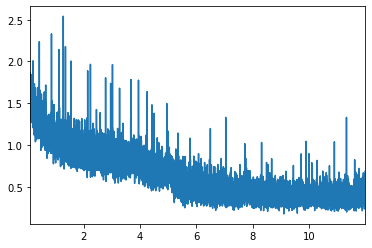

In [30]:
history['train_loss'].iloc[100:].plot();

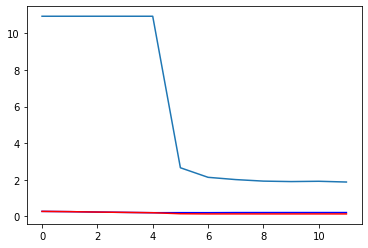

In [31]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss', color = 'blue');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss', color = 'red');
plt.show()

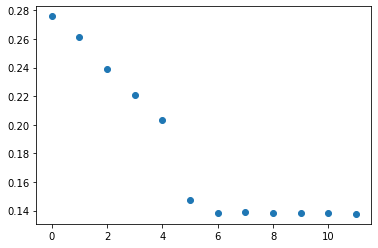

In [32]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [31]:
%%time
import gc

history = pd.DataFrame()

def criterion(prediction, mask, regr, weight=0.8, size_average=True):
    # Binary mask loss
    pred_mask = prediction[0]['hm']


    pred_mask = torch.sigmoid(pred_mask[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()

    # Regression L1 loss
    #pred_regr = prediction[:, 1:]
    pred_regr = prediction[0]['reg']
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)

    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    #if not size_average:
    #    loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss


# for epoch in range(n_epochs):
#     torch.cuda.empty_cache()
#     gc.collect()
#     train(epoch, history)
#     evaluate(epoch, history)



CPU times: user 760 µs, sys: 0 ns, total: 760 µs
Wall time: 767 µs


In [26]:
torch.save(model.state_dict(), './model-dla34'+'_'+'w08'+'.pth')

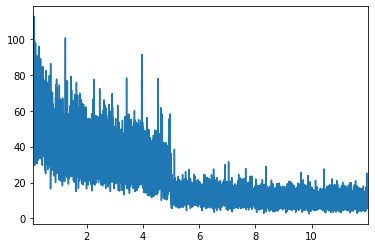

In [27]:
history['train_loss'].iloc[100:].plot();

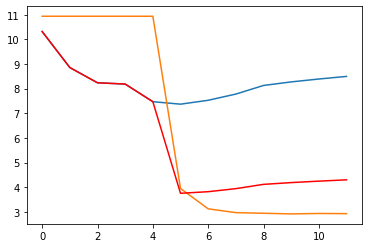

In [28]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss', color = 'red');
plt.show()

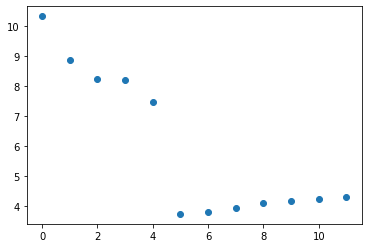

In [29]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [28]:
model.load_state_dict(torch.load( './model-dla34'+'_'+'w08'+'.pth'))
model.eval()

DLASeg(
  (base): DLA(
    (base_layer): Sequential(
      (0): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level0): Sequential(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level1): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level2): Tree(
      (tree1): BasicBlock(
        (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inpla

# Visualize predictions

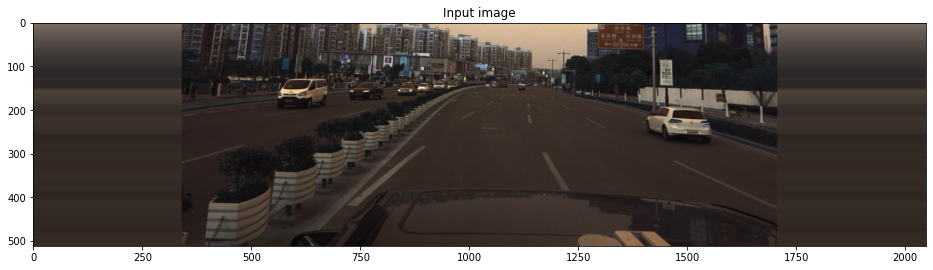

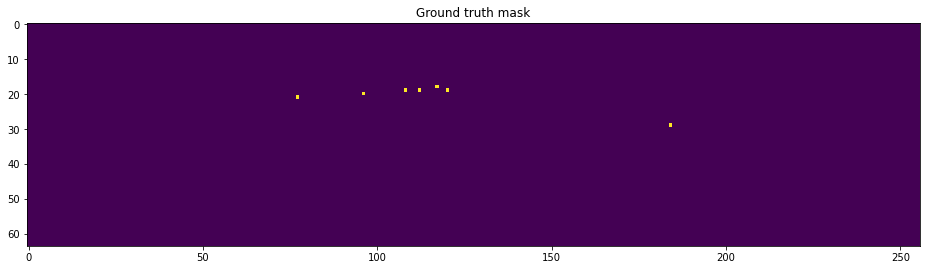

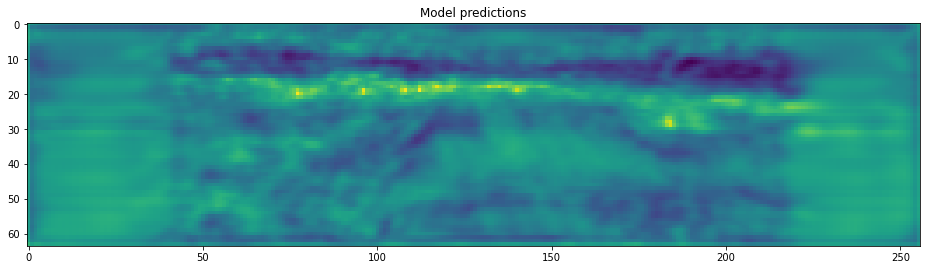

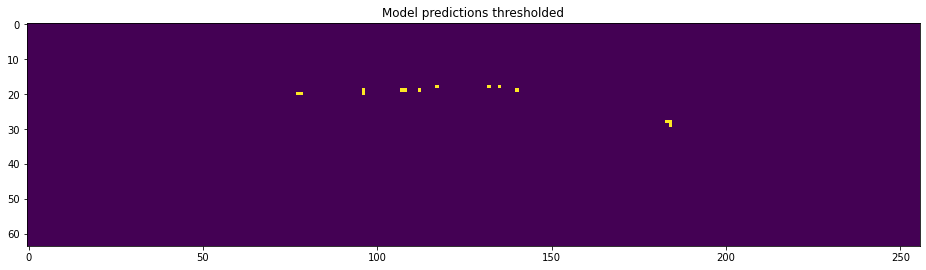

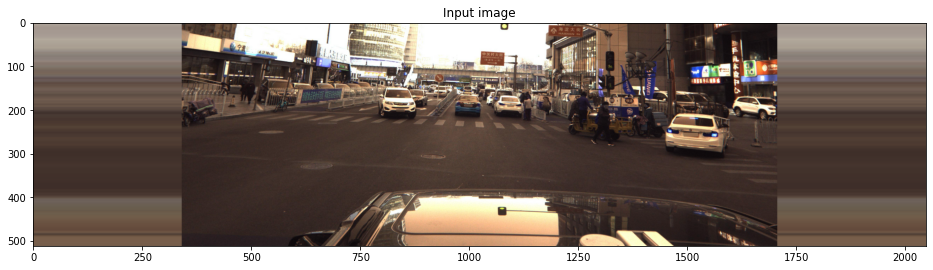

...

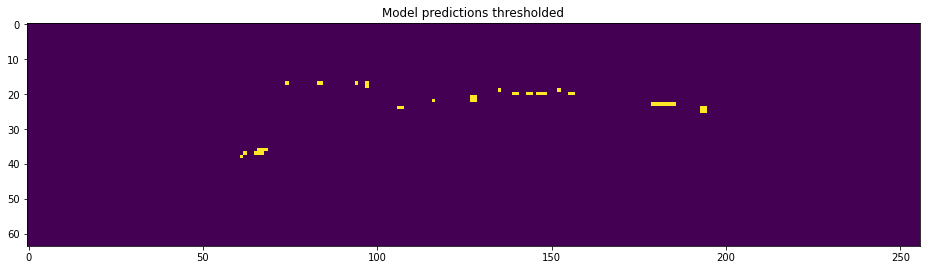

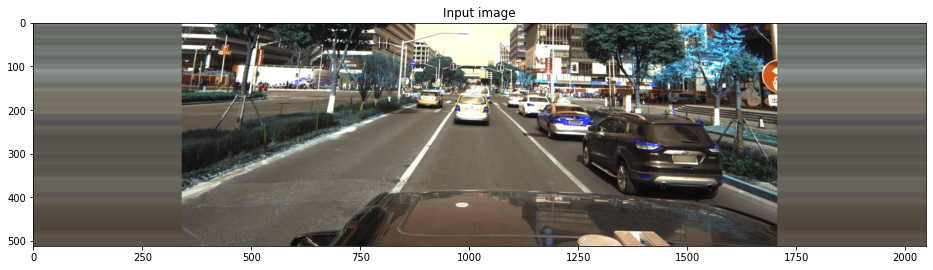

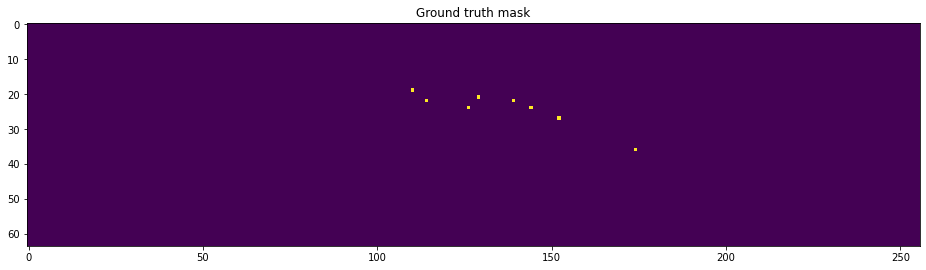

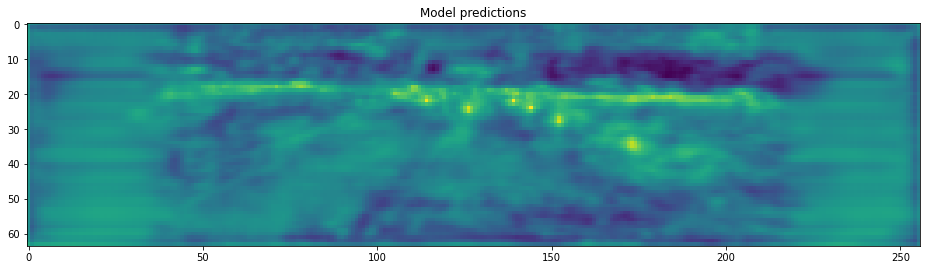

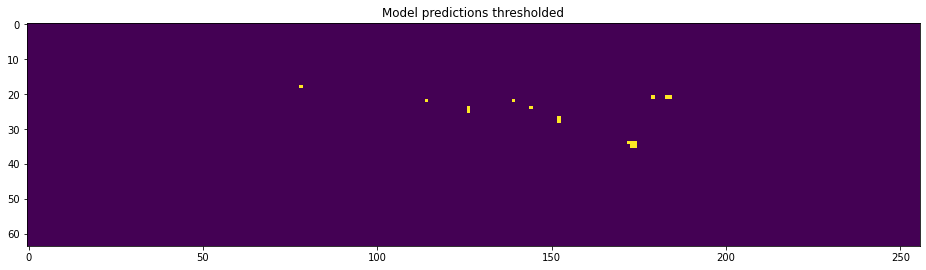

In [36]:
for i in range(10,20):
    img, mask, regr = dev_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()

    output = model(torch.tensor(img[None]).to(device))
    logits = output[0]['hm'].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits[0,0])
    plt.show()


    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits[0,0] > -1)
    plt.show()
    


In [37]:
# ## Simple test of probabilities
# act = torch.nn.Sigmoid()
# logtens = torch.from_numpy(logits)
# probs = act(logtens)
# probs = probs[probs>0.03]
# print(probs)

In [38]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

# Evaluation

In [39]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from inspect import signature
import matplotlib.pyplot as plt
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df



#def str2coords(s, names):
#    coords = []
#    for l in np.array(s.split()).reshape([-1, 7]):
#        coords.append(dict(zip(names, l.astype('float'))))
#    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

def print_pr_curve(result_flg, scores, recall_total=1):
    average_precision = average_precision_score(result_flg, scores)
    precision, recall, _ = precision_recall_curve(result_flg, scores)
    recall *= recall_total
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.show()

In [40]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


# validation prediction

In [41]:
threshold1 = -1
threshold2 = 0
threshold3 = 0.2

In [68]:
# map: 0.10844716601852893 # -2
# map: 0.11908345067814112 # -3
# map: 0.1279842909587167  # -4
# map: 0.13395854895945764 # -5 
# map: 0.1383288800848642  # -6
# map: 0.14158187970998287 # -7

In [42]:
def extract_coords(prediction, threshold1):
    
    img = prediction[0][0].cpu().numpy()
    logits = prediction[0][0].cpu().numpy()
    #logits = peak_tmp(prediction[0].cpu().numpy(), threshold1, threshold2, threshold3)
    
    regr_output = prediction[1].cpu().numpy()
    points = np.argwhere(logits > threshold1)

    # top 100 points
    (xlist, ylist) =  np.where(img>np.sort(img.reshape((1,-1)))[0][-100])
    top_list = [pair for pair in zip(list(xlist), list(ylist))]
    
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    
    for r, c in points:
        if (r,c) not in top_list:
            continue
            
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

In [43]:
def extract_coords_tmp(prediction, threshold1, threshold2, threshold3):
    
    img = prediction[0][0].cpu().numpy()
    #logits = prediction[0][0].cpu().numpy()
    logits = peak_tmp(prediction[0].cpu().numpy(), threshold1, threshold2, threshold3)
    
    regr_output = prediction[1].cpu().numpy()
    points = np.argwhere(logits > threshold1)

    # top 100 points
    (xlist, ylist) =  np.where(img>np.sort(img.reshape((1,-1)))[0][-100])
    top_list = [pair for pair in zip(list(xlist), list(ylist))]
    
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    
    for r, c in points:
        if (r,c) not in top_list:
            continue
            
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

In [44]:
def peak_tmp(array, threshold1, threshold2, threshold3):
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-100])
    
    
    
    peak_array = array[0]
    maximum = array.max()
    
    advantage = np.zeros(array[0].shape)
    penalty = np.zeros(array[0].shape)
    
    for k in range(len(xlist)):
        i = xlist[k]
        j = ylist[k]
        ct1 = 0 # 주변의 점들이 top 100 안에 있는가
        ct2 = 0 # 주변의 점들의 값이 더 작은가 
        
        if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
            surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if (xy[0], xy[1]) in list(zip(xlist, ylist)):                    
                    ct1 += 1
                if peak_array[i,j] > peak_array[xy[0], xy[1]]:
                    ct2 += 1
            if ct1 > 6 and ct2 > 7:
                advantage[i,j] += min((maximum - peak_array[i,j])*(1/2),2)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0
            ct_vert = 0
            ct_hori = 0
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            horizontal = [(i,j-1),(i,j),(i,j+1)]
            vertical = [(i-1,j),(i,j),(i+1,j)] 
            
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1
                    
            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_vert += 1

            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_hori += 1

            if ct_sur > 2:
                idx_small = np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]).argsort()[:2]
                idx_list = [[i,j],[i,j+1],[i+1,j],[i+1,j+1]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

            if ct_vert == 3:
                idx_small = np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]).argsort()[:2]
                idx_list = [[i-1,j],[i,j],[i+1,j]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

            if ct_hori == 3:
                idx_small = np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]).argsort()[:1]
                idx_list = [[i,j-1],[i,j],[i,j+1]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

    print("advantage:", np.sum(advantage)*threshold2)
    print("penalty:", np.sum(penalty)*threshold3)
    
    
    peak_array = peak_array + advantage*threshold2 + penalty*threshold2
    
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<5 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array #, advantage



    
#     plt.figure(figsize=(16,16))
#     plt.title('New')
#     plt.imshow(peak(logits[None],threshold1,threshold2)[0]>-2)
#     plt.show()|

In [45]:
threshold1

-1

100%|██████████| 11/11 [00:08<00:00,  1.23it/s]


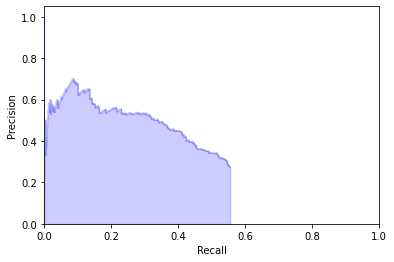

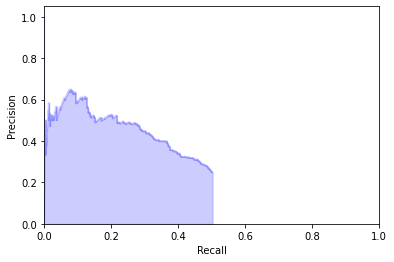

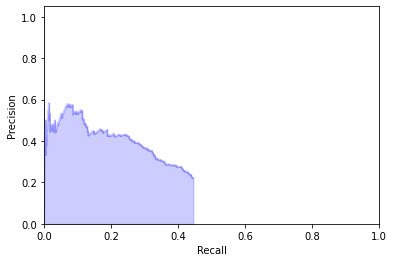

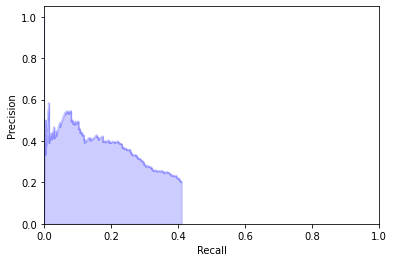

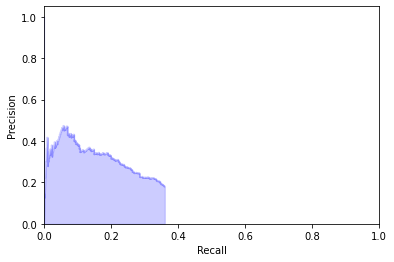

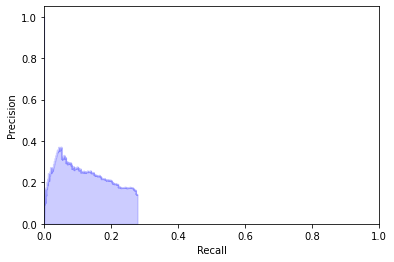

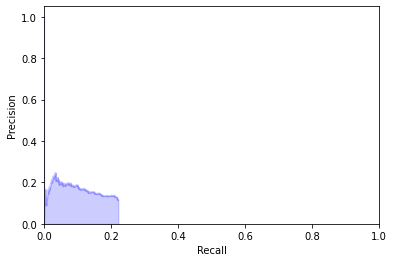

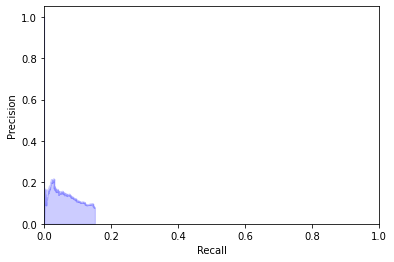

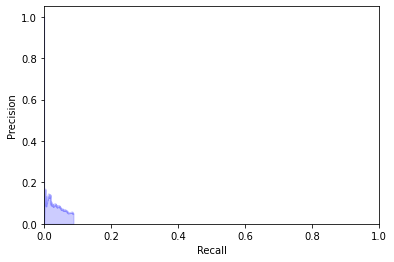

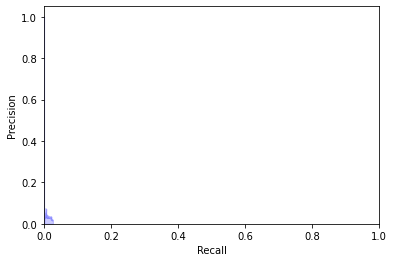

map: 0.10928243378500993


Process ForkPoolWorker-109:
Process ForkPoolWorker-110:
Process ForkPoolWorker-106:
Traceback (most recent call last):
Process ForkPoolWorker-103:
Process ForkPoolWorker-104:
Process ForkPoolWorker-102:
Process ForkPoolWorker-105:
Process ForkPoolWorker-107:
Process ForkPoolWorker-101:
Traceback (most recent call last):
Process ForkPoolWorker-108:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Tr

In [46]:
import copy

predictions = []
dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
for img, _, _ in tqdm(dev_loader):
    with torch.no_grad():
        output = model(img.to(device))
    
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]), threshold1)
        #coords = extract_coords_tmp((output[0]['hm'][i], output[0]['reg'][i]), threshold1, threshold2, threshold3)
        s = coords2str(coords)
        predictions.append(s)
        
df_dev['PredictionString'] = copy.copy(predictions)

valid_df = df_dev
expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
valid_df = valid_df.fillna('')

train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# data description page says, The pose information is formatted as
# model type, yaw, pitch, roll, x, y, z
# but it doesn't, and it should be
# model type, pitch, yaw, roll, x, y, z
expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

max_workers = 10
n_gt = len(expanded_train_df)
ap_list = []
p = Pool(processes=max_workers)
for result_flg, scores in p.imap(check_match, range(10)):
    if np.sum(result_flg) > 0:
        n_tp = np.sum(result_flg)
        recall = n_tp/n_gt
        ap = average_precision_score(result_flg, scores)*recall
        print_pr_curve(result_flg, scores, recall)
    else:
        ap = 0
    ap_list.append(ap)
map = np.mean(ap_list)
print('map:', map)

In [47]:
def peak_tmp(array, threshold1, threshold2, threshold3):
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-100])
    
    
    
    peak_array = array[0]
    maximum = array.max()
    
    advantage = np.zeros(array[0].shape)
    penalty = np.zeros(array[0].shape)
    
    for k in range(len(xlist)):
        i = xlist[k]
        j = ylist[k]
        ct1 = 0 # 주변의 점들이 top 100 안에 있는가
        ct2 = 0 # 주변의 점들의 값이 더 작은가 
        
        if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
            surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if (xy[0], xy[1]) in list(zip(xlist, ylist)):                    
                    ct1 += 1
                if peak_array[i,j] > peak_array[xy[0], xy[1]]:
                    ct2 += 1
            if ct1 > 6 and ct2 > 7:
                advantage[i,j] += min((maximum - peak_array[i,j])*(1/2),2)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0
            ct_vert = 0
            ct_hori = 0
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            horizontal = [(i,j-1),(i,j),(i,j+1)]
            vertical = [(i-1,j),(i,j),(i+1,j)] 
            
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1
                    
            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_vert += 1

            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_hori += 1

            if ct_sur > 2:
                idx_small = np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]).argsort()[:2]
                idx_list = [[i,j],[i,j+1],[i+1,j],[i+1,j+1]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

            if ct_vert == 3:
                idx_small = np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]).argsort()[:2]
                idx_list = [[i-1,j],[i,j],[i+1,j]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

            if ct_hori == 3:
                idx_small = np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]).argsort()[:1]
                idx_list = [[i,j-1],[i,j],[i,j+1]]
                for i in idx_small:
                    penalty[idx_list[i][0], idx_list[i][1]] -= 1

    print("advantage:", np.sum(advantage)*threshold2)
    print("penalty:", np.sum(penalty)*threshold3)
    
    
    peak_array = peak_array + advantage*threshold2 + penalty*threshold3
    
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<5 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array #, advantage



    
#     plt.figure(figsize=(16,16))
#     plt.title('New')
#     plt.imshow(peak(logits[None],threshold1,threshold2)[0]>-2)
#     plt.show()

In [48]:
print(threshold1)
print(threshold2)
print(threshold3)

-1
0
0.2


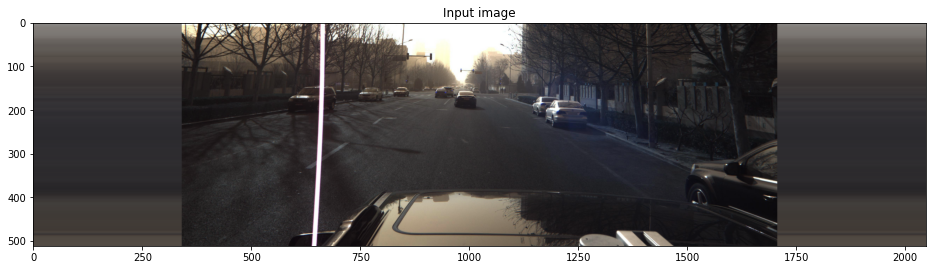

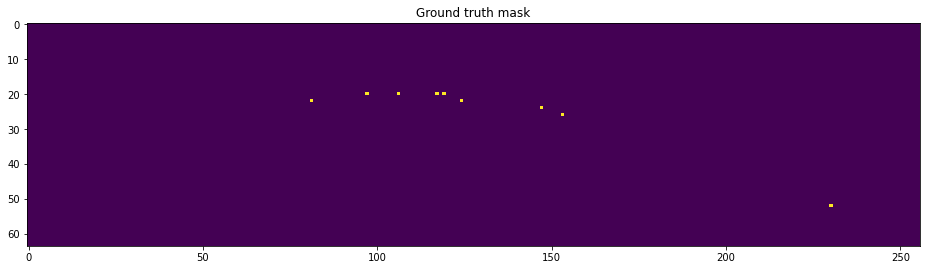

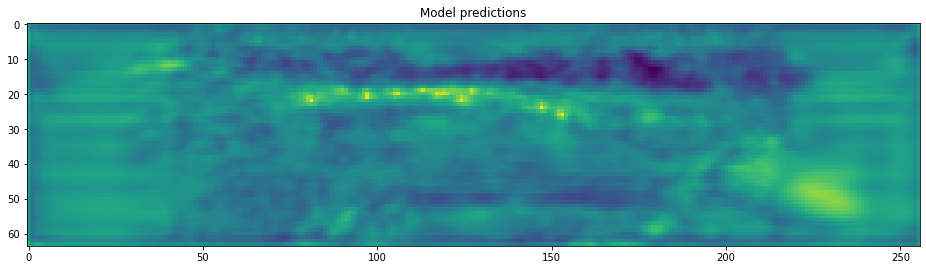

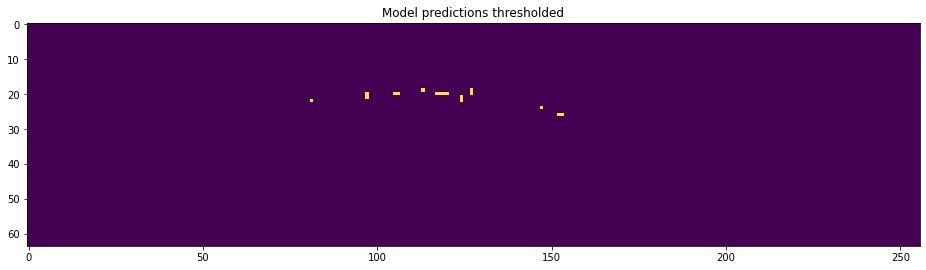

advantage: 0.0
penalty: 0.0


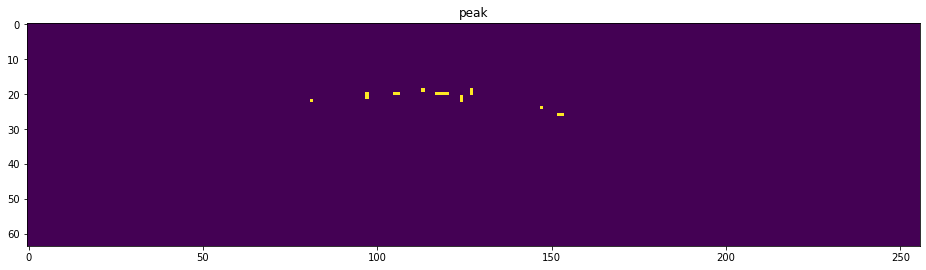

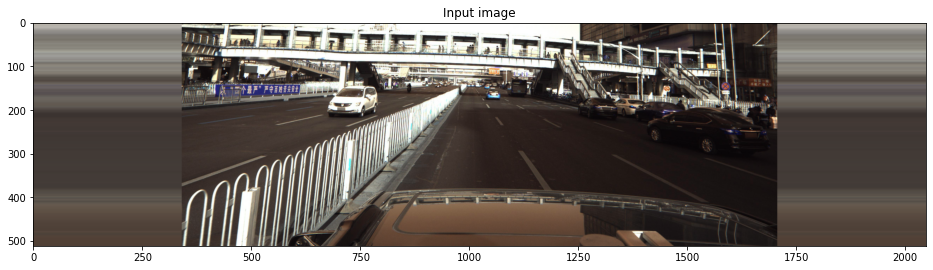

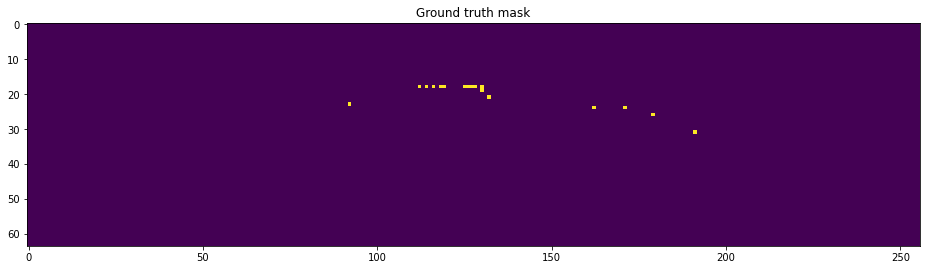

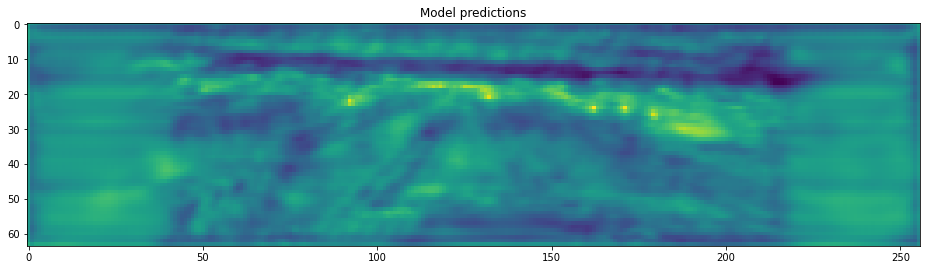

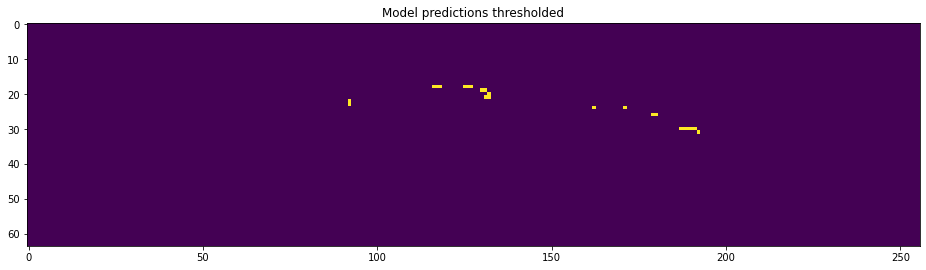

advantage: 0.0
penalty: -0.4


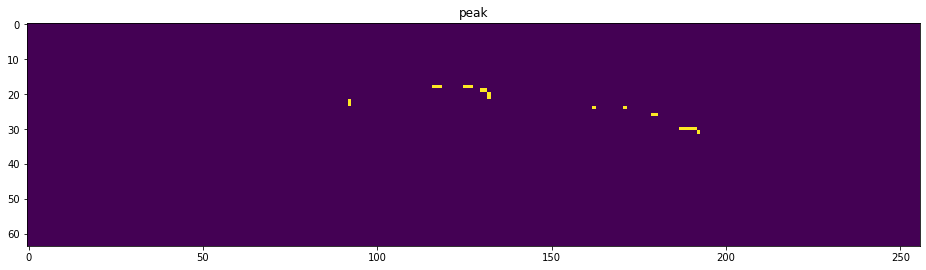

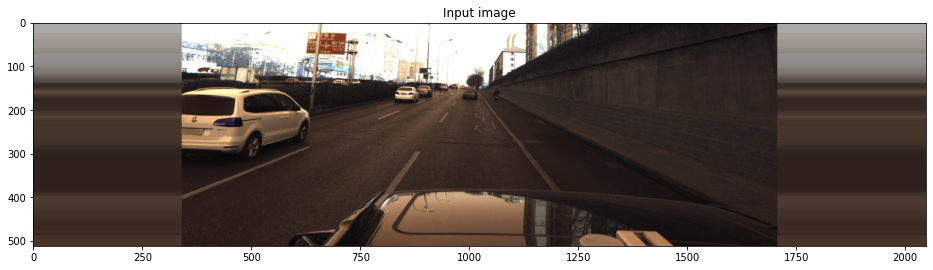

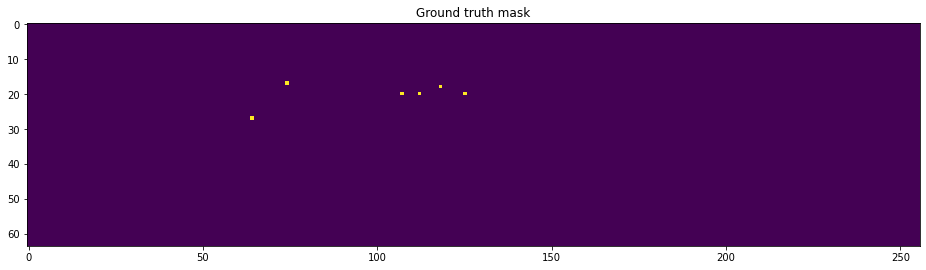

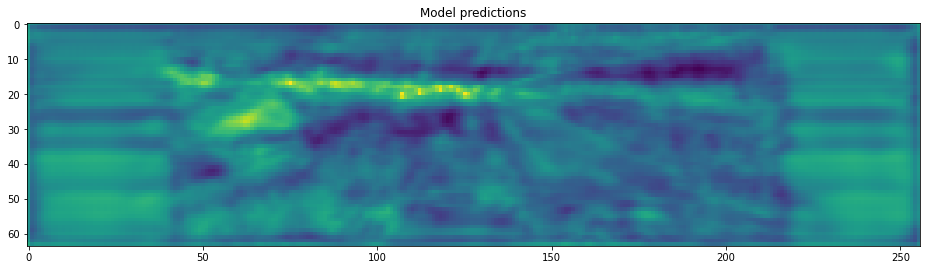

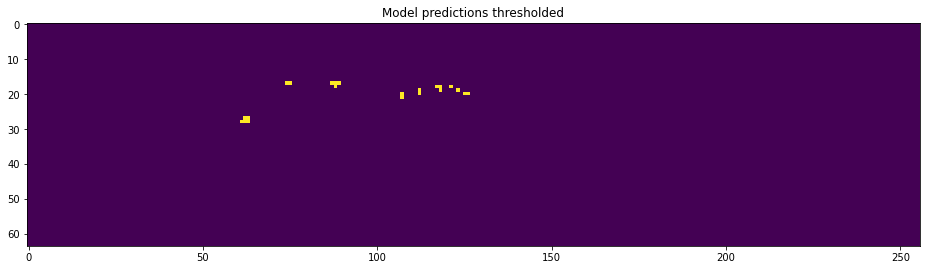

advantage: 0.0
penalty: -1.2000000000000002


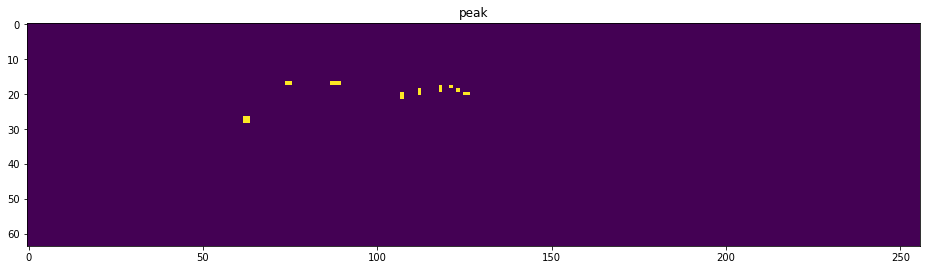

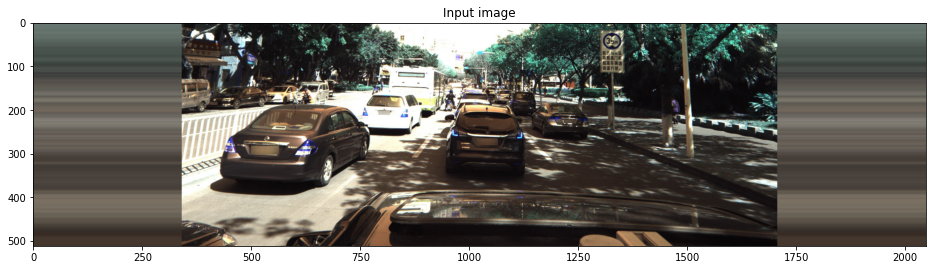

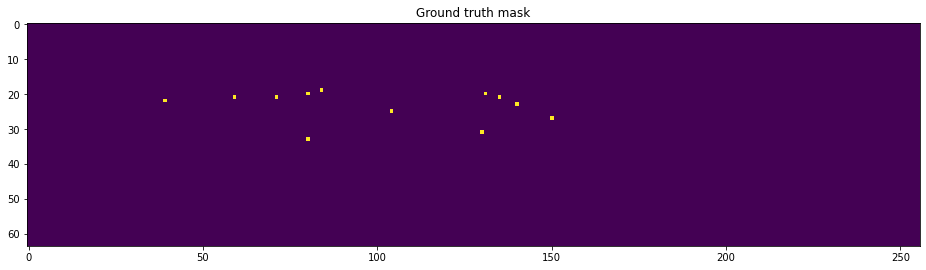

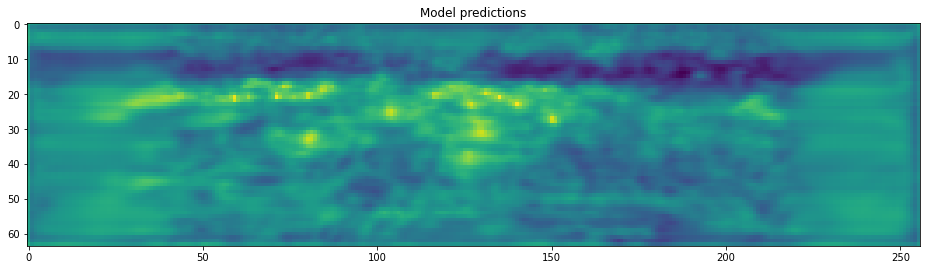

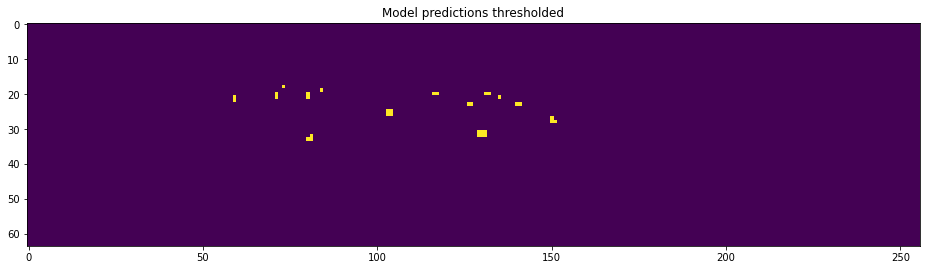

advantage: 0.0
penalty: -1.6


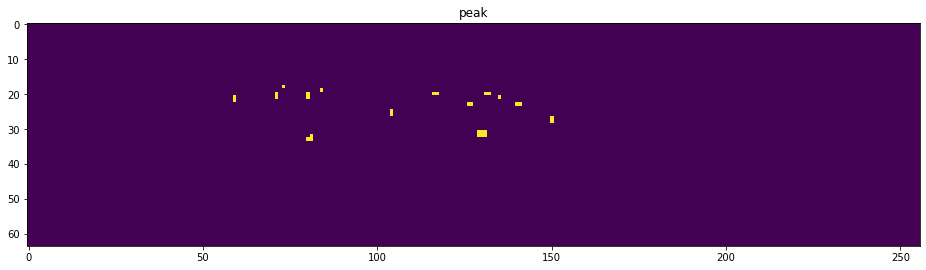

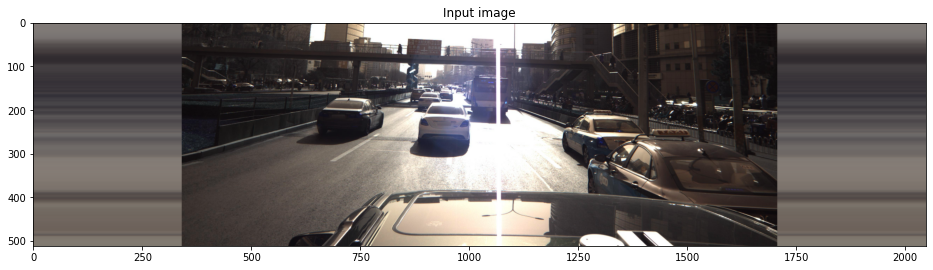

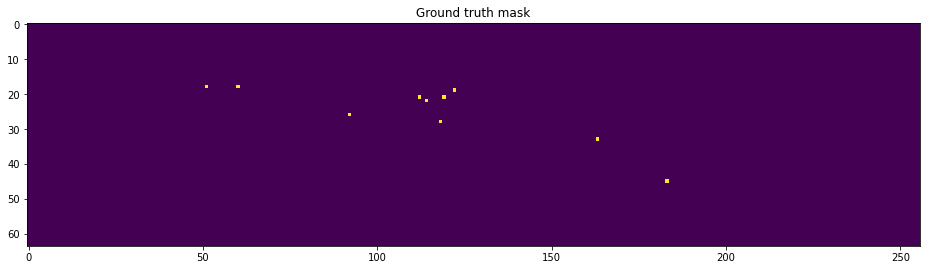

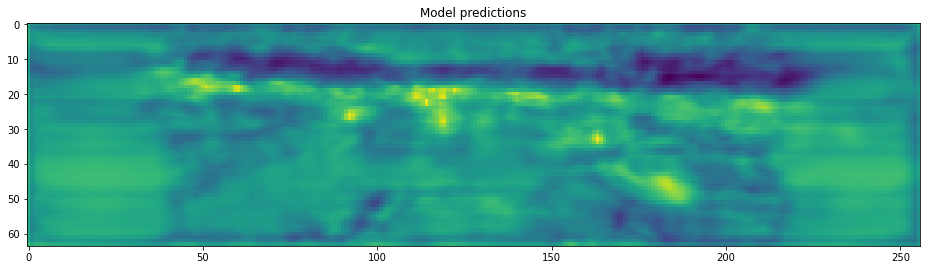

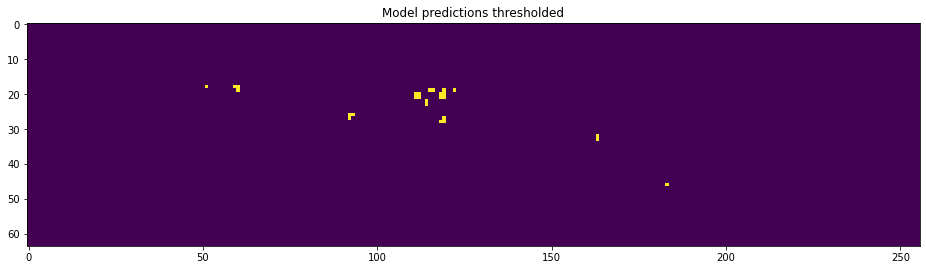

advantage: 0.0
penalty: -2.0


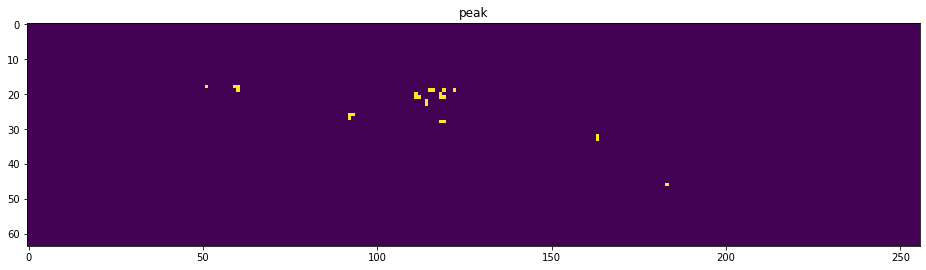

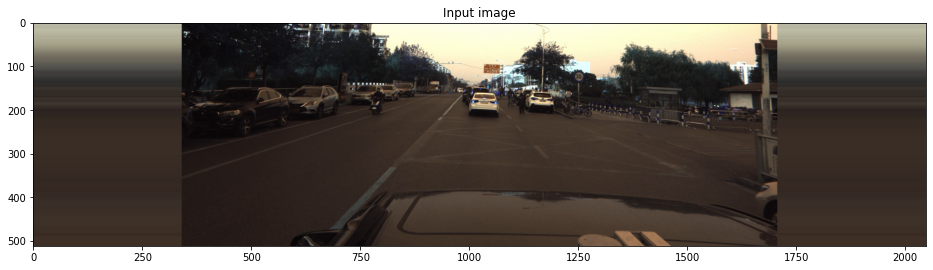

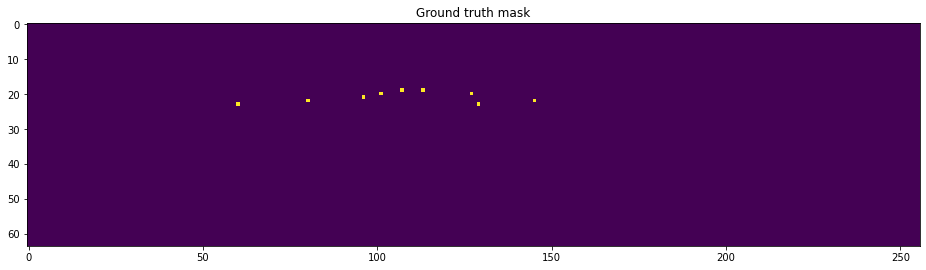

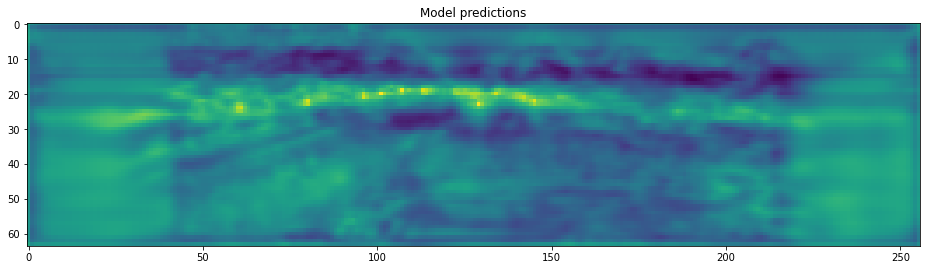

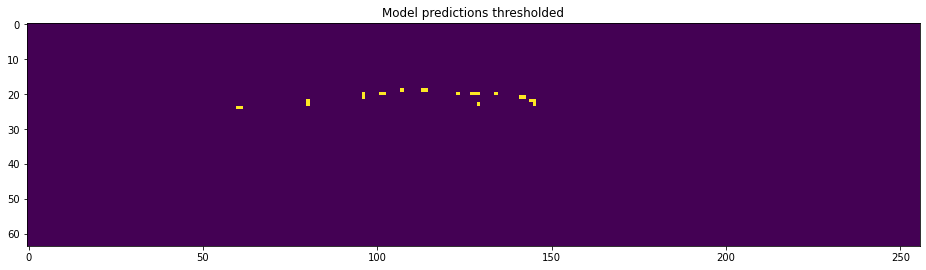

advantage: 0.0
penalty: -0.4


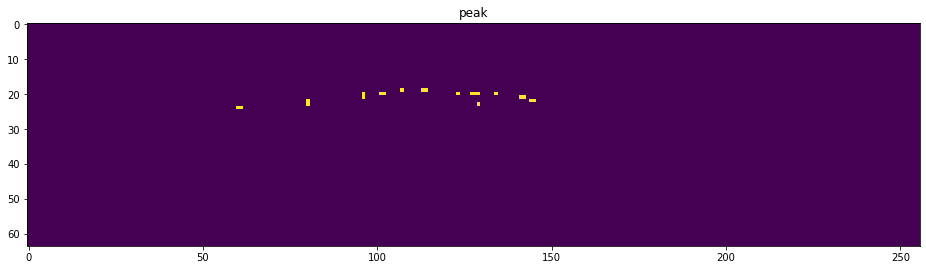

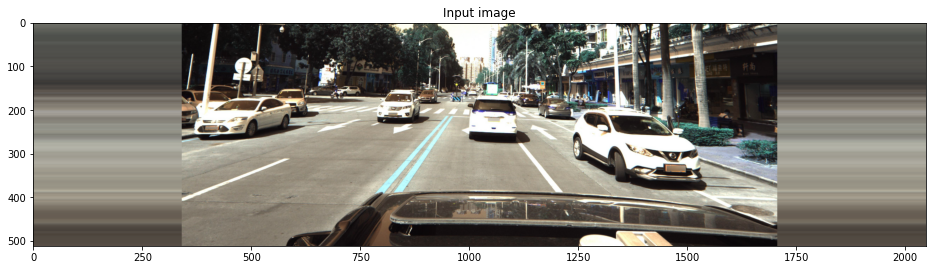

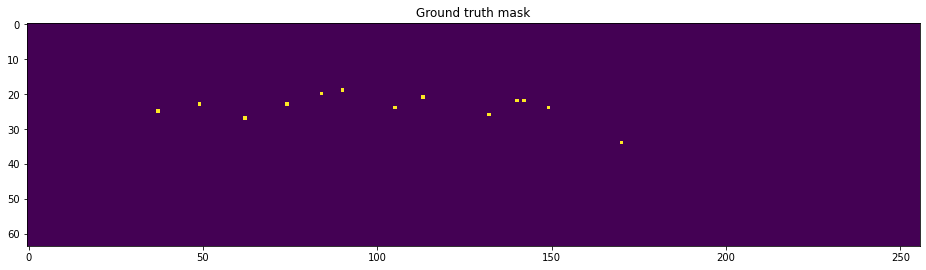

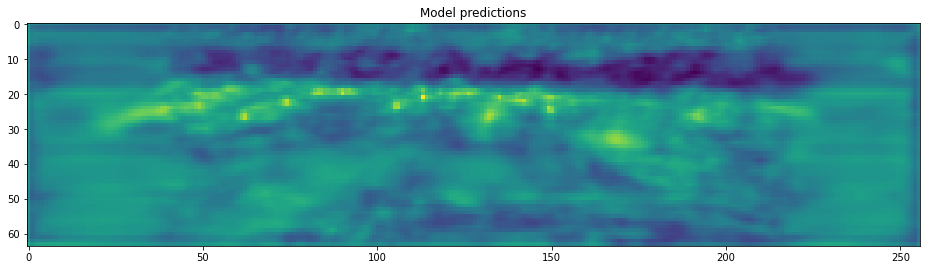

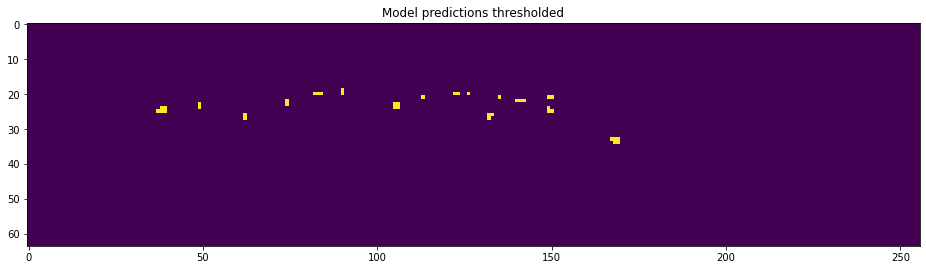

advantage: 0.0
penalty: -1.6


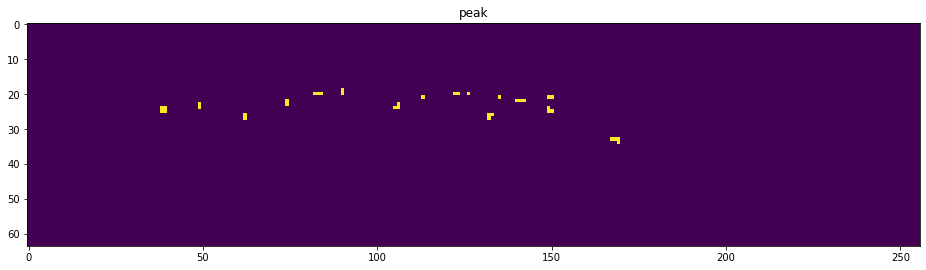

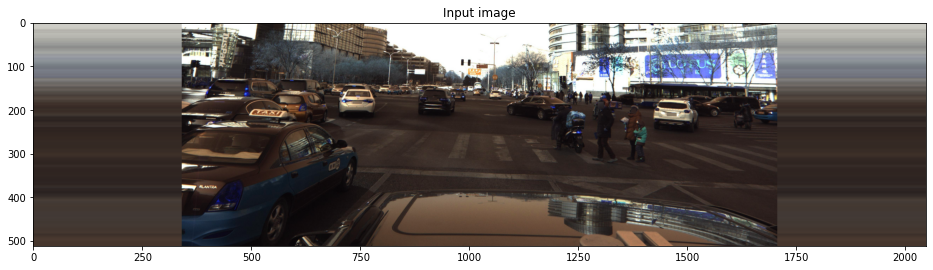

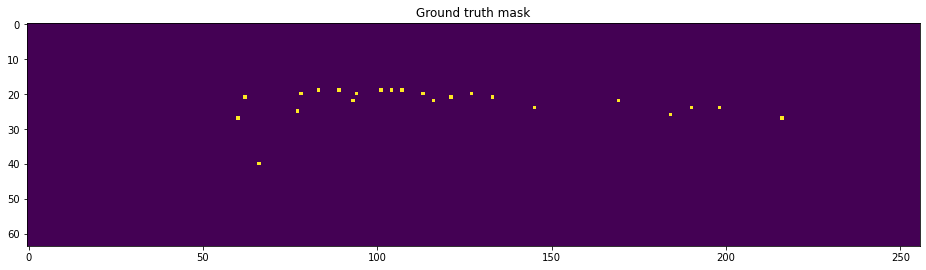

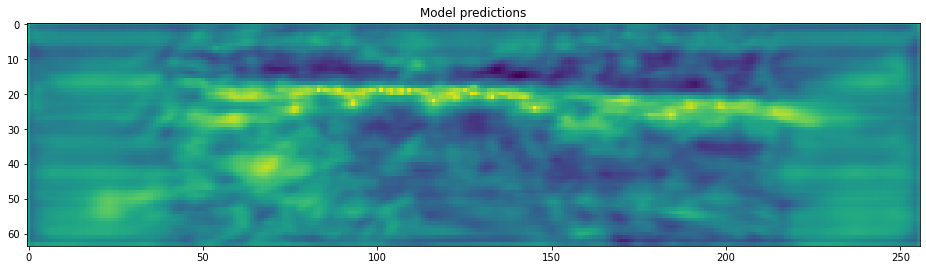

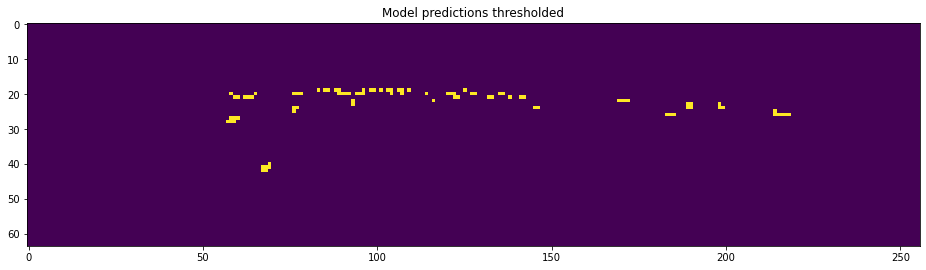

advantage: 0.0
penalty: -3.2


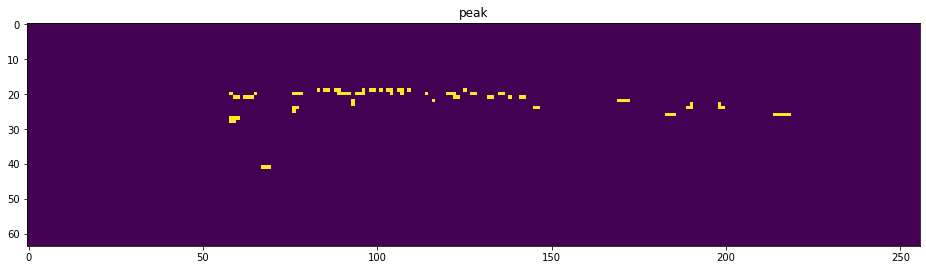

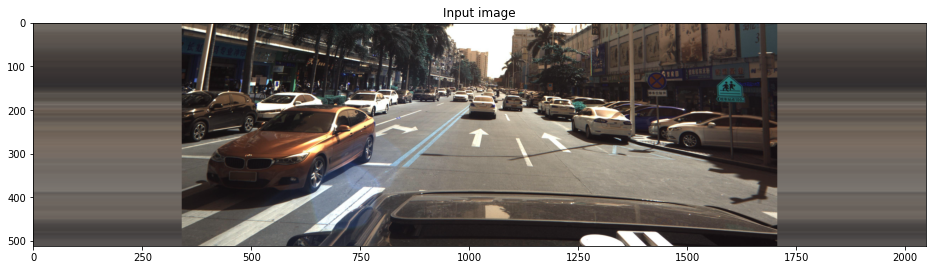

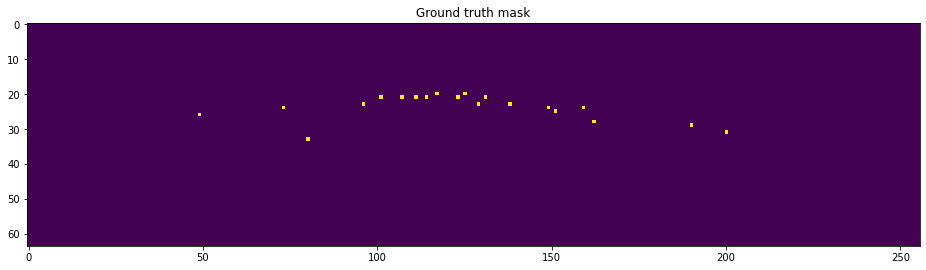

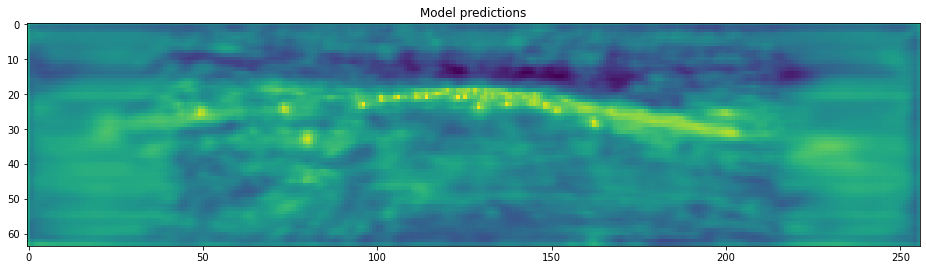

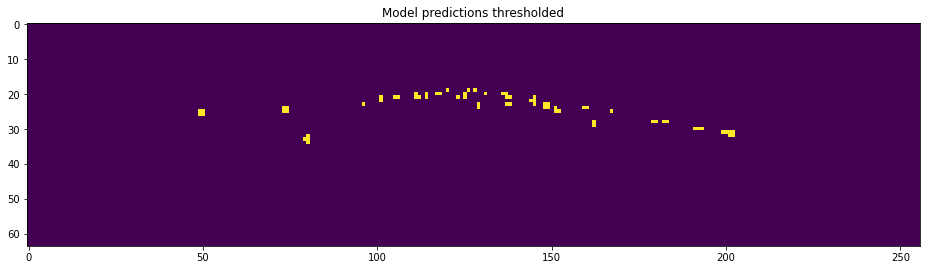

advantage: 0.0
penalty: -3.6


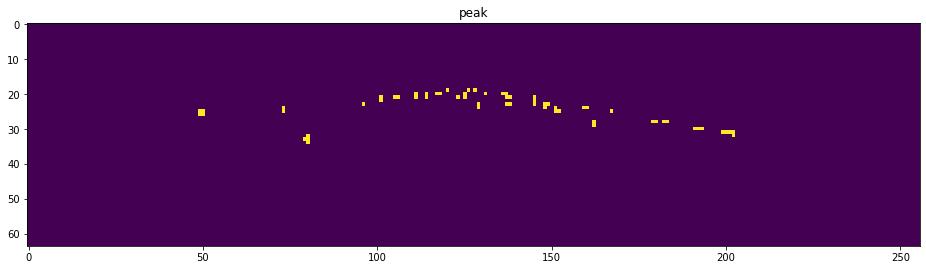

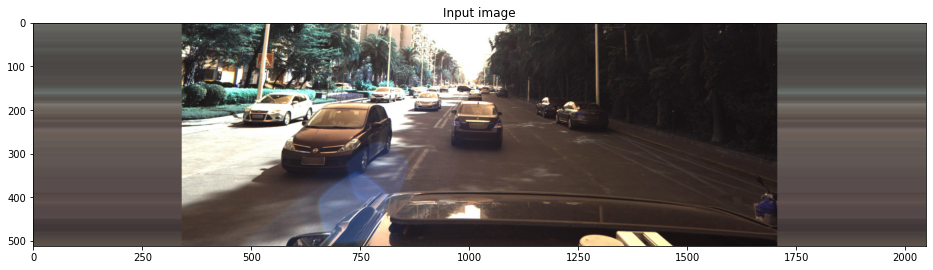

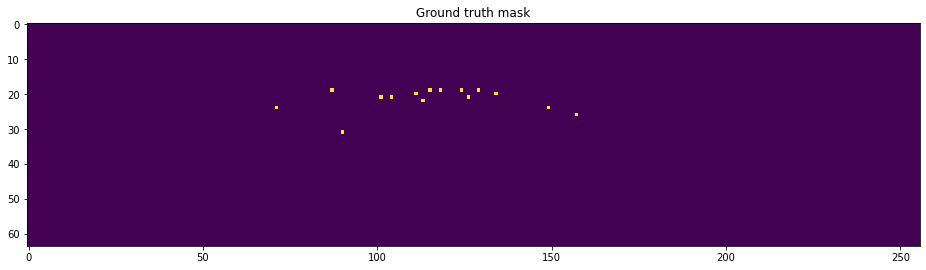

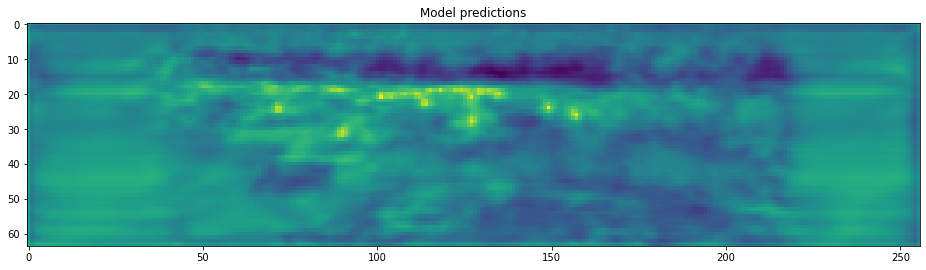

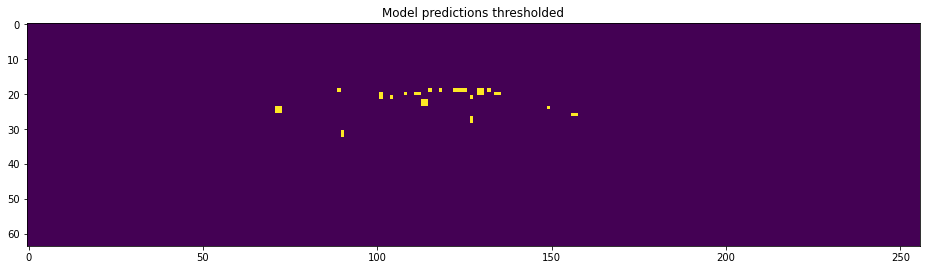

advantage: 0.0
penalty: -1.2000000000000002


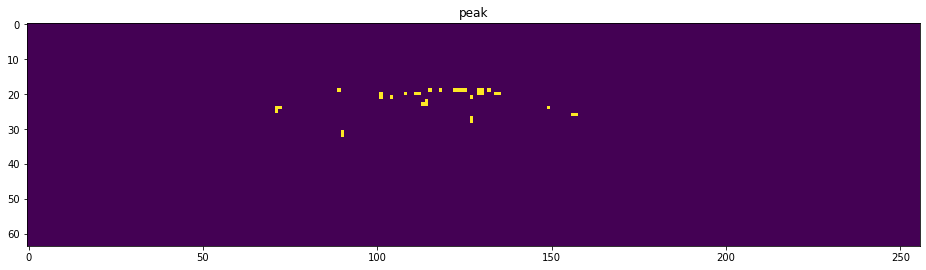

In [50]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]
    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    
    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-1)
    plt.show()
    
    img = peak_tmp(output[0].detach().cpu().numpy(),threshold1,threshold2,threshold3)
    plt.figure(figsize=(16,16))
    plt.title('peak')
    plt.imshow(img>-1)
    plt.show()
    
#     img = peak(output[0].detach(),threshold1)
#     plt.figure(figsize=(16,16))
#     plt.title('peak')
#     plt.imshow(img>-2)
#     plt.show()


# Make submission

In [51]:
def show_coords(prediction, threshold1, threshold2, threshold3):
    #logits = peak(prediction[0], threshold1) 
    #logits = prediction[0][0].cpu().numpy()
    logits = peak_tmp(output[0].detach().cpu().numpy(),threshold1,threshold2, threshold3)
    plt.figure(figsize=(12, 8))
    plt.imshow(logits)
    plt.show()

    regr_output = prediction[1:]
    plt.figure(figsize=(12, 8))
    plt.imshow(logits > threshold1)
    plt.show()

# Show prediction results

  0%|          | 0/506 [00:00<?, ?it/s]

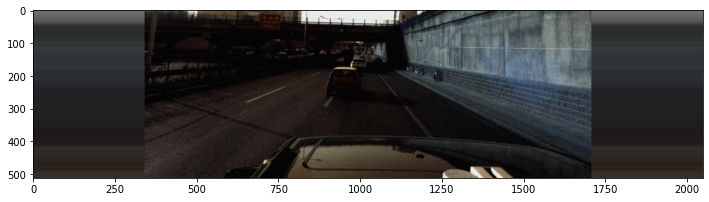

advantage: 0.0
penalty: -0.8


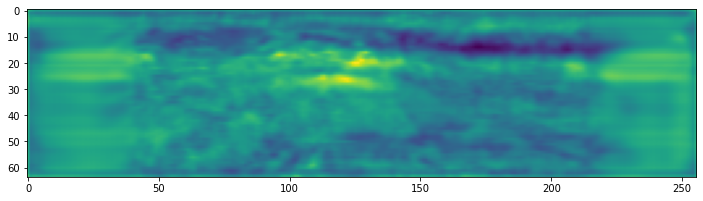

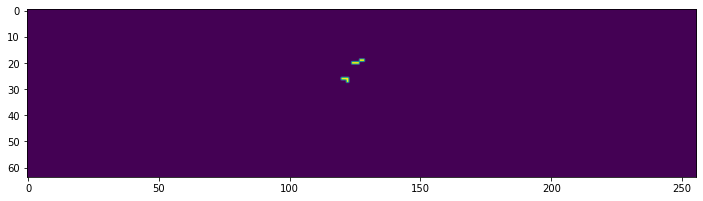

  0%|          | 1/506 [00:03<25:56,  3.08s/it]

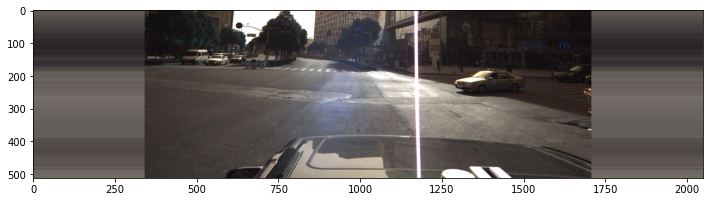

advantage: 0.0
penalty: -0.4


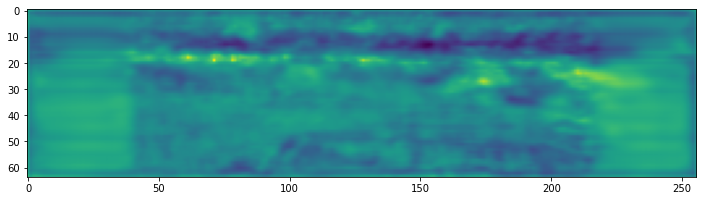

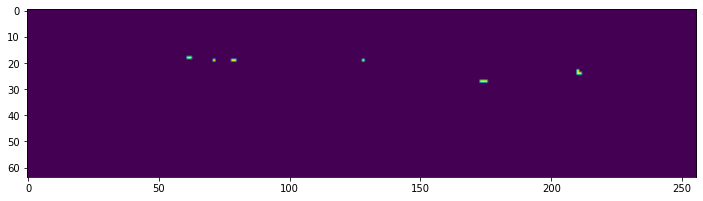

  0%|          | 2/506 [00:04<21:35,  2.57s/it]

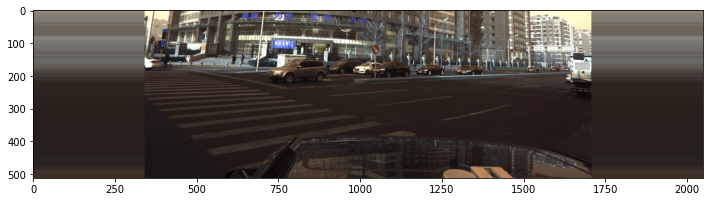

advantage: 0.0
penalty: -0.8


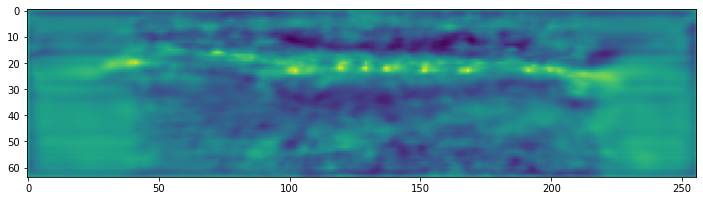

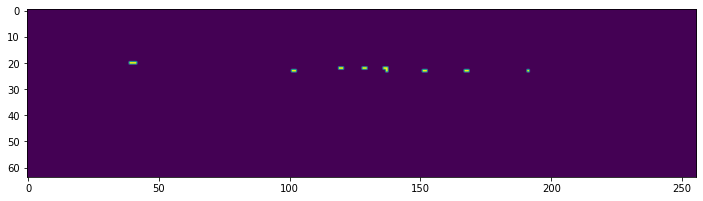

  1%|          | 3/506 [00:05<18:45,  2.24s/it]

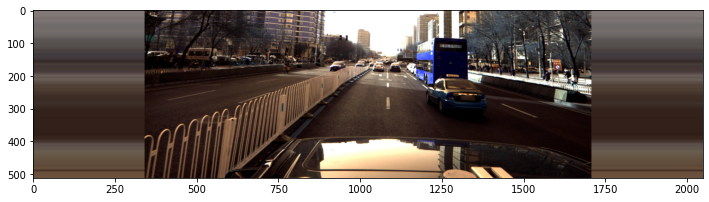

advantage: 0.0
penalty: -2.8000000000000003


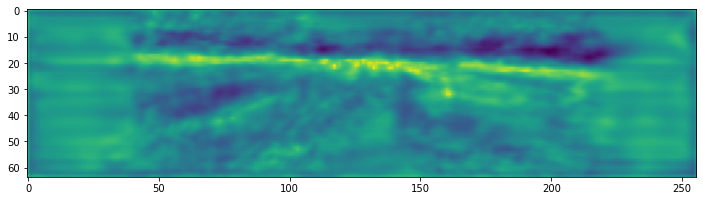

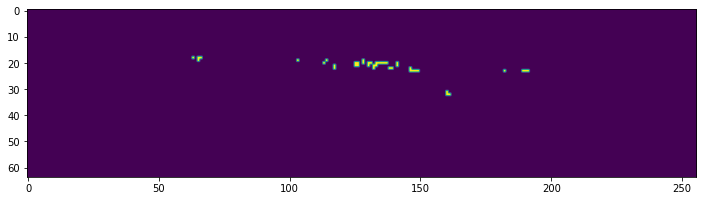

  1%|          | 4/506 [00:07<16:35,  1.98s/it]

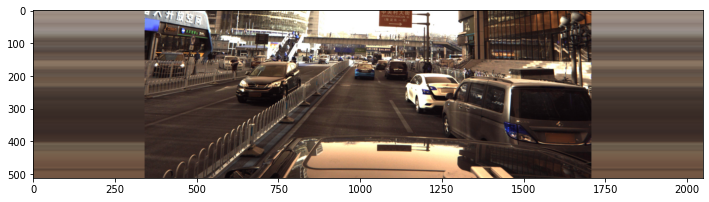

advantage: 0.0
penalty: -1.4000000000000001


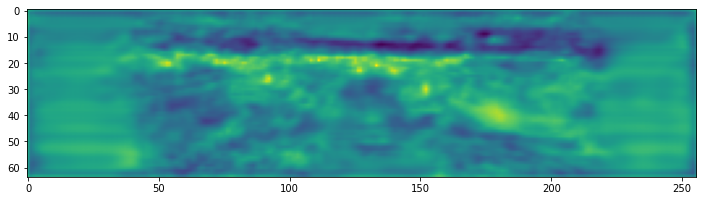

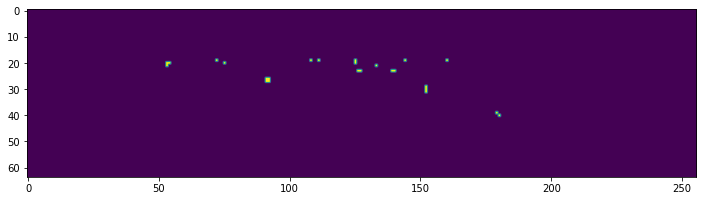

  1%|          | 5/506 [00:08<15:06,  1.81s/it]

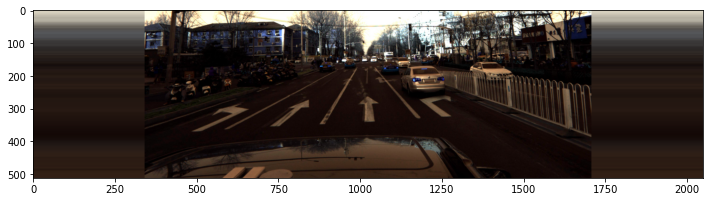

advantage: 0.0
penalty: -1.8


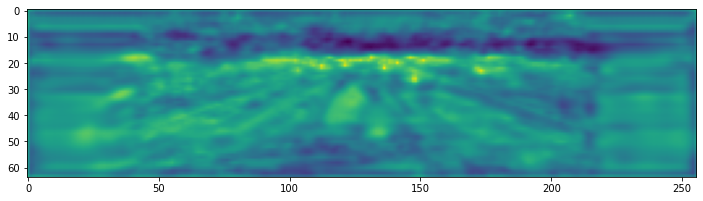

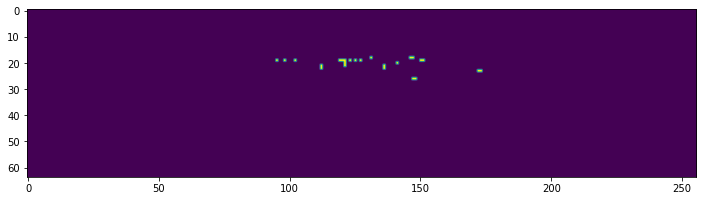

  1%|          | 6/506 [00:10<14:10,  1.70s/it]

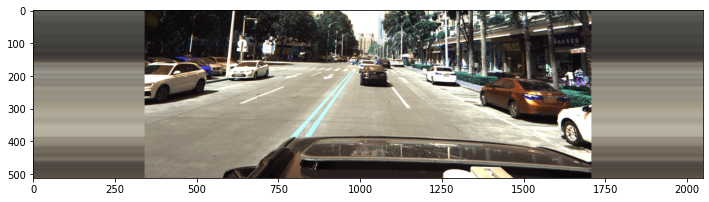

advantage: 0.0
penalty: -0.8


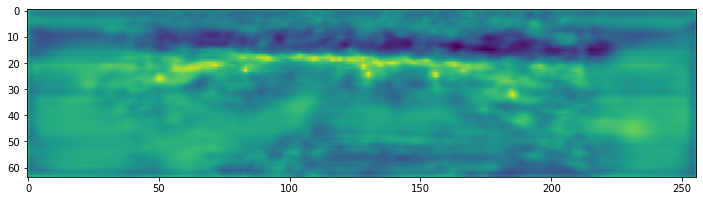

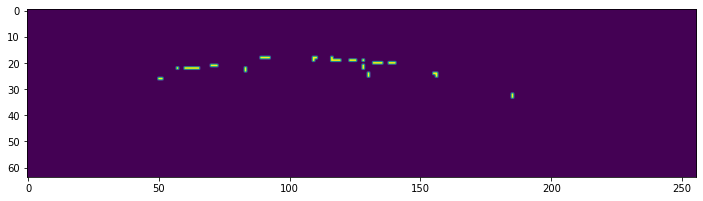

  1%|▏         | 7/506 [00:11<13:37,  1.64s/it]

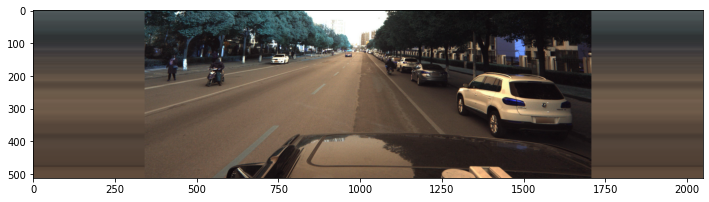

Process Process-111:
Process Process-113:
Process Process-112:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
 

Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3319, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-52-d0b29c9907b1>", line 16, in <module>
    show_coords(output,threshold1, threshold2, threshold3)
  File "<ipython-input-51-e9fa4692fa01>", line 4, in show_coords
    logits = peak_tmp(output[0].detach().cpu().numpy(),threshold1,threshold2, threshold3)
  File "<ipython-input-47-bd4cf2511b78>", line 39, in peak_tmp
    if array[0][xy[0],xy[1]]>threshold1:
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2034, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of th

KeyboardInterrupt: 

Process ForkPoolWorker-116:
Process ForkPoolWorker-117:
Process ForkPoolWorker-115:
Process ForkPoolWorker-118:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multipro

In [52]:
threshold1 = -1
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()

for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output,threshold1, threshold2, threshold3)
        

# Submission

In [ ]:
predictions = []
test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
plot = False
for img, _, _ in tqdm(test_loader):
    idx = 0
    with torch.no_grad():
        output = model(img.to(device))
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords_tmp((output[0]['hm'][i], output[0]['reg'][i]),threshold1, threshold2, threshold3)
        s = coords2str(coords)
        predictions.append(s)
        
        if plot == True:
            plt.figure(figsize=(15, 8))
            plt.imshow(np.einsum('ijk->jki', img[idx]))
            plt.show()

        idx += 1
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('prediction-dla34-G_2-F'+'_'+'w08'+'_'+str(threshold1)+'_'+str(threshold2)+'_' \
            +str(threshold3)+ '.csv', index=False)
test.head()


  0%|          | 0/506 [00:00<?, ?it/s]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -3.6



  0%|          | 1/506 [00:04<34:01,  4.04s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



  0%|          | 2/506 [00:06<29:54,  3.56s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



  1%|          | 3/506 [00:09<27:31,  3.28s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



  1%|          | 4/506 [00:11<25:32,  3.05s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -0.4



  1%|          | 5/506 [00:14<25:16,  3.03s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.4000000000000004



  1%|          | 6/506 [00:17<25:10,  3.02s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



  1%|▏         | 7/506 [00:20<25:03,  3.01s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004



  2%|▏         | 8/506 [00:23<25:09,  3.03s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4



  2%|▏         | 9/506 [00:26<23:51,  2.88s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



  2%|▏         | 10/506 [00:28<22:56,  2.78s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.6



  2%|▏         | 11/506 [00:31<22:37,  2.74s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



  2%|▏         | 12/506 [00:34<23:09,  2.81s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004



  3%|▎         | 13/506 [00:37<22:58,  2.80s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



  3%|▎         | 14/506 [00:39<22:05,  2.69s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0



  3%|▎         | 15/506 [00:42<22:04,  2.70s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



  3%|▎         | 16/506 [00:44<21:26,  2.62s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



  3%|▎         | 17/506 [00:47<21:33,  2.65s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



  4%|▎         | 18/506 [00:49<20:55,  2.57s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0



  4%|▍         | 19/506 [00:52<20:43,  2.55s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



  4%|▍         | 20/506 [00:55<21:17,  2.63s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



  4%|▍         | 21/506 [00:57<21:04,  2.61s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



  4%|▍         | 22/506 [01:00<21:00,  2.61s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



  5%|▍         | 23/506 [01:02<20:51,  2.59s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



  5%|▍         | 24/506 [01:05<20:21,  2.54s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0



  5%|▍         | 25/506 [01:08<20:47,  2.59s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



  5%|▌         | 26/506 [01:10<21:04,  2.64s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



  5%|▌         | 27/506 [01:13<21:09,  2.65s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.4000000000000001



  6%|▌         | 28/506 [01:15<20:24,  2.56s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004



  6%|▌         | 29/506 [01:18<20:42,  2.60s/it]

advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



  6%|▌         | 30/506 [01:21<21:05,  2.66s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.2000000000000002



  6%|▌         | 31/506 [01:23<20:44,  2.62s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004



  6%|▋         | 32/506 [01:26<20:52,  2.64s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



  7%|▋         | 33/506 [01:29<21:19,  2.70s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6



  7%|▋         | 34/506 [01:31<21:06,  2.68s/it]

advantage: 0.0
penalty: 0.0
brighter: 13
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.2000000000000002



  7%|▋         | 35/506 [01:34<21:26,  2.73s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



  7%|▋         | 36/506 [01:37<20:59,  2.68s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



  7%|▋         | 37/506 [01:40<21:04,  2.70s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



  8%|▊         | 38/506 [01:42<21:02,  2.70s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



  8%|▊         | 39/506 [01:45<20:33,  2.64s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002



  8%|▊         | 40/506 [01:47<20:07,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.8000000000000003



  8%|▊         | 41/506 [01:50<20:42,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



  8%|▊         | 42/506 [01:53<20:16,  2.62s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
brighter: 7
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



  8%|▊         | 43/506 [01:55<20:22,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



  9%|▊         | 44/506 [01:58<20:32,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



  9%|▉         | 45/506 [02:01<20:16,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



  9%|▉         | 46/506 [02:03<20:34,  2.68s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



  9%|▉         | 47/506 [02:06<20:15,  2.65s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8



  9%|▉         | 48/506 [02:09<20:14,  2.65s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0
brighter: 6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 10%|▉         | 49/506 [02:11<20:22,  2.68s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 10%|▉         | 50/506 [02:14<20:52,  2.75s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
brighter: 11
advantage: 0.0
penalty: -0.4



 10%|█         | 51/506 [02:17<19:58,  2.63s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



 10%|█         | 52/506 [02:19<19:54,  2.63s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004



 10%|█         | 53/506 [02:22<19:33,  2.59s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 11%|█         | 54/506 [02:25<19:45,  2.62s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.0



 11%|█         | 55/506 [02:27<19:37,  2.61s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 11%|█         | 56/506 [02:30<19:17,  2.57s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.0
advantage: 0.0
penalty: -2.0



 11%|█▏        | 57/506 [02:32<19:08,  2.56s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.2000000000000002



 11%|█▏        | 58/506 [02:35<19:16,  2.58s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -0.4



 12%|█▏        | 59/506 [02:37<18:40,  2.51s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.6



 12%|█▏        | 60/506 [02:40<19:19,  2.60s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 12%|█▏        | 61/506 [02:43<19:51,  2.68s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



 12%|█▏        | 62/506 [02:45<19:32,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8



 12%|█▏        | 63/506 [02:48<19:09,  2.60s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



 13%|█▎        | 64/506 [02:50<18:50,  2.56s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 13%|█▎        | 65/506 [02:53<18:54,  2.57s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002



 13%|█▎        | 66/506 [02:56<19:58,  2.72s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 13%|█▎        | 67/506 [02:59<19:55,  2.72s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.2



 13%|█▎        | 68/506 [03:02<20:10,  2.76s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004



 14%|█▎        | 69/506 [03:04<20:34,  2.83s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.4000000000000001



 14%|█▍        | 70/506 [03:07<20:20,  2.80s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
brighter: 11



 14%|█▍        | 71/506 [03:10<20:31,  2.83s/it]

advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -2.0



 14%|█▍        | 72/506 [03:13<20:29,  2.83s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.8



 14%|█▍        | 73/506 [03:16<20:12,  2.80s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 15%|█▍        | 74/506 [03:18<19:55,  2.77s/it]

advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



 15%|█▍        | 75/506 [03:21<19:43,  2.75s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4



 15%|█▌        | 76/506 [03:24<19:20,  2.70s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 15%|█▌        | 77/506 [03:26<18:50,  2.64s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8



 15%|█▌        | 78/506 [03:29<18:18,  2.57s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 16%|█▌        | 79/506 [03:31<17:55,  2.52s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -2.4000000000000004



 16%|█▌        | 80/506 [03:34<18:43,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4



 16%|█▌        | 81/506 [03:37<18:39,  2.63s/it]

advantage: 0.0
penalty: 0.0
brighter: 23
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 16%|█▌        | 82/506 [03:39<19:08,  2.71s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0



 16%|█▋        | 83/506 [03:42<18:42,  2.65s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 17%|█▋        | 84/506 [03:45<18:30,  2.63s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 17%|█▋        | 85/506 [03:47<18:09,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.0



 17%|█▋        | 86/506 [03:50<18:50,  2.69s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 17%|█▋        | 87/506 [03:52<18:33,  2.66s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.4000000000000001



 17%|█▋        | 88/506 [03:55<18:43,  2.69s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8



 18%|█▊        | 89/506 [03:58<18:16,  2.63s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 18%|█▊        | 90/506 [04:00<18:04,  2.61s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8



 18%|█▊        | 91/506 [04:03<17:59,  2.60s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -3.4000000000000004
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0



 18%|█▊        | 92/506 [04:06<18:36,  2.70s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 18%|█▊        | 93/506 [04:08<18:25,  2.68s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -4.4
advantage: 0.0
penalty: -1.4000000000000001



 19%|█▊        | 94/506 [04:12<19:27,  2.83s/it]

advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4



 19%|█▉        | 95/506 [04:14<18:29,  2.70s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004



 19%|█▉        | 96/506 [04:17<18:58,  2.78s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.8000000000000003



 19%|█▉        | 97/506 [04:20<19:16,  2.83s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6



 19%|█▉        | 98/506 [04:23<18:44,  2.76s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 20%|█▉        | 99/506 [04:25<18:32,  2.73s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 20%|█▉        | 100/506 [04:27<17:31,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.6



 20%|█▉        | 101/506 [04:30<17:34,  2.60s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.8000000000000003



 20%|██        | 102/506 [04:33<18:36,  2.76s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 20%|██        | 103/506 [04:36<18:04,  2.69s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -2.2



 21%|██        | 104/506 [04:38<18:05,  2.70s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 21%|██        | 105/506 [04:41<17:52,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4



 21%|██        | 106/506 [04:44<17:46,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 21%|██        | 107/506 [04:47<18:08,  2.73s/it]

advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 21%|██▏       | 108/506 [04:49<18:11,  2.74s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.8000000000000003



 22%|██▏       | 109/506 [04:52<18:12,  2.75s/it]

advantage: 0.0
penalty: -3.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 22%|██▏       | 110/506 [04:55<18:07,  2.75s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8



 22%|██▏       | 111/506 [04:58<18:14,  2.77s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
brighter: 1
brighter: 8
advantage: 0.0
penalty: -0.8



 22%|██▏       | 112/506 [05:00<17:16,  2.63s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 22%|██▏       | 113/506 [05:03<17:00,  2.60s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6



 23%|██▎       | 114/506 [05:05<17:02,  2.61s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 23%|██▎       | 115/506 [05:08<16:50,  2.59s/it]

advantage: 0.0
penalty: -1.6


advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



 23%|██▎       | 116/506 [05:10<16:38,  2.56s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 23%|██▎       | 117/506 [05:13<16:40,  2.57s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 23%|██▎       | 118/506 [05:15<16:50,  2.60s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002



 24%|██▎       | 119/506 [05:18<17:09,  2.66s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6



 24%|██▎       | 120/506 [05:21<17:12,  2.68s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4



 24%|██▍       | 121/506 [05:24<16:57,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4



 24%|██▍       | 122/506 [05:26<17:09,  2.68s/it]

advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 24%|██▍       | 123/506 [05:29<17:03,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 25%|██▍       | 124/506 [05:32<17:28,  2.75s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



 25%|██▍       | 125/506 [05:35<17:12,  2.71s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -3.4000000000000004



 25%|██▍       | 126/506 [05:37<17:12,  2.72s/it]

advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 25%|██▌       | 127/506 [05:40<17:04,  2.70s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -3.6
advantage: 0.0
penalty: -0.4



 25%|██▌       | 128/506 [05:43<16:50,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4



 25%|██▌       | 129/506 [05:45<16:17,  2.59s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8



 26%|██▌       | 130/506 [05:47<15:57,  2.55s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -0.4



 26%|██▌       | 131/506 [05:50<16:44,  2.68s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



 26%|██▌       | 132/506 [05:53<16:44,  2.68s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8



 26%|██▋       | 133/506 [05:56<16:37,  2.68s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 26%|██▋       | 134/506 [05:58<16:28,  2.66s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004



 27%|██▋       | 135/506 [06:01<16:30,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 27%|██▋       | 136/506 [06:04<16:31,  2.68s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -3.6
advantage: 0.0
penalty: -2.4000000000000004



 27%|██▋       | 137/506 [06:07<16:50,  2.74s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



 27%|██▋       | 138/506 [06:09<16:58,  2.77s/it]

advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0



 27%|██▋       | 139/506 [06:12<16:31,  2.70s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -4.0
advantage: 0.0
penalty: -1.2000000000000002



 28%|██▊       | 140/506 [06:15<16:38,  2.73s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 28%|██▊       | 141/506 [06:18<16:42,  2.75s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 28%|██▊       | 142/506 [06:20<16:12,  2.67s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8



 28%|██▊       | 143/506 [06:23<15:57,  2.64s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.8000000000000003



 28%|██▊       | 144/506 [06:25<15:59,  2.65s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 29%|██▊       | 145/506 [06:28<15:57,  2.65s/it]

advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 29%|██▉       | 146/506 [06:31<15:49,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.8



 29%|██▉       | 147/506 [06:33<15:33,  2.60s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 29%|██▉       | 148/506 [06:36<15:46,  2.64s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



 29%|██▉       | 149/506 [06:38<15:40,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 30%|██▉       | 150/506 [06:41<15:38,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4



 30%|██▉       | 151/506 [06:44<15:39,  2.65s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 30%|███       | 152/506 [06:47<16:05,  2.73s/it]

advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 30%|███       | 153/506 [06:49<15:57,  2.71s/it]

advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 30%|███       | 154/506 [06:52<15:45,  2.69s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



 31%|███       | 155/506 [06:54<15:26,  2.64s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4



 31%|███       | 156/506 [06:57<15:28,  2.65s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -2.0



 31%|███       | 157/506 [07:00<15:35,  2.68s/it]

advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 31%|███       | 158/506 [07:03<15:32,  2.68s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.6



 31%|███▏      | 159/506 [07:05<15:46,  2.73s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002



 32%|███▏      | 160/506 [07:08<15:12,  2.64s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 32%|███▏      | 161/506 [07:10<14:58,  2.61s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 32%|███▏      | 162/506 [07:13<14:44,  2.57s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8



 32%|███▏      | 163/506 [07:15<14:35,  2.55s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 32%|███▏      | 164/506 [07:18<14:29,  2.54s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
brighter: 5



 33%|███▎      | 165/506 [07:21<14:36,  2.57s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4



 33%|███▎      | 166/506 [07:23<14:32,  2.57s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 33%|███▎      | 167/506 [07:26<14:26,  2.55s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.4



 33%|███▎      | 168/506 [07:28<14:46,  2.62s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 33%|███▎      | 169/506 [07:31<14:33,  2.59s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 34%|███▎      | 170/506 [07:34<14:33,  2.60s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 34%|███▍      | 171/506 [07:36<14:16,  2.56s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004



 34%|███▍      | 172/506 [07:39<14:48,  2.66s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 34%|███▍      | 173/506 [07:41<14:22,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4



 34%|███▍      | 174/506 [07:44<14:22,  2.60s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 35%|███▍      | 175/506 [07:47<14:24,  2.61s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -1.6



 35%|███▍      | 176/506 [07:49<14:39,  2.66s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



 35%|███▍      | 177/506 [07:52<14:26,  2.63s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



 35%|███▌      | 178/506 [07:55<14:28,  2.65s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 35%|███▌      | 179/506 [07:57<14:09,  2.60s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 36%|███▌      | 180/506 [08:00<14:10,  2.61s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.2000000000000002



 36%|███▌      | 181/506 [08:03<14:41,  2.71s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.0



 36%|███▌      | 182/506 [08:06<15:04,  2.79s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 36%|███▌      | 183/506 [08:08<14:28,  2.69s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.4000000000000001



 36%|███▋      | 184/506 [08:11<14:06,  2.63s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004



 37%|███▋      | 185/506 [08:13<13:50,  2.59s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
brighter: 6



 37%|███▋      | 186/506 [08:16<13:36,  2.55s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004



 37%|███▋      | 187/506 [08:18<13:53,  2.61s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004



 37%|███▋      | 188/506 [08:21<14:01,  2.65s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 37%|███▋      | 189/506 [08:23<13:40,  2.59s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 38%|███▊      | 190/506 [08:26<13:41,  2.60s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 38%|███▊      | 191/506 [08:29<13:38,  2.60s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -2.8000000000000003



 38%|███▊      | 192/506 [08:32<14:19,  2.74s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -3.2



 38%|███▊      | 193/506 [08:35<14:45,  2.83s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8



 38%|███▊      | 194/506 [08:37<14:26,  2.78s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 39%|███▊      | 195/506 [08:40<14:20,  2.77s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.4000000000000001



 39%|███▊      | 196/506 [08:43<14:10,  2.74s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 39%|███▉      | 197/506 [08:46<14:19,  2.78s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6



 39%|███▉      | 198/506 [08:48<13:49,  2.69s/it]

advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 39%|███▉      | 199/506 [08:51<13:53,  2.72s/it]

advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.8



 40%|███▉      | 200/506 [08:54<13:34,  2.66s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 40%|███▉      | 201/506 [08:56<13:06,  2.58s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.2



 40%|███▉      | 202/506 [08:59<13:17,  2.62s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
brighter: 20



 40%|████      | 203/506 [09:01<13:15,  2.62s/it]

advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4



 40%|████      | 204/506 [09:04<12:57,  2.58s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0



 41%|████      | 205/506 [09:07<13:17,  2.65s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0
brighter: 15
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -4.0



 41%|████      | 206/506 [09:09<13:14,  2.65s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 41%|████      | 207/506 [09:12<13:28,  2.70s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 41%|████      | 208/506 [09:14<12:54,  2.60s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.6



 41%|████▏     | 209/506 [09:17<13:09,  2.66s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -2.0



 42%|████▏     | 210/506 [09:20<13:22,  2.71s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 42%|████▏     | 211/506 [09:23<13:36,  2.77s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.6



 42%|████▏     | 212/506 [09:26<13:36,  2.78s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 42%|████▏     | 213/506 [09:28<13:11,  2.70s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.6



 42%|████▏     | 214/506 [09:31<13:27,  2.76s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 42%|████▏     | 215/506 [09:34<13:04,  2.70s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 43%|████▎     | 216/506 [09:36<12:36,  2.61s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: 0.0



 43%|████▎     | 217/506 [09:39<12:39,  2.63s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6



 43%|████▎     | 218/506 [09:41<12:33,  2.61s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8



 43%|████▎     | 219/506 [09:44<12:27,  2.60s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 43%|████▎     | 220/506 [09:47<12:21,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 44%|████▎     | 221/506 [09:49<12:31,  2.64s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 44%|████▍     | 222/506 [09:52<12:29,  2.64s/it]

advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.4000000000000004



 44%|████▍     | 223/506 [09:55<12:42,  2.69s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 44%|████▍     | 224/506 [09:57<12:16,  2.61s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.0



 44%|████▍     | 225/506 [10:00<12:03,  2.57s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 45%|████▍     | 226/506 [10:03<12:25,  2.66s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -2.0



 45%|████▍     | 227/506 [10:05<12:16,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.8000000000000003



 45%|████▌     | 228/506 [10:08<12:25,  2.68s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



 45%|████▌     | 229/506 [10:10<12:11,  2.64s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
brighter: 2
brighter: 12
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



 45%|████▌     | 230/506 [10:13<11:45,  2.56s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8



 46%|████▌     | 231/506 [10:15<11:34,  2.53s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6



 46%|████▌     | 232/506 [10:18<12:12,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0



 46%|████▌     | 233/506 [10:21<12:12,  2.68s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0



 46%|████▌     | 234/506 [10:23<11:47,  2.60s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.6



 46%|████▋     | 235/506 [10:26<12:06,  2.68s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
brighter: 8
advantage: 0.0
penalty: -3.2



 47%|████▋     | 236/506 [10:29<12:02,  2.68s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.8000000000000003



 47%|████▋     | 237/506 [10:32<12:09,  2.71s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 47%|████▋     | 238/506 [10:34<12:05,  2.71s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.0



 47%|████▋     | 239/506 [10:37<11:52,  2.67s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.2



 47%|████▋     | 240/506 [10:39<11:37,  2.62s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4



 48%|████▊     | 241/506 [10:42<11:35,  2.62s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4



 48%|████▊     | 242/506 [10:45<12:00,  2.73s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 48%|████▊     | 243/506 [10:48<11:55,  2.72s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 48%|████▊     | 244/506 [10:50<11:35,  2.66s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004



 48%|████▊     | 245/506 [10:53<11:33,  2.66s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004



 49%|████▊     | 246/506 [10:55<11:17,  2.60s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0



 49%|████▉     | 247/506 [10:58<11:28,  2.66s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 49%|████▉     | 248/506 [11:01<11:08,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4



 49%|████▉     | 249/506 [11:03<11:13,  2.62s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



 49%|████▉     | 250/506 [11:06<11:00,  2.58s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.0
advantage: 0.0
penalty: -1.2000000000000002



 50%|████▉     | 251/506 [11:08<10:53,  2.56s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6



 50%|████▉     | 252/506 [11:11<10:57,  2.59s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 50%|█████     | 253/506 [11:14<10:50,  2.57s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 50%|█████     | 254/506 [11:16<10:55,  2.60s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 50%|█████     | 255/506 [11:19<11:08,  2.66s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.8



 51%|█████     | 256/506 [11:22<11:26,  2.75s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 51%|█████     | 257/506 [11:24<11:04,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 51%|█████     | 258/506 [11:27<10:55,  2.64s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002



 51%|█████     | 259/506 [11:30<10:53,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 51%|█████▏    | 260/506 [11:32<10:57,  2.67s/it]

advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0



 52%|█████▏    | 261/506 [11:35<10:54,  2.67s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 52%|█████▏    | 262/506 [11:38<10:38,  2.62s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0



 52%|█████▏    | 263/506 [11:40<10:36,  2.62s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -0.4



 52%|█████▏    | 264/506 [11:43<10:30,  2.61s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
brighter: 5
advantage: 0.0
penalty: -2.4000000000000004



 52%|█████▏    | 265/506 [11:45<10:21,  2.58s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8



 53%|█████▎    | 266/506 [11:48<10:30,  2.63s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002



 53%|█████▎    | 267/506 [11:51<10:27,  2.63s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -4.2



 53%|█████▎    | 268/506 [11:53<10:36,  2.67s/it]

advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 53%|█████▎    | 269/506 [11:56<10:40,  2.70s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002



 53%|█████▎    | 270/506 [11:59<10:38,  2.71s/it]

advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 54%|█████▎    | 271/506 [12:02<10:27,  2.67s/it]

advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0



 54%|█████▍    | 272/506 [12:04<10:18,  2.64s/it]

advantage: 0.0
penalty: 0.0
brighter: 5
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



 54%|█████▍    | 273/506 [12:06<09:58,  2.57s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0



 54%|█████▍    | 274/506 [12:10<10:27,  2.71s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: 0.0



 54%|█████▍    | 275/506 [12:12<10:05,  2.62s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0
brighter: 6
advantage: 0.0
penalty: -1.2000000000000002



 55%|█████▍    | 276/506 [12:14<09:47,  2.56s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002



 55%|█████▍    | 277/506 [12:17<09:58,  2.61s/it]

advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8


advantage: 0.0
penalty: -1.6


 55%|█████▍    | 278/506 [12:20<09:57,  2.62s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 55%|█████▌    | 279/506 [12:22<09:47,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.2000000000000002



 55%|█████▌    | 280/506 [12:25<09:53,  2.63s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.6
advantage: 0.0
penalty: -1.4000000000000001
advantage: 0.0
penalty: -1.2000000000000002



 56%|█████▌    | 281/506 [12:28<09:48,  2.62s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.8000000000000003



 56%|█████▌    | 282/506 [12:30<09:51,  2.64s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.2



 56%|█████▌    | 283/506 [12:33<10:21,  2.79s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0



 56%|█████▌    | 284/506 [12:36<10:00,  2.70s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0



 56%|█████▋    | 285/506 [12:38<09:33,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.4000000000000004



 57%|█████▋    | 286/506 [12:41<09:31,  2.60s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 57%|█████▋    | 287/506 [12:43<09:11,  2.52s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0



 57%|█████▋    | 288/506 [12:46<09:31,  2.62s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 57%|█████▋    | 289/506 [12:48<09:17,  2.57s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 57%|█████▋    | 290/506 [12:51<09:13,  2.56s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 58%|█████▊    | 291/506 [12:54<09:24,  2.63s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0



 58%|█████▊    | 292/506 [12:57<09:29,  2.66s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002



 58%|█████▊    | 293/506 [12:59<09:29,  2.67s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -0.4



 58%|█████▊    | 294/506 [13:02<09:34,  2.71s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 58%|█████▊    | 295/506 [13:04<09:15,  2.63s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -3.8000000000000003
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.4000000000000004



 58%|█████▊    | 296/506 [13:07<09:23,  2.68s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002



 59%|█████▊    | 297/506 [13:10<09:44,  2.80s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



 59%|█████▉    | 298/506 [13:13<09:28,  2.73s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.8



 59%|█████▉    | 299/506 [13:16<09:19,  2.70s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 59%|█████▉    | 300/506 [13:18<09:02,  2.63s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0



 59%|█████▉    | 301/506 [13:21<08:50,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.4000000000000001



 60%|█████▉    | 302/506 [13:23<08:39,  2.55s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4



 60%|█████▉    | 303/506 [13:25<08:30,  2.51s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -3.2
advantage: 0.0
penalty: -0.4



 60%|██████    | 304/506 [13:28<08:40,  2.58s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -1.2000000000000002



 60%|██████    | 305/506 [13:31<08:39,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0



 60%|██████    | 306/506 [13:33<08:30,  2.55s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8



 61%|██████    | 307/506 [13:36<08:39,  2.61s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0



 61%|██████    | 308/506 [13:39<08:38,  2.62s/it]

advantage: 0.0
penalty: 0.0
brighter: 6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6



 61%|██████    | 309/506 [13:41<08:20,  2.54s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 61%|██████▏   | 310/506 [13:43<08:10,  2.50s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 61%|██████▏   | 311/506 [13:46<08:24,  2.59s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
brighter: 3
brighter: 5



 62%|██████▏   | 312/506 [13:49<08:13,  2.54s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 62%|██████▏   | 313/506 [13:51<08:24,  2.61s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6



 62%|██████▏   | 314/506 [13:54<08:23,  2.62s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.8



 62%|██████▏   | 315/506 [13:57<08:24,  2.64s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -1.2000000000000002



 62%|██████▏   | 316/506 [13:59<08:18,  2.63s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



 63%|██████▎   | 317/506 [14:02<08:07,  2.58s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -2.0



 63%|██████▎   | 318/506 [14:04<08:00,  2.55s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 63%|██████▎   | 319/506 [14:07<07:49,  2.51s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004



 63%|██████▎   | 320/506 [14:10<08:11,  2.64s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 63%|██████▎   | 321/506 [14:12<08:07,  2.63s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004



 64%|██████▎   | 322/506 [14:15<08:20,  2.72s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 64%|██████▍   | 323/506 [14:18<08:07,  2.66s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.4000000000000001



 64%|██████▍   | 324/506 [14:20<08:02,  2.65s/it]

advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -3.6



 64%|██████▍   | 325/506 [14:23<08:03,  2.67s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002



 64%|██████▍   | 326/506 [14:26<07:51,  2.62s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.6



 65%|██████▍   | 327/506 [14:28<08:04,  2.71s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -3.4000000000000004
advantage: 0.0
penalty: -0.8



 65%|██████▍   | 328/506 [14:31<08:18,  2.80s/it]

advantage: 0.0
penalty: -3.4000000000000004
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -1.2000000000000002



 65%|██████▌   | 329/506 [14:34<08:13,  2.79s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.2000000000000002



 65%|██████▌   | 330/506 [14:37<08:09,  2.78s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 65%|██████▌   | 331/506 [14:39<07:45,  2.66s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.6



 66%|██████▌   | 332/506 [14:42<07:36,  2.62s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.2000000000000002



 66%|██████▌   | 333/506 [14:45<07:39,  2.66s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: 0.0
brighter: 6
advantage: 0.0
penalty: -1.6



 66%|██████▌   | 334/506 [14:47<07:18,  2.55s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -1.6



 66%|██████▌   | 335/506 [14:50<07:22,  2.59s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4



 66%|██████▋   | 336/506 [14:52<07:29,  2.65s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -3.6



 67%|██████▋   | 337/506 [14:55<07:26,  2.64s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 67%|██████▋   | 338/506 [14:57<07:10,  2.56s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003
advantage: 0.0
penalty: -3.0
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -2.4000000000000004



 67%|██████▋   | 339/506 [15:01<07:41,  2.76s/it]

advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 67%|██████▋   | 340/506 [15:03<07:24,  2.68s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4



 67%|██████▋   | 341/506 [15:05<07:05,  2.58s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.2
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003



 68%|██████▊   | 342/506 [15:08<07:06,  2.60s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -0.8



 68%|██████▊   | 343/506 [15:11<07:04,  2.60s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 68%|██████▊   | 344/506 [15:14<07:12,  2.67s/it]

advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: 0.0
brighter: 12
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -2.0



 68%|██████▊   | 345/506 [15:16<07:21,  2.74s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -0.4



 68%|██████▊   | 346/506 [15:19<07:06,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6


advantage: 0.0
penalty: -1.2000000000000002


 69%|██████▊   | 347/506 [15:22<07:03,  2.66s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.8000000000000003



 69%|██████▉   | 348/506 [15:24<06:59,  2.66s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8



 69%|██████▉   | 349/506 [15:27<06:57,  2.66s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.4



 69%|██████▉   | 350/506 [15:29<06:44,  2.59s/it]

advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -3.6
advantage: 0.0
penalty: -1.6



 69%|██████▉   | 351/506 [15:32<06:54,  2.67s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -0.4



 70%|██████▉   | 352/506 [15:35<06:46,  2.64s/it]

advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6



 70%|██████▉   | 353/506 [15:37<06:40,  2.62s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: -1.8
advantage: 0.0
penalty: -1.2000000000000002



 70%|██████▉   | 354/506 [15:40<06:35,  2.60s/it]

advantage: 0.0
penalty: 0.0
brighter: 10
advantage: 0.0
penalty: -2.4000000000000004
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -0.8



 70%|███████   | 355/506 [15:43<06:37,  2.63s/it]

advantage: 0.0
penalty: -0.4
advantage: 0.0
penalty: -1.6
advantage: 0.0
penalty: -1.2000000000000002
advantage: 0.0
penalty: 0.0



 70%|███████   | 356/506 [15:45<06:29,  2.60s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: 0.0
advantage: 0.0
penalty: -2.0
advantage: 0.0
penalty: -0.4



 71%|███████   | 357/506 [15:48<06:28,  2.61s/it]

advantage: 0.0
penalty: -0.8
advantage: 0.0
penalty: -1.6
